### M05_3_regressing_sentiment_scores_MA
A script that fits a regression model to predict sentiment scores on previously unseen data for New Hampshire. The metric by which I will decide which model fits best will be the MAE (mean absolute error), i.e. the average distance of a predicted label vs a real label. 

Before this can begin however, I will have to split the labelled data (and data to be labelled by the algorithm) into a Bernie and a Hillary set, as both require different regressors for each state (at least this is the theoretically consistent approach, in my eyes). Further, there will have to be a decision regarding what will be counted as a Bernie Sanders/HC tweet: the filter-derived addressee variable? the classifier-derived addressee variable? some function of both? 

For this purpose, the first step is to compare classified and assigned labels and come to some decision on how to subset the respective samples.

NL, 23/07/20  
NL, 24/07/20 -- updating with more comprehensive text pre-processing using spaCy  
NL, 28/07/20 -- updating for MA.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.mlab as mlab
import matplotlib.pyplot as plt

import spacy
import re

from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import make_scorer
from sklearn.metrics import accuracy_score
from sklearn.ensemble import RandomForestRegressor
from mord import LogisticAT

from joblib import dump, load

In [2]:
# in
LABELLED_TWEETS = "/Users/nikloynes/Desktop/SENTIMENT/data/labelled_tweets/fmtd_with_metadata/"
FULL_SAMPLE = "/Users/nikloynes/Desktop/SENTIMENT/data/classifications/"
TRAINED_MODELS = "/Users/nikloynes/Desktop/SENTIMENT/data/trained_models/"

# out
MODEL_TUNING_OUT = "/Users/nikloynes/Desktop/SENTIMENT/data/model_tuning_parameters/"
PREDICTIONS_OUT = "/Users/nikloynes/Desktop/SENTIMENT/data/data_with_predictions/"

## DATA IN

In [4]:
ma_train_df = pd.read_csv(LABELLED_TWEETS+'massachussets.csv', dtype = {'id' : 'str'})
ma_full_df = pd.read_json(FULL_SAMPLE+'ma_addressee_classified.json', lines=True)

In [7]:
column_names = ['id_str', 'text', 'bernie_mention', 'hillary_mention', 'addressee', 
                'preds_addressee', 'class_0', 'class_1', 'class_2', 'class_3']

In [8]:
ma_full_df = ma_full_df[column_names]

#### For some extremely weird reason, the SC_FULL dataframe is read in with 340k rows (instead of 34k, which it should be). There is no simple solution to why this may be happening... but, I have converted it into json, in the hope that'll work. 

Same thing with Mass... 

In [9]:
len(ma_full_df)

92317

In [10]:
ma_full_df.head()

,id_str,text,bernie_mention,hillary_mention,addressee,preds_addressee,class_0,class_1,class_2,class_3
0,697270192070664192,"RT @BernieSanders: When we stand together, we ...",True,False,Bernie Sanders,0.0,0.994,0.002,0.001,0.004
1,697270324627308544,CFYW salutes @BernieSanders! If he goes all th...,True,False,Bernie Sanders,0.0,0.960,0.024,0.003,0.013
2,697270477744640000,@realDonaldTrump You are such a bullshit artis...,True,False,Bernie Sanders,1.0,0.235,0.756,0.007,0.002
3,697270706661416960,@BernieSanders \nIf minimum wage would've rise...,True,False,Bernie Sanders,0.0,0.982,0.005,0.003,0.011
4,697270801763069952,"RT @billmon1: 73%!in. Votes:\nSanders: 102,651...",True,False,Bernie Sanders,1.0,0.187,0.746,0.018,0.049


In [11]:
ma_train_df.head()

,id,text,bernie_score,hillary_score,addressee,timestamp,user_id,municipality,admin,county,ideology_bin,n_tweets,n_hillary,n_bernie,pop_norm,pop_quantiles
0,703265502261547008,RT @VictorDukes23: I feel what Bernie Sanders ...,-1.0,NaN,Bernie Sanders,2016-02-26 12:08:56,289664540,Boston,Massachusetts,United States,conservative,1,0,1,15.424139,4.0
1,702498647703953408,How will this get any of @BernieSanders ideas ...,-1.0,NaN,Bernie Sanders,2016-02-24 09:21:44,7607462,Sandwich,Massachusetts,United States,liberal,1,0,1,0.052030,3.0
2,704452664818601984,RT @UMassAmherst: New #WBZ - #UMass Amherst po...,0.0,0.0,both,2016-02-29 18:46:18,2944022141,Worcester,Massachusetts,United States,NaN,5,3,5,4.181489,4.0
3,702594375084318720,RT @avxlanche: if you turn the lights off &amp...,-2.0,NaN,Bernie Sanders,2016-02-24 15:42:07,3547580543,NaN,Massachusetts,United States,NaN,1,0,1,NaN,NaN
4,701183764911812608,RT @ParksPics: Like for Hillary Clinton\nRT fo...,NaN,-1.0,Hillary Clinton,2016-02-20 18:16:51,4356554008,Boston,Massachusetts,United States,NaN,2,2,0,15.424139,4.0


In [12]:
bernie_train_df = ma_train_df[(ma_train_df['bernie_score'].notnull())]
bernie_train_df.head()

,id,text,bernie_score,hillary_score,addressee,timestamp,user_id,municipality,admin,county,ideology_bin,n_tweets,n_hillary,n_bernie,pop_norm,pop_quantiles
0,703265502261547008,RT @VictorDukes23: I feel what Bernie Sanders ...,-1.0,NaN,Bernie Sanders,2016-02-26 12:08:56,289664540,Boston,Massachusetts,United States,conservative,1,0,1,15.424139,4.0
1,702498647703953408,How will this get any of @BernieSanders ideas ...,-1.0,NaN,Bernie Sanders,2016-02-24 09:21:44,7607462,Sandwich,Massachusetts,United States,liberal,1,0,1,0.052030,3.0
2,704452664818601984,RT @UMassAmherst: New #WBZ - #UMass Amherst po...,0.0,0.0,both,2016-02-29 18:46:18,2944022141,Worcester,Massachusetts,United States,NaN,5,3,5,4.181489,4.0
3,702594375084318720,RT @avxlanche: if you turn the lights off &amp...,-2.0,NaN,Bernie Sanders,2016-02-24 15:42:07,3547580543,NaN,Massachusetts,United States,NaN,1,0,1,NaN,NaN
5,700523977744121856,https://t.co/dD1fwPtLK5\npretty supportive #De...,3.0,NaN,Bernie Sanders,2016-02-18 22:35:06,2326992483,Boston,Massachusetts,United States,liberal,5,2,3,15.424139,4.0


In [13]:
hillary_train_df = ma_train_df[(ma_train_df['hillary_score'].notnull())]
hillary_train_df.head()

,id,text,bernie_score,hillary_score,addressee,timestamp,user_id,municipality,admin,county,ideology_bin,n_tweets,n_hillary,n_bernie,pop_norm,pop_quantiles
2,704452664818601984,RT @UMassAmherst: New #WBZ - #UMass Amherst po...,0.0,0.0,both,2016-02-29 18:46:18,2944022141,Worcester,Massachusetts,United States,NaN,5,3,5,4.181489,4.0
4,701183764911812608,RT @ParksPics: Like for Hillary Clinton\nRT fo...,NaN,-1.0,Hillary Clinton,2016-02-20 18:16:51,4356554008,Boston,Massachusetts,United States,NaN,2,2,0,15.424139,4.0
6,697246274823811072,RT @AP_Politics: The Latest: Hillary Clinton p...,NaN,2.0,Hillary Clinton,2016-02-09 21:30:40,308639864,Boston,Massachusetts,United States,liberal,6,3,5,15.424139,4.0
9,700498242954522624,RT @HillaryClinton: “I’m going to do everythin...,NaN,4.0,Hillary Clinton,2016-02-18 20:52:50,1364338897,Boston,Massachusetts,United States,liberal,1,1,0,15.424139,4.0
10,704364224169033728,@jennafischer @hillaryclinton @sensanders Bern...,3.0,-3.0,both,2016-02-29 12:54:52,1541025038,NaN,Massachusetts,United States,liberal,12,7,12,NaN,NaN


In [14]:
len(bernie_train_df)

665

In [15]:
len(hillary_train_df)

360

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x1a229e1c18>]],
      dtype=object)

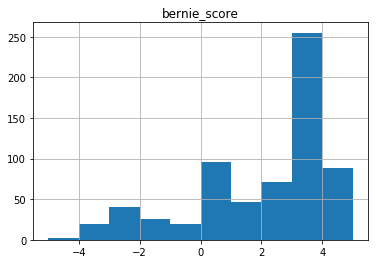

In [16]:
bernie_train_df.hist(column='bernie_score')

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x1a22de47b8>]],
      dtype=object)

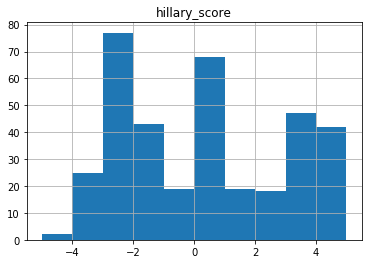

In [17]:
hillary_train_df.hist(column='hillary_score')

In [18]:
bernie_train_df['bernie_normalised_score'] = 5
bernie_train_df.loc[(bernie_train_df.bernie_score==-5), 'bernie_normalised_score'] = 0
bernie_train_df.loc[(bernie_train_df.bernie_score==-4), 'bernie_normalised_score'] = 1
bernie_train_df.loc[(bernie_train_df.bernie_score==-3), 'bernie_normalised_score'] = 2
bernie_train_df.loc[(bernie_train_df.bernie_score==-2), 'bernie_normalised_score'] = 3
bernie_train_df.loc[(bernie_train_df.bernie_score==-1), 'bernie_normalised_score'] = 4
bernie_train_df.loc[(bernie_train_df.bernie_score==0), 'bernie_normalised_score'] = 5
bernie_train_df.loc[(bernie_train_df.bernie_score==1), 'bernie_normalised_score'] = 6
bernie_train_df.loc[(bernie_train_df.bernie_score==2), 'bernie_normalised_score'] = 7
bernie_train_df.loc[(bernie_train_df.bernie_score==3), 'bernie_normalised_score'] = 8
bernie_train_df.loc[(bernie_train_df.bernie_score==4), 'bernie_normalised_score'] = 9
bernie_train_df.loc[(bernie_train_df.bernie_score==5), 'bernie_normalised_score'] = 10

/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.
/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


In [19]:
hillary_train_df['hillary_normalised_score'] = 5
hillary_train_df.loc[(hillary_train_df.hillary_score==-5), 'hillary_normalised_score'] = 0
hillary_train_df.loc[(hillary_train_df.hillary_score==-4), 'hillary_normalised_score'] = 1
hillary_train_df.loc[(hillary_train_df.hillary_score==-3), 'hillary_normalised_score'] = 2
hillary_train_df.loc[(hillary_train_df.hillary_score==-2), 'hillary_normalised_score'] = 3
hillary_train_df.loc[(hillary_train_df.hillary_score==-1), 'hillary_normalised_score'] = 4
hillary_train_df.loc[(hillary_train_df.hillary_score==0), 'hillary_normalised_score'] = 5
hillary_train_df.loc[(hillary_train_df.hillary_score==1), 'hillary_normalised_score'] = 6
hillary_train_df.loc[(hillary_train_df.hillary_score==2), 'hillary_normalised_score'] = 7
hillary_train_df.loc[(hillary_train_df.hillary_score==3), 'hillary_normalised_score'] = 8
hillary_train_df.loc[(hillary_train_df.hillary_score==4), 'hillary_normalised_score'] = 9
hillary_train_df.loc[(hillary_train_df.hillary_score==5), 'hillary_normalised_score'] = 10

/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [20]:
nlp = spacy.load("en_core_web_sm")
nlp.tokenizer.token_match = re.compile(r"(#[A-Za-z0-9_]+|@[A-Za-z0-9_]+)").match

In [21]:
import re
def clean_text(text):
    text = re.sub(r"RT", "", text)
    text = text.lower()
    text = re.sub(r"&amp", "", text)
    text = text.strip(' ')
    return text

In [22]:
bernie_train_df.text[2]

'RT @UMassAmherst: New #WBZ - #UMass Amherst poll: Clinton and Sanders in dead heat; Trump w/ big lead in Mass. on eve of #Primary https://t…'

In [23]:
bernie_cleaned_text = []

for text in bernie_train_df.text:
    text = str(text)
    text = clean_text(text)
    text = nlp(text) # tokenize
    # lemmatize:
    lemmatized = []
    for token in text:
        if token.text=='sanders' or token.text=='berniesanders' or token.text=='@berniesanders' or token.text=="@sensanders":
            lemmatized.append(token.text)
        elif token.is_punct==False and token.is_stop==False and token.like_url==False and token.is_space==False:
            lemmatized.append(token.lemma_)
    bernie_cleaned_text.append(' '.join(lemmatized))
    print(lemmatized)

['@victordukes23:', 'feel', 'bernie', 'sanders', 'say', 'reach', 'vote', 'lol', 'free', 'college', 'virtually', 'impossible', 'fam']
['@berniesanders', 'idea', 'congress', 'law']
['@umassamherst:', 'new', '#wbz', '#umass', 'amherst', 'poll', 'clinton', 'sanders', 'dead', 'heat', 'trump', 'w/', 'big', 'lead', 'mass', 'eve', '#primary']
['@avxlanche:', 'turn', 'light', 'bernie', 'sanders', '3', 'time', 'fast', 'mirror', 'turn', 'light', 'student']
['pretty', 'supportive', '#demtownhall', '#berniesander', 'm']
['@weknowwhatsbest:', 'bernie', 'sanders', 'socialist', 'upset', 'delegate', 'earn', 'new', 'hampshire', 'redistribute', 'somebody']
['@berniesanders:', 'stand', 'win', 'thank', 'new', 'hampshire']
['@jennafischer', '@hillaryclinton', '@sensanders', 'bernie', 'way', 'man', 'people', 'billionaire', '#feelthebern']
['@nbcnews:', 'watch', 'bernie', 'sanders', 'shoot', 'hoop', 'grandkid', 'wait', '#nhprimary', 'poll', 'close']
['@hparker:', '#mbta', 'major', 'safety', 'issue', 'infrastr

['@complexmag:', 'spike', 'lee', 'endorse', 'bernie', 'sanders', 'president', 'say', 'right', 'thing', 'white', 'house']
['@cnn:', '9', 'a.m.', '#cnnsotu', '@jaketapper', 'interview', '@realdonaldtrump', '@hillaryclinton', '@berniesanders', '@marcorubio', '@tedcruz']
['@sensanders:', 'view', 'people', 'right', 'telephone', 'today', 'information', 'collect', 'government']
['@davidshuster', '@hillaryclinton', '@berniesanders']
['@rolandsmartin', '@hillaryclinton', '@berniesanders', 'expect']
['@berniesanders:', 'bernie', 'trump', 'gop', 'want', 'democrat', 'white', 'house', 'bernie', 'good', 'chance', 'beat', 'republican']
['@sensanders:', 'listen', 'scientific', 'community', 'fox', 'news', 'lead', 'world', 'reverse', 'climate', 'change']
['@kimberlybookman:', '#ma', 'home', 'american', 'revolution', 'place', 'start', 'political', 'revolution', '@berniesanders', '#milton', '#7news', 'https']
['@nytimes:', 'win', 'debate', 'critic', 'hillary', 'clinton', 'shine']
['@sportsnation:', 'berni

['@cnn:', '.@berniesanders', 'ask', 'birth', 'certificate', '#demtownhall']
['@berniesanders', 'yuge', 'opportunity', 'connect', 'w/', 'boston', 'student', 'voter', '#nextpotustoemerson']
['@rbreich:', 'endorse', 'bernie', 'sanders', 'president', 'united', 'states', 'lead', 'movement', 'reclaim', 'america']
['@jheath_:', 'probably', 'well', 'arg', 'bernie', 'read', 'issue']
['@kmarkobarstool:', 'icymi', 'bernie', 'bucket', 'sanders', 'demand', 'rock', 'drill', 'jumper', 'glass']
['@mrjoesacco:', '@hillaryclinton', 'question', 'unanswere', 'deflect', 'untrustworthy', '#feelthebern', '#demtownhall', '#nevadacaucus', '#bernie2016', 'https:/']
['@halsey:', 'support', 'bernie', 'sanders', '#icantbreathe']
['@latinos4bernie:', 'today', '#supermonday!', 'know', 'tomorrow', 'find', 'vote', '#bernie', 'state', 'htt']
['@peteblackburn:', 'rip', 'bernie', 'sanders']
['@alex__katz:', 'look', 'like', '@berniesanders', 'assemble', 'brainless', 'trust', 'foreign', 'policy', 'mind', '#feelthebern']
['

['@huffpostpol:', 'rep', 'tulsi', 'gabbard', 'resign', 'dnc', 'post', 'endorse', 'bernie', 'sanders']
['@sensanders', 'bernie', 'democrat', 'majority', 'senate', 'republican', 'president', 'obstructionism']
['result', '#txprimary', '#democrat', '@hillaryclinton', '56', '@berniesanders', '40']
['@cbsboston:', 'wbz', 'umass', 'amherst', 'poll', 'clinton', 'sanders', 'dead', 'heat', 'trump', 'huge', 'lead', 'mass']
['hub|', 'bernie', 'sanders', 'downtown', 'boy', 'today', 'roadtrip', 'new', 'england', 'meet', 'liberty', 'square']
['@sensanders:', 'line', 'end', 'nearly', '47', 'million', 'americans', 'live', 'poverty', 'raise', 'minimum', 'wage', '$', '15']
['@bostonglobe:', 'hillary', 'clinton', 'rally', 'boston', 'monday', 'morning', 'bernie', 'sanders', 'boston', 'monday', 'evening']
['@phenomenality:', 'bernie', 'sanders', '21', 'arrest', 'civil', 'right', 'protest']
['#berniesanders', 'overtake', '#hillaryclinton', '5', 'percent', '#oklahoma', '#polls', '#bernie2016', '#getoutthevote

['@berniesanders:', 'vote', 'win', 'white', 'house', '#supermonday']
['bernie', 'sander', 'campaign', 'release', 'video', 'goosebumps', '@matadornetwork']
['@mountainherder:', 'good', 'reminder', '@hillaryclinton', '@berniesanders', 'agree', 'http']
['@berniesanders', '#notbernagain']
['@fcktravis:', 'fuck', 'bernie', 'sanders']
['@tulsigabbard:', 'resign', 'dnc', 'endorse', '@berniesanders', 'president', 'commander', 'chief']
['@roadtripne:', 'randomly', 'meet', '@berniesanders', 'pass', 'liberty', 'square', '#boston', 'yesterday', 'afternoon']
['@berniesanders:', 'president', 'obama', 'vice', 'president', 'biden', 'country', 'come', 'long', 'way', 'economically']
['@mikewoldemariam:', 'case', 'foreign', 'policy', 'expert', 'make', 'bernie', 'sanders', '@voxdotcom']
['@tytnetwork:', 'eric', 'garner', 'daughter', 'hail', 'bernie', 'activism', 'powerful', 'new', 'campaign', 'ad', '@huffpostpol']
['@phireisland:', 'watch', 'political', 'poll', 'bernie', 'sanders', 'plug', '👏', '🏾']
['hon

['try', '#berniesander', 'today', 'school']
['know', '#berniesanders,', 'check', 'background', '#blacklivesmatter', 'civil', 'right', 'era']
['@cnnpolitics:', 'south', 'carolina', 'prepare', 'vote', '@hillaryclinton', '@berniesanders', 'case', '#cnn’s', '#demtownhall']
['clap', 'hand', 'believe', 'democracy', 'bernie', 'sanders', '2016']
['@teamjohnkasich', '@johnkasich', 'bernie', 'play', '1-on-1']
['big', 'night', '@berniesanders', '@realdonaldtrump', '@johnkasich', 'strong', 'showing', '#nhprimary', '#wcvb']
['#berniesanders']
['@berniesanders:', 'look', 'caucus', 'location', '#nvforbernie']
['@realdonaldtrump', '@hillaryclinton', 'nominee', 'americans', 'vote', 'party', 'candidate', '@berniesanders']
['@berniesanderss4:', 'bernie', 'sanders', 'legend', 'get', 'arrest', 'protest', 'segregation', '50', 'year', 'ago']
['@dailycaller:', 'bernie', 'sanders', 'demand', '$', '15', 'hour', 'minimum', 'wage', 'pay', 'intern', '$', '12', 'hour']
['@cnn:', 'new', 'hampshire', 'voter', '#feelt

['@shaunking:', 'charge', '@berniesanders', 'resist', 'arrest', 'give', 'hell', 'make', 'arrest', 'difficult']
['bernie', 'sanders', 'depressing', 'reality', 'populism', 'american', 'politic', 'far', 'easy', 's', '@esquire']
['fact', '@berniesanders', 'exam', '😒']
['@cthagod:', 'sit', '@sensanders', '@killermike', 'south', 'carolina', 'weekend', 'watch']
['@poltoons:', '#nhprimary', '#berniesanders', 'defeat', 'hillary', '@tstig822', '#feelthebern', '#shelies', '#hillaryliesmatter']
['@sensanders', 'great', 'idea']
['@sargon_of_akkad', 'charlese', 'koch', 'endorse', 'bernie', 'sanders']
['@badfatherhan:', 'bernie', 'sanders', 'bear', 'long', 'time', 'ago', '#demtownhall']
['@thesource:', 'march', 'madness', 'boom', 'bernie', 'sanders', 'take', 'stage', 'forum']
['@sensanders:', 'people', 'truly', 'free', 'unable', 'feed', 'family', 'people', 'truly', 'free', 'health', 'car']
['@bostonmagazine:', '41', 'local', 'band', '#feelthebern', '@bradfordkrieger’s', 'boston', 'bernie', 'compilati

['see', 'bernie', 'tomorrow', '🤑', '#feelthebern']
['@sbarnyard', 'fuck', 'let', 'blackout', 'bernie', 'campaign', '#feelthebern']
['@berniesanders', 'get', 'warm']
['@viewstitch:', 'knit', '@berniesanders', 'fabulous', 'tonight', 'milton', 'ma', '#gobernie', '#knittingeverywhere']
['@kody_murphy', 'hitler', 'republican', 'bernie', 'sanders', 'anti', 'immigration', 'policy']
['@bleacherreport:', 'video', 'bernie', 'sanders', 'ball', 'wait', 'new', 'hampshire', 'result']
['@kmbc:', 'video', 'bernie', 'sanders', 'address', 'supporter', 'kc']
['@berniesanders:', 'stand', 'win', 'thank', 'new', 'hampshire']
['@mccrenshaw:', '@berniesanders', 'economy', 'work', 'people', 'disability', '#pwdsvote', '#cripthevote']
['@bpsnightmare:', 'embarrassment', '4', 'hillary', '#dnc', 'vice', 'chair', 'resign', 'endorse', '@sensanders', '#mapoli', '#bospoli', '@tabi_…']
['@uberfacts:', 'photo', '21-year', 'old', 'bernie', 'sanders', 'arrest', '1963', 'civil', 'right', 'protest']
['@halsey:', 'bernie', '

In [24]:
hillary_cleaned_text = []

for text in hillary_train_df.text:
    text = str(text)
    text = clean_text(text)
    text = nlp(text) # tokenize
    # lemmatize:
    lemmatized = []
    for token in text:
        if token.text=='sanders' or token.text=='berniesanders' or token.text=='@berniesanders' or token.text=="@sensanders":
            lemmatized.append(token.text)
        elif token.is_punct==False and token.is_stop==False and token.like_url==False and token.is_space==False:
            lemmatized.append(token.lemma_)
    hillary_cleaned_text.append(' '.join(lemmatized))
    print(lemmatized)

['@umassamherst:', 'new', '#wbz', '#umass', 'amherst', 'poll', 'clinton', 'sanders', 'dead', 'heat', 'trump', 'w/', 'big', 'lead', 'mass', 'eve', '#primary']
['@parkspics:', 'like', 'hillary', 'clinton', 'leslie', 'knope']
['@ap_politics:', 'late', 'hillary', 'clinton', 'promise', 'supporter', 'fight']
['@hillaryclinton:', 'go', 'scared', 'let', 'worrying', 'deal']
['@jennafischer', '@hillaryclinton', '@sensanders', 'bernie', 'way', 'man', 'people', 'billionaire', '#feelthebern']
['@bbckimghattas:', 'hillary', 'clinton', 'bernie', 'sanders', 'ted', 'cruz', 'marco', 'rubio', 'agree', 'thing', 'rare', 'bipartisan', 'moment']
['@washingtonpost:', 'bernie', 'sanders', 'right', 'bill', 'clinton', 'welfare', 'law', 'double', 'extreme', 'poverty']
['@stinaa1982:', 'twitter', 'censor', '#whichhillary', 'spread', '#bestactresshillary', 'like', 'wildfire']
['@raniakhalek:', 'time', '@hillaryclinton', 'return', 'campaign', 'contribution', 'muslims', 'arabs', 'woo', 'jewish', 'voter']
['@lisavikin

['@commonwhitegiri:', 'ron', 'swanson', 'like', 'hillary', 'clinton']
['@parkspics:', 'like', 'hillary', 'clinton', 'leslie', 'knope']
['@acaldwellap:', 'hillary', 'clinton', 'win', 'nevada', 'democratic', 'caucuses', '@ap)']
['@thetoast2016:', 'hillary', '72', 'old', 'get', '75', 'year', 'old', 'man', 'right', 'run', 'potus', 'age', 'mention', 'http']
['@en_jajaja:', 'hillary', 'clinton', 'get', 'white', 'old', 'teacher', 'attitude', 'wait"attitude', 'bell', 'dismiss', 'attit']
['@thenewdeal:', 'choose', 'wisely', '#bernie2016', '#feelthebern', '#supertuesday', '#supermonday']
['@jeneps:', 'huge', 'crowd', 'gather', 'street', 'boston', 'hear', 'briefly', 'hillary', 'clinton']
['@nytopinion:', 'care', 'gender', 'equality', 'oblige', 'hillary', 'clinton', 'write', '@frankbruni', 'https:/']
['video', 'surface', 'hillary', 'clinton', 'pay', 'speech', 'goldman', 'sachs', 'completely', 'harmless']
['@cnn:', '#cnnsotu', 'start', '@jaketapper', 'interview', '@realdonaldtrump', '@hillaryclinto

['vote', 'hillary', 'clinton', 'tomorrow']
['@hillaryclinton:', 'odd', 'hear', 'run', 'president', 'need', 'love', 'kindness', 'america']
['way', 'think', 'obama', 'hillary', 'hope', 'achieve', 'liberal', 'victory', 'clinton', 'admin', 'hope']
['@mountainherder:', 'good', 'reminder', '@hillaryclinton', '@berniesanders', 'agree', 'http']
['@hillaryclinton', 'fuck', 'scum']
['@salon:', 'hillary', 'clinton', 'candidate', 'economic', 'fairness', 'peace', 'genuine', 'progressive', 'agenda', 'm']
['@nytopinion:', 'hillary', 'clinton', 'stop', 'stonewall', 'release', 'bank', 'speech', 'transcript']
['@nytopinion:', 'care', 'gender', 'equality', 'oblige', 'hillary', 'clinton', 'write', '@frankbruni', 'https:/']
['@cbsboston:', 'clinton', 'sanders', 'visit', 'massachusetts', 'ahead', 'primary']
['@breakingpol:', 'state', 'dept', 'release', '1,000', 'page', 'hillary', 'clinton', 'email', 'release', 'ap']
['@tweetlikeagiri:', 'ron', 'swanson', 'like', 'hillary', 'clinton']
['@jessbudd3:', '#demde

['@sasscbrown', '@therightscoop', 'stay', 'classy', '@hillaryclinton...', '#whichhillary', '#benghazimatter']
['@twlldun:', 'get', 'clinton', 'fever', 'get', 'sanders', 'fever']
['donald', 'trump', 'hillary', 'clinton', 'meek', 'mill', 'kanye', 'west', 'martin', 'shkreli', 'plane', 'blow', 'son', 'bitch', 'twice']
['@hillaryclinton:', 'barack', 'obama', 'president', 'united', 'states', 'january', '20', '2017—that', 'fact', 'republicans', 'like']
['@bostonglobe:', 'hillary', 'clinton', 'address', 'supporter', 'new', 'hampshire', 'lose', 'primary', 'bernie', 'sanders']
['@mitchellreport', '@berniesanders', '@hillaryclinton', '@nbcnightlynew', 'nice', 'issue', 'story', 'oppose', 'process', 'process', 'process']
['@jdwinteregg:', '#teamjd', 'member', 'prove', 'woman', '#readyforhillary', 'student', '#feelthebern.', '#oh8', '#hope', 'http']
['know', 'bruce', 'springsteen', 'hillary', 'clinton', 'common', '#lnsm']
['@justdoodirty:', '#theview', 'sorry', '#hillary2016', 'win', 'right', '#cand

In [25]:
from sklearn.feature_extraction.text import TfidfVectorizer
tfidf_bernie = TfidfVectorizer(sublinear_tf=True, 
                        norm='l2', 
                        encoding='latin-1', 
                        ngram_range=(1, 2), 
                        stop_words='english')

features_bernie = tfidf_bernie.fit_transform(bernie_cleaned_text)
labels_bernie = bernie_train_df.bernie_normalised_score
features_bernie.shape

(665, 5724)

In [26]:
tfidf_hillary = TfidfVectorizer(sublinear_tf=True, 
                        norm='l2', 
                        encoding='latin-1', 
                        ngram_range=(1, 2), 
                        stop_words='english')

features_hillary = tfidf_hillary.fit_transform(hillary_cleaned_text)
labels_hillary = hillary_train_df.hillary_normalised_score
features_hillary.shape

(360, 3622)

In [27]:
# instantiate models
model_linear = LinearRegression()
model_1vR = LogisticRegression(multi_class='ovr')
model_multi = LogisticRegression(multi_class='multinomial',
    solver='lbfgs')
model_ordinal = LogisticAT(alpha=0)  # alpha parameter set to zero to perform no regularisation
model_random_forest = RandomForestRegressor()

### Let's test all of these models

1. Bernie

In [28]:
MAE = make_scorer(mean_absolute_error)
folds = 10

print('Mean absolute error:' )
MAE_linear = cross_val_score(model_linear,
    features_bernie,
    labels_bernie,
    cv=folds,
    scoring=MAE)
print('Linear regression: ', np.mean(MAE_linear))
MAE_1vR = cross_val_score(model_1vR,
    features_bernie,
    labels_bernie,
    cv=folds,
    scoring=MAE)
print('Logistic regression (one versus rest): ', np.mean(MAE_1vR))
MAE_multi = cross_val_score(model_multi,
    features_bernie,
    labels_bernie,
    cv=folds,
    scoring=MAE)
print('Logistic regression (multinomial): ', np.mean(MAE_multi))
MAE_ordinal = cross_val_score(model_ordinal,
    features_bernie,
    labels_bernie,
    cv=folds,
    scoring=MAE)
print('Ordered logistic regression: ', np.mean(MAE_ordinal))
MAE_random_forest = cross_val_score(model_random_forest,
                                   features_bernie,
                                   labels_bernie,
                                   cv=folds,
                                   scoring=MAE)
print('Random Forest regressor: ', np.mean(MAE_random_forest))

Mean absolute error:
Linear regression:  1.5692195813689893


/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_split.py:652: Warning: The least populated class in y has only 2 members, which is too few. The minimum number of members in any class cannot be less than n_splits=10.
  % (min_groups, self.n_splits)), Warning)
/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be chan

Logistic regression (one versus rest):  1.6685298704396754
Logistic regression (multinomial):  1.6505894746276877
Ordered logistic regression:  1.5772048846675712


/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)
/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)
/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)
/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)
/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The de

Random Forest regressor:  1.596207004300288


In [29]:
MAE = make_scorer(mean_absolute_error)
folds = 10

print('Mean absolute error:' )
MAE_linear = cross_val_score(model_linear,
    features_hillary,
    labels_hillary,
    cv=folds,
    scoring=MAE)
print('Linear regression: ', np.mean(MAE_linear))
MAE_1vR = cross_val_score(model_1vR,
    features_hillary,
    labels_hillary,
    cv=folds,
    scoring=MAE)
print('Logistic regression (one versus rest): ', np.mean(MAE_1vR))
MAE_multi = cross_val_score(model_multi,
    features_hillary,
    labels_hillary,
    cv=folds,
    scoring=MAE)
print('Logistic regression (multinomial): ', np.mean(MAE_multi))
MAE_ordinal = cross_val_score(model_ordinal,
    features_hillary,
    labels_hillary,
    cv=folds,
    scoring=MAE)
print('Ordered logistic regression: ', np.mean(MAE_ordinal))
MAE_random_forest = cross_val_score(model_random_forest,
                                   features_hillary,
                                   labels_hillary,
                                   cv=folds,
                                   scoring=MAE)
print('Random Forest regressor: ', np.mean(MAE_random_forest))

Mean absolute error:
Linear regression:  1.788538141696426
Logistic regression (one versus rest):  2.1930678790637823


/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_split.py:652: Warning: The least populated class in y has only 1 members, which is too few. The minimum number of members in any class cannot be less than n_splits=10.
  % (min_groups, self.n_splits)), Warning)
/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be chan

Logistic regression (multinomial):  2.1292956703225334
Ordered logistic regression:  1.8472222222222225


/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)
/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)
/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)
/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)
/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The de

Random Forest regressor:  1.8576172839506175


## It appears that we should proceed with the ordered logistic regression model for Bernie, and the random forest model for Hillary

Now to tune the parameters and select the best model.  
I also choose to further explore the random forest model for bernie, just as it provides more tuning options than the log model.

In [30]:
bernie_param_grid_LOG = [
    {'alpha': [0.1, 0.5, 0.1, 0.2, 0.3, 0.4, 0.45, 0.5, 0.6, 0.7, 0.8, 0.9, 1]}
]

hillary_param_grid_LOG = [
    {'alpha': [0.1, 0.5, 0.1, 0.2, 0.3, 0.4, 0.45, 0.5, 0.6, 0.7, 0.8, 0.9, 1]}
]


bernie_param_grid_FOREST = [
    {'n_estimators': [100, 150, 200, 300, 400, 500, 1000], 
     'max_features': [10, 20, 30, 40, 50, 60, 70, 100, 150, 200, 250, 300, 350, 400, 450, 500, None]}
]

hillary_param_grid_FOREST =  [
    {'n_estimators': [100, 150, 200, 300, 400, 500, 1000], 
     'max_features': [10, 20, 30, 40, 50, 60, 70, 100, 150, 200, 250, 300, 350, 400, 450, 500, None]}
 ]

In [31]:
# bernie tuning LOG
bernie_model_log = GridSearchCV(estimator=model_ordinal,
                               param_grid=bernie_param_grid_LOG,
                               scoring=MAE,
                               cv=10)

bernie_model_log.fit(features_bernie, labels_bernie)

/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


GridSearchCV(cv=10, error_score='raise-deprecating',
       estimator=LogisticAT(alpha=0, max_iter=1000, verbose=0),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid=[{'alpha': [0.1, 0.5, 0.1, 0.2, 0.3, 0.4, 0.45, 0.5, 0.6, 0.7, 0.8, 0.9, 1]}],
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=make_scorer(mean_absolute_error), verbose=0)

In [32]:
bernie_model_log_results_df = pd.DataFrame(bernie_model_log.cv_results_)

/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:125: FutureWarning: You are accessing a training score ('split0_train_score'), which will not be available by default any more in 0.21. If you need training scores, please set return_train_score=True
  warnings.warn(*warn_args, **warn_kwargs)
/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:125: FutureWarning: You are accessing a training score ('split1_train_score'), which will not be available by default any more in 0.21. If you need training scores, please set return_train_score=True
  warnings.warn(*warn_args, **warn_kwargs)
/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:125: FutureWarning: You are accessing a training score ('split2_train_score'), which will not be available by default any more in 0.21. If you need training scores, please set return_train_score=True
  warnings.warn(*warn_args, **warn_kwargs)
/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py

In [33]:
bernie_model_log.best_score_

1.4706766917293232

In [34]:
bernie_model_log.best_estimator_

LogisticAT(alpha=0.1, max_iter=1000, verbose=0)

In [35]:
bernie_final_model_log = bernie_model_log.best_estimator_

In [36]:
# save model using jobli
dump(bernie_final_model_log, TRAINED_MODELS+'bernie_final_model_log_MA.joblib') 

['/Users/nikloynes/Desktop/SENTIMENT/data/trained_models/bernie_final_model_log_MA.joblib']

In [37]:
# bernie tuning forest
bernie_model_forest = GridSearchCV(estimator=model_random_forest,
                                  param_grid=bernie_param_grid_FOREST,
                                  scoring=MAE,
                                  cv=10)

bernie_model_forest.fit(features_bernie, labels_bernie)

/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


GridSearchCV(cv=10, error_score='raise-deprecating',
       estimator=RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators='warn', n_jobs=None,
           oob_score=False, random_state=None, verbose=0, warm_start=False),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid=[{'n_estimators': [100, 150, 200, 300, 400, 500, 1000], 'max_features': [10, 20, 30, 40, 50, 60, 70, 100, 150, 200, 250, 300, 350, 400, 450, 500, None]}],
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=make_scorer(mean_absolute_error), verbose=0)

In [38]:
bernie_forest_model_results_df = pd.DataFrame(bernie_model_forest.cv_results_)

/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:125: FutureWarning: You are accessing a training score ('split0_train_score'), which will not be available by default any more in 0.21. If you need training scores, please set return_train_score=True
  warnings.warn(*warn_args, **warn_kwargs)
/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:125: FutureWarning: You are accessing a training score ('split1_train_score'), which will not be available by default any more in 0.21. If you need training scores, please set return_train_score=True
  warnings.warn(*warn_args, **warn_kwargs)
/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:125: FutureWarning: You are accessing a training score ('split2_train_score'), which will not be available by default any more in 0.21. If you need training scores, please set return_train_score=True
  warnings.warn(*warn_args, **warn_kwargs)
/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py

In [39]:
bernie_model_forest.best_score_

1.5762445373475118

In [40]:
bernie_final_model_forest = bernie_model_forest.best_estimator_

In [47]:
# save model using joblib
dump(bernie_final_model_forest, TRAINED_MODELS+'bernie_final_model_forest_MA.joblib') 

['/Users/nikloynes/Desktop/SENTIMENT/data/trained_models/bernie_final_model_forest_MA.joblib']

In [63]:
# linear regression
bernie_model_linear = model_linear.fit(features_bernie, labels_bernie)

In [43]:
# hillary tuning log
hillary_model_log = GridSearchCV(estimator=model_ordinal,
                                param_grid=hillary_param_grid_LOG,
                                scoring=MAE,
                                cv=10)

hillary_model_log.fit(features_hillary, labels_hillary)

GridSearchCV(cv=10, error_score='raise-deprecating',
       estimator=LogisticAT(alpha=0, max_iter=1000, verbose=0),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid=[{'alpha': [0.1, 0.5, 0.1, 0.2, 0.3, 0.4, 0.45, 0.5, 0.6, 0.7, 0.8, 0.9, 1]}],
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=make_scorer(mean_absolute_error), verbose=0)

In [44]:
hillary_model_log_results_df = pd.DataFrame(hillary_model_log.cv_results_)

/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:125: FutureWarning: You are accessing a training score ('split0_train_score'), which will not be available by default any more in 0.21. If you need training scores, please set return_train_score=True
  warnings.warn(*warn_args, **warn_kwargs)
/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:125: FutureWarning: You are accessing a training score ('split1_train_score'), which will not be available by default any more in 0.21. If you need training scores, please set return_train_score=True
  warnings.warn(*warn_args, **warn_kwargs)
/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:125: FutureWarning: You are accessing a training score ('split2_train_score'), which will not be available by default any more in 0.21. If you need training scores, please set return_train_score=True
  warnings.warn(*warn_args, **warn_kwargs)
/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py

In [45]:
hillary_model_log.best_score_

1.8222222222222222

In [46]:
hillary_final_model_log = hillary_model_log.best_estimator_

In [48]:
# save model using joblib
dump(hillary_final_model_log, TRAINED_MODELS+'hillary_final_model_log_MA.joblib') 

['/Users/nikloynes/Desktop/SENTIMENT/data/trained_models/hillary_final_model_log_MA.joblib']

In [49]:
# hillary tuning forest
hillary_model_forest = GridSearchCV(estimator=model_random_forest,
                                param_grid=hillary_param_grid_FOREST,
                                scoring=MAE,
                                cv=10)

hillary_model_forest.fit(features_hillary, labels_hillary)

GridSearchCV(cv=10, error_score='raise-deprecating',
       estimator=RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators='warn', n_jobs=None,
           oob_score=False, random_state=None, verbose=0, warm_start=False),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid=[{'n_estimators': [100, 150, 200, 300, 400, 500, 1000], 'max_features': [10, 20, 30, 40, 50, 60, 70, 100, 150, 200, 250, 300, 350, 400, 450, 500, None]}],
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=make_scorer(mean_absolute_error), verbose=0)

In [50]:
hillary_model_forest_results_df = pd.DataFrame(hillary_model_forest.cv_results_)

/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:125: FutureWarning: You are accessing a training score ('split0_train_score'), which will not be available by default any more in 0.21. If you need training scores, please set return_train_score=True
  warnings.warn(*warn_args, **warn_kwargs)
/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:125: FutureWarning: You are accessing a training score ('split1_train_score'), which will not be available by default any more in 0.21. If you need training scores, please set return_train_score=True
  warnings.warn(*warn_args, **warn_kwargs)
/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:125: FutureWarning: You are accessing a training score ('split2_train_score'), which will not be available by default any more in 0.21. If you need training scores, please set return_train_score=True
  warnings.warn(*warn_args, **warn_kwargs)
/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py

In [51]:
hillary_model_forest.best_score_

1.8780959554334553

In [52]:
hillary_final_model_forest = hillary_model_forest.best_estimator_

In [54]:
# save model using joblib
dump(hillary_final_model_forest, TRAINED_MODELS+'hillary_final_model_forest_MA.joblib') 

['/Users/nikloynes/Desktop/SENTIMENT/data/trained_models/hillary_final_model_forest_MA.joblib']

In [55]:
hillary_model_linear = model_linear.fit(features_hillary, labels_hillary)

## Predicting values on previously unseen data

In [56]:
full_cleaned_text = []

for text in ma_full_df.text:
    text = str(text)
    text = clean_text(text)
    text = nlp(text) # tokenize
    # lemmatize:
    lemmatized = []
    for token in text:
        if token.text=='sanders' or token.text=='berniesanders' or token.text=='@berniesanders' or token.text=="@sensanders":
            lemmatized.append(token.text)
        elif token.is_punct==False and token.is_stop==False and token.like_url==False and token.is_space==False:
            lemmatized.append(token.lemma_)
    full_cleaned_text.append(' '.join(lemmatized))
    print(lemmatized)

['@berniesanders:', 'stand', 'win', 'thank', 'new', 'hampshire']
['cfyw', 'salute', '@berniesanders!', 'go', 'way', 'good', 'country', 'great', 'business', '#27dollars']
['@realdonaldtrump', 'bullshit', 'artist', 'president', 'r', 'u', 'go', 'celebrate', 'cheat', 'wife', '#bernie2016']
['@berniesanders', 'minimum', 'wage', 'rise', 'inflation', 'issue', 'payback', 'time']
['@billmon1:', '73%!in', 'vote', 'sanders', '102,651', 'trump', '69,328', 'hrc', '66,588', 'kasich', '32,468', 'rest', 'field', '101,657']
['@people4bernie:', 'win', '#feelthebern', '#nhprimary']
['@truestoryshaff:', 'sanders', 'soar', 'democratic', 'socialist', 'win', 'new', 'hampshire', '#feelthebern']
['@mmflint:', 'pretty', 'need', 'know', 'candidate', 'pay', 'intern', 'bernie', 'sanders']
['win', 'pub', 'trivia', 'tonight', 'bernie', 'sanders', 'themed', 'team', 'final', 'question', 'phish', 'answer', 'feeling', '🍁', '🍁', '🍁']
['@berniesanders:', 'stand', 'win', 'thank', 'new', 'hampshire']
['@ncforbernie:', 'free

['@markhalperin', '@realdonaldtrump', '@berniesanders', 'report', 'card', 'divorce']
['@bernreport:', '.@berniesanders', 'win', '#nhprimary', 'tonight', 'large', 'margin', 'history', 'american', 'democratic', 'party']
['@groovesdc:', 'bernie', 'sanders', 'barack', 'obama', 'wait', 'message', 'want', 'south', 'carolina', 'folk']
['@huffingtonpost:', 'bernie', 'sanders', 'new', 'hampshire', 'victory', 'remind', 'far', 'come', 'medium', 'write', 'ht']
['@jayruderman:', '.@berniesanders', 'mention', '#disability', 'right', '#nhprimary', 'speech', 'tonight', '#fitn']
['@bernreport:', '.@berniesanders', 'win', '#nhprimary', 'tonight', 'large', 'margin', 'history', 'american', 'democratic', 'party']
['@davidaxelrod:', 'stunning', 'datum', 'point', '@berniesanders', 'win', 'handily', 'nh', 'liberal', 'surprisingly', 'moderate', '#nhprimary']
['@pzf:', 'breaking', 'news', 'hillary', 'clinton', 'concede', 'bernie', 'sanders', 'cnn']
['@sheswantsthed:', 'moment', 'realize', 'bernie', 'sanders', '

['@thebradmielke:', 'hart', 'location', 'kasich', '5', 'trump', '4', 'christie', '2', 'bush', '1', 'carson', '1', 'sanders', '12', 'clinton', '7', 'mark', 'stewart', 'greenstein', '2']
['#berniesander', 'bitch']
['@sensanders', 'win', 'democratic', 'voter', 'tiny', 'town', 'dixville', '@johnkasich', 'sneak', 'past', '@realdonaldtrump', '#nh', '@cnn']
['@berniesanders:', 'people', 'campaign']
['@nicholsuprise', '@berniesanders', 'awesome']
['#bernie', '#sanders', 'commit', 'save', '#environment.', '#newhampshireprimary', '#cleanenergy', '#cleanairact', '#nhprimary']
['@vv4change:', '1', 'candidate', 'buy', 'fossil', 'fuel', 'profiteer', '@berniesanders', 'blow', 'chance', 'vote']
['@jamespindell:', 'dixville', 'notch', 'result', 'kasich', '3', 'trump', '2', '0', 'bernie', '4', 'clinton', '0', '#fitn']
['@mikememoli:', '.@johnkasich', 'win', 'dixville', 'notch', 'vote', '@realdonaldtrump;', '@berniesanders', 'sweep', '4', 'dem', 'ballot']
['sanders', 'sweep', 'hrc', 'dixville', 'notch', 

['@angryvoters:', 'iowa', 'dems', 'claim', 'instance', 'sanders', 'short', 'delegate', '#nhprimary', '#feelthebern', '#p2']
['@ziggysiggy:', '.#nhprimary', '#newhampshire', '#jointherevolution', '@thedemocrat', '@msnbc', '@abcnews', '@foxnews', '@cnn', '@bernie2016tv', '#bernie2016', 'https:/']
['@maryaliceparks:', 'live', 'online', '@gma', "@berniesanders'", 'concord', 'nh', 'office']
['@politico:', 'result', 'dixville', 'notch', '9', 'voter', '@berniesanders:', '4', '@hillaryclinton:', '0', '@johnkasich', '3', '@realdonaldtrump', '2']
['@sensanders:', 'moral', 'responsibility', 'reduce', 'grow', 'gap', 'rich']
['@oregon4bernie:', '@pittsbern', '@berniesanders', 'uniformed', 'person', 'say', 'young', 'people', '#feelthebern??', 'grandmas', 'unite', 'bernie']
['kasich', 'sanders', 'win', 'vote', 'new', 'hampshire', 'dixville', 'notch', '#fitn', '#nh', '@cnnpolitics']
['bernie', 'sanders', 'revolutionary', '#imwithher', '#nhprimary', '#hillaryclinton', '#603forhrc']
['@massnurses:', 'tr

['500,000', 'people', 'expect', 'vote', 'prediction', 'winner', '@berniesanders', '@realdonaldtrump']
['@mattyglesias:', 'starkness', 'demographic', 'divide', 'ensure', 'bernie', 'vision', 'win', 'lose', 'primary']
['@luckmanfan1218:', '@gma', '@berniesanders', 'show', 'concern', 'trump', 'throw', 'take', 'coat', 'away']
['@johndennisweei', 'bernie', 'sanders', 'result', 'decade', 'class', 'race', 'warfare', 'wage', 'dem', 'leave', 'kill', 'idea', 'american', 'dream']
['@justinbamberg:', 'bernie', 'be', 'play', 'game', 'run', 'potus', 'change', 'game', '@berniesanders', '✊', '🏽', '🇺', '🇸', '✊', '🏽', 'https']
['@glennheiser:', 'bernie', 'need', 'volunteer', 'politic', 'civic', 'duty', '#feelthebern', '#bernie2016']
['happy', 'voting', 'day', 'new', 'hampshire', 'vote', '#voterrevolution', '#feelthebern', '#notmeus', '#berniesanders']
['@citzabroad4bern:', 'register', '#newhampshire', 'vote', '@berniesanders', '4', 'future', 'believe', '#nhprimary', '#votetogether', 'h']
['nh', 'predicti

['#bernie2016']
['sanders', 'kasich', 'win', 'dixville', 'notch', 'mean', '#fitn']
['@politico:', 'david', 'brock', 'time', "@berniesanders'", 'purity', 'bubble', 'burst', '|', 'getty']
['@cnn:', '.@johnkasich', '@berniesanders', 'win', 'vote', 'new', 'hampshire', 'dixville', 'notch']
['fdr:"old', 'enemy', 'peace', 'financial', 'monopoly', 'speculation', 'reckless', 'banking', 'class', 'antagonism', 'war', 'profiteering', '#berniesander', '#nhprimary']
['bernie', 'gt;2x', 'total', 'sign', 'backroad', 'rte', 'manch', 'sunday', 'dem', 'equal', 'yard', 'rural', 'b', '2:1']
['@mattbruenig:', 'true', 'causation', 'bernie', 'coolness', 'backwards', 't']
['need', '@berniesanders', 'presidency', 'larry', 'david', 'impersonations', '#p2']
['@berniesanders:', 'thank', 'ibew', 'local', '357', 'support', '#nvforbernie']
['@joaniegentian:', 'bernie', 'gt;2x', 'total', 'sign', 'backroad', 'rte', 'manch', 'sunday', 'dem', 'equal', 'yard', 'rural', 'b', '2:1', 'htt']
['proud', 'dixville', '@berniesand

['@masspeaceaction:', 'bernie', 'sanders', 'president', 'peace', 'action', 'massachusetts', 'peace', 'action', 'endorse', 'sen', 'bernie', 'sanders', 'pre', 'http']
['@nana4bernie:', 'hi', 'nana', '#nothereforboys', '#newhampshireprimary', '#bernie2016', '#seniors4bernie', '@babesforbernie', '@women4bernie']
['@heathwcarter:', 'piece', '@religpolitic', 'despite', "@berniesanders'", 'good', 'effort', 'new', 'gild', 'age']
['@voxdotcom:', 'bernie', 'hillary', 'battle', 'issue', 'trust']
['@virginiaincal:', 'sanders', 'income', 'job', 'soar', 'economist', 'say', '#feelthebern']
['@nationalnurses:', 'rn', 'patty', 'healey', 'break', 'reason', 'canvass', '@berniesanders', 'today', 'nh', '#nhprimary', '#feelthebern', 'ht']
['@destructivechem:', '#nhprimary', 'kasich', 'describe', 'hillary', 'sanders', 'word', 'left', 'hillary', 'https']
['@patrickesque', '@berniesanders', 'yeah', 'not', 'actually', 'see', 'campaign', 'local', 'college', 'day', 'feb', '5th', 'post', 'debate', '☺']
['@politicu

['fyi-', 'choose', 'republican', 'ballot', 'bernie', 'need', 'help', 'today', 'undeclared', 'election', '#feelthebern', '#fitn']
['@nebhe:', 'river', 'separate', 'bernie', 'sanders', 'state', 'primary', '|']
['@karenthepeach', '@johnkerry', '@berniesanders', '@martinomalley', '@gavinnewsom', 'maybe', 'eliot', 'spitzer', 'ag', 'dennis', 'kucinich', 'anger']
['@karenthepeach', '@johnkerry', '@berniesanders', '@martinomalley', '@gavinnewsom', 'begin', 'think', 'real', 'econometric']
['@ireneberns:', 'new', 'hampshire', 'primary', 'vote', 'bernie', 'sanders', 'candidate', 'sincerely', 'care', '#votetogether']
['@theplumlinegs:', 'sanders', 'supporter', 'equate', 'treat', 'hillary', 'bernie', 'fairly', 'pro', 'clinton']
['today', 'hot', 'tweet', 'people', 'follow', '@berniesanders']
['2017', 'budget', 'show', 'gov', 'spend', '$', '$', '$', 'military', 'social', 'issue', '@berniesanders', '@hillaryclinton']
['@libertea2012:', 'liam', 'veteran', 'believe', '#medicareforall', 'caucus', '@berni

['@quinndaghost:', 'poll', 'close', '7', 'p.m.', 'est', 'today', '#nhprimary.', '#feelthebern', 'sure', 'bernie', 'need', 'vote', 'http']
['@chrisjzullo:', 'contrary', 'medium', 'narrative', '@berniesanders', 'propose', 'tax', 'increase', 'work', 'americans', '#feelthebern', '#cnn']
['@bernie4presusa:', 'share', 'truth', 'false', 'info', '@hillaryclinton', 'camp', '#nhprimary', '#facts', '#nhpolitics', '#feelthebern', '#news', '#voters', 'http']
['@doc_jjk:', 'supermodel', 'idea', 'bernie', '90%!of', 'salary', 'knucklehead']
['@berniesanders', 'supporter', '#voteforbernie', '#nhprimary.']
['bernie', 'zahn', 'new', 'york', 'work', 'phone', 'gotv', 'effort', '@johnkasich', 'nashua']
['@cenkuygur:', 'wall', 'street', 'bankster', 'attack', '@berniesanders', '#feelthebern', '#bernie2016']
['@kartpath:', 'primary', 'day', '@berniesanders', 'surprise', 'stop', 'polling', 'place', 'concord']
['nh', 'bernie', 'head', 'harlem', 'breakfast', 'al', 'sharpton', '@goldie', 'taylor']
['@people4bernie

['@es_snipes:', 'break', 'late', 'black', 'life', 'like', 'father', 'matter', 'america', 'endorse', '@berniesanders', 'https:/']
['@berniesanders:', 'health', 'care', 'recognize', 'right', 'man', 'woman', 'child', '#nhprimary']
['@ziadkhan:', 'retweete', 'bernie', 'sanders', '@berniesanders)', 'vote', 'bernie', '#nhprimary?', 'use', '#ivoted', 'share']
['@weknowwhatsbest:', 'completely', 'normal', 'bernie', 'sanders', 'wonder', 'rich', 'family', 'miss', 'angry', 'butler']
['@dykstradame:', 'bernie', 'get', 'sanders', 'record', 'push', 'major', 'reform', 'surprise']
['@dykstradame:', 'fact', 'bernie', 'sanders', 'get', 'senate', 'hillary', 'clinton', '@pplswar']
['@berniesanders:', 'health', 'care', 'recognize', 'right', 'man', 'woman', 'child', '#nhprimary']
['@berniesanders:', 'student', 'graduate', 'college', 'crush', 'debt', '#nhprimary']
['@andreawbz:', 'arrive', '@berniesanders', 'primary', 'night', 'hq', 'concord', 'nh', 'night', 'follow', '@katemerrill', 'i.', '#fitn']
['class',

['@bsandersbrigade:', '#feelthebern', '#nothereforboys?', 'video', 'support', '@berniesanders', 'feature', 'ht']
['@colleges4bernie:', 'bernie', 'compare', 'nation', 'great', '#bernie2016']
['bernie', 'supporter', 'article', 'tugging', 'collar', 'bit', 't']
['henry', 'ford', 'know', 'bank', 'crooked', 'system', 'rig', '#berniesanders', '#fightbigmoney', '#breakemup']
['@berniesanders:', 'vote', 'bernie', '#nhprimary?', 'use', '#ivoted', 'share', 'image']
['look', 'inside', 'concord', 'high', 'gym', 'site', '@berniesanders', 'election', 'night', 'party', '#fitn']
['@wowkota:', 'bernie', 'sanders', 'yield', '6/4/1992', 'fight', 'american', 'people', '#bernie2016', '#election2016']
['@cnn:', 'despite', 'chance', 'woman', 'president', '@hillaryclinton', 'lag', '@berniesanders', 'nh', 'woman']
['@berniesanders:', 'want', 'imagine', 'year', 'minimum', 'wage', 'living', 'wage', '#nhprimary']
['@rbecker51:', '.@berniesanders', 'supporter', 'florida', 'deliver', 'truckload', 'water', 'flint', '

['.@hardball_chris', 'say', '#berniesanders', '#donaldtrump', 'bring', 'joy', 'focus', 'campaign', '#fitn']
['dixville', 'notch', 'return', 'come', 'flood', 'kasich', '3', 'trump', '2', 'd', 'sanders', '4', 'clinton', '0']
['@bzref:', 'kasich', 'vs', 'sanders', 'final', 'need', 'vote', '#dixvillenotch', 'go', 'go', 'america']
['actual', 'election', 'slim', 'margin', 'high', 'stake', 'routinely', 'call', 'soon', '@berniesanders', 'run', 'away', '2:1', '#fitn', '#nhprimary']
['break', 'dixville', 'notch', 'n.h', 'vote', 'kasich', '3', 'trump', '2', 'republicans', 'democrats', 'sanders', '4', 'smh']
['bernie', '4', 'hillary', '0', 'dixville', 'notch', '#bernie2016']
['@laurenkmaloney:', '@dixvillevote', '3', 'vote', 'kasich', '2', 'trump', '4', 'sanders', '#nhprimary', '#fitn', '#dixvillenotch']
['vote', 'tiny', 'nh', 'town', 'dixville', 'notch', 'trump', '2', 'kasich', '3', 'sanders', '4', 'clinton', '0', '#fitn']
['vote', 'dixville', 'notch', 'nh', '#nhprimary', 'begin', '3', 'kasich', 

['@kierablessing:', 'room', 'slowly', 'begin', 'fill', '@berniesanders', 'watch', 'party', 'concord', 'hs', 'poll', 'close', '39', 'min', '@etprimary', 'http']
['@bernieshomie:', 'fool', 'propaganda', 'surround', "@berniesanders'", 'tax', 'plan', '90%!rates', 'sight', '#feelth…']
['@nbcnews', 'kasich', 'sanders', 'win', 'dixville']
['@politico:', 'result', 'dixville', 'notch', '9', 'voter', '@berniesanders:', '4', '@hillaryclinton:', '0', '@johnkasich', '3', '@realdonaldtrump', '2']
['@hparker:', '16', 'candidate', 'run', 'president', 'pay', 'intern', 'sen', 'bernie', 'sanders', 'vt', '$', '10.10', 'hour', '#nhprim…']
['@kierablessing:', 'room', 'slowly', 'begin', 'fill', '@berniesanders', 'watch', 'party', 'concord', 'hs', 'poll', 'close', '39', 'min', '@etprimary', 'http']
['totally', 'bernie', 'sanders', 'remake', 'laugh', 'say', 'sock']
['@bostonglobe:', 'dixville', 'notch', 'n.h', '4', 'vote', 'sanders', '0', 'clinton', '3', 'vote', 'kasich', '2', 'vote', 'trump']
['@bryancreevy:'

['congrat', 'bernie', 'sanders', 'win', 'new', 'hampshire', 'deserve']
['23', 'delegate', 'bernie', '#southcarolina', '#imwithher', '#supertuesday', 'sink']
['@7news:', '#breaking:', 'nbc', 'news', 'project', 'bernie', 'sanders', 'donald', 'trump', 'win', 'nh', 'primary', 'live', 'result']
['@policymic:', 'bernie', 'sanders', 'win', 'new', 'hampshire', 'democratic', 'primary', 'soundly', 'defeat', 'hillary', 'clinton', '#nhprim…']
['@washtimes:', 'cal', 'thomas', '#berniesanders', '#hillaryclinton’s', 'america', '#election2016']
['@breakingnews:', 'nbc', 'news', 'ap', 'project', 'donald', 'trump', 'win', 'new', 'hampshire', 'gop', 'primary', 'bernie', 'sanders', 'win', 'democratic', 'primary']
['@berniesanders:', 'stand', 'win', 'thank', 'new', 'hampshire']
['bernie', 'sanders', 'project', 'win', 'new', 'hampshire', 'democratic', 'primary']
['@berniesanders:', 'stand', 'win', 'thank', 'new', 'hampshire']
['.@realdonaldtrump', 'close', '-600', 'win', '#nhprimary.', '@berniesanders', 'cl

['@nytimes:', 'breaking', 'news', 'donald', 'trump', 'bernie', 'sanders', 'win', 'primary', 'new', 'hampshire', 'a.p', 'say']
['@bostonglobe:', 'bernie', 'sanders', 'project', 'win', 'democratic', '#nhprimary:', '#fitn']
['@aliamjadrizvi:', 'note', 'bernie', 'sanders', '1st', 'jew', 'win', 'presidential', 'primary', 'caucus', 'latino', 'ted', 'cruz', 'la']
['congratulation', 'bernie', 'sanders', 'real', 'politician', '#newhampshireprimary']
['@berniesanders:', 'stand', 'win', 'thank', 'new', 'hampshire']
['@berniesanders:', 'stand', 'win', 'thank', 'new', 'hampshire']
['@stellainger:', 'abc', 'news', 'special', 'report', 'donald', 'trump', 'bernie', 'sanders', 'project', 'win', '#nhprimary', '@a…']
['bernie', 'da', 'sanders', 'man', 'win', 'nh']
['@jeanettejing:', '#hillary2016', 'support', 'death', 'penalty', '#bernie2016', 'want', 'abolish', '#blacklivesmatter']
['@berniesanders:', 'stand', 'win', 'thank', 'new', 'hampshire']
['@berniesanders:', 'stand', 'win', 'thank', 'new', 'hamps

['@rrizzuto413:', '#nhprimary-', 'voter', 'choose', '@berniesanders', '@realdonaldtrump', 'g']
['@berniesanders:', 'stand', 'win', 'thank', 'new', 'hampshire']
['bernie', 'sanders', 'speak']
['share', '@berniesanders', 'electable', 'dem', 'net', '56%!vs', 'hrc', '11', 'electable', 'pdf', '#feelthebern']
['@topcat_tc:', 'bernie', 'sanders', 'win', 'new', 'hampshire', 'primary', '@huffpostpol']
['@ezraklein:', 'bernie', 'sanders', 'easily', 'win', 'new', 'hampshire', 'primary', 'remarkable', 'achievement']
['@npr:', '5', 'way', 'bernie', 'sanders', 'donald', 'trump', 'alike', 'think']
['@a_m_perez:', 'let', '#berniesanders', 'nomination', 'arrest', '#hillaryclinton', 'read', 'retweet!!', '👉', 's6oc9uzxyh', 'https:/']
['trumpo', 'win', 'new', 'hampshire', 'bernie', 'kasich', 'second', 'realistic']
['@ap:', 'video', 'sanders', 'win', 'dem', 'vote', 'kasich', 'win', 'gop', 'tiny', 'town', 'dixville', 'new', 'hampshire']
['@a_m_perez:', 'let', '#berniesanders', 'nomination', 'arrest', '#hill

['@jacknecn:', 'icymi', 'trail', '@berniesanders', '#nh,', '@hillaryclinton', 'hold', 'pre-', '#nhprimary', 'rally']
['bernie', 'sanders', 'john', 'kasich', 'pull', 'ahead', 'early', 'vote', 'dixville', 'notch', 'day', 'young', '#fitn']
['@my3gts:', 'john', 'kasich', 'good', 'middle', 'ground', 'hillary', 'clinton', 'bernie', 'sanders', '@theweek']
['@berniesanders:', 'stand', 'win', 'thank', 'new', 'hampshire']
['@thevoiceofpaulr:', 'anytime', 'feel', 'stupid', 'remember', 'ppl', 'think', '#berniesanders', 'good', 'president']
['@berniesanders:', 'stand', 'win', 'thank', 'new', 'hampshire']
['bernie', 'sanders', 'tout', '⁰single', 'payer', 'health', 'plan']
['roll', 'bernie', 'sanders', 'gop', 'tool', 'plan', 'use', 'democrats', 'sen', 'bernard', 'san', '#instapundit']
['@berniesanders:', 'stand', 'win', 'thank', 'new', 'hampshire']
['bernie', 'sanders', 'sound', 'like', 'cockney', 'slang', 'walk', 'barefoot', 'hot', 'beach']
['@tabi_kast:', '#election2016', '#myfirstvote', '@sensande

['@yobencohen:', 'today', 'day', 'new', 'hampshire', 'remember', 'vote', '@berniesanders', '#feelthebern']
['@berniesanders:', 'campaign', 'bring', 'people', '#votetogether']
['@loriberniebroli:', '@berniesanders', 'small', 'important', 'place', 'america', 'win', 'bernie', 'heart', 'swell', '💜']
['@kyletaylorlucas:', 'indigenous', 'woman', 'color', 'vote', 'good', 'feminist', 'president', 'bernie', 'sanders', 'https']
['@berniesanders', '@realdonaldtrump', 'win', 'nh', 'gt;10', 'wait', 'learn', 'pundit', 'actually', 'win']
['@andreawbz:', '.@berniesanders', 'project', 'winner', 'nh', 'supporter', 'love', '#wbznhprimary']
['@nowthisnews:', 'break', '@nbcnews,', '@politico', 'call', 'democratic', '#nhprimary', '@berniesanders']
['@arnews1936:', 'meet', 'bernie', 'sanders', 'israel', 'hate', 'adviser', '@kredo0']
['@dcsoljagurl:', '@berniesanders']
['@berniesanders:', 'come', 'long', 'way', 'new', 'hampshire', 'come', 'vote', 'tomorrow', 'tonight']
['kasich', 'sanders', 'win', 'dixville',

['@truechadwick:', 'be', 'happy', '#berniesanders', 'win', '#newhampshireprimary', '🌻', '🍃', '💚', '🌲', 'feel', 'good', 'thing', 'come']
['@zapeters:', 'wow', 'cnn', 'wmur', 'poll', 'release', 'night', 'put', '@berniesanders', '26', 'pt', '@hillaryclinton', 'new', 'hampshire']
['@burleson4bernie:', '#votebernie2016', '#imwithhim', '#notmeus', '#politicalrevolution', '#wearebernie', '#feelthebern']
['@waywardwinifred:', 'autoworker', '@massnurse', 'get', 'ready', 'knock', 'door', '@berniesanders', 'beautiful', '#nhprimary', 'morn', 'http']
['.@stephenswsj', '@berniesanders', 'sort', 'man', 'notion', 'wisdom', 'hold', 'fast', 'angry', 'conviction', 'adolescence']
['@jacvanek:', 'yes', 'bernie', 'win', 'new', 'hampshire', '#feelthebern', 'bitch']
['.@wwlp22news', 'sanders', 'trump', 'win', 'nh', 'primary', 'trump', '2-to-1', '2nd', 'place', 'kasich', 'sanders', '17%!lead', 'clinton', '18%!precincts', 'far']
['crew', '@realdonaldtrump', '@berniesanders', 'side', '@kimberlybookman', '@dhausl

['@cnn:', 'new', 'hampshire', 'voter', '#feelthebern', '@berniesanders', 'win', '#nhprimary']
['@moveon:', '#politicalrevolution.', '#feelthebern', '#getmoneyout', '@berniesanders', '#notmeus', '#votetogether', '#peoplepower']
['@napislife:', 'candidate', 'pay', '@berniesanders"', 'man', '#fitn', '#feelthebern']
['@merry__can:', '@berniesanders', '@hillaryclinton', '#sheeple']
['@yobencohen:', 'thank', 'new', 'hampshire', '4', 'hugely', 'help', 'stoke', 'flame', 'bernfire', '#feelthebern', '#wearebernie']
['@berniesanders:', 'stand', 'win', 'thank', 'new', 'hampshire']
['@berniesanders', 'tie', '@hillaryclinton', '#iowacaucus', 'smoke', '#nhprimary', 'unelectable', 'nationally', '@maddow', '@chucktodd', 'hmmm', '#dnc']
['@berniesanders:', 'volunteer', 'bright', 'early', 'make', 'sure', 'folk', 'remember', 'vote', 'new', 'hampshire', 'primary']
['@nytpolitics:', 'bernie', 'sanders', 'win', 'demographic', 'group', 'exit', 'poll']
['@espnmichele', '@maryalicepark', '@berniesanders', 'yeah

['@jtanews:', 'bernie', 'sanders', 'new', 'hampshire', 'jewish', 'primary', 'winner', '#feelthebern']
['@berniesanders', 'cooler', 'think', '#feelthebern']
['bernie', 'change', 'tune', 'ex', 'vermont', 'gov', 'say', 'sanders', 'message', 'resonate', 'realistic', '#union']
['@denamgray:', '50', 'year', 'ago', 'old', 'woman', 'vote', '@berniesanders.', '#votetogether']
['@ap', 'accord', 'bernie', 'sanders', 'global', 'warming', 'threat', 'terrorist']
['@mankerlaw:', 'bernie', 'sanders', 'campaign', 'pay', 'city', 'marshalltown', 'ia', 'officer', 'overtime', '#feelthebern']
['@cnn:', 'new', 'hampshire', 'voter', '#feelthebern', '@berniesanders', 'win', '#nhprimary']
['@gettyimagesnews:', 'bernie', 'sanders', 'watch', 'result', 'roll', '#nhprimary', '@winmc']
['@yagbebi:', 'hope', 'voter', 'state', 'large', 'black', 'population', 'follow', 'nh', 'vote', '#bernie.', 'hillary', 'establishment']
['@motherjones:', 'bernie', 'sanders', 'win', 'new', 'hampshire', 'primary']
['@business:', 'glove

['@jessbidgood:', 'millsfield', 'vote', 'clinton', '2', 'sanders', '1', 'cruz', '9', 'trump', '3', 'rubio', 'kasich', 'bush', 'christie', 'fiorina', 'paul', '1']
['@firebird22:', 'hmm', '@sensanders', 'real', 'threat', 'gop', 'because', '#stephencolbert', '@oreillyfactor', 'spend', '5', 'min', 'tear', 'dow']
['@berniesanders:', 'need', 'look', 'polling', 'location']
['@7news:', '#nhprimary', 'vote', 'cast', 'dixville', 'notch', '@johnkasich', 'win', 'gop', '3', '2', '@realdonaldtrump', '@sensanders', 'win', '4', '0', '@hill…']
['@johnberman:', '.@berniesanders', 'jewish', 'candidate', 'win', 'presidential', 'primary']
['@jessbidgood:', 'millsfield', 'vote', 'clinton', '2', 'sanders', '1', 'cruz', '9', 'trump', '3', 'rubio', 'kasich', 'bush', 'christie', 'fiorina', 'paul', '1']
['fascinating', 'look', 'ideological', 'common', 'ground', '@berniesanders', '@realdonaldtrump', 'share']
['@guardian:', 'new', 'hampshire', 'primary', 'hillary', 'clinton', 'concede', 'defeat', 'bernie', 'sander

['@theview:', 'tomorrow', 'ready', '#viewthebern', 'senator', '@berniesanders', 'hit', 'hot', 'topic', 'table', 'live']
['bernie', 'sanders', 'supporter', 'ignorant', 'man']
['@pkcapitol:', 'great', '@davidespoap', 'center', 'amazed', 'bernie', 'speak', 'w/', 'note', 'text', 'say', 'run']
['@wmur9:', 'bernie', 'sanders', 'greet', 'fan', 'outside', 'concord', 'polling', 'center']
['@brianjhanley:', '@berniesanders', 'shut', 'hillary', 'clinton', 'dixville', 'notch', 'new', 'hampshire', '#newhampshireprimary', '#v…']
['@dcjohnson:', 'clinton', 'say', 'democratic', 'party', 'fund', 'wall', 'street', 'actually', 'make', 'sanders', 'case']
['@pzf:', 'bernie', 'sanders', 'shoot', 'hoop', 'right', 'nbcnews']
['@dcexaminer:', 'emily', 'ratajkowski', 'stump', 'bernie', 'sanders']
['@berniesanders:', 'level', 'play', 'field', 'billionaire', 'long', 'able', 'buy', 'candidate', 'election', '#nhprimary', 'https']
['@hillaryclinton:', '@berniesanders,', 'congratulation', 'new', 'hampshire', 'thank',

['new', 'hampshire', 'count', '#newhampshireprimary', '#newhampshire', '#nhprimary', '#getoutandvote', '#berniesander']
['bernie', 'sanders', 'well', 'basketball', 'sasha', 'vujacic']
['@dchomo', 'talk', 'international', 'view', 'know', 'sanders', 'fan', 'not', 'bad', 'bernie', 'bro', 'rare', 'phenomena']
['@tommelville:', '.@wbur', 'live', '#fitn', '#nhprimary', '@bob_oakes', '@payneco', '@todddomke.', '@hillaryclinton', 'concede', '@berniesanders', 'https']
['@barstoolsports:', 'bernie', 'ball', 'life', 'sanders', 'celebrate', 'win', 'new', 'hampshire', 'primary', 'get', 'bucket']
['@internethippo:', 'hillary', 'clinton', 'want', 'relatable', 'young', 'voter', 'country', 'good', 'thing', 'endorse', 'bernie', 'sa']
['oh', 'good', 'hate', 'ending', 'program', 'spoil', 'want', 'bunch', 'free', 'stuff', 'bernie']
['thank', 'god', '#berniesanders', 'beat', '#hilarious', '#nhprimary']
['cheer', '@berniesanders', 'event', 'bernie', 'bernie', '@hillaryclinton', 'ask', 'speech', 'change', 'ma

['@politico:', 'nate', 'silver', 'fivethirtyeight', 'put', "@berniesanders'", 'odd', 'new', 'hampshire', 'clh4t9jmvk', '|', 'getty']
['@berniesanders:', 'stand', 'win', 'thank', 'new', 'hampshire']
['bernie', 'bernie', 'chant', 'begin', 'sanders', 'rally', 'soon', 'clinton', 'speech', 'end']
['crowd', 'erupt', 'bernie', 'sanders', 'take', 'stage', 'concord']
['bernie', 'sanders', 'speak', 'supporter', 'win', 'new', 'hampshire', 'primary', 'watch', 'live']
['@internethippo:', 'hillary', 'clinton', 'want', 'relatable', 'young', 'voter', 'country', 'good', 'thing', 'endorse', 'bernie', 'sa']
['sanders', 'nominee', 'overcome', '@huffpostpol', 'shall']
['gov', 'kasich', 'take', 'second', 'newspaper', 'endorsement', 'matter', 'sanders', 'victory', 'show', 'opposite', '#fitn']
['#bloomberg', 'need', 'chill', 'want', 'jump', '#berniesander', 'lead', '#hillaryclinton', 'dude', 'will', 'support', 'r', '2']
['draft', 'bernie', 'sanders', 'prevail', 'g.o.p', '3-way', 'tie', '3', 'new', 'hampshire'

['sit', 'eatin', 'potato', 'puff', 'watchin', 'boy', 'bernie', 'bask', 'win', 'ayyye', 'leggo', 'bernie', '#feelthebern', '#nhprimary']
['winner', 'n.h', 'town', 'vote', 'early', 'tuesday', 'bernie', 'sanders', 'john', 'kasich']
['#bernie2016', 'crucial', 'right', '#scotus', 'block', "@potus'", 'carbon', 'emission', 'plan', '#climate']
['@bostonglobe:', 'winner', 'n.h', 'town', 'vote', 'early', 'tuesday', 'bernie', 'sanders', 'john', 'kasich']
['prediction', '@johnkasich', 'strong', 'showing', 'hurt', '@berniesanders', 'male', 'voter', 'number', '#nhprimary']
['@buzzfeednews:', 'bernie', 'sanders', 'low', 'post']
['@kierablessing:', 'sanders', 'take', 'stage', '@berniesanders', '#etprimary']
['#berniesanders', '#bernie2016', '#fitn', '#nhprimary']
['.@berniesanders', 'speak', 'supporter', 'new', 'hampshire', 'listen', 'live', 'g', '#nhprimary', '#fitn']
['bernie', 'sanders', 'travel', 'campaign', 'trail', 'peter', 'pan', 'bus', 'line', '#feelthebern', '#berniebus', '#peterpanbus']
['cr

['@curran_98:', 'bernie', 'sanders', 'earn', '$', '1,867.42', 'speak', 'fee', 'donate', 'charity', 'compare', 'clinton', '$', '153', 'm']
['@karenthepeach', '@johnkerry', '@berniesanders', '@martinomalley', 'dunno', '@gavinnewsom', 'love', 'commerce', 'thing']
['@tnwomen4bernie:', '#votetogether']
['@berniesanders:', 'important', 'task', 'revitalize', 'american', 'democracy', 'change', 'america', '#fitn']
['@huffingtonpost:', 'breaking', 'bernie', 'sanders', 'easily', 'win', '#nhprimary']
['@justinbamberg:', 'bernie', 'be', 'play', 'game', 'run', 'potus', 'change', 'game', '@berniesanders', '✊', '🏽', '🇺', '🇸', '✊', '🏽', 'https']
['@theplumlinegs:', 'electable', 'bernie', 'hillary', 'matter', 'debate']
['.@berniesanders', 'republicans', 'win', 'people', 'demoralize', 'voter', 'turnout', 'low', '#fitn', '#nhprimary']
['@voxdotcom', '@berniesanders', 'yuge']
['@cnnpolitics:', '.@berniesanders', 'huge', 'voter', 'turnout', 'yuge', '#nhprimary']
['sanders', 'kasich', 'win', 'n.h', 'votes', 

['@dfaaction:', '.@dfaaction', '@iamcchamberlain', 'talk', '@berniesanders', 'w', '@arirabinhavt', '@redarrow24diner', '#votetogether', '#feelthebern', 'https:/']
['@ouchinagirl:', '😝', 'come', 'nh', '👎', 'commie', '@berniesanders⁉️', 'happen', 'live', 'free', 'die⁉️', '@mailonline', '#tcot…']
['bernie', 'sanders', 'lead', 'senate', 'democrats', 'condemn', 'historic', 'mistreatment', 'obama', '@politicususa']
['@bleacherreport:', 'video', 'bernie', 'sanders', 'ball', 'wait', 'new', 'hampshire', 'result']
['@sensanders:', 'learn', 'nation', 'young', 'people', 'want', 'college', 'college', 'regardle']
['@es_snipes:', 'get', 'super', 'supporter', '#bernie', 'need', 'super', 'pac', '#feelthebern']
['.@berniesanders', 'overwhelmed', 'deeply', 'move']
['@stephaniemlee:', 'bernie', 'sanders', 'literally', 'ballin', 'destroy', 'hillary', 'clinton', '#nhprimary']
['@ericktrickey:', 'dixville', 'notch', 'nh', 'sanders', '4', 'kasich', '3', 'trump', '2']
['@nancychennews:', 'bernie', 'cow', 'appa

['@jimgeraghty:', 'trump', 'sanders', 'kasich', 'thank', 'lot', 'new', 'hampshire']
['@cnn:', '@berniesanders,', 'income', 'job', 'soar', 'economist', 'say']
['vt', 'lately', 'utopian', 'people', 'republic', 'ski', 'resort', 'flourish', 'vt', '#bernie2016']
['bernie', 'sanders', 'go', 'clean', 'go', 'bring', 'million', 'ruble', 'tonight']
['wait', 'vote', 'bernie', 'massachusetts', '#feelthebern', '@sensanders']
['@tnwomen4bernie:', '#votetogether']
['@libertea2012:', 'mt', 'bernie', 'sanders', 'care', 'woman', 'issue', 'hillary', 'clinton', '#berniestrong', 'https']
['@bbcworld:', 'hillary', 'clinton', 'congratulate', 'bernie', 'sanders', '#nhprimary', 'victory', 'vow', 'fight']
['hillary', 'clinton', 'political', 'machine', 'bust', 'thank', 'bernie', 'sanders', 'elizabeth', 'warren', 'salon']
['@harveyjkaye:', 'wife', '@hardball_chris', 'raise', '$', '$', '$', '@hillaryclinton', 'run', 'congress', 'attack', '@berniesanders', 'hey', '@msnbc', 'd']
['@postpolitics:', 'bernie', 'sanders

['@jimwaterson:', 'new', 'hampshire', 'voter', 'day', 'bernie', 'campaigner', 'switch', 'republican', 'morn', 'vote', 'kasich', 'people', 'help']
['@people4bernie:', 'moral', 'responsibility', 'transform', 'energy', 'system', 'away', 'fossil', 'fuel', 'sustainable', 'energy', '#feelthebern…']
['@ninaturner:', 'go', 'new', 'york', 'go', 'fundraiser', '@berniesanders', 'senator']
['@berniesanders:', 'thank', 'volunteer', 'currently', 'get', 'vote', 'granite', 'state', '#nhprimary']
['@valleypatriot:', 'medium', 'culture', 'obsess', 'first', 'story', 'abt', 'bernie', 'sanders', '1st', 'jew', 'win', 'pre', 'prim']
['hate', '@berniesanders,', 'likable', '😎', 'decade', 'politics', 'say', 'leadership', '💯']
['@4beautifulworld:', 'history', '#newhampshireprimary', 'vote', '#berniesanders!', 'start', '#politicalrevolution!', '#breakemup', '#medicarefor…']
['@workingfamilies:', 'look', 'surprise', '#wfp4bernie', 'vol', 'concord', 'nh', '@berniesanders', '#feelthebern']
['god', 'bless', 'america'

['@berniesanders:', 'volunteer', 'bright', 'early', 'make', 'sure', 'folk', 'remember', 'vote', 'new', 'hampshire', 'primary']
['@berniesanders:', 'volunteer', 'bright', 'early', 'make', 'sure', 'folk', 'remember', 'vote', 'new', 'hampshire', 'primary']
['@kenzzz_savard:', 'shoutout', 'man', 'bernie', 'sanders', 'win', 'nh', 'democratic', 'primary', '#feelthebern']
['@marnie_was_here:', 'thank', '@berniesanders', 'show', 'good', 'guy', '#votetogeth']
['@newshour:', 'sanders', 'kasich', 'win', '1st', 'vote', 'tiny', 'new', 'hampshire', 'community']
['@xfranman:', 'quick', 'america', 'find', 'kitchen', 'sink', 'let', 'build', 'sink', 'wall', 'nutty', '#berniesander']
['@d_roback:', '#westernma', 'volunteer', 'canvas', '@berniesanders', '#fitn', '#nhprimary2016', 'swanzey', 'nh', 'tuesday']
['@mashablenews:', 'happy', '@berniesanders', '#nhprimary', 'win']
['@thenewdeal:', 'let', 'new', 'hampshire']
[]
[]
[]
[]
[]
[]
['true']
['hey', '@berniesanders', 'thousand', 'dollar', 'saving', 'heal

['@cnn:', 'new', 'hampshire', 'voter', '#feelthebern', '@berniesanders', 'win', '#nhprimary']
['@politifact:', 'college', 'free', 'united', 'states', 'bernie', 'sanders', 'say', '@politifactfl']
['video', 'thank', 'new', 'hampshire', 'bernie', 'sanders', 'score', 'win', 'granite', 'state']
['video', 'hillary', 'clinton', 'concede', 'bernie', 'sanders', '#nhprimary.']
['@putupafight:', '#berniesanders', 'stfu', 'ur', 'communist', 'f*%!k', 'u', 'oath', 'protect', 'defend', 'constitution', 'u', 'c']
['bernie', 'sanders', 'talk', 'bulldog', 'meat', 'truck.#nhprimary']
['@yaboyberniesand:', 'ya', 'boy', 'bernie', 'sanders', 'pay', 'intern', 'kid', 'work', 'hard', 'spread', 'bern', 'love', 'respect', 'h']
['@adrian_gray:', 'increasingly', 'obvious', 'sanders', 'win', 'raw', 'vote', 'iowa']
['bernie', 'sanders', 'president', 'peace', 'action', 'massachusetts', 'peace', 'action', 'endorse', 'sen', 'bernie', 'sanders', 'pre']
['@juliakite:', 'love', 'cheer', 'rent', 'control', 'apartment', 'bro

['@grforsanders:', '#nhprimary']
['@joe__2:', '#nhprimary', '#feelthebern', '#wearebernie']
['@newshour:', 'go', 'create', 'economy', 'work', '1', 'percent', '@berniesanders']
['@whitmanandrew:', 'astounded', '#nhprimary', 'voter', 'tell', 'mind', 'past', '72', 'hour', 'kasich', 'rubio', 'bernie']
['@mattfrank', '@berniesanders', 'sure', 'propose', 'real', 'chance', 'happen']
['hey', '@slate', 'time', 'update', '@berniesanders', 'honor', 'nh', 'primary']
['@berniesanders:', 'today', '6.4', 'million', 'senior', 'citizen', 'live', 'poverty']
['hillary', 'clinton', 'address', 'supporter', 'new', 'hampshire', 'lose', 'primary', 'bernie', 'sanders']
['find', 'transcript', '#berniesanders', 'victory', 'speech', '#nhprimary']
['@wcvb:', 'video', 'thank', 'new', 'hampshire', 'bernie', 'sanders', 'score', 'win', 'granite', 'state']
['@berniesanders:', 'volunteer', 'bright', 'early', 'make', 'sure', 'folk', 'remember', 'vote', 'new', 'hampshire', 'primary']
['bernie', 'sanders', 'socialist', 'co

['@johnfromcranber:', 'bill', 'complain', 'sanders', 'backer', 'profane', '+', 'sexist', 'pot', 'call', 'kettle', '#tcot', 'http']
['@bostonforbernie:', '#boston4bernie', '#feelthebern']
['@berniesanders:', 'want', 'imagine', 'year', 'minimum', 'wage', 'living', 'wage', '#nhprimary']
['@ggreenwald:', '.@maddow', 'tell', 'hillary', 'attack', 'bernie', 'supporter', 'see', 'difference', 'tone', 'nastiness', '@5:30', 'https']
['@kimberlybookman:', 'political', 'rock', 'star', 'look', '@berniesanders', 'mingle', 'w', 'supporter', 'accept', 'win', '#nh', '#7news', 'https']
['@berniesanders', '@sensanders', 'know', 'struggle', 'win', '#fucktrump', '#niggaaintbroke', '#livingoffourmoney']
['@kudzu81:', 'despite', '@voxdotcom', 'worth', 'see', 'pain', 'sanders', 'clinton', 'presidency', 'get', 'wish']
['@dprk_news:', 'senator', 'bernard', 'sanders', 'deride', 'egg', 'suck', 'milquetoast', 'lack', 'strength', 'necessary', 'achieve', 'true', 'socialism']
['impressed', 'young', 'people', '@hillary

['@people4bernie:', '@berniesanders', 'fundraiser', 'go', 'right', 'internet', '$', '27', 'political', 'revolution', '#feel…']
['@cbsnews', '@hillaryclinton', '@berniesanders', '#anyonebutclinton']
['time', 'vote', 'new', 'hampshire', 'people', 'poll', 'election', 'important', '#votetogether', '@berniesanders']
['@voxdotcom:', 'free', 'bernie', 'sanders', 'tattoo', 'people', 'line', 'vermont']
['donald', 'need', 'small', 'eyelid', 'cover', 'spray', 'tanning', 'session', '@realdonaldtrump', '#bernie2016']
['@colorado4bernie:', 'comeback', 'kid', 'poll', 'sanders', 'nearly', 'tie', 'clinton', 'nationwide', '50', 'pt', '#nhpolitic', '#feelthebern', '#p2', '#pda', 'h']
['@dcjohnson:', 'clinton', 'say', 'democratic', 'party', 'fund', 'wall', 'street', 'actually', 'make', 'sanders', 'case']
['@people4bernie:', 'congratulation', '@berniesanders', 'jewish', 'american', 'win', 'presidential', 'primary', '#nhprimary']
['@berniesanders:', 'want', 'imagine', 'year', 'minimum', 'wage', 'living', 'w

['@berniesanders:', 'stand', 'win', 'thank', 'new', 'hampshire']
['great', 'time', 'friend', 'station', '@martymeehan', 'fellow', 'dem', '@berniesanders', 'let', '@wumlradio', 'nh', 'event', 'thanx']
['emily', '#notjustanotherprettyface', 'idk', 'feel', 'bernie', 'sanders', 'respect', 'speak']
['u', 'live', 'nh', 'vote', 'today', 'vote', 'count', 'lets', 'generation', 'voice', '#berniesanders']
['bernie', 'sanders', 'greet', 'fan', '#nhprimary', '#bunsnh']
['@bob_oakes:', 'bernieart', 'hang', '@berniesanders', 'office', 'nh', 'seabrook', '=', 'seabrook', 'nh']
['@grforsanders:', '#nhprimary']
['@bleacherreport:', 'video', 'bernie', 'sanders', 'ball', 'wait', 'new', 'hampshire', 'result']
['@foxbusiness:', '.@realdonaldtrump', '@berniesanders:', 'want', 'away', 'country', 'folk', '#nhprimary']
['@destroybabylon:', 'let', 'new', 'hampshire', '#bernbabylon', '#nh', '#feelthebern', '@berniesanders']
['@newrbeworld:', '#realprogressive', 'bernie', '#climatechange', '#nhprimary', '#feelthebe

['#yuge', '#feelthebern', '#bernie2016', 'congrat', '@berniesanders', 'let', 'momentum', 'rolling', 'primary', 'come', 'fast', '#march1']
['@uniteblue4bern:', 'bernie', 'win', '#newhampshire', 'today', 'proud', 'political', 'revolution', 'build', 'nh', '#feelthebern', 'http']
['@berniepride:', 'people', 'vote', 'doma', '1996', '@berniesanders', 'continue', 'protect', 'lgbtq', 'right', '#votetogethe…']
['kasich', 'bernie', 'sanders', 'talk', 'tonight', 'think', 'go', 'hit', '77th', 'birthday', 'crowd', 'laugh', '@necn']
['@berniesanders', 'talk', 'long', 'think', 'go', 'hit', '77th', 'birthday', '-@johnkasich', 'get', 'laugh', '#newhampshireprimary', '@7new']
['@akjohnson1922:', 'medium', 'crowd', 'arrive', '@berniesanders', 'primary', 'watch', 'party', 'concord', 'high', '#fitn']
['.@emrata', 'give', 'big', 'time', 'speech', '@berniesanders', '#fitn']
['@stephaniemlee:', 'bernie', 'sanders', 'literally', 'ballin', 'destroy', 'hillary', 'clinton', '#nhprimary']
['@bernie2k16:', 'nah', '

['@massnurses:', '.@nationalnurses', 'leader', 'maine', 'rn', 'cokie', 'gile', '#ma', 'rn', 'karen', 'higgin', '#feelthebern', '#nhprimary', '@berniesanders']
['@code_switcher:', '#bernie2016', 'bernie', 'vote', 'immigration', 'reform', 'change', 'mind', 'decide', 'run', '#berniesander', '#weare…']
['@feetothefire:', 'bernie', 'sanders', 'get', 'group', 'endorsement', 'member', 'decide', 'hillary', 'clinton', 'leader', '@zaidj…']
['@cnnbrk:', 'sen', '@berniesanders,', 'winner', 'democratic', '#nhprimary,', 'speak', 'supporter', 'watch', 'cnngo']
['@massnurses:', 'mna/', '@nationalnurse', 'nurse', '@berniesanders', '#nhprimary', 'party', '#feelthebern', '@people4bernie', '@laborforbernie']
['@yohi52:', '.@berniesanders', 'go', 'little', 'long', 'people', 'yawn', 'bad', 'contrast', '2', "@hillaryclinton's", 'energetic', 'visionary', 'concessio']
['@berniesanders:', 'want', 'imagine', 'year', 'minimum', 'wage', 'living', 'wage', '#nhprimary']
['@bostonglobe:', '#nh', 'update', 'mt', '@akj

['@bernietampabay:', 'people', 'donate', "@berniesanders's", '#nhprimary', 'victory', 'speech', '@actblue', 'overloaded', 'try', 'htt']
['@davidbrockdc', 'burst', 'people', 'purity', 'bubble', 'specialty', 'wonder', '@hillaryclinton', 'fail', '#anitahill', '#berniesanders', '#getaclue']
['#tedcruz', 'copy', 'cat', 'follow', '#berniesanders', '.org']
['@latimes:', 'bernie', 'sanders', 'jewish', 'candidate', 'win', 'presidential', 'primary']
['@karenthepeach', '@berniesanders', '@gavinnewsom', 'obvious', 'raise', 'price', 'obvious', 'incrementally', 'withdraw', 'value']
['@ireneberns:', 'new', 'hampshire', 'primary', 'vote', 'bernie', 'sanders', 'candidate', 'sincerely', 'care', '#votetogether']
['@nationalnurses:', 'nurse', 'gather', 'vote', 'count', 'concord', 'nh', 'event', '@berniesanders', 'future', 'believe', '#feelthebern', 'http']
['@shannonyoung413:', 'ma', 'democratic', 'party', 'chair', 'phil', 'johnston', 'say', 'back', '@berniesanders,', 'praise', 'big', 'goal', '#nhprimary'

['@ac360:', 'government', 'great', 'country', 'belong', 'people', '@berniesanders', '#nhprimary', 'victory']
['@berniesanders:', 'chilly', 'new', 'hampshire', '#feelthebern', 'vote', 'bernie', 'today']
['@ncforbernie:', 'woman', 'vote', 'good', 'feminist', 'president', 'bernie', 'sanders', '#feelthebern', '#nhpr…']
['#breaking', '2016', 'new', 'hampshire', 'primary', 'voter', 'voice', 'choose', 'donald', 'trump', 'bernie', 'sanders']
['@berniesanders', '2', 'people', 'country', 'know', 'celebrity', 'ability', 'plan', 'future', '#brainwash']
['@latinos4bernie:', 'important', 'ice', 'cream', '#ivote', '@berniesanders!', 'poll', 'close', 'soon', 'vote', '#nhprimary', 'https:/']
['@shoq:', 'big', 'story', '#nhprimary', 'trump', 'sanders', 'expect', 'surprise', '@johnkasich,', 'prove', 'sane', 'r']
['big', 'win', 'trump', 'sanders', 'nh', 'tonight', 'campaign', 'fairly', 'remarkable', 'bernie', 'peak', 'donald', 'way']
['@women4bernie:', 'think', '99%!is', 'revolution', '#demdebate', '#vote

['@huffingtonpost:', 'breaking', 'bernie', 'sanders', 'easily', 'win', '#nhprimary']
['@people4bernie:', 'ha', 'ha', 'poll', 'closed', 'msnbc', 'call', 'yo', 'boy', 'bernie', '#nhprimary', '#feelthebern']
['@gottalaff:', '#berniesanders', 'break', 'internet', '#feelthebern']
['@arianna8927:', 'understand', 'rise', 'bernie', 'sanders', 'like', 'trump', 'propose', '#nhprimary']
['@andreawbz', '@cbsboston', '@berniesanders', 'sound', 'like', 'socialism']
['@pzf:', 'breaking', 'news', 'bernie', 'sanders', 'win', 'democratic', 'primary', 'new', 'hampshire', 'accord', 'cnn']
['student', 'vote', 'bernie', 'sanders', 'lol', 'free', 'education', 'owe', '$', '90,000']
['#berniesander', 'win', '#newhampshireprimary', 'fall', 'star', '@hillaryclinton', '#hollywood', 'folk', 'look', '@joebiden']
['@cnnpolitics:', 'kasich', 'sanders', 'win', 'vote', 'new', 'hampshire', 'dixville', 'notch', '@ericbradner)']
['#breaking', 'poll', 'close', 'hour', '@berniesanders', '@realdonaldtrump', 'project', 'winne

['@people4bernie:', 'retweet', 'attend', 'official', 'unofficial', '@berniesanders', 'rally', 'phonebanke', 'donate', 'vote', 'canvass', '#fe…']
['@berniesanders:', 'stand', 'win', 'thank', 'new', 'hampshire']
['@chemishalev:', 'bernie', 'sanders', 'smart', 'mouth', 'shut', 'israel', 'opinion', 'haarקאז']
['somebody', 'get', 'to', 'clinton', 'aloe', 'cuz', 'feel', 'bern', '#nhprimary', '#bernie2016']
['@13wham:', 'break', 'abc', 'news', 'project', 'sen', 'bernie', 'sanders', 'win', 'democratic', '#nhprimary', '#13wham']
['@berniesanders:', 'stand', 'win', 'thank', 'new', 'hampshire']
['.@berniesander', 'tap', 'deep', 'angst', 'call', 'political', 'revolution']
['@yaboyberniesand:', '#nhprimary', '#feelthebern']
['@thenation:', 'bernie', 'sanders', 'win', 'new', 'hampshire', 'primary', 'endorse', 'candidacy']
['@ezraklein:', 'bernie', 'sanders', 'show', 'democratic', 'party', 'go', 'look', 'different', '15', 'year']
['@lulabellenh:', '@berniesanders', '#ivote']
['@danivdiddles:', 'right

['@sensanders:', 'republicans', 'stop', 'politicize', 'right', 'woman', 'country', 'control', 'body']
['@davidfrum:', 'know', 'mean', 'w', '73%!counted', 'sanders', 'win', 'vote', 'trump', '+', 'kasich', 'combine']
['@talkhoops:', 'oh', 'god', 'bernie', 'sanders', 'andre', 'miller', 'jumper']
['@wcvb:', '#breaking:', '@berniesanders', 'project', 'winner', 'nh', 'democratic', 'primary', '#nhprimary']
['@sensanders:', 'republicans', 'stop', 'politicize', 'right', 'woman', 'country', 'control', 'body']
['@leftsidestoryus:', 'bernie', 'sanders', 'wind', 'energy', 'plan', 'falsely', 'attack', 'big', 'oil', 'ally', 'help', 'wall', 'street', 'journal', '|', 'blog']
['@marwamorgan:', '#bernie', '#sanders', 'bus', '#manchester,', 'nh', '#nhprimary', '#bunsnh', 'manchester', 'new', 'hampshire']
['@broke_beautiful:', 'scream', '#bernie2016']
['come', '@hillaryclinton', 'superdelegate', 'somebody', 'explain', 'cc', '@berniesanders']
['@nbcnightlynews:', 'break', '@nbcnews', 'special', 'report', 'd

['@davidwright_cnn:', 'bernie', 'sanders', 'jewish', 'candidate', 'win', 'primary', 'care', '@cnnpolitic']
['concord', 'nh-', '#bernie', '#sanders', 'supporter', 'dance', 'candidate', 'announce', 'winning']
['concord', 'nh-', '#bernie', '#sanders', 'supporter', 'dance', 'candidate', 'announce', 'winning']
['@ggreenwald:', '.@maddow', 'tell', 'hillary', 'attack', 'bernie', 'supporter', 'see', 'difference', 'tone', 'nastiness', '@5:30', 'https']
['crew', 'live', '#newhampshireprimary', 'report', 'come', '@7news', 'w', '@berniesanders', 'camp', '@realdonaldtrump', 'camp']
['@newrbeworld:', 'vote', 'bernie', '#nhprimary', 'share', 'pic', '#ivoted!', '#feelthebern', '#votetogether', '#newhampshire']
['@berniesanders:', 'vote', 'bernie', '#nhprimary?', 'use', '#ivoted', 'share', 'image']
['@berniesanders:', 'stand', 'win', 'thank', 'new', 'hampshire']
['@ac360:', '.@berniesanders', 'hold', 'massive', 'lead', '@hillaryclinton', '#newhampshire', '18', '34-year', 'old', 'woman']
['donald', 'tru

['@tjanemaxx:', '@jamieeldridgema', 'necn', 'art', 'sanders', 'campaign', 'hq', 'great', 'job', 'jamie', '#feelthebern']
['@voxdotcom:', 'bernie', 'sanders', 'easily', 'win', 'new', 'hampshire', 'primary', 'remarkable', 'achievement']
['@berniesanders:', 'question', 'issue', 'voting', 'today', '#nhprimary?', 'hotline']
['nh', 'voter', 'support', 'bernie', 'sanders', 'kind', 'thing', 'donald', 'trump', 'say', '@felicebelman']
['@elizadushku:', 'actress', 'eliza', 'dushku', 'speak', '@berniesanders', 'event', 'keene', '#nh', '@youtube', 'check', 'o']
['@zaidjilani:', 'bernie', 'sanders', 'intense', 'medium', 'coverage', 'change', 'race']
['send', 'pic', 'bernie', 'sanders', 'vote', 'know', 'real']
['@hillaryclinton', 'try', 'mimic', '@berniesanders', 'platform', 'proof', 'wall', 'st', 'whore']
['@yaboyberniesand:', '#nhprimary', '#feelthebern']
['@akuperstein:', 'will', 'coverage', 'bernie', 'sanders', 'jew', 'win', 'presidential', 'primary', 'u.s', 'history']
['@berniesanders', 'earn', 

['@suffragio:', 'chart', 'night', '@berniesanders', 'margin', 'victory', 'gt', 'democratic', 'winner', 'contest', '#nhprimary.']
['@bostondotcom:', 'bernie', 'sanders', 'win', 'new', 'hampshire', 'democratic', 'primary', '#fitn', 'read']
['huge', 'win', 'new', 'hampshire', 'tonight', '@sensanders', '#feelthebern', '#bernie2016']
['@longfellow_tv:', '#breaking:', '@nbcnews', 'project', '@berniesanders', '@realdonaldtrump', 'win', '#nhprimary', '#newscenterinnh']
['@billkristol:', '8:04', 'pm', 'sanders', 'comrade', 'liz', 'warren', 'bernie', 'people', 'mazal', 'tov', 's', 'ready', 'tomorrow', 'w', 'sure', 'b', 'sander']
['.@hillaryclinton', 'give', 'fighting', 'speech', 'loss', '@berniesanders']
['@brakktonbooker:', '@killermike', '#npr', '#nhprimary', 'coverage', '@berniesanders', 'surrogate', 'dem', 'apple']
['@motherjones:', 'bernie', 'sanders', 'win', 'new', 'hampshire', 'primary']
['bernie', 'sanders', 'play', 'basketball', 'right', 'want', 'play', 'basketball', 'right']
['@bernies

['@cbsnlive', '@berniesanders', '@hillaryclinton', 'america', 'verge', 'political', 'anarchy', 'come', 'november', 'beginning', 'end', '4', 'america']
['@politico:', '#breaking:', '@berniesanders', 'defeat', '@hillaryclinton', 'democratic', '#nhprimary']
['harshin', '#bernie2016', 'buzz', '@albertbrooks']
['ki', 'think', '#berniesanders2016', 'supporter', '@keith_inchierca', '@canneypaul']
['@cnn', '@berniesanders', '@realdonaldtrump', 'america', 'verge', 'political', 'anarchy', 'come', 'november', 'beginning', 'end', '4', 'america']
['@abcpolitics:', 'project', '#nhprimary', 'win', '@berniesanders', 'tweet', 'stand', 'win']
['@sensanders:', 'republicans', 'stop', 'politicize', 'right', 'woman', 'country', 'control', 'body']
['case', 'tryna', 'mess', 'dunk', 'wall', 'street', 'reform', '#feelthebern', '@berniesanders']
['@bahmankalbasi:', '#berniesander', 'non', 'christian', 'win', 'primary', '@bbcnewsus']
['@bostonglobe:', '@berniesanders', 'supporter', 'show', 'dance', 'move', 'conco

['@cnnbrk:', '.@hillaryclinton', 'phone', '@berniesanders', 'concede', 'democratic', '#nhprimary.', 'cnngo']
['@monicacrowley:', 'special', 'place', 'hell', '@cbspolitics:', '4', '5', 'woman', 'age', '18', '29', 'vote', '@berniesanders"', 'https']
['@ezraklein:', 'fox', 'news', 'show', 'clip', 'bernie', 'sanders', 'sink', 'like', '6', 'basket', 'row']
['@fox25news:', 'excited', 'bernie', 'fan', 'see', 'night', '#feelthebern']
['@eligerzon:', 'bernie', 'sanders', 'project', 'win', '58%!to', 'clinton', '40%!in', '#nhprimary!', '18%!edge', 'wow', '#fitn']
['@barstoolsports:', 'bernie', 'ball', 'life', 'sanders', 'celebrate', 'win', 'new', 'hampshire', 'primary', 'get', 'bucket']
['@barstoolsports:', 'bernie', 'ball', 'life', 'sanders', 'celebrate', 'win', 'new', 'hampshire', 'primary', 'get', 'bucket']
['@barstoolsports:', 'bernie', 'ball', 'life', 'sanders', 'celebrate', 'win', 'new', 'hampshire', 'primary', 'get', 'bucket']
['@newsmaxnow:', 'honest', 'trustworthy', 'bernie', 'sanders', 

['@kfcbarstool:', 'bernie', 'sanders', 'probably', 'boy', 'george', 'mikan']
['support', 'bernie', 'sanders', 'get', 'nom', 'change', 'place', 'larry', 'david', 'act', 'like', 'happen']
['bernie', 'sanders', 'street', 'colonel', 'sanders', 'sheet', '#nhprimary']
['@berniepride:', 'king', '#berniestrong', '#feelthebern']
['@katiecouric', '@berniesanders', '#feelthebern', '❤', '️', 'clinton', 'sanders', 'ticket', '#trump', 'evaporate', '@hillaryclinton']
['new', 'hampshire', 'slam', 'dunk', 'bernie', '#puns', '#feelthebern']
['@ap_politics:', 'bernie', 'sanders', 'tweet', 'gratitude', 'new', 'hampshire', 'voter']
['@nbcnews:', 'watch', 'bernie', 'sanders', 'shoot', 'hoop', 'grandkid', 'wait', '#nhprimary', 'poll', 'close']
['@sensanders:', 'republicans', 'stop', 'politicize', 'right', 'woman', 'country', 'control', 'body']
['bernie', 'sanders', 'shoot', 'basket', 'say', 'happen', 'wood', 'backboard']
['@katiekings:', 'crowd', 'chant', 'usa', 'await', "@berniesanders's", 'arrival', 'baske

['@breevive:', 'bernie', 'sanders', 'predict', 'win', 'nh', 'primary', 'obama', 'bill', 'clinton', 'lose', 'primary', 'see', 'turn', 'ou']
['@berniesanders', 'fight', 'folk', 'feel', 'abandon', 'decade', 'proud', '#feelthebern', 'tonight', '#notmeu', '#wearebernie']
['@skynews:', 'bernie', 'sanders', 'win', 'win', 'big', '@hannahtpsky', '@berniesanders', 'victory', '#nhprimary']
['@hillaryclinton:', '@berniesanders,', 'congratulation', 'new', 'hampshire', 'thank', 'volunteer', 'grateful', 'bu']
['@npr:', 'supporter', 'bernie', 'sanders', 'donald', 'trump', 'celebrate', 'new', 'hampshire', 'tonight', '#nhprimary']
['@pzf:', 'anchor', 'have', 'trouble', 'pronounce', 'bernie', 'sanders', '@mashablenews']
['@pzf:', 'anchor', 'have', 'trouble', 'pronounce', 'bernie', 'sanders', '@mashablenews']
['@wwlp22news', 'nbc', 'news', 'projecting', 'john', 'kasich', '2nd', 'nh', 'gop', 'primary', '@realdonaldtrump', '1st', 'bernie', 'sanders', 'win', 'dem', 'primary', '18%!so', 'far']
['@hillaryclint

['@berniesanders:', 'stand', 'win', 'thank', 'new', 'hampshire']
['@sensanders:', 'supreme', 'court', 'decision', 'deeply', 'disappointing', 'time', 'spare', 'fight', 'combat', 'climate', 'change', 'https']
['shelter', 'food', 'human', 'right', 'choice', 'leave', 'hungry', 'homeless', '@berniesanders', '#mapoli', '@goberniebr']
['@katrinanation:', 'tonight/.', 'bernie', 'sanders', 'president', '@thenation']
['@berniesanders:', 'confirm', 'tonight', 'build', 'political', 'revolution', 'nation', 'need', 'movement', 'https']
['@ezraklein:', 'bernie', 'sanders', 'easily', 'win', 'new', 'hampshire', 'primary', 'remarkable', 'achievement']
['@berniesanders:', 'confirm', 'tonight', 'build', 'political', 'revolution', 'nation', 'need', 'movement', 'https']
['@berniesanders:', 'stand', 'win', 'thank', 'new', 'hampshire']
['@panamagoid:', 'bernie', 'sanders', 's', '2', 'black', 'president', 'row', '🙏', '🏾']
['@libertea2012:', 'mt', 'forget', 'house', 'rigorously', 'reelect', '#berniestrong']
['7

['#breake', 'massachusetts', 'democratic', 'chair', 'bernie', 'sanders', 'speak', 'truth', 'american', 'people']
['bernie', 'sanders', 'minute', 'stumping', 'day', '#nhprimary.', '@katemerrill', 'report']
['student', 'debt', 'tell', '-PRON-', 'bernie', 'cry', 'go', 'tell', '-PRON-', 'yell', 'love', '#fitn', '#nhprimary', '#feelthebern']
['donate', '@berniesanders', '/@sensanders', 'campaign', 'today', 'look', 'pull', 'ahead', 'primary', '#bernie2016']
['sport', 'fan', 'feel', 'playoff', 'game', 'wait', 'watch', '#bernie', 'win', 'big', 'nh', '#feelthebern', '#berniesander']
['@shannonyoung413:', 'mass', 'democratic', 'chair', '@berniesanders', 'speak', 'truth', '#nhprimary']
['hillary', 'clinton', 'spend', 'day', '#nhprimary', 'try', 'close', 'gap', 'bernie', 'sanders', '@kenmacwbz)']
['@clns_lhr:', '.@clnsradio', 'call', '#newhampshireprimary', 'project', 'bernie', 'sanders', '#gop', 'donald', 'trump', 'winner', '#nh']
['article', 'compare', 'apple', 'orange', 'hillary', 'graspin', 's

['@usatoday:', 'look', 'number', 'hour', 'new', 'hampshire', 'call', 'donald', 'trump', 'bernie', 'sanders', '#nh2016']
['@stoolmilmore:', "5'10", 'bernie', 'sanders', 'scrappy', 'high', 'motor', 'player', 'great', 'fundamental', 'sneaky', 'athletic', 'lunch', 'pail', 'guy']
['hillary', 'want', 'reign', 'wall', 'street', 'stop', 'take', 'money', '#bernie2016', '#notmeus', '#enoughisenough', '#feelthebern', '#hillno']
['@mheadforbernie:', 'traffic', 'gridlocke', 'nh', 'vote', '7', 'pm', '#nhprimary', '#bernie2016']
['@sensanders:', 'third', 'american', 'senior', 'rely', 'social', 'security', 'benefit', 'income', 'expand', 'social', 'securi']
['@hillaryclinton:', '@berniesanders,', 'congratulation', 'new', 'hampshire', 'thank', 'volunteer', 'grateful', 'bu']
['@berniesanders:', 'stand', 'win', 'thank', 'new', 'hampshire']
['.@hillaryclinton', '@berniesanders', 'language', 'address', '#incomeinequality.', '@wbur']
['update', 'mt', '@akjohnson1922', 'member', 'national', 'nurse', 'unite', 

['bernie', 'sanders', 'enter', 'room', 'cheer', 'supporter', '96%!nhprimary', 'precinct', 'report', '58%!to', '@hillaryclinton', '40%!@mytv38']
['.@berniesanders', 'thank', 'new', 'hampshire']
['#bernie', '#sanders', 'greet', 'supporter', '#nhprimary', '#bunsnh', 'concord', 'high', 'school', 'new', 'hampshire']
['#bernie', '#sanders', 'greet', 'supporter', '#nhprimary', '#bunsnh', 'concord', 'high', 'school', 'new', 'hampshire']
['@femmekatz:', 'bernie', 'sanders', 'win', 'new', 'hampshire', 'primary', '@huffpostpol']
['thank', 'new', 'hampshire', 'say', '@berniesanders.', 'say', 'clinton', 'call', 'gracious']
['@globemoskowitz:', 'crowd', 'erupt', 'bernie', 'sanders', 'take', 'stage', 'concord']
['bernie', 'sanders', 'thank', 'new', 'hampshire', '#fox25nh', '#fitn']
['@girl_onthego:', 'new', 'drink', 'idea', 'political', 'revolution', '99%!vodka', '1%!bitters', 'serve', 'shot', '#sanders2016']
['@kphed:', 'boo', 'house', 'clinton', 'congratulate', 'bernie', 'sanders', 'win']
['@sensan

['@usatoday:', 'handful', 'wealthy', 'campaign', 'contributor', 'super', 'pac', 'say', 'bernie', 'sanders', '#nhprimary']
['@redistrict:', 'break', 'donald', 'trump', 'bernie', 'sanders', 'easily', 'win', 'new', 'hampshire', '#fitn', 'primary']
['bleacher', 'concord', 'high', 'gym', 'fill', '@berniesanders', '#nhprimary']
['@politico:', '.@berniesanders', '53.7', '@hillaryclinton', '43.6', '3%!reporting', '#nhprimary']
['@thenation:', 'bernie', 'sanders', 'redistribute', 'wealth']
['aroused', 'electorate', '@berniesanders']
['@huddyup:', 'bernie', 'sanders', 'target', 'push', 'poll', 'nevada', 'disgusting', '#feelthebern', '#bernie2016', '#notmeus', 'vi']
['college', 'free', 'united', 'states', 'bernie', 'sanders', 'say']
['bernie', 'sanders', 'voter', 'scumbag', 'free', 'loader', 'iq', 'mayonnaise', '#nhprimary']
['@cnnbrk:', 'sen', '@berniesanders,', 'winner', 'democratic', '#nhprimary,', 'speak', 'supporter', 'watch', 'cnngo']
['@emmajeansteen:', 'bleacher', 'concord', 'high', 'gym'

['congrat', 'new', 'hampshire', 'predict', 'candidate', 'will', 'president', '@realdonaldtrump', '@berniesanders', '#newhampshireprimary', '#smh']
['@bfp_news:', 'breaking', 'news', 'accord', 'associated', 'press', 'bernie', 'sanders', 'donald', 'trump', 'win', 'new', 'hampshire', 'primary', '#nhpr…']
['manchester', 'n.h', 'ap', 'republican', 'donald', 'trump', 'democrat', 'bernie', 'sanders', 'win', 'new', 'hampshire', 'presidential', 'primary']
['dispatch', '#bernie', '#sanders', 'rally', 'yesterday', 'kind', 'scene', 'lead', 'win', '#nhprimary', '#fitn']
['#breaking', '@ap:', 'republican', 'donald', 'trump', 'democrat', 'bernie', 'sanders', 'win', 'new', 'hampshire', 'presidential', 'primary']
['@nprpolitics:', 'poll', 'donald', 'trump', 'bernie', 'sanders', 'project', 'win', 'new', 'hampshire', 'accord', 'ap']
['@nomorestraw:', '@berniesanders', '@senwarren', 'ticket', 'mop', 'vote', 'sayin']
['@ezraklein:', 'bernie', 'sanders', 'easily', 'win', 'new', 'hampshire', 'primary', 'rema

['@howiecarrshow:', 'bernie', 'supporter', 'fight', 'income', 'inequality', 'job', '#bernie2016', '#berniesande…']
['donald', 'trump', 'bernie', 'sanders', 'nh', 'tell', 'predict', 'future', 'ask', 'nail', 'year', 'ago']
['time', 'hilary', 'declare', 'winner', 'yell', '30', 'minute', '#hilaryclinton', '#bernie2016', '#trump', '#nhprimary']
['@bostonglobe:', 'bernie', 'sanders', 'project', 'win', 'democratic', '#nhprimary:', '#fitn']
['@nprpolitics:', 'bernie', 'sanders', 'let', 'forget', 'democrats', 'progressive', 'win', 'voter', 'turn', 'high']
['@berniesanders', 'love', 'u']
['cause', 'adult', 'run', 'campain', 'note', 'learn', 'class', '@realdonaldtrump', '#feelthebern', '#bernie2016']
['@berniesanders', '#stayinline']
['@patrickruffini', '$', '27', 'divide', '3', 'hey', 'herman', 'cain', 'finance', 'director', 'bernie', 'sanders']
['@berniesanders:', 'stand', 'win', 'thank', 'new', 'hampshire']
['@latimes:', 'bernie', 'sanders', 'jewish', 'candidate', 'win', 'presidential', 'prima

['@nickywoolf:', 'interesting', 'bernie', 'sanders', 'jew', 'win', 'presidential', 'primary', 'fact', 'primary', 'winner']
['@markruffalo:', 'boy', '@berniesanders', 'take', 'cake', '#newhampshireprimary', 'bernie']
['bernie', 'drop', 'fact', 'like', 'kanye', 'rn', '#feelthebern']
['@cbsnews:', 'go', 'create', 'economy', 'work', '1', '@berniesanders', 'say']
['@breakingnews:', 'nbc', 'news', 'ap', 'project', 'donald', 'trump', 'win', 'new', 'hampshire', 'gop', 'primary', 'bernie', 'sanders', 'win', 'democratic', 'primary']
['@terryhill1208', '@berniesanders', '@chriscuomo', '@cnn', 'call', '#bernieblackout', 'msm', 'soon', 'eat', 'hat']
['@politico:', '.@berniesanders', 'beat', '@hillaryclinton', 'new', 'hampshire', '|', 'ap', 'photo']
['#boston4bernie', '#feelthebern']
['@kimberlybookman:', 'reaction', '@berniesanders', 'campaign', 'hdqts', 'declare', 'winner', '#7news']
['oh', '@berniesanders', 'heart', 'fill', 'courage', 'hope', 'tonight']
['@internetaction:', 'bernie', 'sanders', '

['@cnn', '@berniesanders', 'look', 'right', 'wing', 'vitriol', 'smell', 'like', '#panic']
['feel', 'like', 'bernie', 'sanders', 'donald', 'trump', 'democrats']
['@barstoolsports:', 'bernie', 'ball', 'life', 'sanders', 'celebrate', 'win', 'new', 'hampshire', 'primary', 'get', 'bucket']
['@isheyman:', 'virtual', 'tie', 'ia', '@berniesanders', 'win', 'nh', 'lead', '$', 'million', 'sm', 'donor', 'let', 'nv', 'sc', 'mar', '1', '#momentum', '#feelth…']
['inbox', '@berniesanders', '8:14', 'pm', 'win', 'new', 'hampshire', 'primary', '#fitn']
['woo', '@berniesanders', 'win', 'nh', 'primary', '#nhisfeelingthebern']
['sanders']
['@prattlandia:', '@berniesanders', 'bernieeee']
['@suzywelch:', 'time', 'bernie', 'sanders', 'finish', 'speech', '74']
['.@berniesanders', 'money', '#bernie2016']
['@tadfriend:', 'bernie', 'sanders', 'presidential', 'candidate', 'use', 'oligarchy', 'applause', 'line']
['@davidaxelrod:', 'stunning', 'datum', 'point', '@berniesanders', 'win', 'handily', 'nh', 'liberal', 'su

['@howiecarrshow:', 'bernie', 'say', 'father', 'work', 'day', 'life', 'bernie', 'evening', 'slate', 'work', 'day', 'lif']
['#donaldtrump', 'crowd', 'chant', 'usa', 'trumptrumptrump', 'bernie', 'sanders', 'go', '#fitn']
['@colleenmnelson:', 'hear', '@berniesanders', 'stump', 'speech']
['@markruffalo:', 'boy', '@berniesanders', 'take', 'cake', '#newhampshireprimary', 'bernie']
['@bostonglobe:', 'vote', 'war', 'iraq', 'right', 'vote', 'bernie', 'sanders', 'say', 'new', 'hampshire', 'watch', 'live']
['@bostonglobe:', 'new', 'hampshire', 'bernie', 'sanders', 'speak', 'vision', 'healthcare', 'system', 'watch', 'live', 'https']
['@berniesanders', '#feelthebern']
['congrat', '@berniesanders,', '#nhprimary', 'winner', '#nhpolitics']
['donald', 'trump', 'go', 'build', 'wall', 'bernie', 'sanders', 'mouth']
['@sensanders', 'jak', 'sie', 'masz']
['@maryaliceparks:', '@berniesanders', 'celebrate', 'right']
['humble', 'root', 'tie', 'bind', '@berniesanders', 'know', 'american', 'voter', 'love', 'good

['football', 'sport', 'leave', 'politic', '#newhampshireprimary', '#trump', '#sanders', '#kasich']
['@wwlp22news', '@berniesanders', 'win', 'new', 'hampshire']
['big', 'night', '@berniesanders', '@realdonaldtrump', '@johnkasich', 'strong', 'showing', '#nhprimary', '#wcvb']
['@vaderbreath:', '3.5', 'million', 'donor', '@berniesanders', 'campaign', '700,000', 'donor', '@hillaryclinton', 'campaign', 'say', 'volume', '@ac360', '@vanj…']
['@tomlobianco:', '.@prestoncnn', 'report', '@berniesanders', 'challenge', 'clinton', 'nationwide', 'nh', 'result']
['@tvnewzted:', 'view', '@berniesanders', 'party', 'nh', 'cheezy', 'pop', 'dj', 'mix', 'house', 'funk', '#fox25nh']
['@huffingtonpost:', 'bernie', 'sanders', 'history', 'jew', 'win', 'presidential', 'primary']
['@berniesanders:', 'stand', 'win', 'thank', 'new', 'hampshire']
['@fhannaiii:', 'ball', 'like', 'champ', 'bernie', 'man', '#feelthebern']
['.@berniesanders', 'defeats', 'clinton', 'n.h', 'primary', '@bostonglobe', '#election2016', '#fit

['@cbspolitics:', '4', '5', 'woman', 'age', '18', '29', 'vote', '@berniesanders', 'tonight', 'nh', 'democratic', 'primary']
['@berniesanders:', 'stand', 'win', 'thank', 'new', 'hampshire']
['@guardian:', 'bernie', 'sanders', 'beat', 'hillary', 'clinton', 'win', 'new', 'hampshire', 'primary']
['@berniesanders', 'get', 'bernie']
['@berniesanders:', 'stand', 'win', 'thank', 'new', 'hampshire']
['@bbcworld:', 'bernie', 'sanders', 'say', '#nhprimary', 'win', 'show', 'voter', 'seek', 'real', 'change']
['donald', 'trump', 'bernie', 'sanders', 'nh', 'primary', 'winner', 'fox25nh', 'fitn']
['bernie', 'sanders', 'project', 'win', 'democratic', 'nhprimary', 'fitn']
['democratic', 'nhprimary', 'call', 'bernie', 'sanders', 'fitn']
['@berniesanders:', 'stand', 'win', 'thank', 'new', 'hampshire']
['@drjillstein:', 'great', 'talk', '@political_ppl', 'podcast', 'foreign', 'policy', 'bernie', 'sanders', '#greennewdeal!']
['@cbsnews:', 'happen', 'tonight', 'beginning', 'political', 'revolution', '@bernie

['look', 'kasich', 'speak', '#nhprimary,', 'actually', 'real', 'republicans', 'stand', 'remember', '#bernie2016']
['@tarekfatah:', '@gloriasteinem', 'believe', '18', '35', 'year', 'old', 'american', 'woman', 'overwhelmingly', 'support', '@berniesanders', 'pick', 'date', 'sha']
['watch', '@msnbc', 'election', 'coverage', 'love', '@berniesanders', 'speach', 'meaningful', 'watch', 'pompous', 'ass', 'trump']
['@cbspolitics:', 'nh', 'democratic', 'primary', '67%!of', "@hillaryclinton's", 'vote', 'come', 'people', '50', '60%!of', "@berniesanders'", 'vote', 'come', 'pe']
['excited', 'bernie', 'fan', 'see', 'night', '#feelthebern']
['@nytpolitics:', 'bernie', 'sanders', 'win', 'demographic', 'group', 'exit', 'poll']
['@jasondhorowitz:', 'begin', 'iowa', 'confirm', 'tonight', '@berniesanders', 'say', 'short', 'beginning', 'politica']
['@cnn:', '.@berniesanders', '@realdonaldtrump', 'win', '#nhprimary...', 'yuge']
['bernie', 'sanders', 'wow']
['@randyrenstrom:', 'trend', 'continue', 'tough', '@b

['bernie', 'sanders', 'donald', 'trump', 'win', 'nh', 'send', 'strong', 'message', 'establishment']
['pull', 'bernie', 'dude', 'man', '@berniesanders']
['@nprpolitics:', 'early', 'tonight', 'naacp', 'president', 'ben', 'jealous', 'bernie', 'sanders', 'connect', 'black', 'voter']
['@mericans4bernie:', '92%!of', 'vote', 'base', 'honesty', 'vote', '#berniesanders.', 'integrity', '#feelthebern', '#nhprimary']
['@ezraklein:', 'fox', 'news', 'show', 'clip', 'bernie', 'sanders', 'sink', 'like', '6', 'basket', 'row']
['@molowe', '@bostonglobe', '@berniesanders', '#feelthebern!!!']
['@sensanders:', 'need', 'national', 'health', 'care', 'system', 'put', 'people', 'ahead', 'profit', 'health', 'ahead', 'special', 'interest']
['@barstoolsports:', 'bernie', 'ball', 'life', 'sanders', 'celebrate', 'win', 'new', 'hampshire', 'primary', 'get', 'bucket']
['@sadydoyle:', 'like', 'bernie', 'sanders', 'way', 'physically', 'beat', 'female', 'opponent', 'man']
['@berniesanders:', 'stand', 'win', 'thank', 'ne

['@davidaxelrod:', 'stunning', 'datum', 'point', '@berniesanders', 'win', 'handily', 'nh', 'liberal', 'surprisingly', 'moderate', '#nhprimary']
['@howiecarrshow:', 'non', 'worker', 'world', 'unite', 'vote', 'bernie', 'sanders', 'bernie', '$', 'republican', 'bush', 'say', 'welfare']
['@hillaryclinton:', '@berniesanders,', 'congratulation', 'new', 'hampshire', 'thank', 'volunteer', 'grateful', 'bu']
['nice', '@berniesanders,', 'say', 'win', 'new', 'hampshire', 'well', '#feelthebern', '#nhprimary']
['@hillaryclinton:', '@berniesanders,', 'congratulation', 'new', 'hampshire', 'thank', 'volunteer', 'grateful', 'bu']
['@hillaryclinton:', '@berniesanders,', 'congratulation', 'new', 'hampshire', 'thank', 'volunteer', 'grateful', 'bu']
['@nbcnews:', 'watch', 'bernie', 'sanders', 'shoot', 'hoop', 'grandkid', 'wait', '#nhprimary', 'poll', 'close']
['.@berniesanders', 'yield', '6/4/1992']
['@trumpmypre', '@hickorystonewal', '@hillaryclinton', '@berniesanders', 'bla', 'haha']
['listen', 'victory', 

['@johndennisweei', 'bernie', 'sanders', 'victory', 'speech', '9:30', 'matlock']
['watch', '@berniesanders', 'supporter', 'cheer', 'think', 'bernie', 'incredible']
['@hillaryclinton:', '@berniesanders,', 'congratulation', 'new', 'hampshire', 'thank', 'volunteer', 'grateful', 'bu']
['@sandraaltx:', '18yrold', 'canadiangirl', 'die', 'hospitalbedshortage', '#tcot', '#obamacare', '#hillary2016', '#bernie2016']
['@phil_radford:', 'donate', '$', '1', '@berniesanders', 'retweet', '$', '200', '@benjealous', '@people4bernie', '@mmflint', '@anniemleonard', 'https']
['@nbcnews:', 'watch', 'bernie', 'sanders', 'shoot', 'hoop', 'grandkid', 'wait', '#nhprimary', 'poll', 'close']
['@cnn:', 'new', 'hampshire', 'voter', '#feelthebern', '@berniesanders', 'win', '#nhprimary']
['bernie', 'sanders', 'easy', 'pretend', 'new', 'englander', 'buh', 'nie', 'san', 'duhz']
['.@berniesanders', 'beat', '@hillaryclinton', '55', '44', 'demoractic', 'woman', 'n.h', '@cnn', 'gt', '#nhpoli', '#bospoli', '#mapoli']
['tru

['@kierablessing:', 'live', 'feed', 'hillary', 'clinton', 'speech', 'play', 'crowd', 'congratulate', '@berniesanders,', 'crowd', 'go', 'nut']
['@huffingtonpost:', 'breaking', 'bernie', 'sanders', 'easily', 'win', '#nhprimary']
['@micnews:', 'bernie', 'sanders', 'win', '#nhprimary', 'impressive', 'think']
['@juchainz:', 'mac', 'miller', 'get', 'to', 'drop', 'album', 'jewish', 'culture', 'bernie', 'sanders', 'president']
['@people4bernie:', 'caption', 'contest', 'folk', 'good', 'shot', '#feelthebern', '#fitn', '#nhprimary']
['@yaboyberniesand:', '#nhprimary', '#feelthebern']
['@jujubee_84:', 'look', 'like', 'clinton', 'team', 'find', 'new', 'message', "#berniesanders's", 'speech', '#nhprimary']
['notice', 'bernie', 'sanders', 'press', 'pass', '#nhprimary', '#fox25nh', '#fitn', '@fox25news']
['@hillaryclinton', 'say', 'know', 'work', 'w', 'young', 'people', '@berniesanders', 'camp', 'chant', 'bernie', '#7news']
['@buzzfeednews:', 'bernie', 'sanders', 'low', 'post']
['know', 'work', 'parti

['@mtaibbi:', 'think', 'watch', 'bernie', 'sanders', 'victory', 'speech']
['send', 'message', 'government', 'belong', 'people', 'handful', 'wealthy', 'campaign', 'contributor', '@berniesanders']
['.@berniesanders', 'go', 'harp', 'record', 'break', 'voter', 'turnout', 'rest', 'campaign', 'make', 'case', 'november', '#nhprimary']
['@peterbeinart:', 'up', 'underestimate', 'bernie', 'sanders', 'piece', 'year']
['bernie', 'sanders', 'cite', 'record', 'break', 'voter', 'turnout', 'speech', 'cheer', 'crowd', 'new', 'hampshire', 'watch', 'live']
['nh', 'speak', 'turn', 'america', '#berniesanders', '#bernie2016']
['@bernieshomie:', 'new', 'hampshire', 'student', 'illegally', 'turn', 'away', 'poll', '@thinkprogress', '#fee…']
['love', 'passion', 'energy', 'come', 'supporter', 'bernie', '#feelthebern']
['ma4bernie', 'go', 'to', 'win', 'sucker', '#feelingthebern']
['@7news:', 'live', 'bernie', 'sanders', 'address', 'supporter', 'win', 'nh', 'primary', 'desktop', 'mobile']
['@sensanders', '@bernies

['@berniepride']
['@cnn:', 'new', 'hampshire', 'voter', '#feelthebern', '@berniesanders', 'win', '#nhprimary']
['@trapbernie:', 'start', 'woo', '#feelthebern', '#berngod', '#trapgod', '#trapbernie', '#wearebernie', '#onelove']
['@bernietampabay:', 'people', 'donate', "@berniesanders's", '#nhprimary', 'victory', 'speech', '@actblue', 'overloaded', 'try', 'htt']
['sanders', 'unelectable', '#feelthebern', '#nhprimary']
['#huge', 'profound', 'message', '#mediaestablishment', '#feeltheber', '@berniesanders', '#bernie2016', '🇺', '🇸']
['bernie', 'sanders', 'allow', 'yuge', 'tax', 'break', 'billionaire']
['@gerrycallahan', '@nydailynews', 'look', 'handsome', 'bernie', 'sanders', 'family', 'makeup', 'oh', 'god', 'family', 'ugly', 'lol']
['@sensanders', 'foreshadow', 'president', 'united', 'states', '#nhprimary']
['bernie', 'well', 'late', 'crowd', 'ppl', 'need', 'early', 'chain', 'concrete', 'highway', '#feelthebern']
['@the_vegas_gypsy:', 'bernie', 'sale', '#tytlive', '#berniesander']
['far', 

['medium', 'culture', 'obsess', 'first', 'story', 'abt', 'bernie', 'sanders', '1st', 'jew', 'win', 'pre', 'primary', '#nhprimary']
['go', 'raise', 'minimum', 'wage', '-bernie', 'sanders']
['@jackoapostrophe:', 'bernie', 'sandwich', 'hillary', 'clintonion', 'ring', '2016', '#imwithher', '#feelthebern', '#uniteblue']
['@berniesanders', 'campaign', 'dimensional', 'like', 'hear', 'issue', 'income', 'inequality', '#iamwithher']
['@blamebiggovt:', '@berniesanders', 'repeat', 'cool']
['bernie', 'sanders', 'speak', '💯', '💯']
['@meninblazers:', 'bernie', 'sanders', 'definitely', 'walk', 'anfield', '77th', 'minute']
['@tvnewzted:', 'bernie', 'sanders', 'thank', 'new', 'hampshire', '#fox25nh']
['@thepatriot143:', 'bernie', 'sanders', 'go', 'acceptance', 'speech', 'good', 'lord', 'look', 'sound', 'good', '#feeltheb…']
['@ezraklein:', 'show', 'good', 'candidate', 'bernie', 'sanders', 'make', 'donate', 'campaign', 'statement', 'money']
['medium', 'set', 'inside', '@berniesanders', 'hqs', 'security',

['good', 'grief', '#sanders', 'get', 'youth', 'vote', 'like', 'obama', '2008', 'voter', 'sorry', 'sure', 'bernie', '#experiencecounts']
['bernie', 'sanders', 'allow', 'time', 'podium', '45', 'minute']
['bernie', 'sanders', 'understand', 'like', '530', 'billionaire', 'america']
['bernie', 'sanders', 'live', 'world', 'think', 'free', 'possible']
['bernie', 'sanders', 'cut', 'old', 'man']
['thing', 'enjoy', 'bernie', 'sanders', 'start', 'throw', 'ticket', "@beyonce's", 'concert', 'crowd']
['bad', '@janc60', '@gop', '@berniesanders']
['@marywcvb:', 'kasich', 'bernie', 'talk', 'long', 'think', 'go', 'hit', '77th', 'birthday', 'applause', '#wcvb']
['will', 'feel', 'bad', 'bernie', 'fuck', 'sanders', 'win', 'election']
['@canes0305:', '#berniesander', 'free', 'shit', 'lazy', 'people']
['@raffi_rc:', 'democrats', 'progressive', 'win', 'voter', 'turnout', 'high', '~@sensanders', '#bernie2016', '#feelthebern', '#usnotme']
['@nprpolitics:', 'early', 'tonight', 'naacp', 'president', 'ben', 'jealou

['hey', '@berniesanders', 'high', 'heaven', 'work', 'class', 'barley', 'work', 'collect', 'unemployment', 'life']
['.@berniesanders', 'end', '27-minute', 'victory', 'speech', 'look', 'forward', 'nevada', 'south', 'carolina']
['@producer_pam:', 'primary', 'night', 'pano', '#nhprimary', '#fitn', '#berniesanders', '@necn']
['@weeklystandard:', '.@berniesanders', 'beats', '@hillaryclinton,', 'play', 'basketball', '#nhprimary']
['85%!of', 'nh', 'resident', 'age', '30', 'vote', '@berniesanders', 'huge', 'guy', 'vote', 'count', '#feelthebern']
['@waleed2go:', 'wish', '@berniesanders', 'lead', 'stump', 'speech', 'w', 'story', 'parent', 'upbringing', 'overexplaine', 'issue']
['win', 'speech', '@realdonaldtrump', 'congratulate', 'jab', '@berniesanders', '#7news']
['@weeklystandard:', '.@berniesanders', 'beats', '@hillaryclinton,', 'play', 'basketball', '#nhprimary']
['@npr:', 'bernie', 'sanders', 'speak', '10', 'minute', 'careful', 'offend', 'hillary', 'clinton', 'supporter', '#nhprimary']
['nig

['@jbarro:', 'bernie', 'sanders', 'tax', 'plan', 'laffer', 'curve', 'maybe']
['@tinaissa:', 'trump', 'get', 'schlonge', '@berniesanders', '😂', '😂', '😂']
['@mazdaki:', 'hand', 'sensible', 'forthright', 'candidate', '@sensanders', '@berniesanders']
['@berniesanders', '@sensanders', '@thedemocrat']
['@only4rm:', '#wherestherevolution,', '@berniesanders?', 'turnout', '2008', 'like', 'iowa']
['.@berniesanders', 'crowd', 'largely', 'tune', '@hillaryclinton', 'speech', 'election', 'night', 'party', 'chat', 'floor', 'react']
['@berniesanders', 'ask', 'america', 'website', 'fundraiser', 'call', '#nhprimary', '#wbz']
['@ac360:', '.@berniesanders', 'tonight', 'victory', 'serve', 'notice', 'political', 'economic', 'establishment', '#nhprimary']
['@berniesanders:', 'stand', 'win', 'thank', 'new', 'hampshire']
['#berniesanders', '8', 'year', 'office']
['@stephanieleydon:', 'message', 'go', 'resonate', 'need', 'change', 'strategy', '@berniesanders', 'senior', 'advisor', 'michaeleen', 'cr']
['@katieco

['@billmon1:', '73%!in', 'vote', 'sanders', '102,651', 'trump', '69,328', 'hrc', '66,588', 'kasich', '32,468', 'rest', 'field', '101,657']
['@kimberlylazzara', 'means', 'reveal', 'feel', 'bernie', 'sanders', 'u', 'tweet', 'seriously', 'delete', 'app']
['@mikeyadamsweei:', 'map', 'socialist', 'country', 'world', '@berniesanders']
['@wallen48:', 'certainly', 'ahead', 'hilary', 'liberal', 'hate', 'usa', '#bernie2016', '#hillary2016', '#wakeupamerica']
['@people4bernie:', 'want', 'break', 'big', 'bank', 'turn', 'post', 'office', 'bank', '#feelthebern', '#nhprimary']
['@entheosshines:', 'bernie', 'sanders', 'attend', 'anti', 'american', 'rally', 'nicaragua', 'chant', 'yankee', 'die', 'sandinista']
['@cnn:', 'new', 'hampshire', 'voter', '#feelthebern', '@berniesanders', 'win', '#nhprimary']
['@mikeyadamsweei:', 'map', 'socialist', 'country', 'world', '@berniesanders']
['like', 'bernie', 'sanders', 'guy', 'rant', 'problem', 'america', 'distance', 'hate']
['@coopah:', 'bernie', 'sanders', 'her

['@fara1', 'kid', 'fall', '4', 'say', 'pic', 'black', 'person', 'nh', 'line', '2', 'vote', 'bernie', 'sanders', 'lonely', 'say']
['democratic', 'winner', 'bernie', 'sanders', 'give', 'victory', 'speech', '#fox25', 'right', '#nhprimary2016']
['@occupocalypse:', '@hillaryclinton', '@berniesanders']
['hi', 'feminist', 'vote', 'bernie', 'sanders', 'ma', 'primary', '✌', '🏻️']
['@speechboy71:', 'bill', 'press', 'say', 'bernie', 'sanders', 'show', 'today', 'compete', 'nationwide', 'show', 'thing']
['sanders', 'kasich', 'win', '1st', 'vote', 'tiny', 'nh', 'community']
['@morning_joe', 'problem', 'u', 'constantly', 'attack', '@hillaryclinton', 'refuse', 'vet', '@berniesanders', 'bias', '#standwithhillary']
['.@berniesanders', 'kasich', 'win', 'n.h', 'votes', 'dixville', 'notch', 'hart', 'location', '@bostonglobe', '#fitn']
['@achaflocka:', 'vote', '@berniesanders']
['@sensanders', 'vote', 'adult', '#feelthebern']
['@theadvocatemag:', 'msnbc', 'project', 'bernie', 'sanders', 'donald', 'trump', '

['@zaidjilani:', 'medium', 'people', 'not', 'adequately', 'cover', 'bernie', 'sanders', 'month', 'complain', 'explain', 'policy', 'p']
['@christianrinc0n', '@cnn', '@berniesanders', 'comparison', 'close', 'populist']
['@thankyoubernie:', '#msnbc', 'exit', 'poll', 'bernie', 'win', 'woman', 'clinton', '53', '46', 'sign', 'sanders', 'landslide']
['@cnn:', 'new', 'hampshire', 'voter', '#feelthebern', '@berniesanders', 'win', '#nhprimary']
['@buzzfeednews:', 'bernie', 'sanders', 'low', 'post']
['bernie', 'sanders', 'lead', 'poll', 'rn']
['@gerrycallahan', '@nydailynews', 'look', 'handsome', 'bernie', 'sanders', 'family', 'makeup', 'oh', 'family', 'ugly', 'lol']
['kid', 'fairy', 'tale', 'read', 'tonight', 'turn', 'tv', 'watch', 'crazy', 'old', 'hippie', 'grimm', 'grim', '#berniesanders']
['@jaimelynbeatty:', 'crown', 'deal', '#bernie2016']
['@stopthenhpipe:', '.@hillaryclinton', 'fracke', 'world', '@berniesanders', 'say', '#banfracking', '#stopned', 'pipeline', 'b4', '#nhprimary']
['kasich',

['@berniesanders:', 'stand', 'win', 'thank', 'new', 'hampshire']
['#theview', '@billclinton', 'say', 'supporter', 'attract', '@berniesanders', 'trolls', 'hillary', '@candacecbure', 'famous']
['like', '@youtube', 'video', 'seth', 'macfarlane', 'introduce', 'bernie', 'sanders', 'l.a']
['@ajplus:', 'bernie', 'sanders', 'right', 'day', 'hillary', 'clinton', 'progressive']
['@thefix:', 'bernie', 'sanders', 'look', 'likely', 'beat', 'hillary', 'clinton', 'far', 'large', 'margin', 'nh', 'barack', 'obama', 'beat', 'ia', '2008']
['day', 'night', '@berniesanders', 'campaign', '#feelthebern', 'political', 'revolution', 'go', 'strong', 'strong']
['@davidaxelrod:', '@berniesanders,', 'basically', 'riff', 'crystal', 'clear', '#nhprimary']
['@berniesanders', 'repeat', 'cool']
['foxnew', 'headline', 'trump', '#votetogether', '#bernie2016']
['@ajplus:', 'bernie', 'sanders', 'project', 'democratic', 'winner', 'new', 'hampshire', 'primary']
['6', 'response', 'bernie', 'sanders', 'skeptics', '@youtube', '

['@cnn:', 'cnn', 'project', '@berniesanders', '@realdonaldtrump', 'win', '#nhprimary', '#fitn']
['@cnn:', '.@berniesanders', '@realdonaldtrump', 'win', '#nhprimary...', 'yuge']
['@berniesanders', 'celebrate', 'nh', 'win', 'go', '25', 'min', 'medium', 'coverage', 'get', 'total', 'far', 'bernie']
['@chrisjollyhale:', 'bernie', 'sanders', 'non', 'christian', 'win', 'presidential', 'primary', 'united', 'states']
['incredible', 'inspiring', 'speech', '@berniesanders', 'tonight', 'heart', 'truth', 'clear', 'bold', 'vision', '#feelthebern']
['@politico:', 'dixville', 'notch', 'result', '@berniesanders', 'get', '4', 'vote', '@johnkasich', 'get', '3', '@realdonaldtrump', '2']
['@jkarsh:', 'good', 'bernie', 'stan', 'hurt', 'candidate', 'shake', 'head']
['arouse', 'electorate', '-sander', '#feelthebern', '#nsfw']
['@bostonglobe:', 'bernie', 'sanders', 'cite', 'record', 'break', 'voter', 'turnout', 'speech', 'cheer', 'crowd', 'new', 'hampshire', 'watch', 'live', 'https:/']
['@jcartillier:', 'send'

['@meetthepress:', 'break', '#mtp:', '@tulsigabbard', 'announce', 'resignation', 'dnc', 'vice', 'chair', 'endorsement', '@berniesanders', '#decis…']
['supporter', 'sanders', 'melt', 'pixel', 'computer', 'screen', 'sufficiently', '#feelthebern"']
['5', 'reason', 'bernie', 'sanders', 'well', 'democratic', 'candidate', 'hillary', 'clinton']
['@latime', '@berniesanders', 'dream', 'reality', '#venezuela']
['@meetthepress', '@tulsigabbard', '@berniesanders', 'break', 'guess', 'date', 'twitter']
['democratic', 'rep', 'tulsi', 'gabbard', 'resign', 'dnc', 'endorse', 'bernie', 'sanders', '@reuter']
['hawaii', 'rep.@tulsigabbard', 'judgment', 'lead', 'endorse', 'bernie', 'sanders', 'youtube']
['@bannerite', '@berniesanders', 'tweet', 'english', 'woman', 'berniebot']
["@berniesanders's", 'revolution', 'show', '@csmonitor', 'gt', '#scpoli', '#bospoli', '#mapoli', '@massdem', '@thedemocrats']
['little', 'sidewalk', 'art', 'enthusiasm', '@berniesanders', '#mapoli', '#feelthebern']
['eldridge', 'case'

['sanders', 'modulation', 'lgbt', 'issue', 'run', 'counter', 'reputation', '4', 'ideological', 'purity', 'uncompromise', 'liberalism', 'm']
['like', 'get', 'college', 'vol', 'door', '@berniesanders', '#mapoli', '#feelthebern']
['democratic', 'voter', 'iowa', 'new', 'hampshire', 'liberal', 'white', 'core', 'sanders', 'support']
['sanders', 'make', 'play', 'massachusetts']
['@nbcnewspr:', '.@meetthepress', 'exclusive', '@tulsigabbard', 'tell', '@chucktodd', 'step', 'dnc', 'position', 'support', '@berniesanders', '#mt…']
['integrity', 'man', 'bernie', 'sanders', 'fight', 'poor', 'middle', 'class', 'year', '#feelthebern']
['middle', 'age', 'democrat', 'voting', '@berniesanders', 'common', 'sense', 'vote', 'social', 'justice', '#supertuesday']
['night', 'dream', 'wear', 'barry', 'sanders', 'jersey', 'meet', 'bernie', 'sanders', '#meta']
['@rolandsmartin', '@berniesanders', '@tjmshow', 'dvr', 'set']
['@stopnuclearwar:', 'vote', 'tulsi', 'gabbard', 'bernie', 'sanders', 'democrat', 'congresswo

['yesterday', 'boston', '#feelthebern', '#marchforbernie', '#nomorebushesnomoreclinton']
['@historicalenemy:', 'bernie', 'sanders', '||', 'old', 'guy', 'socialist', 'cause', 'lot', 'ppl', 'bern', '#feelingthebern']
['@nbcnewspr:', '.@meetthepress', 'exclusive', '@tulsigabbard', 'tell', '@chucktodd', 'step', 'dnc', 'position', 'support', '@berniesanders', '#mt…']
['@meetthepress:', 'break', '#mtp:', '@tulsigabbard', 'announce', 'resignation', 'dnc', 'vice', 'chair', 'endorsement', '@berniesanders', '#decis…']
['#bernie', '#berniestrong', '#berniebabe', '#babesforbernie', '#bernie2016']
['@meetthepress', '@tulsigabbard', '@berniesanders', 'hilarious', 'people', 'want', 'clinton', 'establishment', 'corporate', 'money', 'work']
['@politicalant:', 'medium', 'like', '@msnbc,', 'actually', 'talk', '#sierrablanca,sen.', '@berniesanders', 'campaign', 'address']
['@meetthepress:', 'exclusive', '#mtp:', '@tulsigabbard', 'resign', 'position', 'dnc', 'vice', 'chair', 'support', '@berniesanders.']
[

['@women4bernie:', '@berniesanders', 'plan', 'pay', 'program', 'read', 'site', '#bernieye', '#fe…']
['@maryaliceparks:', 'sign', 'snark', '@berniesanders', 'rally', 'oklahoma', 'city']
['@workingfamilies:', 'final', 'shot', 'worcester', 'ma', 'w', 'today', '#wfp4bernie', 'volunteer', 'team', 'head', 'home', 'ny', 'nj', '#feelthebern', 'https']
['@bostonglobe:', 'hillary', 'clinton', 'hold', 'point', 'lead', 'bernie', 'sanders', 'new', 'mass', 'democratic', 'primary', 'poll']
['@people4bernie:', 'spot', 'arkansas', '#feelthebern', '#organizethesouth']
['#bernie2016', 'al', 'gore', 'decline', 'endorse', '#hillaryclinton', 'president']
['go', 'hillary', 'clinton', 'bernie', 'sanders', 'boston', 'find', '-&gt']
['cousin', 'candidate', 'bernie', 'sanders', '@berniesanders', '#gentips']
['#clinton', 'probably', "doesn''t", 'like', 'tweet', '#democraticprimary', '#berniesander']
['@women4bernie:', 'grassroots', 'campaign', 'beginning', 'go', 'stop', '#feelthebern', '#onebernie']
['@people4ber

['@berniesanders', 'sc', 'margin', 'defeat', 'sc', 'staff', 'hear', 'deeply', 'problematic', 'thing', 'week']
['@jbspharmd:', 'beat', 'fake', 'populist', 'need', 'real', '#berniesander', '#feelthebern']
['hey', '#berniebros', 'remember', 'win', 'state', 'hahahahahahaha', '@berniesanders']
['legendary', 'actor', 'dick', 'van', 'dyke', 'endorse', 'democratic', 'presidential', 'candidate', 'bernie', 'sanders']
['@berniesanders:', 'proud', 'campaign', 'run', 'grateful', 'grassroots', 'supporter', 'campaign', 'begin', 'http']
['defeat', 'south', 'carolina', 'end', 'bernie', 'sanders', 'campaign']
['@sensanders:', 'america', 'people', 'bar', 'major', 'country', 'china', 'authoritarian', 'regime']
['hey', '#mapoli', 'monday', 'time', 'elect', 'official', 'progressive', '@berniesanders', 'win', 'change', 'party']
['#whichhillary', '#getinformed', '#bernie2016']
['@onsightit:', 'apathy', 'win', '#scprimary', 'apathy', 'poison', '#democracy.', '@berniesanders', '@justinbamberg', '@ninaturner', '

['@women4bernie:', '#berniesanders']
['#berniesanders']
['bernie', 'sanders', 'names', 'tara', 'houska', 'native', 'american', 'advisor', 'campaign']
['@bernie2016tv:', '.@tulsigabbard', 'welcome', '@bernie2016tv', 'anytime', 'network', 'get', 'ty', 'support', '@ber…']
['@joecaiazzo:', 'phone', 'phone', 'phone', '@berniesanders', '#mapoli', '#feelthebern']
['@futilitismo:', '#berniesanders', 'america', 'wake']
['boston_cp', 'hillary', 'clinton', 'hold', 'point', 'lead', 'bernie', 'sanders', 'new', 'mass', 'democratic', 'primary', 'poll']
['tonight', 'photo', '@berniesanders', 'rally', 'rochester', '#berniemn', '#feelthebern', '#berniesanders', '#4f4', '#blm', '#lovewins']
['@antisocialista:', '#berniesanders', '#cornellw']
['#berniesanders', '#feelthebern', '#notmeus']
['@futilitismo:', '#berniesanders', "#i'mwithhim"]
['tonight', 'photo', '@berniesanders', 'rally', 'rochester', '#berniemn', '#feelthebern', '#berniesanders', '#4f4', '#blm', '#lovewins']
['#berniesanders', '#feelthebern

['@craig19eighty8:', 'map', 'base', 'current', 'polling', '@berniesanders', 'blue', '#notmeus', '#feelthebern', '#berniesander']
['@libertea2012:', '@berniesanders', 'exclusive', '#mtp:', '@tulsigabbard', 'resign', 'position', 'dnc', 'vice', 'chair', 'support']
['@raffi_rc:', 'democratic', 'rep', 'tulsi', 'gabbard', 'resign', 'dnc', 'endorse', 'bernie', 'sanders', 'reuters', '#feelthebern', '#wav…']
['@tulsigabbard:', 'resign', 'dnc', 'endorse', '@berniesanders', 'president', 'commander', 'chief']
['@coslive:', 'watch', '@killermike', 'slams', 'hillary', 'clinton', 'powerful', 'speech', 'bernie', 'sanders', 'rally']
['@eligerzon:', '.@jamieeldridgema', 'support', '@berniesanders', 'urge', 'u', '2', 'vote', 'tuesday', '#feelthebern', '#supertuesday:', 'https:/']
['@corygfitness:', 'think', 'right', '1-', '@realdonaldtrump', '2', '@hillaryclinton', '3', '@berniesanders']
['@katiecouric:', 'thing', 'ppl', 'know', 'abt', '@berniesanders?', 'athletic', 'love', 'chess', 'wife', '@janeosander

['@berniesanders', 'talk', 'long', '#feelthebern']
['.@facethenation', 'start', '10:30am', 'cbs', '@berniesanders', 'appear', 'half', 'repub', '#election2016']
['rep', 'tulsi', 'gabbard', 'announce', 'dnc', 'vice', 'chair', 'resignation', 'promptly', 'endorse', '@berniesanders', '#meetthepress.', 'video']
['@rbreich:', 'exactly', 'washington', 'post', 'bernie', 'sanders', 'today', 'highlight', 'study', 'kenneth']
['@ksoltisanderson:', 'dear', 'friend', 'note', 'chris', 'christie', 'sort', 'peter', 'pettigrew', 'situation', 'unsee']
['@dailyeeuu:', 'democratic', 'rep', 'tulsi', 'gabbard', 'resign', 'dnc', 'endorse', 'bernie', 'sanders', '#politics']
['@meetthepress:', 'exclusive', '#mtp:', '@tulsigabbard', 'resign', 'position', 'dnc', 'vice', 'chair', 'support', '@berniesanders.']
['dnc', 'vice', 'chair', 'resign', 'throw', 'support', 'bernie', 'sanders']
['@fanny57:', '@meetthepress', '.@tulsigabbard', '@berniesanders', 'love', 'hear', 'room', 'convos', 'dnc', 'try', 'undermine', 'sand

['@soozieceu:', 'democratic', 'rep', 'tulsi', 'gabbard', 'resign', 'dnc', 'endorse', 'bernie', 'sanders', '@reuter']
['@women4bernie:', 'rep', '@tulsigabbard', 'explain', 'endorse', '@berniesanders', 'thank', '#feelthebern', '#bernieye']
['woman', 'resign', 'endorse', 'bernie', 'sanders', 'strong', 'endorsement', 'thank', '@tulsigabbard', '#feelthebern']
['resign', 'dnc', 'endorse', '@berniesanders', 'president', '@berniesanders']
['@danahoule:', 'universe', 'tulsi', 'gabbard', 'bernie', 'high', 'profile', 'congressional', 'endorsement', 'date', '#k…']
['@tulsigabbard:', 'resign', 'dnc', 'endorse', '@berniesanders', 'president', 'commander', 'chief']
['@michaelskolnik:', 'proud', 'friend', '@tulsigabbard', 'courage', 'endorse', 'bernie', 'sanders', 'sure', 'easy', 'decision', 'htt']
['@capehartj:', 'reminder', '1', 'south', 'carolina', 'tall', 'order', 'bernie', 'sanders']
['@npr:', 'vice', 'chair', 'dnc', 'resign', 'support', 'bernie', 'sanders']
['point', '#speeding', 'law', '#massac

['@danahaswell:', '@tulsigabbard', '@berniesanders']
['@nwarikoo:', 'u.s', 'rep', '@tulsigabbard', 'hindu', 'american', 'congress', 'resign', 'dnc', 'endorse', '@berniesanders.']
['@permresinitdet:', 'incredible', 'statement', 'cong', 'tulsi', 'gabbard', 'endorse', '.@berniesanders', 'judgment', 'foresight']
['@women4bernie:', 'rep', '@tulsigabbard', 'explain', 'endorse', '@berniesanders', 'thank', '#feelthebern', '#bernieye']
['@berniesanders', 'destroy', 'bernie', 'destroy', 'donald']
['@women4bernie:', 'time', '#feelthebern', '#supertuesday', 'work', 'ready', '#grassroots', 'candidate', 'https']
['@women4bernie:', 'rep', '@tulsigabbard', 'resign', 'post', 'vice', 'chair', 'dnc', 'endorse', '@berniesanders', '#feelthebern']
['@jamieeldridgema:', 'let', 'forget', 'u.s', 'invasion', 'iraq', 'create', 'isis', '#berniesander', 'vote', 'invasion', '#feelthebern', 'http']
['@meetthepress:', 'exclusive', '#mtp:', '@tulsigabbard', 'resign', 'position', 'dnc', 'vice', 'chair', 'support', '@be

['thank', 'pal', '@moveon', 'help', 'gotve', '@berniesanders', '#mapoli', '#feelthebern']
['like', 'mailer', 'bernie', '#feelthebern']
['@sensanders:', 'line', 'end', 'nearly', '47', 'million', 'americans', 'live', 'poverty', 'raise', 'minimum', 'wage', '$', '15']
['@tulsigabbard:', 'resign', 'dnc', 'endorse', '@berniesanders', 'president', 'commander', 'chief']
['@berniesanders', '@realdonaldtrump', 'trump', 'bring', 'bad', 'bernie', 'make', 'want', 'well', 'person']
['@paladinette:', 'yes', '#bernieinokc', 'today', '2/28/16', 'hubby', 'go', '🎉', '🎉', '💃', '💃', '🇺', '🇸', '🇺', '🇸', '🇺', '🇸', 'vote', 'tuesday', '4', '@berniesanders']
['.@berniesanders', 'future', 'believe', 'way', '#feelthebern']
['@sensanders:', 'american', 'medication', 'need', 'congress', 'courage', 'stand']
['@truthtotweet:', 'mahalo', '@tulsigabbard', '#wethepeople', '#win', '@ninaturn', '@sensanders', 'aloha']
['@abowersock:', 'personal', 'plea', 'share', '#marchforbernie', '#seattle', '#feelthebern']
['@nickkrist

['usa', '30', 'year', 'bernie', 'sanders', 'people', 'starve', 'death', 'waste', 'trillon$', 'regime', 'change', 'war']
['@tulsigabbard:', 'resign', 'dnc', 'endorse', '@berniesanders', 'president', 'commander', 'chief']
['@joecaiazzo:', 'work', 'phone', 'hard', '@berniesanders.', 'get', 'to', 'vote', '#feelthebern', '#mapoli']
['@whizkid7:', 'decide', 'resign', 'vice', 'chair', 'dnc', 'support', '#berniesanders."', 'representative', '#tulsigabb…']
['actor', 'activist', 'bernie', 'sanders', 'supporter', 'mark', 'ruffalo', 'wake', 'oscar', 'vision']
['@tweetingyarnie:', '@berniesanders', 'respect', '@tulsigabbard', 'resign', 'endorse', '@dwstweet', 'honest', 'hope', '#s…']
['@shaynadearmon:', 'bill', 'clinton', 'labor', 'secretary', 'endorse', 'bernie', 'sanders']
['go', 'bring', '@berniesanders', 'involvement', 'civil', 'right', 'movement', '@chrisjansing']
['corporate', 'medium', 'ignore', 'mock', 'say', 'expected', 'loss', 'nope', '#bernieorbust', '#berniesanders', '#bernie2016']
['@n

['@globalgatherin:', 'clinton', 'crush', 'south', 'carolina', 'bernie', 'sanders', 'beat', 'trump', 'hillary', 'clinton', 'https']
['@paulbegala:', 'good', '@sensanders.', '@tulsigabbard', 'impressive']
['berniesanders', 'bernie', 'trump', 'gop', 'want', 'democrat', 'white', 'house', 'bernie', 'good', 'chance']
['@nickkristof:', '.@hillaryclinton', '@sensanders', 'tweet', 'trump', 'reluctance', 'distance', 'kkk', 'rare', 'unity']
['@brianstelter:', 'didja', 'notice', '@hillaryclinton', 'retweete', 'sanders', 'tweet', '👀']
['@berniesanders:', 'bernie', 'trump', 'gop', 'want', 'democrat', 'white', 'house', 'bernie', 'good', 'chance', 'beat', 'republican']
['let', 'pragmatic', 'sanders', 'electable', 'choice']
['@libertea2012:', 'congresswoman', 'tulsi', 'gabbard', 'step', 'dnc', 'endorse', 'bernie', 'sanders', '#berniestrong', 'https']
['@superman4bernie:', 'fight', 'way', 'convention', 'berner', 'folk', 'play', 'checker', 'bernie', 'play', 'chess', '#feelthebern', '#notmeus', 'htt']
['@

['@ipox77:', 'judgment', 'lead', 'endorse', 'bernie', 'sanders', 'thank', 'vet', 'rep', 'ex', 'dnc', 'vice', 'chair', 'tulsi', 'gabbard']
['@newyorkweissman:', '@sensanders', 'type', 'leader', 'look', 'consequence', '#feelthebern', '#berniesan…']
['@sensanders:', 'let', 'understand', 'stand', 'win', 'man', 'woman', 'stand', 'justice', 'win']
['@troysnoize:', 'line', 'bernie', 'sanders', 'rally', 'austin', '#bernie2016']
['@jfreewright:', 'let', '-PRON-', 'know', '@berniesanders!!!']
['vols', 'for@berniesanders', 'fire', 'holyoke', '#mapoli', '#feelthebern']
['#supertuesday', 'come', 'vote', '#bernie2016', '@berniesanders', '#bernieinma', '#bostonforbernie', '#mapoli', '@senwarren']
['@bostontweet:', 'bernie', 'sanders', 'hold', 'free', 'public', 'rally', 'tomorrow', 'milton', 'high', 'school', '4:30pm', 'rsvp']
['@orcoast4bernie:', 'live', 'presidential', 'hopeful', '#berniesander', 'speak', '#oklahoma', 'city', '@kfor', '#bernie2016', '#feelthe…']
['@rebeleyeball:', 'come', '@abc', '@

['@bostonglobe:', 'hillary', 'clinton', 'hold', 'point', 'lead', 'bernie', 'sanders', 'new', 'mass', 'democratic', 'primary', 'poll']
['@jonoblestweets:', '#marchforbernie', 'boston', '@bostonglobe', 'cover']
['#berniesanders:', 'jewish', 'teach', 'politics', 'grow', 'bklyn', 'see', 'people', 'w', 'concentration', 'camp', 'number', 'arm']
['@berniesanders:', 'bernie', 'trump', 'gop', 'want', 'democrat', 'white', 'house', 'bernie', 'good', 'chance', 'beat', 'republican']
['@berniesanders:', 'bernie', 'trump', 'gop', 'want', 'democrat', 'white', 'house', 'bernie', 'good', 'chance', 'beat', 'republican']
['bernie', 'attacks', 'chris', 'christie']
['congresswoman', 'endorse', 'bernie', 'sanders', 'step', 'dnc']
['congresswoman', 'endorse', 'bernie', 'sanders', 'step', 'dnc']
['@maryaliceparks:', 'sign', 'snark', '@berniesanders', 'rally', 'oklahoma', 'city']
['bullshit-', 'totally', 'miss', 'mark', 'bernie', 'appeal', 'youth']
['dnc', 'vice', 'chair', 'resign', 'post', 'endorse', 'bernie',

['@jaketapper', '@andersoncooper', '@johnkingcnn', '@cnn', 'story', 'dnc', 'vice', 'chair', 'resign', 'endorse', '@berniesanders']
['good', 'point', '@marcorubio', 'similar', 'sentiment', 'share', '@berniesanders']
['#berniesander']
['#berniesanders']
['@chuckluckfoo:', '#berniesanders', '#breaktheinternet', '#berniesanders']
['@nationalnurses:', 'nurse', 'student', 'activist', 'rally', 'outside', '#cadem16', 'san', 'jose', 'love', '@berniesanders', '#marchforbernie', 'http']
['@bernieteachers:', 'support', '#berniesanders', 'new', 'deal', 'democrat', 'policy', 'match', 'eisenhower', 'econ', 'idea', 'afra']
['@amychozick:', 'like', '@hillaryclinton', 'revert', 'virtually', 'ignore', 'bernie', 'sanders']
['@shaunking:', 'confirm', 'photo', '@berniesanders.', 'chain', '2', 'black', 'woman', 'resist', 'arrest', 'chicago', 'protest', 'https:/']
['@europe4sanders:', 'trend', '#berniesanders!', 'well', 'hillary']
['@women4bernie:', '#berniesanders']
['@gottalaff:', '#berniesanders', 'name', 

['heard', '@oscars_live', 'want', 'big', '$', 'gov', 'vote', 'pol', 'accept', '$', 'bank', 'corps', '#feelthebern', '#bigshort', '@berniesanders']
['#repost', 'swaaaaamp_livin', 'repostapp', 'hello', 'suburbia', 'land', '#berniesanders…']
['bernie', 'sanders', '#feelthebern']
['@joshfoxfilm:', 'officially', 'endorse', '@berniesanders', 'president', 'call', 'fractivist', '#feelthebern!']
['#repost', '@latiamh', 'repostapp', 'volunteer', '@berniesanders', 'today', '#scforbernie…']
['currently', 'have', 'heart', 'attack', 'bernie', 'sanders', 'go', 'milton', 'tomorrow', 'able', 'film']
['@markruffalo:', 'congratulation', 'win', 'sc', 'primary', 'supporter', 'secretary', 'clinton', 'senator', 'bernie', 'sanders', 'supporter']
['@terray16:', 'change', 'corrupt', 'system', 'take', 'money', 'vote', 'senator', 'bernie', 'sanders', '#bernie2016', 'vote4truth']
['@maryaliceparks:', 'sign', 'snark', '@berniesanders', 'rally', 'oklahoma', 'city']
['@reprichardneal', 'disappointed', 'endorse', '@be

['@ellahbie:', 'break', 'internet', 'bernie', '#feelthebern']
['@abcpolitics:', 'watch', '@berniesanders', 'clinton', 'speech', '$', '200,000', 'speech', 'pretty', 'damn', 'good', 'speech', 'https']
['@velvetthecat:', 'human', 'see', '#marchforbernie2', 'today', '#shillary', '#byehillary', '#feelthebern', '#politicalrevolution', '#bernie2016', 'https:/']
['@sensanders', 'silly', 'question', 'will', 'near', 'need', 'send', 'washington']
['@leq14142:', '#feelingthebern', 'hiking', 'w', '#motherdaughter', '#berniebutton', '@women4bernie', 'glad', '@berniesanders', 'support', '#np', '@yosemitenps']
['@bostonglobe:', 'hillary', 'clinton', 'hold', 'point', 'lead', 'bernie', 'sanders', 'new', 'mass', 'democratic', 'primary', 'poll']
['@kevin_crivelli:', '#marchforbernie', '#marchforberniepgh', '#berniesanders', '#berniesandersforpresident2016']
['@ozforbernie:', 'oh', 'hypocrisy', 'america', 'false', 'moral', 'high', 'ground', 'look', '@berniesanders!', 'kind', 'caring', 'man', 'https']
['@oz

['@utahforbernie:', '#berniesanders', 'flood', 'social', 'medium', 'hashtag', 'trend', 'twitter', 'instagram', 'https:/']
['@faydson:', '#berniesanders', 'choice', 'clinton', 'lose', 'gop', 'in!#bernnieorbust']
['break', 'internet', '#berniesanders', '#feelthebern', '#thetimeisnow']
['@berniesanders', '@janeosander', 'onstage', 'oklahoma', 'city', 'reuters', 'brian', 'snyder']
['screenwriter', 'warn', 'vocal', 'politic', 'rock', 'boat', '@berniesanders', '2016', '#feelthebern', 'let', 'damned', 'boat', 'sink']
['vote', '@berniesanders', 'tuesday', 'wait', 'life', 'vote', 'progressive', 'candidate', '#berniesanders', '#feelthebern']
['#berniesanders']
['#berniesander']
['@duh4healthcare:', '#berniesanders', '#feelthebern', '#notmeus']
['support', '@berniesanders', '#berniesanders']
['#berniesanders']
['@nmwomen4bernie:', '#berniesanders']
['@europe4sanders:', 'attention', 'let', 'break', 'internet', 'hashtag', '#berniesanders.', 'start', '30', 'minute', '#feelthebern']
['#berniesander']

['@lostdiva:', 'need', '@senwarren', 'endorse', '#berniesanders,', 'week', 'vote', '#berniesander', 'real', 'american', 'value']
['#berniesanders', '#feelthebern', '#notmeus']
['@meetthepress:', 'break', '#mtp:', '@tulsigabbard', 'announce', 'resignation', 'dnc', 'vice', 'chair', 'endorsement', '@berniesanders', '#decis…']
['@evilusmcgk54:', '#berniesander', '1', 'truly', 'believe', 'n', 'people', '#feelthebern', '#bernie2016', '#moforbernie', '#stlforbernie', '#clinto…']
['@dicdonohue', '@potus', '@hillaryclinton', '@berniesanders', '@realdonaldtrump', '@tedcruz', '@marcorubio', '@johnkasich', '@realbencarson', '@chiefberkowitz']
['@futilitismo:', '#berniesanders', 'love', 'world', "#i'mwithhim"]
['yes', 'bernie', 'sanders', '3.8%!unemployment', 'liberal', 'expert', 'feb', '24', '2016']
['#berniesanders', '#feelthebern', '#notmeus']
['@2nearalki', '@mitchellreport', '@hillaryclinton', '@berniesanders...', 'state', 'actually']
['bernie', 'sanders', 'plan', 'free', 'college', 'destroy',

['@jaycamikengl:', 'crowd', 'chanting', 'wait', '#bernie', 'oklahoma', 'city', '#bernie2016']
['@berniesanders', 'albatross', 'hang', 'ur', 'neck', 'bring', 'people', '@koriwasinger']
['#berniesanders']
['#berniesanders']
['@meetthepress:', 'exclusive', '#mtp:', '@tulsigabbard', 'resign', 'position', 'dnc', 'vice', 'chair', 'support', '@berniesanders.']
['#berniesander']
['@sensanders:', 'fdr', 'propose', 'medicare', 'minimum', 'wage', 'call', 'socialist', 'program', 'fabric']
['@pittsbern:', 'vote', '#berniesanders', 'tired', 'rig', 'economy', 'hold', 'place', 'corrupt', 'campaign', 'finance', 'system']
['@rumpelsterkin:', 'finally', '@thedemocrats', 'party', 'take', 'action', 'tulsi', 'gabbard', 'endorse', 'bernie', 'sanders']
['@mongrelband:', 'forget', 'vote', 'tuesday', 'ma', '#berniesander']
['bernie', 'sanders', 'come', 'sup', 'tuesday', 'snapchat', 'filter']
['@dembinskis:', 'congresswoman', 'endorse', '@berniesanders,', 'step', 'dnc', '@nbcnews', '@speechboy71', '@bostonglobe'

['@berniesanders:', 'bernie', 'trump', 'gop', 'want', 'democrat', 'white', 'house', 'bernie', 'good', 'chance', 'beat', 'republican']
['@thomcdixon', '@lesliermyers', '@hillaryclinton', 'google', 'bernie', 'secret', 'politico', 'bernie', 'sanders', 'cervical', 'cancer', 'mother', 'jones']
['@bernie_4prez:', '#feelthebern', '#berniestrong', '#bernie2016', '#berniesanders']
['@wesleymccraw:', '#berniesanders', 'understand', 'real', 'fight', 'corporate', 'control', 'election', 'democracy', 'ba']
['@thesolarspirit:', 'vote', '#berniesander', 'cuz', 'mentor', '#fdr', "#hillary's", 'mentor', 'war', 'criminal', '#kissinger.', '#feelthebern', '#hillno', 'http']
['@berniesanders:', 'campaign', 'bernie', 'sanders', 'hillary', 'clinton', 'donald', 'trump', 'campaign']
['@coopah:', 'bernie', 'sanders', 'go', 'win', '#feelthebern']
['@jamiastarheart:', '@ladyjulbug:', '#berniesanders', '#breaktheinternet']
['congresswoman', 'tulsi', 'gabbard', 'step', 'dnc', 'endorse', 'bernie', 'sanders', '@msnbc'

['@illburyinc:', '30', 'yrs', 'politician', 'flip', 'flop', '#berniesander', 'speak', 'truth', '#smh']
['@chy_369', '@senwarren', '@sensanders', '@berniesanders', 'find']
['alabama', 'rural', 'black', 'belt', 'uphill', 'climb', 'bernie', 'sanders', '@wgbhnews']
['@coforbernie:', 'day', 'sway', 'election', 'vote', 'tuesday']
['@jamiastarheart:', '@alphaknight:', 'bernie', 'gop', 'candidate', 'bigotry', 'tell', 'like', '#okforbernie', '#bernieinokc', '#feelt…']
['@massnurses:', 'berniebago', 'gotv', '@umasslowell', '#feelthebern', '#bernie2016', '#maprimary', '@nationalnurse']
['@james2000cal:', 'phone', 'bank', 'bernie', 'easy', 'twitter', 'help', '#feelthebern', 'hero']
['@flitedocnm:', 'adrenaline', 'rep', '#tulsigabbard', 'resign', '#dnc,', 'strongly', 'endorse', '#berniesanders', 'esp', 'foreign', 'policy']
['@bernieteachers:', '#berniesanders', 'single', 'issue', 'economy', 'education', 'immigration', 'foreign', 'policy', 'taxis', 'stand']
['@brains4bern:', '@berniesanders', 'let',

['#bernie2016']
['@women4bernie:', 'thank', 'rep', '@tulsigabbard', 'endorse', '@bernesander', 'potus', '#feelthebern', '#foresight', 'https']
['@wv_freethinker:', 'bernie', 'supporter', 'end', '#phonebank', '#bernie2016', '#supertues', '#volunteer', '#feelthebern', '#notmeus', 'ht']
['@berniesanders:', 'bernie', 'trump', 'gop', 'want', 'democrat', 'white', 'house', 'bernie', 'good', 'chance', 'beat', 'republican']
['@wv_freethinker:', 'host', 'small', '#phonebank', 'bernie', 'sanders', 'interesting', 'experience', '😝', '#bernie2016', '#feelthebern', 'http']
['@ladyjulbug:', '#berniesander', 'support', 'family', 'friend', 'right', 'cool']
['@womanintransit:', '@considerthis1', '@people4bernie', 'plan', 'phone', 'banking', 'home', 'today', '#feelthebern']
['@meetthepress:', 'exclusive', '#mtp:', '@tulsigabbard', 'resign', 'position', 'dnc', 'vice', 'chair', 'support', '@berniesanders.']
['@sarahdyer76:', '#berniesander', '@twitter', 'lie']
['#supertuesday', 'sure', 'vote', 'check', '#be

['@seyah203:', '#oscars', 'winner', '#thebigshort', 'say', 'vote', 'candidate', 'money', 'big', 'bank', 'yes', 'vote', '#bernies…']
['@samhwils:', '#iwouldalsoliketothank', '@tulsigabbard', 'endorse', '#berniesanders!', 'powerful', 'endorsement']
['@tulsigabbard:', 'resign', 'dnc', 'endorse', '@berniesanders', 'president', 'commander', 'chief']
['@brandonboykin:', 'congratulation', '#bestactresshillary', 'portrayal', '#berniesanders', 'election', 'cycle']
['@tulsigabbard:', 'resign', 'dnc', 'endorse', '@berniesanders', 'president', 'commander', 'chief']
['@anandwrites:', '.@berniesanders', 'get', 'subtle', 'shoutout', 'winner', '#thebigshort', 'screenplay', 'award', 'vote', 'candidate', '$', 'fr']
['@timbartender:', 'bernie', 'talk', 'real', 'news', 'bern', 'edition', '2.28https://youtu.be/mv5-y2xqdhe', '@bernie2016tv', '#bernie2016', 'tell', '-PRON-']
['@themattwilstein:', '@berniesanders', 'campaign', 'briefly', 'invade', '#oscars:']
['dnc', 'vice', 'chair', 'resign', 'endorse', 'ber

['@prattlandia:', 'vote', '#berniesander', 'right', 'right', 'desperately', 'need', 'politic']
['monday', 'bernie', 'sanders', 'host', 'rally', 'milton', 'high', 'school', 'talk', '$', '$', 'politics', 'climate', 'change', 'college', 'affordability', '#fox25']
['@joshfoxfilm:', 'officially', 'endorse', '@berniesanders', 'president', 'call', 'fractivist', '#feelthebern!']
['@thevoiceofpaulr:', '#berniesanders', 'intervention', 'break', 'dnc', 'official', 'resign', 'wait', 'till', 'hear', 'https']
['@slayqueenbernie:', '#feelthebern', 'trend', 'instagram', 'spam', 'bernie', 'sanders', 'pic', 'use', 'hashtag', '#bernie2016', '#marchforbe…']
['@sharmantv:', 'monday', 'bernie', 'sanders', 'host', 'rally', 'milton', 'high', 'school', 'talk', '$', '$', 'politics', 'climate', 'change', 'college', 'afforda']
['look', 'like', '@berniesanders', 'digital', 'team', 'move', 'quickly', 'snapchat', 'geofilter', '#mapoli', '#maprimary', '#notanendorsement']
['@firemanjohn628:', '@tnwomen4bernie', 'ipad

['@massnurses:', '.@umasslowell', 'student', '#feelthebern', '@berniesanders', '@nationalnurse']
['@bernievolunteer:', '#mediablackout', 'thousand', 'march', '@berniesanders', '50', '+', 'city', '#newyork', '#nyc', '#marchforbenie', '#4f4', '#feelthebern', '#lovewins', 'h']
['@people4bernie:', 'retweet', 'know', 'average', 'donation', '@berniesanders', '#feelthebern']
['.@mrdaveyd', 'yes', '@berniesanders', 'supporter', 'need', 'apply', 'lesson', 'move', 'forward']
['@samhwil', '@grainofsand', 'lifetime', '70', 'see', 'like', '#berniesander']
['@laurenmacdaddy_', '@berniesanders', 'omg', 'haha', 'love']
['@massnurses:', '#nurses4bernie', '#maprimary', 'college', 'tour', '@nationalnurse', '@berniesanders', '@laborforbernie', '@bernlennial']
['@emtgirl09', '@hrc_buys_media', '@berniesanders', 'win', 'offer', 'vp']
['@pdubb40:', 'time', '#warrenforbernie!', 'endorse', '@senwarren!', 'people', 'believe', 'fight', 'wall', 'street', '#feelth…']
['@daventu007:', '@katelove', '@emmya2', '@bern

['@vtechforbernie:', '@berniesanders', '@csforbernie', '@virginia4bernie', '#gotv', 'canvass', 'blacksburg', 'weekend']
['@susansarandon:', 'fracktivist', 'josh', 'fox', 'endorse', 'bernie', 'sanders']
['#mediablackout', '50', '+', 'city', 'march', '@berniesanders', 'supporter', 'take', '2', 'twitter', '#feelthebern', '#4f4', '#marchforbernie']
['@bamaperry:', 'embarrassment', 'hillary', 'dem', 'rep', 'tulsi', 'gabbard', 'resign', 'dnc', 'vice', 'chair', 'endorse', 'bernie', 'sanders']
['@people4bernie:', 'official', '10,000', 'austin', '7,000', 'dallas', '@berniesanders', 'lets', 'win', '#feelthebern', 'http']
['@rollingstone:', 'refreshing', 'candidate', 'speak', 'mind', 'make', 'sense', '-michael', 'stipe', 'bernie', 'sanders']
['bernie', 'sanders', 'get', 'decimate', 'black', 'voter', '@huffpostpol', '#scprimary', 'clyburn', 'sell']
['medium', 'blackout', 'thousand', 'bernie', 'sanders', 'suppoer', 'march', '45', 'city']
['@damienluzzo:', '.@berniesanders', 'presidential', 'candida

['@tulsigabbard:', 'resign', 'dnc', 'endorse', '@berniesanders', 'president', 'commander', 'chief']
['@crooksandliars:', 'bernie', 'sanders', 'hit', 'political', 'establishment', 'medium', 'iowa', 'speech']
['@vafeelthebern:', 'need', '#fdr!', 'need', '#kennedy!', 'need', '#berniesandersforpresident2016', '#fightfor15', '#scforbernie']
['see', 'bernie', 'tomorrow', '🤑', '#feelthebern']
['dnc', 'vp', 'resign', 'endorse', 'bernie', 'sanders', '#mapoli', '@massnurse', '@youtube']
['@tulsigabbard:', 'resign', 'dnc', 'endorse', '@berniesanders', 'president', 'commander', 'chief']
['potential', '@berniesanders', '@tulsigabbard', 'ticket', 'general', 'election', '#demprimary']
['#feelthebern', '#bernie2016', 'congresswoman', 'tulsi', 'gabbard', 'step', 'dnc', 'endorse', 'bernie', 'sanders', '@msnbc']
['@livingonchi', '@bernieteacher', '@berniesanders', '@doctorfluxx', 'classic', 'quick', 'hide', 'article', 'find', 'specific', 'google', 'search']
['@sensanders:', 'american', 'medication', 'nee

['@people4bernie:', '.@waynecoyne', 'political', 'revolution', '#feelthebern']
['@worldforbernie:', 'protest', 'group', '@pussyrrriot', 'support', '@berniesanders', 'way', 'russia', 'love', '#feelthebern', '@tolokno', 'http']
['@berniesanders:', 'bernie', 'trump', 'gop', 'want', 'democrat', 'white', 'house', 'bernie', 'good', 'chance', 'beat', 'republican']
['@pittsbern:', 'pro', 'hillary', 'account', 'call', 'u.s', 'veteran', 'servicewoman', '@tulsigabbard', 'traitor', 'support', '@berniesanders']
['@meetthepress:', 'exclusive', '#mtp:', '@tulsigabbard', 'resign', 'position', 'dnc', 'vice', 'chair', 'support', '@berniesanders.']
['@bostontweet:', 'bernie', 'sanders', 'hold', 'free', 'public', 'rally', 'tomorrow', 'milton', 'high', 'school', '4:30pm', 'rsvp']
['#bernie2016']
['@7news:', 'hillary', 'clinton', 'bernie', 'sanders', 'schedule', 'host', 'event', 'massachusetts', 'monday', '#7news']
['@worldforbernie:', 'protest', 'group', '@pussyrrriot', 'support', '@berniesanders', 'way', 

['@people4bernie:', 'counterproductive', 'war', 'undermine', 'national', 'security', 'economic', 'prosperity', '@tulsigabbard', '#feelthebern']
['@cajunsforbernie:', 'bernie', 'concert', 'forum', 'begin', '2', 'p.m.', 'warehouse', '535', 'lafayette', 'louisiana', 'kid', 'welcome', '#feelthebern', '#geauxvote', 'h']
['@eskelinlyn:', 'fight', 'phone', 'banking', 'donate', 'canvass', 'talk', 'folk', 'bernie', '#bernie2016']
['@markruffalo:', 'beautifully', 'articulate', 'person', 'bernie', 'sanders', 'get', 'big', 'endorsement', 'dnc', 'vice', 'chair', 'video', '#feelthebern', 'https']
['@mylesdyer:', 'cnn', 'cut', 'bernie', 'sanders', 'interesting', 'moment', 'night', 'commercial', 'break', '#feelthebern']
['@timbartender:', 'bum', 'bernie', 'south', 'carolina', 'loss', 'option', '#bernie2016', '#berniesanders', '#teamblack']
['@sensanders:', 'view', 'corporation', 'allow', 'profit', 'build', 'jail', 'keep', 'americans', 'ba']
['@berniesanders']
['@people4bernie:', 'go', 'bring', 'justic

['@skidman61:', '#berniesanders', '#feelthebern']
['#berniesanders']
['@montriciahubba1:', '#berniesanders']
['@yellowcrowc:', '#berniesanders', '#feelthebern', '#americatogether']
['#berniesander']
['@endorsebernie:', 'dear', '@reppaulmark,', 'huge', 'support', '#berniesander', 'mass', 'consider', 'endorse', '#feelthebern']
['@sensanders:', 'people', 'mistaken', 'impression', 'congress', 'regulate', 'wall', 'street', 'real', 'truth', 'wall', 'street', 'regulate']
['@fuschiabanana:', 'rise', 'prevail', '#berniesanders']
['@kateloving:', '#berniesanders', '#notmeus', '#hewinswewin']
['@eskelinlyn:', '#berniesanders']
['@bernersunited:', 'sunday', 'february', '28th', 'post', 'hashtag', '#berniesander', 'facebook', 'twitter', 'instagram', '#bernersunited', 'https:/']
['@futilitismo:', '#berniesanders', 'defeat', 'trump', 'lead', 'usa', 'new', 'era', 'peace', 'prosperity', "#i'mwithhim", '#americato…']
['yes', 'time', 'ditch', '#feelthebern', '#berniesander', '2016']
['#berniesander']
['@d

['#berniesander']
['@bernieteachers:', 'college', 'tuition', 'means', 'wealthy', 'shackle', 'child', 'stand', '#berniesander']
['@linuxpunk81:', 'fuck', 'oscar', '#feelthebern', '#berniesander']
['@ronaldtheshort:', 'get', 'contribution', "@berniesanders'", 'campaign', 'u', 'believe', 'president', 'u', 'http']
['@senwarren', '#berniesanders', '#notmeus', '#feelthebern', '#berners', '#bern']
['@superman4bernie:', '.@johntwelvetrees', '@falllfan', '@berniesanders', 'old', 'adage', 'ring', 'true', 'come', 'mainstream', 'medium', 'ht']
['@teapublicanways:', '#berniesanders']
['love', 'man', 'sorry', 'dan', '#dreamcar', '#bernie2016', 'sullivan', 'castle', 'island', 'south', 'boston']
['@crybabyprize:', '#berniesanders', 'be', 'tea', 'party']
['#berniesander', 'forget', 'vote', 'bernie', 'spread', 'word', 'vote']
['sanders', 'associate', 'rightwe', 'hindu', 'nationalists', 'scary', 'fascist', 'trump', 'amateur']
['#berniesanders', '#berniebreakstheinternet', '#bernie2016', '#feelthebern', '

['@orcoast4bernie:', '#hillary', 'sponsor', '#jpmorgan', 'gamble', 'away', '#retirement', '1', 'reason', 'r', 'vote', '#berniesander', 'ht']
['@mjc5549:', '#berniesander', '#feelthebern', '#breaktheinternet']
['#berniesanders', 'feel', 'compassion', '#love4bernie!', '#feelthebern']
['@dianeft:', 'love', '#berniesander', 'twitterstorm', 'censorship']
['@wearjustice:', 'bernie', 'lead', 'poll', 'momentum', '#bernie2016', '#feelthebern']
['@quinndaghost:', 'support', '#berniesanders', '95%!of', 'gain', 'recession', 'go', '1%!and']
['@justincaouette:', '#berniesanders', 'good', 'chance', 'beat', 'putrid', 'gop', 'candidate', '#feelthebern', '#election2016']
['@marcimarketing:', '#berniesanders']
['yes', '#anyonebuttrump', 'kasich', 'cruz', 'rubio', 'sanders', 'clinton', 'let', 'real', 'political', 'campaign']
['@maritimernb:', 'understand', 'historic', 'moment', 'like', '#berniesanders', 'represent']
['@ireneberns:', 'u', 'attend', 'rally', 'vote', 'super', 'tuesday', 'storm', 'poll', '#fe

['@berniesanders:', 'bernie', 'trump', 'gop', 'want', 'democrat', 'white', 'house', 'bernie', 'good', 'chance', 'beat', 'republican']
['@libertea2012:', 'correct', 'pass', '50k', 'tweet', 'show', '#berniesander', 'shame', '@twitter', '#feelthebern🔥🔥🔥', 'http']
['@abigailthesnail:', '#berniesanders', '#feelthebern']
['@quinndaghost:', 'know', '#berniesander', '90', 'sec', 'learn', 'will', 'disappoint', '#supertuesday', 'https']
['@people4bernie:', 'remember', 'foreign', '#berniesanders', 'supporter', 'donate', 'money', 'donate', 'time', 'http']
['@libertea2012:', 'truth', 'attack', '#berniesanders', 'truth', 'attack', '#bernie…']
['@libertea2012:', '#berniesanders', 'trend', 'twitter', 'know', '#feelthebern', '🔥', '🔥', '🔥', '🔥']
['@bbckimghattas:', 'hillary', 'clinton', 'bernie', 'sanders', 'ted', 'cruz', 'marco', 'rubio', 'agree', 'thing', 'rare', 'bipartisan', 'moment']
['@women4bernie:', '#whichhillary?', 'know', '@berniesanders', '#onebernie!', '#feelthebern', '#scprimary']
['@cats_

['@jilevin:', '#nyt:', 'draft', 'hillary', 'clinton', 'hold', 'point', 'edge', 'bernie', 'sanders', 'massachusetts', '#p2', '#to…']
['@julzonthego:', '#berntheinternet', '#berniesanders', '#berniebecausefuckthisshit', '#bernie', '#bernitalldown', '#feelthebern…']
['bernie', 'love', 'oscar', '#feelthebern', '#oscars']
['@waterblogs:', 'actor', 'activist', 'danny', 'glover', 'support', '#berniesander', 'campaign', 'president', 'ple']
['@bloghelpers:', 'actor', 'activist', 'danny', 'glover', 'support', '#berniesander', 'campaign', 'president', 'pl']
['@meltingstrogg:', 'look', '@markruffalo', 'speak', 'say', '#oscarssowhite', 'hero', 'wake', '#oscars', 'vote', '4', '#berniesander']
['@onefootunder:', '#berniesander', '#feelthebern']
['thank', 'tulsi', 'gabbard', 'speak', 'endorse', 'bernie', 'sanders']
['@michaelphirsh:', 'trump', 'sanders', 'symptom', 'societal', 'illness', 'embrace', 'flawed', 'economic', 'paradigm', 'party', 'https:/']
['@earthmuffinhugs:', '#wearebernie', '#berniestro

['@janet_sistare:', 'second', 'thought', 'maybe', 'bernie', 'sanders', 'growth', 'claim', 'crazy', 'think', '|', 'mother', 'jones', '#bernie2016']
['@jekka9:', '#supertuesday', 'week', 'america', 'sure', 'vote', '#feelthebern', '#berniesander']
['@blueridergrl:', 'donate', '#berniesanders', 'prove', 'wrong']
['@l_glassy:', 'mad', 'max', 'bernie', 'sanders', 'oscar', 'go', 'to', 'win', 'big', 'impressive', 'effort', 'far']
['@bsandersewarren:', 'system', 'reward', 'kkk', 'fan', 'trump', '#berniesanders', 'want', 'change', '#sanderstrumpdebatenow', '#imwithher', 'h']
['#menopausalwomenforbernie', '#marchforbernie', 'boston', '#berniesanders']
['@saragetssassy:', '@berniesanders', 'exactly', '#feelthebern', '#bernieorbust', '#bernie2016']
['@ngaudiano:', '#berniesanders', 'take', 'trump', 'clinton', 'oklahoma', 'rally', '@usatoday', '#bernie2016']
['@endorsebernie:', 'dear', '@dianadizoglio,', 'huge', 'support', '#berniesander', 'mass', 'consider', 'endorse', '#feelthebern', 'https:/']
['

['@pjmyers24:', '#releasethetranscripts', 'berniesanders', '@abcpolitics:', 'watch', '@berniesanders', 'clinton', 'speech']
['@npr:', 'vice', 'chair', 'dnc', 'resign', 'support', 'bernie', 'sanders']
['@berniesanders', 'try', 'bernie', 'rock']
['great', 'weekend', 'happen', '#berniesander']
['@jonesracovleur:', 'corruption', 'stupid', '#berniesanders']
['bernie', 'sanders', 'host', 'sup', 'tuesday', 'rally', 'essex', 'junction', '#ectid']
['@pushforward2014:', '#berniesanders', '#neverhillary']
['@berniesanders:', 'bernie', 'trump', 'gop', 'want', 'democrat', 'white', 'house', 'bernie', 'good', 'chance', 'beat', 'republican']
['@southernbern:', '#berniesanders', '#berniecensored', '#bernieblackout', '#hillarybestactres', '#bernieyall']
['usa', 'bernie', 'vs', 'hillary', 'join', 'bernie', 'sanders', 'people', 'legion', 'super', 'tuesday', 'win']
['@emtgirl09', '@hrc_buys_media', '@berniesanders', 'understand', 'like', 'action', 'cause', 'destructive', 'reaction']
['@themattwilstein:', '

['@people4bernie:', 'want', 'big', 'money', 'control', 'government', 'vote', '@berniesanders', '#feelthebern', '#oscars']
['@nicholsuprising:', 'oscar', 'winner', 'adam', 'mckay', 'hail', '@berniesanders', 'candidate', 'speak', 'widespread', 'legalized', 'corruption', 'spaw']
['#feelthebern', '#notmeus', '#nevertrump', '#neverhillary', '#berniesander', 't']
['bernie', 'sanders', 'attack', 'wall', 'street', 'fed', '@@nationofchange']
['trump', 'fraud', 'failure', 'fascist', '.@berniesanders', '#dumptrump']
['@pdubb40:', '#warrenforbernie', 'endorsement', 'tomorrow', 'victory', 'people', 'power', 'big', 'bank', '#supertuesday!', '#feelthebern', '#notmeu', '@se…']
['@cariddigailanne', 'disappoint', 'endorse', '@berniesanders.', 'good', 'policy', 'work', 'people', 'honest']
['@kylieatwood:', 'hillary', 'clinton', 'tweet', 'bernie', 'sanders', 'reference', 'trump']
['interview', 'bernie', 'sanders', 'yesterday', 'air', 'tomorrow', '@breakfastclubam', '@cthagod']
['@reptricia', 'disappoint',

['leo', 'endorse', '@berniesanders']
['leo', 'feel', 'bern', '#feelthebern', '#bernie2016', '#oscars']
['big', 'corporation', 'greed', 'leonardo', 'dicaprio', 'bernie', 'sanders', '#oscars']
['fact', 'leo', 'lowkry', 'say', 'vote', 'bernie', 'sanders', 'make', 'happy', 'be', 'screaming']
['@cnn:', '.@berniesanders', 'speak', 'supporter', 'minnesota', 'lay', 'campaign', '@geoff_deweaver']
['@meetthepress:', 'break', '#mtp:', '@tulsigabbard', 'announce', 'resignation', 'dnc', 'vice', 'chair', 'endorsement', '@berniesanders', '#decis…']
['@thisweekabc:', 'watch', '@berniesanders:', 'get', 'decimate', 'south', 'carolina']
['@jbspharmd:', 'big', 'money', 'politics', 'make', '#feelthebern,', 'check', '@demspre', '#bernie2016', 'https:/']
['@nickysmoke:', 'trump', 'say', 'bernie', 'sanders', 'weak', 'allow', '#blacklivesmatter', 'activist', 'speak', 'rally', 'say']
['@thenewdeal:', 'bernie', 'sanders', 'candidate', 'party', 'beat', 'trump']
[]
[]
['true']
['@maryaliceparks:', 'sign', 'snark',

['classic', 'bernie', '1992', '#bernie2016', '#feelthebern']
['@kylieatwood:', 'hillary', 'clinton', 'tweet', 'bernie', 'sanders', 'reference', 'trump']
['@jonathanptrck:', 'bernie', 'rally', 'milton', 'ma', 'tomorrow', '4:30', '#feelthebern', '#bernie2016', '#mapoli', '#bospoli']
['@pdubb40:', '#warrenforbernie', 'game', 'changer', 'ma', 'support', '@senwarren', 'endorse', '#berniesanders!', '#feeltheber…']
['@berniesanders', 'ignore', 'medium', 'great', 'watch', '#iambernie']
['@johnniejae:', '#womynwarriors', 'air', 'talk', '1', '@berniesanders', 'native', 'advisor', 'tara', 'houska', '@zhaabowekwe']
['@quinndaghost:', 'support', '#berniesanders', 'candidate', 'life', 'incorruptible', 'undying', 'passion', 'america']
['@bostontweet:', 'bernie', 'sanders', 'hold', 'free', 'public', 'rally', 'tomorrow', 'milton', 'high', 'school', '4:30pm', 'rsvp']
['@boston_cp:', 'bernie', 'sanders', 'schedule', 'rally', 'milton', 'high', 'school', 'start', '7', 'p.m.', 'monday']
['@emiiyd:', 'hey', 

['@joshfoxfilm:', 'officially', 'endorse', '@berniesanders', 'president', 'call', 'fractivist', '#feelthebern!']
['@uaprogressives:', '@jamiastarheart', '@wichitabern', '@teapublicanways:', 'need', '2', '#leanin', '@sierraclub', '2', 'endorse', '@berniesanders!', '#nofracki…']
['@emtgirl09', '@hrc_buys_media', 'definitely', "f'd", '@berniesanders', 'win', 'general', 'rhetoric', 'worried', "f'd"]
['@jamesftinternet:', 'difference', 'month', 'make', '@berniesanders', '#feelthebern']
['@lifeforcevibes:', '#votesforbernie', '#supertuesday', '#americatogether', '#bernie2016', '#berners', '#notmeus', '#wearebernie']
['tweeter', 'england', 'stop', 'push', 'fraudulent', 'bernie', 'backer']
['win', 'massachusetts', 'see', 'bernie', 'sign', 'single', 'hillary', 'sign', '#boston4bernie']
['@ksoltisanderson:', 'dear', 'friend', 'note', 'chris', 'christie', 'sort', 'peter', 'pettigrew', 'situation', 'unsee']
['@maryaliceparks:', 'sign', 'snark', '@berniesanders', 'rally', 'oklahoma', 'city']
['@ale

['@doubtmyprogress:', '#berniesanders', 'consistent', 'principle', 'past', '40', 'year', 'give']
['@sensanders:', 'country', 'negotiate', 'drug', 'company', 'citizen', 'behalf', 'cost', 'government', 'able', 't']
['democratic', 'national', 'committee', 'vice', 'chair', 'tulsi', 'gabbard', 'resign', 'post', 'endorse', 'bernie', 'sanders']
['@blendedpurple', '@berniesanders', 'morning', 'claim', 'know', 'david', 'duke', 'kkk', 'stand']
['@olierthanthou:', 'poll', '@hillaryclinton', 'lose', 'general', 'election', '@berniesanders', 'win']
['@lostdiva:', 'sis', 'hillary', 'remind', "90'", '#berniesander', 'way']
['@harmanklb:', 'writer', 'big', 'short', 'subtly', 'diss', 'hillary', 'clinton', 'endorse', 'bernie', 'sanders', '#feelthebern', '#oscars2016']
['@onmiemtp:', '#berniesanders', '#breaktheinternet', '#feelthebern', '#bernie2016', '#notmeus', '#afuturetobelievein', '#donate27']
['@themattwilstein:', '@berniesanders', 'campaign', 'briefly', 'invade', '#oscars:']
['@rbreich:', 'endorse

['@hjackmiller1', '@gfriedma', '@berniesanders', 'pay', 'to@promote', 'point', 'view']
['@worldforbernie:', 'protest', 'group', '@pussyrrriot', 'endorse', '@berniesanders', '-from', 'russia', 'love', '#feelthebern', '@tolokno', '@mashaalekhina', 'https']
['@meetthepress:', 'break', '#mtp:', '@tulsigabbard', 'announce', 'resignation', 'dnc', 'vice', 'chair', 'endorsement', '@berniesanders', '#decis…']
['@2016bethechange:', 'berniesanders', 'meetthepress', 'exclusive', '#mtp:', 'tulsigabbard', 'resign', 'position', 'dnc', 'vice', 'chair', 'sup', 'ht']
['@tulsigabbard:', 'resign', 'dnc', 'endorse', '@berniesanders', 'president', 'commander', 'chief']
['@hillarykwiatek:', 'bernie', 'sanders', 'understand', 'speak', 'fee', 'work', '#artfulsmear']
['@michaelsalamone:', 'sure', 'work', 'learn', 'week', '@jack', '@twitter', 'censor', '#berniesand…']
['bernie', 'antennae', 'little', 'bent', 'attack', 'hillary', 'sanders', 'targets', 'trump', 'south', 'carolina', 'loss']
['@imwatchingtoo:', 'dem

['political', 'donation', 'time', 'life', 'thank', '@berniesanders,', 'look', 'forward', 'voting', 'tueday', '#feelthebern']
['@noreallyhowcome:', '#berniesander', '#feelthebern', '#bernie', 'say', '#tpp']
['@ira:', 'believe', 'bernie', 'sanders', 'supporter', 'write', 'screenplay', 'stage', 'shill', '#oscars']
['vote', '@berniesanders', '#supertuesday']
['bernie', 'sanders', 'milton', 'tomorrow', '#traffic']
['future', 'believe', 'rally', 'w/', 'bernie', 'milton', 'mass', '4:30', 'mon', 'rsvp', '@berniesanders', 'gt', '#bospoli', '#mapoli']
['@berncsilva4:', '#berniesander']
['@casey4379:', 'pittsfield', 'ma', 'feel', 'bern', '#mapoli', '#feelthebern', '@bernietweet2016', '@grforsander']
['@anandwrites:', '.@berniesanders', 'get', 'subtle', 'shoutout', 'winner', '#thebigshort', 'screenplay', 'award', 'vote', 'candidate', '$', 'fr']
['@pdubb40:', '.@senwarren', 'follow', "@tulsigabbard's", 'bold', 'lead', 'endorse', '#berniesander', '#supertuesday!', '#warrenforbernie', '#feelthe…']
['

['#berniesanders']
['@debbob63:', '#berniesanders']
['@whitney9news:', 'interview', 'bernie', 'sanders', 'tell', 'suspend', 'campaign', 'bad', 'night', 'supe']
['@maryaliceparks:', 'sign', 'snark', '@berniesanders', 'rally', 'oklahoma', 'city']
['@nbcnewspr:', '.@meetthepress', 'exclusive', '@tulsigabbard', 'tell', '@chucktodd', 'step', 'dnc', 'position', 'support', '@berniesanders', '#mt…']
['like', '@youtube', 'video', '@tulsigabbard', 'judgment', 'lead', 'endorse', 'bernie', 'sanders']
['@janiceh69833417:', 'money', 'bomb', 'bernie', 'tonight', 'donate', 'time', '#feelthebern', '#supertuesday', '#marchforbernie']
['@maryaliceparks:', 'sign', 'snark', '@berniesanders', 'rally', 'oklahoma', 'city']
['wife', 'take', 'photo', 'boston', '#marchforbernie', '#babyboomersforbernie', '#menopausalwomenforbernie', '#berniesanders']
['#berniesander']
['@themattwilstein:', '@berniesanders', 'campaign', 'briefly', 'invade', '#oscars:']
['democratic', 'rep', 'tulsi', 'gabbard', 'resign', 'dnc', 'e

['@dzdyke', '@hillaryclinton']
['@hillaryfornv:', 'time', 'sign', 'caucus', 'hillary', '→', '#imwithher']
['@johnekdahl:', 'perspective', 'hillary', 'clinton', 'get', 'destroy', 'sanders', 'vote', 'donald', 'trump', 'tonight']
['@hillaryclinton:', 'new', 'hampshire', 'primary', 'day', 'hillary', 'let', 'know', 'tweet', '#imwithher.']
['@sadhappyamazing:', 'hillary', 'clinton']
['@davidfrum:', 'hillary', 'clinton', 'beat', 'sanders', 'household', 'earn', '$', '200,000', 'year']
['@lotusoak:', 'wonder', '#hillaryclinton', 'pay', 'pro-#gmo', 'speech', 'biotech', 'convention']
['new', 'hampshire', 'teach', 'hillary', 'clinton', 'shit', '#feelthebern']
['@hillaryclinton:', '@berniesanders,', 'congratulation', 'new', 'hampshire', 'thank', 'volunteer', 'grateful', 'bu']
['donald', 'trump', 'bernie', 'sanders', 'win', 'easily', 'john', 'kasich', 'rise', 'crowded', 'republican', 'field', 'second', 'hillary', 'clinton', 'look']
['@drewmtips:', 'incredible', 'state', 'department', 'literally', 'w

['feminism', 'hell', 'hillary', 'clinton', 'like', 'albright', 'quote', 'place', 'vote', '4', 'ur', 'choice']
['@danpfeiffer:', 'clinton', 'ally', 'continually', 'dumb', 'thing', 'press', 'big', 'burden', 'campaign', 'bear']
['ouch', 'hillary', 'clinton', 'deserve', 'black', 'vote', '@thenation']
['@sbreynolds314:', 'bernie', 'sanders', 'wife', 'defend', 'hillary', 'clinton', 'trump', 'call', 'evil', '|', 'politicus', 'usa']
['@michaelallenmar:', 'hillary', 'offshore', 'fundraising', 'effort', 'co', 'hosted', 'walma', 'lobbyist', '@alternet', '#libcrib']
['hillary', 'clinton', 'get', 'coverage', 'want', 'gawker', '@nuzzel', 'thank', '@binarybits']
['gr8', 'read', 'clinton', 'insult', 'female', 'voter', '@suzannevenker', '@instapundit', '@leslieloftistx', '@nero']
['important', 'hear', 'hillary', 'woman', 'grant']
['crush', 'defeat', '#dnc', 'quirk', 'give', '#hillary', 'new', 'hampshire', 'delegate', '#sanders', '@dailycaller']
['@ckilpatrick:', 'michelle', 'alexander', 'hillary', 'cli

['@hillaryclinton', 'reaction', 'america', 'enable', 'tax', 'evasion', '@mansharamani', '@linkedin']
['young', 'black', 'man', 'look', 'work', 'high', 'rate', 'clinton', 'era', 'bar']
['hillary', 'clinton', 'y', 'la', 'estirpe', 'de', 'estadounidenses', 'poderosas']
['@mtaibbi:', 'michelle', 'alexander', 'author', 'brilliant', 'book', 'new', 'jim', 'crow', 'hillary', 'clinton', 'record', 'race']
['@lilianasegura:', 'michelle', 'alexander', 'piece', 'read', 'end', 'hillary', 'kudo', '@thenation:', 'https']
['corrupt', 'union', 'boss', 'pour', 'money', '#clinton', 'campaign', 'stop', '#sanders.', 'word', '#corrupt', 'far', '#hrc']
['@mtaibbi:', 'michelle', 'alexander', 'author', 'brilliant', 'book', 'new', 'jim', 'crow', 'hillary', 'clinton', 'record', 'race']
['@politicspeach:', 'hillary', 'clinton', 'send', '3', 'page', 'memo', 'plan', '2', 'black', 'vote', 'shld', 'try', 'private', 'prison', 'fi']
['@wes_st_clair:', '#hillary', 'clinton', 'black', 'kid', 'shoot', 'color', 'skin', 'vid

['@hillaryclinton', 'loss', '#newhampshireprimary', 'predict', 'hillary', 'rise', 'order', '@bitebackpub', 'insight']
['@msvivicafox:', 'gm', 'fabulous', 'smart', 'ready', '2', 'lead', 'country', '@hillaryclinton', 'choice', 'president', '#imwithhe…']
['@bullitino:', 'attendee', 'hillary', 'clinton', 'goldman', 'sachs', 'speech', 'sound', 'like', 'gs', 'manage', 'director']
['@ron_fournier:', '.@frankbruni', 'personalizes', "@hillaryclinton's", 'hellacious', 'girl', 'shaming', 'strategy', 'historic', 'flop']
['big', 'story', 'night', 'hillary', 'clinton', 'lose', 'woman', 'vote', 'bernie', 'sanders']
['@michaelkeyes:', 'convenient', 'memory', '#indicthillary', '#stophillary', '#hillarylie', '#hillary2016', '#freedomfighter']
['@causewereguys:', 'puppy', 'monkey', 'baby', 'like', 'hillary', 'clinton']
['@hillaryclinton', 'great', 'potus', '4', '90', '#feelthebern.', 'new', 'era', 'new', 'answer']
['#hillary', '#americanhorrorstory', '#presidentialcandidate']
['@thenation:', 'gang', 'kid

['whoa', 'new', 'hampshire', 'hillary', 'clinton', 'lose', 'bernie', 'sanders', 'dem', 'care', 'honesty', 'trustworthiness', '86', 'point']
['@steverocks35:', 'bernie', 'earn', 'devotion', 'vote', 'thing', 'article', 'denounces', 'hillary']
['@hillaryclinton:', 'president', 'sure', 'hold', 'debt', 'discrimination', 'deck', 'stack']
['searing', 'criticism', 'bill', 'clinton', 'administration', 'michelle', 'alexander', 'definitely', 'worth', 'read']
['#hillaryclinton', 'deserve', 'black', 'vote', '@thenation']
['problem', 'hillary', 'clinton', 'campaign', 'sum', 'single', 'tweet']
['progressive', 'feminist', 'activist', 'person', 'color', 'support', 'hillary', 'clinton', 'nyc', 'sen', 'live', '#never']
['@bringtheflag:', 'new', 'email', 'hillary', 'clinton', 'aide', 'classify', 'information', 'non', 'gov', 'email', 'account', 'judicial', 'watch']
['@danpfeiffer:', 'clinton', 'ally', 'continually', 'dumb', 'thing', 'press', 'big', 'burden', 'campaign', 'bear']
['@kenvogel:', 'honest', 're

['@joeygarrison:', 'bill', 'clinton', 'campaign', 'hillary', 'clinton', 'memphis', 'thursday', 'accord', '@hillaryclinton', 'campaign']
['@ggreenwald:', 'read', 'brilliant', 'michelle', 'alexander', 'new', 'jim', 'crow', 'hillary', 'record', 'race']
['@kasthomas:', 'hillary', 'clinton', 'right', 'hold', 'shovel', '2005', 'groundbreake', 'goldman', 'sachs', 'manhattan', 'headquarters']
['@thenation:', 'hillary', 'clinton', 'deserve', 'black', 'people', 'vote']
['hillary', 'clinton', 'deserve', 'black', 'vote', '@thenation']
['@revoltpolitic:', 'income', 'group', 'hillary', 'clinton', 'win', '#nhprimary', 'earn', '$', '200,000']
['@thenewthinker:', 'uh', 'oh', 'hillary', 'clinton', 'deserve', 'black', 'vote', 'michelle', 'alexander']
['@benjealous:', 'michelle', 'alexander', 'ask', 'clinton', 'earn', 'devotion', '#feelthebern', '#blacklivesmatter']
['@gregcote:', 'help', 'democrats', 'sort', 'issue', 'separate', 'bernie', 'sanders', 'hillary', 'clinton']
['🚨', '‼️', 'new', 'poll', 'resul

['@weneedhillary:', 'millennial', 'reconsider', 'hillary', 'clinton', '#imwithher', '#hillary2016']
['@dailycaller:', 'new', 'email', 'press', 'literally', 'take', 'order', 'hillary', 'clinton']
['@marymorientes:', 'girl', 'ready', 'banish', '227', 'year', 'old', 'spell', '#imwithher', '#girlpower', '#nhprimary', 'hillary', 'clinton', '#southcarolina', 'http']
['6', 'year', 'old', 'draw', 'hillary', 'clinton', 'grade', 'a-']
['@opter_:', 'fav', 'hillary', 'clinton', 'leslie', 'knope']
['@katiepavlich:', 'right', 'donald', 'trump', 'receive', '1000', 'vote', 'hillary', 'clinton', '#fitn']
['@abbswinston:', 'wikileaks', 'julian', 'assange', 'vote', 'hillary', 'clinton', 'vote', 'endless', 'stupid', 'war']
['@johnfromcranber:', 'dem', 'vote', '#hillary', 'feel', 'liar', '=', 'end', 'justify', 'mean', 'lowlife', '@thetruthbknown', '#tcot', 'h']
['#politics', 'hillary', 'clinton', 'bernie', 'sanders', 'assign', 'new', 'hampshire', 'delegate', 'true', 'people', 'democrat', '#liberal']
['@dan

['#hillary', 'clinton', 'campaign', 'control', 'message', '@foxnew', 'election', 'hq', '2016', 'app', '#tcot', '#corrupt', '#election2016']
['@rgay:', 'bill', 'clinton', 'hillary', 'clinton', 'separate', 'people', 'advise']
['@seanonlyskin:', 'sanders', 'win', 'popular', 'vote', '60', '38', 'nh', 'come', 'away', 'few', 'delegate', 'clinton', 'ugh']
['@guycodes:', 'puppy', 'monkey', 'baby', 'like', 'hillary', 'clinton']
['@causewereguys:', 'puppy', 'monkey', 'baby', 'like', 'hillary', 'clinton']
['@guycodes:', 'puppy', 'monkey', 'baby', 'like', 'hillary', 'clinton']
['@hillaryclinton', 'hillary', 'fight', 'people', 'help', 'trump', 'white', 'house', 'trump', 'hate']
['@bjhare:', 'bernie', 'super', 'pac', 'hypocrisy', 'twice', 'outside', 'money', 'spend', 'support', 'sanders', 'promote', 'clinton']
['@guycodes:', 'puppy', 'monkey', 'baby', 'like', 'hillary', 'clinton']
['@officiaiswanson:', 'ron', 'swanson', 'like', 'hillary', 'clinton']
['hillary', 'clinton', 'deserve', 'black', 'vote',

['@sherrilee7:', 'stop', 'say', '#hillary', 'flaw', 'crap', '2008', 'love', 'obama', 'buy', '#imwithher']
['bring', 'hillary', 'clinton', 'g']
['@hillaryclinton:', 'support', 'campaign', 'thank', 'reason']
['@reillyadam:', 'apparently', 'people', 'want', 'carly', 'fiorina', 'debate', 'hillary', 'clinton']
['@anniefofani:', 'scene', 'meltdown', '#hillary', 'answer', 'question', '#blacklivesmatter', '#muslim', 'americans', '@basiroti']
['@causewereguys:', 'puppy', 'monkey', 'baby', 'like', 'hillary', 'clinton']
['hillary', 'clinton', 'lose', 'woman', 'vote', '@sharethis']
['hillary', 'clinton', 'sure', 'lot', 'fan', 'harvard', 'faculty']
['bernie', 'hillary.look', 'run', 'bulgarian', 'cartoonist', '@christo_komar', '#clinton', '#sanders']
['@hillaryclinton', 'ask', 'funding', 'like', 'past']
['@russian_starr:', 'important', 'read', 'michelle', 'alexander', 'hillary', 'clinton', 'deserve', 'black', 'vote']
['@mrstevengeorge:', 'michelle', 'alexander', 'author', '@thenewjimcrow', 'address'

['@team_liber8:', '@bardofearth', '#ialwaysgetannoyedwhen', 'establishment', 'candidate', 'say', 'establishment', '#bernie2016', '#hillary']
['@rjgatoresq:', 'need', 'know', '#hillary:', 'get', '3', 'hide', 'abandon', 'good', 'man', 'die', 'lie', 'nonstop']
['@hillary2016pres:', 'join', 'campaign', '@hillaryclinton', '#hillary2016', '#imwithher', '#gopdebate']
['@libertea2012:', 'gang', 'kid', 'anymore', 'super', 'predator', '’"—hillary', 'clinton', '1994', 'crime', 'bill', 'https:/']
['@rnrkansas:', 'photo', 'show', 'american', 'flag', 'crumple', 'hq', 'floor', '#hillary', 'honor', 'not', 'deserve', 'position', '#rednationrising', 'https:/']
['hillary', 'clinton', 'email', 'server', 'investigation', 'expand', 'secret', 'info', 'special']
['@bardofearth:', '#establishment', 'candidate', '#hillary', 'co', 'find', '#progressive', 'caucus', '#bernie2016', '@pbtrue1', '@team_liber8']
['@hillaryclinton:', 'knock', 'matter']
['hillary', 'clinton', 'political', 'machine', 'bust', 'thank', 'be

['hillary', 'clinton', 'nominee', 'absolutely', 'vote', 'bernie', 'sanders', 'reverse', 'sanders', 'supporter', 'vote', 'clinton']
['@hillaryclinton:', 'go', 'fight', 'real', 'solution', 'real', 'difference', 'people', 'life']
['support', 'hillary', 'clinton', 'joy', 'apology', '@thenation', 'g']
['@wgbhnews', 'craig', 'lemoult', 'read', 'hillary', 'clinton', 'rally', 'story', 'tell', 'katy', 'perry', 'sing', 'shake']
['outsider', 'bernie', 'sanders', 'win', 'big', 'hillary', 'clinton', '@bostonherald']
['@jeanettejing:', '@newsgirl123456', '@nytime', '@buzzfeednews', '@hillaryclinton']
['@hillaryclinton:', 'beginning', 'fight', 'hard', 'vote', 'campaign', 'entire', 'country']
['@markberman:', 'michelle', 'alexander', 'author', 'new', 'jim', 'crow', 'say', 'hillary', 'clinton', 'deserve', 'support', 'black', 'voter']
['@realfknnews:', 'assange', 'vote', 'hillary', 'clinton', 'vote', 'endless', 'war', 'spread', 'terrorism', 'm']
['tired', 'double', 'standard', 'come', '2', '@hillaryclin

['@diabola:', 'important', 'hear', 'hillary', 'woman', 'grant']
['@liars_never_win:', 'hate', 'hate', 'hillary', 'clinton', '#highlyprobablequotes']
['add', '@dana_hughe', 'soneone', 'sell', 'clinton', 'exactly', 'journalistic', 'integrity']
['@hotnostrilsrfun:', 'congressional', 'black', 'caucus', 'forgive', '#clinton', 'building', 'pipeline', 'prison', 'trust', '#hillary', 'fix', '😂', '😂', '😂', '#morons']
['@stevebait:', 'hillary', 'clinton', 'fear', 'wall', 'st', 'goldman', 'break', 'ground', 'new', 'office']
['@phaedrus08', 'vicious', 'bound', 'attack', 'irony', 'dept', 'hillary', 'attack', 'obama', '08']
['@phaedrus08', 'hillary', 'level', 'criticism', 'obama', '2008']
['@menemshasunset3:', 'entire', 'congressional', 'black', 'caucus', 'endorse', 'hillary', 'tomorrow-', 'know', 'year', 'work', 'issue', 'matter', 'h']
['@frankbruni:', 'clinton', 'loss', '2nite', 'prompt', 'change', 'include', 'campaign', 'handle', 'gender', 'feminism', 'hell', 'hillary']
['@jpsargeant78:', 'kingdom

['#superdelegate', 'business', 'piss', '#bernie', 'win', 'landslide', '#hillary', 'delegate', '#fraud,', 'imo']
['brilliant', 'devastating', 'bernie', 'hillary', 'clinton', 'deserve', 'black', 'vote', '@thenation']
['@people4bernie:', 'hillary', 'clinton', 'deserve', 'black', 'vote', '@thenation']
['@nobamanoway:', 'away', 'jeb', 'away', 'will', 'not', 'egop', 'need', 'love', '#amnesty', '#hillary', '#commoncore', 'http']
['@socueme:', 'right', '@davidcorndc', '#bernie', 'vision', 'stand', 'leader', '#hillary', 'test', 'wind', 'fol']
['hillary', 'clinton', 'y', 'la', 'estirpe', 'de', 'estadounidenses', 'poderosas', 'kb']
['hillary', 'clinton', 'y', 'la', 'estirpe', 'de', 'estadounidenses', 'poderosas']
['@caulkthewagon:', 'great', 'hillary', 'especially', 'consider', 'bernie', 'relative', 'die', 'holocaust']
['rubio', 'repeat', 'bs', 'loop', 'recording', 'love', '-but', '@hillaryclinton', 'able', '#mrspresident', '#hillary', '#nbc']
['@fdeale:', 'michelle', 'alexander', 'hillary', 'cli

['progressive', 'burn', 'scorched', 'earth', 'hillary', 'clinton', 'deserve', 'black', 'vote', '@thenation']
['need', 'imclude', 'hillary', 'rodham', 'clinton', 'roster']
['@occupocalypse:', 'rig', 'system', 'allow', 'hillary', 'win', 'nomination', 'popular', 'vote', 'https']
['@blxckgirlbeauty:', 'opinion', 'hillary', 'need', 'vote', 'talk', 'hillary', 'clinton']
['@thenation:', 'hillary', 'clinton', 'deserve', 'black', 'people', 'vote']
['@twitchyteam:', 'lol', 'hillary', 'clinton', 'bernie', 'sanders', 'actually', 'tie', 'n.h']
['hillary', 'clinton', 'political', 'machine', 'bust', 'thank', 'bernie', 'sanders', 'elizabeth', 'warren', '@salon']
['hillary', 'clinton', 'deserve', 'black', 'vote']
['@uzoaduba:', 'hillary', 'speech', 'end', 'mass', 'incarceration', 'learn', 'lesson', '90', 'teach', 'hear']
['@shaaaaanana:', 'bernie', 'sanders', 'body', 'find', '#hillary2016', '#feelthebern', '#ohillno']
['michelle', 'alexander', 'list', '1', 'write', 'book', 'racism', '2', 'end', 'oh', '

['@katrinanation:', 'judgment', 'passel', 'adviser', 'wiser/', 'inside', 'hillary', 'clinton', 'massive', 'foreign', 'policy', 'brain', 'trust']
['#hillary2016', 'enthusiasm', '#imwithher', '#itsgotimenevada', '#scprimary', '#hillyes']
['surprised', 'hillary', 'clinton', 'campaign', 'involve', 'push', 'polling']
['@powellnyt:', 'read', 'wonder', 'think', 'clinton', 'help', 'ubs', 'swiss', 'bank', 'funnel', 'million', 'clinton', 'foundation']
['@msfoundation:', 'hillary', 'clinton', 'beijing', 'speech', 'woman', 'resonate', '20', 'year', 'later', '@nytpolitics']
['@weneedhillary:', 'jay', 'carney', 'obama', 'want', 'clinton', 'win', '#imwithher', '#hillary2016']
['@coalhousetweets:', 'share', 'hillary', 'clinton', 'lie', '#imnotwithher', '#flipflop', '#sorrynotsorry', '#feelth…']
['@hillaryclinton:', 'go', 'fight', 'real', 'solution', 'real', 'difference', 'people', 'life']
['@causewereguys:', 'puppy', 'monkey', 'baby', 'like', 'hillary', 'clinton']
['@hillaryclinton:', 'go', 'fight', '

['@nytopinion:', 'care', 'gender', 'equality', 'oblige', 'hillary', 'clinton', 'write', '@frankbruni', 'https:/']
['@occupocalypse:', 'rig', 'system', 'allow', 'hillary', 'win', 'nomination', 'popular', 'vote', 'https']
['@stevegelder:', '1st', 'time', 'vegas', 'post', 'odd', 'hillary', 'clinton', 'odd', 'favorite', 'president']
['@rqa:', 'depress', 'marc', 'ambinder', 'work', 'like', 'suborn', 'bidding', 'hillary', 'clinton', 'goonish', 'press', 'secretary']
['reason', 'come', 'hillary', 'clinton', 'deserve', 'black', 'vote', '@thenation', '#blacklivesmatter:']
['@realjameswoods:', 'hillary', 'clinton', 'trouble', '|', 'newsday', 'think']
['@icravello:', 'light', 'hillary', 'clinton', 'fire', 'feel', 'hillary', 'feel', 'bern']
['@natesilver538:', 'hillary', 'clinton', 'chance', '45th', 'president', 'rise', '~35%!to', '~55', 'probably', 'good', 'ye']
['@hillaryclinton', 'open', 'fbi', 'investigation', 'go', 'people', 'think', 'good', 'idea', 'president', '#whatswrongwithamerica']
['@t_

['exactly', 'feel', '08', 'vote', 'inspiring', 'idealist', 'hillary', 'clinton', 'time', 'slate']
['@anniefofani:', 'scene', 'meltdown', '#hillary', 'answer', 'question', '#blacklivesmatter', '#muslim', 'americans', '@basiroti']
['@hillaryclinton:', '@berniesanders,', 'congratulation', 'new', 'hampshire', 'thank', 'volunteer', 'grateful', 'bu']
['#blm', 'question', '#hillary', 'whiff', 'satisfying', 'prof', 'alexander', '@thenation?', '@brokeymcpoverty']
['michelle', 'alexander', 'say', 'hillary', 'clinton', 'black', 'vote', 'business', 'insider']
['entire', 'cbc', 'endorse', 'clinton', 'tell', 'coate', 'vote', 'sanders']
['@jenn_abrams:', 'vote', 'hillary', 'clinton', 'new', 'hampshire', 'rich', 'old', 'people']
['@mostawesomeblog:', 'tim', 'black', 'message', 'black', 'south', 'carolina', 'voter', 'hillary', 'clinton', 'bernie', 'sanders', 'h']
['maybe', 'staff', 'fire', 'candidate', 'draft', 'tipper', 'gore', 'thought', '#hillary2016', '#concerne']
['@addiestan:', 'tired', 'have', '

['right', 'hear', '#berniesanders', 'wife', 'tell', '@news9', 'job', 'oil', 'industry']
['@we_love_bernie:', 'rapbrown', '@we_love_bernie', 'dare', 'progressive', 'boast', '#hilaryclinton', '#feelthebern', '#usnotme']
['@abowersock:', "@berniesanders'", '#tulsa', 'rally', 'hit', 'zoom', 'share', 'corporate', 'medium', 'will', 'not', '#feelthebern']
['let', 'coincidental', 'take', 'u', 'long', 'bernie', 'oh', 'time', '4', 'debate', 'flint', 'huh', 'c', 'u', 'bernie', '#imwithher']
['@guerrilladems:', 'woman', 'reject', 'hillary', 'brand', 'feminism', '#uniteblue', '#imwithher', '#bernie2016', '#hillary2016', 'htt']
['@disparatepost:', 'people', 'know', 'true', 'colour', '#bernie', '#sanders.']
['impressive', '#berniesanders', 'cake', 'impressive', '#campaign2016', 'w/', '@jamespindell.', '@kkcarrigan', 'ft']
['@davecullinane:', 'impressive', '#berniesanders', 'cake', 'impressive', '#campaign2016', 'w/', '@jamespindell.', '@kkcarrigan']
['hillary', 'flip', 'bernie', 'sanders', 'feel', 'b

['@bernieshomie:', 'bernie', 'pay', 'stuff', '#feelthebern', '#firedebbie']
['@bernievolunteer:', 'let', 'stand', 'fight', 'fall', 'fall', '♥', '#notmeus', '#feelthebern', '#berniesanders', 'https']
['@publici:', '.@berniesanders', 'payroll', 'january', '$', '4.38', 'million', '.@realdonaldtrump', 'payroll', 'january', '1/10']
['@endorsebernie:', 'dear', '@reppettersen,', 'huge', 'support', '#bernie2016', 'colorado', 'consider', 'endorse', '#feelthebern', 'https']
['@nicholsuprising:', 'thousand', '@berniesanders', 'tulsa', 'ok', 'state', 'sen', 'connie', 'johnson', 'ok', 'super', 'delegate', 'endorse', 'sanders', 'h']
['@ncforbernie:', '#whichhillary']
['@bernlennials:', 'sit', '#marchforbernie2', 'city', 'u.s', 'find', 'local', 'event', '#feelthebern', 'http']
['@lesleyclark', '@nd4bernie', '@berniesanders', '@cnn', '@abc', '@nbcnews']
['@berniesanders:', 'washington', 'busy', 'represent', 'interest', 'wealthy', 'campaign', 'contributor', 'worry', 'middle', 'class', 'http']
['@bernie

['@ralphb47', '@berniesanders', 'tease', 'pick', 'strange', 'place', 'campaign', 'give', 'tuesday', '😊']
['@berniesanders', 'fight', 'civil', 'right', 'dr', 'mlk', '60', 'hrc', 'work', 'racist', 'barry', 'goldwater']
['@benjealous:', 'brother', 'struggle', 'freedom', 'justice', '@berniesanders', '@mrdannyglover', '@eldernewport', '#feelthebern']
['@ndrewschneider:', 'ceo', 'founder', 'dan', 'wolf', 'talk', '@berniesanders', 'herald', 'radio', 'listen']
['@msnydz1:', '#berniesanders', 'want', 'equitable', 'like', '#sweden.', 'work']
['@paulhilder:', 'fascinating', 'important', '@ggreenwald', 'hillary', 'vs', 'bernie', 'sanders', 'electability', 'argument', 'great', 'graphs', 'https']
['@usjeffersoniana:', 'pls', 'rp', '#youtubeberns', 'bernie', 'sanders', 'bill', 'damn', 'long', '7/30/1997']
['@southerntalker', '@berniesanders', '@cornelw', '@hillaryclinton', '@potus', '#blm', 'kick', 'hillary', 'private', 'event']
['@patriotsofmars:', 'bernie', 'sanders', 'come', 'directly', 'want', 'k

['@5weet3verything:', 'basically-', '@berniesanders', '@hillaryclinton']
['@people4bernie:', 'hey', 'work', 'get', 'stop', 'take', 'money', 'private', 'prison', 'wall', 'st', '$', '#feelthebern', 'https']
['#wp', 'bernie', 'sanders', 'health', 'plan', 'actually', 'kind', 'train', 'wreck', 'poor']
['#berniesanders', 'need', 'knockout', 'punch', 'aa', 'primary', 'voter', 'like', 'establishment', 'pol']
['gaby', 'hoffmann', 'caucus', 'bernie', 'sanders', 'nevada', '@rollingstone']
['afraid', 'strategy', '@hillaryclinton', 'scorch', 'earth', 'ben', 'smith', '#feelthebern', '@berniesanders']
['@tikkunonline:', 'matt', 'sienkiewicz', 'michael', 'moore', 'bernie', 'sanders', 'place', 'single', 'issue', 'politic', 'https:/']
['@shawnman111:', '@morning_joe', '@berniesanders', '@msnbc', 'oklahoma', 'actually', '10,000', 'speak', 'speak', 'people']
['@contraryclub:', '#bernie', 'own', '#trump']
['issue', 'maybe', '#hillary', 'single', 'issue', '#bernie', '#feelthebern', '#imwithher']
['#feeltheb

['@timbartender', 'let', 'go-#teamblack', '#scprimary', 'disappointing', '#berniesanders', 'bus', 'rolling', 'need', '#bernie', 'fight!expose', '#whichhillary']
['#bernie', 'supporter', '#republicans', '#standwithhillary,', 'candidate', '#makeamericawholeagain!']
['@hillaryclinton:', 'stand', 'way', 'white', 'house']
['@callysally:', 'hillary', 'clinton', 'smart', 'power', 'dictator', 'fall', 'w', 'pic', '@moises_saman', '@bdentonphoto', '@lynseyaddario…']
['@livingonchi:', 'bernie', 'want', 'product', 'gmo', 'label', 'hillary', '#nvdemscaucus', '#feelthebern']
['@hillaryclinton', 'cancer', 'patient', 'arrest', 'arrest', 'watch', 'woman', 'know', 'worship', 'satan']
['weekend', 'briefing', 'donald', 'trump', 'hillary', 'clinton', 'iphone']
['@abc:', 'analysis', 'hillary', 'clinton', 'take', 'control', 'democratic', 'race', 'president']
['@gruntworks_usa', '@espinelli145', 'hillary', "rob'em", 'clinton', 'belong', '#bighousenotwhitehouse']
['@jamilsmith:', 'love', 'kindness', 'line', '@

['@hillaryclinton:', 'country', 'build', 'people', 'back', 'understand', 'good', 'rise']
['@rweingarten:', 'mom', 'black', 'life', 'matter', 'back', 'hillary', 'clinton', 'motherjone']
['clinton', 'win', 'overwhelmingly', 'sc', 'columbia', 's.c', 'ap', 'bernie', 'sanders', 'roughly', '50-point', 'loss', 'hillary', 'clinton']
['@myrtle_urkel:', 'hillary', 'clinton', 'dress', 'like', 'own', 'chain', 'chinese', 'restaurant']
['@thenewdeal:', 'hillary', '2016', 'hope', 'dream', 'stupid', 'grow', '#whichhillary', '#feelthebern', '#bernie2016']
['@nytimes:', 'special', 'report', 'hillary', 'clinton', 'u.s', 'intervention', 'libya', 'amid', 'rise', 'chaos', '1', 'nyt', 'examination']
['@massforhillary:', 'awesome', 'event', 'sound', 'like', 'fun', '#mapoli', '#mass4hillary', '#standwithhillary']
['@nytimes:', 'hillary', 'clinton', 'successfully', 'press', 'secret', 'program', 'arm', 'rebel', 'libya', 'nyt', 'find']
['@renomarky:', 'vote', '#hillary2016', 'person', 'raise', 'hand', 'scream', '

['@chiefkeef:', 'fuck', 'clinton', 'bill', 'hillary', 'kill']
['bernie', 'sanders', '#teamsingleronnie', 'hillary', 'clinton', 'think', 'ron', 'sam', 'work']
['@youngppl4bernie:', 'parent', 'grand', 'parent', 'minute', 'hear', '#feelthebern', '#imwithher', '#hillary2016', '#blm', '#dems', '#latinos', 'h']
["#hillaryclinton's", 'record', 'race', '#whichhillary', '@youtube,#whichhillary', '#blackvote', '#blacksforbernie']
['@saldidomenico:', 'get', 'ready', 'super', 'tuesday', 'let', 'mass', '@massforhillary', '@hillaryclinton#imwithher', '#mapoli']
['@bigdaddykdogg', '@michaelrapaport', '@iamrapaport', '@geraldmoody1560', '@rapapack', '@wearerapaport', 'young', 'hillary', 'clinton']
['@secureamerica:', 'hillary', 'clinton', 'national', 'security', 'disaster', 'click', 'learn']
['@ash_bash23:', 'watch', 'share', 'video', 'drive', 'home', 'talk', '#whichhillary']
['@saldidomenico:', 'get', 'ready', 'super', 'tuesday', 'let', 'mass', '@massforhillary', '@hillaryclinton#imwithher', '#mapoli

['@bbckimghattas:', 'hillary', 'clinton', 'bernie', 'sanders', 'ted', 'cruz', 'marco', 'rubio', 'agree', 'thing', 'rare', 'bipartisan', 'moment']
['@chiefkeef:', 'fuck', 'clinton', 'bill', 'hillary', 'kill']
['@richardangwin:', 'q', '#whichhillary', 'win', 'general', 'election', 'vote', 'bernie', 'sanders', '#supertuesday', '#tcot', '#bernie2016', 'htt']
['@cdhill9:', '#whichhillary', 'promote', '#tpp', '45', 'time', 'secretary', 'ofstate', 'say', '#notpp']
['@hillaryclinton', 'explain', 'repent', 'change', 'way', 'hillary', 'confess', 'know', '#feelthebern', '#feargod', '#turnorbern']
['@bostonglobe', '@cnn', '@foxnews', 'fox', 'hen', 'house', 'hillary!@hillaryclinton']
['#whichhillary', '#blacklivesmatter', '#bringthemtoheel', '#blacksforbernie', '#hillaryclintonkissing']
['clinton', 'look', 'close', 'sanders', 'march', 'hillary', 'clinton', 'bernie', 'sanders', 'gear', 'campaign', 'super']
['ahhh', '@hillaryclinton', 'boston', 'tomorrow', 'block', 'office', 'perfect', 'reason', 'bre

['@davidsirota:', 'washington', 'post', 'note', 'welfare', 'cut', 'push', 'bill', 'hillary', 'clinton', 'double', 'extreme', 'poverty']
['hillary', 'clinton', 'wall', 'street', 'migraine', '5', 'reason', 'goldman', 'sachs', 'debacle', 'go', 'away']
['thumb', 'press', 'pass', 'hillary', 'clinton', 'visit', 'springfield', 'tomorrow', 'guy']
['@washingtonpost:', 'hillary', 'clinton', 'honesty', 'problem', 'forget', 'tell', 'south', 'carolina']
['go', 'hillary', 'clinton', 'bernie', 'sanders', 'boston', 'find', '-&gt']
['hillary', 'clinton', 'likely', 'win', 'democratic', 'party', 'nomination', 'march', '15th', '@dailynewsbin']
['hillary', 'clinton', 'dominate', 'hispanic', 'vote', 'new', 'poll', '@timepolitic', '#mapoli', '#maprimary']
['@humanistreport:', 'case', 'wonder', '@hillaryclinton,', 'super', 'predator', 'look', 'like', '#whichhillary', '#notwithus', 'https:/']
['@jamesftinternet:', '#seiu', 'confuse', '#settlefor12', '#fightfor15!', '@seiu', 'flier', 'paint', 'clinton', '$', '1

['day', 'primary', 'suffolk', 'poll', 'show', 'hillary', 'clinton', '50', '42', 'massachusetts', '#gotvtue']
['@jamyerson:', 'think', 'clinton', 'stop', 'give', 'speech', 'like', '$', '10million', 'https:/']
['@thesolarspirit:', 'vote', '#berniesanders,', 'cuz', 'let', '#wallstreet', 'gamble', 'retirement', '💰', '#hillary', '#feelthebern…']
['@abbydphillip:', 'hillary', 'clinton', 'home', 'arkansas']
['evening', 'make', 'call', '@hillaryclinton.', '#hillary2016', '#imwithher']
['@hillaryclinton:', 'stand', 'barrier', 'big', 'break', 'hillary', 'say', 'win', 'south', 'carolina', 'http']
['@hillaryclinton:', 'proud', 'stand', 'hillary', 'way', 'white', 'house', 'chip', '$', '1', 'help']
['@jeanettejing:', 'remember', 'bobby', 'kennedy', 'assassinate', 'june', '-#hillary2016', 'race', '2008']
['@jeanettejing:', 'suffer', 'consequence', "#hillary2016's", 'call', 'mistake']
['@france4hillary:', '#hrc', '96%!chance', 'nominee', '62%!chance', '#potus.', 'let', 'reach', '100', '#imwithher', 'h

['@thenewdeal:', 'hillary', '2016', 'hope', 'dream', 'stupid', 'grow', '#whichhillary', '#feelthebern', '#bernie2016']
['@johnfromcranber:', 'bill', '=', 'predator', '#hillary', '=', 'enabler', '#sociopathy', '#tcot', '@johnkstahlusa']
['@massforhillary:', 'viz', 'happen', 'holyoke', 'canvass', 'launch', '#mapoli', '#mass4hillary', '#standwithhillary']
['@hillaryclinton', 'thank', 'look', 'forward', 'sup', 'tuesday', 'ma']
['#mapoli', '#maprimary', 'strong', 'word', '@hillaryclinton']
['@natesilver538:', 'week', 'hillary', 'clinton', 'basically', 'wrap', 'democratic', 'nomination', 'notice']
['@eelawl1966:', 'hillary', 'concerned', 'flint', 'water', 'suppos', 'water', 'pollute', 'fracke', '#whichhillary']
['@russian_starr:', 'black', 'millennial', 's.c', 'vote', 'hillary', 'clinton', 'work', 'story', '#scprimary', '#southcaro…']
['@buckeyemimi27:', '#whichhillary', 'wonder', "'is", 'wall', 'street', 'main', 'street', '#onebernie', 'main', 'street', '#berniesander', 'htt']
['know', 'hil

['cornel', 'west', 'say', 'civil', 'right', 'leader', 'support', 'hillary', 'clinton', 'lose', 'way', '@vicenews']
['holyoke', 'unexpected', 'reunion', 'wendy', 'davis', 'campaign', 'alum', 'holyoke', '#mapoli', '#mass4hillary', '#standwithhillary']
['@watchdogsniffer:', 'hillary', 'clinton', 'war', 'poverty', 'non', 'existent', 'plan', 'affordable', 'housing', 'plan', 'veteran', 'housing', 'pla']
['president', 'bill', 'clinton', 'head', '#worcester', 'monday', 'late', 'night', 'rally', 'hillary', 'clinton', 'plan']
['@reason:', 'hillary', 'clinton', 'south', 'carolina', 'victory', 'put', 'track', 'win', 'democratic', 'nomination']
['hillary', 'clinton', 'hold', 'single', 'digit', 'lead', 'new', 'massachusetts', 'primary', 'poll']
['@bostondotcom:', 'hillary', 'clinton', 'hold', 'single', 'digit', 'lead', 'new', 'massachusetts', 'primary', 'poll']
['need', 'vote', '#hillaryclinton', '#supertuesday!', '#imwithher']
['@anonijihad:', '#oscar', 'go', '#bestactresshillary', '@tn_grandma)']


['@aseitzwald:', 'vermont', 'newspaper', 'chain', 'rutland', 'herald', 'montpelier', 'times', 'argus', 'endorse', 'hillary', 'clinton', 'bernie', 'sanders']
['@jessiezimmerer:', 's', 'o', 'cat', 'canvass', '@hillaryclinton', 'w/', 'entire', 'block', '#imwithher', '#bospoli', '#mapoli', 'https']
['difference', 'bernie', 'sanders', 'hillary', 'clinton', 'civil', 'right', 'era', '@youtube']
['bill', 'hillary', 'clinton', 'role', 'mass', 'incarceration', '@youtube']
['@hillaryclinton', '@mayormorse', '#whichhillary', 'tweet', 'own', 'hillbilly']
['hillary', 'clinton', 'black', 'history', '@youtube']
['springfield', 'gotv', 'event', 'hillary', 'clinton', 'mon', 'feb', '29', '2016', '8:00am', '11:00am', '#hillary2016']
['tulsi', 'gabbard', '=', 'inspirational', 'go', 'to', 'need', 'thick', 'skin', '#imwithher', '@hillaryclinton', 'fan', 'relentless', '#feelthebern']
['@hillaryclinton:', 'need', 'love', 'kindness', 'america', 'good', 'year', 'ahead', 'stand']
['@hillaryclinton:', 'odd', 'hear

['get', 'to', '"she', 'fight', 'fight', 'us"', 'get', 'to', 'vote', 'happen', '#hillary2016', '#imwithher']
['senator', 'ed', 'markey', 'today', 'join', 'force', 'hillary', 'clinton', 'fight', 'opioid', '#7news']
['senator', 'ed', 'markey', 'today', 'join', 'force', 'hillary', 'clinton', 'fight', 'opioid', '#7news']
['@hillaryclinton:', 'america', 'stop', 'great', 'barrier', 'hold']
['hillary', 'clinton', 'popular', 'black', 'mom', '@_christinabeck']
['good', '|', 'hillary', 'clinton', '@youtube', '#mapoli', '#maprimary']
['@democracynow:', '#whichhillary?', 'black', 'life', 'matter', 'activist', 'ashley', 'williams', 'confront', 'hillary', 'clinton']
['@ibelieveinberni:', '@washingtonpost', '#hillaryclinton', 'hubbie', 'advocate', 'destroy', 'minority', 'family', '#whichhillary', 'h']
['@7news:', 'senator', 'ed', 'markey', 'today', 'join', 'force', 'hillary', 'clinton', 'fight', 'opioid', '#7news']
['@giovannavevo:', 'sadie', 'speak', 'hillary', 'clinton', '#feelthebern']
['sanders', 

['hillary', 'clinton', 'dow', 'chemical', 'scandal', 'washington', 'run', 'amok', 'breitbart']
['@bettierose100:', '@billclinton', 'luv', '-cant', 'wait', 'till', 'u', '@hillaryclinton', 'home', 'wh', '#imwithher', 'u']
['@coryalpert:', 'night', 'county', 'state', 'trust', '@hillaryclinton.', 'proud', 'join', '#imwithher']
['@huffpostpol:', 'watch', 'hillary', 'clinton', 'choke', 'daughter', 'immigrant', 'story']
['@cjrosenbrook:', '#americatogether', '#supertuesday', '#whichhillary', '#berniesanders', '#votetogether', '#bernie2016', '#notmeus', '#feelthebern', '#bernie', 'https']
['@eelawl1966:', '80%!of', 'democrats', 'support', 'single', 'payer', 'healthcare', 'hillary', 'clinton', '#whichhillary', '#imnotwithher', '#hillno', 'https:/']
['@zanezodrow:', '#berniesanders', 'foreign', 'policy', 'think', '#hillary', '#trump', '#bernie2016']
['@dollaz__:', 'donald', 'trump', 'blatant', 'racist', 'hillary', 'clinton', 'fake', 'concerned', 'minority', 'bernie', 'thank']
['clinton', 'lead',

['fbi', 'ready', 'indict', 'hillary', 'clinton', '1/25/16', 'nightly', 'news', '@youtube']
['hillary', 'clinton', '🌎']
['@weneedhillary:', 'retweet', 'stand', 'way', 'white', 'house', '#imwithher', '#hillyes', '#hillary2016', '#tntweeters', 'https:/']
['@gottabernnow:', 'fact', 'yo', 'bernie', 'sanders', '#bernieorbust', '#bernie2016', '#berniesander', '#feelthebern', '#breaktheinternet', '#whichhillary', 'https']
['@hunthunt98:', '#bestactresshillary', 'switch', 'role', 'instant', 'impressive', '#whichhillary', '#berniesanders', '#feelthebern']
['breaking', 'news', 'hear', 'bernie', 'sanders', 'milton', 'high', 'school', 'hillary', 'clinton', 'fanueil', 'hall', 'boston', 'tomorrow']
['@hillaryclinton:', 'talent', 'keep', 'sideline', 'industry', 'need', 'well']
['@hillaryclinton', 'pay', 'tribute', 'black', 'victim', 'ignore', '#policeofficers', 'kill', 'line', 'duty', 'shame']
['ralph', 'nader', 'hillary', 'clinton', 'sugarcoat', 'disastrous', 'record', 'ope', '#feelthebern']
['@globe

['@hillaryclinton:', 'need', 'america', 'great', 'america', 'stop', 'great', 'need', 'america', 'aga']
['@hillaryclinton:', 'country', 'build', 'people', 'back', 'understand', 'good', 'rise']
['hillary', 'clinton', 'crashes', 'bachelor', 'party', 'love', 'have', 'man', 'foot', 'yup', 'hate', 'man', 'breitbart', '@breitbartnew']
['@gmulligan38:', '$', '153', 'million', 'bill', 'hillary', 'clinton', 'speak', 'fee', 'document', '@cnnpolitics', '#releasethetranscr…']
['@wendyknox64:', 'clinton', 'crime', 'create', '#prisons4profit', 'build', 'empire', '#indicthillary']
['@sabritton:', 'call', '@hillaryclinton', 'yesterday', 'voter', 'say', 'vote', 'trump', 'primary', 'mess', 'gop', 'vote', '#hillary', 'general']
['@hillaryclinton', '@potus', '@abc', '@nbcnews', '@cbsthismorne', '@bostonglobe', '@nytime', '@npr']
['@hillary4florida:', 'breaking', 'hillary', 'clinton', 'win', 'south', 'carolina', 'county', '😍', '#imwithher', '#florida', '#southcarolinaprimary', '#supertuesd…']
['team', 'shre

['brady', 'campaign', 'endorse', 'hillary', 'clinton', '#mapoli']
['@danmericacnn:', 'clinton', 'comfortable', 'give', 'church', 'speech', 'big', 'win', 'night', 'v.', 'interesting', 'https:/']
['afscme', 'endorses', 'hillary', 'clinton', '@afscme', '#mapoli']
['@sarahleah1:', 'clinton', 'apologize', 'comment', 'apology', 'family', '1', 'million', 'dead', 'iraqis', 'war', 'support', 'https']
['@bpt326:', 'truth', '@gabbygiffords', '@hillaryclinton', '#imwithher', '#gunsense', '#uniteblue']
['@ae4bernie:', 'agree', 'underestimate', 'movement', '#wearebernie', '#notmeus', '#imsoestablishment', '#whichhillary']
['twitter', 'hashtag', '#whichhillary', 'go', 'viral', 'disappear', '@opposingviews']
['hillary', 'clinton', 'bernie', 'sanders', 'embrace', 'integrative', 'medicine', 'quackery', 'respectful', 'insolence']
['@massforhillary:', 'holyoke', 'unexpected', 'reunion', 'wendy', 'davis', 'campaign', 'alum', 'holyoke', '#mapoli', '#mass4hillary', '#standwithhillary', 'http']
['case', 'hill

['@ireneberns:', 'hillary', 'smart', 'power', 'include', 'pocket', 'medium', 'exec', 'hire', 'ceo', 'child', 'blackout']
['check', 'vogue', 'magazine', 'cate', 'blanchett', 'hillary', 'clinton', 'holiday', 'gift', 'guide', 'art', 'tribute', '@ebay']
['@shaktilila:', '.@georgegalloway', 'interview', 'presidential', 'candidate', '@drjillstein:', '#hillary', '=', '#warmonger', 'https:/']
['spot', 'good', 'read', 'america', 'love', 'woman', 'like', 'hillary', 'clinton', 'long', 'ask', 'promotion']
['call', 'hillary', 'love', 'tee', 'shirt', '@massforhillary', '#imwithher']
['@repruthbalser:', 'newton', 'phone', 'bank', 'hillary', 'buzzing', '#imwithher', '@massforhillary']
['hillary', 'clinton', 'confront', 'black', 'life', 'matter', 'activist', 'super', 'pr', 'tim', 'black', '@youtube']
['tomorrow', '~12pm', 'hillary', 'clinton', 'hold', 'public', 'rally', 'old', 'south', 'meeting', 'house', 'downtown', 'crossing', 'rsvp']
['#imwithher', '#withus.', 'join', 'neighbor', 'vote', '@hillarycl

['time', 'pull', 'check', 'book', 'sign', 'fat', 'check', 'committee', 'elect', 'hillary', 'clinton']
['@hillaryclinton:', 'odd', 'hear', 'run', 'president', 'need', 'love', 'kindness', 'america']
['@realdonaldtrump', 'clinton', 'chronicle', 'bill', 'hillary', 'expose']
['@olierthanthou:', 'poll', '@hillaryclinton', 'lose', 'general', 'election', '@berniesanders', 'win']
['@gdebenedetti:', 'pathetic', 'clinton', 'say', 'trump', 'exchange', 'kkk', 'cnn']
['@sevenhelz', 'omg', 'hillary', 'rodham', 'clinton']
['great', 'outreach', '@hillaryclinton.', '#imwithher']
['vote', '#democrats2016', '#hillaryclinton', '#hillaryclinton2016', 'register', '#vote', '--------------&gt', 'lt;-----------']
['@markruffalo:', 'trump', 'looming', 'dem', 'huge', 'electability', 'gamble', 'nominate', 'hillary', 'clinton']
['@hillaryclinton:', 'say', 'hello', 'overflow', 'room', 'atlanta']
['@bostontweet:', 'tomorrow', '~12pm', 'hillary', 'clinton', 'hold', 'public', 'rally', 'old', 'south', 'meeting', 'house'

['@lostdiva:', '#hillary', '300', 'people', 'rally', '#dumphillaryvotesander', 'save', 'america', 'voter', '#berniesander', '#supertuesday']
['@luminatedslave:', 'read', 'twitter', 'censor', 'hashtag', '#whichhillary', 'bc', 'fundraiser', 'sunday', 'night', 'spook', 'donor']
['@berniesanders:', 'campaign', 'bernie', 'sanders', 'hillary', 'clinton', 'donald', 'trump', 'campaign']
['@amy_siskind:', 'new', 'poll', 'hillary', '+8', 'massachusetts', 'win', 'state', 'sanders', '-contiguous', 'vt', '4th', 'white', 'liberal']
['@thatdeborahgirl:', 'twitter', 'feed', 'go', '#bernie', 'vs', '#hillary', '#oscars', '#oscarssowhite', '30min']
['survey', 'w/', '@cosmopolitan', 'find', '#millennial', 'woman', 'want', 'sanders', 'win', '2016', 'race', 'believe', 'clinton', 'prevail']
['@senseoncents:', '#hillary', 'bubba', 'wealthy', 'payola', 'check', 'huge', '$', '$', 'pay', 'gt', 'pgs', '5', '18', 'ousx5ms3pw', 'http']
['@tomdangora:', 'hide', 'excitement', '@hillaryclinton', 'thrilled', 'historic'

['hillary', 'clinton', 'make', 'mistake', 'gun', 'control', 'speech']
['#bestactresshillary', 'act', 'like', 'care', 'child', 'call', 'black', 'kid', 'super', 'predator', '#whichhillary']
['@massforhillary:', 'team', '@bostonforhrc', 'door', 'knock', 'machine', '#mapoli']
['anonymous', 'message', 'hillary', 'clinton', '@youtube']
['@kylieatwood:', 'hillary', 'clinton', 'tweet', 'bernie', 'sanders', 'reference', 'trump']
['@hillaryclinton:', 'talent', 'keep', 'sideline', 'industry', 'need', 'well']
['@neeratanden:', 'campaign', 'hillary', 'mass', 'yesterday', 'sayin']
['@jeanettejing:', 'ashley', 'williams', 'ask', '#hillary2016', 'apologize', '1996', 'bring', 'heel', 'comment', 'hillary', 'bully']
['@stinaa1982:', 'twitter', 'censor', '#whichhillary', 'spread', '#bestactresshillary', 'like', 'wildfire']
['@thisislaureny:', 'need', 'vote', '#hillaryclinton', '#supertuesday!', '#imwithher']
['@toetea:', 'hillary', 'clinton', 'retweete', 'bernie', 'sanders', 'need', 'tweet']
['@thegarance

['@tsoukalos:', 'think', 'visit', 'not', 'know', 'sure', 'hillary', 'clinton', 'yes', 'hillary', 'yes', 'https:/']
['@thehonorableabe:', 'husband', 'hillary', 'close', 'aid', 'huma', 'mahmood', 'abedin', 'disgraced', 'sexual', 'pervert', 'bill', 'clinton', 'https:/']
['@trekkerteach12:', '#hillary', 'queen', 'false', 'equivalencie', '$', '200k', 'dscc', '=', '$', '15mil', 'wall', 'st', 'nurse', 'union', 'pac', '=', 'corp', 'su']
['@inartic:', 'rachel', 'maddow', 'call', 'hillary', 'clinton', 'slander', 'bernie', 'sanders', 'youtube']
['sad', 'desperate', 'team', 'hillary', '#feelthebern']
['@a_m_perez:', 'let', '#berniesanders', 'nomination', 'arrest', '#hillaryclinton', 'read', 'retweet!!', '👉', 's6oc9uzxyh', 'https:/']
['@a_m_perez:', 'let', '#berniesanders', 'nomination', 'arrest', '#hillaryclinton', 'read', 'retweet!!', '👉', 's6oc9uzxyh', 'https:/']
['@hillaryclinton:', 'nearly', 'year', 'flint', 'water', 'poison']
['ready', '#nhprimary', '#hillary2016', '#democrat', '#603forhrc']


['@adamsmith_usa:', 'caroline', 'kennedy', 'back', 'hillary', 'clinton', '2016', '#imwithher']
['hillary', 'twoface', 'strike', 'clinton', 'say', 'pay', 'speech', '#elections2016']
['vote', 'hillary', 'hades', 'feel', 'safe', '#berniesander', 'scare', 'tactic', '#babyboomerfeministsforbernie']
['hillary', 'clinton', 'mass', 'incarceration', 'machine', 'debate', 'support', '1994', 'crime', 'bill', '#union']
['@taw3333:', 'funny', 'thing', 'bernie', 'progressive', 'congressional', 'caucus', 'reject', 'endorse', 'hillary', 'clinton']
['@mario__savio:', '#hillary', 'invokes', 'praise', 'war', 'criminal', '#kissinger', '#albright', 'rally', 'vote', '#nhprimary', '#bernie', '#libya', '@oprah', '@bbc…']
['@jeffsaperstone:', 'hillary', 'clinton', 'campaign', 'morning', 'new', 'hampshire', '@necn', '#decision2016', '#fitn']
['@thefix:', 'hillary', 'clinton', 'will', 'release', 'speech', 'transcript']
['@kattimpf:', 'sorry', 'madeline', 'albright', 'hell', 'support', 'hillary', 'clinton', '@nro'

['great', 'read', 'hillary', 'clinton']
['@hillaryclinton:', 'take', 'break', 'knock', 'door', 'hear', 'keep', 'family', 'night', 'help']
['@ckilpatrick:', 'holy', 'shit', 'hillary', 'clinton', 'get', 'coverage', 'want']
['hillary', 'clinton', 'pass', 'new', 'hampshire', 'loss']
['@hillaryclinton:', 'take', 'break', 'knock', 'door', 'hear', 'keep', 'family', 'night', 'help']
['@hillaryclinton', '@berniesanders', '@nytime', '@cnn', '@thedemocrat', 'look', 'like', 'new', 'hampshire', 'feel', 'bern', '#bernbabybern']
['@amrightnow:', 'hillary', 'clinton', 'jail', 'campaign', 'trail', '#realdonaldtrump', '#military', '#army', '#navy', '#usmc', 't']
['🙌', '🏻', 'tell', 'woman', 'vote', 'hillary', 'clinton', 'offensive', 'anti', 'feminist', '|', 'bustle']
['.@hillaryclinton', 'press', 'operation', 'manipulate', 'reporter', 'amplify', 'desire', 'message']
['@hillaryclinton', 'try', 'use', 'flint', 'help', 'elect', 'year', 'ago']
['@theplumlinegs:', 'sanders', 'supporter', 'equate', 'treat', 'h

['@hillaryclinton:', 'primary', 'day', 'new', 'hampshire', 'text', '47246', 'find', 'polling', 'location', 'hillary', 'count', 'https']
['@drmartyfox:', 'special', 'place', 'hell', '➡', '️', '#hillary', 'let', '#patriot', 'die', '#benghazi', 'https:/']
['@a_m_perez:', 'let', '#berniesanders', 'nomination', 'arrest', '#hillaryclinton', 'read', 'retweet!!', '👉', 's6oc9uzxyh', 'https:/']
['@a_m_perez:', 'let', '#berniesanders', 'nomination', 'arrest', '#hillaryclinton', 'read', 'retweet!!', '👉', 's6oc9uzxyh', 'https:/']
['hillary', 'clinton', 'slams', 'johnson', 'controls', 'tyco', 'deal']
['@hillaryclinton:', 'stop', 'fight', 'child', '4', 'people', 'explain', 'canvass', 'hillary', 'htt']
['@hillaryclinton', 'busy', 'millenial', 'boomer', 'read', 'infographic', 'word', 'update', 'campaign', '#imwithher']
['@hillaryclinton:', 'stop', 'fight', 'child', '4', 'people', 'explain', 'canvass', 'hillary', 'htt']
['@hillaryclinton:', 'tomorrow', 'new', 'hampshire', 'voter', 'head', 'poll', 'watch

['@hillaryclinton:', 'good', 'morning', 'new', 'hampshire', 'poll']
['@jeanettejing:', 'responsible', 'rise', 'black', 'latino', 'wealth', 'inequality', '#hillary2016']
['@periatumass:', 'robert', 'pollin', '@thenation', 'real', 'economic', 'effect', 'bill', 'clinton', 'presidency']
['@hillaryclinton:', 'campaign', 'build', 'kind', 'future', 'want', 'generation', 'come']
['qué', 'tienen', 'en', 'común', 'arabia', 'saudí', 'el', 'gobierno', 'de', 'irak', 'y', 'hillary', 'yxsca5vzfd', 'por', 'olga', 'rodríguez']
['@montel_williams:', 'like', 'win', 'u', 'like', 'credit', 'elect', 'hillary', 'clinton', 'stupidity']
['@hillaryclinton:', 'hillary']
['@rahielt', 'beyoncé', 'attend', 'hillary', 'clinton', 'fundraisers']
['#hillary', 'supporter', 'try', 'troll', '#bernie']
['hillary', 'blame', 'right', 'wing', 'fbi', 'letter', 'file', 'federal', 'cou', 'fbi', 'clinton', 'email', 'probe', 'ongoing']
['@bill_bing:', 'hillary', 'law', 'clinton', 'talk', 'victim', 'double', 'standard', 'big', 'jok

['@hillaryctopnews:', 'donald', 'trump', 'calls', 'hillary', 'clinton', 'certain', 'way', 'e', '@cnn']
['miss', '@hillaryclinton', 'cross', 'delaware', 'middle', 'winter', 'lead', 'amb', 'stevens', 'benghazi']
['black', 'feminist', 'owe', 'hillary', 'clinton', 'support']
['@a_m_perez:', 'let', '#berniesanders', 'nomination', 'arrest', '#hillaryclinton', 'read', 'retweet!!', '👉', 's6oc9uzxyh', 'https:/']
['tweet', '1996', 'medium', 'tank', 'clinton', 'g']
['involve', 'madeleine', 'albright', 'gloria', 'steinem', 'hillary', 'clinton', 'flap', 'proud']
['@hillaryclinton:', 'count', 'new', 'hampshire', 'vote']
['@hillaryclinton:', 'day', 'real', 'difference', 'family', 'country', 'h']
['@thestackscat:', 'liberal', 'institutionalize', 'misogyny', 'exist', 'liberal', 'hillary', 'clinton', 'b', 'c']
['@hillaryclinton:', 'primary', 'day', 'new', 'hampshire', 'text', '47246', 'find', 'polling', 'location', 'hillary', 'count', 'https']
['@anomaly100:', 'watch', 'bernie', 'sanders', 'wife', 'slam

['@michaelkeyes:', '#hillary', 'debate', '#nhprimary', '#stophillary']
['@hillaryclinton:', 'count', 'new', 'hampshire', 'vote']
['@hillaryclinton:', 'new', 'hampshire', 'cold', 'will', 'stop']
['@mattgriffin:', 'flint', 'water', 'crisis', 'resident', 'hillary', 'clinton', 'come', 'entertainment', '|', 'news', '|', 'guardian']
['@hillaryclinton:', 'single', 'good', 'changemaker', 'meet', 'watch', '@billclinton’s', 'closing', 'argument', 'hillary']
['@dccyclone', 'president', 'hillary', 'clinton']
['influence', 'wear', 'red', 'flag', 'add', 'hillary', 'clinton', 'wall', 'street', 'shill', 'fact', '#gobern']
['@imangelabassett:', '1', 'believe', '@hillaryclinton', 'protect', 'progress', '@barackobama', '#imwithher']
['time', '2', 'write', 'answers&gt;cnn', 'op', 'ed', 'call', 'medium', 'sexism', 'attack', 'hillary', 'clinton', 'voice']
['@hillaryclinton:', 'super', 'predator', 'black', 'kids)=max', 'prison', 'sentence', 'minor', 'infractions=$$', 'hrc', 'private', 'prison']
['@2anow:', '

['@jeanettejing:', 'hillary', 'medium', 'wipeout', 'end', 'clinton', 'era']
['@thenickcolletti:', 'hillary', 'clinton', 'say', 'turnt']
['@buzzfeednews:', 'bernie', 'sanders', 'defeat', 'hillary', 'clinton', 'new', 'hampshire', 'democratic', 'primary', 'poll', 'predict']
['@pzf:', 'breaking', 'news', 'hillary', 'clinton', 'concede', 'bernie', 'sanders', 'cnn']
['hope', 'people', 'realize', 'hillary', 'absolutely', 'kill', 'bernie', 'state', 'poll', 'tonight', 'matter', '#hillary2016']
['@hillaryclinton:', 'hey', 'new', 'hampshire', 'question', 'vote', 'today', 'get', 'answer']
['@hillaryclinton', 'u', 'go', '#hatersgonnahate', '#603forhrc']
['@jeanneshaheen:', 'cast', 'vote', '@hillaryclinton', 'madbury', 'find', 'polling', 'location', '#imwithher']
['@chelseaclinton:', 'time', 'fuel', 'hot', 'coffee', 'bring', 'way', 'soon', 'derry', '@hillaryfornh', 'supporter']
['short', '@barneyfrank:', '$', 'politics', 'bad', 'support', 'hillary', 'totally', 'ok']
['@hillaryclinton:', 'good', 'mor

['sec', 'clinton', 'go', 'have', 'problem', 'atlantic', 'nro']
['@ppnhaf:', 'cold', 'outside', 'hillary', 'warm', 'heart', 'concord', '#ppact4hillary', '#603forhrc', '#fitn', '@hillaryfornh']
['hillary', 'clinton', 'supporter', 'chant', 'hold', 'sign', 'fight', 'wait', 'clinton', 'nh', 'campaign', 'hq']
['sit', 'millennial', 'smack', '#trumpvsanders', '#trump', '#bernieblackout', '#sandersvtrump', '#hillary2016', '#hillarysoprogressive']
['@noltenc:', '17%!in', 'sanders', 'stomp', 'benghazi', 'bungler', 'bernie', 'sanders', '59.2', 'hillary', 'clinton', '40']
['shocking', 'truth', 'colin', 'powell', 'condoleezza', 'rice', 'hillary', 'clinton', 'email', 'matter']
['@thankyoubernie:', 'hillary', 'clinton', 'warmonger', 'wall', 'street', 'shill', 'like', 'candidate', 'thi']
['@jonathancohn:', 'bill', 'clinton', 'help', 'hillary', 'talk']
['@pzf:', 'rnc', 'chairman', 'embarrassing', 'showing', 'ia', 'hillary', 'clinton', 'resounding', 'loss', 'nh', 'devastating', 'blow']
['@sandraaltx:', '

['@pzf:', 'breaking', 'news', 'hillary', 'clinton', 'concede', 'bernie', 'sanders', 'cnn']
['@peteswire:', 'hillary', 'clinton', 'concession', 'speech', 'expect', 'momentarily', 'watch', 'live', '#fox25.', '#f0x25nh', '#fitn']
['@hillaryclinton:', '@berniesanders,', 'congratulation', 'new', 'hampshire', 'thank', 'volunteer', 'grateful', 'bu']
['@twitchyteam:', 'black', 'hispanics', 'save', 'hillary', 'clinton', 'plan', 'march', 'nomination']
['@jeanettejing:', 'doj', 'indict', '#hillary2016,', 'remind', "@vp's", 'bankruptcy', 'bill', 'vote', 'http']
['want', 'trump', 'sanders', 'election', 'step', 'rest', 'country', '#hillary2016']
['hillary', 'clinton', 'political', 'machine', 'bust', 'thank', 'bernie', 'sanders', 'elizabeth', 'warren', '@salon']
['@peteswire:', 'hillary', 'clinton', 'concession', 'speech', 'expect', 'momentarily', 'watch', 'live', '#fox25.', '#f0x25nh', '#fitn']
['#hillary2016', 'appearance', 'mean', 'lower', 'volume', 'tv', 'save', 'nerve', '#screech', '#fitn']
['yo

['@nro:', 'sorry', 'madeline', 'albright', 'hell', 'support', 'hillary', 'clinton']
['time', '@hillaryclinton', 'depict', 'kid', 'gang', 'super', 'predator', '@cspanvl']
['@hillaryclinton:', 'take', 'break', 'knock', 'door', 'hear', 'keep', 'family', 'night', 'help']
['@hillaryclinton:', 'knock', 'matter', 'hillary', 'nh']
['wait', 'hillary', 'lose', 'nh', 'hard', 'tell', 'speech', '#werkit', '#hillary2016']
['@davidsirota:', 'hillary', 'clinton', 'say', 'mention', 'fact', 'unacceptable', 'artful', 'smear']
['hillary', 'clinton', 'concedió', 'y', 'aumentó', 'contratos', 'de', 'venta', 'de', 'armas', 'con', 'paíse', 'que', 'hicieron', 'donacione', 'su', 'fundación']
['hillary', 'clinton', 'chumbawumba']
['@hillaryclinton', 'screech', 'yell', 'yikes', 'windbag']
['@libertea2012:', 'wonder', 'hillary', 'clinton', 'pay', 'pro', 'gmo', 'speech', '2014', 'biotech']
['@hillaryclinton', 'parade', 'champ', 'human', 'right', '@sensanders', 'frontline', 'marching', 'human', 'right', '40yrs']
['@h

['finished', '2', 'turf', 'talk', 'lot', 'voter', 'bow', 'concord', 'nh', 'vote', '@hillaryclinton.', '@hillaryfornh', '#imwithher', '#hillary2016']
['move', 'nh', 'primary', 'hillary', 'clinton', 'despite', 'know', 'lose']
['@hillaryclinton:', '700,000', 'people', 'contribute', 'campaign', 'vast', 'majority', 'give', '$', '100', 'hillary', 'nh']
['discurso', 'de', 'hillary', 'clinton', 'es', 'ligero', 'y', 'llama', 'seguir', 'la', 'lucha', 'en', 'el', 'resto', 'del', 'país', 'pese', 'derrota', 'aún', 'tiene', 'la', 'delantera', 'nivel', 'nacional']
['@wpjenna:', 'hillary', 'clinton', 'call', 'equal', 'right', 'donald', 'trump', 'crowd', 'break', 'loud', 'strong', 'boo']
['@ellencarmichael:', 'maybe', 'organized', 'left', '#robotrubio', 'help', 'retrieve', 'thousand', 'delete', 'email', 'hillary', 'clinton', 'server', '#c…']
['@ryanlcooper:', 'damning', 'report', 'clinton', 'backers', 'funding', 'chris', 'matthews', 'wife', 'campaign', 'daily', 'caller']
['@hillaryclinton:', 'knock', '

['@hillaryclinton', 'sign', 'volunteer', 'campaign', 'twice', 'hear', 'hope', 'hurt', 'campaign']
['@hillaryclinton:', 'granite', 'stater', 'today', 'day', 'remind', 'vote', 'today', 'need', 'hillary', 'white', 'house', 'http']
['@caulkthewagon:', 'young', 'people', 'support', 'support', 'hillary', 'clinton', 'passive', 'aggression']
['@danswright:', 'constantly', 'write', 'identity', 'politic', 'know', 'hillary', 'clinton', 'identitarian', 'candidate']
['@hillaryclinton:', 'single', 'good', 'changemaker', 'meet', 'watch', '@billclinton’s', 'closing', 'argument', 'hillary']
['@washtimes:', 'judge', 'order', '#statedepartment', 'speed', '#clinton', 'email', 'unreasonably', 'long', '#clintonemail', 'https:/']
['hot', 'time', 'hillary', 'clinton', 'ally', 'start', 'openly', 'question', 'bernie', 'sanders']
['@kenvogel:', 'honest', 'response', '@marcambinder', 'embarrassingly', 'solicitous', 'email', 'exchange', 'hillary', 'aide', '@gawker.']
['@ddiamond:', 'hillary', 'clinton', 'new', 'ha

['@davidaholt:', '@nhdem', '@scdp', '#nhpolitic', '#scpolitics', '@nvdem', '#nvpolitics', '@azdem', '#azpolitics', '#hillary2016', '#hillaryclinton', '#hillary', 'https']
['@wcvb:', 'video', 'hillary', 'clinton', 'concede', 'new', 'hampshire', 'primary', 'bernie', 'sanders']
['@jaywbz:', 'hillary', 'clinton', 'wbz', '@joemathieuwbz:', 'bank', 'pose', 'systemic', 'risk', 'economy', 'break', '#toobigtof…']
['@hillaryclinton:', 'president', 'sure', 'hold', 'debt', 'discrimination', 'deck', 'stack']
['hillary', 'clinton', 'deliver', 'speech', 'n.h', 'primary']
['@johnfromcranber:', 'bill', '=', 'predator', '#hillary', '=', 'enabler', '#sociopathy', '#tcot', '@johnkstahlusa']
['@johnfromcranber:', 'bill', '=', 'predator', '#hillary', '=', 'enabler', '#sociopathy', '#tcot', '@johnkstahlusa']
['@gtherolf:', 'story', 'ugly', 'transactional', 'journalism', 'clinton', 'camp', 'atlantic', 'difficult', 'read']
['judicial', 'watch', 'new', 'email', 'hillary', 'clinton', 'aide', 'classify', 'informa

['@evan_breen:', 'hillary', 'clinton', 'like', 'buzz', 'kill', 'fuck']
['radio', 'row', 'hillary', 'clinton', 'hq', 'nh']
['right', 'poll', 'bernie', 'sanders', '57', 'hillary', 'clinton', '39', 'donald', 'trump', '42', 'cruz', 'kasich', 'j8llhyz4jk']
['@necn:', 'right', 'poll', 'bernie', 'sanders', '57', 'hillary', 'clinton', '39', 'donald', 'trump', '42', 'cruz', 'kasich', 'j8ll']
['@imangelabassett:', '1', 'believe', '@hillaryclinton', 'protect', 'progress', '@barackobama', '#imwithher']
['@hillaryclinton:', '@berniesanders,', 'congratulation', 'new', 'hampshire', 'thank', 'volunteer', 'grateful', 'bu']
['@hillaryclinton:', 'granite', 'stater', 'today', 'day', 'remind', 'vote', 'today', 'need', 'hillary', 'white', 'house', 'http']
['@politico:', 'hillary', 'bill', 'clinton', 'know', 'lose', '|', 'getty']
['@christiec733:', 'judge', 'orders', 'state', 'dept', 'speed', '#clintonemail', 'unreasonably', 'long', '#arresthillary', '☑', '️', 'http']
['@megnowik:', 'supporter', 'start', 'fi

['@dineshdsouza:', 'hillary', 'probably', 'wish', 'sell', 'new', 'hampshire', 'russian', 'oligarchs', 'exchange', 'sizable', 'donation', 'clint']
['@vspattillo:', 'hillary']
['hillary', 'clinton', 'staffer', 'think', 'american', 'flag']
['listen', 'hillary', 'spinner', 'read', 'leak', 'release', 'campaign', 'déjà', 'vu', 'clinton', 'campaign']
['note', '#hillary2016', 'leave', 'epa', 'role', '#flintwatercrisis.']
['@pzf:', 'breaking', 'news', 'hillary', 'clinton', 'concede', 'bernie', 'sanders', 'cnn']
['@notlarrysabato:', 'state', 'row', 'happened-', 'hillary', 'clinton', 'need', 'campaign', 'shake', 'will', 'win', 'november', 'https']
['@cbsboston:', 'hillary', 'clinton', 'spend', 'day', '#nhprimary', 'try', 'close', 'gap', 'bernie', 'sanders', '@kenmacwbz)', 'https:/']
['new', 'hampshire', 'primary', 'donald', 'trump', 'win', 'g.o.p', 'bernie', 'sanders', 'top', 'hillary', 'clinton']
['@hillaryclinton:', 'go', 'fight', 'vote', 'state', 'go', 'fight', 'real', 'solution', 'real', 'dif

['@politico:', 'hillary', 'bill', 'clinton', 'know', 'lose', '|', 'getty']
['hillary', 'r', 'clinton', 'host', 'stockholm', 'emotional', 'plea', 'future', 'american', 'woman', 'amidst', 'extremist', 'rise', '#mena', '#sarcasm']
['@michaelallenmar:', '10', 'corporate', 'tax', 'dodger', 'donate', '#hillary2016']
['volunteer', 'clinton', 'advisor', 'tell', '#fitn', 'loss', 'shock', 'bernie', 'focused', 'message', 'hillary', 'focus', 'broad', 'topic', '#fox25nh']
['@marywcvb:', 'kasich', 'crowd', 'boo', 'hillary', 'clinton', '#wcvb', '#nhprimary']
['@guyfromtheparty:', 'kind', 'shocked', 'hillary', 'ad', 'end', 'like', 'hillary', 'clinton', 'woman', 'approve', 'message']
['@hillaryclinton:', 'people', 'angry', 'right', 'know', 'hungry', 'hungry', 'solution', 'hil']
['@kenmacwbz:', 'hillary', 'clinton', 'supporter', 'await', 'arrival', 'southern', 'new', 'hampshire', 'university', 'chant', 'hillary']
['@robbysoave:', 'hillary', 'clinton', 'openly', 'brag', 'attempt', 'illegal', 'people', 'c

['2/2', 'fight', 'take', 'country', 'good', 'change', 'maker', '#hillary']
['trump', 'headquarters', 'crowd', 'boo', 'hillary', 'clinton', 'say', 'watch', 'live', '@necn']
['@timkmak:', 'hillary', 'clinton', 'fight', 'rein', 'wall', 'street', 'press', 'ok', 'release', 'goldman', 'sachs', 'speech', 'transcript', 'hillary', 'new', 'ph']
['@redsteeze:', 'tonight', 'democrat', 'socialist', 'win', 'newhampshire', 'bernie', 'sanders', 'beat', 'hillary', 'clinton']
['@ronanfarrow:', 'transcript', 'hillary', 'clinton', 'concession', 'bernie', 'sanders', 'ominous', 'crackling', 'seven', 'day', 'click']
['hillary', 'clinton', 'shake', 'hand', 'acknowledge', 'distant', 'second', 'place', 'finish', 'nh', 'primary']
['@hillaryclinton', 'make', 'disgusting', 'concession', 'speech', 'woman', 'look', 'mirror']
['@npr:', 'hillary', 'clinton', 'go', 'find', 'committed', 'aggressive', 'campaign', 'finance', 'reform']
['know', '@hillaryclinton;', 'firewall', 'black', 'ben', 'jealous', 'danny', 'glover']
[

['10', 'minute', 'second', 'hillary', 'clinton', 'concede', 'granite', 'state', '#fitn']
['@hillaryclinton:', 'go', 'fight', 'vote', 'state', 'go', 'fight', 'real', 'solution', 'real', 'differenc']
['@heytammybruce:', 'human', 'right', 'board', 'single', 'american!"~~', 'hillary', 'clinton']
['@zackford', '@sarahemcbride', 'hillary', 'clinton', 'toothpaste', 'orange', 'juice', 'candidate', 'message', 'vision', 'acid']
['sorry', 'hillary', 'clinton', 'genuine', 'general', 'gau', 'chicken', 'real', 'chinese', 'food', '#nhprimary']
['work', 'n', 'word', 'woman', 'white', "n'er", 'hear', '@thetoady', 'hillary', 'clinton', 'call', 'police', 'officer', 'bigot']
['@timkmak:', 'hillary', 'clinton', 'fight', 'rein', 'wall', 'street', 'press', 'ok', 'release', 'goldman', 'sachs', 'speech', 'transcript', 'hillary', 'new', 'ph']
['@nathanzed:', 'boutta', 'hear', 'hillary', 'verse', 'future', 'project']
['hillary', 'clinton', 'deliver', 'speech', 'n.h', 'primary']
['@ejdionne:', 'knock', 'matter', 

['@tlrd:', 'hillary', 'clinton', 'turn', '#newhampshire', 'concession', 'speech', 'rally', 'cry', 'human', 'right']
['@godemperorleto:', '@jiadarola', 'cnn', 'report', 'hillary', 'clinton', 'crush', 'martin', "o'malley", 'astonishing', 'margin', 'new', 'hampshire', 'primar']
['@politico:', 'hillary', 'bill', 'clinton', 'know', 'lose', '|', 'getty']
['like', '@youtube', 'video', '@theyoungturks', 'hillary', 'clinton', 'bankster', 'bribe', 'bernie', 'kinda']
['@hillaryclinton:', 'reason', 'reason', 'go', 'win', 'nomination', 'win', 'election', 'hilla']
['@anthonylfisher:', 'hillary', 'clinton', 'literally', 'say', 'citizen', 'united', 'bc', 'film', 'attack', 'meh']
['@hillaryclinton:', 'go', 'fight', 'vote', 'state', 'go', 'fight', 'real', 'solution', 'real', 'differenc']
['@hillaryclinton:', 'beginning', 'fight', 'hard', 'vote', 'campaign', 'entire', 'country']
['@bbcworld:', 'hillary', 'clinton', 'thanks', 'supporter', 'lose', '#nhprimary']
['@libertea2012:', 'hillary', 'clinton', 'pol

['@enbrown:', 'huffpost', 'media', 'reporter', 'praise', 'journalist', 'mark', 'ambinder', 'own', 'hillary', 'clinton', 'shill']
['@nymag:', 'hillary', 'clinton', 'win', 'young', 'woman']
['@kimmsimpson:', 'glad', 'sanders', 'win', 'new', 'hampshire', 'want', 'hillary', 'clinton', 'president', '|', 'kate', 'harding', '@guardian']
['@washingtonpost:', 'bernie', 'sanders', 'defeat', 'hillary', 'clinton', 'decisive', 'new', 'hampshire', 'primary', 'victory']
['@hillaryclinton:', 'stand', 'hillary', 'tonight', 'let', 'know']
['@hillaryclinton:', 'stand', 'hillary', 'tonight', 'let', 'know']
['@hillaryclinton']
['@hillaryclinton:', 'beginning', 'fight', 'hard', 'vote', 'campaign', 'entire', 'country']
['hillary', 'clinton', 'campaign', 'downplay', 'loss', 'new', 'hampshire']
['@hillaryclinton:', 'tell', 'world', 'proud', 'stand', 'hillary', 'free', 'magnet', '→']
['@sweetadelinevt:', 'insane', '@gawker', 'rise', 'ashe', 'hillary', 'clinton', 'get', 'coverage', 'want']
['@billright50:', '#hi

['hillary', 'clinton', 'win', 'bill', 'call', 'people', 'n.h', 'ask', 'google', 'primary']
['@hillaryclinton', 'til', 'dog', 'die']
['@the_intercept:', 'exclusive', 'hillary', 'clinton', 'advisor', 'fundraiser', 'lobby', 'obamacare', '@lhfang', 'https']
['@timenout:', 'woman', 'challenge', 'hillary', 'clinton', 'endure', 'year', 'threat', 'audit', 'dead', 'fish', 'dump', 'yard']
['hillary', '250k', 'speak', 'engagement', 'clinton', 'compare', 'police', 'teacher', 'firefighter']
['@theplumlinegs:', 'bill', 'clinton', 'eruption', 'bernie', 'terrible', 'look', 'hillary', 'good', 'dem']
['bill', 'clinton', 'message', 'brock', 'hillary', 'pacs', 'throw', 'kitchen', 'sink', 'bernie']
['@businessinsider:', 'ghostface', 'killah', 'blast', 'martin', 'shkreli', 'praise', 'hillary', 'clinton', 'fox', 'business', 'interview']
['@tyronegayle:', '.@miamiherald', 'hillary', 'clinton', 'support', 'competitive', 'workplace', 'act', 'lgbt', 'floridians', '#lgbt']
['@hillaryfornv:', 'great', 'opportunity

['@businessinsider:', 'bernie', 'sanders', 'defeat', 'hillary', 'clinton', 'new', 'hampshire']
['female', 'voter', 'voice', 'deep', 'division', 'hillary', 'clinton', 'passion']
['fbi', 'make', 'official', 'hillary', 'rodham', 'clinton', 'investigation', '#trende', '@pjmedia_com']
['@raniakhalek:', 'people', 'attend', 'hillary', 'goldman', 'sachs', 'speech', 'express', 'glow', 'praise', 'wall', 'street', 'bank']
['hillary', 'clinton', 'fugly', 'slut']
['@pzf:', 'breaking', 'news', 'hillary', 'clinton', 'concede', 'bernie', 'sanders', 'cnn']
['@jamilahlemieux:', 'sanders', 'uber', 'visible', "nat'l", 'press', 'sec', 'black', 'woman', 'clinton', 'campaign', 'black', 'medium', 'hire']
['@vladdiefan', '@jerrythornton1', 'give', 'hillary', 'clinton', 'republican', 'presidential', 'candidate', 'cruz', 'bush']
['hillary', 'clinton', 'addresses', 'crowd', 'say', 'love', 'new', 'hampshire']
['@hillaryclinton:', 'people', 'america', 'hold', 'injustice', 'demand', 'action', 'hillary', 'nh']
['@wor

['@time:', 'hillary', 'clinton', 'pay', 'wall', 'street', 'speeches', 'call', 'gushy']
['@waynedupreeshow:', 'sell', 'congressional', 'black', 'caucus', 'endorse', 'hillary', 'clinton', '#scprimary', '#trump2016', '#tea…']
['nation', 'goober', 'leave', 'lamestream', '#hillary', 'attack', 'nerve', 'point', 'fact', 'home', 'team']
['12hr', 'align', 'wth', 'war', 'criminal', 'kissinger', 'despicable', 'irrelevant', '@msnbc', 'continue', 'sell', "#hillary's", 'foreign', 'experience', 'mess']
['ap', 'fact', 'check', 'hillary', 'clinton', 'bernie', 'sanders', 'fact', 'democratic', 'debate']
['@dailycaller:', 'new', 'email', 'press', 'literally', 'take', 'order', 'hillary', 'clinton', 't']
['backlash', 'flint', 'resident', 'accuse', 'hillary', 'clinton', 'political', 'scout', 'badge']
['@hillaryclinton', 'want', 'bring', 'potential', '#islamic', '#terrorists', 'guise', '#syrian', '#muslim', '#refugees', '#tcot']
['elizabeth', 'warren', 'endorse', 'hillary', 'clinton', 'bostonglobe']
['@craigr

['@mazmhussain:', 'henry', 'kissinger', 'war', 'crime', 'central', 'divide', 'hillary', 'clinton', 'bernie', 'sanders']
['@jaflowers2:', 'henry', 'kissinger', 'hillary', 'clinton', 'tutor', 'war', 'peace', '@thenation']
['@hillaryclinton', '@potus']
['@yvettedc:', 'state', 'department', 'release', '550', 'email', 'hillary', 'clinton', 'private', 'server', 'weekend', 'pressure']
['tragedy', 'hillary', 'clinton', 'generation', 'huffpostpol']
['@honest_hillary:', 'great', 'news', 'investor', '@dwstweets', 'un', 'ban', 'donation', 'federal', 'lobbyist', 'pac', 'dnc', '#hillary2016', 'https']
['#hillary', 'debate', 'say', 'executive', 'big', 'jail', 'be', 'wait', 'rich', 'secy', 'state', 'big', 'jail', '#tcot']
['@hillaryclinton:', '.@potus', 'credit', 'deserve', 'criticize', 'leadership', 'build', 'progress']
['@hillaryclinton:', 'solve', 'problem', 'wall', 'street', 'tomorrow', 'discrimination', 'hold', 'americans', 'ht']
['@dantherriault', 'apparently', 'bill', 'hillary', 'memo', 'run', 

['@kaimimorrigan11:', 'interested', 'play', '#hillarysemails']
['@twitchyteam:', 'hillary', 'clinton', 'desperate', 'criticize', 'bernie', 'sanders', 'write', 'cover', 'blurb', 'book']
['@onetrickbernie:', '#feelthebern', '#hillaryclinton', '#imwithher', '#berniesanders', '#bernie2016', '#bernie', '#hillary', '#southcarolinaprimary']
['@onetrickbernie:', '#feelthebern', '#hillaryclinton', '#hillary', '#hillary2016', '#hillarystrong', '#imwithher', '#berniesanders', '#bernie2016', '#bernie', '#blm', 'ht']
['@_cfj_:', '#feelthebern', 'gain', '#hillary', 'bernie', '4', '#vet', 'america', 'surviv', '#potus', 'bernie', 'go', 'single', 'payer']
['@hillaryclinton', 'fear', '@berniesanders', 'single', 'payer', 'system', 'screw', 'rich', 'benefactor', 'cover', 'americans', '#feelthebern']
['@pittsbern:', 'clinton', 'obama', 'take', 'wall', 'street', 'money', 'deflection', 'actually', 'help', 'sanders', 'point', '#demdebate']
['@mobycone:', '@kathygriffin', 'bernie', 'feel', 'burn', 'hillary', '

['@cascamike:', 'night', 'time', 'sec', 'clinton', 'say', 'use', 'kid', 'send', 'message']
['@hillaryclinton:', 'hbcus', 'produce', 'fine', 'leader', 'hillary', 'plan', 'dedicate', '$', '25', 'billion', 'support', 'institution', 'like', 'http']
['@salon:', 'bernie', 'big', 'problem', 'hillary', 'clinton', 'anti', 'democratic', 'superdelegate', 'corner']
['@johnfromcranber:', '#benghazi', 'email', 'implicate', '#hillary', 'stand', 'order', '=', 'depraved', 'indifference', '#tcot', 'http']
['hate', 'day', 'rest', 'life', 'word', '#hillary']
['email', 'scandal', 'severe', '#hillary', 'step']
['@unpoliticalprty:', 'leftist', 'george', 'soros', 'publication', 'say', 'hillary', 'clinton', 'commit', 'felony', '@elucidated2', '@madjewesswoman', 'https']
['#trump', '#potus', '1', 'compete', 'w/', 'dem', 'machine', '2', 'support', '#hillary', 'hurt', '3', 'opposition', 'fiercer', 'limited', 'support']
['hillary', 'clinton', 'henry', 'kissinger', 'personal', 'personal', '@motherjone']
['@hillaryc

['@thedailyshow:', 'provide', 'subtext', 'closed', 'captioning', 'hillary', 'clinton', 'new', 'hampshire', 'concession', 'speech', 'https']
['@sarahrlnrd:', 'superb', 'recent', 'piece', 'clinton', 'kissinger']
['@gracels:', 'news', 'analysis', 'hillary', 'clinton', 'calm', 'cool', 'effective']
['@minacoladas:', 'equal', 'pay', 'hillary']
['@sarahrlnrd:', 'superb', 'recent', 'piece', 'clinton', 'kissinger']
['@bernpress:', '#hillary2016', 'call', 'end', 'era', 'mass', 'incarceration', 'help', 'create', '#demdebate']
['@ozforbernie:', 'holy', 'smokes', 'bernie', 'sanders', 'scorched', 'hillary', 'clinton', '#demdebate!!!', '🌋', '#feelthebern', '#gobernie', '#notmeus', 'https:/']
['@garethporter:', 'sanders', 'foreign', 'policy', 'point', 'hit', '#hillary', 'hurt', 'overthrow', 'regime', 'problem', 'chaos', 'fol']
['@sunstretch:', 'marianne', 'williamson', 'succinctly', '#demdebate', '#hillary', '#debatewithbernie']
['new', 'pro', 'hillary', 'clinton', 'group', 'aim', 'protect', 'latino',

['@thewoman62:', 'agree', 'confusing', '#evangelicals??', '#democrat', 'vote', '#hillary/#bernie.']
['@hillj60:', 'hillary', 'clinton', 'failure', 'help', 'syrian', 'rebel', 'lead', 'rise', 'isis']
['#hillary', 'demonstrate', 'expertise', 'foreign', 'policy', 'experience', 'align', 'wth', 'bad', 'war', 'criminal', 'history', '#bernie', '#p2']
['awesome', '@jjohnsonlaw:', 'hillary', 'clinton', 'calm', 'cool', 'effective']
['@dailycaller:', 'anti', 'hillary', 'clinton', 'sign', 'dominate', 'democratic', 'debate', 'photo', '#demdebate', 't']
['clinton', 'legacy', 'black', 'impoverishment', 'vote', 'hillary']
['@ohnoshetwitnt:', 'sanders', 'supporter', 'bernie', 'win', 'debate', 'clinton', 'supporter', 'hillary', 'win', 'debate', 'trump', 'supporter', 'kill', 'jew']
['@jeffreygoldberg:', 'hillary', 'clinton', 'defending', 'henry', 'kissinger', 'make', 'christopher', 'hitchens', 'happy', 'heaven', 'believe']
['@carolynrodham:', 'absolutely', 'nail', 'read', 'harding', 'preface', 'post', '#i

['@nprpolitics:', 'hillary', 'clinton', 'pass', '#immigration', 'reform']
['@everettmosely:', 'hillary', 'clinton', 'obama', 'shield', '#demdebate.', '2008', 'race', 'bait', 'tactic', 'https']
['10', 'quote', 'hillary', 'clinton', 'friend', 'monster', 'kissinger', '@sharethis']
['hardly', 'time', 'clinton', 'invoke', 'like', 'obama', 'argument', 'black', 'ppl', 'vote']
['@natshupe:', 'hillary', 'clinton', 'want', 'photo', 'take', 'circulate', '#ohhillno', '#hillaryforprison2016']
['@justgrateful:', '#hillary', 'single', 'payer', 'system', '$', '$', '#cnn', '#scprimary', '#feelthebern', '#wearebernie', '#demdebate', 'https']
['traitor', 'war', 'criminal', 'henry', 'kissinger', 'weapon', 'bernie', 'sanders', 'use', 'hillary', 'clinton', 'proud']
['@natshupe:', 'hillary', 'clinton', 'want', 'photo', 'take', 'circulate', '#ohhillno', '#hillaryforprison2016']
['hillary', 'clinton', 'hit', 'sanders', 'call', 'pre', 'obama', 'weak', 'disappointment', 'happening']
['#bernie', 'muddy', '#hillar

['@motherjones', 'nice', 'bill', 'clinton', 'criticize', 'obama', 'today', 'light', 'hillary', 'attack', 'sanders']
['clinton', 'foundation', 'subpoenaed', '#bernie2016', '#feelthebern']
['@hillaryclinton:', 'agree', '#demdebate']
['@stylistkavin:', 'al', 'sharpton', 'criticize', 'bernie', 'sanders', 'breakfast', 'say', 'move', 'hillary', 'clinton']
['@vets4bernie:', 'hillary', 'clinton', 'listen', 'henry', 'kissinger', 'foreign', 'policy', 'advice', '#vets4bernie', '#feelthebern']
['@vets4bernie:', 'hillary', 'clinton', 'listen', 'henry', 'kissinger', 'foreign', 'policy', 'advice', '#vets4bernie', '#feelthebern']
['@hillaryclinton:', 'solve', 'problem', 'wall', 'street', 'tomorrow', 'discrimination', 'hold', 'americans', 'ht']
['bernie', 'sanders', 'slams', 'hillary', 'clinton', 'relationship', 'kissinger']
['@hillaryclinton:', 'need', 'support', 'small', 'business', 'particularly', 'minority-', 'woman', 'own', 'business', 'financ']
['#feelthebern', 'email', 'expose', 'close', 'tie', 

['shame', 'black', 'caucus', '$', '$', 'ahead', 'issues.they', 'sponsor', 'hillary', 'robot']
['hillary', 'clinton', 'pay', 'play', 'reality']
['#hispandering', 'hillary', 'clinton']
['hillary', 'clinton', 'calm', 'cool', 'effective']
['@sheena_8886:', '#hillary', 'need', 'job', 'training', '#standwithhillary', '#marchwithher']
['hillary', 'clinton', 'pay', 'female', 'staff', '72', 'cent', 'dollar', 'pay', 'man', 'senator', '@theweek']
['@tracynovick:', 'elizabeth', 'warren', 'endorse', 'hillary', 'clinton', 'boston', 'globe']
['@hillaryclinton:', 'excited', 'announce', '#imwithher', 'concert', 'radio', 'city', '@katyperry,', '@eltonofficial,', '@andradaymusic!', 'join', 'ht']
['@emhblack:', 'finally', 'train', 'leo', '💩', 'yard', 'instead', "@jonlovett's.", 'cc', '@darth', '#goldendoodle', '#hillary']
['@occupycorruptdc:', '#trump:', '#hillary', 'oversee', 'destruction', '#libya', 'slaughter', '100,000', 'libyans', 'htt']
['@hillaryclinton:', 'yeah', "@berniesanders—she's", 'get', 'bi

['@hillaryclinton:', 'live', 'single', 'issue', 'country', 'need', 'tackle', 'barrier', 'hold', 'americans']
['@jammiewf:', 'diversity', 'hillary', 'clinton', 'campaign', 'staffer', 'white', 'man']
['@billclinton:', '@hillaryclinton', 'show', 'tonight', 'good', 'candidate', 'challenge', 'face', 'good', 'thing', 'h']
['10', 'quote', 'hillary', 'clinton', 'friend', 'monster', 'henry', 'kissinger']
['henry', 'kissinger', 'hillary', 'clinton', 'tutor', 'war', 'peace', '@thenation']
['@katrinanation:', 'hillary', 'clinton', 'hawk', 'hawk', 'iran--', 'sense', 'important', 'space', 'iran', 'reformer', 'eve', 'thei']
['@nytimes:', 'hillary', 'clinton', 'tie', 'henry', 'kissinger', 'come', 'haunt']
['@hillaryclinton:', 'single', 'issue', 'candidate', 'believe', 'live', 'single', 'issue', 'country', '#demdebate']
['@ralphnader:', 'new', 'column', '@hillaryclinton', 'clinton', 'sugarcoat', 'disastrous', 'record']
['hillary', 'clinton', 'finally', 'find', 'argument', 'bernie', 'sanders', 'voxdotco

['@jeanettejing:', 'kind', 'kid', 'call', 'super', 'predator', 'bring', 'heel', '-#hillary2016', 'violent']
['@woobietuesday:', 'seek', 'enlightenment', 'mimi', '#hillary', 'gop', 'blue', 'pantsuit']
['@profblmkelley:', 'hillary', 'clinton', 'supporter', 'discuss']
['@hillaryclinton', '#feltthebern', 'tonight', '😂']
['care', 'view', 'hillary', 'clinton', 'office', 'space', 'commercial', 'flat', 'hysterical']
['#hillary', '#progressive.', 'centrist', 'tool', 'wall', 'street', 'big', 'business', '#bluedog', '#dems!']
['@johnfromcranber:', 'fbi', 'agent', '#hillary', '10', 'year', 'jail', 'emailgate', 'justice', '#tcot', 'h']
['@odavis_:', 'miss', 'clinton', 'warmth', '2013', 'goldman', 'sachs', 'speaking', 'gig', 'border', 'gushy']
['@nytimes:', 'hillary', 'clinton', 'tie', 'henry', 'kissinger', 'come', 'haunt']
['hillary', 'clinton', 'devious', 'little', 'tart', 'feel', 'good', 'quality', 'leader', 'free', 'world', 'bernie', 'bite', 'big', 'toe']
['elizabeth', 'warren', 'endorse', 'hill

['@natesilver538:', 'superdelegate', 'save', 'hillary', 'clinton', 'answer', 'sorta', 'complicated', 'save', 'click']
['#hannity', '#hillary', 'huma']
['@robfee:', 'bernie', 'sanders', 'let', 'raise', 'minimum', 'wage', 'hillary', 'clinton', 'try', 'kickflip', 'tumble', 'offstage', 'let', 'raise', 'whip', 'nae', 'n']
['@onetrickbernie:', '#feelthebern', '#berniesanders', '#bernie2016', '#hillaryclinton', '#hillary', '#hillary2016', '#imwithher', 'https']
['let', 'set', 'record', 'straight', '@hillaryclinton', 'g', 'cc', '@massforhillary', '#mapoli', '#hillary', '#imwithher']
['@organicconsumer:', 'hillary', 'clinton', 'tie', '@monsantoco,', 'deep', 'toxic', 'relationship', 'ht']
['@jillfilipovic:', 'agree', 'hillary', 'clinton', 'millennial', 'woman', 'problem', '@politico', 'ask', 'actually', 'know', 'true', 'htt']
['@hillary4florida:', 'hillary', 'clinton', 'hit', 'scott', 'walker', 'home', 'state', '🇺', '🇸', '#imwithher', '#florida', '#demdebate', '#scprima…']
['@aseitzwald:', 'new'

['@frodofied:', 'voter', 'hillary', 'clinton', 'close', 'statement', 'democratic', 'debate']
['build', 'progress', 'president', 'obama', 'vital', '#weneedher', 'white', 'house', '#hillary2016']
['@ourgreatamerica:', 'ron', 'swanson', 'like', 'hillary', 'clinton']
['@marv_vien:', 'live', "@hillaryclinton's", 'snapchat', '#imwithher', '#yeswecan', '#teamobama', '#teamhillary', '🔥', '🔥', '🔥', '🔥']
['mmmm', 'love', 'smell', 'desperate', '#hillary', 'people', '@berniesanders', 'platform', 'want', 'co', 'opt']
['@hillaryclinton:', 'need', 'support', 'small', 'business', 'particularly', 'minority-', 'woman', 'own', 'business', 'financ']
['@amandarenteria:', '#imwithher:', 'watch', '17', 'celebrity', 'woman', 'hillary', 'clinton', 'new', 'video', '@todayshow']
['@hillaryclinton:', 'socialist', 'feminist', 'vote', 'hillary']
['@stowydad:', 'clinton', 'spouse', 'new', 'hampshire', 'campaign', 'uniform', 'hillary', '1992', 'bill', '2016']
['@dayjojo771980:', '#imwithher', '#hillary2016', '#bernie

['@hillaryclinton', '3', 'diffrent', 'investigation', 'let', 'ankle', 'monitor', 'hide', '$', '6', 'billion', '-mao', '#readyforhillary']
['@hrtyspice', 'hi', 'bernie', 'sanders', 'opinion', 'average', 'redditor', 'hi', 'hillary', 'clinton', 'redditor', 'mom']
['@michaelallenmar:', 'video', 'hillary', 'clinton', 'blame', 'homeowner', 'financial', 'crisis', 'come', '#cnn', '#maddow', '#w…']
['hillary', 'clinton', 'lose', 'vote', 'young', 'woman', 'bernie', 'sanders']
['@victorpopejr:', 'hillary', 'clinton', 'tryna', 'reach', 'youth', '💯', '💯', '💯']
['#demdebate', 'positive', 'thing', 'hillary', 'clinton', 'make', 'planet', 'laugh', 'run', 'potus', '#corrupt', '#notcool']
['@jeanettejing:', "#hillary2016's", 'vote', 'war', 'lucrative', 'iraq', 'contract', 'go', 'clinton', 'benefactor', '@jpmorgan', '@exxonmobil', 'https:/']
['@brios82:', '.@bluesgypsy', 'hillary', 'co', 'convene', 'summit', 'school', 'violence', 'columbine', 'support', 'brady', 'bill', '#imwithher']
['@victorpopejr:', 'h

['@ughposts:', 'ron', 'swanson', 'like', 'hillary', 'clinton']
['@patkessler:', 'demonstrator', 'outside', 'mn', 'democratic', 'party', 'fundraising', 'event', 'feature', 'bernie', 'sanders', 'hillary', 'clinton']
['@psychiatry5cent:', '#hillary', 'president', 'young', 'republicans', 'wesley', 'college', '1968', 'goldwater', 'supporter', 'pla']
['@truthbetold888:', 'cnn', 'actually', 'get', 'bernie', '=', 'hillary', '=', '#notmeus', '#feelthebern', '#blackforummn', '#blacklives…']
['@guerrilladems:', 'hillary', 'clinton', 'pay', 'wall', 'street', 'speeches', 'call', 'gushy', '#uniteblue', '#demdebate', 'https:/']
['hillary', 'clinton', 'finally', 'find', 'argument', 'bernie', 'sanders']
['#madam', 'president', 'day', 'donation', 'marathon', 'hillary', 'clinton', 'monday', 'moneybomb-', 'join', 'let', 'history']
['sup', 'pac', 'make', 'big', 'play', 'lift', 'hillary', 'clinton', 'primary', 'state']
['baby', 'dan', 'well', 'hillary', 'clinton', '@soarnde']
['@tbhplzdont:', 'ron', 'swanso

['@people4bernie:', 'actually', '@hillaryclinton', 'real', 'universal', 'health', 'care', '1993', '#demdebate', '#fee…']
['.@groundgame', 'bernie', 'sanders', 'hillary', 'clinton', 'spar', 'obama', 'legacy', '#demdebate']
['@hillaryclinton:', 'need', 'support', 'small', 'business', 'particularly', 'minority-', 'woman', 'own', 'business', 'financ']
['@mrbillwej:', '@repjohnlewis', 'y', 'u', 'lie', '#hillary', 'promise', 'u', '#feelthebern', '#notmeus', '#releasethetranscripts']
['@victorpopejr:', 'hillary', 'clinton', 'tryna', 'reach', 'youth', '💯', '💯', '💯']
['@libertea2012:', 'hillary', 'clinton', 'accuse', '@barackobama', 'exchange', 'legislative', 'favor', 'campaign', 'cash', 'nuclear']
['@democracynow:', 'hillary', 'clinton', 'senate', 'vote', 'cluster', 'bomb', 'civilian', 'area']
['@davidsirota:', '#demdebate,', 'clinton', 'say', 'coordinate', 'super', 'pac', 'reportedly', 'raise', 'money']
['#bodylanguge', '#hillary', '#pbsnewshour']
['@glennheiser:', 'hillary', 'clinton', 'lead

['@karacalavera:', 'bernie', 'sanders', 'prepared', 'lead', 'country', 'smart', 'organize', 'knowle']
['@justinbamberg:', 'w/', 'bernie', 'sanders', 'today', 'bc', 'bernie', 'stand', 'everyday', 'people', 'people', 'gt', 'politic', '#feelthebern🔥🔥🔥🔥', '#scvotes', 'htt']
['@yellowcrowc:', '#ashleywilliams', '#whichhillarycensored', '#superpredators', '#bringthemtoheel', '#blacklivesmatter', '#berniestrong', '#feelthebern', 'https']
['@justinbamberg:', 'w/', 'bernie', 'sanders', 'today', 'bc', 'bernie', 'stand', 'everyday', 'people', 'people', 'gt', 'politic', '#feelthebern🔥🔥🔥🔥', '#scvotes', 'htt']
['watch', 'bernie', 'sanders', 'campaign', 'rally', 'berea', 'ohio', '@cspanvl']
['@rbreich:', 'endorse', 'bernie', 'sanders', 'president', 'united', 'states', 'lead', 'movement', 'reclaim', 'america']
['@globalweirding:', 'people', 'polluter', '|', 'bernie', 'sanders', '@youtube']
['@kimsnelgrove:', '#feelthebern', 'today', '#scprimary', '@berniesanders']
['@rbreich:', 'endorse', 'bernie', 's

['@karacalavera:', 'bernie', 'sanders', 'prepared', 'lead', 'country', 'smart', 'organize', 'knowle']
['@lordxmen2k:', 'clinton', 'aim', 'decisive', 'blow', 'sc', 'poll', 'suggest', 'hillary', 'clinton', 'lead', 'bernie', 'sanders', '25', 'point']
['labor', 'secretary', 'robert', 'reich', 'endorse', 'bernie', 'sanders']
['#nevertrump', 'identify', 'sanders', 'policy', '#progressive', '#conman', '#trumpfraud']
['@realdonaldtrump', 'know', 'try', 'capitalize', 'success', 'bernie', 'sanders', 'come', 'little', 'honest']
['@joecaiazzo:', 'fill', 'car', 'hit', 'door', '@berniesanders', '#mapoli', '#feelthebern']
['@sensanders:', 'view', 'americans', 'regardless', 'income', 'able', 'education', 'need', 'go', 'deeply', 'debt']
['@berniesanders:', 'south', 'carolina', 'need', 'look', 'polling', 'location', 'vote', 'bernie']
['@thenewdeal:', 'dear', 'south', 'carolina', 'choose', 'wisely', '#whichhillary', '#feelthebern', '#scprimary', '#scforbernie']
['@huffpostpol:', 'bill', 'clinton', 'labor

['@worldforbernie:', 'vote', '@berniesanders!', 'family', 'friend', 'vote', 'oligarchs', 'win', '#scprimary', '#scforbernie', 'ht']
['@wmass4bernie:', 'bernie', '2016', 'massachusetts', 'team', 'final', 'prep', 'vote.#maforbernie', '@berniesanders', '@bernietweet2016']
['@senwarren', 'endorse', '#bernie', 'prior', '#supertuesday']
['@m2feesh:', '.@berniesanders', 'come', 'speak', 'emerson', 'revolutionary', 'boston', 'common', 'super', 'tue', 'eve', '#nextpotustoemerson']
['@i_am_thechange:', 'simple', 'way', 'help', '#bernie🔥', 'text', '826', '23', '$', '10', 'donation', '@berniesanders', '#berniesandersforsc']
['@chicago4bernie:', '#berniesander', '#feelthebern', '#marchforbernie']
['@beleden:', 'bernie', 'sanders', 'want', 'send', 'kid', 'college', 'war', '#marchforbernie', '#feelthebern']
['@wpjohnwagner:', 'view', 'backstage', 'bernie', 'sanders', 'rally', 'grand', 'prairie', 'texas']
['@ozforbernie:', 'come', 'south', 'carolina', 'voter', '@berniesanders', 'give', 'americans', 'r

['positive', 'sign', 'bernie', 'ma', 'affluent', 'ma', 'town', 'count', '7', 'bernie', 'sign', '#feelthebern']
['positive', 'sign', 'bernie', 'ma', 'affluent', 'ma', 'town', 'count', '7', 'bernie', 'sign', '#feelthebern']
['positive', 'sign', 'bernie', 'ma', 'affluent', 'ma', 'town', 'count', '7', 'bernie', 'sign', '#feelthebern']
['@phillyforbernie:', 'retire', '@phillypolice', 'capt', 'ray', 'lewis', '#feelthebern', '#marchforbernie!']
['positive', 'sign', 'bernie', 'ma', 'affluent', 'ma', 'town', 'count', '7', 'bernie', 'sign', '#feelthebern']
['positive', 'sign', 'bernie', 'ma', 'affluent', 'ma', 'town', 'count', '7', 'bernie', 'sign', '#feelthebern']
['positive', 'sign', 'bernie', 'ma', 'affluent', 'ma', 'town', 'count', '7', 'bernie', 'sign', '#feelthebern']
['positive', 'sign', 'bernie', 'ma', 'affluent', 'ma', 'town', 'count', '7', 'bernie', 'sign', '#feelthebern']
['positive', 'sign', 'bernie', 'ma', 'affluent', 'ma', 'town', 'count', '7', 'bernie', 'sign', '#feelthebern']
['k

['@eelawl1966:', 'bernie', 'sanders', 'correct', 'diagnosis', 'u.s', 'prescription', 'drug', 'price', 'typically', 'high', 'world']
['@abowersock:', 'yes', '#latino', '@latinos4bernie', '#marchforbernie', '#seattle', '#feelthebern']
['@illcapitano94:', 'bernie', 'sanders', 'get', 'arrest', 'protest', 'segregated', 'housing', '63', 'think', 'scene', 'from"super', 'bad', 'http']
['@jujubee_84:', '#clinton', 'want', 'love', 'kindness', 'keep', 'reckless', 'liar', 'david', 'brock', 'payroll', 'attack', '#berniesanders.']
['@women4bernie:', 'rig', 'economy', 'middle', 'class', 'country', 'subsidize', 'wealthy', 'family', 'country']
['@stillmysunshine:', '#imwithher', '#marchforbernie', '#feelthebern']
['@blackwomen4bern:', 'bernie', 'sup', 'tuesday', 'love', '-PRON-', 'actblue', 'movement', '#feelthebern']
['@berniesanders:', 'proud', 'campaign', 'run', 'grateful', 'grassroots', 'supporter', 'campaign', 'begin', 'http']
['@kartpath:', 'new', '@berniesanders', 'ad', 'take', 'fracking', 'prop

['@wsejour:', 'excellent', 'piece', '@berniesanders', '@thebpdshow', '@msnonoesq']
['@ncforbernie:', 'viral', 'video', 'show', '@hillaryclinton', 'flip', 'flop', 'continuously', 'entire', 'career', '#feelthebern']
['@youngppl4bernie:', '@thedemocratic', 'establishment', 'dig', 'grave', '@dwstweet', '#feelthebern', '#dems', 'h']
['@ncforbernie:', 'robert', 'reich', 'serve', 'secretary', 'labor', 'clinton', 'administration', 'endorse', 'bernie', 'sanders']
['question', 'answer', 'bernie', 'sanders']
['@worldforbernie:', 'vote', '@berniesanders!', 'family', 'friend', 'vote', 'oligarchs', 'win', '#scprimary', '#scforbernie', 'ht']
['@ninaturner:', 'veteran', 'cast', 'super', 'tuesday', 'vote', 'bernie', 'sanders', '@cogwbur']
['@russian_starr:', 'point', 'bernie', 'sanders', 'fail', 'explain', 'democratic', 'socialism', 'benefit', 'black', 'people']
['@kickgamepropers:', 'live', 'bernie', 'sanders', 'campaign', 'rally', 'grand', 'prairie']
['@people4bernie:', 'look', 'like', 'dallas', 'rea

['@anonijihad', '@sensanders', '@berniesanders', 'climb', 'fall', 'poll', 'come']
['feel', 'bern-', 'bernie', 'sanders', 'unofficial', 'campaign', 'ad', '@youtube', 'reason', '#vote', 'man', '#supertuesday']
['@wineblue2:', 'help', 'bernie', 'sanders']
['@moveon:', '#supertuesday', '3/1', 'ready', '#gotv', '@berniesanders?', 'find', 'event']
['@rbreich:', 'endorse', 'bernie', 'sanders', 'president', 'united', 'states', 'lead', 'movement', 'reclaim', 'america']
['medium', 'blackout', 'thousand', 'bernie', 'sanders', 'supporter', 'march', '45', 'city', '#marchforbernie', '#feelthebern']
['@berniesanders', 'reddit', 'page', 'limit', 'negative', 'speech', 'read', 'schadenfreude', 'god', 'rich', '😂', '#liberty']
['@texasforbernie:', 'veronica', 'rockport', 'say', 'vote', 'bernie', 'today', 'day', 'today', 'early', 'voting', '#feelthebern', '#texasprimary', 'htt']
['@asyjudith:', 'bernie', 'sanders', 'realistic', 'plan', 'boost', 'wage', 'job', 'creation', '@voxdotcom']
['@glennheiser:', 'ki

['@susansarandon:', '30', 'year', 'speech', '@berniesanders', '#onlyonebernie']
['@washtimes:', 'bernie', 'sanders', 'make', 'final', 'plea', 'political', 'revolution', 's.c']
['@sensanders:', 'americans', 'live', 'fear', 'die', 'afford', 'life', 'save', 'medication']
['@cidelson:', 'final', 'south', 'carolina', 'rally', '@berniesanders', '@killermike', 'rn', 'martese', 'chism', 'stand', '#feelthebern']
['yes', 'actually', 'americans', 'vote', 'person', '@berniesanders', '#lmfao', '#feelthebern', 'vote', 'f#@kers']
['@people4bernie:', 'columbus', 'ohio', 'campaign', 'head', 'quarter', 'office', 'open', 'look', 'like', 'revolutionary', 'show', '#feelthebern', 'https']
['@sensanders:', 'americans', 'live', 'fear', 'die', 'afford', 'life', 'save', 'medication']
['@megkinnardap:', 'welcome', 'political', 'revolution', 'thank', '@berniesanders', 'wrap', '#scprimary']
['@brosforbernie:', '.@brosforbernie', '#certified', '#berniebro', '@senatorfort', 'w', 'co', 'founder', '@voteunion', 'tonig

['@nefertitiq_:', 'want', 'revolution', 'incremental', 'change', 'change', '#feelthebern', '#scprimary', '#bernie2016']
['@thenewdeal:', 'bernie', 'sanders', 'candidate', 'party', 'beat', 'trump', '#nevertrump', '#scprimary', '#feelthebern']
['positive', 'sign', 'bernie', 'ma', 'affluent', 'ma', 'town', 'count', '7', 'bernie', 'sign', '#feelthebern']
['@ashleyymariii:', '#feelthebern', 'bernie', 'sanders', '🇺', '🇸', '🇺', '🇸', '🇺', '🇸', '🇺', '🇸']
['positive', 'sign', 'bernie', 'ma', 'affluent', 'ma', 'town', 'count', '7', 'bernie', 'sign', '#feelthebern']
['@its_lauryn_:', 'try', 'hard', 'today', 'south', 'carolina', 'vote', 'bernie', 'sanders']
['positive', 'sign', 'bernie', 'ma', 'affluent', 'ma', 'town', 'count', '7', 'bernie', 'sign', '#feelthebern']
['positive', 'sign', 'bernie', 'ma', 'affluent', 'ma', 'town', 'count', '7', 'bernie', 'sign', '#feelthebern']
['@bostonglobe:', 'robert', 'reich', 'labor', 'secretary', 'bill', 'clinton', 'endorse', 'bernie', 'sanders']
['@mashable:', 

['@glendalenderman:', '#walmart,', 'large', 'welfare', 'recipient', 'world', 'know', '#berniesanders', 'stop', 'suck', 'http']
['@nmmal_m:', '#scprimary', '#sc4bernie', 'bernie', 'sanders', 'leader', '60', 'man', 'integrity', 'today', '#berniestrong']
['@lenawargo:', '#southcarolina', 'youth', 'screw', '#feelthebern', 'firewall', '#berniesander…']
['@berniesanders', '#notmeus', '#whichhillary', '#myvoicematters', '#bernie160', '#bernie2016', '#bernieorbust', '#notwithher', '#vote']
['@cspain1920:', 'judge', 'country', 'treat', 'vulnerable', 'citizen', '@berniesanders', '#scforbernie', '#feelthebern']
['@woobietuesday:', '#feelthebern', '#bethebern', 'face', 'gloat', '#bebernie!', '🔥', '❤', '🔥', "#bernie's", 'gracious', '#sc', 'stmt', 'concession', 'htt']
['@thehill:', 'bill', 'clinton', 'labor', 'secretary', 'robert', 'reich', 'endorse', 'bernie', 'sanders', 'president']
['@reikimama001:', '@vets4bernie', '@georgelopez', '@susansarandon', '@jeanetteje', '#notmeus', '#womenforbernie', '

['@dironablu2u:', 'vote', '#bernie', '#independent,', '#restoftheplanet.', '#feelthebern']
['hear', 'woman', 'claim', 'knowingly', 'lie', 'people', 'claim', 'grassroots', 'money', 'fuel', 'campaign', '#berniesander']
['@ew:', 'member', 'pussy', 'riot', 'visit', 'bernie', 'sanders', 'campaign', 'office']
['@marcambinder:', 'secret', 'service', 'step', 'protect', 'bernie', 'sanders', '2', '25', '16', '@youtube']
['@catashtrophe6:', 'guy', 'convert', 'republican', 'step', 'dad', 'support', '@berniesanders!!', '#feelthebern']
['75%!holy', 'shit', 'batman', 'smack', 'bernard', 'sanders']
['#trump', 'pitch', 'america', 'great', 'america', 'white', '#berniesanders', 'anti', 'trump']
['busy', 'day', 'district', 'boxborough', 'harvard', 'stow', '#massdems', 'caucus', '#berniesander', 'canvass', 'hudson', 'acton', 'eagle', 'scout', 'ceremony']
['@cnn', '@jesusforbernie']
['medium', 'blackout', 'thousand', '@berniesanders', 'supporter', 'march', '45', 'city', 't', '@bostonglobe', '@speechboy71', 

['@rbreich:', 'endorse', 'bernie', 'sanders', 'president', 'united', 'states', 'lead', 'movement', 'reclaim', 'america']
['@telesurenglish:', 'bernie', 'fight', '#scprimary', '#feelthebern']
['vote', 'bernie', 'quash', 'democrats', 'feb', '18', 'view', 'president', 'sanders', 'fix', 'intrigui']
['@anniekarni:', 'delegate', 'determine', 'presidential', 'nomination', 'path', 'sanders']
['@curvyqueen80:', 'people', 'contribute', 'win', '#southcarolinaprimary', 'feel', 'sick', '#bernie2016', '#whichhillary']
['#foreverbernie', 'love', 'south', 'carolina', '#feelthebern', '#bernie2016']
['@nick_mancuso', 'say', 'massachusetts', 'look', 'good', '@hillaryclinton', 'right', '@berniesanders', 'win', 'ma', 'big', 'problem']
['hey', '#berniebots,', '#feelthebern']
['@thenewdeal:', 'bernie', 'sanders', 'save', 'president', 'trump', '#nevertrump', '#feelthebern', '#scprimary']
['#foreverbernie', 'america', 'great', 'need', 'love', '#feelthebern', '#bernie2016']
['#foreverbernie', '#alwaystrump', 'n

['@sc4bernie', 'bernie', 'father', 'escape', 'holocaust', '17', 'meet', 'wife', 'brooklyn', '@bostonglobe', '@nytime', '@nbcnews', '@npr']
['@ninaturner:', 'black', 'law', 'enforcement', 'america', 'support', 'bernie', 'sanders', 'democratic', 'presidential', 'primary']
['@bsandersewarren:', '@berniesanders', '#sanderstrumpdebatenow', 'viral', 'plz', 'retweet', 'not', 'like', '#feelthebern', 'censor', 'k']
['@sensanders:', 'view', 'americans', 'regardless', 'income', 'able', 'education', 'need', 'go', 'deeply', 'debt']
['@berniesanders:', 'proud', 'campaign', 'run', 'grateful', 'grassroots', 'supporter', 'campaign', 'begin', 'http']
['medium', 'blackout', 'thousand', 'bernie', 'sanders', 'supporter', 'march', '45', 'city']
['@feministajones:', 'killer', 'mike', 'cornell', 'west', 'spike', 'lee', 'support', 'bernie', 'sanders', 'will', 'affect', 'strong', 'voting', 'bloc']
['@sensanders:', 'view', 'americans', 'regardless', 'income', 'able', 'education', 'need', 'go', 'deeply', 'debt']


['@berniesanders:', 'accomplish', 'political', 'establishment', 'say', 'impossible', 'underestimate', 'htt']
['@people4bernie:', '.@women4bernietx', 'get', 'incredible', 'shot', 'kid', 'austin', 'rally', 'sure', '@women4bernie']
['@rbreich:', 'endorse', 'bernie', 'sanders', 'president', 'united', 'states', 'lead', 'movement', 'reclaim', 'america']
['@joecaiazzo:', 'folk', 'work', 'hard', '@berniesanders', '#mapoli', '#feelthebern']
['@women4bernietx:', '#feelthebern']
['excitement', '@berniesanders', 'contagious', '#mapoli', '#feelthebern', 'g']
['bernie', 'supporter', 'vote', 'elizabeth', 'warren', 'agree', 'dunce', 'boy', 'chu', 'bernie', 'supporter', 'vote', 'warren']
['join', '@rbreich', '@dfaaction', 'endorse', '@berniesanders', 'president', '#feelthebern']
['bad', 'problem', 'choose', '#hillaryclinton', '#berniesanders']
['@youngppl4bernie:', '.@berniesanders', 'marcus', 'ferrell', 'charge', 'persuade', 'black', 'voter', '#feelthebern', '#scprimary', '#blm', '#latinos', 'https']


['@sensanders:', 'large', 'private', 'prison', 'operator', 'combine', '$', '361', 'million', 'profit', '2015', 'end', 'private', 'prof']
['@lvtx4bernie:', '#bernieindallas', '#feelthebern']
['fed', 'flag', 'thousand', 'illegal', 'bernie', 'sanders', 'contribution', '@sharethis', '#scprimary', '#maprimary']
['@people4bernie:', 'today', 'texas', 'minnesota', 'south', 'carolina', 'marche', '30', 'city', '100s', 'phonebank']
['today', 'day', 'sc', 'vote', 'primary', 'tell', 'friend', 'family', 'bernie', '#feelthebern', '#scprimary', '#onebernie', '#whichhillary']
['probably', 'well', 'arg', 'bernie', 'read', 'issue']
['@women4bernie:', '#whichhillary?', 'know', '@berniesanders', '#onebernie!', '#feelthebern', '#scprimary']
['@thehill:', 'bill', 'clinton', 'labor', 'secretary', 'robert', 'reich', 'endorse', 'bernie', 'sanders', 'president']
['#berniesanders', 'financial', 'plan', 'make', 'sense', 'believe', 'common', 'core', '#feelholesbeingbernedinyourpockets']
['@rbreich:', 'endorse', 'be

['@ncforbernie:', 'clintons', 'wall', 'street', '24', 'year', 'enrich', '#feelthebern']
['@marnie_was_here:', 'canvass', 'lol', 'see', '@berniesanders', 'pin', 'start', 'talk', 'go', 'vote', 'work']
['excited', '@berniesanders', '#mapoli', '#feelthebern']
['@blackwomen4bern:', 'come', 'sc', 'poll', 'vote', 'bernie', '#feelthebern']
['@wnc4bernie:', '@charliepatrick', 'desperately', 'need', 'free', 'education', '#feelthebern']
['@bethebern:', '#cbus', 'march', '@berniesanders']
['@sensanders:', 'large', 'private', 'prison', 'operator', 'combine', '$', '361', 'million', 'profit', '2015', 'end', 'private', 'prof']
['@berniesanders:', 'south', 'carolina', 'ready', 'vote', 'tomorrow', 'look', 'polling', 'location']
['@bernie_sandwich', '@politisite', 'wishful', 'thinking', 'hey', 'think', 'big', '✌', '🏻️', '❤', '️', '🙌', '🏻', '👍', '🏻', '#scprimary', '#feelthebern']
['@grforsanders:', '#bernie2016', 'let', 'face', 'extremely', 'small', 'chance', 'win', 'sc', 'tomorrow']
['@ourdailyqueer:', '

['@raffi_rc:', 'love', '#bernie2016', '#waveofdemocracy']
['like', '@youtube', 'video', 'poll', 'bernie', 'sanders', 'electable', 'candidate']
['@bernlennials:', 'speakout', 'happen', 'beautiful', 'diverse', 'crowd', '#marchforbernie2', '#feelthebern']
['@berniesanders:', 'south', 'carolina', 'turn', 'vote', 'political', 'revolution', 'poll', 'open', '7', '7', 'p.m.']
['@berniesanders:', 'south', 'carolina', 'turn', 'vote', 'political', 'revolution', 'poll', 'open', '7', '7', 'p.m.']
['@gillavi:', '@berniesanders', 'campaign', 'real', 'opportunity', '4', 'americans', 'come', '#americatogether', '#marchforbernie']
['@bernlennials:', 'passionate', 'crowd', '@berniesanders', 'nyc', '#feelthebern', '#marchforbernie']
['@cindybutterwort:', 'bring', 'friend', '#feelthebern', '@women4bernie', '@publiced4bernie', '@bernieshomie', '@for_sander', '@nc_csfbernie', 'https']
['@cdhill9:', '#bernie2016', 'presidential', 'candidate', 'oppose', '#fracking.', '#hillary', 'promote', 'sos', '#whichhillar

['volunteer', '#berniesanders', 'canvass', 'hudson', 'arrive', 'ariba', 'cafe', '#metrow', '#bernie', 'strong', '#mapoli']
['@mitchellreports:', '.@hillaryclinton', 'beat', '@berniesanders', '84', '16', 'black', 'voter', 'exit', 'poll', 'way', 'overcome', '60', '+', 'prim']
['@sherimamagg3:', 'gut', 'say', 'spindocs', 'hard', 'work', 'faith', 'peep', 'revolution', 'roll', '#wearebernie', '.@sensanders', 'win']
['@kbswirling:', 'well', 'vote', 'live', 'south', 'carolina', '#southcarolina', '#berniesanders', '#bernie2016', '#bernie', '#feelthebern']
['@berniesanders:', 'proud', 'campaign', 'run', 'grateful', 'grassroots', 'supporter', 'campaign', 'begin', 'http']
['@people4bernie:', 'need', 'state', 'level', 'politician', 'voter', 'd', 'law', 'exist', 'dem', 'turnout', '#feelthebern', 'http']
['@sensanders:', 'need', 'end', 'race', 'trade', 'policy', 'protect', 'endang', 'interest', 'american', 'worker']
['wow', 'bernie', 'expect', 'sure']
['@bspaicus:', 'punk', 'bernie', 'sanders', 'wal

['@rbreich:', 'endorse', 'bernie', 'sanders', 'president', 'united', 'states', 'lead', 'movement', 'reclaim', 'america']
['@jmichaelsnews:', 'hundred', '@berniesanders', 'supporter', 'set', 'march', 'boston', 'ahead', '#supertuesday.', '@necn', '#decision2016']
['@jcummings39:', 'america', 'chance', 'right', 'ship', 'wake', 'people', '#marchforbernie', '#feelthebern', '#scprimary']
['blech', '#hillaryclinton', 'try', 'steal', '#berniesander', 'issue', 'sc', 'victory', 'speech', 'lose', '#thinblueline', 'vote']
['@notalk2014:', 'vote', 'bernie', 'victory', 'party', 'tonight']
['bernie', 'sanders', 'fight', 'wealthy', 'powerful', 'foy', 'year', 'day', 'medium', 'cynicism']
['@lynnsweet:', '.@berniesanders', 'impact', '@hillaryclinton', 'talk', 'small', 'donor', 'greedy', 'corp', 'wall', 'st', '#southcarolina', 'vic']
['@massnurses:', 'trusted', 'profession', 'trust', '@berniesanders', '#nursevalue', '#nurses4bernie', '#feelthebern', '@nationalnurse']
['@massnurses:', 'gathering', '#bosto

['@oneillo:', 'stumble', 'bernie', 'sanders', 'rally', 'boston', 'common']
['@andrewmichael_m:', 'nashville', 'tn', 'need', 'superpac', 'bernie', 'sanders', '#marchforbernie']
['@myscarletfelony:', '@deray', 'main', 'stream', 'medium', 'give', '@berniesanders', 'inkling', 'time', 'trump', 'help', 'mobilize', 'peop']
['#feelthebern', '@keithellison:', 'sanders', 'campaign', 'financial', 'transaction', 'tax', 'table', 'let', 'discuss', 'wap']
['breaking', 'news', 'hear', 'reliable', 'source', '@senwarren', 'name', 'bernie', 'vp', 'tonight', 'let', 'hope', 'true', '#feelthebern']
['@massnurse', 'pre', 'speak', '100s', '@berniesanders', 'supporter', '@nationalnurse', '#nurses4bernie', '#feelthebern', '#gotv']
['@annaleemurphy:', 'amazing', 'turn', 'consider', 'event', 'announce', 'yesterday', '13,000', 'people', '#bernieinaustin', '#berniesanders', 'http']
['@rbreich:', 'endorse', 'bernie', 'sanders', 'president', 'united', 'states', 'lead', 'movement', 'reclaim', 'america']
['@shaunking:'

['perfect', 'world', 'kasich', 'sanders', 'good', 'logical', 'answer', 'party']
['@positivelyjoan:', '@new_narrative“@huffpostpol:', 'bill', 'clinton', 'labor', 'secretary', 'endorse', 'bernie', 'sanders', 'htt']
['@bostonglobe:', 'hillary', 'clinton', 'rally', 'boston', 'monday', 'morning', 'bernie', 'sanders', 'boston', 'monday', 'evening']
['@people4bernie:', 'happen', '@berniesanders', 'austin', 'thousand', 'watch', '#feelthebern']
['@laura_skelding:', '#atx', 'crowd', 'welcome', '@berniesanders', 'stage', '@circuitamericas.', '@statesman']
['@haitiinfoproj:', '@berniesanders', 'elaborate', 'difference', '#haiti', 'policy', 'clinton', 'actually', '#haiti4bernie2016!']
['@symonedsanders:', 'wake', 'vote', 'team', 'finish', 'canvass', '@berniesanders', '#southcarolina', '#feelthebern']
['@catyycainn:', '#vote', 'south', 'carolina', '@berniesanders', '#feelthebern', '#demprimary', '#southcarolina', '#election2016']
['@sensanders:', 'rich', 'want', 'prepared', 'dismantle', 'exist', 'po

['@yamiche:', '.@berniesanders', 'text', 'supporter', 'grateful', 'grassroots', 'supporter', 'take', 'establishment', 'th']
['@thenewdeal:', 'time', 'hillary', 'supporter', 'attack', 'bernie', 'rub', 'win', 'face', 'donate', '#scprimary', '#f…']
['@nicholsuprising:', '2008', '@hillaryclinton', 'win', '26.52%!of', 'vote', '12', 'delegate', 'sc', '2016', '@berniesanders', 'win', '26%!of', 'vote']
['@people4bernie:', 'state', 'hold', 'primary', 'tuesday', '5', 'winnable', 'state', '#feelthebern']
['@lovintcoupons', '@bernie2016tv', '@berniesanders', 'mainstream', 'media', 'fight', 'overcome']
['@larrybrager:', '@mahamosa', '@cnn', 'literally', 'cut', 'away', 'rally', '@berniesanders', 'say', 'corp', 'media"', 'audio', 'cut']
['@nytimes:', 'bernie', 'sanders', 'statement', 'south', 'carolina', 'primary']
['@feministajones:', 'killer', 'mike', 'cornell', 'west', 'spike', 'lee', 'support', 'bernie', 'sanders', 'will', 'affect', 'strong', 'voting', 'bloc']
['@kransome83:', 'vote', '@berniesan

['@_michaelbrooks:', '3', 'minute', 'bernie', 'sanders', 'foreign', 'policy', 'position']
['15/15', 'massachusetts', 'phone', 'banking', 'bernie', '#feelthebern']
['@robinhillock77:', 'google', 'know', 'stuff', '#berniestrong', '#notmeus', '#truth', '#bernie2016']
['#berniesander', 'break', '#marcorubio', 'sip', 'record', '#mapoli', '#bospoli', '#cnn', '#cnnelection']
['@katrinanation:', 'smart', 'take--', 'pragmatic', 'case', 'bernie', 'sanders']
['@brains4bern:', '@berniesanders', 'come', 'sc', 'love', 'need', 'today']
['@sensanders:', 'country', 'negotiate', 'drug', 'company', 'citizen', 'behalf', 'cost', 'government', 'able', 't']
['happen', '@berniesanders', 'speak', '2', 'supporter', 'minnesota', '#feelthebern', '#follow', '#f4f', '#whichhillary', '#berniesander']
['south', 'chicago', '1963', '#damnbernie', 'justice', '#feelthebern']
['@jessie_bangbang:', 'bern', 'baby', 'bern', '#bernie2016', '#marchforbernie2']
['@positivelyjoan:', '@cyruskashani', '#scprimary', '#scforbernie',

['@bernlennials:', '#marchforbernie', '#feelthebern', 'chant', 'echo', 'union', 'square']
['#feelthebern', 'cupcake', '@berniesanders', 'good', 'luck', 'sc']
['@jaytheking:', '#scprimary', '#scforbernie', 'vote', '@berniesanders']
['bernie', 'poll', 'agree', 't']
['@intheropesshow:', 'feel', 'bern', '#berniesanders', '#marchforbernie', '@nola4bernie']
['word', '#feelthebern', 'folk', 'ground', '#scprimary', 'look', 'like', 'turnout', 'bernie', 'strong', 'poll', 'suggest']
['@bernlennials:', '#marchforbernie', 'rally', 'happen', '#feelthebern']
['@bernlennials:', 'sale', '#marchforbernie', '#feelthebern']
['bernie', 'sanders', 'campaign', 'rally', 'boston', 'monday', 'evening']
['@ncforbernie:', 'south', 'carolina', '7', 'p.m.', 'vote', 'proud', '#feelthebern', '#bernie2016']
['@nola4bernie.', '#feelthebern', '👋', '🏼', '👋', '🏼', '👋', '🏼']
['@bosqueflores:', 'bernie', 'sanders', 'president', '|', 'event', '|', '#marchforbernie', 'nyc']
['@antbsis:', 'bernie', 'sanders', 'vs', 'hillary', 

['@patscsw:', '.@senwarren', 'go', 'endorse', '@berniesanders,', 'good', 'time', '@people4bernie', '#feelthebern']
['@bernlennials:', '99', '#marchforbernie', '#feelthebern']
['@bernlennials:', 'passionate', 'crowd', '@berniesanders', 'nyc', '#feelthebern', '#marchforbernie']
['@brains4bern:', 'damn', 'country', 'beautiful', '#marchforbernie']
['@berniesanders:', 'accomplish', 'political', 'establishment', 'say', 'impossible', 'underestimate', 'htt']
['@bernlennials:', 'sale', '#marchforbernie', '#feelthebern']
['@writeinbernie:', 'vote', 'hillary', 'want', 'democrat', 'use', 'foreign', 'policy', 'advisor', 'republicans', '#feelthebern', 'htt']
['@quinndaghost:', 'exactly', 'need', 'today', '#marchforbernie', '#feelthebern', '#imwithher?', '#neverhillary']
['@bernieteachers:', 'wow']
['@arizonasanders:', 'bernlennial', 'yuge', 'crowd', 'go', 'bway', 'nyc', '#marchforbernie', '#feelthebern']
['@worldforbernie:', 'vote', '@berniesanders!', 'family', 'friend', 'vote', 'oligarchs', 'win', 

['@shaunking:', 'honest', '@berniesanders', 'hate', 'crime', 'bill', 'speak', 'passionately', 'repeatedly', 'watch', 'powerful', 'https:/']
['@curlprofessor:', 'watch', '@cnn', 'day', 'wait', '#scprimary', 'coverage', 'trump', 'rubio', 'clinton', 'speeche', 'cover', '@berniesanders…']
['@worldforbernie:', 'vote', '@berniesanders!', 'family', 'friend', 'vote', 'oligarchs', 'win', '#scprimary', '#scforbernie', 'ht']
['watch', 'bernie', 'sanders', 'endorse', 'jesse', 'jackson', 'president']
['@worldforbernie:', 'vote', '@berniesanders!', 'family', 'friend', 'vote', 'oligarchs', 'win', '#scprimary', '#scforbernie', 'ht']
['@worldforbernie:', 'vote', '@berniesanders!', 'family', 'friend', 'vote', 'oligarchs', 'win', '#scprimary', '#scforbernie', 'ht']
['@wpjohnwagner:', 'view', 'backstage', 'bernie', 'sanders', 'rally', 'grand', 'prairie', 'texas']
['@sensanders:', 'rich', 'want', 'prepared', 'dismantle', 'exist', 'political', 'order']
['@hilaryr:', '10,000', 'people', 'show', '@berniesande

['@daisygthomas:', 'amazing', 'turnout', '#marchforbernie', '#teamsander', '@berniesanders', '#slc', '#ut', '#utah']
['@ryandittrick:', 'bernie', 'sanders', 'march', 'happen', 'right', 'pittsburgh', 'enormous', 'crowd', 'w/', 'police', 'escort']
['@kristinakolbert:', 'vote', '#scforbernie', '#feelthebern']
['@jennandtonic__:', 'ready', '#marchforbernie', 'today', '🙂', '🙃', '#feelthebern']
['@austininok:', '#marchforbernie', 'dickson', 'street', 'fayetteville', 'arkansas', '#bernie2016']
['@berniesandersct:', 'black', 'white', 'brown', 'ready', 'vote', 'today', '#southcarolina', '@scdemocrat', '#feelthebern', '@sc4sanders']
['@quinndaghost:', 'pasadena', 'revolution', 'televise', '#marchforbernie', '#feelthebern']
['@phillyforbernie:', 'need', 'country', 'commit', 'working', 'class', 'billionaire', 'class', '#feelthebern', '#marchforbernie', 'https']
['@ncforbernie:', 'sanders', 'speak', 'texas', 'supporter', '#marchforbernie', 'nationwide', '#feelthebern']
['vote', 'bernie', 'sanders']

['yeah', 'turn', 'bernie']
['@people4bernie:', 'find', 'minneapolis', '#feelthebern']
['@karleysearles:', 'boston', 'bernie', '@sensanders', '@berniesanders', '@senwarren', '@elizabethforma', '#marchforbernie', '#bernie2016']
['@lanesam:', 'come', 'share', 'feel', 'bern', '#bernie2016', 'rally', 'dt', 'charlottesville', 'g']
['@people4bernie:', 'look', 'like', 'dallas', 'ready', 'political', 'revolution', '#feelthebern', '#txprimary']
['@gillavi:', '@berniesanders', 'campaign', 'real', 'opportunity', '4', 'americans', 'come', '#americatogether', '#marchforbernie']
['@alethas3019:', '#berniesandersforpresident2016', '#feelthebern']
['@greta:', 'sunday', 'week', 'gov', 'chris', 'christie', 'sen', 'ted', 'cruz', 'sen', 'bernie', 'sanders', 'abc', 'news', 'abc']
['@bernlennials:', 'need', 'superpac', '@berniesanders', 'get', 'back', '#marchforbernie2', '#feelthebern']
['@jeffreygoldberg:', 'news', 'bernie', 'sanders', 'take', 'foreign', 'policy', 'advice', 'conspiracy', 'monger', '@maggien

['@thom_hartmann:', '#scprimary', 'congrat', '#hillaryclinton', 'strong', 'victory', 'sc', 'thank', 'repeat', '#berniesander', 'victory', 'speech']
['@ron_nica:', '#feelthebern', '#whichhillary', '#whichhillarycensored', '#berniestrong', '#wearebernie', '#standtogether', '#hillno', '#nevertrump']
['#neverhillary', 'green', '@drjillstein', '#berniesanders', 'nom']
['@bernlennials:', 'nishtha', 'come', 'volunteer', 'way', 'new', 'delhi', 'world', 'need', 'bernie', 'sanders', '#scprimary', 'https']
['grandma', 'crush', 'bernie', 'sanders', 'bitch']
['@lizberggreen:', 'medium', 'will', 'cover', '#marchforbernie', '#bernie2016', '#scprimary']
['@berniescloud:', 'stoke', 'fire', 'creativity', '#unclebernie']
['sanders', 'rally', 'boo', 'clinton', 'idiot', '#imwithher', '#scprimary', '#feelthebern']
['@alex4bernie:', 'yes', 'march', 'feel', 'bern']
['@ae4bernie:', 'notice', 'terrible', 'cell', 'reception', 'event']
['@cnn:', 'politic', 'give', 'night', 'win', 'lose', '@berniesanders', 'tell',

['@dahaitianprofet:', 'medium', 'blackout', 'thousand', 'bernie', 'sanders', 'supporter', 'march', '45', 'city', '#marchforbernie', '#feelthebern']
['breaking', 'news', '@berniesanders', 'deliver', 'speech', 'shortly', 'u', 'watch', 'online', '#feelthebern']
['@berniesanders:', 'proud', 'campaign', 'run', 'grateful', 'grassroots', 'supporter', 'campaign', 'begin', 'http']
['@yogisforbernie:', '@carli_2251', '@michaelsalamone', 'donate', 'tonight', 'big', 'show', 'bernie', 'love', '#feelthebern', '#not…']
['@rbreich:', 'endorse', 'bernie', 'sanders', 'president', 'united', 'states', 'lead', 'movement', 'reclaim', 'america']
['guess', 'vote', 'super', 'tuesday', '#bernie2016', '#politicalrevolution', 'bernie', '2016']
['love', '@berniesanders']
['@hphuffleclaw:', 'crazy', 'sc', 'feel', 'way', 'win', '#fighton', '#bernie2016', '#politicalrevolution', '#feelthebern', 'http']
['@_metafizik:', '#feelthebern', '@berniesanders', 'look', 'long', 'game', 'revolution', 'get', 'start', '#rejecthrc

['tonight', '@hillaryclinton', '@redsox', '@berniesanders', '@mariners.', '#blowout', '#southcarolina']
['@berniesanders:', 'pay', '@berniesanders', 'speech', 'look', 'like', 'worry', '$', '500', 'payout', 'give']
['@women4bernie:', 'grassroots', 'campaign', 'beginning', 'go', 'stop', '#feelthebern', '#onebernie']
['@jrh4hill:', '@berniesanders', 'not', 'win', 'county', 'south', 'carolina', '@hillaryclinton', 'champion', '#imwithher', '@laureldavilacpa']
['get', 'bernie', 'sanders', 'sign', 'lawn', '😎']
['@johnkingcnn:', 'cnn', 'delegate', 'estimate', '#scprimary:', '@hillaryclinton', '39', '@berniesanders', '14', 'v', 'important', 'night', '4', 'strategy', '#cnnelection']
['@berniesanders:', 'campaign', 'transform', 'america', 'think', 'big', 'kind', 'country', 'want']
['@cnnbrk:', 'democracy', 'billionaire', 'buy', 'election', '@berniesanders', 'tell', 'supporter']
['@nicholsuprising:', '2008', '@hillaryclinton', 'win', '26.52%!of', 'vote', '12', 'delegate', 'sc', '2016', '@berniesan

['evidence', 'indicate', 'bernie', 'sanders', 'democrats', 'good', 'shoot', 'white', 'house', '@benspielberg']
['@berniesanders', 'need', 'stop', 'beat', 'bush', 'truly', 'address', 'black', 'voter', 'black', 'voice', 'sc', 'prove', 'stop', 'tip', 'toe', 'ing']
['talk', 'primary', '@hillaryclinton', 'beat', '@berniesanders', 'sc', 'nuts', '46', 'state', 'stop', 'work']
['@berniesanders', 'economic', 'issue', 'matter', 'aa', 'voter', 'worried', 'police', 'brutality', 'institutionalized', 'racism', 'specific', 'bro']
['@cnn', '@berniesanders', 'speech', 'sound', 'like', '@marcorubio', 'victory', 'lose', 'speech', 'sanders', 'lose', '50', 'point', 'disney', 'world']
['fix', 'hillary', 'sad', 'supporter', 'lead', 'path', 'bernie', 'know']
['@timbartender:', 'hillary', 'lies', 'south', 'carolinians', 'care', 'internet', '#teamblack', '#bernie2016']
['@benspielberg:', 'want', '@thedemocrat', 'win', 'november', '@berniesanders', 'clearly', 'good', 'hope', '#scprimary', 'https']
['usa', 'berni

['vote', 'bernie', 'sanders']
['@itsmudon:', '@berniesanders', 'benefit', 'monday', '2/29', '10', 'p.m.', 'reserve', 'tix', 'win', '#feelthebern', 'merch']
['lose', 'bernie', '#bernedout?', '#election2016']
['@therappidfire', '@berniesanders', '@hillaryclinton', '@barackobama', 'know']
['@sensanders', 'beat', 'hilary']
['western', 'mass', 'springfield', 'office', 'gotv', 'early', 'morning', 'canvasser', '#feelthebern', 'ready', 'hit', 'street', '#mapoli', '@berniesanders']
['hillary', 'clinton', 'say', 'campaign', 'national', 'double', 'digit', 'win', 'opponent', 'bernie', 'sanders']
['@parker9_:', 'little', 'bit', 'perspective', 'get', 'start', 'folk', '#feelthebern', '@people4bernie']
['@mattmillerlsj:', 'bernie', 'sanders', 'speak', 'msu', 'breslin', 'center', 'wednesday']
['@joshgondelman', 'steph', 'curry', 'range', 'endorse', 'bernie', 'sanders']
['@jilevin:', 'slate', 'bernie', 'sanders', 'stay', 'race', '#p2', '#topprog']
['@indigoats:', 'enormous', 'parade', 'bernie', 'sanders

['positive', 'sign', 'bernie', 'ma', 'affluent', 'ma', 'town', 'count', '7', 'bernie', 'sign', '#feelthebern']
['#sanders', 'shut', '#cnn', '#scprimary.', '#feelthebern', 'continue', 'vote', 'tuesday', '#ma']
['@usmcliberal:', 'pleasure', 'march', 'today', '@captainraylewis', '#marchforbernie', '#feelthebern']
['positive', 'sign', 'bernie', 'ma', 'affluent', 'ma', 'town', 'count', '7', 'bernie', 'sign', '#feelthebern']
['@aseitzwald:', 'bernie', 'sanders', 'concession', 'statement', 'ready']
['positive', 'sign', 'bernie', 'ma', 'affluent', 'ma', 'town', 'count', '7', 'bernie', 'sign', '#feelthebern']
['@ri4bernie:', 'let', 'corporate', 'medium', 'tell', '@berniesanders', 'path', 'victory', 'pay', 'try', 'think', 'w']
['@roseanndemoro:', '@berniesanders', 'family', 'good', 'come', 'organize', '#feelthebern', '#uniteblue']
['join', 'weekly', '#weightloss', '#diet', 'support', 'life', '30', 'podcast', '#fullerhouse', '#spiritawards', '#hillary2016', '#bernie2016']
['@reneetherare:', '@cnn

['@endorsebernie:', 'dear', '@ronereynolds,', 'huge', 'support', '#bernie2016', 'texas', 'consider', 'endorse', '#feelthebern']
['@berniesanders:', 'proud', 'campaign', 'run', 'grateful', 'grassroots', 'supporter', 'campaign', 'begin', 'http']
['@realnateg:', '#alwaystrump', 'bernie', 'sanders', 'lose', 'hillary', 'clinton', 'potus']
['@siddyg:', '#hillaryhaiku', 'parade', 'mom', 'cause', 'pain', '#scdemprimary', '#feelthebern', '#bernie2016']
['@berniesanders:', 'proud', 'campaign', 'run', 'grateful', 'grassroots', 'supporter', 'campaign', 'begin', 'http']
['@only4rm:', 'go', 'to', 'way', "@berniesanders's", 'campaign', 'maybe', 'man', 'go', 'sc', 'black', 'vote', 'disrespectful']
['@buffalooed', '@michaeljmejia95', '@berniesanders', 'lol', 'deserving']
['@100concerned:', 'bernie', 'sanders', 'realistic', 'plan', 'boost', 'wage', 'job', 'creation', '@voxdotcom']
['@berniesanders', 'well', 'minority', 'voter', 'brainstorm', 'strategy']
['@zanezodrow:', 'bernie', 'sanders', 'live', 'roc

['@thebaxterparty:', 'die', '😂', '#bernie2016', '#whichhillary', '#feelthebern', '#berniesandersforsc', '#letsdothis', '#whichhillarycensored', 'ht']
['@bernlennials:', '#marchforbernie', 'rally', 'happen', '#feelthebern']
['@alliemaymay99:', 'video', '@berniesanders', 'supporter', 'march', 'state', 'street', 'erie', 'pa', '#marchforbernie2']
['@charlesadler:', '#berniesander', 'win', '1/6', '#africanamerican', 'vote', '#demprimary', 'math', 'easy', 'win', 'vote', 'campaign']
['@nytimes:', 'hillary', 'clinton', 'win', 'south', 'carolina', 'primary', 'deliver', 'blow', 'bernie', 'sanders']
['@berniesanders:', 'proud', 'campaign', 'run', 'grateful', 'grassroots', 'supporter', 'campaign', 'begin', 'http']
['@people4bernie:', 'student', 'vote', '#scprimary.', 'join', '#feelthebern']
['@robertsdan:', 'hillary', 'clinton', 'defeat', 'bernie', 'sanders', 'win', 'south', 'carolina', 'primary']
['get', 'vote', '@berniesanders', 'dorchester', '#mapoli', '#feelthebern']
['@berniesanders:', 'south

['thank', '@killermike!!!!', '#feelthebern', 'bernie', 'sanders', 'vs', 'hillary', 'clinton', 'proof', 'pudding', '@youtube']
['@quinndaghost:', 'chicago', 'revolution', 'televise', '#marchforbernie', '#feelthebern']
['@steverocks35:', 'people', 'need', 'stop', 'compare', 'bernie', 'sanders', 'mlk', 'nelson', 'mandela', 'reality', 'base', 'comm']
['@ryanshiver:', 'single', 'medium', 'outlet', 'show', 'march', '#oakland', '@berniesanders', '#feelthebern', '#blacklivesmatter']
['@laborforbernie:', 'rank', 'file', 'union', 'movement', 'unite', '@berniesanders!', '#1u']
['@robfee:', 'wow', 'contributor', 'hillary', 'clinton', 'bernie', 'sanders', 'speak', 'volume']
['@phillyforbernie:', 'retire', '@phillypolice', 'capt', 'ray', 'lewis', '#feelthebern', '#marchforbernie!']
['ben', 'jealous', 'danny', 'glover', 'bernie', 'sanders', '@portsideorg', '@sharethis']
['@berniesanders:', 'south', 'carolina', 'ready', 'vote', 'tomorrow', 'look', 'polling', 'location']
['@shiloht88:', 'south', 'carol

['@kransome83:', 'berniesanders', 'south', 'carolina', 'come', 'long', 'way', 'month', 'urge', 'come', 'https:/']
['@brooklynnygirl:', 'cnn', 'poll', 'show', 'bernie', 'sanders', 'well', 'chance', 'trump']
['medium', 'blackout', 'thousand', 'bernie', 'sanders', 'supporter', 'march', '45', 'city']
['@writeinbernie:', 'alert', 'need', 'people', 'retweet', 'mighty', 'sword', '#feelthebern', '#scdemprimary', 'https']
['@ky4bernie16:', 'watch', '@killermike', 'give', 'inspirational', 'speech', 'blm', '@berniesanders', '#beleive']
['@liepardestin:', '#berniesander', 'speak', '#texas', 'supporter', '#marchforbernie', 'nationwide', '#feelthebern', '#scprimary', '#bernieintx']
['@x_tian1983:', 'ok', 'spend', 'day', 'twitter', '#scprimary', 'team', 'bernie', 'thing', 'south', 'carolina', '#feelthebern', '#pol…']
['@sc4bernie:', 'remember', 'wait', 'line', '7', 'pm', 'vote', 'bring', 'friend', '#scprimary', '#sctweets', '#scforbernie', '#feelthe…']
['@kphed:', 'crush', 'crush', 'defeat', 'bernie'

['@berniesanders:', 'people', 'stand', 'accomplish']
['@mrstramontana7:', 'atlanta', 'march', 'bernie', '#feelthebern', '#berniemarch', '#atlanta', '#marchingforbernie']
['@politicaltwain1:', 'know', 'hrc', '19', 'trust', 'judgment', '#berniesandersforsc']
['@sionainn___:', 'donate', '@sensanders', 'send', 'message', '#hrc', 'support', '#bernie2016']
['@guerrilladems:', 'seth', 'meyers', 'gleefully', 'mock', 'fox', 'news', 'freakout', 'bernie', 'socialist', 'nightmare', '#bernie2016', 'http']
['#berniesanders', 'harp', '#walmart', 'heir', 'company', 'abusive', 'labor', 'practice', 'prime', 'example']
['@la_crystal:', 'like', 'great', 'job', 'ad', 'bernie', '#feelthebern']
['positive', 'sign', 'bernie', 'ma', 'affluent', 'ma', 'town', 'count', '7', 'bernie', 'sign', '#feelthebern']
['@cnn', '@berniesanders', 'sanders', 'hypocrite', 'decision', 'superpac', 'accept', 'partial', 'public', 'funding', 'opt']
['positive', 'sign', 'bernie', 'ma', 'affluent', 'ma', 'town', 'count', '7', 'bernie

['@berniesanders:', 'proud', 'campaign', 'run', 'grateful', 'grassroots', 'supporter', 'campaign', 'begin', 'http']
['@bernie45thpotus:', '#hillaryiscorrupt', '#marchforbernie', '#shelies', '#feelthebern', '#politicalrevolution']
['@people4bernie:', 'happen', '@berniesanders', 'austin', 'thousand', 'watch', '#feelthebern']
['@symonedsanders:', 'wake', 'vote', 'team', 'finish', 'canvass', '@berniesanders', '#southcarolina', '#feelthebern']
['clinton', 'sanders', 'campaign', 'boston', 'monday', 'john', 'kasich', 'mass', 'sunday', 'monday']
['@blackwomen4bern:', 'south', 'carolina', 'vote', 'bernie', '#feelthebern', '#berniesandersforsc']
['@welovebernie16:', '❤', '️', '❤', '️', '❤', '️', '❤', '️', 'bernie', '#feelthebern', '#bernie2016', '#bernieorbust', '#berniestrong']
['@jasonlowenthal:', '#bospoli', '#marchforbernie2', 'kick', '#mapoli', 'statehouse', 'right', '#feelthebern', '#boston4bernie', '@movement4bernie', 'htt']
['@sensanders:', 'need', 'end', 'race', 'trade', 'policy', 'prot

['person', 'yell', 'degrade', 'someone', 'choice', 'smart', 'voter', '#imwithher', 'hillary2016']
['go', 'firewall', 'hillary', 'clinton', 'response', 'blm', 'cost', 'election', '@pastemagazine']
['@theyoungturks', '@seculartalk', 'protestor', 'confront', 'hillary', 'clinton', 'call', 'black', 'youth', 'super', 'preda', '@youtube']
['@breenewsome:', 'follow', '#ashleywilliams', '@ash_bash23,', 'statement', 'protest', 'clinton', 'fundraiser', '#whichhillary']
['@nowthisnews:', 'protester', 'tell', 'hillary', 'clinton', 'owe', 'black', 'people', 'apology', 'comment', 'gang', 'member']
['flexible', 'like', '#feminists', '#badassbitches', '#dietcunt', '#whichhillary', '#nevertrump']
['ahead', 'sup', 'tuesday', 'tuesday', 'hillary', 'clinton', 'bernie', 'sanders', 'hold', 'rally', 'boston', 'monday']
['@devontaaaa', '@kakadre', 'related.i', 'not', 'remember', 'cousin', 'madonna', 'gaga', 'madonna', 'hillary', 'clinton', 'cousin']
['@hrc:', '#transgend', 'community', 'rally', 'support', '@hi

['@democracynow:', '#whichhillary?', 'black', 'life', 'matter', 'activist', 'ashley', 'williams', 'confront', 'hillary', 'clinton']
['@davidsirota:', 'break', 'hour', 'sc', 'primary', 'govt', 'finally', 'release', 'doc', 'show', 'clinton', 'push', 'trade', 'deal', 'pledge', 'stop', 'https']
['@washtimes:', 'hillary', 'clinton', 'natural', 'politician', 'like', 'bill', 'clinton', 'barack', 'obama']
['@exposeliberals:', '88', 'hillary', 'clinton', 'e', 'mails', 'deem', 'confidential', '#tcot', '#tlot', '#tgdn', 'm']
['@averagevoter:', 'living', '#hillary', "#progressive's", 'need']
['@joannaweiss:', 'question', 'conservative', 'hold', 'nose', 'vote', 'clinton', 'trump']
['@bcwilliams92:', 'guy', 'want', 'fail', '#obamalegacy', 'continue', 'fail', 'secretary', 'state', '#hillary2016']
['@tospeaknoevil:', '@msnbc', '@tamronhall', '@ash_bash23', 'live', '#whichhillary']
['bernie', 'sanders', 'proposal', '0%!chance', 'pass', 'congress', 'unlike', 'hillary', 'clinton', 'modest', 'proposal', '

['@paladinette:', '#whichhillary', '3½', 'video', 'youtube', 'show', '#hillaryclinton', 'will', 'release', '#goldmansachs', '#transcripts.']
['@trump_world:', 'trump', '97', '99%!chance', 'president', 'hillary', 'clinton', '@realdonaldtrump', '#trump2016', '#yuge', '#trump']
['@macostello09:', 'dorchester', 'canvass', 'kick', '@hillaryclinton', '@edmarkey', '@aftunion', '#imwithher', '#mass4hillary']
['@arabellaa12:', '#nevertrump', 'think', 'hillary', 'wonderful', 'job']
['bernie', 'sanders', 'adamant', 'win', 'state', 'need', 'beat', 'hillary', 'clinton']
['@bluedupage:', 'lame', 'excuse', 'hillary', 'clinton', 'vote', 'invade', 'iraq']
['focus', 'page', '22', '29', '#whichhillary', '#emails.', 'wanna', 'grab', 'page', '#feelthebern']
['@jonfavs:', '@hillaryclinton', 'supporter', 'need', 'win']
['@yugemilo', '#whichhillary', 'aka', '#killary', 'hashtag', '#forevertrump']
['@lordxmen2k:', 'clinton', 'aim', 'decisive', 'blow', 'sc', 'poll', 'suggest', 'hillary', 'clinton', 'lead', 'ber

['@zachhaller:', '#whichhillary', 'block', 'trend', 'get', 'donate', '$', '.10', 'berno', 'like', '$', '.05', 'brin']
['@ianmolony:', 'pick', 'pocket', "#whichhillary'$", 'tax', 'dodgers|corp', 'media|corp', 'welfare', '@zerogbadillion', '@theyoungturks']
['@amy_siskind:', 'dccc', 'chairman', 'endorse', 'clinton', '#imwithher']
['@hillaryforsc:', 'need', 'help']
['twitter', 'exec', 'censor', '#whichhillary', 'advance', 'key', 'primary', 'twitter', 'user', 'speak']
['@hillaryforsc:', 'need', 'help']
['@hillaryclinton:', 'good', 'people', 'long']
['#breaking', 'hillary', 'clinton', 'campaign', 'springfield', 'boston', 'monday']
['@hillaryclinton:', 'today', 'day', 'south', 'carolina', 'head', 'poll', 'let', 'hillary', 'know', '#imwithher']
['@brooklynnygirl:', 'hillary', 'clinton', 'receive', 'massive', 'donation', 'america', 'hate', 'oligarch']
['definitive', 'encyclopedic', 'case', 'hillary', 'clinton', 'wrong', 'choice']
['@laborforbernie:', 'break', 'hillary', 'clinton', 'take', '$',

['@the47ers:', 'hillary', 'clinton', 'supporter', 'find', 'voice', 'online', '@dailydot']
['hillary', 'clinton', 'super', 'predator', 'response', 'big', 'moment', 'political', 'protest']
['angela', 'bassett', 'gush', 'hillary', 'clinton', 'think', 'great', 'president']
['allston', 'brighton', 'canvass', '@hillaryclinton', '#teamwalsh', '#imwithher', '#mass4hillary']
['@teapartynevada:', 'audit', 'show', 'hillary', 'clinton', 'fake', 'twitter', 'follower', 'breitbart']
['hillary', 'clinton', 'receive', 'massive', 'donation', 'america', 'hate', 'oligarch']
['@johnfromcranber:', 'hillary', 'email', 'show', 'force', 'ready', 'respond', 'benghazi', 'dem', 'inaction', 'cost', '4', 'live', '#tcot', 'h']
['@allenwest:', 'look', 'clinton', 'marine', 'accuse', 'hillary', 'cover', 'benghazi']
['#scprimary', '#southcarolina', '#blacksforbernie', '#hillaryclinton', '#whichhillary']
['coverage', '@cnn', 'website', 'biasedd', 'belief', 'right', '@berniesanders', 'mention', '#whichhillary,', 'trumptoi

['john', 'dreamer', 'rise', 'cinematic', 'hillary', 'clinton', 'feel', 'power', 'feel', 'bern', 'army', 'message']
['@honest_hillary:', 'thank', 'twitter', 'exec', 'omid', 'kordestani', 'get', 'rid', 'damn', '#whichhillary', 'hashtag', 'sunday']
['@moondog6b9:', '@honest_hillary', '#whichhillary', 'lead', 'u', 'believe', '#censorhip', 'good', '#feelthebern', '#notmeus', '#bernie2016', '#berniestrong']
['john', 'dreamer', 'rise', 'cinematic', 'hillary', 'clinton', 'feel', 'power', 'feel', 'bern', 'army', 'message']
['john', 'dreamer', 'rise', 'cinematic', 'hillary', 'clinton', 'feel', 'power', 'feel', 'bern', 'army', 'message']
['@legalator:', '@cagsil', 'yes', '#whichhillary']
['john', 'dreamer', 'rise', 'cinematic', 'hillary', 'clinton', 'feel', 'power', 'feel', 'bern', 'army', 'message']
['@autumnnalston:', '@chelseaclinton', 'like', 'button', '#hrcforsc', '#imwithher', '#sheswithus', '@hillaryforsc']
['@grandmahannah:', '@arl4hillary', 'canvasser', 'come', 'bike', '#imwithher', '#ma

['@massforhillary:', 'berkshires', 'boston', 'lawrenece', 'new', 'bedford', 'canvass', 'happen', '#mapoli', '#mass4hillary']
['@bringtheflag:', 'state', 'department', 'gear', 'final', 'hillary', 'clinton', 'email', 'release']
['john', 'dreamer', 'rise', 'cinematic', 'hillary', 'clinton', 'feel', 'power', 'feel', 'bern', 'army', 'message']
['@autumnnalston:', '@chelseaclinton', 'like', 'button', '#hrcforsc', '#imwithher', '#sheswithus', '@hillaryforsc']
['@cpazjr:', '@michellewkwan', '💪', '🏽', 'thank', 'stop', 'rally', 'local', '@hillaryclinton', 'supporter', 'let', '#imwithher']
['@cloydrivers:', 'dislike', 'hillary', 'clinton', 'woman', 'dislike', 'people', 'vote', 'hillary', 'wo']
['john', 'dreamer', 'rise', 'cinematic', 'hillary', 'clinton', 'feel', 'power', 'feel', 'bern', 'army', 'message']
['@massforhillary:', 'berkshires', 'boston', 'lawrenece', 'new', 'bedford', 'canvass', 'happen', '#mapoli', '#mass4hillary']
['@mariabelleh:', 'beautiful', '@buforhillary', 'bufhie', 'door', '@

['john', 'dreamer', 'rise', 'cinematic', 'hillary', 'clinton', 'feel', 'power', 'feel', 'bern', 'army', 'message']
['@massforhillary:', 'berkshires', 'boston', 'lawrenece', 'new', 'bedford', 'canvass', 'happen', '#mapoli', '#mass4hillary']
['@autumnnalston:', '@chelseaclinton', 'like', 'button', '#hrcforsc', '#imwithher', '#sheswithus', '@hillaryforsc']
['@grandmahannah:', '@arl4hillary', 'canvasser', 'come', 'bike', '#imwithher', '#maprimary']
['@carriesavagevt:', 'twitter', 'exec', 'censor', '#whichhillary', 'advance', 'key', 'primary', 'twitter', 'user', 'speak']
['@macostello09:', 'allston', 'brighton', 'canvass', '@hillaryclinton', '#teamwalsh', '#imwithher', '#mass4hillary']
['.@maura_healey', 'meet', 'mary', 'pratt', '97yrs', 'old', 'play', 'rockford', 'peach', '#mapoli', '#mass4hillary', '#standwithhillary']
['@massforhillary:', 'berkshires', 'boston', 'lawrenece', 'new', 'bedford', 'canvass', 'happen', '#mapoli', '#mass4hillary']
['john', 'dreamer', 'rise', 'cinematic', 'hilla

['@natesilver538:', 'week', 'hillary', 'clinton', 'basically', 'wrap', 'democratic', 'nomination', 'notice']
['@hillaryclinton:', 'obamacare', 'save', 'woman', 'need', 'emergency', 'surgery', 'let', 'build', 'progress', 'start']
['@hillaryclinton:', 'run', 'president', 'involve', 'crash', 'bachelor', 'party']
['@xpectolux:', 'thankyou', 'aiime', '🔥', '❤', '️', '#marchforbernie', '#whichhillary', '#whichhillarycensored', '#whichtwitter', '#feelthebern', '#hillno']
['@natesilver538:', 'week', 'hillary', 'clinton', 'basically', 'wrap', 'democratic', 'nomination', 'notice']
['@lgale517:', '@msnbc', '@cnn', 'suppress', '#marchforbernie', '@twitter', 'scrub', '#whichhillary', 'trend', '3rd', 'world']
['@hillaryforsc:', 'poll', 'open', 'forget', 'wallet', 'find', 'polling', 'place']
['@hillaryclinton:', 'run', 'president', 'involve', 'crash', 'bachelor', 'party']
['@natesilver538:', 'week', 'hillary', 'clinton', 'basically', 'wrap', 'democratic', 'nomination', 'notice']
['look', 'like', '#scp

['@99pagefamily:', 'reason', 'vote', '#hillary:', 'chris', 'stevens', 'sean', 'smith', 'glen', 'doherty', 'tyrone', 'wood', '#alwaystrump']
['@thenewdeal:', 'dear', 'south', 'carolina', 'choose', 'wisely', '#whichhillary', '#feelthebern', '#scprimary', '#scforbernie']
['fund', '#whichhillary', 'distract', 'confuse', 'social', 'medium']
['@drmartyfox:', 'barf', 'ale‼️', '#hillary', 'aka', '#benghazi', '#killary', 'stoop', 'pander', 'black', 'vote', '#boycottbeyonce', 'https:/']
['@way2wonderland:', '#whichhillary', '#scprimary', '#blacklivesmatter']
['@haipey_:', '@joyannreid', 'stop', 'censor', '#whichhillary', '#whichhillarycensored', '#censore', '#givebernieairtime', '#marchforbernie']
['@alethas3019:', 'bill', 'clinton', 'obama', '08', 'year', 'ago', 'guy', 'carry', 'bag', '#staywoke', '#whichhillary', 'https']
['hillary', 'hillary', 'employee', 'know', '#imwithher', '#loveandkindness', '#gratitude', '#whichhillary', 'bnr']
['@hillaryforsc:', 'line', '7', 'p.m.', 'vote', 'leave', 'f

['@22emails:', 'lol', '#whichhillary', '#witchhillary', '#hillaryforprison', '#22emails']
['@jonfavs:', '@hillaryclinton', 'supporter', 'need', 'win']
['@macostello09:', 'roslindale', 'canvass', 'kick', '@hillaryclinton', 'ready', 'crush', 'door', '#imwithher', '#mass4hillary']
['@jacobinmag:', 'hillary', 'clinton', 'record', 'suggest', 'wield', 'power', 'undermine', 'progressive', 'goal', 'advance']
['@hillaryclinton:', 'know', 'south', 'carolina', 'sure', 'vote', 'today', 'share']
['@newsweek', 'expect', '#lies', '#whichhillary']
['@jrucker:', 'black', 'people', 'trust', 'hillary', 'clinton', '2008', 'campaign']
['receive', 'hillary', 'clinton', 'mailer', '#imwithher', '#hrc', '#supertuesday']
['@gerrishlisa:', 'thousand', 'march', 'country', 'hillary', 'msnbc', 'cover', 'nonstop', '#marchforbernie']
['@metrroboomin:', 'hillary', 'clinton', 'know', 'bizz']
['@massforhillary:', 'berkshires', 'boston', 'lawrenece', 'new', 'bedford', 'canvass', 'happen', '#mapoli', '#mass4hillary']
['@r

['@massforhillary:', 'berkshires', 'boston', 'lawrenece', 'new', 'bedford', 'canvass', 'happen', '#mapoli', '#mass4hillary']
['@grandmahannah:', '@arl4hillary', 'canvasser', 'come', 'bike', '#imwithher', '#maprimary']
['@massforhillary:', 'berkshires', 'boston', 'lawrenece', 'new', 'bedford', 'canvass', 'happen', '#mapoli', '#mass4hillary']
['john', 'dreamer', 'rise', 'cinematic', 'hillary', 'clinton', 'feel', 'power', 'feel', 'bern', 'army', 'message']
['john', 'dreamer', 'rise', 'cinematic', 'hillary', 'clinton', 'feel', 'power', 'feel', 'bern', 'army', 'message']
['#walmart', 'donate', '#whichhillary', 'walmart', 'run', 'world', 't0c6vir4sp', '#feelthebern']
['@wltx:', '#breaking:', 'cbs', 'project', 'hillary', 'clinton', 'winner', 'sc', 'democratic', 'primary', '#scprimary']
['hillary', 'clinton', 'rally', 'monday', 'public', 'campaign', 'event', 'boston', 'late', 'november']
['@grandmahannah:', '@arl4hillary', 'canvasser', 'come', 'bike', '#imwithher', '#maprimary']
['@autumnnalst

['@dewno:', 'congratulation', 'hillary', 'clinton', 'win', 'south', 'carolina', 'primary', 'tremendous', 'victory', 'hell']
['@grandmahannah:', '@arl4hillary', 'canvasser', 'come', 'bike', '#imwithher', '#maprimary']
['@jabrilfaraj:', '@twitter', 'tie', '@hillaryclinton?', '#whichhillary', '#whichhillarycensored']
['john', 'dreamer', 'rise', 'cinematic', 'hillary', 'clinton', 'feel', 'power', 'feel', 'bern', 'army', 'message']
['john', 'dreamer', 'rise', 'cinematic', 'hillary', 'clinton', 'feel', 'power', 'feel', 'bern', 'army', 'message']
['@grandmahannah:', '@arl4hillary', 'canvasser', 'come', 'bike', '#imwithher', '#maprimary']
['@dailydot:', 'hillary', 'clinton', 'supporter', 'find', 'voice', 'online']
['@hillaryclinton:', 'south', 'carolina']
['@cnnbrk:', 'hillary', 'clinton', 'win', 'south', 'carolina', 'democratic', 'primary', 'cnn', 'project', 'g']
['john', 'dreamer', 'rise', 'cinematic', 'hillary', 'clinton', 'feel', 'power', 'feel', 'bern', 'army', 'message']
['john', 'dreame

['@adamsflafan:', 'hillary', 'try', 'universal', 'health', 'care', 'lady']
['@mscarisimon:', 'take', 'wille', 'mae', 'vote', 'hillary', 'south', 'carolina', '93', 'miss', 'election', '#imwithher', 'https']
['@psuelz:', 'huge', 'win', 'sc', 'stoked', '@hillaryforsc.', 'proud', 'team', '@hfa', 'today', 'day', '#hillyes', '#imwithher']
['@johnfromcranber:', 'hillary', 'email', 'show', 'force', 'ready', 'respond', 'benghazi', 'dem', 'inaction', 'cost', '4', 'live', '#tcot', 'h']
['@nbcnews:', 'break', 'hillary', 'clinton', 'projected', 'winner', 's.c', 'democratic', 'primary', '#decision2016']
['@hillaryclinton:', 'south', 'carolina']
['@immigrant4trump:', 'hillary', 'clinton:', '➡', '"serial', 'liar', 'sign', 'south', 'carolina', 'true', '👍', '👍', '#alwaystrump', '#whichhillary', '#onlytrump', '#votetrump❗', 'ht']
['@hillaryclinton']
['@hillaryclinton:', 'stand', 'way', 'white', 'house']
['@hrc:', '.@hillaryclinton', 'win', 'south', 'primary', 'find', '#standwithher', '#scprimary']
['@nbc

['@mscarisimon:', 'take', 'wille', 'mae', 'vote', 'hillary', 'south', 'carolina', '93', 'miss', 'election', '#imwithher', 'https']
['classroom', 'crumble', 'rural', 'sc', 'hillary', 'try', '#obama', '3rd', 'term', '#hillary2016']
['hillary', 'clinton', 'talk', 'small', 'business', 'entrepreneurship', 'joke', 'policy', 'shut', 'small', 'business']
['@hillaryclinton:', 'know', 'south', 'carolina', 'sure', 'vote', 'today', 'share']
['zerohedge', 'political', 'pundit', 'love', 'hillary', 'clinton', 'g']
['@hillaryclinton', 'electable', 'convenience', 'let', 'soldier', 'die', 'night', '#benghazi', '@cnn', '@foxnews']
['need', 'america', 'great', 'america', 'stop', 'great', '@hillaryclinton.', 'thank', '#imwithher']
['white', 'privilege', 'help', '#hillaryclinton', 'survive', 'controversy', '#bernie', 'sanders', 'arrest', '1963', '@huffpostpol']
['@naral:', 'congrat', '@hillaryclinton', 'win', '#scprimary!', '#championforall', 'make', 'proud', '#imwithher.']
['media', 'want', 'cover', 'hard'

['john', 'dreamer', 'rise', 'cinematic', 'hillary', 'clinton', 'feel', 'power', 'feel', 'bern', 'army', 'message']
['#whichhillary', '#feelthebern', '#scprimary', '@berniesanders']
['@hillaryclinton', 'boston', 'mon', 'feb', '29', '2016', '10:45am–2:00pm', 'rsvp', 'gt', '#bospoli', '#mapoli', '#imwithher', '@massdem']
['@massforhillary:', 'berkshires', 'boston', 'lawrenece', 'new', 'bedford', 'canvass', 'happen', '#mapoli', '#mass4hillary']
['president', 'clinton', 'rally', 'hillary', 'worcester', 'late', 'monday']
['john', 'dreamer', 'rise', 'cinematic', 'hillary', 'clinton', 'feel', 'power', 'feel', 'bern', 'army', 'message']
['@autumnnalston:', '@chelseaclinton', 'like', 'button', '#hrcforsc', '#imwithher', '#sheswithus', '@hillaryforsc']
['@hillaryclinton', 'give', 'speech', 'life', 'right']
['@pbump:', 'prelim', 'exit', 'hrc', 'beat', 'sanders', 'w', 'sc', 'black', 'voter', 'bad', 'obama', 'beat', 'clinton', 'w']
['@brendanwallis:', 'think', 'waste', 'democratic', 'vote', '#hillar

['john', 'dreamer', 'rise', 'cinematic', 'hillary', 'clinton', 'feel', 'power', 'feel', 'bern', 'army', 'message']
['@hillaryclinton', 'good', 'speech', 'hear', 'hopeful', 'humble', 'inspire', '@senatedem', '@housedemocrat', '#mapoli', '@cnn', '@msnbc', '@foxtv']
['@autumnnalston:', '@chelseaclinton', 'like', 'button', '#hrcforsc', '#imwithher', '#sheswithus', '@hillaryforsc']
['john', 'dreamer', 'rise', 'cinematic', 'hillary', 'clinton', 'feel', 'power', 'feel', 'bern', 'army', 'message']
['@grandmahannah:', '@arl4hillary', 'canvasser', 'come', 'bike', '#imwithher', '#maprimary']
['@vanjones68:', 'tough', 'video', 'underdog', 'party', 'launch', 'late', 'blister', 'attack', '@hillaryclinton', 'race', 'record', '#whichhillary', 'https']
['@rweingarten:', 'hillary', 'clinton', 'win', 'south', 'carolina', 'primary']
['john', 'dreamer', 'rise', 'cinematic', 'hillary', 'clinton', 'feel', 'power', 'feel', 'bern', 'army', 'message']
['john', 'dreamer', 'rise', 'cinematic', 'hillary', 'clinton

['john', 'dreamer', 'rise', 'cinematic', 'hillary', 'clinton', 'feel', 'power', 'feel', 'bern', 'army', 'message']
['@massforhillary:', 'berkshires', 'boston', 'lawrenece', 'new', 'bedford', 'canvass', 'happen', '#mapoli', '#mass4hillary']
['@autumnnalston:', '@chelseaclinton', 'like', 'button', '#hrcforsc', '#imwithher', '#sheswithus', '@hillaryforsc']
['@grandmahannah:', '@arl4hillary', 'canvasser', 'come', 'bike', '#imwithher', '#maprimary']
['john', 'dreamer', 'rise', 'cinematic', 'hillary', 'clinton', 'feel', 'power', 'feel', 'bern', 'army', 'message']
['hillary', 'clinton', 'cruise', 'big', 'win', 'bernie', 'sanders', 'south', 'carolina']
['john', 'dreamer', 'rise', 'cinematic', 'hillary', 'clinton', 'feel', 'power', 'feel', 'bern', 'army', 'message']
['john', 'dreamer', 'rise', 'cinematic', 'hillary', 'clinton', 'feel', 'power', 'feel', 'bern', 'army', 'message']
['@massforhillary:', 'berkshires', 'boston', 'lawrenece', 'new', 'bedford', 'canvass', 'happen', '#mapoli', '#mass4hi

['look', 'like', 'tko', '@hillaryclinton', 'win', 'south', 'carolina', 'primary', 'rout', 'sanders', '@npr']
['@hillaryclinton:', 'odd', 'hear', 'run', 'president', 'need', 'love', 'kindness', 'america']
['@davidsirota:', 'here', 'email', '@hillaryclinton', 'push', 'lawmaker', 'trade', 'deal', 'pledge', 'block', 'https']
['@berniesanders:', 'notice', 'pundit', 'pro', 'clinton']
['@natesilver538:', 'week', 'hillary', 'clinton', 'basically', 'wrap', 'democratic', 'nomination', 'notice']
['@karsvontrier:', '@gerrishlisa', 'people', 'march', '#whichhillary/rubio/trump/jeb', 'bush', 'msnbc', 'cover', 'nonstop', '#marchfo…']
['@beclarke:', 'need', 'love', 'kindness', 'campaign', '@hillaryclinton', '#imwithher']
['@natesilver538:', 'week', 'hillary', 'clinton', 'basically', 'wrap', 'democratic', 'nomination', 'notice']
['#iambernie', '♥', '♥', '♥', '#berniesanders', '#bernie2016', '#lovewins', '#whichhillary', '#blacklivesmatter', '#love', '#follow', '#f4f', '#nevertrump']
['@hillaryclinton:'

['@nytime', 'people', 'vote', 'good', 'self', 'interest', '#whichhillary', '#releasethetranscripts']
['@rickklein:', '.@abc', 'project', 'hillary', 'clinton', 'win', 'democratic', '#scprimary,', 'base', 'exit', 'poll', 'datum', 'poll', 'close']
['ha', 'ha', '#whichhillary', 'debate', 'surely', 'late', 'night', 'show']
['@setislady', '@smoothkobra', 'sorry', 'handle', 'truth', 'candidate', '#whichhillary']
['@johnfromcranber:', 'trump', 'way', '#hillary', 'stop', 'get', 'indict', 'dem', 'liar', '#tcot', 'h']
['@mashable:', 'hillary', 'clinton', 'beat', 'bernie', 'sanders', 'south', 'carolina', 'democratic', 'primary']
['like', '@youtube', 'video', 'marine', 'sgt', 'talk', 'benghazi', 'bill', 'clinton', 'rally', 'hillary', '2016']
['@hillaryclinton:', 'south', 'carolina', 'volunteer', 'heart', 'campaign', 'supporter', 'power', 'thank', '-h', 'https']
['@naphisoc:', 'break', '@cnn', 'call', 'single', 'county', '#southcarolinaprimary', '#hillaryclinton', '#imwithher']
['@joe_america1776:',

['@alfonslopeztena:', 'hillary', 'clinton', 'win', 'number', 'south', 'carolina', 'suggest', 'sweep', 'south', 'clear', 'path', 'nomination', 'htt']
['overwhlmng', 'victory', 'proud', '2', '#imwithher!', 'wait', 'vote', 'celebrate', 'big', '#supertuesday', '#maprimary', 'win', '@hillaryclinton!']
['vote', 'hillary', 'clinton']
['@fiercelyzen:', 'win', 'like', 'today', '#hillary', 'peak', 'early', '#bernie', 'support', 'let', '#feelthebern']
['hillary', 'clinton', 'win', '86%!of', 'black', 'vote', '#southcarolinaprimary;', 'bernie', 'sanders', 'win', '14%!(source', '@nytimes)']
['#whichhillary?', 't']
['@jessefferguson:', 'summary', 'hillary', 'clinton', 'net', 'pledged', 'delegate', 'ia', 'nv', 'sc', 'obama', '2008']
['congressman', '@nealforcongress', '@mcgovernma', 'vote', 'hillary', 'clinton', '#mapoli', '#mass4hillary']
['join', 'weekly', '#weightloss', '#diet', 'support', 'life', '30', 'podcast', '#fullerhouse', '#spiritawards', '#hillary2016', '#bernie2016']
['@hillaryclinton:', 

['@hillaryclinton:', 'south', 'carolina']
['@hillaryclinton:', 'stand', 'way', 'white', 'house']
['@darryn_briggs:', 'hillary', 'clinton', 'get', '96%!of', 'black', 'vote', 'sc', 'voter', '65', 'wow', 'wow', 'mike', 'tyson', 'beat', 'like', 'th']
['@abc:', 'hillary', 'clinton', 'taunt', 'trump', 'south', 'carolina', 'victory', 'speech']
['@mylesdyer:', '#whichhillary', 'plenty', 'choose']
['@annaholmes:', 'hillary', 'win', 'hurt', 'feeling']
['@lnonblonde:', 'white', 'house', 'reaction', 'hillary', 'win', 'south', 'carolina', 'democratic', 'primary', '#imwithher']
['@natesilver538:', 'agree', 'hillary', 'clinton', 'political', 'skill', 'badly', 'underrated', 'lot', 'premature', 'clinton', 'disarray', 'story', 'https']
['@hillary4florida:', 'hillary', 'clinton:1st', 'woman', 'win', '#scprimary!!!', 'history', '😍', '🇺', '🇸', '#imwithher', '#florida', '#hillyes', '#supertuesday', '#uniteblue', 'h']
['cnn', 'report', '@hillaryclinton', 'win', 'big', 'share', 'black', 'vote', 'sc', 'obama',

['@hawaiidelilah:', 'listen', 'crowd', 'hillary', 'sc', 'think', 'sound', 'enthusiasm', '#imwithher']
['@hillaryclinton:', 'hour', 'leave', 'vote', 'sc', 'primary', 'hillary', 'count', 'confirm', 'polling', 'place', 'vote', 'ht']
['@2amenddefender', '@allrepublicans', '#alwaystrump', 'past', 'prefer', '#hillary', '#trump.']
['@hillaryclinton:', 'ask', 'well', 'right', 'hand', 'woman', 'trail', 'happy', 'birthday', "@chelseaclinton—i'm", 'proud', '-h', 'https']
['@postpolitics:', 'clinton', 'well', 'sc', 'black', 'voter', 'obama', '2008']
['@hillaryclinton:', 'need', 'america', 'great', 'america', 'stop', 'great', 'need', 'america', 'aga']
['dang', 'time', 'yay', 'hillary', '#imwithher']
['go', 'to', 'insane', '#donaldvshillary']
['@sarah_in_usa', 'hillary', 'clinton', 'know', 'hr', 'corinthians', "masha'allah"]
['@jimaloisi:', '.@hillaryclinton', 'find', 'voice', 'tonight', 'powerful', 'compelling', 'compassionate', 'presidential', '#imwithher']
['@ryanlcooper:', 'clinton', 'politic', 

['@thenewdeal:', 'break', 'hillary', 'clinton', 'wall', 'street', 'speech', 'video', 'leak', '#feelthebern', '#imwithher', '#whichhillary']
['@davidsirota:', 'break', 'clinton', 'promise', 'union', 'block', 'colombia', 'trade', 'deal', 'new', 'email', 'lobby', 'https']
['@hillaryclinton:', 'stand', 'way', 'white', 'house']
['blow', 'away', '@hillaryclinton', 'lead', 'sc', 'wow', '#imwithher']
['@hillaryclinton:', 'stand', 'way', 'white', 'house']
['marine', 'sgt', 'talk', 'benghazi', 'bill', 'clinton', 'rally', 'hillary', '2016']
['hillary', 'clinton', 'cruise', 'big', 'win', 'bernie', 'sanders', 'south', 'carolina', 'columbia', 's.c', 'hillary', 'clinton', 'sail']
['@washingtonpost:', 'hillary', 'clinton', 'honesty', 'problem', 'forget', 'tell', 'south', 'carolina']
['@hillaryclinton:', 'odd', 'hear', 'run', 'president', 'need', 'love', 'kindness', 'america']
['@hillaryclinton:', 'stand', 'way', 'white', 'house']
['@hillaryclinton:', 'odd', 'hear', 'run', 'president', 'need', 'love', 

['@dilemmv:', 'hillary', 'clinton', 'manage', 'eek', '47', 'point', 'win']
['@hillaryclinton:', 'south', 'carolina']
['@1bigrigbutters:', '@williamparson13', '@xpectolux', 'oh', 'know', '#dumptrump', '#whichhillary', '#hillarytrump']
['@chazallen777:', 'hillary', 'clinton', 'south', 'carolina', 'primary', 'victory', 'speech']
['fuck', 'hillary', 'clinton']
['hillary', 'wall', 'street', 'migraine', '5', 'reason', 'goldman', 'sachs', 'debacle', 'refuse', 'away', 'clinton', 'refuse', '|', '@alternet']
['@whathelooklikes:', 'guy', 'look', 'like', 'see', 'hillary', 'clinton', 'president']
['@angelacristiani:', 'thank', 'come', '#boston,', '@rweingarten!', '#supertuesday!', '#imwithher', '@massforhillary']
['@mcurryfelidae07:', 'michelle', 'alexander', 'hillary', 'clinton', 'large', 'margin', 'african', 'american', 'support', 'h', 't', '@doughenwood', 'https:/']
['south', 'carolina', 'primary', 'hillary', 'clinton', 'project', 'win']
['@algiordano:', 'seriously', '#whichhillary?', 'win', 'yo

['@hillaryclinton:', 'run', 'president', 'involve', 'crash', 'bachelor', 'party']
['want', 'brave', 'like', 'girl', 'pay', '500', '$', 'confront', 'hillary', '@hillaryclinton', '@abc', '@nbcnews', '@cnnbrk']
['@inlwithlbeingl:', 'black', 'life', 'matter', 'protester', 'explain', 'interrupt', 'hillary', 'clinton', 'youtube', 'thank']
['@democracynow:', 'lee', 'fang', 'tv', 'pundit', 'praise', 'hillary', 'clinton', 'air', 'fail', 'disclose', 'financial', 'tie', 'campaign']
['@hillaryclinton', '@marcorubio', '@cnnmoney', 'eye', 'prize', '☀', 'focus', 'help']
['@timbartender:', 'like', '@youtube', 'video', 'iraq', 'vet', 'hrc', '#whichhillary']
['@hillaryclinton', '@jonfavs', 'hillary', 'clinton', 'woman', 'action', 'president', '🇺', '🇸']
['@davidsirota:', 'break', 'hour', 'sc', 'primary', 'govt', 'finally', 'release', 'doc', 'show', 'clinton', 'push', 'trade', 'deal', 'pledge', 'stop', 'https']
['@imwithhillary:', 'let', 'sc', 'poll', 'open', 'till', '7', 'p.m.', 'locate', '#imwithher', '

['#whichhillary', 'vs.', '#onlyonebernie', 'democratic', 'contrast', 'sharpen']
['@grainofsands:', '@ash_bash23', 'hero', 'thank', 'expose', 'hrc', 'fake', 'elitist', 'campaign', '#blm', '#whichhillary', '#wh…']
['@hillaryclinton:', '.@billclinton', 'close', 'argument', 'hillary', 'need', 'changemaker', 'change', 'talker']
['@jslemrod', 'second', 'read', 'hillary', 'clinton', 'proposal', 'wake', '😂', '@marcorubio', 'stop', 'obamacare', 'w/', 'plan', '@bv']
['@metfan62:', '#scprimary', '#whichhillary', '1', 'say', 'people', 'color', 'heel', '1', 'promise', 'improve', 'race', 'relations?.@berniesander', '#fee…']
['@trekkerteach12:', '#whichhillary', '#scprimary']
['@peterdaou:', '@cnn', 'h.a', 'goodman', 'bash', '#hillary', 'white', 'privilege', 'hillary', 'supporter', 'balance']
['@roseanndemoro:', 'twitter', 'admit', 'censor', '#whichhillary,', 'day', 'twitter', 'exec', 'hold', 'fundraiser', '@hillaryclinton.', '#feelthebern', 'htt']
['yes', 'hillary', 'clinton', 'super', 'predator', '

['@latinos4bernie:', 'child', 'leave', 'behind(tie', 'school', 'funding', 'performance', 'standardized', 'test', '#whichhillary', 'trust', 'ht']
['@ashleighbullock:', 'twitter', 'pull', '#whichhillary', 'tts', 'realize', 'make', 'look', 'suspicious?#whi']
['hillary', 'clinton', 'lie', '13', 'minute', 'straight']
['@emilyslist:', 'hillary', '#imwithher']
['@danmalloyct:', 'choice', 'clear', 'poll', 'sc', '#imwithher', '#scprimary', 'cc', '@hillaryforsc']
['@gintautasd:', 'hillary', 'clinton', 'springfield', 'mass', 'monday', 'feb', '29', 'gotv', 'campaign', '#mapoli', '#springfield']
['@extinctelephant:', 'question', '-why', 'erase', 'studentdebt', 'file', 'bankruptcy', 'answer', '-hillaryclinton']
['wow', 'hair', 'raise', 'video', 'great', 'post', '#clinton', 'supporter', 'watch', 'vote']
['@libertea2012:', 'wish', 'cartoon', 'great', '#whichhillary', '#feelthebern', '#scprimary', 'wish']
['hillary', 'clinton', 'look', 'redemption', 'south', 'carolina', '2008', 'clinton', 'suffer', 'cr

['@honest_hillary:', '#whichhillary', 'employ', '@davidbrockdc', 'dirty', 'trick']
['@honest_hillary:', '#whichhillary', 'vote', 'republicans', 'ban', 'cluster', 'bomb']
['@hillaryclinton', 'stop', 'insult', '@realdonaldtrump', 'kid', 'good', 'college', 'afford', 'tuition', 'insult']
['@honest_hillary:', 'easy', 'forgive', 'hit', 'list', '#demtownhall']
['@newyorkweissman:', 'vote', '4', '#whichhillary', 'vote', '4', '#nevertrump', '#feelthebern', '#scprimary', '#berniesandersforsc']
['@hillaryclinton:', 'today', 'thousand', 'south', 'carolinians', 'cast', 'vote', 'hillary', 'join', '#imwithher.']
['@time:', 'hillary', 'clinton', 'emulate', 'president', 'highly', 'admire', 'angela', 'merkel']
['@hillaryclinton:', 'good', 'people', 'long']
['#whichhillary', '#feelthebern', '#scprimary', '@berniesanders']
['#whichhillarycensored', '#feelthebern', '#sanders', 'comment']
['@hillaryclinton', 'investor', 'pay', 'tell', 'cut', '#releasethetranscripts']
['watch', '@realdonaldtrump/', '@marcoru

['@davidsirota:', 'break', 'email', '@hillaryclinton', 'press', 'dem', '@repsandylevin', 'trade', 'deal', 'clinton', 'tell', 'union', 'oppose', 'https']
['hillary', 'clinton', 'flip', 'timeline']
['@realeaglebites:', 'hillary', 'clinton', 'hide', 'car', 'wait', 'reporter', 'away', 'airport', 'amid', 'breakdown', 'rumor']
['@hillaryclinton:', 'ask', 'well', 'right', 'hand', 'woman', 'trail', 'happy', 'birthday', "@chelseaclinton—i'm", 'proud', '-h', 'https']
['@doomsdayscw:', 'npr', 'interview', '#clinton', 'emerge', 'root', '#conservative,', 'proud', '#goldwater', 'girl']
['msg', 'newyorker', '2', 'hrc', 'stop', 'tout', 'big', 'oil', 'gas', 'line', 'extreme', 'dirty', 'energy', '#neverhillary', '#berniesanders']
['@millennials4her:', 'sound', 'like', 'major', 'turnout', 'orangeburg', 'sc', 'people', 'say', 'vote', '@hillaryclinton!', '#imwithher']
['blood', 'thick', 'water', 'clinton', '$', 'policy', 'win', 'win', 'loser', '99']
['canvassing4', '@hillaryclinton', 'bestie', '#imwithher'

['@hillaryclinton', '@berniesanders']
['@ap:', 'break', 'hillary', 'clinton', 'win', 'democratic', 'primary', 'south', 'carolina', '@ap', 'race', '7:00', 'p.m.', 'est', '#election2016', '#apracecall']
['@doubtingtomfyi:', 'hillary', 'clinton', 'win', '#southcarolinaprimary']
['@onlyinbos:', 'ale', 'hillary', 'clinton', 'project', 'winner', 'south', 'carolina', '#election2016']
['@brios82:', 'hillary', 'win', 'south', 'carolina', '😂', '#imwithher']
['hillary', 'clinton', 'win', 'south', 'carolina', 'democratic', 'presidential', 'primary']
['@cnbcnow:', 'breaking', '@nbcnews', 'project', 'hillary', 'clinton', 'winner', 'sc', 'democratic', 'primary']
['@fox25news:', 'hillary', 'clinton', 'win', 'south', 'carolina', 'democratic', 'presidential', 'primary']
['@nytimes:', 'breaking', 'news', 'hillary', 'clinton', 'win', 'south', 'carolina', 'primary', 'deal', 'blow', 'bernie', 'sanders']
['@hillaryclinton:', 'south', 'carolina', 'volunteer', 'heart', 'campaign', 'supporter', 'power', 'thank'

['@hillaryclinton:', 'head', 'super', 'tuesday', 'smile', 'text', 'congrat', '47246', 'tell', 'hillary', 'proud', 'team', 'https:/']
['@hillaryclinton:', 'stand', 'way', 'white', 'house']
['live', 'massachusetts', 'vote', '@hillaryclinton', 'come', 'tuesday', '#imwithher', '#supertuesday']
['@hillaryclinton', 'congrat', 'win', 'sc', 'today', 'reconsider', 'position', 'fracke', '#keepitintheground']
['@heerjeet:', '3', 'hillary', 'clinton', 'heavy', 'favorite', 'win', 'nomination', 'sanders', 'show', 'social', 'democratic', 'platform']
['@nytgraphics:', 'hillary', 'clinton', 'win', 'south', 'carolina', 'exit', 'poll', 'show', 'strong', 'support', 'black', 'voter']
['@hillaryclinton:', 'stand', 'way', 'white', 'house']
['surprised', 'hear', '@#hillary2016', 'ad', '80', 'workout', '@pandora_radio']
['@nytimes:', 'hillary', 'clinton', 'early', 'number', 'south', 'carolina', 'suggest', 'sweep', 'south', '@upshotnyt']
['@bbcbreaking:', 'hillary', 'clinton', 'win', 'clear', 'victory', 'south'

['@abbydphillip:', 'clyburn', 'tonight', 'reward', 'hillary', 'clinton']
['@nytpolitics:', 'return', 'come', 'hillary', 'clinton', 'win', 'south', 'carolina', 'watch', 'result']
['@hillaryclinton:', 'instead', 'build', 'wall', 'need', 'tear', 'barrier', 'need', 'togethe']
['@hillaryclinton:', 'stand', 'way', 'white', 'house']
['@hillaryclinton:', 'head', 'super', 'tuesday', 'smile', 'text', 'congrat', '47246', 'tell', 'hillary', 'proud', 'team', 'https:/']
['@rweingarten:', '.@hillaryclinton', '-"despite', 'hear', 'america', 'stop', 'great', '#imwithher']
['@hillaryclinton:', 'south', 'carolina', 'volunteer', 'heart', 'campaign', 'supporter', 'power', 'thank', '-h', 'https']
['@hillaryforsc:', 'line', '7', 'p.m.', 'vote', 'leave', 'find', 'polling', 'place']
['hillary', 'clinton', 'popular', 'black', 'mom', '@_christinabeck']
['@hillaryclinton:', 'lot', 'love', 'south', 'carolina']
['@hillaryclinton:', 'hillary', 'speak', 'student', '@morriscoll1908', 'student', 'debt', 'hbcus']
['@hil

['@natesilver538:', 'week', 'hillary', 'clinton', 'basically', 'wrap', 'democratic', 'nomination', 'notice']
['@cnnbrk:', 'hillary', 'clinton', 'deliver', 'victory', 'speech', 'south', 'carolina', 'watch', 'cnn', 'live']
['@naphisoc:', 'minneapolis', 'star', 'tribune', 'endorse', '#hillaryclinton', 'president', '#imwithher']
['@hillaryclinton:', 'odd', 'hear', 'run', 'president', 'need', 'love', 'kindness', 'america']
['@davidsirota:', 'break', 'clinton', 'promise', 'union', 'block', 'colombia', 'trade', 'deal', 'new', 'email', 'lobby', 'https']
['@peterdaou:', 'new', 'moment', 'america', 'realize', '#hillary', 'lead', 'revolution', '#hillaryclinton', '#donaldtrump', '#s…']
['clinton', 'win', 'star', 'tribune', 'endorsement', 'ahead', 'sup', 'tuesday']
['protip', 'instead', 'march', 'try', 'get', 'folk', 'vote', '#marchforbernie', '#bernedout', '#hillary2016', '#whichhillarythathillary']
['@davidsirota:', 'break', 'clinton', 'promise', 'union', 'block', 'colombia', 'trade', 'deal', 'ne

['@ericwolfson:', '#breaking:', 'hillary', 'clinton', 'win', 'south', 'carolina', 'primary', 'donald', 'trump', 'consult', 'card', '--&gt', '#alwaystrump', '#p2']
['@cosmopolitan:', 'hillary', 'clinton', 'win', 'south', 'carolina', 'democratic', 'primary']
['@extinctelephant:', 'goldmansachs', 'like', 'big', 'thank', 'south', 'carolina', '#feelthebern', '#hillno', '#whichhillary']
['@salammorcos:', 'late', 'hillary', 'clinton', 'kill', 'hope', '#financereform', '#hillary2016', '#feelthebern', '#fi…']
['1st', '#imwithher', '#shirleychilsom', 'trailblazer', '4', '#obama', '#hillary', 'shirley', 'joking?1972', 'prez', 'bid', '@linda1746', '#1u']
['mothers', 'know', 'good', '@hillaryclinton.👍🏾', '#imwithher']
['@jw4hillary:', '#feeltheclyburn', '#imwithher']
['@cdhill9:', 'fly', 'f', 'environment', 'not', 'vote', 'fossil', 'tool', '#imwithher', '#whichhillary']
['@benshapiro:', 'say', 'vote', 'flaming', 'bag', 'dog', 'crap', 'hillary', 'clinton']
['@rickklein:', 'clinton', 'say', 'likely',

['@aftunion:', '.@btu66', '@aftunion', 'member', 'gather', 'force', 'vote', '@hillaryclinton', '#imwithher']
['see', 'pdf', 'hillary', 'clinton', 'fuck', 'nuclear', 'secret', 'hell']
['.@cnn', 'project', '@hillaryclinton', 'win', 'south', 'carolina', '#imwithher']
['@danmericacnn:', 'clinton', 'tell', 'story', 'meeting', 'rev', 'frederick', 'donnie', 'hunt', 'story', 'telling', 'encounter']
['@hillaryclinton:', 'let', 'divide', 'america', 'work', 'well', 'togethe']
['@erinturmelle:', 'get', '@sjw_sjw', 'team', '@hillaryforsc!', 'bring', 'home', 'girl', '@hillaryclinton!', '#imwithher', '#hillary2016']
['@hillaryclinton:', 'stand', 'way', 'white', 'house']
['@ralstonreports:', 'harry', 'reid', 'endorses', 'hillary', 'clinton', 'hillary', 'clinton', 'get', '75', 'percent', 'vote', 'sc', 'believe', 'coincidence']
['hillary', 'clinton', 'push', 'colombia', 'free', 'trade', 'agreement', 'late', 'email', 'dump', "#i'mnotwithher"]
['hillary', 'clinton', 'bernie', 'sanders', 'boston', 'monday'

['@hillaryclinton', '@berniesanders', 'president', 'adopt', 'food', 'agriculture', 'policy', 'ensure', 'access', 'good', 'food', '#eatthevote']
['@dalanbyrne:', '#hillary', 'change', 'look', 'ensure', 'victory', 'southern', 'primary', 'bill', '1st', 'black', 'pre', '3rd', 'https:/']
['@puestoloco:', '.@macbethspeaks', '2006', 'bernie', 'accept', '$', '1mi+', 'hillary', 'pac', 'accept', 'lot', 'wall', 'st', 'cash']
['@hillaryclinton']
['@noltenc:', 'brilliant', 'politic', 'donald', 'trump', 'prosecute', 'hillary', 'clinton', 'president']
['@jesseberney:', 'bernie', 'sanders', 'face', 'a.', 'national', 'opposition', 'campaign', 'unlike', 'hillary', 'clinton', 'entire', 'adult', 'life', 'https']
['@bostonglobe:', '.@joan_vennochi', 'hillary', 'clinton', 'need', 'fiery', 'activism', 'plan', 'parenthood', 'https:/']
['@johnfromcranber:', 'trump', 'president', 'prosecute', '#hillary', '+', 'looking', 'like', 'o', 'will', '#tcot', 'http']
['@johnfromcranber:', 'trump', 'president', 'prosecute

['catch', 'tape', '#hillary', '#clinton', 'supporter', 'vote', 'register', '@youtube,#hillaryclintonsupporters']
['@staceycomfort:', 'hillary', 'clinton', 'pay', 'play', 'speaking', 'fee', 'disqualify', 'presidential', 'candidate']
['@correctrecord:', 'heartbreaking', 'loss', 'mother', 'support', '@hillaryclinton', 'prevent', 'mother', 'pain']
['@arcticfox2016:', 'al', 'sharpton', 'trust', 'hillary', 'clinton', 'bb4sp']
['@boston4bernie:', 'case', 'hillary', '#bernie2016']
['@hillaryclinton', 'video', 'embody', 'thing', 'raise', 'admire', 'leader', 'woman']
['@mashable:', 'olivia', 'pope', 'rescue', 'hillary', 'clinton', 'surprise', 'scandal', 'star', 'set']
['@abrinsley77:', 'clinton', 'revive', 'support', 'health', 'care', 'public', 'option']
['history', 'matter', '#billclinton', 'stump', 'hillary', 'laredo', '#imwithher', '#scprimary', '#hillary2016']
['@kristindsantos:', 'hillary', 'clinton', 'stop', '#scandal,', 'delight', 'favorite', '#gladiators']
['@chloeangyal:', 'yep', 'hilla

['hillary', 'clinton', 'obvious', 'gov', 'drag', 'foot', 'twist', 'inside', 'lo', 'let', 'hook']
['@jeanettejing:', '1986', '1992', '#hillary2016', 'sit', 'walmart', 'board', 'provide', 'cover', 'sexist', 'employment', 'policy']
['@jaredtswift:', 'enjoy', 'picture', 'hillary', 'clinton', 'bow', 'man', 'support', 'stone', 'woman', '#nvdemscaucus']
['@corrupthillary:', '#clintonwasimpeached', 'dec', '19', '1998', 'reminder', 'viral', '#billclinton', '#clintoncrimes', '#hillary', 'htt']
['@lizzycafarella:', '@hillaryclinton', 'campaign', 'meet', 'discuss', 'attack', 'strategy', 'miss', 'ht']
['@abcpolitics:', 'watch', '@berniesanders', 'shut', 'boo', 'crowd', 'hillary', 'clinton', 'difference']
['@hagoodmanauthor:', '@benjealous', 'bernie', 'sanders', 'ban', 'private', 'prison', 'hillary', 'clinton', 'accept', '$', '133,246', 'pr']
['hillary', 'clinton', 'attack', 'universal', 'healthcare', '2008', 'attack', '2015']
['fuck', 'morgan', 'freeman', 'voice', 'hillary', 'cunt', 'clinton', 'com

['dispatch', '#south', 'carolina', '#feelthebern', '#hillary', '#2016', '@bostonglobe']
['@thankyoubernie:', '#demtownhall', 'hillary', 'married', 'truth']
['@wpjohnwagner:', 'bernie', 'sanders', 'knock', 'hillary', 'clinton', 'support', 'nafta', 'lady']
['@abcpolitics:', 'watch', '@berniesanders', 'shut', 'boo', 'crowd', 'hillary', 'clinton', 'difference']
['@misteraime:', '#feelthebern', '#hillary?', '#justice', 'come', '#emails,', '#wallst', 'money', '#notmeus', 'pl']
['say', 'minute', 'ago', 'dozen', 'scandal', 'hillary', 'dirty', 'fingerprint']
['hillary', 'clinton', 'single', 'payer', 'health', 'care', 'happen']
['@mrstevengeorge:', 'hillary', 'clinton', 'supporter', 'spike', 'lee', 'urge', 'voter', 'wake', 'up!"', "'do", 'right', 'thing', 'support', '@berniesanders', 'ht']
['@hunterw:', 'hillary', 'clinton', 'central', 'baptist', 'mother', 'eric', 'garner', 'trayvon', 'martin', 'sandra', 'bland', 'die']
['judge', 'orders', 'hillary', 'clinton', 'aide', 'question', 'email', 'cont

['@joshrogin:', 'robby', 'mook', '@theleadcnn:', 'hillary', 'clinton', 'money', 'corporation', 'forgot', 'announce']
['@hillaryclinton:', 'team', 'win', 'white', 'house', 'virginia', 'invite', 'come', 'dance', 'time']
['@hillaryclinton:', 'systemic', 'racism', 'find', 'criminal', 'justice', 'system', 'housing', 'education', 'cultural', 'combat']
['@conserv_tribune:', 'breaking', 'fed', 'judge', 'drop', 'hammer', 'clinton', 'aide', 'hillary', 'dread', 'moment', '#tcot']
['@hillaryclinton', 'love', 'reminder', '#doyourjob']
['@peterdaou:', 'like', 'admire', '#berniesander', 'decide', 'ride', 'anti-#hillary', 'wave', 'impugn', 'integrity', '#demtown…']
['@hillaryclinton:', 'wall', 'street', 'allow', 'wreck', 'main', 'street', 'bank', 'big', 'fail', 'executive']
['#hillary2016', '#imwithher']
['@postpolitics:', 'black', 'mother', 'lose', 'child', 'violence', 'help', 'hillary', 'clinton', 'appeal', 'gun', 'control']
['@hillaryclinton:', 'ohio', 'country', 'republicans', 'attack', 'woman', '

['@hillaryclinton:', 'recognize', 'privilege', 'dismantle', 'systemic', 'racism', '#demtownhall']
['weapon', 'transfer', 'approve', 'saudis', 'boeing', 'donation', 'clinton', 'foundation', '#hillary', '#corruption', '#clinton']
['@hillaryclinton', 'vote', 'republicans', 'matter', 'dem', 'voter', 'want', '#demtownhall']
['standard', 'hillary', 'clinton', 'level', 'playing']
['@hillaryclinton', 'run', 'general', 'election', 'opponent', '@sensanders.', 'release', 'transcript']
['@aseitzwald:', 'hillary', 'clinton', 'say', 'release', 'transcript', 'wall', 'street', 'speech', 'goper', 'previously', 'say', 'san']
['@tbhplzdont:', 'ron', 'swanson', 'like', 'hillary', 'clinton']
['@hillaryclinton', 'standard', 'everybody', 'chris']
['@hillaryclinton', 'try', 'hold', 'accountable', '#releasethetranscripts', '#hillaryforprison2016']
['@hillaryclinton', 'run', 'republicans', 'run', '@sensanders.', 'release', 'transcript']
['@thebriefing2016:', 'hillary', 'clinton', 'gun', 'policy', 'expert', 'cha

['@hillaryclinton', '@marstu67', 'poor', 'family']
['@scottadamssays:', 'tell', 'respect', 'hillary', 'clinton', '#hillary2016', '#trump']
['@es_snipes:', 'funny', '#hillary', '#wallstreet', 'donations-', 'obama', 'hillary', 'transcripts-', 'hold', 'high', 'standard']
['@hillaryclinton:', 'chilling', 'explainer', '@voxdotcom', 'state', 'gun', 'violence', 'america']
['slap', 'face', 'woman', 'compliment', 'hillary', 'clinton', 'guy', 'suppos', 'stoning', 'hillary', 'hillary']
['@superbowlsf:', 'hillary', 'clinton', 'race', 'relation', 'beyonce', 'police', '#demtownhall', '#youtube']
['@coniinthegarden:', 'hillary', 'clinton', '12', 'speech', 'big', 'bank', 'earn', 'lifetime', '@z…']
['@albamonica:', 'hillary', 'clinton', 'cnn', 'town', 'hall', 'ask', 'pay', 'speech', 'transcript', 'standard', 'ev']
['@izzystreet4:', '.@cnn', 'unbelievable', 'say', 'double', 'stander', 'fair', '#hillary2016.', 'clinton', 'rule', 'go', 'strong', '#imwithher', '#hill…']
['@amystephen:', 'understand', 'blac

['@hillaryclinton:', 'candidate', '@billclinton', 'hillary', 'commitment', 'help', 'community', 'leave', 'https']
['@internethippo:', 'like', 'pie', 'hillary', 'clinton', 'crash', 'ceiling', 'land', 'chair', 'actually', 'fight', 'f']
['@salon:', 'julian', 'assange', 'dire', 'warning', 'potential', 'hillary', 'clinton', 'presidency']
['@danschwerin:', 'new', '@hillaryclinton', 'op', 'ed', 'win', 'global', 'competition', 'good', 'pay', 'manufacturing', 'job', 'future']
['@toddtalk:', 'danger', 'entrenched', 'special', 'interest', 'power', '#hillary']
['@alasscan_:', 'woman', 'black', 'life', 'matter', 'campaign', 'hillary', 'clinton', 's.', 'carolina', '@nytpolitic']
['emails', 'hillary', 'clinton', 'aide', 'celebrate', 'f-15', 'sale', 'saudi', 'arabia', 'good', 'news', '@lhfang']
['zerohedge', 'common', 'reaction', 'americans', 'hillary', 'clinton']
['@dcexaminer:', 'donald', 'trump', 'president', 'prosecute', 'hillary', 'clinton']
['@hillaryclinton', 'support', '$', '70,000', 'lmao']
[

['@femshaveballz:', 'bill', 'clinton', 'rape', 'woman', 'hillary', 'support', 'kill', 'baby', 'tell', 'trump', 'evil', '🐸', '☕', '️']
['@andersondrlja:', 'leave', 'dead', 'judicial', 'watch', 'prove', '#hillary', '#clinton', 'turn', '#benghazi', '4', 'htt']
['@bossip:', 'dr', 'cornel', 'west', 'say', 'hillary', 'clinton', 'milli', 'vanilli', 'politic']
['cornel', 'west', 'sister', 'hillary', 'clinton', 'milli', 'vanilli', 'american', 'politics', '|', 'alternet']
['@misteraime:', '#hillary', '#clinton', 'win', '71%!of', 'man', '64%!of', 'woman', 'find', '#clinton', 'honest', 'trustworthy', '#feelthebern']
['@patvpeters:', 'hillary', 'clinton', 'collect', 'president', 'ceo', 'candidate', 'combine']
['@hillaryclinton', 'history', 'woman']
['@bakari_sellers:', 'naw', '@hillaryclinton', 'face', 'sexism']
['sexism', 'office', 'make', 'woman', 'love', 'hillary', 'clinton']
['@hillaryclinton', 'turn']
['definitive', 'encyclopedic', 'case', 'hillary', 'clinton', 'wrong', 'choice', '#hillaryclin

['@aristotle52:', 'bad', 'day', 'hillary', 'clinton', 'federal', 'court', '|', 'power', 'line']
['course', 'sociopath', '2', 'republican', 'bush', 'tony', 'blair', 'support', 'hillary']
['@lorimv67:', '@newjerseyb', '@mv4hillary', '@politickernj', 'wait', 'super', 'tuesday', 'cast', 'vote', '#imwithher', '#hillary2016']
['hillary', 'clinton', 'racism', 'gop', 'push', 'block', 'obama', 'supreme', 'court', 'nominee', 'thedailybeast']
['#rs', 'gaby', 'hoffmann', 'caucus', 'bernie', 'sanders', 'nevada', 'hillary', 'clinton', 'win', 'nevada', 'caucuses', 'saturday']
['@shoq:', '#hrc', 'people', 'stop', 'post', '#imwithher', '#hillary2016', 'start', 'follow', 'miss', 'story', 'need', 'sprea']
['@will_j_bryan:', '#registration', '=', '#caucus', 'multiple', 'location', '#hillary', 'supporter', 'legit', 'system']
['@burtongoldfield:', 'open', 'letter', 'american', '#presidentialcandidates', '#hillary2016', '#trump', '#sanders2016', '#tcot', 'http']
['@hunterw:', 'trayvon', 'martin', 'mother', '

['@therealcinn:', '#hillary', 'address', 'create', 'job', 'increase', 'minimum', 'wage', '#demtownhall']
['@giltpolitics:', 'come', '#guncontrol,', 'trust', 'hillary', 'victim', 'gun', 'violence', '#demtownhall', '#imwit…']
['@da_wessel:', 'hillary', 'clinton', 'deliver', 'powerful', 'statement', 'racism', 'south', 'carolina', '@mashable']
['@xmansv:', 'wtf', 'message', 'democrat', '#demtownhall', '#stopgunviolence', '#hillary', '#election2016', '#gunrights', '#imwithhillary']
['@hillaryclinton:', 'concerned', 'kid', 'leave', 'leave', '#demtownhall']
['@dailycaller:', 'trump', 'protect', 'win', 'hillary', 'clinton', 'go', 'jail', 'video']
['@pink_lady56:', 'enjoy', 'picture', 'hillary', 'clinton', 'bow', 'man', 'support', 'stone', 'woman']
['hillary', 'clinton', 'want', 'rid', 'summer']
['@andrewperezdc:', 'sanders', '4', 'economist', 'pan', 'econ', 'plan', 'organize', 'clinton', 'camp', 'tie', 'clinton', 'wall', 'st', 'https']
['@es_snipes:', 'funny', '#hillary', '#wallstreet', 'donat

['@nathanzed:', 'hillary', 'clinton', 'late', 'message', 'youth']
['hillary', 'clinton', 'minute', 'prove', 'phony', 'synthetic', 'character', 'exist', '#cnntownhall', '#hillary']
['@forbes:', 'hillary', 'clinton', 'untouched', 'today', 'court', 'order', 'merely', 'record', 'keeping']
['@naphisoc:', '#feelthehillary', '#imwithher', '#hillaryclinton', '#southcarolinaprimary', '#supertuesday', '#hillyes', '#hillary2016']
['@wanttruth:', 'doctor', 'expose', 'hillary', 'clinton', 'health', 'secret', 'whoa']
['@bradbannon:', 'join', 'tomorrow', '5:20pm', 'estfor', '#strategysession', '@jeffsantosshow', '#libcrib', '#bernie2016', '#hillary2016', '#tntvote', 'https']
['@owillis:', 'trump', 'whine', '3', 'hr', 'debate', 'clinton', '11', 'hour', 'testimony']
['hillary', 'clinton', 'morgan', 'freeman', 'commercial', '#politics...', 'hope', 'know', 'will', 'help']
['@votingfemale:', 'major', 'development', 'doubt', 'hillary', 'sleep', '#nvcaucus', '#ohprimary', '#nra', '#tcot', '#ccot', 'https:/'

['definitive', 'encyclopedic', 'case', 'hillary', 'clinton', 'wrong', 'choice']
['@hillaryclinton', 'save', 'ur', '#superpac', '$', 'u', 'vote', 'presidential', 'election', 'primary', '#feelthebern']
['michele', 'kearney', 'snuffysmith', 'blog', 'hillary', 'clinton', 'late', 'attack', 'bernie', 'sanders']
['michele', 'kearney', 'snuffysmith', 'blog', 'weapon', 'manufacturers', 'support', 'hillary', 'clinton']
['@bobcesca_go:', 'warning', 'propaganda', 'site', 'spread', 'deceptive', 'bernie', 'vs', 'hillary', 'poll', 'result', 'm', '#feelthebern', '#hil…']
['@patnasty24:', '-PRON-', 'see', 'pic', 'hillary', 'clinton', 'skirt', 'like', '25', 'thing', 'thick']
['hillary', 'clinton', 'stop', 'hrc', 'south', 'carolina', 'field', 'office', '|', 'human']
['@es_snipes:', 'dad', 'sell', 'cigarette', 'lie', 'police', 'union', 'perpetuate', '#hillary', 'deblasio', 'breakin']
['@es_snipes:', '#hillary', 'get', 'day', 'court', 'email', 'dad', 'deserve', 'double', 'standard', 'like', 'ple']
['fun', 

['@weneedhillary:', 'congratulate', 'hillary', 'great', 'performance', '#demtownhall', '#imwithher', '#hillyes', '#hillary2016', 'https:/']
['@ron_fournier:', 'big', 'federal', 'judge', 'appoint', 'bill', 'clinton', 'order', 'hillary', 'clinton', 'team', 'turn', 'delete', 'email', 'https']
['@hillaryclinton', 'forget', 'poor', '🇺', '🇸', 'need', 'chance']
['@weneedhillary:', 'congratulate', 'hillary', 'great', 'performance', '#demtownhall', '#imwithher', '#hillyes', '#hillary2016', 'https:/']
['disingenuity', 'hillary', 'clinton', 'ally', 'david', 'brock', 'ask', 'bernie', 'sanders', 'stop', 'negative', 'attack', '@wsj']
['@kathrynbruscobk:', 'planet', 'hillary', '#demtownhall']
['@conservalidity:', 'unindicted', 'crime', 'boss', 'hillary', 'clinton', 'collect', 'president', 'ceo', 'candidate', 'combine']
['know', 'cookie', 'lot', 'people', 'like', 'cookie', '#hillary2016']
['.@chriscuomo', 'say', '#hillary', 'hold', 'diff', 'stds', 'cuz', 'diff', 'basis', 'believe', '#bs', 'hold', '#tr

['@hillaryclinton', 'hillary', 'clinton', 'right', 'choice', 'america', '🇺', '🇸']
['@lessgovmorefun:', '.when', "#hillary's", 'aid', 'huma', 'say', 'confuse', 'people', 'need', 'listen', '#biggovsucks', '#supertuesday', '#ccot', 'ht']
['@sanderswillwin:', 'bring', 'hillary', 'clinton', 'accept', 'massive', 'campaign', 'contribu', 'htt']
['hillary', 'clinton', 'defend', 'wall', 'street', 'cash', 'barack', 'obama', 'take', 'money', 'breitbart', 'douche', 'bag']
['@westietx:', '@vrwctexan', '@barrienj', '#hillary', 'come', 'state', 'lie', 'american', 'people', 'reli']
['@kdittmar:', 'loss', 'hillary', 'clinton', 'shut', 'door', 'woman', 'politic']
['@hillaryclinton:', 'recognize', 'privilege', 'dismantle', 'systemic', 'racism', '#demtownhall']
['@hillaryclinton:', 'people', 'work', 'hard', 'respect', 'dignity', 'income', 'deserve', 'middle', 'class', 'family', 'need', 'rais']
['@hillaryclinton:', 'candidate', 'party', 'prepared', 'safe', 'commander', 'chief', 'stage', '#d…']
['@jeanetteji

['@squidslighters:', 'hillary', 'clinton', 'revive', 'public', 'option', 'truly', 'hate', 'evil', 'bitch', '#tbyg']
['absolutely', 'shocking', 'americans', 'know', 'care', '#benghazi', 'say', '#hillarylie']
['senate', 'minority', 'leader', 'harry', 'reid', 'endorses', 'hillary', 'clinton']
['@hillaryclinton:', 'hillary', 'try', 'help', 'person', 'fortunate']
['@hillaryclinton', 'amazing', 'bernie', 'sanders', 'change', 'hillary', 'message', 'like', 'recording', 'say', '6', 'mo']
['@frodofied:', 'hillary', 'clinton', 'show', 'candidate', 'republican', 'fear', 'cnn', 'town', 'hall', '@politicususa']
['@llh713:', 'woman', 'vote', 'bernie', 'promise', 'sanders', 'hillary', 'lie', 'cheat', 'protect', 'bill', 'clinton']
['@hagoodmanauthor:', '@joyannreid', 'bernie', 'sanders', 'earn', 'success', 'hillary', 'clinton', 'embody', 'white', 'privilege']
['@obama4me2:', 'rep', 'clyburn', 'heart', 'hillary', 'clinton', 'day', '1', '#feeltheclyburn', '#imwithher']
['@bostonglobe:', 'senate', 'minori

['@johnfromcranber:', '#hillary:', 'go', 'thing', 'away', 'common', 'good', 'marxism', '#tcot', 'https:/']
['trump', 'looming', 'dem', 'huge', 'electability', 'gamble', 'nominate', 'hillary', 'clinton', '@ggreenwald']
['@kaivanshroff:', 'harry', 'reid', 'endorse', 'hillary', 'say', 'awe', 'work', 'big', '#imwithher', '#hillarystrong', 'https:/']
['@squids_lighters:', 'hillary', 'clinton', 'revive', 'public', 'option', 'truly', 'hate', 'evil', 'bitch', '#tbyg']
['harry', 'reid', 'endorses', 'hillary', 'clinton']
['hillary', 'clinton', 'suit', 'piece', 'human', 'garbage']
['@cathywentzel:', 'harry', 'reid', 'hillary', 'good', 'middle', 'class']
['hillary', 'clinton', 'email', 'like', 'thing', 'sanders', 'differently', 'throw', 'twist', 'bunch']
['@revoltpolitic:', 'bernie', 'sander', 'lead', 'hillary', 'clinton', 'percent', 'new', 'poll']
['@hillaryclinton:', 'work', 'break', 'barrier', 'american', 'organize', 'state', 'state', 'follow', '@hfa', 'update']
['@salon:', 'bernie', 'sanders',

['@bradbannon:', 'join', 'today', '520est', 'provocative', '#progressive', 'talk', '@jeffsantosshow', '#bernie2016', '#hillary2016', '#uniteblue', 'https']
['@hillaryclinton:', 'hillary', 'try', 'help', 'person', 'fortunate']
['@hillaryclinton:', 'puerto', 'rican', 'senate', 'confirm', 'maite', 'oronoz', 'rodríguez', 'make', 'lgbt', 'chief', 'justice', 'https']
['@zaidjilani:', 'bernie', 'blame', 'clinton', 'support', 'welfare', 'cut', 'clintons', 'work', 'w', 'kasich']
['@garrettventry:', 'marco', 'rubio', 'consistently', 'beat', 'hillary', 'clinton', 'donald', 'trump', 'beat', 'rubio', 'fear']
['@joe_america1776:', 'dear', 'hillary', 'clinton', '#tcot', '#wakeupamerica', '#rednationrising', '#pjnet', '#2a', 't']
['@revoltpolitic:', 'hillary', 'clinton', 'transcript', 'goldman', 'sachs', 'speech', 'pretty', 'damning', 'willing']
['hillary', 'clinton', 'ally', 'david', 'brock', 'ask', 'bernie', 'sanders', 'stop', 'negative', 'attack', '@wsj']
['hillary', 'clinton', 'support', 'work', '

['@sanderswillwin:', 'poll', 'bernie', 'sanders', 'keep', 'widen', 'lead', 'hillary', 'clinton', '/r', 'sandersforpresident', '@ed…', 'htt']
['@mediaman2009:', '#billclinton', '#sexualassaultvictim', '#kathleenwilley:', '#hillary', 'shoot', 'stop', 'go', 'event', 'https']
['@schemaly:', 'terrific', 'medium', 'analysis', '6', 'chart', 'twitt', 'sexism', 'hillary', 'clinton', 'face', 'ty', '@rebekahktrombl…']
['@janet_sistare:', 'hillary', 'clinton', 'black', 'supporter', 'feel', 'bern', 'thisisfusion', '@jxjs12']
['hillary', 'clinton', 'patronize', 'black', 'woman', 'hair', 'dump', 'cop', 'breitbart']
['@ozforbernie:', 'hillary', 'clinton', 'love', 'make', 'speech', 'especially', 'one', 'earn', '$', '25', 'million', '#releasethetranscripts']
['@kimula1957:', '#trump', '#hillary', 'congress', 'will', 'work', 'w', 'one.trumps', '35%!tariff', 'kill', 'job', 'economy.wasted', 'vote']
['@waragainstwomen:', 'protect', '1%!ers', 'hillary', 'say', 'release', 'speech', 'transcript', 'opponent', 

['@iammgraham:', 'hillary', 'clinton', 'donald', 'trump', '@fdrlst']
['@realdonaldtrump:', 'ted', 'cruz', 'lie', 'poll', 'show', 'beat', 'hillary', 'clinton', 'head', 'head', 'check']
['@es_snipes:', 'think', '#hillary', 'campaign', 'despicable', 'have', 'preppe', 'family', 'attack', 'medium']
['@k1erry:', 'breaking', 'federal', 'judge', 'order', 'discovery', 'begin', 'hillary', 'clinton', 'email', 'lawsuit', '|', 'redstate']
['@susansarandon:', 'hillary', 'clinton', 'gang', 'kid', 'super', 'predator', 'conscience', 'empathy']
['@calfreedommom:', 'explain', '@thedemocrat', '#hillaryclinton', '#hillary2016', '#feelthebern', '@rockprincess818', '@christichat']
['@davidsirota:', 'union', 'back', 'clinton', 'allow', 'membership', 'vote', 'endorsement', 'leader', 'insist', 'member', 'support', 'https']
['hillary', 'clinton', 'hire', 'monsanto', 'lobbyist', 'run', 'campaign', 'nationofchange', '|']
['@zaidjilani:', 'bernie', 'blame', 'clinton', 'support', 'welfare', 'cut', 'clintons', 'work'

['@historyinpics:', 'hillary', 'clinton', 'aged', '22']
['@ladyloki28:', 'think', 'future', 'hillary', 'clinton', 'run', 'country', 'obama']
['@hillaryclinton', 'whine', 'opponent', 'republican', 'hold', 'ethic']
['@danscavino:', 'ohio', 'general', 'election', '@realdonaldtrump', '44', 'hillary', 'clinton', '42', 'obama', 'win', 'ohio', '2008', '2012', '#quinnipiacpoll', '#trump2016']
['hillary', 'clinton', 'late', 'political', 'ad', 'narrate', 'morgan', 'freeman', 'low', 'fucking', 'blow']
['@kerryfoxlive:', 'bernie', 'sanders', 'attack', 'hillary', 'clinton', 'sound', 'lot', 'like', 'conspiracy', 'troll', 'support']
['#rupertmurdoc,', 'owner', '@foxnews', 'attend', '$', '2,700-a', 'plate', 'fundraiser', '@hillaryclinton.', 'k06nzll1op']
['@mediaman2009:', '#rupertmurdoc,', 'owner', '@foxnews', 'attend', '$', '2,700-a', 'plate', 'fundraiser', '@hillaryclinton.', 'objectivity!http']
['@hillaryclinton:', 'right', 'kid', 'try', 'learn', 'crumble', 'classroom', 'need', 'invest', 'neglect'

['@donnabrazile:', 'powerful', 'moment', 'black', 'mother', 'lose', 'child', 'violence', 'help', 'hillary', 'clinton', 'appeal', 'gun', 'control']
['@hagoodmanauthor:', '#bernie', 'bernie', 'sanders', 'earn', 'success', 'hillary', 'clinton', 'embody', 'white', 'privilege']
['stop', 'it:#trump', 'v', 'frump', 'november', '2016', '#trump', '#hillary', '#election2016', '#democrat', '#gop']
['@politico:', 'harry', 'reid', 'endorses', 'hillary', 'clinton']
['@beverleehughes3:', 'bernie', 'sanders', 'attack', 'hillary', 'clinton', 'sound', 'lot', 'like', 'conspiracy', 'troll', 'support']
['run', 'ad', 'agency', 'like', 'hillary', 'clinton', '#growthhacks']
['everyday', 'americans', 'need', 'champion', '@hillaryclinton', 'run', 'president', '#hillary2016']
['@kawaii433:', 'senate', 'minority', 'leader', 'harry', 'reid', 'appear', 'cnn', 'endorse', 'hillary', 'clinton', 'president', '@deirdrewalshcnn', '@break…']
['@7news:', '@ap:', 'senate', 'minority', 'leader', 'harry', 'reid', 'endorses', 

['@cmhollon', '1', '5', 'americans', 'hillary', 'clinton', 'dishonest', 'liar', 'big', 'problem']
['@hillaryclinton', 'love', '1st', 'time', 'hub', 'get', 'mailer', 'instead', 'mom', 'wife', 'theme', 'm']
['@billmon1:', 'planet', 'hillary']
['@andrejpwalker:', 'lol', '#hillaryclinton', '#berniesanders', '#hillary2016', '#bernie2016', '#trump2016', '#cruz2016', '#rubio2016', '#election2016']
['@hillaryclinton', '@hfa', 'get', 'word', 'lynn', 'massachusetts', '🇺', '🇸', 'hillary', 'clinton', 'president']
['@thinkprogress:', 'mother', 'police', 'gun', 'violence', 'victim', 'hillary', 'clinton', 'deserve', 'black', 'vote']
['@the_intercept:', 'poll', 'bernie', 'sanders', 'fare', 'well', 'donald', 'trump', 'hillary', 'clinton', 'https']
['@lucymcbath:', 'history', 'making', 'hillary', 'clinton', 'mother', 'movement', 'cnn', 'town', 'hall', 'meeting', 'sc', '🇺', '🇸']
['@babbsgirl2:', 'awesome', 'breaking', 'federal', 'judge', 'order', 'discovery', 'begin', 'hillary', 'clinton', 'email', 'laws

['@eelawl1966:', 'foreign', 'gun', 'policy', 'hillary', 'clinton', '#imnotwithher', '#hillno']
['fpr', 'hillary', 'prison']
['@kencampbell66:', 'hillary', 'clinton', 'support', 'gmos', 'confirm', '@naturalsociety']
['say', 'young', 'woman', 'man', 'psyche', '#hillary2016?']
['@jeanettejing:', 'favorability', 'rating', 'hillary', 'clinton', 'unelectable', 'bernie', 'sanders', 'win', 'general', 'election', '@hagoodmanauthor', 'https']
['@es_snipes:', 'hillary', 'clinton', 'say', 'eric', 'garner', 'deserved', 'punishment', 'death', '@huffpostpol', 'time', 'ask', 'fa']
['@jeanettejing:', 'clear', 'vote', '#hillary2016', 'primary', 'vote', '@realdonaldtrump', 'general', 'election']
['@thebpdshow:', 'quote', 'remember', 'know', 'existed', 'miss', 'hillary', 'love', 'obama']
['@omanreagan:', 'clinton', 'supporter', 'claim', 'obama', 'bear']
['@strimel:', 'feminist', 'appal', 'hillary', 'clinton', 'misogynist', 'like', '@davidbrockdc', 'work', 'campaign', 'wil']
['imagine', 'voting', 'hillary'

['@the_intercept:', 'poll', 'bernie', 'sanders', 'fare', 'well', 'donald', 'trump', 'hillary', 'clinton', 'https']
['@johnfromcranber:', 'dark', 'day', '#america:', 'like', '#hillary', 'allow', 'run', 'president']
['@davidsirota:', 'clinton', 'administration', 'backing', 'hillary', '2', 'thing', 'right', 'incredible', 'https']
['@krisinal:', 'judge', 'inch', 'subpoena', 'clinton', 'email', 'server', 'case']
['african', 'americans', 'south', 'read', 'hillary', 'african', 'americans', 'myth', 'bill', 'clinton']
['@jamenta:', '@rbreich', '-28', '+6', 'bernie', 'overtakes', 'clinton', 'colorado']
['@grandmahannah:', 'opinion', 'hillary', 'clinton', 'look', '@bfp_news', 'governor', 'vt', 'know', 'hrc']
['@rebeckajustice:', 'white', 'house', 'defend', 'bernie', 'sanders', 'clinton', 'attack', 'video', 'odd']
['hillary', 'clinton', 'attack', 'hedge', 'fund', 'manager', 'include', 'son', 'law', 'marc', 'mezvinsky', 'breitbart', '@tytnetwork', '@s']
['@laprogressive:', 'donald', '#hillary:', 'p

['mullins', 'center', '7', 'p.m.', 'monday', 'bernie', 'sanders', 'hold', 'rally', 'umass', 'amherst', '@bostonglobe']
['@bostonglobe:', 'bernie', 'sanders', 'hold', 'rally', 'umass', 'amherst', 'monday', 'night']
['@berniesanders', '@realdonaldtrump', 'maybe', 'bernie', 'try', 'win', 'primary']
['bernie', 'sanders', 'return', 'umass', 'monday', 'rally', 'mullins', 'center']
['@hagoodmanauthor:', '#feelthebern', 'brother', 'sister', 'black', 'white', 'latino', 'asian', 'bernie', 'supporter', 'ht']
['@canada4bernie:', 'support', 'susan', 'sarandon', 'american', 'right', 'freedom', 'speech', '#feelthebern']
['@cnnpolitics:', '.@berniesanders', 'make', 'surprise', 'visit', 'sunday', 'church', 'supper', 'south', 'carolina']
['@eelawl1966:', 'pledge', 'bernie', '#bernie2016', '#feelthebern', '#revolutionbern']
['@original_maven:', '.@adrianzupp', '#nvdemscaucus', 'show', 'need', '@berniesanders', '$', '$', '$', 'volunteer', 'ppl', 'video', 'recording']
['@kenlayne:', 'actual', 'smoking', 'm

['41', 'local', 'band', '#feelthebern', '@bradfordkrieger’s', 'boston', 'bernie', 'compilation']
['bernie', 'lose', 'nevada', 'barely', 'delegate', 'count', 'tie', 'plenty', 'stop', 'donate', 'volunteer', 'talk', 'friend', 'fam', '#feelthebern']
['@jamesm_bsn:', 'vote', '@berniesanders', 'vote', 'raise', 'trump', 'taxis', '#notmeus', '#feelthebern', '#uniteblue', '#p2']
['@unrulies:', 'late', 'poll', 'bernie', 'sanders', 'electable', 'hillary', 'clinton']
['@jebbush', 'democrat', 'support', '#berniesanders,', 'want', 'respect']
['@morning_joe:', 'check', 'new', 'ad', '@hillaryclinton', '@berniesanders']
['@sensanders:', 'war', 'go', 'country', 'war', 'wage', 'wealthy', 'powerful', 'people']
['@bostonmagazine:', '41', 'local', 'band', '#feelthebern', '@bradfordkrieger’s', 'boston', 'bernie', 'compilation']
['@masslivenews:', 'ben', 'jerry', 'campaign', '@berniesanders', 'smith', 'college-', '@shannonyoung413']
['@libertea2012:', 'goooood', 'morning', 'revolutionary', 'remember', 'long',

['@emersonpolling:', 'new', '#massachusetts', 'poll', '#democrat', '@berniesanders-', '46', '@hillaryclinton-', '46']
['@kelticca', '@renagadegirl', '@nwmtlfan', '@gabrieladow', '@doloreshuerta', '@berniesanders', '@americaferrera', '@susanaphd', '$', '100k']
['@berniesanders:', 'want', 'candidate', 'go', 'defeat', 'donald', 'trump', 'look', '#scforbernie']
['@people4bernie:', 'condone', 'racism', 'snope', 'call', 'original', '@doloreshuerta', 'claim', 'false', '#fee…']
['@theatlantic:', 'sanders', 'right', 'proud', 'result', 'nevada', '#feelthebern']
['@slate:', 'bernie', 'sanders', 'release', 'transcript', 'zero', 'speech', 'goldman', 'sachs']
['@craigipedia:', 'bill', 'press', 'say', 'bernie', 'sanders', 'win', 'latino', 'vote', '8', 'point', 'nevada', 'base', 'extremely', 'flimsy', 'polling']
['@sultanalqassemi:', 'huge', 'like', 'official', '@berniesanders', 'campaign', 'arabic', 'contrast', 'xenophobe', '@realdonaldtrump.']
['@davidmillerj:', 'spend', 'today', 'canvass', 'bernie'

['#berniesanders', 'surpass', '$', '4', 'million', 'contribution', 'people', 'raise', 'money', 'billionaire']
['@ozforbernie:', 'americans', 'need', '#gettoknowbernie.', '#realdeal', 'seriously', 'improve', 'america', 'join', '@berniesanders.', 'https']
['@berniesanders:', 'america', 'great', 'nation', 'stand', 'racism', 'hatred', 'bigotry', '#americatogether', 'http']
['@sensanders:', 'fundamentally', 'restructure', 'student', 'loan', 'program', 'student', 'pay', 'interest', 'rate', 'high']
['@uspoliticsfans', '@_com', 'surge', '@berniesanders', 'lose', '2', '3', 'far', 'loose', 'huge', '#southcarolinaprimary']
['@jonathancohn', '@berniesanders', 'connection', 'capitalism', '+', 'racism', 'sexism']
['bernie', 'sanders', 'burn', 'cash']
['@susandc218', 'mrs', 'betty', 'bowers', 'fun', 'bernie']
['@disparatepost:', '#bernie', '#sanders.']
['@amazinmojostarz:', '@edgeoforever', 'majority', 'hispanics', 'choose', '@berniesanders', 'tonight', '@susansarandon', '@americaferrera', '@doloresh

['@amkondotnet:', 'people', 'love', '@berniesanders?', '@cenkuygur', '#tytlive', '#feelthebern']
['@cnn:', 'blockbuster', '#cnnsotu', '9', 'a.m.', 'et', 'pt', '@realdonaldtrump', '@hillaryclinton', '@berniesanders', '@marcorubio', '@tedcruz']
['@bernievshiilary:', '#feelthebern']
['@cbspolitics:', '@berniesanders', 'currently', 'lead', '@hillaryclinton', 'hispanic', '#nvdemscaucus']
['@matthewfacciani:', 'bernie', 'sanders', 'supporter', 'chant', 'english', 'dolore', 'huerta']
['@msnbc', '@jheil', '@sensanders', 'certainly', 'wind', 'change', 'firmly', 'propel', 'great', 'nation', 'forward', '#feelthebern', '#scdems']
['work', 'bernie', 'well', 'mess', 'week', 'whining']
['@aalali44:', '5pt+', 'sanders', 'loss', 'nv', 'narrow', 'marco', 'grand', 'total', 'zero', 'delegate', 'sc', 'make', 'real', 'winner']
['@meetthepress:', 'word', '@berniesanders', 'say', 'clinton', 'victory', 'speech', 'nevada', 'night', '#mtp']
['@meetthepress', '@berniesanders', 'bad', 'true', 'force', 'clinton', '

['@newyorker:', 'bernie', 'sanders', 'tough', 'road', 'ahead', '@ryanlizza', 'race', 'nevada']
['@hotforthebern:', 'unreal', '#feelthebern', '#berniebros', '#bernie2016']
['@berniesanders', '@hillaryclinton', 'probe', 'deserve', 'vote', 'stand', 'act', 'crap']
['@boingboing:', 'photo', 'bernie', 'sanders', 'arrest', '1963', 'chicago', 'protest']
['@sensanders:', 'disgraceful', 'million', 'time', 'worker', 'live', 'poverty', 'million', 'work', 'job']
['@mccoydh:', '@jonatopik', '@killermike', '@berniesanders', '@realdonaldtrump', 'get', 'screw', 'repub', 'party', 'run', 'indepen', 'arg']
['@aduralde:', 'lie', 'bernie', 'voter', 'yell', '@doloreshuerta', 'go', 'round', 'world', 'truth', 'pant']
['@berniesanders', 'prove', 'deserve', 'vote', 'stand', 'act', 'crap']
['@thebernreport:', 'sanders', 'win', 'latino', 'vote', 'nevada', '#wearebernie', '@people4bernie', '#berniestrong', '@women4bernie', '@ber…']
['@jt_krochko:', '@berniesanders', 'candidate', 'end', 'establishment', 'corruption'

['@telemundonews:', '#berniesanders:', 'haré', 'todo', 'lo', 'que', 'pueda', 'por', 'aprobar', 'una', 'reforma', 'mugratoria', 'y', 'una', 'vía', 'la', 'ciudadanía', '#yodecido']
['@intricateknot1:', 'bernie', 'sanders', 'nevada', 'caucus', 'loss', 'will', 'matter', 'believe', 'nate', 'silver', 'huge', 'prediction']
['@eelawl1966', '@musebug', '@berniesanders', 'benefit', 'sup', 'pac', 'money', 'democratic', 'rival', 'feb', '21']
['@pollreport:', 'opinion', 'bernie', 'sanders', 'favorable', '51', 'unfavorable', '36', 'hear', '12', 'quinnipiac', 'u.', 'rv', '2/10', '15']
['@sensanders:', 'war', 'go', 'country', 'war', 'wage', 'wealthy', 'powerful', 'people']
['@meetthepress:', 'outspende', 'super', 'pac', '@berniesanders', 'say', 'clinton', '#mtp']
['support', '#bernie', 'hillary', 'powerful', 'sentence', '#sanders', '#bernie2016']
['love', 'think', 'fact', '#bernie', 'statement', 'republican', 'hill', '@cstreat', '@karronna', '@berniesanders']
['@cnn:', '.@berniesanders', 'brush', 'nev

['@cnn:', 'stake', 'high', '@hillaryclinton', '@berniesanders', 'case', 'tuesday', '#demtownhall.', 'm']
['@ziggysiggy:', '.@hillaryclinton', '#hillary2016', '@berniesanders', '#berniesander', '#bernie2016', '#scprimary', '#news']
['african', 'americans', 'r', 'sit', 'america', 'bus', 'edu', 'far', 'equal', '@berniesanders', 'change']
['@cnnpolitics:', '.@berniesanders', '@hillaryclinton', 'echo', 'say', '#cnnsotu']
['bernie', 'supporter', 'share', 'wake', 'nevada', 'loss', 'eye', 'convention']
['@sensanders:', 'teddy', 'roosevelt', 'alive', 'today', 'know', 'big', 'bank', 'break', '-PRON-', 'w']
['@annietiques:', 'snopes', 'bernie', 'supporter', 'chant', 'english', 'dolores', 'huerta', 'nevada', 'false', 'https']
['pope', 'call', 'sanders', 'christian', 'candidate', '#popefrancis', '#berniesander', '#feelthebern…']
['@academicworker', '@berniesanders', 'wish', 'economic', 'violence', 'frame', 'speech', 'website']
['update', '2016', 'odd', 'betonline', '@hillaryclinton', '-115', '@real

['@sarasota4bernie:', 'florida', 'bernie', 'dialer', 'call', 'help', 'campaign', 'd', 'voter', '#bernie2016', 'htt']
['@blom_alex', '@xeni', '@doloreshuerta', '@berniesanders', 'beat', 'protest', 'age', '58']
['@politico:', 'bernie', 'sanders', 'outraise', 'hillary', 'clinton', 'january', 'outspent', '|', 'ap']
['@mattalley413:', 'national', 'nurses', 'union', 'accuse', 'clinton', 'campaign', 'try', 'trick', 'bernie', 'sanders', 'voter', 'nevada', 'caucus', '#1u']
['@berniesanders', 'lose', 'heavily', 'latino', 'precinct', '20', 'plus', 'point']
['@cnnnewsroom', '@hillaryclinton', '@berniesanders', 'hilary', 'constant', 'lie', 'matter']
['@people4bernie:', 'come', 'long', 'way', 'time', 'win', '#supertuesday.', '#feelthebern']
['@sensanders', 'lose', 'latino', 'vote', 'look', 'like', 'lose', 'big']
['@everydemdonor:', 'john', 'bolz', 'give', '$', '500', '@berniesanders.', 'live', 'ann', 'arbor', 'mi', 'work', 'owner', 'midwest', 'microscopes']
['@darthputinkgb:', 'bernie', 'sanders', '

['@worldforbernie:', 'donate', 'money', 'donate', 'sunday', 'phone', 'bank', '@berniesanders', '#feelthebern🔥', 'ht']
['goal', 'life', 'selfie', '@berniesanders']
['@alysiastern:', 'stand', 'bernie.he', 'want', 'dependent', 'govt.he', 'disgrace', 'dream', 'goal', 'success', 'http']
['@davidsirota', 'thank', 'reveal', 'truth', 'know', 'sort', 'deception', 'good', 'policy', '@berniesanders']
['@berniesanders', 'ask', 'citizen', 'unite', 'gs', 'money', 'influence', 'probably', 'gop']
['@sensanders:', 'disgraceful', 'million', 'time', 'worker', 'live', 'poverty', 'million', 'work', 'job']
['1963', 'photo', '#bernie', "#sanders'", 'chicago', 'arrest', 'surface', '|', 'nbc', 'chicago', '@nbcchicago,#blacksforbernie', '#blackvote']
['@berniesanders', 'ask', 'citizen', 'unite', 'gs', 'money', 'influence', 'probably', 'gop']
['@harrygodwinson:', 'avoid', 'spin', 'merely', 'kitchen', 'sink', 'bernie', 'win', 'hillary', 'lose', '18%!of', 'support', 'nevada', '6weeks', 'https']
['@berniesanders', 

['@onlytruthreign:', 'dolore', 'huerta', 'request', 'apologize', 'slander', 'bernie', 'sanders', '@moveon']
['@berniesanders', 'ask', 'citizen', 'unite', 'gs', 'money', 'influence', 'probably', 'gop']
['@people4bernie:', 'condone', 'racism', 'snope', 'call', 'original', '@doloreshuerta', 'claim', 'false', '#fee…']
['@ztsamudzi:', 'broad', 'economic', 'redistribution', 'address', 'capitalism', 'inequality', '=', '\\=', 'reparation', '🙄', 'bernie', 'colorblind', 'racism']
['@brains4bern:', '@berniesanders', 'go', 'to', 'win', 'let', 'work']
['@mccoydh:', '@jonatopik', '@killermike', '@berniesanders', 'hypothetical', '@realdonaldtrump', 'get', 'nomination', 'republicans', 'split', 'arg']
['@sensanders:', 'disgraceful', 'million', 'time', 'worker', 'live', 'poverty', 'million', 'work', 'job']
['@xeni:', 'snopes', 'fast', 'response', '@doloreshuerta', 'claim', '@berniesanders', 'supporter', 'claim', 'false']
['@renagadegirl:', 'clinton', 'supporter', 'drop', 'lie', 'disappear', '#neutral', 

['@uberfacts:', 'photo', '21-year', 'old', 'bernie', 'sanders', 'arrest', '1963', 'civil', 'right', 'protest']
['@tates5a:', 'di', '#chelseaclinton', 'say', "@berniesanders'", 'plan', 'end', '#massincarceration', 'worry', '#sad']
['@women4bernie:', 'pretty', 'damn', 'good', 'revolution', '#feelthebern', 'america', 'wethepeople', 'move', 'win', '@virginia4bernie']
['clinton', 'sanders', 'didn;#39']
['bernie', 'sanders', 'hold', 'rally', 'umass', 'amherst', 'ahead', 'mass', 'primary']
['@berniesanders:', 'ten', 'thousand', 'fellow', 'bernie', 'supporter', 'way', 'caucus', 'caucus', 'location']
['@hillaryclinton', 'angry', 'woman', 'want', 'angry', 'woman', 'support', '@berniesanders', 'vote', 'hillary']
['okay', '✌', '🏻️', '❤', '️', '#berniesanders', '#berniebro', '#feelthebern', '#women4bernie', '#berner']
['@slickreuben:', '@johnnysgrrl', '@oliverwestlfc', '@djred678', '@maejae11', '@doloreshuerta', '@thedemocrat', '@berniesanders', '@snopes']
['#bernie2016', 'ought', 'pursue', 'story'

['young', 'people', 'vote', '@berniesanders', 'win', '23-yr', 'old', '4.7million', 'age', '#feelthebern']
['like', '@youtube', 'video', 'sen', 'bernie', 'sanders', 'state', 'union', 'interview']
['@sensanders:', 'teddy', 'roosevelt', 'alive', 'today', 'know', 'big', 'bank', 'break', '-PRON-', 'w']
['@sabraeliza', '@michaelallenmar', '@berniesanders', 'little', 'consolation', 'win', 'game', 'participation', 'trophy', 'big', 'stage']
['@andyrichter:', 'like', 'bernie', 'sanders', 'agree', 'w', 'say', 'loathe', 'donald', 'trump', 'agree', 'w', 'virtually']
['@sensanders:', 'teddy', 'roosevelt', 'alive', 'today', 'know', 'big', 'bank', 'break', '-PRON-', 'w']
['@warp_factor9:', '@berniesanders', 'glove', 'expose', 'clinton', 'mr', 'nice', 'guy', 'win', '#feelthebern']
['@mariaj81:', 'ppl', 'talk', '#berniebros,i', '#clintoncronie', 'mention', 'attack', 'me.other', 'bernie', 'supporter', '#feeltheb…']
['left', 'lean', 'economist', 'question', 'cost', 'bernie', 'sanders', 'plan']
['@stuartps

['@jamesmarie33', '@ireneberns', '@pammaysmcdonald', '@doloreshuerta', '@berniesanders', 'twitter', 'people', 'deduce', 'available', 'info']
['@libertea2012:', 'bernie', 'sanders', 'proposal', 'spur', 'economic', 'growth', '#uniteblue']
['robert', 'reich', 'know', 'hillary', '19', 'bernie', 'sanders', 'qualified', 'candidate']
['@sensanders:', 'view', 'billionaire', 'class', 'profoundly', 'step', 'work', 'americans', 'go', 'long', 'way', 'explain', 'cong']
['8', 'yrs', 'clinton', 'give', 'lip', 'service', 'poc', 'create', 'world', 'large', 'prison', 'population', '@berniesanders', 'bring', 'justice']
['bernie', 'trump', 'card', '@berniesanders', '@sensanders', '@realdonaldtrump']
['sorry', 'tax', '@cstreater', '@karronna', '@berniesanders', 'circle', 'post', 'good', 'day']
['@people4bernie:', 'south', 'carolina', 'chant', '#feelthebern', '😍', '😍', '😍', '#scforbernie']
['national', 'media', 'trumpet', 'dubious', 'claim', 'bernie', 'sanders', 'win', 'nv', 'latino', 'vote', '@bluenationre

['@bernpress:', 'offer', 'ride', 'neighbor', 'vote', '@berniesanders', 'let', "gov't", 'start', 'work', 't']
['intentionally', 'hurt', 'vote', '@berniesanders', 'yesterday', 'actually']
['arrest', 'photo', 'young', 'activist', 'bernie', 'sanders', 'emerge', 'tribune', 'archive']
['bernie', 'sanders', 'danish', 'example', '@nytime']
['@truthdig:', 'ahead', 'caucus', '#nevada', '#latinos', 'affectionately', 'refer', '#berniesanders', 'el', 'viejito']
['lil', '#berniesander', 'doll', 'hit', 'nationally', '#feelthebern']
['@yamiche:', '.@berniesanders', 'head', 'sc', 'rally', 'tomorrow', 'monday', 'massachusetts', 'tuesday', 'virginia']
['@sensanders', 'appal', 'socialist', 'run', 'president', 'usa']
['democrat', 'bernie', 'sanders', 'hold', 'rally', 'umass', 'amherst', '#7news']
['bernie', 'sanders', 'people', 'come', 'door', 'like', 'bernie', 'horrifying']
['@bipartisanism:', 'watch', 'claim', 'bernie', 'sanders', 'supporter', 'chant', 'english', 'lie']
['@7news:', 'democrat', 'bernie', 

['@berniesanders', 'ask', 'citizen', 'unite', 'gs', 'money', 'influence', 'probably', 'gop']
['@maryaliceparks:', '.@berniesanders', 'start', 'remark', 'local', 'baptist', 'church', 'say', 'country', 'break', 'criminal', 'justice', 'system']
['@facethenation:', 'death', 'penalty', 'hillary', 'clinton', '@berniesanders']
['polling', 'prove', 'bernie', 'sanders', 'win', 'hispanic', 'vote', 'nevada', 'sorry', '@sensanders', 'ur', 'campaign', 'dishonest']
['@huffpostcollege:', 'footage', 'bernie', 'sanders', 'arrest', 'college', 'student']
['#imwithher,', 'find', 'valuable', 'thoughtful', 'article', 'young', 'woman', 'support', 'bernie']
['@berniesanders', 'ask', 'citizen', 'unite', 'gs', 'money', 'influence', 'probably', 'gop']
['@cnnpolitics:', '.@berniesanders', 'make', 'surprise', 'visit', 'sunday', 'church', 'supper', 'south', 'carolina']
['@cassandrarules:', 'bernie', 'sanders', 'supporter', 'chant', 'english', 'dolores', 'huerta', 'nevada', 'false']
['@berniesanders', 'ask', 'citize

['@berniesanders', 'ask', 'citizen', 'unite', 'gs', 'money', 'influence', 'probably', 'gop']
['@erininvisible:', '#bernieinsc:', 'nation', 'invest', 'job', 'education', 'jail', 'incarceration', 'sick', 'bern', '#feelthebern']
['@doughravme:', 'join', 'revolution', 'continue', 'governmental', 'societal', 'regression', 'support', '#bernie2016', 'progressive', 'c']
['@berniesanders', 'ask', 'citizen', 'unite', 'gs', 'money', 'influence', 'probably', 'gop']
['@hillaryclinton', '@berniesanders', 'people', '#feelthebern', '#demdebate', '#scprimary', '#supertuesday']
['@berniesanders', 'ask', 'citizen', 'unite', 'gs', 'money', 'influence', 'probably', 'gop']
['@berniesanders', 'ask', 'citizen', 'unite', 'gs', 'money', 'influence', 'probably', 'gop']
['@berniesanders', 'ask', 'citizen', 'unite', 'gs', 'money', 'influence', 'probably', 'gop']
['@berniesanders', 'ask', 'citizen', 'unite', 'gs', 'money', 'influence', 'probably', 'gop']
['@berniesanders', 'ask', 'citizen', 'unite', 'gs', 'money', 

['@joecaiazzo:', 'door', 'door', 'door', '#mapoli', '@berniesanders', 'today', '#feelthebern']
['bernie', 'sanders', 'hit', 'roadblock', 'charles', 'm.', 'blow', 'nyt']
['@arizonasanders:', 'berniesanders', 'opponent', 'fund', 'campaign', 'check', 'billionaire', 'wall', 'street', '#bernie…']
['@huffpostcollege:', 'footage', 'bernie', 'sanders', 'arrest', 'college', 'student']
['great', 'crew', 'knock', 'walk', 'south', 'coast', '@berniesanders', 'morning', '#mapoli', '#feelthebern']
['@berniesanders:', 'want', 'candidate', 'go', 'defeat', 'donald', 'trump', 'look', '#scforbernie']
['@lordxmen2k:', 'sanders', 'say', 'low', 'turnout', 'lead', 'loss', 'bernie', 'sanders', 'acknowledge', 'fail', 'turn', 'p']
['@1stdebbieabrams:', '#bernieinsc', '#politicalrevolution', '#feelthebern']
['@richardangwin:', 'go', 'invest', 'job', 'education', 'jail', 'incarceration', '#bernieinsc', '#feelthebern', '#scprimary', 'htt']
['@debbthedrummer:', 'good', 'thing', '@susansarandon', 'nv', 'capture', 'ev

['photograph', 'take', 't.', 'ingberg', '#feelthebern', '#scforbernie', '#berniesanders', '#bernie2016', '#notmeus']
['@berniesanders', 'fight', 'racial', 'equality', 'long', '@hillaryclinton', 'alive', 'black', 'vote', '#soconfuse']
['@sensanders:', 'view', 'billionaire', 'class', 'profoundly', 'step', 'work', 'americans', 'go', 'long', 'way', 'explain', 'cong']
['@jacknecn:', 'gt;@hillaryclinton', '@berniesanders', 'matchup', 'animate', 'thank', '@thesimpsons:', 't']
['@garagekarateka', '@berniesanders', 'ughhhhhhhhh', 'completely', 'illustrate', 'feel', 'right']
['@uberfacts:', 'photo', '21-year', 'old', 'bernie', 'sanders', 'arrest', '1963', 'civil', 'right', 'protest']
['bernie', 'sanders', 'unload', 'hillary', 'clinton', 'support', 'henry', 'kissinger']
['@conortripler:', 'be', 'trump', 'rally', 'alabama', 'nearly', 'thousand', '#berniesanders', 'supporter', 'chant', 'trump', '2016', 'unbelievable', 'ber']
['bernie', 'sanders', 'proposal', 'spur', 'economic', 'growth']
['@yobenco

['.@meetthepress', '@berniesanders', '@hillaryclinton', 'revolution', 'idea', 'overpower', 'establishment', 'high', 'voter', 'turnout', 'happen']
['@only4rm:', '#translation:', 'sanders', 'admit', '#revolution', 'depend', 'televise', 'happen']
['@kirkcarapezza', '@barackobama', '@berniesanders', '@vprnet', '@newshour', 'think', 'house', 'race', '@peterwelch']
['@huffpostcollege:', 'footage', 'bernie', 'sanders', 'arrest', 'college', 'student']
['@roseanndemoro:', '.@berniesanders', '100%!union', 'lie', 'man', 'integrity', 'hurt', 'worker', '#feelthebern', '#p2', '#1u']
['@weknowwhatsbest:', 'today', 'bernie', 'sanders', 'say', 'go', 'jail', 'rich', 'corruption', 'hillary', 'availa']
['wow', 'washington', 'post', 'huerta', 'lie', 'right', 'study', 'equivocation', '#berniesanders']
['@1phoenixdragon:', '@shawnuscainius', 'proudly', 'vote', 'bernie', 'sanders', 'serve', 'country', 'leader', 'serve', 'b']
['beautiful', 'picture', 'hll', 'want', 'president', '@cstreater', '@karronna', '@ber

['@missmandi00:', '#liberal', 'line', 'vote', '#berniesander', '#hillaryclinton', '#youcantfixstupid', 'g']
['@berniesanders:', 'republicans', 'worry', 'grandkid', 'future', 'planet', 'campaign', 'contributor', 'https']
['@boycotkochbro', '@berniesanders', 'whoa', 'miss']
['ben', 'jerry', 'people', 'give', 'ice', 'cream', 'cambridge', 'support', 'bernie', 'sanders']
['@jamesmarie33', '@ireneberns', '@pammaysmcdonald', '@doloreshuerta', '@berniesanders', 'surprise', 'laughably', 'wrong']
['neoliberal', 'experiment', 'democrats', 'proud', 'heir', 'franklin', 'roosevelt', 'ready', 'come', 'home', '#bernie2016']
['@cnn', '@berniesanders', 'seriously', 'activist', 'college', 'great', '23', '39', 'yrs', 'old', 'elect', 'mayor', 'exactly']
['@sensanders:', 'fossil', 'fuel', 'industry', 'destroy', 'planet', 'impunity', 'get', 'rich']
['@sensanders:', 'fossil', 'fuel', 'industry', 'destroy', 'planet', 'impunity', 'get', 'rich']
['@micnews:', 'bernie', 'sanders', 'confirm', 'evidence', 'arrest',

['@grforsanders:', '#bernie2016', 'justice', 'week', 'day', 'knowledge', 'power', 'learn', 'share', 'bernie', 'sanders', 'view']
['@maxbsawicky:', "d'oh", 'bernie', 'think', '#strategery', '#bernie2016', 'h', 't', '@deep_beige']
['@berniesanders', 'clarify', 'process', 'voter', 'write', 'bernie', 'dnc', 'choose', 'candidate', 'nominee']
['@aneesasm:', '#scforbernie']
['@nytimes:', 'man', 'capture', 'film', 'arrest', '1963', 'protest', 'segregation', 'bernie', 'sanders', 'campaign', 'say']
['@nmeyersohn:', 'lucky', '@benjealous', 'stumping', '@berniesanders', 'south', 'carolina', 'great', 'interview', '#scforbernie', '#feelthebern', 'https:/']
['bernie', 'sanders', 'surpass', '4', 'million', 'contribution', 'bern', 'report']
['@cnnpolitics:', '.@berniesanders', 'make', 'surprise', 'visit', 'sunday', 'church', 'supper', 'south', 'carolina']
['@bostondotcom:', 'ben', 'jerry', 'people', 'give', 'ice', 'cream', 'cambridge', 'support', 'bernie', 'sanders']
['@ethankeller:', '#berniesanders',

['@sensanders:', 'fossil', 'fuel', 'industry', 'destroy', 'planet', 'impunity', 'get', 'rich']
['@globalgatherin:', 'newpoll', 'bernie', 'sanders', 'crush', 'gop', 'candidate', 'potential', '2016', 'general', 'election', 'ht']
['@berniesanders:', 'want', 'candidate', 'go', 'defeat', 'donald', 'trump', 'look', '#scforbernie']
['@berniesanders:', 'want', 'candidate', 'go', 'defeat', 'donald', 'trump', 'look', '#scforbernie']
['@thewolfe40', '@berniesanders', 'yay']
['@jfreewright', '@hillaryclinton', '@berniesanders', 'accept', 'check', 'non', 'prof', 'hi', 'finance', 'not', 'accident', 'point']
['@joecaiazzo:', 'young', 'voter', 'hit', 'street', 'merrimack', 'valley', '@berniesanders', '#mapoli', '#feelthebern']
['@grforsanders:', '#bernie2016', 'sanders', 'open', 'lead', 'alaska', '+14', 'maine', '+15', 'massachusetts', '+7', '#feelth…']
['@angeloraphaelo:', '#feelthebern', '#votingmatters_doit', '@berniesanders', 'lose', '649', 'nevada', 'vote', 'clinton', '6,238', '52.7', 'sanders', 

['@latimes:', 'hillary', 'clinton', 'bernie', 'sanders', 'claim', 'win', 'latino', 'vote', 'nevada']
['.@berniesanders', 'hit', 'roadblock', 'future', 'look', 'bright']
['@sensanders', 'love', 'senator', 'sanders']
['@jameshohmann:', 'bernie', 'sanders', 'crowd', 'greenville', 'sc', 'majority', 'white', 'majority', 'college', 'student', 'demographic', 'win', 'd']
['@joedunn8:', 'hillary', 'sign', 'bumper', 'sticker', 'bernie', 'yard', 'suburban', 'boston', 'afford']
['@kirkcarapezza', '@wgbhnews', '@berniesanders', '@umassamherst', 'free', 'college', 'america', 'achievable', 'eradicate', 'isis']
['tell', 'trump', 'sanders', 'speak', 'anti', 'establishment', 'impulse']
['see', 'bernie', '1%!er', 'yard', 'reading', 'newton', 'brookline', 'wellesley', 'dover', 'sherborn', 'andover', 'sharon', 'lexington']
['@joedunn8:', 'see', 'bernie', '1%!er', 'yard', 'reading', 'newton', 'brookline', 'wellesley', 'dover', 'sherborn', 'andover', 'sharon', 'lexington']
['@jtho23', 'want', 'great', 'acces

['@eelawl1966:', 'danny', 'glover', 'bernie', '#blacklivesmatter', '#blm', '#bernie2016', '#feelthebern', 'g']
['@alforbernie:', 'love', 'poster', 'supporter', 'daughter', 'mom', 'phone', 'bank', '#catsforbernie', '#feelthebern']
['@kirkcarapezza', '@wgbhnews', '@berniesanders', 'feds', 'loan', 'bank', '0.75', 'pre', 'use', 'bully', 'pulpit', 'student', 'well', 'rate']
['false', 'snope', 'bernie', 'sanders', 'supporter', 'chant', 'english', 'dolores', 'huerta', 'nevada', '#uniteblue']
['wish', 'ppl', 'mistaken', 'democratic', 'socialism', 'wish', 'ignorant', 'ppl', 'think', 'bernie', 'sanders', 'communist']
['@jadomian:', 'want', 'beat', 'donald', 'trump', 'likely', 'republican', 'nominee', 'good', 'chance', 'bernie', 'sanders']
['@berniesanders:', 'bernie', 'rally', 'downtown', 'greenville', 'volunteer', 'keep', 'call', 'go', 'strong', 'join', 'https']
['bigups', '@berniesanders💯@ninaturner💯', '@killermike💯', 'whatupdoe', 'get', 'hill', 'tryna', 'b', 'like', 'bernie', 'get', 'debbie',

['bernie', 'sanders', 'political', 'revolution', 'fade', '@intelligencer']
['.editorial', '@nytimes:', 'young', 'voter', 'motivate', 'gt', '@berniesanders', '@hillaryclinton', '@thedemocrat', '#bospoli', '#mapoli']
['@wpjohnwagner:', 'bernie', 'sanders', 'greet', 'politely', 'enthusiastically', 'court', 'black', 'vote', 's.c', 'church']
['@berniesanders:', 'republicans', 'worry', 'grandkid', 'future', 'planet', 'campaign', 'contributor', 'https']
['@berniesanders:', 'want', 'candidate', 'go', 'defeat', 'donald', 'trump', 'look', '#scforbernie']
['@nationalnurses:', '#berniebus', 'head', 'follow', '#feelthebern']
['let', 'stand', '#feelthebern', '#berniesanders', '#scforbernie', 'photo', 'source', '11', 'event']
['@adamsmith_usa:', 'ferrell', 'abandon', 'bernie', 'sanders', 'campaign', 'hillary', 'clinton', 'will', 'switch', '#imwithher']
['@katiestockdale:', 'watch', 'bernie', 'sanders', 'endorse', 'jesse', 'jackson', 'president', '@thenation', '#election2016']
['yo', 'ask', 'bernie', 

['@iastartingline:', '125', '@berniesanders', 'grassroots', 'event', 'lincoln', 'caucus', 'training', 'later', '#necaucus']
['@bostonglobe:', 'bernie', 'sanders', 'hold', 'rally', 'umass', 'amherst', 'monday', 'night']
['@bernievshiilary:', '#feelthebern']
['@berniesanders', 'go', '#btv', 'prior', 'nv', 'hurt', 'chance', 'win', 'campaign', 'medium', 'ask', 's']
['dolore', 'huerta', 'republicans', 'fund', '@berniesanders', 'campaign']
['@itsmedyk:', 'beginning', 'end', '#berniesander', 'campaign']
['@people4bernie:', '.@mrdannyglover', 'want', 'vote', 'need', 'stay', 'involved', '#feelthebern']
['@bostonglobe:', 'bernie', 'sanders', 'hold', 'rally', 'umass', 'amherst', 'monday', 'night']
['@bostonglobe:', 'bernie', 'sanders', 'hold', 'rally', 'umass', 'amherst', 'monday', 'night']
['light', 'go', 'trumps', 'speech', 'lol', 'sign', 'want', 'light', 'shine', '#godisgood', '#bernie2016', '#berniestrong']
['@benjyhimmel:', 'bernie', 'sanders', 'voice', 'tabasco', 'hot', 'sauce', 'watery', '

['@twitchyteam:', 'cult', 'dem', 'run', 'mark', 'sanford', 'sc', 'get', 'bernie', 'sanders', 'tattoo']
['@luminate_design:', '@quora', 'answer', 'think', 'bernie', 'sanders', 'statement', 'work', '40', 'hour', 'week', 't', 'h']
['@berniebrigade:', 'revolution', 'intimidate', 'nev', 'strengthen', 'spirit', 'harden', 'resolve']
['like', '@youtube', 'video', '@grforsanders', 'bernie', 'sanders', 'president', 'need']
['@musicnegrito:', 'vote', '@berniesanders', '#feelthebern']
['@casandraeriksen:', 'bernie', 'sanders', 'overtake', 'hillary', 'clinton', '3', 'state']
['@zaidjilani:', 'bernie', 'sanders', 'well', 'black', 'college']
['white', 'house', 'defend', 'bernie', 'sanders', 'hillary', 'clinton', 'attack', 'abou', '@youtube']
['@berniebrigade:', 'sanders', 'trump', 'bring', '@berniesanders', '#uniteblue', '#p2', '#feelthebern', '#berniestrong', '#vot…']
['@seangarschi:', 'january', 'small', 'donor', 'fundraising', 'number', '@berniesanders', 'beat', 'candidate', 'combine', '$', '13.3'

['@berniethoughts:', 'dog', 'name', 'bernie', 'sanders']
['@berniesanders:', 'want', 'candidate', 'go', 'defeat', 'donald', 'trump', 'look', '#scforbernie']
['@zaidjilani:', 'bernie', 'sanders', '1991', 'democrat', 'talk', 'like']
['@daniellemuscato:', '95,252', 'vote', 'cast', '@hillaryclinton.', '151,584', '@berniesanders.', 'hillary', 'win', 'need', 'reform', 'h']
['@bsandersewarren:', 'will', 'vote', 'hillary', 'will', '#feelthebern']
['@latinos4bernie:', 'latino', 'leader', 'massachusetts', '#feelthebern', 'ahead', 'ma', 'primary', 'march', '1']
['@bernlennials:', 'nishtha', 'come', 'volunteer', 'way', 'new', 'delhi', 'world', 'need', 'bernie', 'sanders', '#scprimary', 'https']
['@zaidjilani:', 'bernie', 'sanders', '1991', 'democrat', 'talk', 'like']
['@berniesanders', '@mmflint', 'home', 'inflation', 'rate', 'start', '1971', 'img_9941.jpg']
['@berniesanders', '@mmflint', 'inflation', 'rate', 'datum', 'start', '1971']
['@ggreenwald:', 'krugman', 'lead', 'attack', 'sanders', 'econo

['hillary', 'clinton', 'hold', 'single', 'digit', 'lead', 'new', 'massachusetts', 'primary', 'poll']
['hillary', 'clinton', 'hold', 'single', 'digit', 'lead', 'new', 'massachusetts', 'primary', 'poll']
['hillary', 'clinton', 'bernie', 'sanders', 'boston', 'area', '24', 'hour', 'primary']
['clinton', 'lead', 'sanders', 'new', 'mass', 'poll', '@bostonglobe']
['@trgore:', 'hillary', 'clinton', 'smart', 'power', 'dictator', 'fall', '#lybia', '#hillary', '#benghazi']
['@aiiamericangiri:', '🇺', '🇸', 'marine', 'booed', 'manhandle', 'kick', 'hillary', 'clinton', 'rally', 'bring', 'benghazi', 'scandal']
['@kaitlouisewalsh:', 'candidate', 'eye', '#wmas', 'lead', '#supertuesday', 'find', 'hillary', 'clinton']
['@hillaryclinton', 'confess']
['@cbsboston:', 'wbz', 'umass', 'amherst', 'poll', 'clinton', 'sanders', 'dead', 'heat', 'trump', 'huge', 'lead', 'mass']
['@berniesanders:', 'campaign', 'bernie', 'sanders', 'hillary', 'clinton', 'donald', 'trump', 'campaign']
['@toddtalk:', 'hillary', '3rd', 

['@conservativefb:', 'straight', '#rubio', 'beat', '#hillary', '#election2016', '#tcot', 'm']
['@hillaryclinton:', 'need', 'national', 'mission', 'create', 'million', 'job', 'clean', 'energy', 'manufacturing', 'infrastructure']
['@hillaryclinton:', 'need', 'national', 'mission', 'create', 'million', 'job', 'clean', 'energy', 'manufacturing', 'infrastructure']
['@jeanettejing:', 'case', 'hillary', 'clinton', 'disaster', 'democrat', 'avoid']
['@huffpostpol:', 'latino', 'lawmaker', 'throw', 'support', 'hillary', 'clinton']
['crowd', 'springfield', 'wait', 'hillary', 'clinton', 'arrive']
['emails', 'hillary', 'clinton', 'own', 'iran', 'nuclear', 'deal', 'breitbart']
['@guerrilladems:', 'watch', '#blm', 'activist', 'interrupt', 'hillary', 'explain', '#whichhillary', '#imwithher']
['@capitolwatch:', 'crowd', 'springfield', 'museum', 'wait', 'hillary', 'clinton']
['stage', 'set', 'hillary', 'clinton', 'midday', 'event', '@osmhboston', '@secretservice', 'house.#wcvb']
['huge', 'crowd', 'wait',

['@bostonglobe:', 'think', 'america', 'stop', 'great', 'hillary', 'clinton', 'say', 'springfield']
['@democracynow:', 'lee', 'fang', 'tv', 'pundit', 'praise', 'hillary', 'clinton', 'air', 'fail', 'disclose', 'financial', 'tie', 'campaign']
['@alexcpoon:', 'huge', 'turnout', '@hillaryclinton', 'rally', 'today', '#imwithher', '#hillary2016', '#mass4hillary', '#masspoli']
['@bostontweet:', 'huge', 'line', 'downtown', 'crossing', 'catch', 'hillary', 'clinton', 'old', 'south', 'meeting', 'house', 'pic', '@meganspecia)']
['stand', 'line', '@hillaryclinton', 'awesome', 'lady', '#imwithher']
['@politicallpd:', 'chant', 'hillary', 'clinton', 'raucous', '#boston', 'event', 'h', 'l', 'l', 'r', 'y', 'hillary', 'nominee', '#mapoli', '@laurendezenski']
['@politicallpd:', 'chant', 'hillary', 'clinton', 'raucous', '#boston', 'event', 'h', 'l', 'l', 'r', 'y', 'hillary', 'nominee', '#mapoli', '@laurendezenski']
['@southbostonnews:', 'hillary', 'clinton', 'old', 'south', 'meeting', 'house', 'boston', 'to

['come', 'hillary', 'know', 'president', 'clinton', 'come', 'celebrate', '#worcester168', 'today']
['@rondaleeromaine:', 'girl', 'hillary', 'rock', '#boston', '#hillary2016']
['@barbaraleesays:', 'rally', 'hillary', 'w', 'amazing', 'angela', 'menino', '@barneyfrank', '@bethkurth', 'boston', 'today', '#imwithher', '#sheswithu', 'http']
['@soniachangdiaz:', 'woot', '@evandroforrep', 'join', 'fold', '@hillaryclinton!', '#imwithher', '#bospoli', '#mapoli']
['@alisontboston:', 'pic', '@hillaryclinton', 'go', 'boston', 'old', 'south', 'meeting', 'house', '#hillary2016']
['feminist', 'support', 'coup', 'honduran', 'woman', 'hillary', 'clinton']
['@dhausleon7:', 'hillary', 'clinton', 'get', 'introduce', 'marty', 'walsh', 'old', 'south', 'meeting', 'house', '#7news']
['go', 'to', 'ask', 'pay', 'taxis', 'send', 'donald', "#trump's", 'young', 'grandson', 'school', '#hillary', '#clinton', 'say', '#election']
['@nicholasrblack:', 'pack', 'rafter', 'boston', '@hillaryclinton!', '#mass4hillary', '#im

['@hillaryclinton', 'omg', 'f', 'phony', 'freaken', 'professional', 'politician', 'bernie', 'real', 'trump', 'trump', 'win', 'primary']
['reason', '@jimpolito', '#hillary', 'channel', 'chairman', 'mao', 'wretched', 'pantsuit', 'wear']
['@jendeaderick:', '@hillaryclinton', 'fabulous', 'speech', '@osmhboston', '#imwithher']
['@queenjazze', "#feelthebern,clinton's", 'military', 'interventionism', 'problem', '#imwithher']
['@bradbannon:', 'join', 'wednesday', '520pm', 'est', '#strategysession', '@jeffsantosshow', '#bernie2016', '#hillary2016', '#voteblue', '#lib', 'https:/']
['@maura_healey:', 'right', 'downtown', 'crossing', '@hillaryclinton!', '#imwithher']
['@brains4bern:', 'hillary', 'clinton', 'champion', 'woman', 'right', 'embodiment', 'corporate', 'feminism', '#supertuesday', 'https']
['remember', '#hillary', '#friend', 'tell', 'early', 'post', 'mia', 'olivia']
['final', 'hillary', 'clinton', 'email', 'release', 'real', 'controversy', 'start', '@vicenews']
['@hillaryclinton', 'come'

['@maura_healey:', 'right', 'downtown', 'crossing', '@hillaryclinton!', '#imwithher']
['@maura_healey:', 'right', 'downtown', 'crossing', '@hillaryclinton!', '#imwithher']
['@zerlinamaxwell:', '.@hillaryclinton', 'know', 'restore', 'voting', 'right', '#imwithher.']
['@archivist1000:', 'know', '#hillary', '#gop', 'tell', 'know', 'her--', 'brave', 'http']
['@hillaryclinton:', 'hillary', 'share', 'word', 'live', 'win', 'south', 'carolina', 'primary']
['@twitchyteam:', 'sen', 'ben', 'sasse', 'choose', 'hillary', 'clinton', 'donald', 'trump']
['@en_jajaja:', 'hillary', 'clinton', 'get', 'white', 'old', 'teacher', 'attitude', 'wait"attitude', 'bell', 'dismiss', 'attit']
['@markwellsrector:', '@newswithe', 'point', 'smear', 'hillary', 'help', 'trump', 'like', 'bernie', 'talk', 'stop', 't']
['hillary', 'clinton', 'faux', 'feminism']
['@hillaryclinton']
['new', 'york', 'times', 'paint', 'devastating', 'picture', 'hillary', 'clinton', 'foreign', 'policy', 'incompetence', '@nro']
['@hillaryclinto

['@kjhandly:', 'hillary', 'make', 'headway', 'adopt', 'bernie', 'talking', 'point']
['@hillaryclinton:', 'father', 'hillary', 'need', 'win', 'daughter']
['#bestactresshillary', 'claim', 'proud', 'democrat', 'record', 'proud', 'goldwater', 'girl', 'republican', '#whichhillary']
['say', 'hillary', 'mimic', 'not', 'sayin', 'b4', 'hillary', 'deceptive', '#imwithher']
['@bostonglobe:', 'hillary', 'clinton', 'vote', 'war', 'iraq', 'bernie', 'sanders', 'say', 'milton', 'boo', 'crowd', 'watch', 'live']
['@isadougherty:', 'wellesley', 'reunion', '@alexcpoon', '@hillaryclinton!', 'bad', '@madeleine', 'join', '#imwithher', '#mass4hillary', 'https']
['@rachelsnews:', '#whichhillary', 'monsanto', 'bride', 'love', 'gmo', 'food', '4', 'innocent', 'kid', 'plate', '@markruffalo', '@susansarandon', 'https']
['@libertea2012', 'call', 'hillary', 'clinton', 'back', 'wall', 'street', 'try', 'hide', 'need', 'different', 'kind', 'candidate']
['@zesty_politics:', '23', 'read', 'email', 'clinton', 'inbox', '#hi

['@wcvbrhondella:', 'stage', 'set', 'hillary', 'clinton', 'midday', 'event', '@osmhboston', '@secretservice', 'house.#wcvb']
['@jeanettejing:', 'vote', 'candidate', 'money', 'big', 'bank', 'weirdo', 'billionaire', '-@ghostpanther', '#hillary2016']
['@guerrilladems:', 'watch', '#blm', 'activist', 'interrupt', 'hillary', 'explain', '#whichhillary', '#imwithher']
['@abc:', 'state', 'department', 'release', 'final', 'batch', 'hillary', 'clinton', 'email']
['hillary', 'clinton', 'good', 'candidate']
['@hillaryclinton:', 'need', 'national', 'mission', 'create', 'million', 'job', 'clean', 'energy', 'manufacturing', 'infrastructure']
['#whichhillary']
['@richardgrenell:', 'howard', 'dean', 'say', 'bill', 'hillary', 'clinton', 'comfortable', 'african', 'americans', 'long', 'time']
['be', 'good', 'argue', 'partake', 'living', 'room', 'conversation', 'right', 'think', 'hillary', 'clinton', 'represent', 'neoliberalism']
['@hillaryclinton:', 'hillary', 'share', 'word', 'live', 'win', 'south', 'caro

['@blogthenorm:', 'cnn', 'get', 'pay', 'hillary', 'camp', 'unfair', 'bias', '#whichhillary', '#feelthebern']
['hillary', 'clinton', 'hold', 'rally', 'springfield', 'eve', 'super', 'tuesday', 'late', '@wwlp22news', 'noon']
['line', 'morning', '@hillaryclinton', '@osmhboston!', 'excited', '#imwithher']
['@toddtalk:', 'session', 'endorse', '#trump', 'new', '@hlcpodcast', '#nvleg', '#wematter', '#nhpolitics', '#hillary', '#feelthebern', '#njpoliti…']
['@giltpolitics:', 'colorado', 'democrats', 'choose', 'hillary', 'clinton', '#cocaucus', '#sheswithus', '#imwithher', '#supertuesday']
['@bostontweet', 'huge', 'line', 'downtown', 'xe', 'catch', 'hillary', 'clinton', 'old', 'south', 'meeting', 'house', 'pic', '@meganspecia)']
['hillary', 'indicate', 'trump', 'seriously', 'likely', 'nov', 'matchup', 'learn', 'gop', 'fatal', 'mistake']
['@laurendezenski:', 'get', 'south', 'meetinghouse', 'hillary', 'clinton', 'host', 'rally', '12:15', 'line', 'stretch']
['vote', 'dem', 'rep', 'vote', 'clinton', 

['@libertea2012:', 'take', 'pbo', 'restriction', 'dnc', 'fundraising', 'want', 'believe', 'embrace', 'policy', '#whichhillary', 'https']
['@igmcdizzy:', '@tulsigabbard', 'destroy', 'clinton', '#foreignpolicy', 'decision', '@msnbc', '#supermonday', '#imwithher', '#notmeus']
['@bospublicradio:', 'maybe', 'fundamental', 'jealousy', 'peter', 'gelzinis', '@senwarren', 'endorse', 'hillary']
['scene', 'inside', 'old', 'south', 'meeting', 'house', 'hillary', 'clinton', 'rally', '#maprimary', '#mapoli']
['springfield', 'hillary', 'clinton', 'call', 'gop', 'tone', 'mean', 'spirited']
['@lhfang:', 'mother', 'jones', 'excellent', 'piece', 'hillary', 'sell', 'fracke', 'world', 'sec', 'state']
['springfield', 'hillary', 'clinton', 'focus', 'gop']
['@jessjacks:', 'line', 'morning', '@hillaryclinton', '@osmhboston!', 'excited', '#imwithher']
['@jarjoh:', 'historic', 'rally', '@hillaryclinton', 'sen', '@edmarkey', 'old', 'south', 'meeting', 'house', '#imwithher']
['@get_enlightened:', 'hillary', 'clint

['@scottmccarty:', '.@hillaryclinton', 'knock', 'park', 'boston', '#imwithher']
['@ejleven:', 'hillary', 'clinton', 'college', 'fall', 'love', 'wellesley', 'fall', 'love', 'boston']
['@abbydphillip:', 'hillary', 'clinton', 'rally', 'overflow', 'crowd', 'gorgeous', 'day', 'boston']
['donald', 'trump', 'month', 'smart', 'hillary', 'clinton']
['@davidsirota:', 'cable', 'clinton', 'state', 'dept', 'team', 'deeply', 'involve', 'push', 'tpp', 'promote', 'claim', 'oppose']
['@bostonglobe:', 'live', 'video', 'hillary', 'clinton', 'speak', 'boston']
['@bostonglobe:', 'live', 'video', 'hillary', 'clinton', 'speak', 'boston']
['@bostonglobe:', 'live', 'video', 'hillary', 'clinton', 'speak', 'boston']
['@ajjaffe:', 'vote', 'donald', 'trump', 'tomorrow', 'vote', 'hillary', 'clinton', 'november', 'rubio', 'say']
['hello', '@senmarkey!', 'good', 'downtown', 'today', '#hillary2016', '#imwithher']
['@bostontweet:', 'huge', 'line', 'downtown', 'crossing', 'catch', 'hillary', 'clinton', 'old', 'south', '

['@rcarlosnyc', 'clinton', 'favor', 'military', 'intervention--', 'iraq', 'libya', 'syria', '#bospoli', '#mapoli']
['@lessgovmorefun:', 'come', 'final', 'batch', 'hillary', 'clinton', 'classify', 'email', 'come', 'today', '#tcot', 'htt']
['@hillaryclinton', 'larry', 'litton', 'jr', 'litton', 'loan', 'sit', 'fed', 'reserve', 'board', 'rip', 'homeowner', 'pay', '😕', '#imwithher']
['#whichhillary', 'hillary', 'start', 'racist', 'ad', '2008', 'campaign', 'call', 'obama', 'muslim']
['#breaking', 'springfield', 'official', 'website', 'publicize', 'hillary', 'clinton', 'visit', 'draw', 'criticism']
['@juliacreinhart:', 'trump', 'looming', 'dem', 'huge', 'electability', 'gamble', 'nominate', 'hillary', 'clinton']
['@ppadvocacyma:', 'ma', 'voter', 'vote', 'tomorrow', 'woman', 'health', 'champion', '@hillaryclinton!', '#imwithher', '#ppact4hillary']
['hillary', 'clinton', 'rally', 'large', 'crowd', 'boston', 'primary', '@nytpolitics', 'gt', '#bospoli', '#mapoli', '#dem', '@osmhboston']
['@dougmi

['@johnfromcranber:', '#hillary', 'recognize', 'secret', 'info', 'business', 'run', 'president', 'united', 'states', '#tcot', 'http']
['@johnfromcranber:', '#hillary', 'recognize', 'secret', 'info', 'business', 'run', 'president', 'united', 'states', '#tcot', 'http']
['@goddesskerrilyn:', 'rep', 'joaquin', 'castro', 'hillary', 'clinton', 'vision', 'america', 'inclusion', '#imwithher', 'https']
['@hillaryclinton', 'allow', 'refinance', 'low', 'interest', 'rate', 'good', 'option', 'free', 'reimburse', 'cost', 'support']
['@gottabernnow:', 'vote', '4', 'bernie', '#supertuesday', '#berniesanders', '#bernie2016', '#feelthebern', '#breaktheinternet', '#notmeus', '#whichhillary']
['@artist4ever:', 'pbo', 'cabinet', 'endorse', 'hillary', '#imwithher', '#supertuesday', '#mass4hillary', '#hillaryforamerica', '#hillyes']
['@wikileaks:', 'hillary', 'clinton', 'big', 'threat', 'world', 'peace', 'pentagon', 'https:/']
['@krownroyaleny:', 'farakhan', 'hillary', 'clinton', 'evil', 'woman']
['@shaneisd

['@aseitzwald:', 'hillary', 'clinton', 'put', 'unique', '+', 'troubling', 'limitation', 'press', 'access', 'tho', 'thankfully', 'violence', '@albamonica.', 'https:/']
['@pjstrikeforce:', '#democrat', '#feelthebern', '#hillary', '#vote', 'cost', '#newvoter', '#youngvoter', '@youngcons', 'htt']
['oppose', 'military', 'intervention', 'regime', 'change', 'hillary', 'candidate', '#mapoli']
['@patrickhealynyt:', 'w/', 'democratic', 'denial', 'trump', 'strength', 'clinton', 'ally', 'gird', 'battle', 'w/', '@amychozick', 'https:/']
['@fuckbarrel_pac:', '#vote', '#hillary', 'vote', '#drumpf.', '#trump', 'beat', '#november.', '@berniesanders', 'beat', '#trump.', 'htt']
['#hannity', 'beat', 'hillary', 'clinton', 'negative', 'look', 'd', 'turnout', 'vs', 'r', 'turnout', 'primary']
['@nytpolitics:', 'buoyant', 'hillary', 'clinton', 'rally', 'large', 'crowd', 'boston', 'primary', '@kseelye']
['@dougmillsnyt:', 'hillary', 'clinton', 'vote', 'rally', 'old', 'south', 'meeting', 'hall', 'boston', '@hill

['@thombowen:', 'black', 'intellectual', 'critique', 'hillary', 'clinton']
['@kypreedagawd:', 'ron', 'swanson', 'like', 'hillary', 'clinton']
['new', 'poll', 'dem', 'w/', 'leaner', 'clinton', '47', 'sanders', '44', 'rep', 'w/', 'leaner', 'trump', '47', 'cruz', '15', 'rubio', '15', 'kasich', '11']
['hillary', 'clinton', 'lose', 'black', 'support', 'earn', 'time', 'saturday', 'south', 'carolina', 'primary']
['@grenieryvonne:', 'argue', '+', 'pende', 'lawsuit', '@hillaryclinton', '#imwithher', 'supporter', 'think', '#feelthebern', '@berniesanders']
['@conservativemag:', 'fbi', 'recommend', 'justice', 'department', 'bring', 'criminal', 'charge', 'hillary', 'clinton']
['@gottabernnow:', 'yup', '#berniesanders', '#bernie2016', '#feelthebern', '#breaktheinternet', '#supertuesday', '#sanders2016', '#notmeus', '#whichhillary']
['@recovringrepub:', 'ralph', 'nader', 'hillary', 'clinton', 'sugarcoat', 'disastrous', 'record', 'ope']
['way', '@hillaryclinton', 'springfield', 'mass', 'popular', 'sta

['@mrbillwej:', 'fail', 'report', 'necessary', '#whichhillarycensored']
['live', '#periscope:', 'recap', 'hillary', 'clinton', 'springfield']
['hillary', 'clinton', 'hit', 'stride', 'write', 'sanders', '|', 'lucia', 'grave']
['@hillaryclinton']
['pre', 'obama', 'speak', 'hillary', 'trade', 'history', 'hill']
['hillary', 'clinton', 'win', 'democrats', 'need', 'accept', 'bernie', 'sanders', 'defeat', 'gop', '@salon']
['@hillaryclinton', '#trumponomics101', '@realdonaldtrump', 'public', 'purse', 'fund', 'project', 'evict', 'poor', 'home', '#sad']
['eligible', 'run', '#hillary', '#billclinton', 'rico', 'charge', 'pende', 'server']
['@hillaryclinton,', 'introduce', '@reprichardneal,', 'speak', 'western', 'mass', 'campaign', 'rally', '@spfldmuseums.', '@dailyhampgaz']
['@lheal:', 'donald', 'trump', 'republicans', 'finally', 'find', 'candidate', 'moral', 'hillary', 'clinton', '#nevertrump']
['@wcvbrhondella:', 'stage', 'set', 'hillary', 'clinton', 'midday', 'event', '@osmhboston', '@secretser

['@grandmahannah:', 'hope', 'get', 'great', 'excitement', '@arl4hillary', '@massforhillary', '#imwithher', '#supertuesday']
['@hillaryclinton:', 'talent', 'keep', 'sideline', 'industry', 'need', 'well']
['ready', '@hillaryclinton', '#boston!!!', 'proud', '#imwithher!!']
['hillary', 'clinton', 'smart', 'power', 'dictator', 'fall']
['@smoothkobra:', 'want', 'know', 'black', 'people', 'minority', 'support', 'hillary', 'clinton', '@dissentingj']
['@hillaryclinton:', 'presidential', 'candidate', 'starstruck', 'meet', 'hero']
['fire', 'hillary', 'clinton']
['hillary', 'old', 'south', 'meeting', 'house', '#boston']
['@bostonglobe:', 'springfield', 'hillary', 'clinton', 'call', 'gop', 'tone', 'mean', 'spirited']
['@bridge_b:', '#readyforhillary', '@osmhboston', '#mapoli', '#supertuesday', '@massforhillary', '@hillaryclinton', '#imwithher']
['@woridstarvine:', 'ron', 'swanson', 'like', 'hillary', 'clinton']
['goldman', 'pay', '$', '5', 'billion', 'settle', 'claim', 'faulty', 'mortgage', '#which

['hillary', 'clinton', '@osmhboston', 'slams', 'r', 'candidate', 'mean', 'spiritedness', 'demagoguery', 'bigotry']
['@bennyjohnson:', 'rubio', 'vote', 'donald', 'trump', 'tomorrow', 'vote', 'hillary', 'clinton', 'november']
['@bostonglobe:', 'live', 'video', 'hillary', 'clinton', 'speak', 'boston']
['@hiforhillary:', 'news', '#hawaiiforhillary', '#imwithher', '#imuahillary']
['pic', '@hillaryclinton', 'go', 'boston', 'old', 'south', 'meeting', 'house', '#hillary2016']
['@alisontboston:', 'pic', '@hillaryclinton', 'go', 'boston', 'old', 'south', 'meeting', 'house', '#hillary2016']
['@aloysiusbe:', '#kissinger', '#hillary2016:', 'let', 'yesterday', 'catastrophe', 'stand', 'way', 'tomorrow', 'intervention']
['@minewsplace:', 'ale', 'photo', 'hillary', 'clinton', 'address', 'large', 'overflow', 'crowd', 'downtown', 'boston', 'mass', 'aseitzwald']
['trump', 'attack', 'hillary', 'get', 'hit', 'fact', 'fact', 'donald', 'match', 'hillary', '#imwithher']
['@france4hillary:', 'live', 'al', 'ar',

['@which_hillary:', '#whichhillary', 'inclined', 'support', 'keystone', 'pipeline', 'advantageous', 'oppose']
['@dougmillsnyt:', 'hillary', 'clinton', 'vote', 'rally', 'old', 'south', 'meeting', 'hall', 'boston', '@hillaryclinton']
['.@reprichardneal', 'happy', 'upstaged', 'reprehensible', '#mapoli', '#hillary', '#springfield']
['@jimpolito:', '.@reprichardneal', 'happy', 'upstaged', 'reprehensible', '#mapoli', '#hillary', '#springfield']
['@garrettventry:', 'vote', 'donald', 'trump', 'tomorrow', 'vote', 'hillary', 'clinton', 'november', '@marcorubio']
['@harryo1975:', '@3rdeyeplug', 'hillary', 'clinton', 'kkk', 'leader', 'robert', 'bird', 'smh']
['@bryanbarash,', '@hillaryclinton', 'big', 'military', 'intervention', 'iraq', 'libya', 'syria', '#bospoli', '#mapoli']
['@which_hillary:', '#whichhillary', 'say', '2004', 'marriage', 'sacred', 'bond', 'man', 'woman', '@hillaryclinton', 'change', 'view', 'wh']
['@sdobson100:', 'leslie', 'knope', 'gt', 'hillary', 'clinton']
['hillary', 'clinto

['hillary', 'clinton', 'popular', 'black', 'mom', '@_christinabeck']
['#supertuesday', 'great', 'moment', 'love', 'dreamer', 'vote', 'leader', '#lovebernievotehillary', '#imwithher', '#hillye']
['@laureldavilacpa:', 'prevent', 'kind', '#gunviolence', 'happen', 'today', 'important', 'vote', 'hillary', '#supertuesday', '#imwithher', 'htt']
['hillary', 'clinton', 'wield', 'power', 'black', 'leader', 'co', 'founder', 'cenk', 'uygur', '@youtube']
['hillary', 'trump', 'donate', '$', '100,000', '+', 'clinton', 'foundation', 'trump', 'support', 'sen', '#nevertrump', '#neverhillary']
['#breaking:', '#donaldtrump', 'lead', '13%!in', '@news9', 'poll', 'ahead', '#supertuesday.', '#marcorubio', '2nd', 'hillary', 'clinton', 'lead', 'bernie', 'sanders']
['@hillaryclinton']
['@obvious_humor:', '@dabearded0ne', '@madyaglizencisi', '@thebpdshow', 'welfare', 'gutting', 'nah', 'homeboy', 'clinton', 'double', 'poverty']
['look', 'forward', 'rally', 'tonight', '#worcester', 'w/', '@billclinton!', 'door', 'o

['@fox25news:', 'bernie', 'sanders', 'hillary', 'clinton', 'campaigning', 'mass', 'today', 'wrap', 'tonight', '#fox25', 'news', 'https:/']
['worcester', 'welcome', 'president', 'bill', 'clinton', 'stump', 'hillary', 'clinton', 'live', 'blog']
['@lhfang:', 'hillary', 'host', 'fundraiser', 'corporate', 'interest', 'fund', 'far', 'right', 'gop']
['@gop:', 'hillary', 'clinton', 'email', 'scandal', 'number']
['@natshupe:', 'recent', '@realdonaldtrump', 'accusation', 'tweet', 'year', 'w/', 'hillary', 'clinton', 'klansman']
['@patwgriffin:', 'join', 'tonight', '10', '@wcvb', 'w', '@maryannemarsh', '@mariastephanos', '@edwcvb', 'take', '#supertues', '#trump', '#hillary', 'w/', 'insider', 'predic']
['@petermellinger:', 'mia', '11', 'call', 'day', '@hillaryformn,', '❤', '️', 'allstarvol', '⭐', '️', '#imwithher', '#hillaryclinton', 'ht']
['@lhfang:', 'hillary', 'host', 'fundraiser', 'corporate', 'interest', 'fund', 'far', 'right', 'gop']
['@drdooleymd:', '#whichhillary', 'send', 'msg', 'deport', 

['@hillaryclinton:', 'help', 'hillary', 'secure', 'big', 'win', 'make', 'sure', 'friend', 'super', 'tuesday', 'state', 'know', 'stake']
['need', 'ride', 'vote', '@hillaryclinton', 'mass', 'primary', 'march', '1', '617', '800', '6197', '#imwithher', '#mapoli']
['@muggstar:', 'bill', 'clinton', 'worcester', '#hillary2016', '#supertuesday']
['@billclinton', 'know', 'america', 'great', 'get', '👍', '#imwithher', '#mapoli']
['@hillaryin2016:', 'poll', 'clinton', 'pull', 'away', 'sanders', 'massachusetts', '54', 'poll', 'show', 'hillary', 'lea']
['@wcvb:', 'video', 'hillary', 'bill', 'clinton', 'campaign', 'massachusetts']
['hillary', 'clinton', 'get', 'boost', 'husband', 'bill', 'worcester']
['#whichhillarycensored', 'reason', 'people', 'find', 'untrustworthy', 'popular', 'trend', 'like', '#whichhillary', 'vanishe', 'likely']
['hillary', 'clinton', 'get', 'boost', 'husband', 'bill', 'worcester', 'vote', 'primary', 'tomorrow']
['great', 'rally', '@hillaryclinton', '@shopcrompton', 'tonight', 

['@davidsirota:', 'expose', 'walmart', 'billionaire', 'heir', 'dump', '$', '353,400', 'hillary', 'victory', 'fund']
['let', 'loud', 'jennifer', 'lopez', 'play', 'second', 'time', 'pretty', 'sure', 'hillary', 'clinton', 'spotify', 'playlist']
['@mrdane1982:', 'hillary', 'clinton', 'get', 'young', 'black', 'man', 'prison', '70', 'bernie', 'unemployed', 'write', 'graphic', 'essay']
['@boones_twit:', '.@matthewjdowd', 'right', 'bernie', 'sanders', 'electable', 'hillary', 'clinton', '#feelthebern', '#bernie2016']
['@lisavikingstad:', 'hillary', 'clinton', 'meeting', 'black', 'life', 'matter', 'activist', 'expect', 'cold']
['@hillaryfornv:', 'live', 'summerlin', 'nevada', 'tune', 'hear', 'hillary', 'remark', '#hillaryinnv']
['@thefitgawd:', 'wow', '@lisavikingstad:', 'hillary', 'clinton', 'meeting', 'black', 'life', 'matter', 'activist', 'expect', 'cold']
['@lisavikingstad:', 'hillary', 'clinton', 'meeting', 'black', 'life', 'matter', 'activist', 'expect', 'cold']
['@imaumbn:', '#rejectedstr

['@mostawesomeblog:', 'senator', 'elizabeth', 'warren', 'vote', '#berniesanders', 'vs.', 'hillary', 'clinton', 'ht']
['@vanitylaviie:', 'wow', '@lisavikingstad:', 'hillary', 'clinton', 'meeting', 'black', 'life', 'matter', 'activist', 'expect', 'cold', 'https']
['hillary', 'clinton', 'hammer', 'gop', 'voting', 'right', '@slate', '#imwithher']
['hillary', 'clinton', 'lawyer', 'file', 'lawsuit', 'scott', 'walker', 'voter', 'suppression', 'tactic', '@politicususa', '#imwithher']
['@lisavikingstad:', 'hillary', 'clinton', 'meeting', 'black', 'life', 'matter', 'activist', 'expect', 'cold']
['@lisavikingstad:', 'hillary', 'clinton', 'meeting', 'black', 'life', 'matter', 'activist', 'expect', 'cold']
['@lisavikingstad:', 'hillary', 'clinton', 'meeting', 'black', 'life', 'matter', 'activist', 'expect', 'cold']
['@sanderswillwin:', 'transgender', 'bernie', 'sanders', 'supporter', 'question', 'hillary', 'clinton', 'consistency', '/r', 'sander', 'htt']
['@dwstweet', '#imwithher', 'reinstate', '@p

['harry', 'reid', 'ally', 'team', 'clinton', 'don;#39']
['beautiful', 'photo', 'see', 'people', 'lead', 'leader', 'follow', '♥', '#feelthebern', '#hillary', '#cruz', '#trump']
['@johnfromcranber:', 'pressure', 'mount', 'lynch', 'appt', 'special', 'prosecutor', 'hillary', 'email', 'obama', 'decide', '#tcot', 'h']
['@goprapebuster:', 'terrible', 'thing', 'hillary', 'clinton', 'big', 'list']
['@armandodkos:', '@taddevine', 'ridiculous', 'nasty', 'attack', 'hillary', 'clinton', 'scotus', 'sign', 'desperation', 'maybe', '@ralstonrepor…']
['@urban_prepper:', '@lorettalynch', 'job', 'prosecute', 'hillary', 'clinton', 'fbi', 'citizen', 'u.s', 'wait']
['@bluenationrev:', '#bernie', 'outspending', '#hillary', 'crush', 'margin', 'decry', 'money', 'politic']
['@jeanettejing:', 'proud', 'walmart', '#hillary2016,', 'walmart', 'board', 'member', '1986', '1992']
['happy', '#presidentsday', '@hillaryclinton!', 'enjoy', 'donation', '#madampresident!', '#imwithher', '#mass4hillary', '#hillary2016']
['pat

['@hillaryclinton:', '11', 'message', 'senate', 'republicans', 'fill', 'vacancy', '@potus', 'job', '-h']
['@hillaryclinton:', '9', '339', 'day', 'president', 'take', 'office', 'senate', 'take', '125', 'day', 'vote']
['@nytscience', '@museumguyscott', 'hillary', 'clinton', 'go', 'time', '500,000', 'shag', 'sabretooth', 'wolf.that', 'bitches(dog', 'come']
['@lisavikingstad:', 'hillary', 'clinton', 'meeting', 'black', 'life', 'matter', 'activist', 'expect', 'cold']
['@lisavikingstad:', 'hillary', 'clinton', 'meeting', 'black', 'life', 'matter', 'activist', 'expect', 'cold']
['goldman', 'sachs', 'pd', 'hillary', '$', '675,000', '+', '100', '1,0000', '2', 'campaign', '$', '150', 'mil', '2', 'bill', 'offer', 'u', 'min', 'wage', '$', '12', 'hr']
['@adolfhibsta:', '@lisavikingstad:', 'hillary', 'clinton', 'meeting', 'black', 'life', 'matter', 'activist', 'expect', 'cold', 'https']
['@dailycaller:', 'poll', 'bernie', 'sanders', 'gain', 'hillary', 'clinton', 'illinois']
['@hillaryclinton:', 'oba

['hillary', 'clinton', 'test', 'new', 'strategy', 'bernie', 'sanders', 'work', 'abc', 'news', '@abc']
['@vanitylaviie:', 'wow', '@lisavikingstad:', 'hillary', 'clinton', 'meeting', 'black', 'life', 'matter', 'activist', 'expect', 'cold', 'https']
['dream', 'team', '1', 'barack', 'obama', '2', 'joe', 'biden', '3', 'hillary', 'clinton', '4', 'elizabeth', 'warren', '5', 'nancy', 'pelosi']
['@bernie2016tv:', 'hillary', 'say', 'fight', 'include', 'tax', 'free', 'hsbc', 'swiss', 'bank', 'account', 'http']
['@rightwingart:', 'image', 'pile', 'skeleton', 'hillary', 'closet', '#hillary', '#benghazi', '#roselawfirm', '#vincefoster', '#cr…']
['hillary', 'clinton', 'leftward', 'shift', 'climate', 'change']
['@clewandowski_:', 'poll', 'south', 'carolina', 'solidly', 'donald', 'trump', 'hillary', 'clinton', 'cbs', 'news']
['@davidsirota:', 'sanders', 'demand', 'dnc', 'reinstate', 'obama', 'ban', 'lobbyist', 'cash', 'call', 'clinton', 'join', 'press', 'dnc']
['excellent', 'article', 'especially', 'hi

['whichever', 'way', 'wind', 'blow', 'money', 'grow', 'hillary', 'go', 'know']
['@gdebenedetti:', 'alternate', 'headline', 'justin', 'bieber', 'tie', 'hillary', 'clinton', 'grammys', 'jimmy', 'carter']
['hillary', 'clinton', 'kill', 'feminism']
['@armandodkos:', '@taddevine', 'ridiculous', 'nasty', 'attack', 'hillary', 'clinton', 'scotus', 'sign', 'desperation', 'maybe', '@ralstonrepor…']
['@sandersfornc:', 'apparently', '#hillary', 'camp', 'realize', 'w/', 'political', 'sys', 'flood', 'w/', 'neocon', 'reform', 'den']
['hillary', 'doer', 'sayer', '#imwithher', 'hillary', 'clinton', 'democratic', 'nomination']
['@hillaryfornv:', 'right', '@repgutierrez', 'meet', 'local', 'dreamer', 'college', 'southern', 'nevada', '#hillary2016']
['hillary', 'clinton', 'barks', 'like', 'dog', 'slam', 'republicans']
['@srottenberg:', '2008', '@hillaryclinton', 'talk', '#gunsense!', 'parent', '#crucialissue', '#hillary', 'address', 'https:/']
['@libertea2012:', 'mt', 'henry', 'kissinger', 'war', 'crime', 

['@hunkaberninlove:', '#hillary', 'wrong', 'refuse', 'resurrect', 'glass', 'steagall', '#dem', '#presidentsday', '#sc', '#nv', 'htt']
['@lisavikingstad:', 'hillary', 'clinton', 'meeting', 'black', 'life', 'matter', 'activist', 'expect', 'cold']
['@trgore:', 'hillary', 'clinton', 'support', 'gmos', 'confirm', 'gates', 'foundation']
['@jsavoly:', 'sanders', 'drop', 'lt;1', 's.c', '#marchwithher', '#imwithher', '#hillary2016']
['#hillary', 'flip', 'flopped', 'issue', '#hillarysupporter', 'support', '#hillarysrecord']
['hillary', 'clinton', 'clarify', 'speak', 'fee', 'donate', 'charity', '@modvive', 'fact', 'mattr']
['@hillaryclinton:', 'outrageous', 'republicans', 'pledge', 'block', 'supreme', 'court', 'replacement', 'president', 'obama']
['@hillaryclinton:', 'barack', 'obama', 'president', 'united', 'states', 'january', '20', '2017—that', 'fact', 'republicans', 'like']
['@weneedhillary', 'economy', 'stupid"-rr', 'know', '#feelthebern', '#hillary']
['clinton', 'confronts', 'nevada', 'blow

['late', 'hillary', 'clinton', 'email', 'release', 'include', '84', 'classify', '3', 'secret']
['@lessgovmorefun:', '.when', "#hillary's", 'aid', 'huma', 'say', 'confuse', 'people', 'need', 'listen', '#yr', '@greta', '@washingtondctea', 'https']
['@monkeycageblog:', 'congressional', 'black', 'caucus', 'endorsement', 'hillary', 'clinton', 'big', 'deal']
['@pbump:', 'hillary', 'clinton', 'ask', 'supporter', 'donate', 'flint']
['@jerseyjustice1:', '-@slate', 'young', 'ppl', '81yo', 'mother', 'feminist', '60', 'see', '#hillary', 'phony', 'corp', 'tool']
['hillary', 'clinton', 'kill', 'feminism', '#feminism', '#2016']
['@wnc4bernie:', 'bernie', 'sanders', 'hillary', 'clinton', 'money', '#feelthebern', '#nvcaucus', '#scprimary', '#northcarolina']
['@wayneedh:', '.6', 'latino', 'heavy', 'hitter', 'endorse', '#hillary2016!!!', '#imwithher', '@hillaryfornv', 'vote', 'hrc', 'beat', 'sanders', 'g']
['hillary', '$', '225,000', 'speaking', 'fee', 'unlv', '45', 'min', 'hillary', 'clinton', 'near', '

['@notorrius:', 'think', '@realdonaldtrump', 'democrat', 'plant', 'go', 'sad', '#hillary', '#sanders', 'win']
['hillary', 'clinton', 'barks', 'like', 'dog', 'slam', 'republicans']
['@libertea2012:', 'mt', 'hillary', 'receive', 'money', 'arm', 'military', 'svc', 'company', '#berniestrong', 'https']
['@hillaryclinton:', 'politic', 'great', 'job', '@hamiltonmusical.)', '#grammys']
['@hillaryclinton:', 'politic', 'great', 'job', '@hamiltonmusical.)', '#grammys']
['@hillaryclinton', 'benghazi']
['@hillaryclinton:', 'politic', 'great', 'job', '@hamiltonmusical.)', '#grammys']
['wow', 'search', 'hillary', 'clinton', 'unclassified', 'release', 'email', 'private', 'server']
['@bow227:', 'bernie', 'sanders', 'lose', 'hillary', 'clinton', 'win']
['@hillaryclinton', '@irin', '@hamiltonmusical', 'yo', '@berniesanders', 'stay', 'kendrick']
['@hillaryclinton:', 'politic', 'great', 'job', '@hamiltonmusical.)', '#grammys']
['@hillaryclinton:', 'strike', 'pose', 'student', 'expertise', 'cosmetology', 'i

['@walkinggator:', 'hillary', 'win', 'little', 'girl', 'america', 'believe', 'possible', 'hrc', 'white', 'house']
['@nathanzed:', 'hillary', 'clinton', 'late', 'message', 'youth']
['@salon:', 'hillary', 'clinton', 'bring', 'coronation', 'turn', 'war']
['@jeneps:', 'hillary', 'clinton', 'call', '@martinshkreli', 'obnoxious', 'guy', 'add', 'truly', 'like', 'bad', 'bad', 'date', 'imagine']
['@marcacaputo:', 'dept', 'help', 'hillary', 'bill', 'dismiss', 'grassroots', 'anger', 'party', 'need', 'appeal', 'not', 'https']
['@hillaryclinton:', 'politic', 'great', 'job', '@hamiltonmusical.)', '#grammys']
['@hillaryclinton:', '5', 'right', 'case', 'texas', 'determine', 'right', 'abortion', 'reality', '-h']
['@albamonica:', 'john', 'lewis', 'introduce', 'hillary', 'clinton', 'get', 'vote', 'like', 'vote']
['folk', 'fake', 'hillary', 'server', 'happen', 'official', 'clinton', 'foundation']
['@politifact:', 'hillary', 'clinton', 'ad', 'say', 'take', 'year', '300', 'americans', 'earn', 'ceo']
['@ginc

['bernie', 'sanders', '2016', 'instagram', 'sure', 'vote', 'kind', 'person']
['america', 'worker', 'need', '@berniesanders', 'bernie', 'like', 'politician', 'congress', '#feelthebern']
['.@berniesanders', 'rail', '#walmart', 'greed', '@hillaryclinton', 'sit', 'board', 'take', 'donation']
['@arizonasanders:', 'berniesanders', 'actor', 'activist', 'danny', 'glover', 'support', 'campaign', 'president']
['@libertea2012:', 'organize', 'volunteer', 'help', 'win', '#bernie2016', '#feelthebern']
['@bobofromtexas:', 'progressive', 'ethic', 'fec', 'discover', 'thousand', 'illegal', 'bernie', 'sanders', 'donation', '@instapundit']
['@livingonchi:', 'bernie', 'girl', 'good', 'friend', '@youtube', '#standtogether', '#feelthebern']
['bernie', 'sanders', 'keep', 'talk', 'jewish', 'will', 'listen']
['fact', 'see', 'dress', 'like', 'trump', 'hold', 'sign', 'support', 'bernie', 'sanders', '😂']
['@ethankeller:', 'miigwech', '@winonaladuke', 'support', '@berniesanders', 'president', '#feelthebern', '#notm

['@firemanjohn628:', '.@berniesanders.@nakedshortkilla', '.@my2cnz.@theadjournalist.@tnwomen4bernie', '.@nicolejeanltl.@maejae11', '.@killermike', 'http']
['want', 'misleading', 'cherry', 'pick', 'comparison', '@berniesanders/@hillaryclinton,', 'check']
['@iamwesleyclark:', 'definitely', 'agree', '@berniesanders', 'need', 'restore', 'glass', 'steagall', 'act']
['@wesleylowery', 'okay', 'come', 'work', '@berniesanders', 'arc', 'history', 'bend', 'justice', 'bend']
['@phil_norfleet', 'yes', 'sure', 'bernie', 'sanders', 'life', 'hypocrite', 'condition', 'confine']
['@cthagod:', 'glad', '@sensanders', 'call', '@breakfastclubam', 'morning', 'miss']
['happen', 'right', '@berniesanders', 'rally', 'hibbing', 'mn', '#feelthebern', '#berniesanders', '#bernie']
['@nowthisnews:', 'video', 'young', '@berniesanders', 'get', 'arrest', '1963', 'civil', 'right', 'protest', 'emerge']
['@berniesanders', 'arrive', 'meeting', 'tribal', 'leader', 'hibbing', 'mn', 'reuters', 'brian', 'snyder']
['@kateloving:

['@jewsforbernie:', 'icymi', 'tonight', 'chicago', 'bernie', 'address', 'q', 'jewish', 'heritage', '#feelthebern', '#bernie2016', '#jewsforbernie', 'https']
['@bernieartists:', '#whichhillary', 'hashtag', 'game', 'fun', 'useless', 'vote', 'vote', '@berniesanders!', 'https:/']
['bern', 'feel', '#chicago', '#chicagostateuniversity', '#berniesanders', '#bernie2016', 'emil']
['bernie', 'sanders', 'democratic', 'socialism', 'close', 'look', '#hillary2016', '#imwithher']
['secret', 'speech', 'bernie', 'sanders', 'guns']
['sanders', 'lose', 'bernie', 'believer', 'dnc', '#dnc', '@thedemocrat', '@harryreid16']
['@maryaliceparks', '@md_for_bernie', '@berniesanders', '@chicagostate', 'house', 'yeay']
['@joyannreid', 'people', 'oppt', 'call', 'leader', 'voice', 'come', 'bernie', 'sanders', 'donald', 'trump']
['#gopdebate', 'bernie', 'sanders', 'legit', 'person', 'good', 'person', '2016', 'president.your', 'argument', 'invalid']
['bernie']
['@politicalant:', 'million', 'people', 'need', 'stand', 'f

['@berniesanders', 'hillary', 'make', 'lot', '$', '$', '$', 'cheat', 'healthcare', 'let', 'die']
['@jeanettejing:', 'sanders', 'champion', 'dr', 'king', 'legacy', 'word', 'deed', '50', 'year']
['@bernieshomie:', 'bernie', 'sanders', 'fight', 'african', 'americans', '1964', 'civil', 'rights', 'act', 'pass', '#feelthebern']
['@wpjohnwagner:', 'jonathan', 'jackson', 'son', 'jesse', 'jackson', 'introduce', 'bernie', 'sanders', 'rally', 'chicago']
['@nmmal_m:', 'snyder', 'belong', 'slammer', 'poison', 'town', 'walk', 'public', 'street', '#bernie2016']
['hear', 'god', 'well', 'music', '#berniesanders', '#bernie2016']
['@inthesetimesmag:', 'ground', 'south', 'carolina', 'support', 'grow', '@berniesanders:']
['@jacobinmag:', 'pundit', 'wrong', 'bernie', 'sanders', 'electable', 'candidate', 'november']
['break', 'bernie', 'sanders', 'set', 'play', 'colonel', 'sanders', 'new', 'round', 'kfc', 'commercial']
['@dannyefreeman:', 'america', 'need', 'leader', 'conscience', 'say', 'local', '@berniesan

['@richardangwin:', 'justice', 'brandeis', 'vote', 'democracy', 'oligarchy', 'elect', 'bernie', 'sanders', '#bernie2016', '#tcot', '#1u', 'http']
['@heraldradio,', '@susansarandon', 'stump', '@berniesanders,', 'hammer', '@hillaryclinton']
['great', 'endorse', '@berniesanders']
['candidato', 'presidencial', '@berniesanders', 'hablando', 'anoche', 'de', 'chile', 'es', 'sobre', 'poder', 'es', 'sobre', 'juicio', '@cnnchile', '@emol']
['@sensanders:', 'news', 'sanders', 'receive', 'perfect', 'score', 'league', 'conservation', 'voter']
['sanders', 'rally', 'call', 'bernie', 'ingman']
['@berniesanders', 'big', 'brother', 'larry:“bern', 'quiet', 'class', 'kid', 'hand', 'air']
['@ald9119:', '@nd4bernie', '@berniesanders', '@alfranken', 'plan', 'protect', 'pp', 'woman', 'right', 'say', 'compromise', 'abortion', 'mom']
['@fattmernandez:', 'bernie', 'sanders', 'candidate', 'like', 'good', 'drink', 'hose']
['@sensanders:', 'people', 'truly', 'free', 'unable', 'feed', 'family', 'people', 'truly', 'f

['@weknowwhatsbest:', 's', 'carolina', 'diner', 'bernie', 'sanders', 'collect', 'tip', 'table', 'redistribute', 'money', 'customer', 'leave', 't']
['@power1051:', 'candidate', 'democratic', 'nomination', 'president', '@berniesanders', '@breakfastclubam:']
['@bernievolunteer', '@berniesanders', 'yes', 'bernie', 'real', 'american', 'hero']
['@camelotgypsy:', '#standwithsanders', '#hewinswewin', '#feelthebern']
['#flint', 'city', 'crumble', 'infrastructure', '@breakfastclubam', '@sensanders', '#feelthebern']
['real', 'problem', 'need', 'real', 'solution', '@breakfastclubam', '@sensanders', '#feelthebern']
['police', 'break', 'law', 'need', 'hold', 'accountable', 'need', 'police', 'reform', 'country', '@breakfastclubam', '@sensanders', '#feelthebern']
['fair', 'look', 'forward', '@berniesanders', 'event', 'evening']
['boston_cp', 'joan', 'vennochi', 'susan', 'sarandon', 'case', 'bernie', 'sanders', 'twitter']
['@lioness203:', 'pray', 'people', 'listen', '#thebreakfastclub', 'morning', 'mas

['@thebaxterbean:', 'fact', 'sanders', 'vote', '2000', 'loosen', 'regulation', 'wall', 'street', 'banker', '#whichhillary', 'https']
['@sensanders', 'especially', 'retire', 'pension']
['.@berniesanders', 'run', 'smart', 'targette', 'reddit', 'ad']
['@tezlynfigaro:', 'flint', 'resident', 'danielle', 'green', 'speak', 'medium', 'support', '@berniesanders', '@rbecker51', '@marcus4america']
['@spot5artcenter:', 'support', 'change', 'track', 'state', 'legislation', 'stop', 'crazy', '#uniteblue', '#dems', '#berniestrong']
['@mikie_wicz:', 'early', 'morning', '@heraldradio', '@susansarandon', 'share', 'support', 'story', '@berniesanders', '#mapoli', '#feelthebern', 'https:/']
['@sensanders:', 'work', '40', 'hour', 'week', 'current', 'federal', 'minimum', 'wage', 'make', '$', '15,000', 'year', 'undoubtedly']
['ignore', '#whichhillary', 'enjoy', 'fanaticism', '#berniesanders', 'supporter', 'assume', 'convert']
['@thomasbernpaine:', 'spot', 'texas', 'amazing', '#feelthebern', '#notmeus', '@berni

['@sensanders:', 'work', '40', 'hour', 'week', 'current', 'federal', 'minimum', 'wage', 'make', '$', '15,000', 'year', 'undoubtedly']
['@laborforbernie:', 'brother', 'sister', 'rns', 'postal', 'worker', 'campaign', 'gotv', 'bernie', 'sc', '#feelthebern', '#scprimary', 'http']
['bernie', 'sanders', 'vote', '1994', 'tough', 'crime', 'law', 'complicate', '@voxdotcom']
['@sensanders:', 'work', '40', 'hour', 'week', 'current', 'federal', 'minimum', 'wage', 'make', '$', '15,000', 'year', 'undoubtedly']
['@worldforbernie:', '5', 'day', 'leave', 'b4', 'super', 'tuesday', '@senwarren', 'u', 'think', '@hillaryclinton', 'beat', '@realdonaldtrump?we', 'need', '@berniesanders', 'ht']
['@timbrellow:', 'let', 'work', 'find', 'volunteer', 'work', 'grassroots', 'event', 'official', 'rally', 'bernie', 'sanders']
['@bernlennials:', 'bernie', 'sanders', 'keep', '100', '#scprimary', '#feelthebern']
['@only_one_person', '@nconway31', '@berniesanders']
['@libertea2012:', 'seth', 'meyers', 'boy', 'love', 'wat

['@sensanders:', 'need', 'real', 'campaign', 'finance', 'reform', 'progressive', 'issue', 'conservative', 'issue', 'american', 'iss']
['@superman4bernie:', '@hillaryclinton', 'support', 'monsanto', '#clintongmo', 'agenda', '#whichhillary', '#imnotwithher', '#feelthebern', '#p2', 'h']
['@berniesanders:', 'people', 'stand', 'accomplish']
['bernie', 'madoff', 'gt', 'bernie', 'sanders']
['@erinbrockovich:', 'respect', '@berniesanders', 'talk', 'demand', 'specific', 'action', '#fl…']
['@sensanders:', 'work', '40', 'hour', 'week', 'current', 'federal', 'minimum', 'wage', 'make', '$', '15,000', 'year', 'undoubtedly']
['@sensanders:', 'totally', 'insane', 'monthly', 'cost', 'cancer', 'drug', 'double', 'year', '$', '9,900']
['bernie', 'sanders', 'socialist', 'purpose', 'socialism', 'communism']
['make', 'call', '@berniesanders', 'tomorrow', 'morning', '10', 'worcester', 'phone', 'bank', 'hope']
['@erinbrockovich:', 'respect', '@berniesanders', 'talk', 'demand', 'specific', 'action', '#fl…']
['@

['@berniesanders:', '$', '1', 'trillion', 'investment', 'infrastructure', 'create', '13', 'million', 'decent', 'pay', 'job']
['@sensanders:', 'work', '40', 'hour', 'week', 'current', 'federal', 'minimum', 'wage', 'make', '$', '15,000', 'year', 'undoubtedly']
['@berniesanders:', '$', '1', 'trillion', 'investment', 'infrastructure', 'create', '13', 'million', 'decent', 'pay', 'job']
['@senwarren', 'endorse', '@berniesanders', 'julie', 'pophal', '@wistatejournal', '#bernie2016', '#feelthebern']
['sanders', 'lose', 'bernie', 'believer', 'dnc']
['right', '#feelthebern', '#bernieinmn']
['@berniesanders:', 'people', 'stand', 'accomplish']
['@marcela_elisa:', 'new', '@globeopinion', 'editorial', 'bernie', 'sanders', 'vote', 'strip', 'funding', 'gun', 'research', '@bo…']
['@revolutionbern:', 'nina', 'turner', 'bernie', 'sanders', 'champion', 'civil', 'right', 'cause', 'right', 'time']
['.@berniesanders', 'ban', 'fracke', '@hillaryclinton', 'sell', 'fracke', 'world', '#actonclimate', '#feelthebe

['@people4bernie:', 'gop', 'race', 'need', 'movement', 'sure', 'beat', '@realdonaldtrump.', '#feelthebern']
['@ninaturn', '@berniesanders', 'rally', 'c', 'span2', 'cause', 'right', 'time', '#feelthebern']
['need', 'bernie', '#bernine2016', '#feelthebern', '#bernieorbust', '#hillno', '#dumptrump']
['@thebernreport:', '#nishtha', 'come', 'india', 'columbia', 'volunteer', '@berniesanders', 'read', '@people4bernie', 'https']
['@gawomen4bernie:', 'awesome', '#scprimary', '#feelthebern']
['bernie', 'sanders', 'call', 'illinois', 'hold', 'high', 'ed', 'fund', 'hostage']
['@randazzoj', 'respect', 'single', 'person', 'vote', 'bernie', 'sanders', 'ideological', 'reason', 'awesome', 'vote']
['@politicofl:', '.@quinnipiacpoll', 'show', '@hillaryclinton', 'huge', 'lead', '@berniesanders', 'florida']
['watch', 'senator', 'bernie', 'sanders', 'interview', 'breakfast', 'club', 'power', '105.1', '02/26/2016', 'youtube']
['@esqpolitics:', 'cynic', 'vote', 'bernie', 'sanders']
['@thedailyshow:', '1', 'be

['@richparr79:', '@berniesanders', 'win', 'mass', '#mapoli']
['@russian_starr:', 'write', 'profile', 'man', 'bernie', 'sanders', 'hire', 'convince', 'black', 'voter', '#feelthebern.', 'meet', 'marcus', 'ferrell', 'https:/']
['trump', 'sanders', 'election', 'mean', 'big', 'money', 'koch', 'make', 'decision', '#votedem']
['@sensanders:', 'news', 'sanders', 'urge', 'action', 'new', 'report', 'detail', 'private', 'prison', 'profit']
['@people4bernie:', 'listen', 'student', 'vote', '@berniesanders', 'tomorrow', '#scprimary!', '#feelthebern', '@killermike', '@sc4bernie']
['@nicholsuprising:', 'packed', 'auditorium', 'today', '@berniesanders', 'rally', 'hibbe', 'high', 'school', 'bob', 'dylan', 'alma', 'mater']
['@sensanders:', 'news', 'sanders', 'urge', 'action', 'new', 'report', 'detail', 'private', 'prison', 'profit']
['@sensanders:', 'pfizer', 'pharmaceutical', 'company', 'longer', 'allow', 'rip', 'american', 'patient']
['@people4bernie:', 'line', '@berniesanders', '@killermike', 'rally',

['@sensanders:', 'ridiculous', '21', 'percent', 'child', 'america', 'live', 'poverty', 'high', 'industrialize', 'country']
['bernie', 'sanders', 'spar', 'chris', 'matthews', 'msnbc', 'interview', '@libamericaorg']
['wow', 'wow', '#whichhillary', '#feelthebern', '#bernieorbust']
['@sensanders:', 'large', 'private', 'prison', 'operator', 'combine', '$', '361', 'million', 'profit', '2015', 'end', 'private', 'prof']
['order', 'stop', 'sanders', 'chris', 'mathews', 'u', '2', 'brutus', 'mika', 'joe', 'scarborough', 'clown', '2', 'hour', 'coverage', 'bernie', 'u', 'chicago']
['@osmanaman3:', 'vote', '#feelthebern', '#notmeus', '#wearethemedia', '#bernieblackout', '#scprimary', '#justonebernie', '#whichhillary']
['@texasforbernie:', 'rachel', 'woodland', 'civic', 'duty', 'vote', 'well', 'tomorrow', 'proud', 'vote', 'bernie!"#feelthebern', 'ht']
['insight', '@zignallabs', 'run', '#smwnyc', 'week', 'recent', 'update', '#bernievshillary']
['uncover', 'bad', 'math', 'logic', 'economic', 'analysis'

['@disparatepost:', 'loud', 'clear', '#bernie', '#sanders.']
['@esqpolitics:', 'cynic', 'vote', 'bernie', 'sanders']
['@timbrellow:', 'hundred', 'welcome', 'bernie', 'sanders', 'flint', '@freep']
['@benjealous:', 'viva', 'la', 'revolucion', '#feelthebern', '#latinosforbernie', '@rosariodawson']
['guy', 'convert', 'republican', 'step', 'dad', 'support', '@berniesanders!!', '#feelthebern']
['@wearjustice:', '@berniesanders:', 'bernie', 'sweep', 'nation', '#feelthebern', '#bernie2016', '#wearjustice']
['@women4bernie:', '@berniesanders', 'need', '#scprimary', '#feelthebern']
['@intlspectator:', 'democratic', 'presidential', 'primary', 'delegate', 'hillary', 'clinton', '497', 'bernie', 'sanders', '69', 'include', 'super', 'delegate']
['@climatebrad:', 'wow', 'fierce', 'message', '@berniesanders', 'fracke', '@hillaryclinton']
['young', 'black', 'white;beautiful', 'support', '@berniesanders', 'older;benefit', '#statusquo']
['@sanderswillwin:', 'bernie', 'sanders', 'open', 'judaism', 'town', 

['vote', 'bernie', 'sanders', 'hillary', 'clinton']
['@rbreich:', 'endorse', 'bernie', 'sanders', 'president', 'united', 'states', 'lead', 'movement', 'reclaim', 'america']
['@rbreich:', 'endorse', 'bernie', 'sanders', 'president', 'united', 'states', 'lead', 'movement', 'reclaim', 'america']
['people', 'kansas', 'need', 'action', '@berniesanders', 'visit', '#hesston', '#enough', '#gunviolence?', '@bradybuzz']
['@rbreich:', 'endorse', 'bernie', 'sanders', 'president', 'united', 'states', 'lead', 'movement', 'reclaim', 'america']
['@rbreich:', 'endorse', 'bernie', 'sanders', 'president', 'united', 'states', 'lead', 'movement', 'reclaim', 'america']
['@bernievolunteer:', 'happen', 'right', 'protester', 'interrupt', '@realdonaldtrump', 'rally', 'thank', 'u', 'thank', 'u', '#feelthebern', '#berniesanders', 'https']
['@bernievolunteer:', 'yeah', 'normal', 'white', 'guy', 'white', 'guy', 'stand', 'black', 'people', 'oh', 'wait!', '#feelthebern', 'h']
['@rbreich:', 'endorse', 'bernie', 'sande

['@kyramoore1964:', 'break', 'bernie', 'new', 'campaign', 'ad', 'go', 'viral', '@mangofeed', '#bernie2016', '#feelthebern']
['@coopah:', 'seth', 'meyers', 'boy', 'love', 'watch', 'bernie', 'sanders', 'destroy', 'donald', 'trump', '@salon']
['princess', 'leia', 'voice', 'help', 'bernie', 'sanders', 'hope']
['@hillaryclinton', '#whichhillary', '@berniesanders', 'clear', 'track', 'record', '#notmeu', '#progressive']
['@guerrilladems:', 'woman', 'reject', 'hillary', 'brand', 'feminism', '#uniteblue', '#imwithher', '#bernie2016', '#hillary2016', 'htt']
['@politico:', 'robert', 'reich', 'endorse', 'bernie', 'sanders', '|', 'ap', 'photo']
['@esqpolitics:', 'cynic', 'vote', 'bernie', 'sanders']
['@rbreich:', 'endorse', 'bernie', 'sanders', 'president', 'united', 'states', 'lead', 'movement', 'reclaim', 'america']
['#corporatemedia', '@jeanetteje', '#sanders', '#feelthebern']
['@sensanders:', 'large', 'private', 'prison', 'operator', 'combine', '$', '361', 'million', 'profit', '2015', 'end', 'p

['@upshotnyt:', 'recall', 'optimistic', 'analysis', 'bernie', 'sanders', 'economic', 'plan', 'problem']
['@berniesanders:', 'south', 'carolina', 'ready', 'vote', 'tomorrow', 'look', 'polling', 'location']
['@people4bernie:', 'break', 'robert', 'reich', 'officially', 'endorse', '@berniesanders', 'president', 'united', 'states', '#feelthebern']
['@megkinnardap:', 'people', 'power', 'country', '@berniesanders']
['president', 'clinton', 'labor', 'secretary', 'endorse', '@sensanders.']
['@ethankeller:', 'mass', 'media', 'narrative', 'wrong', '@berniesanders', 'need', 'help', 'fix', 'spin', '#wearethemedia', '#feelthebern', '#notmeus', 'https']
['@newyorkweissman:', '#alwaysbernie', 'usps', 'stamp', '#feelthebern', 'thank', 'postal', 'worker', 'america', '#berniesan…']
['@rbreich:', 'endorse', 'bernie', 'sanders', 'president', 'united', 'states', 'lead', 'movement', 'reclaim', 'america']
['@burdentruth:', 'way', 'lean', 'forward', '@msnbc.', 'whiter', '@berniesanders', 'campaign']
['@rbreich

['@people4bernie:', 'break', 'robert', 'reich', 'officially', 'endorse', '@berniesanders', 'president', 'united', 'states', '#feelthebern']
['finished', 'ice', 'skating', 'time', 'bonus', 'meet', 'bernie', 'sanders', 'dope']
['@rbreich:', 'endorse', 'bernie', 'sanders', 'president', 'united', 'states', 'lead', 'movement', 'reclaim', 'america']
['@rbreich:', 'endorse', 'bernie', 'sanders', 'president', 'united', 'states', 'lead', 'movement', 'reclaim', 'america']
['break', '#hillaryspeech', 'feel', 'sick', 'revolt', 'stunned', '#bernie2016.', 'hillary', 'clinton', 'speech', 'goldman', 'sachs']
['trump', '72', '@berniesanders', '78']
['@bernieshomie:', 'choose', 'wisely', '#feelthebern', '#whichhillary', '#whichhillarycensored']
['.@sensanders', 'class', 'act', '#feelthebern']
['@people4bernie:', 'palmetto', 'state', 'ready', 'people', 'candidate', '#scprimary', '#feelthebern']
['@thehill:', 'new', 'bill', 'clinton', 'secretary', 'labor', 'endorse', 'bernie', 'sanders']
['@massnurses:', 

['@sensanders:', 'news', 'sanders', 'urge', 'action', 'new', 'report', 'detail', 'private', 'prison', 'profit']
['@waupacaberniesc:', '#notmeus', '#bernie2016', '#wi', '#southcarolina', '#votebernie!']
['@donaldfturner:', '#notmeus', '#bernie2016', '#feelthebern', '#plantationlife']
['@russian_starr:', 'write', 'profile', 'man', 'bernie', 'sanders', 'hire', 'convince', 'black', 'voter', '#feelthebern.', 'meet', 'marcus', 'ferrell', 'https:/']
['@bet:', '.@berniesanders', 'say', 'vote', 'jessie', 'jackson', 'president', '1988', 't']
['@nvforbernie:', 'independent', 'republicans', 'democr', 'vote', '#berniesandersforsc', '#scprimary', 'bring', 'photo', 'd', '#feelthebern', '#whichhillary', 'https']
['@nvforbernie:', 'bill', 'clinton', 'labor', 'secretary', 'endorse', 'bernie', 'sanders', '@huffpostpol']
['@nvforbernie:', 'independent', 'republicans', 'democr', 'vote', '#berniesandersforsc', '#scprimary', 'bring', 'photo', 'd', '#feelthebern', '#whichhillary', 'https']
['@sensanders:', 'n

['bernie', 'sanders', 'pay', 'tv', 'ad', 'nashville', 'clinton', 'candidate', 'party', 'tv', 'week']
['@bgittleson:', 'mike', 'huckabee', 'daughter', 'sarah', 'huckabee', 'sanders', 'manage', 'campaign', 'join', 'trump', 'campaign', 'senior', 'advisor']
['@berniesanders', 'hear', 'type', 'thing', 'ma', 'salem', 'state']
['@bernieshomie:', 'twitter', 'censors', '#whichhillary', 'go', 'viral', '@opposingviews', '#feelthebern']
['republican', 'candidate', 'drop', 'vote', 'trump', 'bernie', 'sanders', 'drop', 'voter', 'trump']
['@brains4bern:', '@berniesanders']
['#superpacs:', 'today', 'receive', '$', '547,465,358', 'americans', 'need!we', 'work', 'sick', 'afford', 'healthcare', 'basic', '#bernie2016']
['thing', '2016', 'far', 'phrase', 'bernie', 'sanders', 'choke', 'daddy', 'head', 'day']
['@libertea2012:', 'bernie', 'sanders', 'plan', 'save', '$', '18', 'trillion', '10', 'year', '#feelthebern', '#uniteblue', '#1u']
['fracking', 'detrimental', 'community', 'health', 'perpetrate', 'climat

['@sensanders:', 'need', 'real', 'campaign', 'finance', 'reform', 'progressive', 'issue', 'conservative', 'issue', 'american', 'iss']
['@richardangwin:', 'q', '#whichhillary', 'win', 'general', 'election', 'vote', 'bernie', 'sanders', '#supertuesday', '#tcot', '#bernie2016', 'htt']
['@intheropesshow:', 'official', 'video', 'marchforbernie2', 'new', 'orleans', '@louisianabernie', '@nola4bernie', '#feelthebern', '#marchforbernie2', 'http']
['@zachhaller:', 'check', 'share', 'bop', 'pull', 'gt;&gt', '@vote_for_bernie', 'sanders', 'primary', 'state']
['@libertea2012:', 'white', 'privilege', 'help', 'hillary', 'clinton', 'survive', 'controversy', 'bernie', 'sanders', 'arrest', '1963', '#weendorsebernie:…', 'http']
['believe', 'bernie', 'sanders', 'agent', 'change', 'nation', 'desperately', 'need']
['@people4bernie:', 'break', 'robert', 'reich', 'officially', 'endorse', '@berniesanders', 'president', 'united', 'states', '#feelthebern']
['bernie', 'sanders', 'love', '$', '1', 'trillion', 'war

['@sanders4potus:', 'american', 'democracy', 'person', 'vote', 'citizen', 'have', 'equal', 'voter', 'suppression']
['@docrocktex26:', 'sanders', 'drop', 'line', 'attack', 'super', 'pac', 'speech', 'super', 'pac', 'back']
['@berniesanders:', 'criticize', 'say', 'let', 'health', 'care', 'right', 'privilege']
['@sensanders:', 'insane', 'literally', 'discourage', 'bright', 'young', 'people', 'attend', 'college', 'money']
['alfie', 'voice', 'idea', 'run', 'end', 'kinkshaming', '*distant', 'look', 'bernie', 'sanders']
['@berniesanders']
['@quora', 'answer', 'member', 'congress', 'endorse', 'bernie', 'sanders', 'february', '2016']
['@onision', '@berniesanders', '@laineybot', 'bible', 'hate', 'rich', 'people', 'love', 'money', 'root', 'evil', 'money']
['#flp2016', '#flprimary', '#ohpol', '#feelthebern', '#berniesander', '#bernie2016', '#afuturetobelievein']
['@aayoub:', 'tonight', '@berniesanders', 'mi', 'pose', 'w', 'arabs', 'muslims', 'dearbern', 'gop', '#feelthebern']
['@feeltheberntoo:', '

['@sensanders', 'surprised']
['bernie', 'get', 'sanders', 'record', 'push', 'major', 'reform', 'surprise']
['news', 'hometown', 'vincent', 'fort', 'flip', 'hillary', 'clinton', 'bernie', 'sanders']
['@sensanders', 'congressional', 'candidate', '400', 'seat', 'available', 'election', 'fall', '#feelthebern']
['listen', 'brand', 'new', 'episode', '73', '#superbowl50', '#berniesander', '#hillaryclinton', '#jebbush', '#marcorubio']
['@markruffalo:', 'shaun', 'king', 'amazing', 'video', 'appear', 'arrest', 'bernie', 'sanders', 'student', 'activist', 'chicago']
['@libertea2012:', 'mt', 'thank', '@senatorfort', 'switch', 'hrc', 'join', 'political', '#berniestrong', 'https:/']
['@armandodkos:', 'bernie', 'sanders', 'say', '1', 'litmus', 'test', 'scotus', 'citizen', 'utd', 'define', 'single', 'issue']
['@latinas4bernie:', '#iamnotherfirewall', 'latinas', 'proud', '#wearewithhim', '#feelthebern']
['@dfaaction:', 'u.s', 'single', 'issue', 'country', '@berniesanders', 'single', 'issue', 'candidate'

['@yahboyaang:', 'bernie', 'sanders', 'real', 'af']
['bernie', 'sanders', 'draw', 'major', 'crowd', 'emu', 'mile', 'long', 'line', 'frigid', 'weather', 'shock', 'supporter']
['@maryaliceparks:', 'woah', 'bernie', 'sanders', 'bring', 'fight', 'tonight', 'rebuild', 'village', 'iraq', 'afghanistan', 'damn']
['@berniesanders:', 'criticize', 'say', 'let', 'health', 'care', 'right', 'privilege']
['#repost', '@mommakt', 'repostapp', '#babiesforbernie', '#feelthebern', '#bowenjames']
['listen', 'brand', 'new', 'episode', '73', '#superbowl50', '#berniesander', '#hillaryclinton', '#jebbush', '#marcorubio']
['bnr', '10,000', 'strong', 'turnout', '#sanders', "#michigan'", 'pragmatic', 'case', 'bernie', '#rally', '#huge']
['@morning_joe', '@berniesanders', 'look', 'like', 'donald', 'trump', 'rally', 'get', 'kardasian', 'vibe', 'substance', 'lot', 'talk', 'little', 'walk']
['bernie', 'sanders', 'secret', 'service', 'code', 'larry', 'david', 'intrepid']
['@babyitsmb:', 'understand', 'young', 'people'

['@berniesanders:', 'pay', 'family', 'medical', 'leave', 'health', 'care', 'idea', 'exist', 'major', 'country', 'earth']
['.@berniesanders', 'dominates', 'mass', 'facebook', 'bristol', 'county', '@realdonaldtrump', 'country']
['@latinos4bernie:', 'gente', 'know', 'state', 'chance', '@berniesanders?"', 'help', '#feelthebern!', 'ht']
['left', 'lean', 'economist', 'question', 'cost', 'bernie', 'sanders', 'plan']
['@smac20000:', 'drive', 'support', '@berniesanders', 'victory.victory', 'easy', 'use', 'easy', 'archieve.#hardworkworks']
['@berniesanders:', '14', 'primary', 'caucus', 'week', 'need', 'ready', 'sign', 'volunteer', 'shift']
['bernie', 'sanders', 'politic', 'work', '@bostonglobe']
['@vestafresh:', 'vote', 'bernie', 'sanders', 'vote', 'donald', 'trump']
['@speechboy71:', 'icymi', 'bernie', 'sanders', 'jewishness', 'close', 'vest']
['@morning_joe:', '.@berniesanders', 'describe', 'meeting', 'family', 'flint', 'massive', 'rally', 'michigan']
['bernie', 'sanders', 'presidential', 'cam

['hillary', 'clinton', 'vs.', 'bernie', 'sanders', 'invade', 'iraq', '2002', '@youtube']
['.@fivethirtyeight', 'bernie', 'sanders', 'stop', 'middle', 'earth']
['uncompromise', 'hole', 'love', 'bernie', 'sanders', '@theweek', '#feelthebern', 'nee', 'know', 'real', 'bernie']
['@sensanders:', 'deal', 'reality', '50%!of', 'young', 'black', 'kid', 'unemployed', 'massive', 'poverty', 'america']
['@tomsupmanbro:', 'vincent', 'fort', 'flip', 'hillary', 'clinton', 'bernie', 'sanders']
['@sensanders:', 'test', 'great', 'nation', 'war', 'engage', 'use', 'strength', 'resolve', 'conflict']
['@ows_ellie:', 'line', '@berniesanders', 'emu', 'people', 'bernie', 'sanders', '2016', '#bernie2016', '#feelthebern']
['@realdonaldtrump', '@berniesanders', 'example', 'job', 'corporation', 'corruption']
['@obama4more:', '#vermont', 'high', 'arrest', 'incarceration', 'rate', '#ferguson!', '@berniesanders', 'live', 'effected', 'change']
['@berniesanders', 's', 'plan', 'deport']
['@larrydwilson1d:', 'vincent', 'fo

['@zaidjilani:', 'lol', 'endorse', 'bernie', 'sanders', 'political', 'stunt']
['@russian_starr:', 'martese', 'johnson', 'univ', 'virginia', 'student', 'assault', 'cop', 'tell', 'vote', 'bernie', '#feelthebern']
['bernie', 'sanders', 'anti', 'christ']
['@observer:', 'latino', 'bronx', 'lawmaker', 'back', 'bernie', 'sanders', 'hillary', 'clinton']
['@politicspeach:', '.@ninaturner', '@killermike', 'wow-&gt', 'chelsea', 'clinton', 'bernie', 'sanders', 'plan', 'end', 'mass', 'incarceration', 'worry']
['@zach_sully:', 'support', 'bernie', 'sanders', 'country', 'clearly', 'know', 'american', 'dream']
['bernie', 'sanders', 'earn', 'steady', 'paycheck', '40', 'worm', 'way', 'politic', '@gatewaypundit']
['check', '@technicallyphl', 'story', '@berniesanders', 'music', 'video']
['@tezlynfigaro:', '@berniesanders', 'listen', '2', 'concern', 'flint', 'resident', '2day', '@ninaturn', '@cornelwest', 'speech', 'listen']
['@tezlynfigaro:', 'justbc', 'ppl', 'seenevery', '@berniesanders', 'doesnot', 'mea

['@ozforbernie:', 'woman', 'hillary', 'clinton', 'alma', 'mater', '#feelthebern.', 'modern', 'feminism', 'see', 'way', 'privileged', 'https']
['@teka21bat:', 'latino', 'bronx', 'lawmaker', 'back', 'bernie', 'sanders', 'hillary', 'clinton']
['@berniesanders:', 'bernie', 'sanders', 'thank', 'commitment', 'real', 'health', 'care', 'access', 'americans', '"-@hillaryclinton', 'http']
['@nytimes:', 'left', 'lean', 'economist', 'question', 'cost', 'bernie', 'sanders', 'plan']
['singer', '#harrybelafonte', '#endorses', '#bernie', '#sander', '@nbcnews,#scprimary', '#southcarolinaprimary', '#nevadacaucus']
['super', 'sad', 'news', 'john', 'kasich', 'favorite', 'rock', 'star', 'world', 'endorse', 'bernie']
['#harrybelafonte', '#endorses', '#berniesanders', 'president', '@youtube,#scprimary', '#nevadacaucus', '#southcarolinaprimary']
['@maryaliceparks:', 'eric', 'garner', 'daughter', 'erica', 'join', '@berniesanders', 'sc']
['@davidsess:', 'left', 'lean', 'economist', 'tie', 'democratic', 'party',

['@disparatepost:', 'let', 'e$$$se', 'buying', 'election', '#bernie', '#sanders.', 'https:/']
['@disparatepost:', 'accomplishment', '#bernie', '#sanders.']
['bill', 'clinton', 'deregulate', 'bank', 'reduce', 'welfare', 'poor', 'pragmatic', 'case', '@berniesanders', 'atlantic']
['@berniesanders:', 'believe', 'require', 'moment', 'think', 'big', 'people', 'lead', 'leader', 'follow']
['@_feel_the_bern_:', '#feelthebern', 'spike', 'lee', 'vote', 'bernie', 'berlinale', 'film', 'festival', 'interview']
['.@iamjohnoliver', 'nh', 'hold', 'primary', '@realdonaldtrump', '@berniesanders', 'clean', 'ben', 'carson', 'come', 'dead', 'network', 'say', 'id.', '👎', '🏾']
['tell', '@senatorleahy', 'promise', 'people', 'vote', '#feelthebern', '#sanders2016', '#notmeus']
['@thegreatcatsbie', '@thehill', '@berniesanders', 'go', 'pay', 'free', 'shit', 'ask', 'canada', 'health', 'care', 'free', 'want', 'free', 'shit']
['@writeinbernie:', 'fun', 'fact', '92.4%!of', 'hillary', 'troll', 'support', 'corrupt', 'ca

['@sensanders:', 'break', 'big', 'fail', 'bank', 'face', 'crisis', 'ensure', 'healthy', 'financial', 'system', 'prevent']
['@angryvoters:', 'imagine', 'wallstreet', 'pay', 'bernie', 'sanders', '$', '200,000', 'speak', 'fee', '#feelthebern', '#p2', '#scprimary', '#scpolitic']
['@_feel_the_bern_:', '#feelthebern', '@wpjohnwagner:', 'single', 'issue', 'candidate', 'bernie', 'sanders', 'touch', '20', 'issue', 'michigan', 'camp', 'htt']
['@sensanders:', 'break', 'big', 'fail', 'bank', 'face', 'crisis', 'ensure', 'healthy', 'financial', 'system', 'prevent']
['@sensanders:', 'decade', 'engage', 'fail', 'war', 'drug', 'racially', 'bias', 'mandatory', 'minimum', 'punish', 'people']
['@rednationrising:', 'sanders', 'sympathize', 'w/', 'working', 'class', '1st', 'steady', 'paycheck', 'age', '40', '#feelthebern', 'ht']
['@berniesanders:', 'illinois', 'registration', 'deadline', 'today', 'state', 'grace', 'period', 'select', 'location', 'visit']
['@criticl_feed:', 'bernie', 'sanders', '#feelthebern

['@politicaparami:', 'entrevista', 'exclusiva', '@berniesanders', 'promete', 'educación', 'gratis', '#dreamer']
['bernie', 'sanders', 'today', 'voice', 'wilderness', '#feelthebern', 'hero']
['kid', 'class', 'try', 'tell', 'today', 'everybody', 'think', 'bernie', 'sanders', 'idiot', 'define', 'everybody']
['@berniesanders:', 'learn', 'need', 'know', 'caucus', 'bernie', 'nevada', 'commit', 'caucus']
['@idiotdems:', 'big', 'idiot', 'tonight', '#demdebate', '#berniesanders', '#hillaryclinton']
['@berniesanders', 'thank', 'situation', 'flint', 'michigan', 'boggle', 'mind', 'state', 'emergency', 'call', 'address']
['@bernieshomie:', 'hillary', 'clinton', 'lose', 'faith', 'latino', 'firewall', 'nevada', '@voxdotcom', '#feelthebern']
['@dfaaction:', 'u.s', 'single', 'issue', 'country', '@berniesanders', 'single', 'issue', 'candidate', 'cc', '@wpjohnwag…']
['@chrislhayes:', 'bernie', 'day', 'away', 'jump', 'cipher', 'w', '@killermike']
['@teenforbernie:', 'time', 'progressive', 'education', 're

['@sensanders', 'run', 'democrat', 'expedient']
['@rock0040', '@maryaliceparks', '@abcpolitics', '@berniesanders', 'love', 'comedy', 'notion', 'hrc', 'tackle', 'racism-']
['@sensanders:', 'worried', 'congress', 'turn', 'science', 'tell', 'get', 'cut', 'c']
['@sensanders', 'elective', 'office', 'year']
['@tommychong:', 'know', '#feelthebern', '@berniesanders']
['#caucusforbernie', '😂', '🔥', '🌎', '✊', '🏼', '💕', '🐸', '🐒', '🐶', '🐥', '🐷', '🐔', '🐴', '🐬', '🦄', '🐠', 'spare', 'hr', 'call', 'nevada']
['@libertea2012:', 'time', 'single', 'payer', 'health', 'care', 'system', 'america', '#bernie2016', '#feelthebern']
['@sandersequality:', 'need', '2k', 'signature', 'bernie', 'pa', 'ballot', 'get', '17792', 'instead!', '🔥', '#feelthebern', '#paforbernie', '#papolitics', 'htt']
['@emilyslist:', 'bernie', 'sanders', 'woman', '@barbaraleesays)']
['1963', 'sanders', 'arrest', 'protest', 'segregation', '#feelthebern']
['@russian_starr:', 'plenty', 'young', 'black', 'people', 'rally', 'bernie', 'sanders',

['@luigibleu:', 'disgust', '@berniesanders', 'supporter', 'pick', "@karlrove's", 'shit', 'gleefully', 'hurl', '@hillaryclinton', 'https:/']
['@datadyne007', '@hpark', '@berniesanders', '@charliebakerma', '@conciergeboston', 'sorry', 'timmy', 'smoke', 'come', 'car', 'door', 'lock', 'window', 'break']
['thomas', 'piketty', 'rise', 'bernie', 'sanders', 'enter', 'new', 'political', 'era']
['@moon___sister:', '#iamnotherfirewall', '#bernie2016']
['@erictheteamster:', '#bernie', 'morehouse', '#atl!', '#feelthebern', '#organizethesouth', '#berniesanders']
['@keethers:', 'bernie', 'reformer', 'minute', 'vt', 'make', 'process', 'argument']
['colbert', 'hilarious', 'response', 'anchor', 'strange', 'bernie', 'sanders', 'mistake']
['@georgia4bernie:', 'atlanta', 'apparently', 'feel', 'bern', '#feelthebern', '@morehouse', '@berniesanders', '@ninaturner', '@killermike', '@senatorfort', 'htt']
['@ariannaijones:', 'single', 'issue', 'candidate', 'bernie', 'sanders', 'touch', '20', 'issue', 'michigan',

['@sensanders', 'fix', 'cause', 'waste', 'money', 'outcomes.fix', 'thing', 'cause.patch', 'hole', '1st']
['@tytnetwork:', 'cenk', 'uygur', 'forget', 'endorsement', 'elizabeth', 'warren', 'bernie', 'sanders', 'run', 'mate']
['@laurenserven', '@thepointbee', '@djbratpack', '@hillaryclinton', '@berniesanders', 'b)there', 'appetite', 'retalk', 'hc', 'hrc', 'hc', 'wonk']
['@philiplederer:', 'deserve', 'high', 'quality', 'health', 'care', 'insurance', 'company', 'replace', 'single', 'payer', '@rbreich', '@berniesan…']
['let', '@bmadeloni', '@massteacher!', 'ready', '4', 'union', 'rally', '@berniesanders', 'real', '#lesstesting', '#lesstestingmorelearning']
['republicans', 'help', 'bernie', 'sanders', 'weaken', 'hillary', '@nro', '#nvcaucus', '#scprimary']
['@laurenserven', '@thepointbee', '@djbratpack', '@hillaryclinton', '@berniesanders', 'c', 'public', 'eye', 'forever', 'quid', 'pro', 'quo', 'support']
['@benjealous:', 'right', '#feelthebern', '#scforbernie']
['@mrdane1982:', 'hillary', 'c

['@dannyefreeman:', 'sick', 'tired', 'voter', 'suppression', '@berniesanders', 'tell', 'prayer', 'breakfast', 'columbia', 'sc']
['@mazmhussain:', 'bernie', 'sanders', 'pick', 'good', 'rapper', 'ally', 'imo']
['@maryaliceparks:', 'crowd', 'wait', 'hour', '@berniesanders', '@morehouse', 'atlanta']
['@jhonrules:', 'bernie', 'sanders', 'global', 'warming', 'problem', 'ted', 'cruz', 'obama', 'leader', 'isis', 'sarah', 'palin', 'wrong', 'end', 'mic', 'y']
['@projectbernie16:', 'rebuild', 'village', 'iraq', 'afghanistan', 'damn', 'rebuild', 'flint', 'michigan', '@berniesanders', 'https']
['@desertcronenm:', 'bernie', 'surrogate', 'have', 'rough', 'night', 'remind', 'sanders', 'vote']
['@sensanders', 'need', 'u.', '😭', '😭', '😭', '😭']
['bombshell', 'bernie', 'sanders', 'want', 'president', 'jobless', '40', '#feelthebern']
['@sensanders:', 'worried', 'congress', 'turn', 'science', 'tell', 'get', 'cut', 'c']
['@ashlynshockley:', 'leave', 'healthy', 'habitable', 'world', 'child', '-@berniesander',

['excellent', 'article', 'share', 'rationale', 'y', 'moderate', 'consider', '@berniesanders.']
['bernie', 'hillary', '#berniesanders', '#hillaryclinton']
['@berniesanders:', 'alabama', 'today', 'day', 'register', 'vote', 'visit', 'register', 'today', 'help']
['@libertea2012:', '@berniesanders', 'clip', 'hillary', 'dismiss', '#blacklivesmatter', 'fly', 'radar']
['@bernie45thpotus:', '#hillyes', '#hillaryclinton', '#imwithher', '#hillary2016', '#hillaryinnv', '#scprimary', '#politicalrevolution', '#feelthebern']
['time', 'sit', 'mom', 'dad', 'explain', '@berniesanders', 'important', 'future', 'future', 'planet', 'future']
['pragmatic', 'case', 'bernie', 'sanders', 'need', 'boldness', 'centrism']
['@karebear575', '@supareap', '@berniesanders', 'hillary', 'anti', 'racist']
['perfect', '#refrain', 'fuckjerry', '#funny', '#bernie', '#berniesanders']
['erica', 'garner', 'bernie', '#feelthebern', '@berniesanders']
['@grforsanders:', 'bernie', 'sanders', '38', '56', 'new', 'sc', 'cnn', 'orc', '

['@markruffalo:', 'cool', 'endorsement', 'super', 'sad', 'news', 'john', 'kasich', 'favorite', 'rock', 'star', 'world', 'endorse', 'bernie']
['bernie', 'sanders', 'unelectable', 'argument', 'say', 'black', 'life', '@aeconwright']
['@bettafish52:', '@drzumer', '@mojotrav', '@potus', '@statedept', '@hillaryclinton', '@berniesanders', '@whpresscorps', '@whitehouse', '@cnn', '@greta', 'lie', 'lie']
['@thenewdeal:', 'opponent', 'say', 'free', 'college', 'expensive', 'iraq', 'war', 'pretty', 'damn', 'expensive', '@berniesanders', '#nvcaucus…']
['#berniesander', 'win', 'iowa', 'new', 'hampshire', '#nevada', 'south', 'carolina', '@huffpostpol,#nevadacaucus']
['bernie', 'sanders', 'win', 'black', 'vote', 'south', 'carolina']
['@russian_starr:', 'sen', 'bernie', 'sanders', 'solid', 'number', 'black', 'woman', 'work', 'campaign', 'meet', 'lot', 'today', 'tomorrow']
['@southseagold:', '@adirado29', '.@berniesanders', 'specious', 'mental', 'healthcare', 'will', 'end', 'gun', 'violence', 'homicide',

['@libertea2012:', 'bernie', 'live', 'feed', 'nough', 'say', 'gt;&gt', '#feelthebern', '#bernie2016', '#1u', '#uniteblue', '#tytlive']
['love', 'bernie', 'sanders', 'weed', 'meme', 'show', 'generation', 'voter', 'head']
['libertarian', 'case', 'bernie', 'sanders']
['@dsladenews:', 'crowd', 'foot', 'applaud', 'bernie', 'sanders', 'say', 'super', 'pac', 'wall', 'street', 'money']
['@thomasesmith:', 'hey', '@people4bernie', '@bernie_fact', 'look', 'buy', 'colorado', '#feelthebern', '#notmeus']
['@femmajority:', '.@hillaryclinton', '@berniesanders,', 'woman', 'man', 'hey', 'guy', 'gender', 'politic', 'central', 'race', 'footnote', 'https']
['@smokepurpp:', 'bitch', 'feel', 'like', 'bernie', 'sanders']
['@dsladenews:', 'crowd', 'foot', 'applaud', 'bernie', 'sanders', 'say', 'super', 'pac', 'wall', 'street', 'money']
['@justinbamberg:', 'pack', 'house', '@berniesanders', 'address', 'crowd', 'charleston', 'sc', '#feelthebern', '✊', '🏽', '🇺', '🇸', '✊', '🏽', '🔥', '🔥']
['sanders', 'lose', 'demon

['hillary', 'clinton', 'far', 'week', 'stress', 'bernie', 'sanders', 'number', 'add']
['@cspain1920:', 'hello', 'overflow', '@berniesanders', 'town', 'hall', 'charleston', 'sc', '#scforbernie']
['@jpacedc:', 'great', 'read', "@ap's", '@jilllawless', 'bernie', 'british', 'brother', 'sanders', 'family', 'history']
['@onlythggreater:', 'measurable', 'indicator', '30', 'year', 'bernie', 'political', 'ally', 'super', 'delegate']
['@varepall:', 'bernie', 'sanders', 'fire', 'bill', 'clinton', 'tea', 'party', 'comparison', 'bill', 'hillary', 'need', 'g']
['@russian_starr:', 'brooklyn', 'drip', 'syllable', 'leave', 'bernie', 'sanders', 'lip']
['@hparker:', 'subway', 'break', 'instead', 'invest', 'war', 'time', 'spend', '$', 'infrastructure', '@universalhub', '@berniesanders']
['@people4bernie:', 'thank', '@senatorfort', 'switch', 'hrc', 'join', 'political', 'revolution']
['@samhwils:', '#somethingyoumaynotknow:', '@berniesanders', 'arrest', '1962', 'protest', 'segregation', 'chicago', '#feelthe

['@berniesanders:', 'learn', 'need', 'know', 'caucus', 'bernie', 'nevada', 'commit', 'caucus']
['@hparker:', '#mbta', 'major', 'safety', 'issue', 'infrastructure', 'failure', '@berniesanders', '@charliebakerma', '@conciergeboston']
['@ows_ellie:', '@berniesanders', 'fire', 'bill', 'clinton', 'tea', 'party', 'comparison', 'bloomberg', 'politic', '#bernie2016', '#feelthebern']
['@dfaaction:', 'u.s', 'single', 'issue', 'country', '@berniesanders', 'single', 'issue', 'candidate', 'cc', '@wpjohnwag…']
['colbert', 'hilarious', 'response', 'anchor', 'strange', 'bernie', 'sanders', 'mistake']
['@amkondotnet', '@berniesanders', '@morehouse', 'break']
['@cdlr_cbs46:', 'check', 'line', '#berniesanders', '@morehouse', '@cbs46']
['@russian_starr:', 'killer', 'mike', 'great', 'bernie', 'sanders', 'surrogate']
['@yaboyberniesand:', 'kanye', 'get', '#feelthebern']
['like', '@youtube', 'video', '@kylekulinski', 'poll', 'bernie', 'sanders', 'tie', 'hillary', 'clinton', 'nevada']
['@tammykosiancic:', '19

['@davidsirota:', 'labor', 'union', 'spend', 'huge', 'try', 'defeat', 'staunch', 'labor', 'ally', 'bernie', 'sanders']
['@libertycrn:', '#icrn', 'fun', 'fact', '#hillary2016', '#bernie2016', '#feelthebern']
['brother', 'bernie', 'well', 'black', 'people', 'sister', 'hillary']
['@keligoff', 'look', 'poll', 'poll', '#berniesander', 'tie', '#hrc', 'national/', '#hrc', 'lose', '#rubio', '/#hrc', 'lose', '#cruz', '#tytlive']
['@vegas4bernie:', 'caucus', 'time', '#lasvegas!', '#4daystogo', '@berniesanders']
['@summerleaf4376', '@berniesanders', 'voting', 'right', 'environmental', 'law', 'abortion', 'right', 'court', 'session']
['@shayespinoza817:', 'bernie', 'sanders', 'can;rsquo;t', 'win']
['@mikandynothem:', 'bernie', 'sanders', 'win', 'socialist', 'elect', '2008', '@jayleno', '#presidentsday', '#tcot', '#pjnet', 'https:/']
['@hparker:', 'subway', 'break', 'instead', 'invest', 'war', 'time', 'spend', '$', 'infrastructure', '@universalhub', '@berniesanders']
['@jeremy11alive:', '@morehouse'

['@zflem:', 'like', 'strong', 'argument', '@berniesanders', 'win', 'deaf', 'community', 'vote']
['@mrdane1982', '@politico', 'vote', 'obama', 'twice', 'choice', 'real', 'change', 'bernie', 'sanders', '#bernie2016']
['@wcgirl1:', 'barack', '#obama', 'actually', 'support', '#bernie', 'sanders', '#bernieisonfire', '#feelthebern', '#sc', '#nevada']
['@makanamusic:', 'go', 'fox', 'news', 'promote', '#berniesanders.', 'got', 'to', 'believe']
['@jessyphares:', '#morehouse', '#college', '#live', '.@berniesander', '@bernie2016tv', '#sharethebern!']
['@grforsanders:', 'latino', 'bronx', 'lawmaker', 'back', 'bernie', 'sanders', 'hillary', 'clinton', '#feelthebern']
['@tezlynfigaro:', 'hbcu', '@berniesanders', 'college', 'tour', 'actress', '@thejasmineguy', 'rapper', '@killermike']
['@sensanders:', 'trade', 'agreement', 'push', 'corporate', 'america', 'great', 'ceo', 'major', 'corporation', 'disaster']
['@smoothkobra:', 'bernie', 'sanders', 'go', 'historically', 'black', 'college', 'buss', 'white'

['@hparker:', 'subway', 'break', 'instead', 'invest', 'war', 'time', 'spend', '$', 'infrastructure', '@universalhub', '@berniesanders']
['@lorigearywsb:', 'crowd', '@morehouse', '@berniesanders', 'get', 'close', 'capacity', 'forbes', 'arena', '#gapol', '#gadems']
['@st3nch_fri3s:', 'bernie', 'atlanta', 'lets', 'goooo', '#feelthebern', '#berniesander', '#atl']
['@hparker:', 'subway', 'break', 'instead', 'invest', 'war', 'time', 'spend', '$', 'infrastructure', '@universalhub', '@berniesanders']
['#bernie2016', 'thank', 'bring', 'hope', 'despair', '#jesusisproud', '#feelthebern']
['@sensanders:', 'congress', 'regain', 'american', 'people', 'confidence', 'gut', 'stand', 'work', 'people']
['@huffingtonpost:', 'bernie', 'sanders', '2013', 'obama', 'big', 'fan']
['@pimpstrmcdingle', '@berniesanders', '@potus', 'yes', 'mention']
['@marclaw69:', 'pack', 'house', '@berniesanders', '@sensanders', '#berniesander', '#feelthebern', '#hbcutour', '#morehouse', '#morehousecollege']
['@hparker:', 'subwa

['@laurenserven', '@thepointbee', '@djbratpack', '@hillaryclinton', '@berniesanders', 'think']
['@hparker:', '#mbta', 'major', 'safety', 'issue', 'infrastructure', 'failure', '@berniesanders', '@charliebakerma', '@conciergeboston']
['@hpark', '@chipgoine', '@universalhub', '@berniesanders', '$', '60,000', 'year', 'pension', 'retirement', 'age', '45', 'yeah', '#feelthebern']
['world', 'famous', 'economist', 'say', '#berniesanders', 'change', 'face', 'country', '@zeeshanaleem', '@micnews']
['@cmwhitehall:', 'bernie', 'sanders', 'win', 'grammy']
['democratic', 'socialism', 'make', 'healthy', 'democracy', 'unlike', 'oligarchy', '#bernie2016']
['@hparker:', '#mbta', 'major', 'safety', 'issue', 'infrastructure', 'failure', '@berniesanders', '@charliebakerma', '@conciergeboston']
['@nvforbernie:', '@hillaryclinton,', 'fake', 'copy', '@berniesanders,', 'real', 'deal', '#nvcaucus', '#nevadacaucus']
['economist', '#thomaspiketty', 'say', '#berniesanders', 'change', 'face', 'country', '@zeeshanal

['@seiu1984', 'vp', 'ken', 'roos', 'discuss', '@berniesanders', 'v.', '@hillaryclinton', '#trade', '#labor', 'listen', '@980wcap']
['@mostawesomeblog:', 'neil', 'young', 'support', 'bernie', 'sanders']
['@women4bernie:', 'thank', '#scprimary', '#notyourfirewall']
['@eelawl1966:', '1,000', 'south', 'carolina', 'woman', 'endorse', 'bernie', 'sanders', 'president', 'vote', '#bernie2016', 'join', '#revolutionbern']
['pragmatic', 'case', 'bernie', 'sanders']
['m', '@beachpeanuts:', 'bernie', 'sanders', 'today', 'say', 'realize', 'horrible', 'flint', 'water', 'situation']
['@vv4change', '@berniesanders', 'amazing', 'glad', 'able', 'participate']
['@arabsforbernie:', '.@mdcny', 'food', 'game', 'right', 'delicious', 'big', 'thing', 'come', 'near', 'future', '#feelthebern', '#notmeus', '#votetogether', 'htt']
['@partisan2016:', 'wade', 'davis', 'endorse', 'bernie', 'sanders', '#black2016', '#whatfirewall', '#feelthebern', '#notmeus', '#wearebernie', '#votetogether']
['barack', 'obama', 'campain

['@nydailynews:', '.@shaunking', 'amazing', 'footage', 'look', 'young', 'bernie', 'sanders', 'arrest', 'activist']
['@hparker:', '#mbta', 'major', 'safety', 'issue', 'infrastructure', 'failure', '@berniesanders', '@charliebakerma', '@conciergeboston']
['@stickermule:', 'bernie', 'shred', '#berniesanders', '😂']
['@bernieshomie:', 'sanders', 'get', 'crowd', '10,000', 'people', 'town', '19,000', 'people', '#feelthebern']
['@jillfilipovic:', 'narrative', 'millennial', 'like', 'bernie', 'hate', 'hillary', 'white', 'millennial', 'http']
['sanders', 'articulate', 'view', 'drone', 'warfare', 'foreign', 'policy', 'case', 'bernie', 'sanders', '@warontherock']
['@libertea2012:', 'video', 'bernie', 'sanders', 'speech', 'cwa', 'endorsement', 'sanders', 'win', 'cwa', 'union', '#uniteblue']
['@lauraolin:', 'call', 'bernie', 'imagine', 'lennon', 'poster', 'tape', 'blue', 'tac', 'wall']
['@lrihendry:', 'bernie', 'sanders', 'lazy', 'perverted', 'slob', '#trump2016', '#votetrumpsc', '#trumptrain']
['@dra

['@disparatepost:', '#bernie', '#sanders.']
['democratic', 'presidential', 'candidate', 'bernie', 'sanders', 'open', 'field', 'office', 'joliet']
['spike', 'lee', 'lanza', 'un', 'anuncio', 'en', 'la', 'radio', 'de', 'apoyo', 'bernie', 'sanders']
['@disparatepost:', '#bernie', '#sanders.']
['@disparatepost:', '#bernie', '#sanders.']
['@sam_frizell:', 'spike', 'lee', 'endorse', '@berniesanders', 'south', 'carolina', 'radio', 'ad', 'bernie', 'take', 'money', 'corporation', 'nada']
['progressive', 'economist', 'bernie', 'sanders', 'economic', 'plan', 'add', 'hit', 'run']
['@nytimes:', 'bernie', 'sanders', 'secular', 'jew', 'leave', 'religion', 'background']
['bernie', 'run', 'desperate', 'smear', 'campaign', '#imwithher']
['@kittyballball:', 'bernie', 'get', 'sanders', 'record', 'push', 'major', 'reform', 'surprise', '@alternet']
['@w2u:', 'iraq', 'war', 'cost', '2', 'trillion', 'dollar', 'pay', '28', 'year', 'public', 'college', 'tuition', '#bernie2016']
['@hillaryclinton', '@vanjones68',

['@evanmcmurry:', '.@berniesanders', 'united', 'states', 'senator', 'hear', 'word', 'poverty', 'talk', 'terribly']
['@markruffalo:', 'beautiful', 'bernie', 'sanders', 'religion', 'mean', 'hurt', 'hurt', 'huffpostpol']
['@latinos4bernie:', 'west', 'virginia', 'remember', 'poll', 'win', 'primary', 'vote', '👉', 'https']
['sanders', 'sense', 'result', 'pass', 'smell', 'test']
['@rjgatoresq:', 'lesson', '1', '#berniesander', '#hillary', 'supporter', '#trump', '#cruz', 'g']
['@marv_vien:', 'ofa', 'build', 'new', 'office', 'wh', 'south', 'lawn', 'killer', 'mike', 'sarandon', 'guy', '#douchebagsforbernie']
['.@senwarren', 'join', '#marchforbernie2', 'sit', '2/27', '1', 'p.m.', 'boston', 'state', 'house', 'step', '@berniesanders', '#mapoli', '#election2016']
['@washingtonpost:', 'bernie', 'sanders', 'lord', 'dank', 'meme']
['@megkinnardap:', 'simply', '@justinbamberg', '@berniesanders', 'news', 'conference', 'poverty', 'suck', '#scprimary']
['@sensanders', 'see', '-b', 'tweet']
['@beverleehughe

['know', 'bernie', 'sanders', 'lead', 'youth', 'vote', 'say', 'hilary', 'like']
['@cnnnewsroom:', 'long', 'term', 'momentum', '@berniesanders', 'say', 'think']
['contrary', 'bernie', 'say', 'super', 'pac', '#feelthebern']
['college', 'kid', 'tell', 'parent', 'stay', 'school', 'master', 'phd', 'vote', '@berniesanders']
['@sensanders:', 'fdr', 'propose', 'medicare', 'minimum', 'wage', 'call', 'socialist', 'program', 'fabric']
['@berniesanders:', 'reminder']
['@berniesanders:', 'reminder']
['bernie', 'sanders', 'twitter', 'keep', 'get', 'increasingly', 'sassy']
['#bernie2016']
['@high_times_mag:', 'bernie', 'sanders', 'marijuana', 'pipe', 'raise', 'legal', 'question']
['@berniesanders:', 'reminder']
['.@berniesanders', 'tie', '@hillaryclinton', 'poverty', 'cause', 'welfare', 'reform', '@nytpolitics', 'gt', '#scpoli', '@thedemocrat']
['clinton', 'connect', 'black', 'voter', 'sanders']
['@canproveit:', 'thank', 'bernie', 'sanders', 'org', '#feelthebern']
['@berniesanders:', 'reminder']
['@b

['@mattbinder:', 'holy', 'shit', 'time', 'post', 'claim', 'bernie', 'sanders', 'shout', 'english', 'nevada']
['@boston4bernie:', 'american', 'dream', 'alive', '#feelthebern', '#bernie2016']
['@darrengoldwater', '@peterjhasson', 's', 'feel', 'bern', 'buy', 'bernie', 'sanders', 'weed', 'pipe', '$', '60']
['@mostawesomeblog:', 'poll', 'bernie', 'sanders', 'lead', 'hillary', 'clinton', 'utah', '41']
['@mostawesomeblog:', 'believe', 'good', 'leader', 'bernie', '#demtownhall', '#scprimary', '#feelthebern', 'htt']
['be', 'sure', 'college', 'roommate', 'tell', 'bernie', 'sanders']
['@teacherwarrior:', 'kansas', 'city', 'feel', 'bern', '🔥', '#berniesanders']
['@ericfisher', 'bernie', 'sanders', 'say', 'crazy', 'warm', 'weather', 'climate', 'change', 'ignorant']
['@wearjustice:', '@berniesanders:', 'bernie', '#feelthebern', '#bernie2016', '#wearjustice']
['bernie', 'sanders', 'currently', '28%!more', 'mention', 'medium', 'right', 'hillary', 'clinton', 'accord', '@zignallabs', '#smwnyc', '#feelth

['@sensanders:', 'make', 'sense', 'drug', 'sell', 'britain', '66', 'cent', 'pill', 'sell', '$', '750', 'united', 'states', 'h']
['@dannyefreeman:', 'know', 'kansas', 'get', 'governor', 'like', 'beat', 'poor', '@berniesanders', 'shout', 'cheer', 'mo', 'https']
['@ronaldtheshort:', 'bernie', 'sanders', 'well', 'well', 'head', 'head', 'match', 'up', 'possible', 'gop', 'candidate', 'ht']
['ben', 'jerry', 'founder', 'scoop', 'support', 'bernie', 'sanders', 'smith', 'college']
['@sensanders:', 'make', 'sense', 'drug', 'sell', 'britain', '66', 'cent', 'pill', 'sell', '$', '750', 'united', 'states', 'h']
['@sensanders:', 'news', 'sanders', 'statement', 'fda', 'nominee', 'confirmation']
['stand', 'fall', 'fight', 'fight', 'baker', '#notmeus', '#feelthebern', '#bernie']
['@husker479:', 'line', 'wait', '@sensanders', '#bernieintulsa', 'line', 'wrap', 'building', '#feelthebern']
['@massnurses:', 'nurse', 'support', '@berniesanders', 'umass', 'amherst', 'rally', 'tonight', '#feelthebern', '#nurses4

['#berniesanders2016']
['sanders', 'say', 'like', 'fdr', 'bernie', 'fdr', 'actually', 'run', 'balance', 'budget', 'way']
['@libertea2012:', 'long', 'list', '#berniesanders’', 'accomplishment', '#feelthebern', '@rebelmouse', 'http']
['@wpjohnwagner:', 'bernie', 'sanders', 'discover', 'woody', 'guthrie', 'center', 'tulsa', 'oklahoma']
['@jasonlowenthal:', 'oklahoma', 'state', 'chapter', '@greenpartyus', 'endorse', '#berniesanders', '#potus', '#feelthebern']
['bernie', 'sanders', 'democracy', 'spectator', 'sport', 'quarterback']
['@the_intercept:', 'public', 'get', 'candidate', 'popular', '@berniesanders', 'htt']
['win', '@berniesanders', 'play', 'offense', 'w', '@hillaryclinton.', 'unfortunately', 'play', 'defense', 'work', '#trump']
['@gottalaff:', 'poll', 'bernie', 'sanders', 'd', '44', 'ted', 'cruz', 'r', '42%!https://t.co/6wh29ragmm']
['@flwomen4bernie:', 'black', 'thinker', 'like', 'bernie', 'sanders', 'study', 'clinton', 'true', 'cost']
['@loveliest_pics:', 'bernie', 'sanders', 'fu

['@davisx3m:', 'medic', 'attend', 'right', 'bernie', 'stop', 'speech', 'care', 'look', 'situation', '#tulsa', '#sanders2016']
['@qacremodel:', 'bern', '15k', 'tulsa', 'right', 'bernie', 'sanders', 'future', 'believe', 'rally', 'tulsa', 'ok']
['bernie', 'sanders', 'livestream', 'tulsa', '@bernie2016tv', 'right']
['@boston4bernie:', 'hey', '@elizabethforma,', 'fight', 'use', 'support', 'maybe', 'time', 'endorse', '@berniesanders']
['political', 'director', 'lead', 'great', 'discussion', 'wall', 'st', 'plan', '@berniesanders', '@hillaryclinton!']
['@cloydrivers:', 'trust', 'bernie', 'sanders', 'hillary', 'clinton', 'trust', 'north', 'korean', 'chef', 'puppy', 'merica']
['berniechu', 'choose', '#votetogether', '✌', '🏻️', '❤', '️', '15k', '#tulsa', '#berniestrong', '#notmeus', '#berniesanders']
['@projectbernie16:', 'hurt', 'child', 'hurt', 'hurt', 'hurt', '@berniesanders', 'spirituality', '#notmeu']
['good', 'article', 'read', 'bernie', 'rein', 'wall', 'st', 'fix', 'fed', '#bernie2016', '#

['selfie', 'take', 'personal', 'meaning', '@berniesanders', 'picture']
['.@berniesanders', 'oppose', 'sex', 'marriage', 'recently', '2006']
['@erikaandiola:', 'bernie', 'earn', 'endorsement', 'az', 'influential', 'latino', 'right', 'group', 'endorsement', 'organization', 'history', 'http']
['rsvpe', '#bernie2016', 'event', 'tmw', 'feature', '@susansarandon', 'wellesley', 'college', 'excited', '😁', '#feelthebern', '#notmeus', '#wearebernie']
['@berniesanders', 'u', 'prom']
['@teenforbernie:', 'true', '#bernie2016', '#feelthebern']
['@jeanettejing:', 'fmr', '@naacp', 'president', '@benjealous', 'summarize', "#bernie2016's", 'record', 'fight', 'racism', '#berniecares']
['@peredur111:', '#revolution:', 'elect', '#berniesanders', 'important', '#feelthebern', '#notmeus', 'https']
['@berniesanders:are', 'u', 'run', '4', 'president', 'r', 'u', 'go', 'to', 'billionaire', 'class', 'ur', 'run', '4', 'president?#bernie2016']
['@sensanders', 'u', 'prom']
['@eelawl1966:', 'pick', 'vote', 'people', '

['amazing', 'hahaha', '#feelthebern', '@berniesanders', 'abra_ca_dabs', 'photo']
['@benjealous:', 'brother', 'struggle', 'freedom', 'justice', '@berniesanders', '@mrdannyglover', '@eldernewport', '#feelthebern']
['#scforbernie', '#notmeus']
['@cpellegrino1221:', 'union', 'proud', '#bernie', 'supporter', 'sign', 'petition', '#feelthebern', '#1u', '#feelt…']
['@thankyoubernie:', 'time', 'magazine', 'smear', 'bernie', 'sanders', '@youtube']
['@people4bernie:', 'man', 'medical', 'issue', 'crowd', '10,000', '+', '@janeosander', 'get', '@berniesanders', 'stop', 'speech', '😍', '😍', 'http']
['@berniesanders', 'candidate', 'promote', 'teenage', 'daughter', 'sexual', 'freedom', 'b', 'c', 'childbeare', 'yrs', 'begin', '13']
['@berniesanders', 'ohhh', 'wait']
['breaking', 'news', 'ted', 'cruz', 'endorse', 'bernie', 'sanders', '#nvcaucus']
['@nstantkarma67:', '#iambernie', 'bernie', 'ad', 'share', '@jhutch1992', '@berniesanders', '@killermike']
['like', '@youtube', 'video', '@theyoungturks', 'berni

['@janeosanders:', 'proud', 'integrity', 'commitment', '@berniesanders.', 'impress']
['@frederick987', '@janeosander', '@berniesanders', 'right', 'worship', 'money', 'art', 'value']
['@macbethspeaks:', 'nonpartisan', 'latino', 'org', 'sanders', 'win', 'latino', 'vote', 'nevada', '53%!to', '45', 'du', '@demunderground']
['@berniesanders:', 'accomplish', 'political', 'establishment', 'say', 'impossible', 'underestimate', '#feelthebern']
['democrats', 'beware', 'sanders']
['#jewish', 'people', 'religion', 'need', 'celebrate', '#berniesander', 'endorsement']
['@macbethspeaks:', 'dick', 'van', 'dyke', 'endorse', 'bernie', 'sanders', 'man', 'say', 'emperor', 'clothe', '@demunder…']
['@canproveit:', 'voter', 'firewall', '#feelthebern', '#liberal', 'african', 'americans', 'bernie', 'sanders', '2016', 'fb', '#feelthebern']
['amazing', 'tennessee', 'rock', 'mlk', 'associate', 'tell', 'memphis', 'baptist', 'group', 'back', 'bernie', 'sanders']
['bernie', 'sanders', 'secular', 'jew', 'leave', 'rel

['@endorsebernie:', 'dear', '@reprussellott,', 'huge', 'support', '#bernie2016', 's', 'carolina', 'consider', 'endorse', '#scprimary', 'https']
['@women4bernie:', '#feelthebern', 'spread', 'america', 'like', 'wildfire', 'revolution', '#scprimary', '@scwomen4bernie']
['@ovo40:', 'america', 'bernie', 'guy', 'breath', 'fresh', 'air', '@berniesanders']
['ohhh', 'bernie', 'slay', 'bernie', 'sanders', 'go', 'grammar', 'school', '#skimmlife', '@theskimm']
['black', 'thinker', 'like', 'bernie', 'sanders', 'study', 'clinton', 'true', 'cost']
['@novenator:', 'bernie', 'sanders', 'single', 'issue', 'candidate', 'issue', 'justice', 'econ', 'justice', 'racial']
['@blogathea', '@hillaryclinton', 'lol', '@berniesanders', 'smearing', 'news', 'camp', 'put', 'gain', 'vote']
['trump', 'think', 'run', 'usa', 'like', 'business', 'file', 'bankruptcy', 'great', 'experience', 'vote', '@berniesanders']
['bad', 'surrogate', 'sanders', 'hallmark', '@armandodkos:', 'bad', 'surrogate', 'work']
['bernie', 'lead', '

['@channertap:', 'kid', 'vote', 'bernie', 'sanders', 'cause', 'hear', 'free', 'college', 'fucking', 'clue']
['win', 'write', '@berniesanders', 'ask', 'way', 'vote', 'republican', 'blue']
['@roseanndemoro:', 'welcome', 'twitter', '@janeosanders!', 'wait', 'future', 'lady', '#feelthebern', '#notmeus']
['@tigerdreamtweet:', 'bernie', 'stand', 'people', 'civil', 'right', 'woman', 'worker', 'right', 'vet', 'vote', '@berniesanders', 'potus', 'http']
['black', 'thinker', 'like', 'bernie', 'sanders', 'study', 'clinton', 'true', 'cost', '|', 'steven', 'w', 'thrasher']
['@dougethebear2:', 'come', 'talk', 'student', 'voter', 'hub', 'new', 'england', 'pre', 'super', 'tuesday', '.@berniesanders', '#nextpotustoemerson']
['result', '#txprimary', '#democrat', '@hillaryclinton', '56', '@berniesanders', '40']
['@colleges4bernie:', 'candidate', 'majority', 'wealthy', '1%!bernie2016']
['@sensanders:', 'vermont', 'state', 'allow', 'label', 'gmos']
['@ovo40:', 'america', 'bernie', 'guy', 'breath', 'fresh', 

['@markharper36:', '#demtownhall:', 'ask', '$', 'free', 'college', 'come', '@berniesanders', 'say', 'tax', 'wall', 'street', 'enormous', 'income', 'sh']
['@berniesanders:', 'live', 'nation', 'person', 'matter', 'sexual', 'orientation', 'realize', 'promise', 'equality', 'https']
['@sensanders:', 'think', 'reasonable', 'demand', 'time', 'job', 'pay', 'lift', 'worker', 'poverty']
['hope', 'america', 'screw', 'trump', 'come', 'election', 'day', 'vote', 'bernie', '#punktrump', '#feelthebern']
['march', '2', '#readacrossamericaday', 'book', '4', 'u', '@hillaryclinton', '@berniesanders', '@realdonaldtrump', '@marcorubio', '@sentedcruz', '@johnkasich']
['@reillyadam', '@umass', '@berniesanders', 'matter', 'say', 'get', 'to', 'pass', 'house', 'senate', 'go', 'to', 'happen', 'pipe', 'dream', 'small', 'step', 's.', 'bite']
['news', 'bernie', 'sanders', 'run', 'platform', 'campaign', 'finance', 'reform', 'despite', 'fact', 'lol']
['@measongbird:', '#feelthebern', 'powerful', 'endorsement', '#notme

['@tlewislee:', 'clear', 'husband', '@spikelee', 'support', 'bernie', 'sanders', '@hillaryclinton', 'candidate', 'need', 'hillary']
['#sanders', 'beat', '#trump.', 'trump', 'beat', '#clinton.', 'anti', 'establishment', 'fervor', 'define', 'election', '#feelthebern', '#makeamericagreatagain', '#imwithher']
['@t_e_d_1949:', 'bernie', 'sanders', 'storm', 'sc', 'message', 'political', 'revolution', 'cnn', 'town', 'hall', '@politicususa']
['@bernlennials:', 'democratic', 'progressive', 'caucus', 'florida', 'endorse', '@berniesanders!', '#feelthebern']
['@definingamerica:', 'l', '👀', 'k', 'crowd', '#berniesander', '#notmeus', '#feelthebern', '#bernietsunami']
['@berniesberners:', 'bernie', 'sanders', 'bring', 'american', 'people', 'underestimate', '#demtownhall', '#scforbernie', '#feelthebern', 'ht']
['@kswomen4bernie:', '@berniesanders', '6', 'point', 'lead', 'new', 'national', 'poll', '#feelthebern']
['@ahumorlessfem', '@deanbark', '@berniesanders', 'nope', 'shady', 'super', 'pac', 'shady'

['@berniesanders', 'idea', 'congress', 'law']
['activist', 'nurse', 'union', 'superpac', 'help', 'bernie', 'sanders', 'stoke', 'bern', '@timepolitic', 'hmmm', '#imwithher']
['sanders', 'wife', 'dirty', 'politic', '@berniesanders']
['@sensanders', 'stop', 'bernie']
['bernie', 'sanders', 'defeat', 'superdelegate', 'break']
['@sensanders:', 'vermont', 'state', 'allow', 'label', 'gmos']
['@katprogramming:', 'poll', '#hillaryclinton', 'nominee', '--&gt', 'gop', 'pre', '#berniesander', 'nominee', '--&gt', 'dem', 'pre', '#feelthebern', '#d…']
['@rjgatoresq:', 'lesson', '4', '#berniesander', '#hillary', 'supporter', '#trump', '#cruz']
['@paulbegala', 'love', 'diff', 'dem', 'rep', '@hillaryclinton', '@berniesanders', 'talk', 'college', 'affordability', 'trump', 'love', 'poorly', 'educate']
['@cnnpolitics:', '.@berniesanders', 'campaign', 'manager', 'political', 'life', 'begin', 'civil', 'right', 'movement', 'https:/']
['admin', 'office', 'declare', 'love', '@berniesanders', 'invoke', 'found', '

['@thesurrealnezua:', 'black', 'thinker', 'like', 'bernie', 'sanders', 'study', 'clinton', 'true', 'cost', '|', 'steven', 'w', 'thrasher']
['hillary', 'clinton', 'bernie', 'sanders', 'different', 'approach', 'court', 'black', 'voter']
['@afagerbakke', 'see', 'old', 'friend', 'bernie', 'sanders', 'young', 'liberal', 'word', '=', 'pro', 'israel']
['bong', 'bernie', '#feelthebern']
['@kadzis:', '#feelingthebern', 'ma', '@sensanders', 'channel', "@senwarren's", 'ideological', 'base', 'beat', 'clinton', '@laurendezenski']
['@capndannn:', 'love', 'bernie', 'sanders', '74', 'big', 'problem', 'michael', 'bloomberg', '74', 'totally', 'fine']
['@thebaxterbean:', 'sanders', 'vote', '2000', 'loosen', 'wall', 'street', 'regulations', '#demtownhall', '#demdebate', '#feelthebern', 'htt']
['@nytimes:', 'bernie', 'sanders', 'criticize', 'hillary', 'clinton', 'support', 'welfare', 'reform', '1996']
['@berniesanders:', 'end', 'childhood', 'poverty', 'america', 'today', 'stand', 'nation', 'united', 'natio

['awesome', 'woman', '@berniesanders', '@susansarandon', 'maine', 'state', 'rep', '@misswrite', '#mapoli', '#maine', '#mepolitics']
['@sensanders:', 'view', 'people', 'right', 'telephone', 'today', 'information', 'collect', 'government']
['bernie', 'sanders', 'look', 'like', 'old', 'version', 'eharmony', 'guy']
['@deanbark', '@berniesanders', 'sure', 'nurse', 'the"nurse', 'union', 'go', 'private', 'accord', 'like', 'citizen']
['#berniesanders2016']
['@rawstory:', 'time', 'magazine', 'falsely', 'accuse', 'bernie', 'sanders', 'yelling', 'english', 'dolores', 'huerta']
['@berniesanders:', 'reminder']
['@kengude:', 'wtf', '@berniesanders', '@hillaryclinton', 'work', '4', 'year', 'close', '#guantanamo', 'vote', 'hard', 'close']
['@berniesanders:', 'reminder']
['@berniesanders:', 'reminder']
['@abowersock:', 'medium', 'will', 'share', 'journey', 'encourage', '@berniesanders', 'pack', '@umass', 'night', '#feelthebern']
['boston', 'area', 'townie', 'restaurant', 'presidential', 'candidate', 'v

['win', 'election', '18', '35', 'year', 'old', 'need', 'turn', 'vote', 'huge', 'way', '#believeinbernie!']
['@berniesanders', 'tomorrow', '😏']
['@workwthecoach', 'vote', 'bernie', 'sanders']
['@hagoodmanauthor:', '#bernie', 'bernie', 'sanders', 'earn', 'success', 'hillary', 'clinton', 'embody', 'white', 'privilege']
['@berniesanders:', 'reminder']
['@revoltpolitic:', 'bernie', 'sander', 'lead', 'hillary', 'clinton', 'percent', 'new', 'poll']
['@salon:', 'bernie', 'sanders', 'lead', 'hillary', 'clinton', 'major', 'national', 'poll', 'nearly', 'month']
['bernie', 'sanders', 'future', 'believe', 'rally', 'tulsa', 'ok']
['@amy_siskind:', 'new', 'poll', 'texas', 'hillary', '+16', 'sanders', 'lose', 'ground', 'woman', 'voter', 'hillary', '62%!bernie', '36']
['@amy_siskind', '@valuescommon', 'medium', 'ask', '@berniesanders', 'woman', 'problem']
['like', '@youtube', 'video', '@theyoungturks', 'wall', 'street', 'bankster', 'bernie', 'sanders']
['@democracynow:', 'bernie', 'sanders', 'pope', 'f

['@richardangwin:', 'michelle', 'right', 'go', 'yes', 'vote', 'bernie', '#feelthebern', '#imwithher', '#scprimary', 'htt']
['@iamnickgonzalez:', 'integrity', 'boil', 'title', '#iambernie', '#feelthebern', '#ialwayswearasuit', 'ht']
['@sensanders:', 'make', 'sense', 'drug', 'sell', 'britain', '66', 'cent', 'pill', 'sell', '$', '750', 'united', 'states', 'h']
['@cloydrivers:', 'trust', 'bernie', 'sanders', 'hillary', 'clinton', 'trust', 'north', 'korean', 'chef', 'puppy', 'merica']
['.@berniesanders', 'yuge', 'opportunity', 'connect', 'w/', 'boston', 'student', 'voter', '#nextpotustoemerson']
['@guerrilladems:', 'bernie', 'action', 'figure', 'realistic', 'hair', 'trump', '#feelthebern', '#bernie2016', 'https']
['@businessinsider:', 'romney', 'donald', 'trump', 'bernie', 'sanders', 'phenomenon']
['vote', 'bernie', 'sanders']
['@latinos4bernie:', 'q', 'money', 'go', 'come', 'pay', 'social', 'program', 'free', 'healthcare', 'college']
['vote', 'bernie', 'sanders']
['@bernieshomie:', 'bernie

['@pittsbern:', 'america', 'work', '40', 'hour', 'week', 'live', 'poverty', '@berniesanders', '#bernieinkc']
['@people4bernie:', 'job', 'bring', 'people', 'allow', '@realdonaldtrump', 'divide', '#feelthebern', 'htt']
['@cece248:', '.@washpo', 'analysis', 'show', 'donald', 'trump', 'bernie', 'sanders', 'supporter', 'sexist', 'attack', '@hillaryclinton.']
['@thenewdeal:', 'bernie', 'sanders', 'candidate', 'beat', 'gop', 'november', '#scprimary', '#feelthebern', '#bernie2016']
['@susansarandon:', 'bernie', 'ban', 'private', 'prison', 'hillary', 'accept', '$', '133,246', 'prison', 'lobbyist']
['@janeosanders:', 'poll', 'know', 'bernie', 'good', 'support', '95%!of', '18', '44', 'vote', '@berniesanders!', 'https']
['@pittsbern:', 'today', 'million', 'qualified', 'student', 'attend', 'college', 'lack', 'fund', '@berniesanders', '#berniein…']
['bernie', 'sanders', 'revolution', 'show', '@petergri']
['@amalaswami:', 'mlk', 'associate', 'tell', 'memphis', 'baptist', 'group', 'back', 'bernie', 's

['update', '2016', 'odd', 'bovada', '@hillaryclinton', '-150', '@realdonaldtrump', '+200', '@marcorubio', '+500', '@berniesanders', '+1000', '@tedcruz', '@johnkasich', '+10000']
['@sensanders:', 'outrageous', 'tax', 'break', 'billionaire', 'continue', 'high', 'rate', 'childhood', 'poverty']
['@bernreport:', 'new', 'reuters', 'poll', 'show', '@berniesanders', 'lead', 'nationally', '6', '11-point', 'swing', 'sanders', 'favor', '1', 'month']
['jerry', '@benandjerrys', 'visit', 'springfield', 'w/', 'ice', 'cream', 'enthusiasm', '#mapoli', '@berniesanders', '@bernietweet2016']
['want', 'use', 'political', 'point', 'instead', 'want', 'personal', 'heartfelt', '#bernie2016']
['@roseanndemoro:', 'bernie', 'take', 'power', 'structure', 'easy', 'job', 'family', 'friend', 'vote', '✔', '️', '#feelthebern', '#p2', 'htt']
['@partisan2016:', 'marisa', 'márquez', 'endorse', 'bernie', 'sanders', '#nos2016', '#unidosconbernie', '#whatfirewall', '#latinosforbernie', '#vivabernie']
['@partisan2016:', 'vinc

['bernie', 'sanders', 'jewish', 'like', 'talk', '@nytnow']
['@husker479:', 'half', 'thousand', 'outside', '@sensanders', '#bernieintulsa', '#feelthebern']
['@sensanders:', 'make', 'sense', 'drug', 'sell', 'britain', '66', 'cent', 'pill', 'sell', '$', '750', 'united', 'states', 'h']
['@sensanders:', 'make', 'sense', 'drug', 'sell', 'britain', '66', 'cent', 'pill', 'sell', '$', '750', 'united', 'states', 'h']
['@sensanders:', 'make', 'sense', 'drug', 'sell', 'britain', '66', 'cent', 'pill', 'sell', '$', '750', 'united', 'states', 'h']
['icymi', 'bernie', 'foreign', 'policy', 'advisor', 'quietly', 'build', 'team', 'hopefully', 'advise']
['@berniesanders:', 'stand', 'build', 'political', 'revolution', 'accomplish']
['@bernie2016tv:', '@jasonlowenthal', 'help', '@berniesanders', 'great', 'feeling', 'eh', 'political', 'revolutionary', '#bernie2016']
['@sensanders:', 'make', 'sense', 'drug', 'sell', 'britain', '66', 'cent', 'pill', 'sell', '$', '750', 'united', 'states', 'h']
['@liberalloner:

['@kasie:', 'tulsa', 'oklahoma', '@berniesanders']
['@thecounted:', '.@berniesanders', 'police', 'oblige', 'report', 'officer', 'involve', 'death']
['@aseitzwald:', 'bernie', 'sanders', 'speak', 'tulsa', 'tap', 'oklhahoma', 'surprisingly', 'rich', 'socialist', 'vein']
['@sensanders:', 'make', 'sense', 'drug', 'sell', 'britain', '66', 'cent', 'pill', 'sell', '$', '750', 'united', 'states', 'h']
['@steveannear:', 'icymi', '@berniesanders', 'thank', '#boston', 'restaurant', 'chip', 'salsa', 'support']
['@libertea2012:', '@berniesanders', 'bernie', 'sanders', 'discover', 'woody', 'guthrie', 'center', 'tulsa', 'oklahoma', 'https:/']
['@hardball:', '#hbcollegetour', 'return', 'tomorrow', 'w/', '@berniesanders', 'live', 'univ', 'chicago', '#sandersonhardball']
['@berniesanders:', 'proud', 'receive', 'perfect', 'score', '@lcvoters.', 'moral', 'responsibility', 'combat', 'climate', 'change', 'http']
['@erikaandiola:', 'bernie', 'earn', 'endorsement', 'az', 'influential', 'latino', 'right', 'gro

['@drewc75:', 'come', '#bernie2016', '#bernieintulsa']
['@berniefollowers:', 'look', 'record', 'stand', 'make', 'sense', 'lucha', 'member']
['@ncforbernie:', 'sanders', 'give', 'south', 'carolina', '#feelthebern', '#bernie2016']
['hillary', 'clinton', 'win', 'democrats', 'need', 'accept', 'bernie', 'sanders', 'defeat', 'gop', '@salon']
['@boston4bernie:', 'liberal', 'economist', 'defend', '@berniesanders', 'critic', '#bernie2016']
['@joe_america1776:', 'bernie', 'sanders', 'suppoer', 'welcome', '#tcot', '#wakeupamerica', '#rednationrising', '#pjnet']
['@aehooker501:', '#breakemup', '#enoughisenough', '#votetogether', '#demdebate', '#endorsebernie', '#climatechange', '#teens4bernie', '#lap', '#womenforbernie', 'https']
['@ninaturner:', '#wearebernie']
['bernie', 'sanders', 'bernie', 'sanders', 'bernie', 'sanders', 'bernie', 'sanders', 'utrecht', 'brand', 'paint', 'bernie', 'sanders"--', 'promotion', 'folder']
['@sensanders:', 'people', 'truly', 'free', 'unable', 'feed', 'family', 'peopl

['@omanreagan:', '.@berniesanders', 'slogan', 'graphic', 'identical', 'obama', '@hillaryclinton', 'respond']
['wow', 'uncle', 'bernie', 'poster', 'amazing', '#feelthebern']
['@sensanders:', 'make', 'sense', 'drug', 'sell', 'britain', '66', 'cent', 'pill', 'sell', '$', '750', 'united', 'states', 'h']
['@grforsanders:', '#delaware,', 'order', 'vote', 'primary', 'register', 'dem', '2/26', 'check', 's']
['election', 'wanna', 'bunk', 'bed', '@berniesanders', 'listen', 'story', 'old', 'day']
['@sensanders:', 'outrageous', 'tax', 'break', 'billionaire', 'continue', 'high', 'rate', 'childhood', 'poverty']
['@lancewest:', 'hear', '15,000', '+', 'line', 'hear', '@sensanders', 'tulsa', 'tonight', '#feelthebern']
['@benjealous:', '@hilaryclinton', '@sensanders', 'support', '@potus.', 'difference', 'hilary', 'defend', 'legacy', 'bernie', 'extend', 'leg']
['love', 'see', 'people', 'support', 'bernie', 'sanders', '#feelthebern']
['@the_intercept:', 'public', 'get', 'candidate', 'popular', '@berniesan

['.@berniesanders', 'want', 'prove', 'tough', 'come', 'question', 'college', 'student', '#nextpotustoemerson']
['kitchen', 'yes', 'baby', 'chant', 'bernie', 'sanders', 'voice']
['@flwomen4bernie:', 'black', 'thinker', 'like', 'bernie', 'sanders', 'study', 'clinton', 'true', 'cost']
['@hayyylmao', '@berniesanders']
['typical', 'bernie', 'phone', 'bank', 'hi', 'anna', 'vote', 'bernie', 'sanders', 'tuesday', 'med']
['@ultimatetennis_', '@berniesanders']
['@abowersock:', '.@berniesander', 'endorse', 'az', 'influential', 'latino', 'right', 'group', '1st', 'endorsement', 'org', 'history']
['@iastartingline:', '@berniesanders', 'campaign', 'say', '7,000', 'turn', 'kansas', 'city', 'rally']
['@wpjohnwagner:', 'bernie', 'sanders', 'discover', 'woody', 'guthrie', 'center', 'tulsa', 'oklahoma']
['@sensanders:', 'make', 'sense', 'drug', 'sell', 'britain', '66', 'cent', 'pill', 'sell', '$', '750', 'united', 'states', 'h']
['@arindube:', 'clear', 'hillary', 'clinton', 'bernie', 'sanders', 'support',

['bernie', 'sanders', 'adamant', 'win', 'abc', 'news', '@abc']
['@kasie:', 'tulsa', 'oklahoma', '@berniesanders']
['@berniesanders:', 'important', 'pass', 'mother', 'earth', 'healthy', 'habitable', 'grandchild']
['@women4bernie:', 'welcome', 'revolution', 'rep', 'neal', 'glad', '#feelthebern', '#scprimary', '@ninaturner', '@scwomen4bernie', '@flwomen4bernie', 'http']
['@cjhlas:', 'black', 'thinker', 'like', 'bernie', 'sanders', 'study', 'clinton', 'true', 'cost', '#feelthebern']
['@blackmattersus:', 'spike', 'lee', 'endorse', 'bernie', 'sanders', 'president', '#blackmattersus']
['@zaidjilani:', 'bernie', 'blame', 'clinton', 'support', 'welfare', 'cut', 'clintons', 'work', 'w', 'kasich']
['democratic', 'party', 'superdelegate', 'undemocratic', '@cnn', '@berniesanders', '@hillaryclinton']
['@pivotamerica:', 'bernie', 'sanders', 'revolution', 'lie', 'meticulously', 'engineer', 'grassroot', 'network', '@bpolitic']
['@the_intercept:', 'poll', 'bernie', 'sanders', 'fare', 'well', 'donald', '

['bernie', 'sanders', 'differentiate', 'noun', 'adjective', 'want', 'guy', 'run', 'country', '😂', '😂', '😂']
['like', '@youtube', 'video', '@theyoungturks', 'bernie', 'sanders', 'keep', 'rise', 'national', 'poll']
['@sensanders:', 'people', 'truly', 'free', 'unable', 'feed', 'family', 'people', 'truly', 'free', 'health', 'car']
['hope', 'people', 'realize', '@berniesanders', 'bring', 'black', 'life', 'matter', 'thing', 'minority', 'vote', 'nomination']
['@lahubelevates:', 'bernie', 'sanders', 'longtime', 'champion', 'marriage', 'equality', '@slateoutward']
['@guerrilladems:', 'hillary', 'clinton', 'back', 'major', 'republican', 'donor', '#imwithher', '#uniteblue', '#bernie2016']
['@texasforbernie:', 'hmm', 'hillary', 'figure', 'future', 'democratic', 'party', 'overwhelmingly', 'prefer', '@berniesanders...', 'ht']
['@only4rm:', '#truthbomb', '#bernie', 'democratic', 'party']
['watch', 'bernie', 'sanders', 'call', 'mandatory', 'investigation', 'death', 'police', 'custody']
['@samanthavice

['@hillaryclinton:', 'rip', 'family', 'apart', 'defend', "@potus's", 'action', 'immigration', 'family']
['@hillaryclinton:', 'go', 'deport', '12', 'million', 'people', 'demonize', 'immigrant', 'beneath', 'value', '#gopdebate']
['@randpaul:', '.@hillaryclinton', 'champion', 'mass', 'incarceration', 'attempt', 'undo', 'damage', 'cause', '1st', 'lady', 'painfully', 'transparent']
['@mittromney', '@realdonaldtrump', 'mitt', 'romney', 'endorse', 'hillary', 'clinton', 'today.maybe', 'hang', 'bill']
['@mikemastro4:', 'wonder', 'twitter', 'pull', '#whichhillary', 'trend', 'oh', 'wait', 'twitter', 'ceo', 'hosts', 'clinton', 'fundraisers', '#whichhillaryce…']
['@thomas6942:', '@hillaryclinton', '@berniesanders', '#whichhillary', '#notmymanuela']
['@hillaryclinton:', '#gopdebate', 'candidate', 'hold', 'backward', 'view', 'lgbt', 'right', 'woman', 'health', 'care', 'https']
['@hillaryclinton:', 'america', 'stop', 'great', 'need', 'work', '#gopdebate']
['interesting', 'real', 'talk', 'donald', 'tru

['@doughravme:', '#bernie', 'hillary', 'goldman', 'sachs', 'clinton', 'race', 'problem', 'resurface', 'dangerous', 'time']
['@bernie45thpotus:', 'omid', 'kordestani', 'executive', 'chairman', 'twitter', 'host', 'fundraiser', '@hillaryclinton', 'sunday', '#whichhillary', 'htt']
['@lhfang:', 'tv', 'pundit', 'nbc', 'cnn', 'cbs', 'msnbc', 'praise', 'hillary', 'clinton', 'air', 'fail', 'disclose', 'financial', 'tie', 'campaign']
['@thebaxterbean:', 'fact', 'sanders', 'vote', '2000', 'loosen', 'regulation', 'wall', 'street', 'banker', '#whichhillary', 'https']
['#hillary2016', '49%!berniesanders', '44']
['tv', 'pundit', 'praise', 'hillary', 'clinton', 'air', 'fail', 'disclose', 'financial', 'tie', 'campaign', '@lhfang']
['despite', 'poll', 'massachusetts', 'student', '@hillaryclinton', 'feel', 'outnumbered', '#imwithher']
['@voteforhillary1:', 'gov', 'malloy', 'campaign', 'hillary', 'clinton', 'massachusetts', '#mass4hillary', '#mapoli']
['@brains4bern:', 'late', 'fascism', '#whichhillary', 

['@politicalant:', 'possibly', '@cnn', 'clinton', 'news', 'network', '#whichhillary']
['@mylesdyer:', '#whichhillary', 'plenty', 'choose']
['@politicspeach:', '#whichhillary', 'audacity', '2', '2', 'flint', 'profess', 'sorrow', 'support', 'nafta', 'destro']
['@davidsirota:', 'expose', 'walmart', 'billionaire', 'heiress', 'funnel', '$', '353,400', 'hillary', 'victory', 'fund']
['hillary', 'clinton', 'lie', '13', 'minute', 'straight', '@youtube']
['@teodorpoparescu:', '#releasethetranscript', '#whichhillary', '#feelthebern']
['@youngppl4bernie:', '#whichhillary', 'say', 'black', 'firewall', 'make', 'money', 'keep', 'prison', 'http']
['new', 'york', 'times', 'perfectly', 'explain', 'hillary', 'clinton', 'goldman', 'sachs', 'speech', 'problem']
['unfortunately', '#whichhillary', '#whichhillarycensored', 'bring', 'racist', 'idiot', 'away', 'fucktards', '#blacklivesmatter']
['@get_enlightened:', 'matter', 'color', 'skin', 'vote', 'hillary', 'vote', 'good', 'interest', 'filthy', 'r']
['@meowm

['@democracynow:', '#blacklivesmatter', 'activist', 'ashley', 'williams', 'hillary', 'clinton', '20', 'year', 'answer', 'question']
['@troyrudd:', '#whichhillary', '#blacklivesmatter', '#whichhillarycensored']
['@dynastynyy:', '@hillaryclinton', '@berniesanders', '#whichhillary', '#feelthebern', '#wearebernie', '#enoughisenough', '#releasethetranscripts']
['@pittsbern:', '#whichhillary?', 'foreign', 'policy', 'guru', 'strengthen', 'isis', 'basically', 'give', 'libya', '#scprimary']
['@cambridgeforhrc:', '#supertuesday', '#gotv', '#hillary2016']
['time', 'america', 'bring', 'hillary', 'heel', '#whichhillary', '.@sensanders']
['@mmsanders20:', 'person', 'vote', 'hillary', 'clinton']
['@bernpress:', '#billcosby', 'new', '@billclinton,', 'wife', 'clean', 'mess', '#scprimary', '#rape', '#whichhillary', 'https:/']
['new', 'hillary', 'clinton', 'ad', 'feature', 'gabrielle', 'gifford', '@bostonglobe', '@jm_bos']
['@hillaryclinton:', 'affordable', 'health', 'care', 'human', 'right', 'america', 

['dam', '@twitt', '@hillaryclinton', 'fundraiser', 'sunday', 'go', 'to', 'awkward', 'huh', '#whichhillary', '#whichhillarycensored']
['@thetitustucker:', 'accurate', '#whichhillary']
['@bucco_blast:', 'real', 'liberal', 'need', 'wall', 'street', '#stoptrump', '#whichhillary', '#berniesander', '#bernie2016']
['black', 'people', 'trust', 'hillary', 'clinton', '2008', 'campaign']
['bring', 'heel', 'apology', 'untruth', '#whichhillary', '#feelthebern']
['@hillaryclinton:', 'matter', 'republican', 'nominate', 'afford', 'let', 'white', 'house', 'add', 'agree', 'htt']
['go', 'firewall', 'hillary', 'clinton', 'response', 'blm', 'cost', 'election', '@pastemagazine']
['@breitbartnews:', 'hillary', 'email', 'clinton', 'personally', 'oversee', 'correction', 'glow', 'washington', 'post', 'profile']
['@hillaryclinton:', '.@potus', 'job', 'fill', 'vacancy', 'supreme', 'court', '@marcorubio,', '@tedcruz,', 'gop', 'senator', 'th']
['@es_snipes:', 'give', '-PRON-', 'real', 'scoop', 'ask', 'question', 'h

['@libertea2012:', 'mt', 'sorry', 'hillary', 'federal', 'investigation', 'unelectable', '#demtownhall', '#imwithher…']
['@roseanndemoro:', 'twitter', 'admit', 'censor', '#whichhillary,', 'day', 'twitter', 'exec', 'hold', 'fundraiser', '@hillaryclinton.', '#feelthebern', 'htt']
['@ashleighbullock:', 'twitter', 'pull', '#whichhillary', 'tts', 'realize', 'make', 'look', 'suspicious?#whi']
['@tospeaknoevil:', 'great', 'interview', 'w/', '@ash_bash23', '@cnn', '@poppyharlowcnn', '#whichhillary']
['@libertea2012:', 'mt', '#imwithher', '#gopdebate', '#bernie2016', '#whichhillary', '#whichhillarycensored:…', '#berniestrong']
['@thenewdeal:', '#whichhillary', 'call', 'minority', 'firewall', 'profit', 'incarceration', 'minority']
['@faytte:', '#whichhillary', '#scprimary2016', '#blacklivesmatter']
['ike', 'election', 'voting', 'vote', 'dem', 'defeat', 'gop', '#imwithher', '#hillary']
['@whichhhilllary:', 'hero', '#whichhillary']
['@taylorloy:', '#whichhillary', 'trend', 'delete', 'twitter', 'ceo

['@ash_bash23:', 'thing', '#whichhillary']
['@myblackmatters2:', 'not', '#massincarcerate', 'people', 'help', 'one', 'need', 'help', '#whichhillary', '#feelthebern']
['@thexclass:', 'hillary', 'promise', 'slap', 'bank', 'criminal', 'wrist', 'sushi', '#whichhillary', '#morningjoe']
['@lessgovmorefun:', '100%!absolutely', 'true', 'want', 'stump', 'democrat', 'ask', 'single', 'accomplishment', 'hillary', 'clinton', '#cvn', '#hannity', 'ht']
['@cas2328:', 'youtube', '#whichhillary', 'generic', 'politician']
['@kccb69:', '#whichhillary', 'stop', 'reclaim']
['@theyoungturks:', '#blacklivesmatterprotester', '@hillaryclinton:', 'super', 'predator', '#whichhillary']
['@taylorloy:', 'want', 'hear', 'fact', 'go', 'let', 'talk', '#whichhillary']
['@julianneinmoab:', 'twitter', 'exec', 'remove', '#whichhillary', 'trend', 'status', '450,000', 'tweet', '24', 'hour', 'prior', 'hrc', 'fundraiser', 'http']
['@theyoungturks:', '#blacklivesmatterprotester', '@hillaryclinton:', 'super', 'predator', '#which

['@abrantiemikeb:', 'hilary', 'clinton', 'pretty', 'sure', 'change', 'endorsement', 'new', 'campaign', '#whichhillary', 'https:/']
['hillary', 'clinton', 'race', 'problem', 'resurface', 'dangerous', 'time', '@salon']
['@corning4bernie:', 'twitter', 'censor', '#whichhillary', 'hashtag', 'twitter', 'executive', 'omid', 'kordestani', 'host', 'fundraiser', '@hillaryclint…']
['hillary', 'clinton', 'black', 'history', '@youtube', 'reality', 'neoliberal', 'imperium']
['@cclaypoole:', 'go', 'firewall', '#whichhillary', 'response', '#blacklivesmatter', 'cost', 'election']
['@ilyseh:', 'america', 'love', 'woman', 'like', '@hillaryclinton', 'want', 'promotion', '@sadydoyle', 'kill', '#imwi…']
['tv', 'pundit', 'praise', 'hillary', 'clinton', 'air', 'fail', 'disclose', 'financial', 'tie', 'campaign', '@lhfang']
['@joseph_baptist:', '#whichhillary', '#backtotheissues', '#releasethetranscripts', '#scprimary']
['@finneyk', 'like', 'hillary', 'parrot', 'right', 'wing', 'argument', 'dependency', 'say', 

['@grandmahannah:', '.@danielle_melfi', '@massforhillary', '@hillaryfornh', '@kelseylouise34', 'thank', '@arl4hillary', 'go', '#imwithher']
['@davidsirota:', 'expose', 'walmart', 'billionaire', 'heir', 'funnel', '$', '353,400', 'hillary', 'victory', 'fund', 'https:/']
['@massforhillary:', 'gazette', 'net', 'area', 'legislator', 'align', 'hillary', 'clinton', 'donald', 'trump', '#mapoli', '#mass4hillary', 'http']
['@247bernienews:', 'president', 'clinton', 'sec', 'labor', 'robert', 'reich', '@rbreich', 'endorse', '@berniesanders', 'president']
['@word_34:', 'obama', '08', 'speechwriter', 'explain', 'hillary', 'clinton', 'lot', 'compelling', 'think']
['@blackwomen4bern:', 'yeah', 'hear', 'hillary', 'make', 'transcript', 'believable', '#feelthebern']
['@usaforbernie:', 'interesting', '#whichhillary', 'run']
['@renagadegirl:', '#fridayreads', 'wanna', 'know', '#whichhillarycensore', '#whichhillary']
['definitive', 'case', 'hillary', '40k', 'share', 'fb', 'go', '#feelthebern', '#whichhillar

['@qlaraqontra:', '#whichhillarycensored', 'reach', '13k', 'trend', 'bar', 'go', 'alternative', 'medium', 'investigate', 'report', 'https']
['@lhfang:', 'tv', 'pundit', 'nbc', 'cnn', 'cbs', 'msnbc', 'praise', 'hillary', 'clinton', 'air', 'fail', 'disclose', 'financial', 'tie', 'campaign']
['@ag_conservative:', 'marco', 'rubio', 'defeat', 'trump', 'destroy', 'hillary', 'clinton', 'unite', 'conservativ']
['@zachhaller:', 'twitter', 'exec', 'chairman', '@omidkordestani', 'raise', '$', '$', '$', '#whichhillary.', 'tip', 'scale', '#whic…']
['@ethankeller:', '.@twitter', 'get', 'folk', 'wonder', 'try', 'intervene', 'backfire', '#whichhillary+#whichhillarycensor…']
['@jaz_and_a_mic:', 'wtf', 'play', 'twitter', 'bring', '@guerilladem', '#releasethetranscript', '#whichhillary', '#hillno', '#freedomofspeech']
['@sistacitizen:', 'thank', 'coverage', '@salon!', '#whichhillary?', '#whichhillarycensored']
['@whichhhilllary', '-hello', '@twitter', '-game', 'bitch', '#bringustoheel', 'think', '#fuckyo

['@guerrilladems:', 'hillary', 'clinton', 'super', 'predator', 'concession', 'big', 'moment', 'political', 'protest', '#blm', 'htt']
['@thenewdeal:', 'walmart', 'billionaire', 'alice', 'walton', 'donate', '$', '353,000', '@hillaryclinton', 'campaign', '#whichhillary']
['@cecilbothwell:', '#whichhillary', 'pull', 'race', 'card', 'obama', '2008', 'want', 'continue', 'obama', 'legacy']
['@samihashafy:', 'interview', '@slaughteram', 'man', 'woman', 'hillary', 'clinton', 'yes', 'foreign', 'policy', 'week', '@derspiegel', 'https']
['@glennheiser:', 'send', 'dog', 'whistle', 'message', 'right', 'tell', 'left', 'progressive', '#whichhillary', '#scprimary', 'https:/']
['hillary', 'clinton', 'speech', 'goldman', 'sachs', 'june', '4', '2013', '|', 'dissident', 'voice', '#whichhillarycensored', '#whichhillary']
['@brownblaze:', 'clinton', 'tack', 'reagan', 'racist', 'stereotype', 'welfare', 'queen', 'criminalizing', 'punishing', 'poor', 'drug']
['@theyoungturks:', '#blacklivesmatterprotester', '@h

['@walkerbragman:', 'wish', 'cartoon', 'great', '#whichhillary', '#feelthebern', '#scprimary']
['dare', '@twitter', '#whichhillarycensored', '#feelthebern', '#notmeus']
['@rdsathene:', 'wall', 'street', '#superpredators', 'know', 'ms', '@hillaryclinton', 'bring', 'heel', '#whichhillary', 'https:/']
['@organicgangbang:', '@damian_mann', '#whichhillary', 'remove', 'diversity', 'talk', 'issue']
['@thebpdshow:', 'chief', 'voice', 'stomp', 'nation', 'cry', '#blacklivesmatter', 'apologist', 'hillary', 'clinton']
['@organicgangbang:', '#whichhillary', 'want', 'americans', 'live', 'like', 'refugee', 'collect', '$', '250k', 'hour', 'wall', 'st', 'bankers', '#whichhilla…']
['twitter', 'exec', 'censor', '#whichhillary', 'advance', 'sunday', 'fundraiser', '#gopdebate', '#bernieorbust', '#feelthebern', '#bernie2016']
['@ash_bash23:', 'thing', '#whichhillary']
['#whichhillary', '#whichhillarycensored', 'hi', 'twitter', 'censor', '#whichhillary']
['@roseanndemoro:', 'twitter', 'admit', 'censor', '#wh

['@whatupniche:', 'ya', 'crazy', '#whichhillary']
['@eelawl1966:', 'watchdog', 'name', 'hillary', 'bad', 'ethic', 'violator', '2015', '#whichhillary', '#imnotwithher', '#hillno']
['@bernievolunteer:', '#whichhillary?', 'twitter', 'trend', 'call', '@hillaryclinton', 'hypocrisy', 'racism', 'wall', 'street', 'war', '#feelthebern', 'http']
['@liveaction:', 'planned', 'parenthood', 'announce', '$', '1', 'million', 'advertising', 'push', 'hillary', 'clinton', 'presidential', 'campaign']
['@jfreewright:', '#whichhillary', 'call', 'black', 'people', 'super', 'predator', 'super', 'predator', 'refer', 'gang', 'member', 'black']
['@tylerdayne:', 'imagine', '@berniesanders', 'medium', 'team', 'wake', '#whichhillary?', 'job', 'get', 'easy', 'today']
['@breenewsome:', 'follow', '#ashleywilliams', '@ash_bash23,', 'statement', 'protest', 'clinton', 'fundraiser', '#whichhillary']
['@thetoast2016:', 'hillary', '72', 'old', 'get', '75', 'year', 'old', 'man', 'right', 'run', 'potus', 'age', 'mention', 'ht

['clinton', 'hiv', 'secret', 'reveal', 'end', 'hillary', 'campaign']
['@johnfromcranber:', '#hillary:', 'amb', 'stevens', 'benghazi', 'choosing', 'totally', 'despicable', '#tcot', 'https']
['@welcometodot:', 'fellow', 'texan', 'advisor', 'pro', 'hillary', 'superpac', 'say', 'probably', 'spend', 'time', 'massachusetts']
['@hillaryclinton:', 'run', 'president', 'involve', 'crash', 'bachelor', 'party']
['@opticspolitics:', 'welcome', '#massachusetts,', 'hillary', 'wait', 'cast', 'vote', 'tuesday', '#imwithher', '#mass4hillary']
['proof', 'know', '#whichhillary', 'public', 'record', 'private', 'word', 'conflict']
['@occupywallstnyc:', 'super', 'predator', 'confront', 'hillary', 'clinton', '#ashleywilliams', '#whichhillary', 'htt']
['@thebpdshow:', 'great', 'threat', '#blacklivesmatter', 'hillary', 'clinton', 'directly', 'hrc', 'personal', 'firewa']
['@weneedhillary:', 'new', 'poll', 'clinton', 'crush', 'sanders', '9', 'early', 'march', 'primary', '#imwithher', '#dontgetberne', 'htt']
['@ro

['@bernieartists', 'get', 'kill', 'nh', 'want', 'wonder', '#whichhillary', 'march', '15', 'ohio', '#berns']
['@metrroboomin:', 'hillary', 'clinton', 'know', 'bizz']
['@berniesanders:', 'notice', 'pundit', 'pro', 'clinton']
['@hillaryclinton:', 'strengthen', 'economy', 'raise', 'middle', 'class', 'income', 'will', 'tax', 'cut', 'millionaire', '#gopdeba…']
['@hillaryclinton:', 'planned', 'parenthood', 'provide', 'critical', 'health', 'care', 'million', 'americans', 'republicans', 'vow', 'defund', 'ou']
['@baldeaglerep:', 'donald', 'trump', '97%!chance', 'beat', 'hillary', 'clinton', 'election', 'helmut', 'norpoth', 'say', '|', 'daily', 'mail', 'online']
['@acosta:', 'cruz', 'nominate', 'candidate', 'say', 'hillary', 'clinton', 'good', 'secretary', 'state', 'modern', 'time']
['@joyannreid:', 'yes', 'like', 'hillary', 'clinton', 'elizabeth', 'warren', 'republican', 'leave', '90']
['people', 'vote', 'hillary', 'bernie', 'nom', 'know', '#whichhillary', 'vote', '🔥', '#feelthebern', '🔥']
['@ro

['#whichhillary', '#blacklivesmatter', '@revoltpolitic:', 'super', 'predator', 'confront', 'hillary', 'clinton']
['@cthagod', '#bernie', '#hillary2016']
['@twitter', 'keep', 'anti', 'hillary', 'hashtag', 'like', '#releasethetranscripts', '#whichhillary', 'trend', 'topic', 'wonder', 'cost']
['sanders', 'vote', 'shut', 'guantanamo', 'clinton', 'cosponsor', 'legislation', 'close']
['poll', 'hillary', '4']
['hillary', 'hillary', 'tell', 'nasa', 'b', 'astronaut', '#1stwomanpotus', '#whichhillary']
['@foxandfriends:', 'professor', 'statistical', 'model', 'say', 'trump', '97', '99%!chance', 'president', 'face', 'hillary', 'clinton', 'https:/']
['@screenwriter:', 'president', 'trump', 'trust', 'executive', '🇺', '🇸', '@realdonaldtrump', '@ivankatrump🇺🇸', '#imwithher', '#election2016', '#whichhillary', 'https']
['@latinoldrshift:', '@hillaryclinton', 'democrat', 'version', '@realdonaldtrump.', 'wake', 'poc', 'people', '#noseanpendejos']
['@theyoungturks:', '#blacklivesmatterprotester', '@hillary

['@nationalnurses:', 'super', 'predator', 'confront', '@hillaryclinton', '@usuncut', '#whichhillary', 'https:/']
['@pittsbern:', '#whichhillary?', 'sketchy', 'dark', 'carefully', 'poll', 'test', 'wealthy', 'elitist', 'public', 'servant']
['@thetitustucker:', 'accurate', '#whichhillary']
['@zachhaller:', '#whichhillary', 'block', 'trend', 'get', 'donate', '$', '.10', 'berno', 'like', '$', '.05', 'brin']
['@thenewdeal:', 'hillary', 'clinton', 'unelectable']
[]
[]
[]
[]
['true']
['@guerrilladems:', '#blacklivesmatter', 'protester', 'confront', 'clinton', 'fundraiser', '#whichhillary', '#blm', '#imwithher', 'htt']
['@brios82:', 'hater', 'go', 'to', 'hate', '#whichhillary']
['@gop:', 'batch', 'email', 'hillary', 'clinton', 'secret', 'server', 'release', 'today', 'court', 'order']
['cusp', 'madness', '|', '#trump2016', '#hillary2016']
['hillary', 'clinton', 'prison', '2016']
['@ms_brina:', 'twitter', 'censor', '#whichhillary', 'suspend', '@guerrilladems', 'acct']
['#whichhillary?', '#blackli

['@scott_satzer:', 'hillary', 'folk', 'try', 'vain', 'trend', 'twitter', 'hijack', 'tag', 'sad', '#whichhillary', 'disappear', 'mess']
['@thebpdshow:', 'vote', 'obama', 'preclude', 'racism', 'fact', 'assertion', 'disgusting', '#whichhillary']
['hillary', 'clinton', 'mass', 'incarceration', 'machine', 'debate', 'supp', '@youtube']
['hillary', 'clinton', 'caymans', 'tax', 'dodge', 'hypocrisy', '@nypost']
['statement', 'report', '@twitt', 'execs', 'censor', '#whichhillary', '#whichhilary.']
['#whichhillary', '#putitbacktwitter']
['@tessrafferty:', 'sexism', 'writer', 'room', 'will', 'silent', '@hillaryclinton', '#imwithher']
['@hillaryclinton:', 'let', 'divide', 'america', 'work', 'well', 'togethe']
['@politicokevin:', 'christie', 'sure', 'hillary', 'clinton', 'get', 'mile', 'white', 'house', 'live', 'mile', 'away', 'http']
['@cogwbur:', 'hillary', 'clinton', 'learn', 'disastrous', 'fallout', 'iraq', 'war', 'write', 'andrew', 'carleen']
['@rob_flaherty:', 'incredible', '.@hillaryclinton',

['@commondreams:', '#whichhillary', 'vs.', '#onlyonebernie', 'democratic', 'contrast', 'sharpen']
['anybody', 'remember', '#whichhillary', 'say', '12/$min', 'wage', '#whichhillary', 'say', '15', '$', '#whichhillarynow', 'think', 'try', 'stay', 'ahead', 'thank']
['#whichhillary?', 'twitter', 'trend', 'call', 'clinton', 'racism', 'prison', 'war']
['@pittsbern:', 'trump', 'looming', 'dem', 'huge', 'electability', 'gamble', 'nominate', 'hillary', 'clinton', '@g…']
['@demsocialists:', 'twitter', 'remove', '#whichhillary', 'trend', 'status', 'guess', 'candidate', 'capitalist']
['@davidsirota:', 'expose', 'walmart', 'billionaire', 'heiress', 'funnel', '$', '353,400', 'hillary', 'victory', 'fund']
['@stormhur:', 'disgusted', '@twitter', '4', 'sensore', '#whichhillary', 'hashtag', 'suspend', '@guerilladem', 'ci3ym4mfbi']
['@othemts:', '#whichhillary?', 'twitter', 'trend', 'call', 'clinton', 'racism', 'prison', 'war']
['@guerrilladems:', 'bernie', 'ban', 'fracke', 'hillary', 'sell', 'fracke', 'w

['@bern4prez2016:', '#whichhillarycensored', '#whichhillary', '#notmeus', '#votetogether', '#notmeus', '#votetogether']
['@welknett:', '#whichhillary', 'proud', 'goldwater', 'girl']
['@dynamochen:', 'title', 'badd', 'woman', 'planet', 'go', '#ashleywilliams.', '#whichhillary', '#bringthemtoheel']
['@raniakhalek:', 'time', '@hillaryclinton', 'return', 'campaign', 'contribution', 'muslims', 'arabs', 'woo', 'jewish', 'voter']
['@natashasalford:', 'black', 'life', 'matter', 'activist', 'confronts', 'hillary', 'clinton', '96', 'superpredator', 'remark', 'video', 'http']
['@noahpipa:', '#whichhillary', 'people', 'right', 'wing', 'troll', 'hope', 'high', 'b', 'c', 'bernie', 'supporter', 'hea']
['@tytnetwork:', 'twitter', 'exec', 'censor', '#whichhillary', 'advance', 'sunday', 'fundraiser', 'key', 'primary']
['@nytime', '@nytopinion', 'trust', 'nyt', 'print', 'endorse', 'hillary', 'clinton', 'tbh']
['@teamjeffery_:', 'election', 'important', 'sit', 'sideline', '#imwithher', '@hillaryclinton']


['@hillaryclinton', 'listen', 'stop', 'screw', 'country', 'go', 'come', '$', '225,000']
['@cubanatheist:', '#imwithher', '#feelthebern', '#ctl', '#tyt', '#topprog', '#whichhillary']
['@woobietuesday:', '#whichhillarycensored', '#bringthemtoheel', '#superpredators', '#blm', '#racialjustice', '#massincarceration', '#hillary4jail']
['@davidsirota:', 'expose', 'walmart', 'billionaire', 'heir', 'dump', '$', '353,400', 'hillary', 'victory', 'fund']
['@occupywallstnyc:', 'icymi', 'hillary', 'clinton', 'receive', 'massive', 'donation', 'america', 'hate', 'oligarch', '#walmart']
['@johnfromcranber:', '#hillary:', 'woman', 'president', 'sure', 'absolutely', 'positively', '#tcot', 'htt']
['@joseph_baptist:', '#blacklivesmatter', '#whichhillary']
['@thenewdeal:', 'difference', 'bernie', 'oppose', 'private', 'prison', 'incarcerate', 'record', 'minority', 'hillary', 'invest', 'https']
['@stfufilm:', '#whichhillary', 'stand', 'issue', 'kick', 'activist', 'minority']
['@berniesthatman:', '#whichhillar

['@goodtwitty:', 'nbc', 'cbs', 'cnn', 'abc', 'fail', 'disclose', 'pundit', 'financial', 'tie', 'clinton', '#feelthebern']
['@kyleibright:', '@hillaryclinton', 'give', 'brilliant', 'fight', 'debate', 'prove', 'candidate', '#imwithher', '#not…']
['@zachhaller:', '#whichhillary', 'block', 'trend', 'get', 'donate', '$', '.10', 'berno', 'like', '$', '.05', 'brin']
['@mtenhout:', '.@wendydavis', 'support', '#choice', '@hillaryclinton!!', 'pink', 'sneaker', 'include', '#imwithher', '#boulder4hillz']
['@laborforbernie:', 'hillary', 'clinton', 'super', 'pac', 'accept', '$', '353,000', 'walmart', 'candidate', 'https']
['@writeinbernie:', 'hey', 'kid', 'think', 'wall', 'street', 'banker', 'want', 'money', 'hillary', '#whichhillary', '#feelthebern', 'htt']
['@jilevin:', 'mother', 'jones', 'killer', 'mike', 'slam', 'hillary', 'clinton', 'record', 'race', '#p2', '#topprog']
['@abcliz:', 'hillary', 'clinton', 'channel', '@jeneps,', 'campaigning', 'south', 'carolina', 'pure', '#joy."']
['@manmet80:', 

['@es_snipes:', 'get', 'joe', 'scarborough', 'mika', 'talk', '#hillary', 'minute', '#doddfrank', '#wallstreet', 'tough', 'questio']
['@xpectolux:', '#ashleywilliams', '#blacklivesmatter', '⏩', '#whichhillary', '⏩', '#whichhillarycensored', '⏩', '#whichtwitter', '🔥', 'need', 'bernie', 'guy']
['@hillaryclinton:', '#gopdebate', 'candidate', 'hold', 'backward', 'view', 'lgbt', 'right', 'woman', 'health', 'care', 'https']
['@ebenjones:', 'hillary', 'email', 'clinton', 'personally', 'oversee', 'correction', 'glow', 'washington', 'post', 'profile']
['@hillaryclinton:', 'obamacare', 'save', 'woman', 'need', 'emergency', 'surgery', 'let', 'build', 'progress', 'start']
['@faithvoterspac', '@ward4anderson', '@hillaryclinton', '#whichhillary', 'call', 'blak', 'peopl', 'super', 'predator', 'bring', 'heel', 'race', 'bate', '07']
['@gerrishlisa:', '#whichhillary', 'embrace', 'young', 'black', 'woman', 'photo', 'op', 'condescending', 'hrc', 'video', 'https']
['@thescarletrose:', '#whichbernie', 'fight

['@kayla__brandon:', 'mom', 'baby', 'famous', 'take', 'bernie', 'sanders', 'rally', 'announce', 'today', 'pass', 'away']
['want', 'democrat', 'white', 'house', 'bernie', 'good', 'chance', 'beat', 'gop', '#supermonday']
['@_1d33p_:', 'fuck', 'bernie', 'sanders', '✊', '🏾']
['@teapublicanways:', '#supermonday', '#bernie2016', '#feelthebern']
['@bernreport:', 'today', '@alangrayson', 'endorse', '@berniesanders', 'online', 'poll', '86%!voted', 'sanders']
['@zhaabowekwe:', 'today', '@berniesanders', 'continue', 'indian', 'country', 'care', '#feelthebern', '#indigenousrising', '@winonaladuke']
['@ncforbernie:', 'bernie', 'sanders', 'win', 'big', 'endorsement', 'long', 'campaign', '#supermonday']
['@connien45988691:', '#berniesanders', '#weendorsebernie', 'g']
['@tulsigabbard:', 'resign', 'dnc', 'endorse', '@berniesanders', 'president', 'commander', 'chief']
['@berniesanders', 'yes', 'hope', 'get', 'vote', 'like', 'new', 'hampshire', 'beat', 'hillary', 'wall', 'street', '#feelthebern']
['live'

['@berniesanders:', 'opponent', 'large', 'super', 'pac', 'fundraise', 'different', 'way', 'chip', '#supermonday', 'http']
['@loftistracey:', '#feelthebern', '#supertuesday', '#berniesander', '#blacklivesmatter', '#veterans', '#union', '#nurse', '#latinos', '#imwithher', '#donate27', 'https']
['@actdottv:', '#berniesanders', 'say', 'racial', 'social', 'justice', 'thing', 'say', 'career']
['@people4bernie:', 'year', 'elect', 'royalty', 'make', 'sure', 'people', 'control', 'crown', '#feelthebern']
['@sensanders:', 'totally', 'absurd', 'right', 'low', 'interest', 'rate', 'car', 'loan', 'pay', 'stud']
['@fuckbarrel_pac:', '#vote', '#hillary', 'vote', '#drumpf.', '#trump', 'beat', '#november.', '@berniesanders', 'beat', '#trump.', 'htt']
['@polisciumb:', '.@prof_eob', 'examine', '@senwarren', 'savvy', 'endorse', '@hillaryclinton', '@berniesanders', '#super…']
['go', 'attempt', 'early', 'vote', 'attempt', 'way', 'vote', '#berniesander']
['@nationalnurses:', 'join', '@markruffalo', 'support', 

['bernie', 'mentum', 'stop', '@nytimes', 'gt', '#feelthebern', '@berniesanders', '@thedemocrat', '#2016election']
['truth', 'powerful', 'want', 'know', '#hillaryclinton', '#bernie2016', '#feelthebern']
['@news4info:', 'muslim', 'americans', 'vote', 'bernie', 'sanders', '#world']
['@rasmussen_poll:', '#breakingpoll:', '#hillaryclinton', 'vs.', '#berniesanders...', '#election2016']
['despite', 'fear', 'crowd', 'go', 'rally', '@berniesanders', 'today', 'milton', 'ma', 'psyched', 'pic', 'follow', '#bernie2016', '#drumpf']
['@shaunking:', 'bernie', 'sanders', 'far', 'well', 'opponent', 'donald', 'trump', 'hillary', 'clinton', 'corporate', 'money', 'get', 'neutralizes', 'trum']
['@jeanettejing:', '#bernie2016', 'strong', 'candidate', 'general', 'election']
['sev', '@hillaryclinton', 'springfield', 'local', '@berniesanders', 'rally', '6,000', '3,400', '9000']
['know', 'disgraceful', '@tomwatson?', 'people', 'vote', 'bernie', 'sanders', '#gotcha', '#boom', '#wow']
['@charlesmblow:', 'ppl', 'un

['super', 'dele', 'got', '#feelthebern', '#bernie2016']
['@berniesanders:', 'vote', 'win', 'white', 'house', '#supermonday']
['@berniesanders:', 'vote', 'win', 'white', 'house', '#supermonday']
['@berniesanders:', 'vote', 'win', 'white', 'house', '#supermonday']
['@berniesanders:', 'vote', 'win', 'white', 'house', '#supermonday']
['@berniesanders:', 'vote', 'win', 'white', 'house', '#supermonday']
['@berniesanders:', 'vote', 'win', 'white', 'house', '#supermonday']
['@berniesanders:', 'vote', 'win', 'white', 'house', '#supermonday']
['bernie', 'sanders', 'want', 'increase', 'income', 'inequality', 'la', 'time', 'free', 'tuition', '#feelthebern', 'know', 'truth']
['@dannyefreeman:', 'minneapolis', '@keithellison', 'call', '@berniesanders', 'yes', 'candidate', '2016']
['@carriechelle1:', 'america', 'great', 'nation', 'stand', '@berniesanders', 'racism', 'hatred', 'bigotry', '#su…']
['person', 'right', 'history', 'time', 'time', 'vote', '@berniesanders', '#supermonday']
['@sassysamosa:', 

['@libertea2012:', 'video', 'bernie', 'sanders', 'ignore', 'medium', '#uniteblue']
['@blueridergrl:', '#berniesanders', '#fortcollins:', 'criticize', '4', 'think', '2', 'big', 'american', 'ppl', 'today', 'need', 'crumb', 'http']
['@bernsandersmut:', '99', 'badge', 'michael', 'irvin', 'giveaway', 'follow', 'enter', 'end', '3/3', '#feelthebern.']
['@connor_obrien97:', '@leodicaprio', 'endorsement', '@berniesanders', 'nice']
['@markruffalo:', 'beautifully', 'articulate', 'person', 'bernie', 'sanders', 'get', 'big', 'endorsement', 'dnc', 'vice', 'chair', 'video', '#feelthebern', 'https']
['@markruffalo:', 'breaking', 'rep', 'yuuuge', 'tulsi', 'gabbard', 'resign', 'dnc', 'vice', 'chairmanship', 'endorse', 'bernie', '#feelthebern']
['@livingonchi:', '#berniesander']
['@ejericjackson', '@berniesanders', 'dead', 'right']
['@laborforbernie:', '#bestactresshillary', 'say', 'fight', 'us-', 'picture', 'groundbreaking', '@goldmansachs', '$', '2.5b', 'hq', '#feelthebern', 'ht']
['@people4bernie:', '

['@globeopinion:', '.@j_k_galbraith', 'kerfuffle', '@berniesanders', 'economic', 'plan']
['@unhumanright', '@gardenvibe', '@berniesanders']
['@women4bernie:', 'wild', '#bestactresshillary', 'role', 'character', 'portray', '@berniesanders', '#oscars', '#feelthebern']
['@craig19eighty8:', 'go', 'start', 'dismiss', '#berniesanders,', 'basically', 'start', 'say', 'win', 'nomination']
['@callawaybot:', 'bernie', 'sanders', 'rally', 'colorado', 'state', 'university', 'draw', '6500', '#feelthebern', '#sanders2016']
['@gawker:', 'dnc', 'vice', 'chair', 'resign', 'endorse', 'bernie', 'sanders', 'remain', 'neutral', 'long']
['@grenieryvonne:', '@hillaryclinton', 'supporter', 'think', '@thedemocrat', '@nhdems', '@scdem', '@georgiademocrat', '@berniesanders', '@l…']
['@grenieryvonne:', 'ya', '@berniesanders', '@thedemocrat', '@iowademocrat', '@anyalhas', '@housedemocrats', '@potus', '@joebiden', '@ninaturn', 'htt']
['@grenieryvonne:', 'respect', '@cnn', '@cnnpolitics', '@cnnsitroom', 'happen', 'jo

['@blogthenorm:', '#sanders2016', 'supporter', 'general']
['@submergingmkt:', 'dnc', 'vice', 'chair', 'tulsi', 'gabbard', 'resign', 'endorse', 'bernie', 'sanders', 'need', 'c', 'c', 'w', 'good', 'judgment']
['work', 'deliver', '#bostonforbernie.', 'unenrolled', 'independent', 'dem', 'got', 'to', 'vote', 'tomorrow', '#supertuesday', '#boston', '#feelthebern']
['@laborforbernie:', '#bestactresshillary', 'say', 'fight', 'us-', 'picture', 'groundbreaking', '@goldmansachs', '$', '2.5b', 'hq', '#feelthebern', 'ht']
['hillary', 'clinton', 'retweete', 'bernie', 'sanders', 'cat', 'dog', 'live']
['@druidrose421', '@berniesanders', 'huh', 'milton', 'tempt']
['hillary', '#shillary', '#whichhillary', '#berniesander', '#clinton', '#hillary']
['6', 'lesson', 'bernie', 'sanders', 'south', 'carolina', 'primary', '#supertuesday', '#neverhillary', '#berniesander']
['alex', 'sign', '@berniesanders', 'rally', 'milton', 'today', '🤘', '🏻', '🤘', '🏻', '🤘', '🏻', '🤘', '🏻', '🤘', '🏻', '🤘', '🏻', '🤘', '🏻', '🤘', '🏻',

['@roseanndemoro:', '#bestactresshillary', 'pose', 'progressive', 'need', 'bernie', 'time', '#medicareforall!', '#feelthebern', '#oscars']
['vote', 'grant', 'change', 'vote', 'real', 'deal', 'vote', 'sanders', '#feelthebern']
['@xpectolux:', 'millennial', 'minority', 'time', 'planet', 'responsibility', 'demand', 'well', '#berniesander']
['@berniesanders:', 'bernie', 'sanders', 'get', 'to', 'strong', 'grassroots', 'movement', '#copolitics', 'https:/']
['@bernierotica:', 'big', 'short', 'win', 'well', 'adapt', 'screenplay', '#oscars.', '#berniesanders', 'favorite', 'horror', 'film']
['@bipartisanism:', 'unity', 'hillary', 'clinton', 'retweet', 'bernie', 'sanders', 'solidarity', 'common', 'issue']
['@youngppl4bernie:', '@hillaryclinton', 'get', 'endorsement', 'ceo', 'union', 'member', 'endorse', '@berniesanders', '#feelthebern', '#wearebernie', 'ht']
['leo', '#berniesanders']
['@bernievshiilary:', '#feelthebern']
['@alisonspalding2:', 'multimillionaire', 'candidate', 'make', 'sense', 'vot

['today', 'playbook', '@hillaryclinton,', '@berniesanders', 'state', 'today', '+', 't', 'shrink', 'deficit', '+', 'happy', 'leap', 'day', '#mapoli']
['@people4bernie:', 'want', 'big', 'money', 'control', 'government', 'vote', '@berniesanders', '#feelthebern', '#oscars']
['presidential', 'candidate', 'clinton', 'sanders', 'kasich', 'commander', 'chief', 'president', 'clinton', 'stop', '#ma', 'today']
['@mikeelchingon:', 'like', 'bernie', 'sanders', 'idea', 'let', 'real', 'propose', 'pass', 'congress']
['@wbur:', 'vice', 'chair', 'dnc', 'resign', 'support', '#berniesanders:']
['@berniesanders:', 'bernie', 'sanders', 'get', 'to', 'strong', 'grassroots', 'movement', '#copolitics', 'https:/']
['@anniekarni:', 'sanders', '200', 'sc', 'staffer', 'spend', '$', '$', '$', 'tv', 'face', 'southern', 'states', 'w', 'large', 'aa', 'pop', 'https']
['@disparatepost:', 'ouch', 'ouch', 'ouch', '#bernie', '#sanders.']
['@disparatepost:', 'wake', 'america', '#bernie', '#sanders.']
['mean', 'want', 'ration

['@berniesanders:', 'vote', 'win', 'white', 'house', '#supermonday']
['obama', 'raise', '$', '23', 'm', '3', 'month', '2008', 'let', 'crush', '@berniesanders', '$', '40', 'm', 'february', '#supermonday']
['@alangrayson:', 'endorse', '@berniesanders', 'democratic', 'nominee', 'president', 'united', 'states', '#feelthebern']
['@berniesanders', 'delegate', 'award', 'proportionally', 'bring', 'friend', 'vote', 'let', 'bernie', 'delegate', 'possible']
['@calicoskin:', '@burdentruth', '@berniesanders']
['@women4bernie:', '#supermonday']
['discuss', 'doubt', 'vote', 'bernie', 'sanders', 'march', '1st']
['@sensanders:', 'get', 'tell', 'large', 'corporation', 'america', 'stop', 'dodging', 'taxis', 'bring', 'job', 'united', 'states']
['nice', 'hillary', 'stop', '#sandersmediablackoutisreal', '#feelthebern']
['@wearjustice', '@berniesanders']
['meeko', 'say', 'support', '@berniesanders.', '#bernie', '#love', '#cute', '#iambernie', '#photography', '#feelthebern', '#rt', '#f4f']
['@berniesanders', 

['@brooke4bernie:', '@gerrishlisa', '@josephdeneen', 'great', 'reminder', 'mainstream', 'medium', 'like', 'believe', 'bernie', '#n…']
['@senwarren', 'vote', '2012', 'important', 'voice', 'senate.endorse', '#berniesanders', '#whereswarren']
['#supertuesday', 'odds-', 'massachusetts', 'gop', 'trump', '-4000', 'rubio', '+1000', 'cruz', '+2000', 'kasich', '+2500', 'dem', 'hillary', '-900', 'bernie', '+500']
['@bernie_facts:', 'leo', 'tell', 'viewer', 'support', 'politician', 'support', 'polluter', 'corporation', '#theoscars', '#feelthebern']
['@fuschiabanana:', '#oscars', '#berniesanders']
['@people4bernie:', 'sarah', 'late', 'gotving', 'mass', 'join', 'thousand', 'like', 'today', '#supertuesday']
['@rbreich:', 'endorse', 'bernie', 'sanders', 'president', 'united', 'states', 'lead', 'movement', 'reclaim', 'america']
['@grenieryvonne:', '@willybeamin204', '@bostonglobe', '@berniesanders', '@blackyouth', '@blackvoices']
['berniesanders', 'thank', 'alangrayson', 'endorsement']
['@joecaiazzo:'

['@youngppl4bernie:', 'stat', 'young', 'people', 'vote', 'not', 'look', 'history', 'wish', 'vote', 'change', 'history', '#fee…']
['@oneunderscore__:', 'wildly', 'politically', 'unpopular', 'mayor', 'bernie', 'sanders', 'run', 'town', 'tran', 'people', 'feel', 'safe', 'h']
['@_1d33p_:', 'fuck', 'bernie', 'sanders', '✊', '🏾']
['@_1d33p_:', 'fuck', 'bernie', 'sanders', '✊', '🏾']
['@parkermolloy:', 'write', 'pretty', 'cool', '@hillaryclinton', 'retweete', '@berniesanders.', '@upworthy']
['@berniesanders', 'set', 'hit', 'record', 'non-#wallstreet', 'donation', '#supertuesday', '#feelthebern', '@hillaryclinton...']
['#berniesanders,', 'martin', 'luth', 'king', 'iii', 'vote', 'rights', 'act', 'need', 'progress', '50', 'year', 'enactment', '#votingright']
['@wonkblog:', 'bernie', 'sanders', 'right', 'bill', 'clinton', 'welfare', 'law', 'double', 'extreme', 'poverty']
['want', 'retweet', '@hillaryclinton,', 'social', 'medium', '@berniesanders', 'talk', 'food', '#eatthevote']
['@lynnmoscoso:', '

['join', 'revolution', '#maprimary', '#berniesander', '#feelthebern']
['@bbckimghattas:', 'hillary', 'clinton', 'bernie', 'sanders', 'ted', 'cruz', 'marco', 'rubio', 'agree', 'thing', 'rare', 'bipartisan', 'moment']
['milton', 'patch', 'bernie', 'sanders', 'milton', 'need', 'know']
['@libertea2012:', '#teambernie', 'volunteer', 'canvass', 'metairie', 'today', '#geauxbernie', '#geauxvote…', '#berniestrong', '#berniesanders']
['@berniesanders', 'subreddit', 'ridiculous', 'express', 'throate', 'dogged', 'fanboyism', 'ban', '#safespacegeneration']
['@thetaddaley:', 'want', '#potus', '@berniesanders', 'fix', "#america's", '#corrupt', '#campaign', '#finance?', 'check', '@pay2playtv!', '#citizensuni…']
['@rmc031:', 'debate', "@berniesanders'", 'healthcare', 'plan', '@theprospect']
['phone', 'phone', 'phone', '@berniesanders', '#mapoli', '#feelthebern']
['@berniesanders:', 'bernie', 'sanders', 'get', 'to', 'strong', 'grassroots', 'movement', '#copolitics', 'https:/']
['@berniesanders', '@tulsi

['@berniesanders:', 'thank', '@alangrayson', 'endorsement']
['#supertuesday', 'usa', 'today', 'bernie', 'sanders', 'win', 'oklahoma']
['@maryaliceparks:', '.@berniesanders', 'well', 'native', 'americans', 'country', '#fortcollin', '#colorado']
['@berniesanders:', 'thank', '@alangrayson', 'endorsement']
['@fred_delicious:', 'hilary', 'choose', 'woman', 'running', 'mate', 'trump', 'chris', 'christie', 'man', 'bernie', 'vp', 'pug', 't']
['@salon:', 'cornel', 'west', 'lash', 'civil', 'right', 'icon', 'bernie', 'sanders', 'suffer', 'resound', 'south', 'carolina', 'defeat']
['@dnauerbach13:', 'bernie', 'sanders', 'collect', '$', '36', 'million', 'february', 'fund', 'raise', 'success', 'continue', '@nytpoliti…']
['@berniesanders:', 'thank', '@alangrayson', 'endorsement']
['@harrygodwinson:', 'vote', 'bernie', 'dem', 'candidate', 'stop', 'gop', '#feelthebern', '#votetogether', '#berniestrong', '#berniecares', 'htt']
['@berniesanders:', 'thank', '@alangrayson', 'endorsement']
['@newday:', 'stak

['@gaytimesmag:', 'watch', 'video', 'bernie', 'sanders', 'shoot', 'homophobic', 'congressman', '1995']
['@oneunderscore__:', 'wildly', 'politically', 'unpopular', 'mayor', 'bernie', 'sanders', 'run', 'town', 'tran', 'people', 'feel', 'safe', 'h']
['icymi', '#tulsigabbard', 'announce', 'resignation', '#dnc,', 'endorsement', '#berniesanders']
['campaign', 'movement', 'bernie', 'sanders', 'hillary', 'clinton', 'donald']
['@pmtomaino', 'think', 'bernie', 'defeat', 'kasich', 'handily', 'sure', 'hrc', 'h', 'vs', 'kasich', 'hellish', 'outcome']
['@business:', 'bernie', 'sanders', 'pin', 'hope', 'stay', 'race', 'work', 'class', 'white', 'voter']
['@alangrayson:', 'endorse', '@berniesanders', 'democratic', 'nominee', 'president', 'united', 'states', '#feelthebern']
['@libertea2012:', '@berniesanders', '560', 'physician', 'medical', 'student', 'set', 'record', 'straight', 'medicare', 'https']
['feel', 'bad', 'answer', 'door', 'guy', 'hand', 'bernie', 'sanders', 'flier', 'look', 'like', 'hoodlum'

['@guerrilladems:', 'elizabeth', 'warren', 'warpath', 'week', '#thillary2016', '#bernie2016', '#whichhillary', 'https']
['@beckymcee:', 'live', 'bernie', 'sanders', 'minneapolis', 'convention', 'center', 'minneapolis', 'mn', 'feb', '29']
['@bostonglobe:', 'hillary', 'clinton', 'bernie', 'sanders', 'plan', 'rally', 'massachusetts', 'monday']
['man', 'bad', 'guy', 'take', 'corporate', 'dollar', '#feelthebern', '#goberniego']
['demagogue', 'immigration', 'recognize', 'undocumented', 'people', '|', 'bernie', 'sanders', '@youtube']
['@thom_hartmann:', '#mediablackout', '1000s', '#bernie2016', 'supporter', 'march', '45', 'city', 'check']
['@darrensands:', '.@deray', 'hire', '@revmsg,', 'operation', "@berniesanders'", 'online', 'fundraising', 'juggernaut', 'baltimore', 'mayor', 'campaign', 'https']
['@mjc5549:', '#berniesander', '#moneybomb', '#donatetobernie', '#feelthebern', 'let', 'america', 'want', 'president']
['@tweetingyarnie:', '.@berniesanders', 'speak', 'truth', 'follow', 'chant', '

['@docrocktex26:', 'cornel', 'west', 'lash', 'civil', 'right', 'icon', 'bernie', 'sanders', 'suffer', 'resound', 'south', 'carolina', 'defeat']
['@berniesanders:', 'bernie', 'sanders', 'get', 'to', 'strong', 'grassroots', 'movement', '#copolitics', 'https:/']
['bernie', 'sanders', 'well', 'black', 'voter', 'live', 'deep', 'south', '@evanmcsan', '@buzzfeednews']
['@politico:', 'alan', 'grayson', 'endorse', 'bernie', 'sanders', '|', 'ap', 'photo']
['@jeanettejing:', '#bernie2016', 'strong', 'candidate', 'general', 'election']
['@realindytaiis24', '@berniesanders']
['#vote', 'tomorrow', '1hr', 'listen', 'ask', 'want', '#berniesanders']
['regardless', 'vote', 'article', 'informative', '@berniesanders', 'version', '#socialism']
['@cascamike:', 'bernie', 'agree', 'point', 'secretary', 'clinton']
['@zachhaller:', 'fbi', 'investigation', "#whichhillary's", 'email', 'make', '#berniesanders', 'true', 'democratic', 'frontrunner']
['@abcpolitics:', 'watch', '@berniesanders', 'clinton', 'speech', '

['warren', 'buffett', 'like', 'abt', 'sanders', 'say', 'exactly', 'believe', 'imagine', 'tell', 'truth']
['berniesanders', 'apocolipsefg', 'phone', 'bank', 'hour', 'get', 'people', 'come', '#activismday', '#feelthebern', '#supermonday']
['berniesanders', 'tomorrow', 'voter', '11', 'state', 'chance', 'vote', 'democratic', 'nominee', 'presid']
['@boston4bernie:', 'read', 'story', 'friend', 'experience', 'canvass', '#berniesanders', 'vote', 'matter', 'http']
['breaking', 'vice', 'chair', 'dnc', 'quits', 'endorse', 'bernie', 'sanders', '@@nationofchange']
['@berniesanders:', 'vote', 'win', 'white', 'house', '#supermonday']
['canvass', '@berniesanders', '#gloucester.', 'meet', 'lot', 'ppl', 'excite', 'vote', 'tomorrow', '#feelthebern', '#maprimary']
['@berniesanders:', 'vote', 'win', 'white', 'house', '#supermonday']
['@swaggyd____:', '#whitepeopleinvitedtothecookout', 'bernie', 'sanders']
['@berniesanders:', 'vote', 'win', 'white', 'house', '#supermonday']
['@joecaiazzo:', 'get', 'gear', '

['@bernietampabay:', 'dollar', 'count', '#supermonday', '#moneybomb']
['@biscottidana:', 'bernie', 'sanders', 'win', 'huge', 'california', 'june', 'entire', 'landscape', 'victory', '#letsdothis', '#leapday', '#film', 'http']
['early', 'tomorrow', 'super', 'tuesday', 'bernie', 'need', 'help', '#feelthebern']
['@berniesanders:', 'bernie', 'sanders', 'get', 'to', 'strong', 'grassroots', 'movement', '#copolitics', 'https:/']
['@berniesanders', 'way', 'united', 'states', 'republic', 'follower', 'know', 'lmfao', 'earn', 'vote', 'bern']
['@vschorusvs', '@berniesanders', 'finally', 'go', 'to', 'vote', 'king', 'bernie', '😛', '😛']
['@vividly_vibrant:', '#boston4bernie', '#bernie2016', '#bernieorbust', '#notmeus', '#revolutionnow', '#feelthebern']
['@fix_today:', '@berniesanders', 'stand', 'stand', 'nation', 'stand', 'speak', 'u']
['@berniesanders:', 'people', 'come', 'beat', 'money', 'throw', 'goldman', 'sachs', 'executive', '#supermonday', 'http']
['@women4bernie:', 'welcome', 'revolution', 're

['@berniesanders:', 'people', 'come', 'beat', 'money', 'throw', 'goldman', 'sachs', 'executive', '#supermonday', 'http']
['@iamnickgonzalez:', 'share', 'contribute', 'today', 'vote', 'tomorrow', '#supermonday', '#feelthebern', '#unidosconbernie', 'h']
['@alangrayson:', 'endorse', '@berniesanders', 'democratic', 'nominee', 'president', 'united', 'states', '#feelthebern']
['@boston4bernie:', 'wonder', 'vote', '#berniesander', 'tomorrow', 'check']
['@oneunderscore__:', 'wildly', 'politically', 'unpopular', 'mayor', 'bernie', 'sanders', 'run', 'town', 'tran', 'people', 'feel', 'safe', 'h']
['@people4bernie:', 'power', 'people', 'strong', 'people', 'power', '#supermonday', '#feelthebern']
['@sensanders:', 'medicare', 'save', 'american', 'people', 'business', '$', '6', 'trillion', 'decade', 't']
['@berniesanders:', 'tomorrow', 'voter', '11', 'state', 'chance', 'vote', 'democratic', 'nominee', 'president', '#supermonday', 'https']
['@thenation:', 'bernie', 'sanders', 'confront', 'america', 'f

['tomorrow', 'big', 'day', '@berniesanders', 'movement', 'accomplish', 'go', 'toilet', 'vote', '#feelthebern', '#vote']
['@lostdiva:', 'way', '#dumptrump', 'vote', '#berniesanders', '#supertuesday', 'clean', 'crew', 'clinton', 'win', '#makedona…']
['open', 'letter', '@joecourtneyct', 'dem', 'party', '#berniesanders', '@wordpressdotcom', '#p2', '#ff', '#feelthebern']
['berniesanders', 'latinos4bernie', 'today', '#supermonday!', 'know', 'tomorrow', 'find', 'vote', '#bernie']
['want', 'democrat', 'white', 'house', '@berniesanders', 'good', 'chance', 'beat', 'gop', '#supermonday']
['senior', 'dnc', 'official', 'tulsi', 'gabbard', 'leave', 'post', 'endorse', 'bernie', 'sanders']
['judgment', 'lead', 'endorse', 'bernie', 'sanders', '@youtube']
['@andendall:', 'bernie', 'sanders', 'create', 'excitement']
['@thenewdeal:', 'bernie', 'sanders', 'candidate', 'party', 'beat', 'trump', '#bernie2016', '#feelthebern', '#supermonday']
['want', 'hear', 'bernie', 'sanders', 'sound', 'like', 'america', '

['@berniesanders', 'nevermind']
['help', '@berniesanders', 'billionaire', 'class', 'tiny', 'donation', '#notmeu', '#feelthebern']
['@sansarising:', 'authorized', 'representative', '.@berniesander', 'aka', 'inside', 'poll', 'watcher', 'ready', 'ready', 'protect', 'ou']
['guy', 'come', 'upstate', 'new', 'york', 'sell', 'bernie', 'button', '#bernie2016', 'milton', 'high', 'school']
['@women4bernie:', 'let', 'people', '@berniesanders', 'candidate', 'donate', 'today', '#supermonday']
['@_benjvmins_:', 'bernie', 'sanders', 'stand', 'black', 'people', 'hillary', 'clinton', 'like', 'cause', 'need', 'vote']
['@lisadonovan108:', 'max', 'wait', 'line', 'milton', 'hs', 'bernie', 'sanders', 'rally', 'today#feelthebern', '#politicalprocess']
['@washingtonpost:', 'bernie', 'sanders', 'go', 'stay', '2016', 'race', 'hard', 'win']
['#berniesanders', 'rely', 'grassroots', 'funding', '#hillaryclinton', 'pretend', 'rely', 'grassroots', 'funding', '#supermonday', '#imwithher', '#feelthebern']
['@sebastianav

['@teapublicanways:', '#supermonday', '#bernie2016', '#feelthebern']
['@endorsebernie:', 'dear', '@repcindyevans,', 'join', 'congresswoman', 'tulsi', 'gabbard', 'support', '#bernie2016.', '#feelthebern', '#supermonday', 'https']
['@berniesanders:', 'tomorrow', 'voter', '11', 'state', 'chance', 'vote', 'democratic', 'nominee', 'president', '#supermonday', 'https']
['@people4bernie:', 'power', 'people', 'strong', 'people', 'power', '#supermonday', '#feelthebern']
['@bernlennials:', 'fact', '@berniesanders', 'good', 'chance', 'beat', 'gop', 'november', '#supermonday', '#feelthebern']
['@sethabramson:', 'breaking', 'news', 'medium', 'hope', 'bernie', 'sanders', 'supporter', 'will', 'realize', '4%!of', 'democratic', 'delegate', 'award']
['hillary', 'clinton', 'hold', 'rally', 'springfield', 'boston', 'bernie', 'sanders', 'hold', 'rally', 'milton']
['@bernlennials:', 'fact', '@berniesanders', 'good', 'chance', 'beat', 'gop', 'november', '#supermonday', '#feelthebern']
['tulsi', 'gabbard', 'b

['@newyorkweissman:', '@senwarren', 'endorse', '@sensanders', 'thank', '@elizabethforma', '#supermonday', '@berniesanders', '45th', 'h']
['@berniesanders:', 'tomorrow', 'voter', '11', 'state', 'chance', 'vote', 'democratic', 'nominee', 'president', '#supermonday', 'https']
['berniesanders', 'truth', 'change', 'corrupt', 'system', 'take', 'money', 'donate']
['@sensanders:', 'decrease', 'cost', 'wind', 'power', 'show', '100', 'percent', 'clean', 'energy', 'future']
['@fcktravis:', 'fuck', 'bernie', 'sanders']
['@tmwsiy:', 'line', 'get', 'long', 'bernie', 'sanders', 'rally', 'milton', '#feelthebern', '@berniesanders']
['#maprimary', 'good', 'college', 'world', 'waste', 'potential', '#berniesander']
['@zooeybuddy:', 'need', 'revolution', 'healthcare', 'provide', 'country', '#supermonday', '@women4bernie', '@b…']
['@measongbird:', '#supermonday', '#supertuesday', '@berniesanders', '#feelthebern', '#notmeus']
['@nbcdfw:', 'hawaii', 'rep.tulsi', 'gabbard', 'endorse', '@berniesanders', 'step',

['house', 'milton', 'bernie', 'sanders', 'rally', '@wmln915news']
['@berniesanders', 'announce', 'crowd', 'come', 'interview', 'reid', 'lamberty', 'sanders', 'speak', '7']
['@jonstefanski01:', '@newyorkweissman', '@berniewtx', '@txvets4bernie', '@houstonvida', '@houston4sanders', '@austinfryar7', '@austin4bernie', '@berniesanders', 'ht']
['funesto', 'thing', '#bernie', 'rally', 'milton', 'ted', 'cruz', 'supporter', 'bother', '#berniesander']
['@waldene:', 'mt', '@women4bernie', 'tired', 'vote', '4', 'less', '2', 'evil', '@berniesanders', 'ur', 'candidate', '#supermonday', '#feelthebern']
['@indianaboognish', '@berniesanders', 'support', 'hillary', 'want', 'hear', 'voice', 'people', 'sad']
['@wpjohnwagner:', 'view', 'backstage', 'bernie', 'sanders', 'rally', 'grand', 'prairie', 'texas']
['look', 'forward', 'cast', '#primaryday', 'vote', '@berniesanders', 'tomorrow', '#machinistforbernie', '#1u', '#mapoli', '#feelthebern', '#supertuesday']
['@sensanders:', 'decrease', 'cost', 'wind', 'po

['berniesanders', 'midwest', 'bernie', 'like', 'official', 'facebook', 'page', 'check', 'right']
['@bjs5555:', 'robert', 'f.', 'kennedy', 'jr', 'endorse', 'bernie', 'sanders', 'president']
['@annagalland:', 'love', 'see', '@moveon', 'member', 'swarm', '@berniesanders', 'campaign', 'office', 'weekend', '#feelthebern', 'worcester', 'ma', 'https']
['@metrikoni:', 'bernie', 'sanders', 'run', 'smear', 'campaign', 'run', 'schmear', 'campaign', 'raise', 'awareness', 'bagel']
['@humanistreport:', 'prominent', 'gay', 'activist', 'dan', 'savage', 'scold', 'bernie', 'sanders', 'supporter', 'criticize', 'hillary', 'clinton']
['.@berniesanders', 'rally', 'work', 'night', 'outside', 'city', 'reach', 'past', 'leader', 'miss', 'work', '3/3', '#mapoli']
['#veteransforbernie', '@poliscrutiny101', '#supertuesday', '#veterans', '#feelthebern']
['@berniesanders:', 'tomorrow', 'voter', '11', 'state', 'chance', 'vote', 'democratic', 'nominee', 'president', '#supermonday', 'https']
['@newyorkweissman:', '#sup

['campaign', 'listen', 'woman', 'senator', 'bernie', 'sanders', '@wmln915news']
['@senwarren', 'thank', '@berniesanders', 'amazing', 'senator', 'feel', 'bern', '#feelthebern', '#elizabethwarren', '#hillyes', 'nope']
['@bernlennials:', 'fact', '@berniesanders', 'good', 'chance', 'beat', 'gop', 'november', '#supermonday', '#feelthebern']
['@malyndanyc:', '#superdarkact', 'gmos', 'vote', '#berniesanders', '#supermonday', '#supertuesday', '#feelthebern']
['weird', 'feel', 'like', 'act', 'god', 'bernie', 'sanders', 'get', 'elect', 'assassinate', 'die', 'old', 'age', 'cancer']
['fine', 'old', 'turd', '50', 'buck', 'bernie', 'sanders']
['@stevebait:', 'sanders', 'lose', 'bernie', 'believer', 'dnc']
['@_1d33p_:', 'fuck', 'bernie', 'sanders', '✊', '🏾']
['sen', 'bernie', 'sanders', '@wmln915news']
['@chriskaue:', '#supermonday', 'vote', '@berniesanders', '#berntheballot']
['@berniesanders:', '$', '2.70', 'contribution', 'help', 'hit', 'goal', 'raise', '$', '40', 'million', 'february', 'tonight',

['@sensanders:', 'totally', 'absurd', 'right', 'low', 'interest', 'rate', 'car', 'loan', 'pay', 'stud']
['@sbarnyard', 'fuck', 'let', 'blackout', 'bernie', 'campaign', '#feelthebern']
['support', '@hillaryclinton:', '#hillaryclinton', '#berniesander', '#election2016']
['@sensanders:', 'totally', 'absurd', 'right', 'low', 'interest', 'rate', 'car', 'loan', 'pay', 'stud']
['@sensanders:', 'totally', 'absurd', 'right', 'low', 'interest', 'rate', 'car', 'loan', 'pay', 'stud']
['@newyorkweissman:', '#supermonday', 'vote4', '@berniesanders', 'regime', 'change', 'profit', 'instead', '#vote4bernie', '#afuturetobelievein', 'https']
['@katrinanation:', 'history', 'matters--', 'legit', 'reason', 'bernie', 'sanders', 'want', 'obama', 'primarie', '2012', '@thenation', 'http']
['bernie', 'sanders', 'win', 'big', 'endorsement', '@thenation', 'faith', '#feelthebern']
['@trill_valerie_:', '#berniesanders', 'good', 'man']
['@necn', '@berniesanders', 'd', 'require', 'ma', 'vote', 'people', 'plan', 'vote'

['#berniesandersforpresident2016']
['@berniesanders', 'rally', 'incredible', '@tedcruz', 'supporter', '#feelthebern']
['@jakemkowalski:', 'remember', 'vote', 'tomorrow', 'need', 'bernie', 'sanders', 'democratic', 'nominee', 'tomorrow', 'impoant']
['bernie', 'sanders', 'leave', 'stage', 'sound', 'david', 'bowie', 'starman']
['@berniesanders:', 'tomorrow', 'voter', '11', 'state', 'chance', 'vote', 'democratic', 'nominee', 'president', '#supermonday', 'https']
['@ouiradd:', '#berniesanders', '#bestchoice', 'bc', 'support', '#wethepeople.', '@hillaryclinton', 'undeniable']
['#feelthebern', 'massachusetts', 'tonight', 'bust', 'bank', 'wallstreet', '#hft', 'gangster', '@sensanders']
['@arizonasanders:', 'berniesanders', 'opponent', 'large', 'super', 'pac', 'fundraise', 'different', 'way', 'chip']
['@lsarsour', '@berniesanders', 'respect', 'linda']
['@sensanders', 'hangry']
['#feelthebern', 'massachusetts', 'tonight', 'bust', 'bank', 'wallstreet', '#hft', 'gangster', '@sensanders', '#boston',

['@fcktravis:', 'fuck', 'bernie', 'sanders']
['@designgeorge24:', 'contribute', 'today', 'vote', 'tomorrow', '#supermonday', '#feelthebern', '@latinos4bernie', '@lgbtforbernie', 'ht']
['@sensanders:', 'believe', 'nation', 'restore', 'public', 'commitment', 'provide', 'affordable', 'quality', 'high', 'education', 'e']
['@johnny_safonte', '@brainstorm4bern', '@nd4bernie', '@hillaryclinton', '@berniesanders', 'bernie', 'say', 'side', 'positive']
['@sensanders:', 'believe', 'nation', 'restore', 'public', 'commitment', 'provide', 'affordable', 'quality', 'high', 'education', 'e']
['@deannafberry', '@nytime', '@realdonaldtrump', '@hillaryclinton', 'vote', '@berniesanders']
['@gdebenedetti:', 'boom', '@berniesanders', 'campaign', 'hit', '$', '40', 'm', 'goal', 'february', '$', '4', 'm', 'today', 'new', 'goal', '$', '45', 'm']
['@colleges4bernie:', 'bernie', 'pay', 'proposal', '#bernie2016']
['@berniesanders:', 'ask', 'vote', 'ask', 'support', 'day', 'election', '#supermonday']
['@berniesander

['senator', 'bernie', 'sanders', 'interview', 'breakfast', 'club', 'power', '105.1', '02/2', '@youtube']
['@berniesanders:', 'vote', 'win', 'white', 'house', '#supermonday']
['like', 'neutral', 'reporter', 'post', 'bernie', 'sanders', 'single', 'page']
['@joecaiazzo:', 'massachusetts', 'feel', 'bern', 'big', 'time', 'for@berniesander', '#mapoli', '#supermonday']
['@berniesanders:', 'fighting', 'social', 'justice', 'easy', 'struggle', 'join', '#supermonday', 'https']
['@sensanders:', 'believe', 'nation', 'restore', 'public', 'commitment', 'provide', 'affordable', 'quality', 'high', 'education', 'e']
['@alangrayson:', 'endorse', '@berniesanders', 'democratic', 'nominee', 'president', 'united', 'states', '#feelthebern']
['@women4bernie:', 'bernie', 'supporter', 'change', 'candidate', '#supermonday', '#feelthebern']
['@berniesanders:', 'ask', 'vote', 'ask', 'support', 'day', 'election', '#supermonday']
['state', 'lead', 'american', 'revolution', 'time', 'mass', 'lead', 'political', 'revolu

['@bostonglobe:', 'long', 'line', 'form', 'milton', 'high', 'school', 'ahead', 'bernie', 'sanders', 'rally', 'tonight']
['@joecaiazzo:', 'massachusetts', 'feel', 'bern', 'big', 'time', 'for@berniesander', '#mapoli', '#supermonday']
['@berniesanders:', 'beat', '@realdonaldtrump,', 'beat', 'badly', 'know', 'love', 'trump', 'hate', '#supermonday']
['want', 'shut', 'crazy', 'old', 'guy', 'restaurant', 'rant', 'soup', 'vote', 'bernie', 'sanders', '#supertuesday']
['@sensanders:', 'totally', 'absurd', 'right', 'low', 'interest', 'rate', 'car', 'loan', 'pay', 'stud']
['@mylesodin:', 'person', 'conscience', 'vote', 'bernie', 'sanders', 'love', 'quote', '@killermike']
['@partisan2016:', 'bernard', 'parker', 'endorse', 'bernie', 'sanders', '#flintwatercrisis', '#justiceforflint', '#supermonday']
['@gdebenedetti:', 'boom', '@berniesanders', 'campaign', 'hit', '$', '40', 'm', 'goal', 'february', '$', '4', 'm', 'today', 'new', 'goal', '$', '45', 'm']
['innovative', 'gotv', 'effort', '#massachusetts

['@quothkaitlyn:', 'vote', 'smart', '#berniesanders', '#feelthebern']
['@joecaiazzo:', 'time', 'canvasser', 'fire', 'ready', '@berniesanders', '#mapoli', '#supermonday']
['@sensanders:', 'medicare', 'drug', 'program', 'cost', 'control', 'measure', 'reason', 'write', 'sign', 'pharmac']
['@berniesanders:', 'beat', '@realdonaldtrump,', 'beat', 'badly', 'know', 'love', 'trump', 'hate', '#supermonday']
['@honortheearth:', 'bernie', 'sanders', 'publicly', 'oppose', 'sandpiper', 'alberta', 'clipper', 'line', '#lovewaternotoil']
['@jbspharmd', 'help', 'bernie', 'need', 'donation', 'hillary', 'get', 'wall', 'street', '#feelthebern']
['@jbspharmd:', 'get', '6', 'hour', 'raise', '$', '40', 'million', 'bernie', 'sanders', '$', '1', 'million', 'away']
['@cordelia_stark:', '18', '+', 'tomorrow', 'vote', 'talk', 'make', 'difference', '#bernie2016']
['@women4bernie:', 'penny', 'count', 'let', '@berniesanders', 'goal', 'midnight', '#supermonday', '#feelthebern', 'https:/']
['want', 'democrat', 'white',

['right', 'passionate', 'speech', '@berniesanders:', 'unlike', 'hillary', 'listen', 'bush', 'vote', 'war', '#rt']
['@bernpress:', 'sign', '#bernieinboston', '#supertuesday.', '#supermonday!', '@berniesanders', '#releasethetranscripts', '#whichhillary', 'https:/']
['volunteer', 'bernie', 'campaign', 'forget', 'd', '7', 'p.m.', 'est', 'volunteer', 'update', 'livestream', '#bernie2016']
['3y', 'o', 'daddy', '@berniesanders', '伯尼·桑德斯', '坏蛋', 'huài', 'dàn', 'want', 'daddy', 'money', 'people']
['congresswoman', 'quit', 'democratic', 'national', 'committee', 'endorse', 'bernie', 'sanders', '#election2016']
['2', 'elderly', 'woman', 'walk', 'home', 'tell', '@berniesanders', 'excited', 'candidate', 'kennedy', '#mapoli']
['@marcprecipice:', 'thank', '@berniesanders', 'write', '@hillaryclinton', 'https:/']
['@nytpolitics:', 'bernie', 'sanders', 'tell', 'minnesotans', 'history', '@yamiche', 't']
['@eggagogo:', 'thank', 'amazing', 'rally', '@berniesanders!', 'dream', 'campaign', 'build', 'kindness'

['berniesanders', 'stage', 'rally', 'milton', 'ma', 'tune', 'live', '#supermonday']
['@latinos4bernie:', 'today', 'latino', 'leader', 'ma', 'rally', '@berniesanders.', 'join', '#supermonday', 'http']
['bernie', '#ma', 'crowd', 'state', 'lead', 'american', 'revolution', 'time', 'lead', 'political', 'revolution', 'awesome', '#feelthebern']
['@joecaiazzo:', 'massachusetts', 'feel', 'bern', 'big', 'time', 'for@berniesander', '#mapoli', '#supermonday']
['@jaredwiese:', 'bernie', 'sanders', 'win', 'big', 'endorsement', 'long', 'campaign', '@thenation', 'https:/']
['@berniesanders:', 'beat', '@realdonaldtrump,', 'beat', 'badly', 'know', 'love', 'trump', 'hate', '#supermonday']
['@mjc5549:', '#supermonday', '#berniesander', '#votetogether']
['@jhutch1992:', 'bernie', 'let', 'revolution', 'go', '#supermonday', '@berniesanders', 'donate', 'go']
['super', 'tuesday', 'well', 'lt;insert', 'holiday', 'choice', 'here&gt', '@berniesanders', 'win', 'big', 'think', '@cassandrarule', 'agree', '#feelthebe

['@jhutch1992:', 'bernie', 'let', 'revolution', 'go', '#supermonday', '@berniesanders', 'donate', 'go']
['@bostonglobe:', 'hillary', 'clinton', 'vote', 'war', 'iraq', 'bernie', 'sanders', 'say', 'milton', 'boo', 'crowd', 'watch', 'live']
['@berniesanders:', 'tomorrow', 'voter', '11', 'state', 'chance', 'vote', 'democratic', 'nominee', 'president', '#supermonday', 'https']
['@jpinkhamna:', 'feelin', 'bern', 'milton', 'massachusetts', '#nurses4bernie', '#feelthebern']
['milton', 'rally', 'bernie', 'sanders', 'call', 'mass', 'resident', 'lead', 'political', 'revolution']
['@ruptly:', 'live', 'bernie', 'sanders', 'speak', 'massachusetts', 'rally', 'ahead', 'super', 'tuesday']
['@joecaiazzo:', 'massachusetts', 'feel', 'bern', 'big', 'time', 'for@berniesander', '#mapoli', '#supermonday']
['usa', 'super', 'tusday', 'bernie', 'sanders', 'fight', 'hard', 'vs', 'hillary', 'clinton', 'know', 'opponent', 'secretary', 'clinton']
['@gdebenedetti:', 'boom', '@berniesanders', 'campaign', 'hit', '$', '

['@moveon', '@berniesanders', 'dem', 'candidate', 'want', 'alleviate', 'child', 'debt', 'work', 'bank', 'hold', 'note', 'vote']
['@kimberlybookman:', '#ma', 'home', 'american', 'revolution', 'place', 'start', 'political', 'revolution', '@berniesanders', '#milton', '#7news', 'https']
['@dannyefreeman:', 'anticipate', 'win', 'delegate', 'tmrw', 'majority', 'right', 'ma', '-@berniesanders', 'milton', 'htt']
['@kimberlybookman:', '#ma', 'home', 'american', 'revolution', 'place', 'start', 'political', 'revolution', '@berniesanders', '#milton', '#7news', 'https']
['discuss', 'doubt', 'vote', 'bernie', 'sanders', 'march', '1st', '#bernie2016']
['@bostonglobe:', 'underinsured', 'bernie', 'sanders', 'say', 'milton', 'mass', 'watch', 'live']
['want', 'thing', 'country', 'universal', 'health', 'care', 'affordable', 'high', 'education', 'vote', '#bernie2016', 'tomorrow']
['think', 'go', 'win', 'massachusetts', 'tomorrow', 'bernie', 'sanders', 'say', 'milton']
['@berniesanders', 'thx', 'awesome', '

['@cmclymer:', 'classy', 'behavior', 'bernie', 'bro', 'late', 'article', '#feelthebern.']
['@salammorcos:', 'early', 'state', 'heavily', 'favor', 'hillary', 'clinton', 'later', 'state', '#supertuesday', 'favor', '@berniesanders.', '#feelthebern']
['@cassandrarules:', 'superdelegate', 'endorsement', 'bernie', 'sanders', '@merrifield_sd11', '#feelthebern!']
['@people4bernie:', '❤', '️', '#feelthebern']
['@mjwormley:', 'berniesanders', 'kellysewrad', 'bernie', 'sanders', 'pick', 'detroit', 'endorsement', '#supermonday', '#americatog…']
['@libertea2012:', 'hour', 'leave', 'february', 'help', '@berniesanders', 'reach', '$', '40', 'million', 'midnight', '#supermonday', 'https']
['bernie', 'sanders', 'rally', 'milton', 'massachusetts', 'evening']
['@berniebus2016:', '#nowwarren', 'come', 'lizzie', '#wearebernie']
['berniesanders', 'moveon', '.gabymhoffmann', 'benjaminokeefe', 'hilariously', 'end', '$', 'politic', 'pledge']
['want', 'bernie', 'sanders', 'president']
['@berniesanders:', 'ask', 

['clarify', '#berniesanders', 'declare', 'war', 'rich', 'declare', 'war', 'wall', 'street']
['clarify', '#berniesanders', 'declare', 'war', 'rich', 'declare', 'war', 'wall', 'street', 'actually', 'big', 'difference']
['@women4bernie', '@massw4b', 'thnx', 'post', 'live', 'stream', 'link', 'good', 'speech', 'wait', 'vote', 'tomorrow', '@berniesanders', '#p2', '#thetimeisnow']
['@yellowcrowc:', '#whereswarren', '#feelthebern', '@senwarren', 'endorse', '#berniesanders', '#nowwarren', '#warrenforbernie', '#no$hillary']
['@joecaiazzo:', 'massachusetts', 'feel', 'bern', 'big', 'time', 'for@berniesander', '#mapoli', '#supermonday']
['@u4eahh:', '@senwarren', '@elizabethforma', 'time', 'delay', 'endorse', '@berniesanders', 'play', 'hillary', 'rig', 'game', 'anymore', '#now…']
['@_1d33p_:', 'fuck', 'bernie', 'sanders', '✊', '🏾']
['#feelthebern', 'get', '4', 'text', 'sander', 'campaign', 'today', 'wake', '😠', 'grumpy', 'night', 'go', 'to', 'think', 'bernie', '😐']
['actual', 'quote', 'wanna', 'sel

['heart', 'say', '@berniesanders,', 'brain', 'say', '@hillaryclinton', 'let', 'know', 'shake', 'tomorrow', '#maprimary', '#makedonalddrumpfagain']
['@partisan2016:', 'charlamagne', 'tha', 'god', 'endorse', 'bernie', 'sanders', '#black2016', '#gapol', '#alprimary', '#txprimary', '#nyprimary', '#blackvotesmatter', 'https:/']
['@fox25news:', 'bernie', 'sanders', 'hillary', 'clinton', 'campaigning', 'mass', 'today', 'wrap', 'tonight', '#fox25', 'news', 'https:/']
['@latinos4bernie:', 'today', 'latino', 'leader', 'ma', 'rally', '@berniesanders.', 'join', '#supermonday', 'http']
['@nizamovrus:', 'wake', 'wake', 'wake', 'america', 'n', 'vote', 'vote', 'vote', '4', 'good', 'man', 'bernie', 'n', '#feelthebern', 'bern', 'bern', '4', '#berniesander']
['@putmeinncoach:', 'bernie', 'sanders', 'black', 'kick', 'back']
['@oregon4bernie:', '@berniesanders', 'raise', '40', 'million', 'february', 'primary', 'race', 'far', '#supermonday']
['@sensanders:', 'view', 'americans', 'regardless', 'income', 'abl

['@berniesanders:', 'crush', 'goal', 'raise', '$', '40', 'million', 'month', 'help', 'reach', '$', '45', 'million']
['@berniesanders:', 'crush', 'goal', 'raise', '$', '40', 'million', 'month', 'help', 'reach', '$', '45', 'million']
['@leftsidestoryus:', 'berniesanders', 'beat', 'realdonaldtrump', 'beat', 'badly', 'know', 'love', 'trump', 'hate', '#s…', 'ht']
['@berniesanders:', 'beat', '@realdonaldtrump,', 'beat', 'badly', 'know', 'love', 'trump', 'hate', '#supermonday']
['@berniesanders:', 'crush', 'goal', 'raise', '$', '40', 'million', 'month', 'help', 'reach', '$', '45', 'million']
['looooooool', 'bernie', 'sanders', 'breakfast', 'club']
['#uniteblue?!', 'cop', 'want', '#march4bernie']
['@mingle_james:', '#feelthebern', '#berniesanders', 'policy', '#fightfor15', 't']
['@snailsyd:', 'god', 'love', 'bernie', 'sanders']
['@ac360:', '.@berniesanders', 'talk', 'get', 'arrest', 'fight', 'segregation', '#demtownhall']
['@berniesanders:', 'ask', 'vote', 'ask', 'support', 'day', 'election', 

['@moon___sister:', 'massachusetts', 'bernie', 'save', 'photo', 'phone', 'number', 'need', 'info', '#supermonday', '#bernie2016']
['@berniesanders:', 'beat', '@realdonaldtrump,', 'beat', 'badly', 'know', 'love', 'trump', 'hate', '#supermonday']
['#berniesanders', 'supporter', 'wait', 'speak', '#milton', 'high', 'school', '#massachussetts…']
['tonight', 'feel', 'bern', '#bernie2016', 'photo']
['feel', 'burn', '#bernie2016']
['@bernie_facts:', 'launch', 'campaign', '@berniesanders', 'want', 'raise', '$', '40', 'million', 'total', 'raise', 'february', '#supert…']
['#hookers', '#hillary', 'produce', 'acceptance', 'rejection', 'jump', '#trump', 'disavow', '#davidduke', '#nytimestalk', '#bernie2016']
['@kellysewrad:', 'bernie', 'sanders', 'pick', 'detroit', 'endorsement', '#supermonday', '#americatogether', '#feelthebern', '#supertues…']
['@sahi_97:', 'bernie', 'sanders', 'get', 'vote', '🤘', '🏻', '🤘', '🏻', '🤘', '🏻']
['november', '2016', 'president', 'united', 'states', 'america', 'mad', 'max

['10', 'reason', 'bernie', 'sanders', 'actually', 'president']
['@joecaiazzo:', 'way', 'thank', '@massnurse', 'help', '@berniesanders', '#mapoli', '#supermonday', 'https:/']
['@ae4bernie:', '#supermonday', '#supertuesday', '#leapday', '#wearebernie', '#getmoneyout', '#votetogether', '#notmeu', '#feelthebern', '#berntheballot']
['@massnurses:', '.@emersoncollege', 'student', 'interview', '#nurses4bernie', 'berniebago', '@nationalnurse', '@berniesanders', '#feelthebern']
['@dennymichael15:', '@jamiastarheart', '@misteraime', '18', '#bernie2016']
['think', 'important', 'need', 'tomorrow', 'vote', '@berniesanders', 'stand', '#feelthebern']
['@bostondotcom:', 'milton', 'rally', 'bernie', 'sanders', 'call', 'mass', 'resident', 'lead', 'political', 'revolution', 'https:/']
['@fcktravis:', 'fuck', 'bernie', 'sanders']
['@fcktravis:', 'fuck', 'bernie', 'sanders']
['@fcktravis:', 'fuck', 'bernie', 'sanders']
['@nig_clarke:', '#berniesanders']
['shoutout', 'tireless', 'volunteer', 'planet', '#fee

['.@berniesanders', 'create', '80s', 'trans', 'mecca', 'burlington', '@thedailybeast', '@_ginatron']
['@andrewmichael_m:', 'fort', 'collins', 'feelin', '🔥', '#coloradoforbernie', '#supertuesday', '#feelthebern']
['@massnurses:', '#nurses4bernie', '#maprimary', 'college', 'tour', '@nationalnurse', '@berniesanders', '@laborforbernie', '@bernlennial']
['@berniesanders:', 'beat', '@realdonaldtrump,', 'beat', 'badly', 'know', 'love', 'trump', 'hate', '#supermonday']
['pre-#supertuesday', 'story', '@berniesanders', 'create', '80s', 'trans', 'mecca', '#burlington', '@thedailybeast', '@_ginatron']
['vote', 'bernie', 'sanders', 'voting']
['@billmoyershq:', 'economic', 'fight', 'link', 'ronald', 'reagan', 'bernie', 'sanders']
['@nizamovrus:', 'wake', 'wake', 'wake', 'america', 'n', 'vote', 'vote', 'vote', '4', 'good', 'man', 'bernie', 'n', '#feelthebern', 'bern', 'bern', '4', '#berniesander']
['@dawslay:', 'bernie', 'sanders', '1963', 'arrest', 'fight', 'segregation']
['bernie', 'sanders', 'trou

['@aneerinyourear:', 'bernie', 'sanders', 'take', '99', '2000']
['help', '@berniesanders', 'billionaire', 'class', 'join', 'political', 'revolution']
['@borderdacougah:', 'today', 'drive', 'work', 'home', 'work', 'see', 'people', 'promite', 'sanders', '#feelthe…']
['@ndinsanity:', 'correction', 'forget', 'vote', 'bernie', 'sanders', 'tomorrow', '#feelthebern']
['@messica3265:', '#whichhillary', '#notwithher', '#berniesander', '#supermonday', '#notmeus']
['@themattwilstein:', '@berniesanders', 'campaign', 'briefly', 'invade', '#oscars:']
['@berniesanders:', 'crush', 'goal', 'raise', '$', '40', 'million', 'month', 'help', 'reach', '$', '45', 'million']
['@worldforbernie:', 'great', 'pleasure', 'beat', '@realdonaldtrump."-', '@berniesanders', '#supermonday', '#supertuesday', 'http']
['@jonesracovleur:', 'disillusioned', 'r', 'u', '@elizabethforma', 'endorse', '@berniesanders', 'prior', 'state', 'voting', '@thebpdshow']
['@jonesracovleur:', '#berniesander', 'win', 'matter', 'sup', 'tuesday

['@camgirldesigns', '@1phoenixdragon', '@berniesanders', '@realdonaldtrump', 'kinda', 'take', 'retweet', 'r', 'appreciate', '😊']
['@women4bernie:', 'want', 'know', 'make', '@berniesanders', 'electable', 'contribute', 'today', '#supermonday']
['@ergh33:', 'bernie', 'sanders', 'live', 'milton', 'massachusetts', '@bernie2016tv', '#feelthebern', '#bernieorbust', '#supermonday']
['@marwamorgan:', '#berniesander', 'supporter', 'gather', '#milton', 'high', 'school', 'candidate', 'speak', 'day', 'befor']
['@latinos4bernie:', 'chicago', 'southeast', 'display', 'support', '@berniesanders!', 'sure', 'vote', 'march', '15th', '#unidosconbernie', 'https']
['@berniesanders:', 'vote', 'win', 'white', 'house', '#supermonday']
['@ian56789', 'need', 'people', 'like', 'white', 'house', 'disgraceful', '#bernie2016']
['endorsement', '@hillaryclinton', '@berniesanders.', '@senwarren', 'play', 'long', 'game', '#supertuesday']
['@nytpolitics:', 'meeting', 'sanders', 'home', 'interrupt', 'young', 'levi', 'yell'

['@berniesanders:', 'beat', '@realdonaldtrump,', 'beat', 'badly', 'know', 'love', 'trump', 'hate', '#supermonday']
['@bernie_facts:', 'leo', 'tell', 'viewer', 'support', 'politician', 'support', 'polluter', 'corporation', '#theoscars', '#feelthebern']
['@welcometodot:', 'live', '#periscope:', 'wait', 'line', 'bernie', 'sanders', 'milton', 'ma']
['vote', '@berniesanders', 'ma', 'tomorrow', '@mass4bernie', '@bostonforbernie', '#massachusetts4sander', '#supertuesday']
['@zhaabowekwe:', '.@berniesanders', 'oppose', 'alberta', 'clipper', 'sandpiper', 'pipeline', 'great', 'lake', 'mississippi', 'river', '#lovewaternotoil', 'https:/']
['@sanderswins', '@berniesanders', '@people4bernie', '@women4bernie', 'well']
['@pzf:', 'breaking', 'news', 'bernie', 'sanders', 'reach', '$', '40', 'million', 'february', 'fundraising', 'goal']
['2016', 'lady', 'tell', 'friend', 'vote', 'burr', 'nie', '@lin_manuel', '@hamiltonmusical', '@berniesanders']
['@kellerb57', '@berniesanders', 'u', 'u', 'get', 'congres

['@berniesanders:', 'campaign', 'bernie', 'sanders', 'hillary', 'clinton', 'donald', 'trump', 'campaign']
['@sensanders:', 'end', 'climate', 'change', 'need', 'end', 'polluter', 'welfare', 'subsidize', 'increase', 'pollution']
['@michaelsalamone:', '#runwarrenrun', 'bernie', 'announce', 'thank', '@senwarren', 'progressive', 'leader', 'need', 'lead']
['@libertea2012:', '@berniesanders', 'massachusetts', 'feel', 'bern', 'big', 'time', 'for@berniesander', '#mapoli', '#supermonday…']
['@mateagold:', 'incredible', 'watch', '@berniesanders', 'money', 'tick', 'minute', 'minute', 'track', 'hit', '$', '40', 'mil']
['@coreyrobin:', '@greggrandin', 'shattered', 'leg', 'percocet', 'bernie', 'doctrine']
['@katiecouric:', 'fmr', 'clinton', 'labor', 'secy', '@rbreich', 'come', 'support', '@berniesanders', 'today', 'tell', '#feelingthebern.', 'https']
['@fvdlfvdl:', 'hedge', 'fund', 'manager', 'endorse', 'sanders']
['@berniesanders:', 'vote', 'win', 'white', 'house', '#supermonday']
['@bostonglobe:', 

['@berniesanders:', 'beat', '@realdonaldtrump,', 'beat', 'badly', 'know', 'love', 'trump', 'hate', '#supermonday']
['@bostonglobe:', 'look', 'kindly', 'billionaire', 'buy', 'election', 'bernie', 'sanders', 'say', 'milton', 'cheer', 'watch', 'live']
['#feelthebern', 'bernie']
['@dannyefreeman:', 'minnesota', 'gov', 'jesse', 'ventura', 'huddle', '@berniesanders', 'rally', 'minneapolis']
['@petrickkkk:', 'grat', 'leo', 'unspoken', 'endorsement', 'bernie', 'sanders', '#feelthebern']
['@umasspoll:', 'new', '#maprimary', 'poll', '@hillaryclinton', '@berniesanders', 'tight', 'race', '#supertuesday', '#mapoli']
['@berniesanders:', 'contribute', 'tonight', 'deadline', 'send', 'message', 'billionaire', 'class']
['@tammycc:', 'hillary', 'cost', 'million', 'job', 'people', '#1u', '#union', '#bernie2016', '#notmeu']
['clinton', 'lead', 'sanders', 'new', 'mass', 'poll', 'mass', '#maprimary']
['@tulsigabbard:', 'resign', 'dnc', 'endorse', '@berniesanders', 'president', 'commander', 'chief']
['@women4

['@kfaulders:', 'whoa', '@berniesanders', 'camp', 'say', 'raise', '$', '41.5', 'million', 'feb', '-@maryaliceparks']
['@politico:', '@hillaryclinton', '@berniesanders', 'fight', 'massachusetts', '@senwarren', 'watch', '|', 'getty']
['@berniesanders:', 'beat', '@realdonaldtrump,', 'beat', 'badly', 'know', 'love', 'trump', 'hate', '#supermonday']
['@miltonhigh_ma:', 'thank', '@berniesanders', 'visit', '@miltonhigh_ma', 'tonight']
['@joyannreid', 'shill', 'hrc', 'rest', '@msnbc', 'admit', '#bernie2016', 'good', 'ad']
['join', 'support', 'bernie', 'sanders', '@actblue']
['new', 'sound', 'bernie', 'sanders', 'love', 'hate', '#soundcloud']
['@nadiakeye:', 'tell', '10,000', 'supporter', 'show', '#berniesanders', 'rally', '#austin', 'today', '@keyetv']
['@berniesanders:', 'tomorrow', 'voter', '11', 'state', 'chance', 'vote', 'democratic', 'nominee', 'president', '#supermonday', 'https']
['bay', 'state', 'battleground', 'hillary', 'clinton', 'bernie', 'sanders', '@bostonherald', '#bernie', '#hi

['help', '#makedonalddrumpfagain', '#leapday', 'close', '#berniesander']
['berniesanders', 'people', 'come', 'beat', 'money', 'throw', 'goldman', 'sachs', 'execut']
['usa', 'eve', 'super', 'tuesday', 'bernie', 'sanders', 'suppoer', 'fight', 'hard', 'elect', 'president', 'lead']
['@berniesanders:', 'tomorrow', 'voter', '11', 'state', 'chance', 'vote', 'democratic', 'nominee', 'president', '#supermonday', 'https']
['@latinos4bernie:', 'chicago', 'southeast', 'display', 'support', '@berniesanders!', 'sure', 'vote', 'march', '15th', '#unidosconbernie', 'https']
['@alangrayson:', 'endorse', '@berniesanders', 'democratic', 'nominee', 'president', 'united', 'states', '#feelthebern']
['@alangrayson:', 'america', 'need', 'revolution', '@berniesanders,', 'president', 'united', 'states', '#supermonday']
['@kellysewrad:', 'bernie', 'sanders', 'pick', 'detroit', 'endorsement', '#supermonday', '#americatogether', '#feelthebern', '#supertues…']
['@berniesanders:', 'vote', 'win', 'white', 'house', '#s

['#hillary', '#clinton,', 'little', 'notice', 'vow', 'embrace', 'extremist', 'agenda', '#israel', '|', '#palestine', '#mideast', '#trump']
['dear', '#scprimary,', 'think', 'hillary', 'clinton', 'buy', 'guess']
['hillary', 'clinton', 'foreign', 'policy', 'catastrophe', '|', 'zero', 'hedge']
['@norsu2:', 'lie', 'family', '4', 'american', 'victim', 'disqualify', 'president', '-@marcorubio', 'hillary', 'clinton']
['believe', 'msm', 'hillary', 'hype', 'look', '@msnbc),', 'sanders', 'clinton', 'tie', '51', 'delegate', '#nofakeliberal', '@mmflint', '@maddow']
['michele', 'kearney', 'snuffysmith', 'blog', 'hillary', 'clinton', 'corporate', 'america', 'democra']
['michele', 'kearney', 'snuffysmith', 'blog', 'stand', 'war', 'hillary', 'clinton', '|', 'consortiu']
['@jeanettejing:', "#hillary2016's", 'relationship', 'private', 'prison']
['month', 'ta', 'nehisi', 'coate', 'knock', 'bernie', 'prioritize', 'wall', 'street', 'reform', 'race', 'month', 'hillary', 'agree']
['donald', 'trump', 'predice'

['@hillaryclinton:', 'candidate', '@billclinton', 'hillary', 'commitment', 'help', 'community', 'leave', 'https']
['@eelawl1966:', 'hillary', 'state', 'department', 'increase', 'chemical', 'arm', 'sale', 'middle', 'east', 'country', 'give', 'clinton', 'foundation', 'https']
['@bostonglobe:', 'bernie', 'sanders', 'bring', 'hillary', 'clinton', 'super', 'pac', 'draw', 'boo', 'umass', 'crowd', 'watch', 'live']
['@sanderswillwin:', 'bernie', 'sanders', 'mocks', 'idea', 'wall', 'street', 'money', 'will', 'influence', 'hillary', 'clinton', '/r', 'sa', 'htt']
['@bostonglobe:', 'bernie', 'sanders', 'bring', 'hillary', 'clinton', 'super', 'pac', 'draw', 'boo', 'umass', 'crowd', 'watch', 'live']
['@arl4hillary:', 'emily', 'list', 'pre', '#hillary', 'show', '#democratic', 'value', 'work', 'child', 'defense', '@schriock1']
['@luckybrods:', 'like', 'hillary', 'clinton', 'thing', 'long', 'hair', '#shitsqueesays']
['@camelotgypsy', 'dem', 'serve', 'like', 'puppet', '#trump', '#goptaliban', 'demonize'

['@hillaryclinton:', 'face', 'reality', 'systemic', 'racism', 'begin', 'reform', 'broken', 'criminal', 'justice', 'immigration', 'system', 'ht']
['@peterdaou:', 'new', 'pundit', 'millionth', 'time', '#hillary’s', 'message', 'inspire', 'win']
['@zonkerpa:', '#feelthebern', '#standwithhillary', 'november', '#democrat', '#uniteblue', '#bernie2016', '#hillary2016']
['italy', 'pm', 'cheer', 'hillary', 'clinton']
['italy', 'pm', 'cheer', 'hillary', 'clinton']
['@parkspics:', 'like', 'hillary', 'clinton', 'leslie', 'knope']
['cornel', 'west', 'sister', 'hillary', 'clinton', 'milli', 'vanilli', 'american', 'politic']
['hillary', 'clinton', 'look', 'kylie', 'jenner', 'mojo']
['@nytpolitics:', 'union', 'split', 'support', 'hillary', 'clinton']
['trump', 'lead', 'massachusetts', 'hillary', 'clinton', 'bernie', 'sanders', 'tie', '@metro_us']
['@salon:', 'julian', 'assange', 'dire', 'warning', 'potential', 'hillary', 'clinton', 'presidency']
['@hillaryclinton:', 'face', 'reality', 'systemic', 'raci

['@thechrislapakko', 'hillary', 'clinton', 'caucus', 'fraud', 'primary', '@youtube"']
['@hillaryclinton:', 'torture', 'work', 'wrong', 'dangerous', 'word', 'republicans', 'place', 'country']
['@hillaryclinton:', 'school', 'lead', 'student', 'opportunity', 'prison']
['mystic', 'pollster', 'bernie', 'get', 'latino', 'vote', 'hillary', 'win', 'latino', 'caucus']
['@hillaryclinton:', 'torture', 'work', 'wrong', 'dangerous', 'word', 'republicans', 'place', 'country']
['check', '#hillary', '#clinton', '#voter', '#fraud', 'catch', 'camera', '#nevada?', '@consrvoutfitter:']
['@writeintrump:', 'hillary', 'clinton', 'cameo', '#thewalkingdead', 'tonight', 'amazing']
['bridge', '@hillaryclinton']
['@ckhyppolite:', '1', 'hillary', 'clinton', 'supporter', 'want', 'demoralize', 'tell', 'win', 'let', '#feelthebern', '#notmeus']
['@trifracture:', '@hillaryclinton:', 'wow', 'cornel', 'west', 'speak', 'truth', 'negative', 'sell', 'hillary', 'clinton', 'care', 'bl']
['work', 'wall', 'street', 'skeptical',

['@danmericacnn:', 'hhs', 'secy', 'kathleen', 'sebelius', 'endorse', 'clinton', 'digital', 'team', 'likely', 'will', 'consult']
['@kiskeacity:', 'hillary', 'clinton', 'win', 'nevada', 'lose', 'narrative', '@vanityfair', '#usa', 'cc', '@jeanetteje', '@thebpds…']
['trash', 'american', 'civil', 'right', 'heros', 'matter', 'support', 'deserve', 'respect.@thedemocrat', '#bernie', '#hillary']
['@cjonline:', '#breaking:', 'kathleen', 'sebelius', 'endorse', 'hillary', 'clinton', 'dem', 'presidential', 'nomination', '#ksleg']
['michele', 'kearney', 'snuffysmith', 'blog', 'wall', 'street', 'analyst', 'say', 'hillary', 'clinton']
['donald', 'trump', 'predice', 'que', 'se', 'enfrentará', 'hillary', 'clinton', 'en', 'la', 'elección', 'general']
['hillary', 'clinton', 'little', 'notice', 'vow', 'embrace', 'extremist', 'agenda', 'israel', '@ggreenwald']
['@mikeloburgio:', 'kathleen', 'sebelius', 'endorse', '@hillaryclinton', 'democratic', 'presidential', 'nomination']
['@davetimesone:', 'hillary', 'c

['@hillaryclinton:', 'law', 'give', 'gun', 'maker', 'immunity', 'accountability', 'derail', 'justice', 'sandy', 'hook', 'family']
['@johnfromcranber:', '#hillary', 'recognize', 'secret', 'info', 'business', 'run', 'president', 'united', 'states', '#tcot', 'http']
['@nro:', 'hillary', 'clinton', 'populist', 'problem']
['@exposeliberals:', 'hillary', 'clinton', 'release', 'transcript', 'eveyone', 'video', 'gt', '#tcot', '#tlot']
['@hillaryclinton:', '.@clairecmc', 'cancer', 'pick', 'wrong', 'person', 'mess', 'stay', 'strong', 'care']
['@hillaryclinton:', 'hillary', 'facebook', 'q;a', '@thegrio', 'afternoon', 'join', 'conversation', 'leave', 'question', 'https']
['@hillaryclinton:', 'need', 'protect', 'build', "@potus'", 'progress', 'm']
['@hillaryclinton:', 'stake', 'election', 'go', 'help', 'kid', 'reach', 'potential', 't']
['@thegrio:', 'grio', 'fam', '@hillaryclinton', 'answer', 'question', 'live', 'afternoon', 'fb', 'page']
['emily', 'list', 'pre', '#hillary', 'show', '#democratic', 

['@taygogo:', 'despise', 'hillary', 'clinton', 'despise', 'light', 'super', 'criminal', 'description', 'kid', 'deep', 'kind', 'dehuma']
['memo', 'candidate', 'hillary', 'clinton', 'monica', 'lewinsky']
['@hrkbenowen:', 'cornel', 'west', 'hillary', 'clinton', 'milli', 'vanilli', 'american', 'politic']
['@womensrrhumanr:', '@billmoyershq:if', 'strong', 'case', 'coziness[btw', '@hillaryclinton', 'wall', 'st],i’ve', 'fail', 'find', 'ht']
['@beladonnarogers:', 'cia', 'man', 'serve', '3.5-year', 'jail', 'sentence', 'think', 'fed', 'apply', 'double', 'standard', 'hillary', 'hard', 'disagree', 'h']
['@hillaryclinton', '@billclinton', 'honduras', 'leave', 'child', 'send', 'leave']
['@wpjenna', 'donald', 'trump', 'afraid', 'attack', 'hillary', 'clinton']
['@harvardbiz', 'google', 'honduras', 'hillary', 'clinton', 'rewrite', 'article']
['@hillaryclinton:', '2016', 'woman', 'place', 'want']
['@quirkyme:', 'hillary', 'clinton', 'well', 'candidate', 'lot', '1st', 'woman', 'potus', '#imwithher']
['.@

['@jasonlowenthal:', 'hillary', 'clinton', '@hillaryclinton:', 'study', 'contrast', '#feelthebern']
['@hillaryclinton', 'believe', '🇺', '🇸']
['@mfl1956', '#registration', '=', '#caucus', 'multiple', 'location', '#hillary', 'supporter', 'legit', 'system']
['@hillaryclinton:', 'face', 'reality', 'systemic', 'racism', 'begin', 'reform', 'broken', 'criminal', 'justice', 'immigration', 'system', 'ht']
['@2lesbosgoinatit', '@polyglotme', 'support', 'prez', 'nominee', 'unusual', '#hillary', '#dickcheney.', 'military', 'industrial', 'com']
['#trump', 'vs.', '#hillary', 'general', 'election', 'trump', 'win', 'label', 'hillary', 'regime', 'topple', 'warmonger', 'let', 'happen', '#americatogether']
['reasons', 'hillary', 'clinton', 'give', 'trust', 'issue']
['hillary', 'get', 'endorsement', 'america', 'favorite', 'pop', 'star']
['@davidsirota:', 'hillary', 'clinton', 'endorse', '$', '15', 'min', 'wage', 'union', 'back', 'tell', 'nv', 'voter']
['@hillary4florida:', 'hillary', 'clinton', 'opportuni

['@johnfromcranber:', 'trump', 'dem', 'protect', '#hillary', 'prosecution', 'justice', 'less', 'mortal', '#tcot', 'h']
['@johnfromcranber:', 'trump', 'dem', 'protect', '#hillary', 'prosecution', 'justice', 'less', 'mortal', '#tcot', 'h']
['@professoru:', '.@jeroldduquette', '@senwarren', 'will', 'endorse', '@sensanders', '#mapoli', '#election2016', '#hillary2016', '#fe…']
['@_sanjuro:', 'attack', '#hillary', 'weaken', 'general', 'bad', 'candidate', 'hardly', '#progressive']
['@prioritiesusa:', '.@nytpolitics', 'union', 'majority', 'member', 'support', '@hillaryclinton']
['change', 'hillary', 'clinton', '1969', 'graduation', 'speech']
['@howardkainer:', 'bill', 'clinton', 'laredo', 'hillary', 'build', 'bridge', 'wall', '|', '|', 'dallas', 'morning', 'news']
['@dbargen:', 'race', 'finish', '@txhornsfan05:', '#hillaryclinton', '#berniesander', '#election2016', '#bernie', '#hillary']
['@zekejmiller:', 'inbox', 'sanders', 'hold', 'news', 'conference', '3:15', 'today', 'boston', 'differentia

['@kphed:', 'hillary', 'clinton', 'win', 'nevada', '6', 'point', '@hardball_chris', 'talk', 'like', 'drop', 'parallel', 'uni']
['@_happy_gilmore:', 'presidential', 'debate', 'dwayne', 'elizondo', 'mountain', 'dew', 'herbert', 'camacho', 'fav', 'hillary', 'clinton']
['@bostonglobe:', 'bernie', 'sanders', 'bring', 'hillary', 'clinton', 'super', 'pac', 'draw', 'boo', 'umass', 'crowd', 'watch', 'live']
['accept', 'hillary', 'rodham', 'clinton', 'version', 'tragedy', 'responsible', 'time']
['hillary', 'state', 'department', 'increase', 'chemical', 'arm', 'sale', 'middle', 'east', 'country', 'give', 'clinton', 'foundation']
['@hillaryclinton:', 'candidate', '@billclinton', 'hillary', 'commitment', 'help', 'community', 'leave', 'https']
['@hillaryclinton:', '2016', 'woman', 'place', 'want']
['@rnrpennsylvania:', 'vote', '4', '#hillary?', 'hate', 'america', 'bad', '~&gt;clinton', 'questionable', 'company&lt;~', '#rednationrising…']
['@grindingdude:', 'poll', 'trump', 'beats', 'clinton', 'head'

['@tyryny:', 'bill', 'clinton', 'dickhead', 'cheat', 'hillary', 'ass', 'like', 'bro']
['#hillary:', 'understand', 'voter', 'question', 'breitbart', '@breitbartnew']
['@djbratpack:', 'wth', 'dream', '=', 'gt', '#imwithher', '#hillary2016', '#hillarystrong']
['delegate', 'count', 'leave', 'bernie', 'sanders', 'steep', 'climb', '#bernie', '#hillary', '#2016', '#superdelegate', '#delegate', '#democrat']
['@jeanettejing:', 'homebuyer', 'know', 'get', 'head', '#hillary2016', '2008', 'foreclosure', 'crisis', 'https']
['@johnkasich:', 'republican', 'candidate', 'defeat', 'hillary', 'clinton', 'john', 'kasich', 'source']
['michele', 'kearney', 'snuffysmith', 'blog', 'article', 'hillary', 'clinton', 'cut', 'drug', 'cost', 'ki']
['@n1k0lak1:', 'maybe', 'explain', 'hillary', 'clinton', 'lie', 'influence', 'peddle', 'enemy', 'u.s', 'national', 'security']
['@searcherhosting:', 'bernie', 'sanders', 'call', 'hillary', 'clinton', 'bluff', 'release', 'pay', 'speech', 'hillar']
['@heerjeet:', '26', 'hil

['@davidsirota:', 'economist', 'slam', 'sanders', 'econ', 'plan', 'work', 'wall', 'st', 'firm', 'funnel', 'pension', 'cash', 'clinton', 'son', 'law', 'https']
['@libertea2012:', 'video', 'bernie', 'sanders', 'speech', 'cwa', 'endorsement', 'sanders', 'win', 'cwa', 'union', '#uniteblue']
['@wwezeb:', 'presidency', '@berniesanders.', '@jclayfield', '@wwe']
['@politico:', 'bernie', 'sanders', 'versus', 'pentagon', '|', 'ap', 'photo']
['#hillary', '#clinton’s', '#campaign', 'blown', '#meltdown', 'weekend', '#berniesanders', '#bernie2016', '#feelthebern']
['bernie', 'sanders', 'better', 'liked', 'run', 'well', 'republicans', 'hillary', 'clinton', 'poll', '@washtimes']
['@thebriefing2016:', '.@thedailybeast', 'vermont', 'black', 'leader', 'invisible', 'bernie', 'sanders']
['@disparatepost:', '#bernie', '#sanders.']
['@djred678:', 'killer', 'mike', "@berniesanders'", 'surrogate', 'feminist', 'role', 'model', '#notmeus', '#imwithher']
['@wcgirl1:', '#bernie', 'sanders', 'fight', '#lgbt', 'sold

['hillary', 'clinton', 'v.', 'bernie', 'sanders', 'bloodbath', 'rain', 'parade', 'progressive', 'crowd']
['@osumanjin:', '#dembokrasi', '#democracy', '#demokratie', '#demokrasi', '#theft', '#tyranny', '#socialism', '#berniesander', '#communism']
['@vibemagazine:', '.@berniesanders', 'receive', 'warm', 'welcome', 'omega', 'psi', 'phi', 'rally', '@morehouse:']
['jan', '93', '8', 'year', 'without', 'democrat', 'wh', 'time', 'bernie', 'sanders', 'office', 'blame']
['@cnn', '@hillaryclinton', '@berniesanders', 'wish', '$', '250k', 'middle', 'class', 'know', 'make', 'middle', 'class']
['@dowens8490:', 'bernie', 'sanders', 'fraud', 'register', 'vermont', 'independent']
['@thebriefing2016:', '.@thedailybeast', 'vermont', 'black', 'leader', 'invisible', 'bernie', 'sanders']
['@dsladenews:', 'crowd', 'foot', 'applaud', 'bernie', 'sanders', 'say', 'super', 'pac', 'wall', 'street', 'money']
['bernie', 'sanders', 'new', 'deal', 'democrat', '@msnbc', '#feelthebern', '#politicalrevolution']
['watch',

['@obeygiant:', '#berniesanders', 'shirt', 'avail', '#feelthebern', '#obeygiant', '#shepardfairey', '@berniesanders']
['@sensanders:', 'allow', 'divide', 'anti', 'immigrant', 'xenophobic', 'hysteria', 'republican', 'party', 'concoct']
['@zardoz420wpn:', 'gerald', 'friedman', 'bernie', '#singlepayer', 'consultant', 'debunk', 'attacker', '#singlepayersunday', 'https:/']
['@reid_co', 'think', 'enjoy', 'awesome', 'funny', '#bernie2016', 'video', 'retweet-', 'ft']
['woman', 'agree', '#berniesanders', 'multi', 'faceted', 'candidate', '#feelthebern']
['@angryvoters:', 'imagine', 'wallstreet', 'pay', 'bernie', 'sanders', '$', '200,000', 'speak', 'fee', '#feelthebern', '#p2', '#1u', '#nvcaucus', '#nvpolitics', 'https']
['@jeannine_c_', 'watch', 'share', 'awesome', 'funny', '#bernie2016', 'video-https://t.co/7nsjvkc8', 'ft']
['@stanlwilliam', '@ninaturner', '@benjealous', '@berniesanders', '@people4bernie', '@nationalnurse']
['@_xmellow:', '@berniesanders', 'come', '#auc', '#feelthebern', '#hbcu

['@sensanders', 'stand', 'minority', 'cool', 'clinton', 'use', 'minority', 'want', 'forget', 'day']
['@bencjacobs:', 'bernie', 'sanders', 'meet', 'civil', 'right', 'leader', 'washington', 'campaign', 'live']
['@sensanders', 'bernie', 'trade', 'deadline', 'chill']
['@bi_politics:', 'jane', 'sanders', 'central', 'figure', 'husband', 'bernie', 'surging', 'campaign']
['@jesselehrich:', 'economist', 'sanders', 'cite', 'plan']
['@sensanders:', 'today', 'quarter', 'nation', 'bridge', 'designate', 'structurally', 'deficient', 'time', 'invest']
['@meetthepress', '@freebeacon', '@berniesanders', '@hillaryclinton', '@nbcnews', '@wsj', 'drip', 'drip', 'drip', 'drip', 'drip', 'drip', 'drip', 'drip', 'drip', 'drip', 'drip', 'drip', 'drip']
['@feldough', 'bernie', 'sanders', 'good', 'presidential', 'candidate', 'bad']
['@berniesanders:', 'nevada', 'caucus', 'saturday', 'want', 'know', 'plan', 'voice', 'hear']
['thomas', 'piketty', 'rise', 'bernie', 'sanders', 'enter', 'new', 'political', 'era']
['#fe

['@kasie', 'day', 'new', 'clinton', 'ad', 'quote', 'bernie', 'hey', 'guy', 'let', 'stand', 'vote', 'man', 'smh', '@killermike', '@berniesanders']
['@sensanders:', 'simply', 'morally', 'repugnant', 'privatize', 'prison', 'america', 'get', 'end', 'profit', 'prison', 'r']
['@sensanders:', 'simply', 'morally', 'repugnant', 'privatize', 'prison', 'america', 'get', 'end', 'profit', 'prison', 'r']
['@twitchyteam:', 'koch', 'brothers', 'party', 'bernie', 'sanders', 'make', 'dire', 'prediction', 'america', 'political', 'future']
['@andrewperezdc:', 'economist', 'questioning', 'sanders', 'econ', 'plan', 'work', 'firm', 'direct', 'pension', 'money', 'clinton', 'son', 'law', 'https:/']
['@neeratanden:', 'apropos', '@berniesanders', 'defense', '@killermike', 'uterus",here', 'piece', 'hillary', 'walk', 'walk', 'woman', 'issue', 'https']
['@nbclatino:', '.@berniesanders', '#arturocarmona:', '#latinos', 'strongly', 'support', 'el', 'bernie', '@suzgamboa']
['@cassandrarules:', 'read', "@berniesanders'"

['@bostonglobe:', 'bernie', 'sanders', 'hold', '7-point', 'lead', 'hillary', 'clinton', 'massachusetts', 'new', 'poll', 'find']
['@berniesanders:', 'ben', 'cohen', 'stop', 'sc', 'office', 'today', 'talk', 'end', 'citizen', 'unite', 'greenville', 'https']
['bernie', 'sanders', 'hold', '7-point', 'lead', 'hillary', 'clinton', 'massachusetts', 'new', 'poll', 'find']
['bernie', 'sanders', 'path', 'nomination']
['@filmthecaucus:', 'bring', 'transparency', '#nvcaucus', 'visit', 'share', '#filmthecaucus!', '#berniesanders2016', 'htt']
['@youngblkrepub:', 'awkward', 'trump', 'tell', 'difference', 'bernie', 'sanders']
['@ozforbernie:', '@josephstanley82', '@berniesanders', 'mean', 'corporate', 'subsidy', 'worker', 'poverty', 'wage', '#fightfor15']
['@ozforbernie', '@_belle_curve_', '@josephstanley82', '@berniesanders']
['@panegron:', 'new', 'picture', 'emerge', '@berniesanders', '#civilrights', 'activism', '@vets4bernie', '#blacklivesmatter', '#scpri…']
['@vets4bernie:', 'want', 'frame', 'berni

['cue', 'whining', '#berniebots', '=', 'gt', 'democratic', 'economist', 'launch', 'brutal', 'attack', 'bernie', 'sanders']
['@sensanders:', 'allow', 'divide', 'anti', 'immigrant', 'xenophobic', 'hysteria', 'republican', 'party', 'concoct']
['bernie', 'sanders', 'lose', 'hillary', 'clinton', 'win']
['@meechisdead:', 'fun', 'fact', 'bernie', 'sanders', 'flatbush', '@leandroverdecia:', '@meechisdead', 'feel', 'bern']
['@connie_rodeconn:', 'dark', '$', 'angel', 'bernie', 'whaaaat##bernout', '#standwithhillary', '#imwithher']
['@asyjudith:', 'sens', 'liz', 'warren', 'bernie', 'sanders', 'agree', 'unchecked', 'corporate', 'influence', 'harm', 'country', 'curb']
['reason', 'bernie', 'sanders', 'president']
['@dookyyy:', 'hillary', 'clinton', 'release', 'ad', 'effort', 'win', '#uncategorized', '#2016election', '#berniesander']
['@nytpolitics:', 'liberal', 'economist', 'raise', 'concern', 'bernie', 'sanders', 'spending', 'plan', '@arappeport']
['bernie;rsquo']
['@hjackmiller1:', 'dive', '@berni

['@forbes:', 'bernie', 'sanders', 'scandinavian', 'utopia', 'illusion', '@forbesopinion']
['#bernie2016']
['@sanders4potus:', '@dsamuelsohn:', 'inside', '@berniesanders', 'app', 'factory', 'w/', 'army', 'coder', '@politico']
['@roseanndemoro:', 'nurse', 'steal', 'vegas', '#bernielightbrigade', 'take', 'las', 'vegas', 'blvd', '#feelthebern', '#1u']
['@apollogonzales:', '@hillaryclinton', 'paraphrase', '@berniesanders', 'like', 'tweet', 'right', 'endorse']
['@casablancas_j:', 'bernie', 'sanders', 'guy', 'come', '-PRON-', 'candidate', 'bribe', 'fighting', 'good', 'case', 'yo']
['bernie', '#sander', 'bill', 'clinton', '#blacklivesmatter,', '#scotus,', '#clinton', 'campaign', 'lie', 'youtube']
['@lessguns:', '#unidosconbernie', 'en', '#southcarolina', '#nevada', 'y', '#supertuesday.', '#feelthebern', 'spread', 'word', '#bernie', 'sale']
['@nanaboyce:', '#wakeupamerica', '#nobernie', '#nosocialism', '#berniesanders', '#funnymath', '#electionshaveconsequences', '#readahistorybookplease']
['@d

['@the_intercept:', '.@berniesanders', 'want', 'tax', 'hedge', 'fund', 'college', 'tuition', 'free', 'fund', 'super', 'pac', 'stop']
['@halsparks:', 'dear', 'sanders', 'supporter', 'like', 'bernie', 'try', 'bully', 'shame', 'voting', 'will', 'work', 'find', 'ang']
['america', 'need', 'bernie', 'sanders', '@youtube']
['america', 'need', 'bernie', 'sanders', '@youtube']
['@xavierbecerra:', '.@berniesanders', 'vote', 'sen', 'ted', 'kennedy', 'comprehensive', 'immigration', 'reform', 'bill', '2007', 'yes', 'htt']
['@stoptheneolibs', '@joeconason', '@abukedem', 'bernie', 'sanders', 'go', 'spend', '3', 'year', 'apologize', 'supporter']
['pinocchio', 'bernie', 'sanders', 'make', 'wooden', 'pissbowl', 'lightning', 'strike', 'tree', 'branch', 'name', 'tony', 'tell', 'thing']
['@mahamosa:', '170', 'economist', 'feel', 'bern', 'endorse', 'bernie', 'sanders', 'wall', 'street', 'reform', 'plan', '#lasvegas', '#charle…']
['@evolved_deb:', 'bernie', 'sanders', 'qualified', 'commander', 'chief', '@lap

['@norsu2:', 'trump', 'hillary', 'bernie', 'sanders', 'agree', 'free', 'trade', 'bad', 'idea', 'beware', 'fair', 'trade', 'liberal', 'lo']
['@the_intercept:', 'billionaire', 'hedge', 'funder', 'run', 'ad', '@berniesanders', 'give', 'big', '@marcorubio.']
['@blingbot:', '@berniesanders', 'ask', 'progressive', 'hillary', 'lucrative', '6', 'year', 'anti', 'union', 'walmart', 'board', 'director', 'gig']
['left', 'center', 'wonk', 'skeptical', 'bernie', 'sanders', 'neil', 'irwin', 'nyt']
['@abc:', 'morehouse', 'college', 'student', 'energetic', 'performance', 'bernie', 'sanders', 'rally']
['@jeffreyfeldman:', 'sanders', 'rebuild', 'village', 'iraq', 'damn', 'rebuild', 'flint', 'michigan', '#hellyes']
['@creynoldsnc:', 'great', 'piece', '@prachigu', '@cosmopolitan:', 'killer', 'mike', 'speech', '@berniesanders', 'disappointing']
['@theatlantic', '@deray', 'baltimore', 'bernie', 'sanders', 'donald', 'trump']
['@strengthoffates:', 'steven', 'tyler', 'look', 'friend', 'aunt', 'make', 'soap', 'p

['bernie', 'sanders', 'appearance', 'c', 'span', 'answer', 'question', 'caller', '@youtube']
['@thebriefing2016:', 'bernie', 'sanders', 'candidate', 'vs.', 'bernie', 'sanders', 'senator']
['draw', 'franklin', '@dcentralize', 'dc', 'city', 'council', 'bernie', 'sanders', 'beltway', 'time', 'banhammer', 'establishment']
['@myblackmatters2:', 'hate', 'hillary', 'simply', '#trustbernie', '#feelthebern', '#nerdland', '@ninaturn']
['@sensanders:', 'today', 'quarter', 'nation', 'bridge', 'designate', 'structurally', 'deficient', 'time', 'invest']
['@sensanders:', 'continue', 'round', 'deport', 'thousand', 'immigrant', 'family', 'address', 'crisis', 'require', 'compassion']
['@sensanders:', 'decade', 'engage', 'fail', 'war', 'drug', 'racially', 'bias', 'mandatory', 'minimum', 'punish', 'people']
['bernie', 'sanders']
['yup', 'hillary', 'stand', 'chance', '@jdgbert', '@alangrayson', '@dizzyeyes', '@berniesanders']
['@sensanders:', 'deal', 'reality', '50%!of', 'young', 'black', 'kid', 'unemploye

['bernie', 'millionaire', 'elect', '👍', '#feelthebern', '#wakeupamerica', '#pjnet', '#tcot']
['@lrihendry:', 'dreamer', 'work', 'bernie', 'sanders', 'campaign', 'want', 'live', 'fear', 'anymore', 'fear', 'work', '#trump2016', '#votetru…']
['@vettingbernie_:', 'ap', 'clinton', '481', '55', 'delegate', 'lead', 'crush', 'sanders', 'super', 'tue', '#vettingbernie', 'https']
['@nbclatino:', '.@berniesanders', '#arturocarmona:', '#latinos', 'strongly', 'support', 'el', 'bernie', '@suzgamboa']
['@smac20000:', 'sen.mccaskill', 'accusation', '@berniesanders', 'lack', 'ability', 'reach', 'consensus', 'notice', 'false']
['unpaid', 'undocumented', 'exploitation', 'liz', 'know', 'time', 'bernie', 'vote', 'immigration', 'reform']
['think', 'bernie', 'able', 'pass', 'legislation', 'office', 'think', '@huffpostblog', '@huffpostpol']
['sanders', 'plan', 'shocking', 'address', 'gun', 'violence', '#imwithher']
['@mccormackjohn:', 'donald', 'trump', 'bernie', 'sanders', 'person', 'analysis', 'find']
['@ma

['@postpolitics:', 'superdelegate', 'will', 'save', 'hillary', 'clinton', 'bernie', 'sanders']
['@citizencohn:', '@berniesanders', 'campaign', 'start', 'treat', 'policy', 'way', 'gop', 'campaign', '@annielowrey']
['bark', 'like', 'dog', 'bill', 'murray', 'caddyshack', 'youtube', '#hillaryclinton', '#berniesanders', '#trump2016', '#pope', '#popefrancis']
['@telegraph:', 'bernie', 'sanders', 'plea', 'thatcher', 'behalf', 'ira', 'hunger', 'striker']
['@berniesanders', 'supporter', 'pls', 'sure', 'friend', 'etc', 'ride', 'poll', 'will', '#feelthebern', 'turn', 'stove']
['@progressoutlook', '@berniesanders']
['@kidvideo55:', '#feelthebern', 'selma', 'al', '@berniesanders', 'shout', '@killermike', '#bernie2016', '#selma4sanders']
['@brains4bern:', '@jrbesquire93', '@lvburke', '@berniesanders', '@marcmorial', '@rolandsmartin']
['@berniesanders:', 'high', 'turnout', 'saturday', 'think', 'win', 'urge', 'come', 'family', 'caucus', 'https']
['@sanders4potus:', 'business', 'save', '$', '9,400', 'y

['@bernlennials:', 'break', '@mdcny', 'endorse', '@berniesanders', 'president', '#feelthebern', '#votetogether']
['#feelthebern', '#boston', '#nyc', '#dc', '#atlanta', '#hillaryclinton', '#bernieisonaroll', '#southcarolina', '#scforbernie', '#election2016']
['@sensanders', 'swell', 'bernie', 'exactly', 'go', 'pay', 'freebies-', 'healthcare', 'college']
['@johnfugelsang:', 'bernie', 'sanders', 'audit', 'department', 'defense', 'contractor', 'waste', 'money', 'soldier', 'food', 'stamp']
['@people4bernie:', 'tell', 'establishment', '#feelthebern']
['@zerlinamaxwell:', 'oh', '-&gt', 'economist', 'vouch', 'bernie', 'sanders', 'big', 'liberal', 'plan', 'vote', 'hillary', 'clinton', 'lb']
['@benjealous:', 'support', '@berniesanders', 'day', '#feelthebern', '#scforbernie', 'msnbc']
['@jacobinmag:', 'pundit', 'wrong', 'bernie', 'sanders', 'electable', 'candidate', 'november']
['like', 'need', 'reason', 'vote', 'bernie', 'sanders', 'plea', 'thatcher', 'behalf', 'ira', 'hunger', 'striker']
['@dav

['@virginiaincal:', 'ck', 'chart', '4', 'march', 'voter', 'regist', 'deadline', 'rule', 'u', 'vote', '4', 'bernie', 'upcoming', 'primary', '#feelthebern', 'http']
['@thereval:', 'today', 'meeting', 'w/@berniesanders', 'result', 'crucial', 'dialogue', 'look', 'forward', 'have', 'w', 'pre', 'candidate']
['@berniesanders:', 'nevada', 'caucus', 'saturday', 'want', 'know', 'plan', 'voice', 'hear']
['@voxdotcom:', 'bernie', 'sanders', 'accent', 'explain', '4', 'minute', 'ha']
['@davidsirota:', 'economist', 'slam', 'sanders', 'econ', 'plan', 'work', 'wall', 'st', 'firm', 'funnel', 'pension', 'cash', 'clinton', 'son', 'law', 'https']
['@boomerforbernie:', 'bernie', 'sanders', 'ride', 'high', 'favorability', 'crush', 'gop', 'candidate', 'new', 'poll', '@politicususa']
['@manly_salmon:', 'bill', 'climton', 'voice', 'bernie', 'sanders', 'bad', 'good']
['@markruffalo:', 'think', 'bernie', 'able', 'pass', 'legislation', 'office', 'think', '@huffpostblog', '@h…']
['@youngblkrepub:', 'awkward', 'trum

['@berniesanders:', 'nevada', 'know', 'time', 'need', 'saturday', 'feb', '20', 'easy', 'plan', '11', 'htt']
['bernie', 'good', 'candidate', 'justice', 'economic', 'growth', '#gop', '#feelthebern', '#scprimary', '#hillary', '#cnnelection']
['bernie', 'sanders', 'abolitionist', 'common', '#ushistory', '#election2016', '#berniesander']
['fox', 'news', 'poll', 'clinton', 'feel', 'bern', 'trail', 'sanders', 'nationally', '#hillaryclinton', '#berniesander']
['@mcurryfelidae07:', 'wow', 'dare', 'bernie', 'sanders', 'low', 'attack', 'groundbreaking', 'woman', 'leader', '#imwithher']
['@rockyshorrors:', 'friendly', 'reminder', 'bernie', 'sanders', '5', 'year', 'old', 'trump', 'difference', 'die', 'office']
['thing', 'charles', 'koch', 'agree', '@berniesanders']
['bernie', 'get', 'stoneham', 'humor']
['@davidsirota:', 'economist', 'slam', 'sanders', 'board', 'wall', 'st', 'firm', 'donate', 'clinton', 'pay', '$', '225k', 'speak', 'fee', 'https:/']
['@women4bernie:', '.@berniesanders', 'whip', 'qu

['@johnmanko:', '@berniesanders', 'read', 'constitution', 'want', 'go', 'constitution', 'individual', 'libert']
['@writeinbernie:', 'hillary', 'say', 'unelectable', 'poll', 'release', 'today', 'say', 'hard', 'know', 'believe', '#feelthebern', 'htt']
['sanders', '300', 'delegate', 'win', 'nh', 'virtually', 'tie', 'ia', 'meet', 'super', 'delegates', '=', 'gt']
['#bernie2016', '#jumpman']
['@davidsirota:', 'meet', 'rep', '@gregorymeeks', 'clinton', 'campaign', 'chief', 'surrogate', 'attack', 'bernie', 'sanders']
['history', 'lesson', 'young', '#berniesanders', 'march', 'w/#mlk', 'young', '#hillary', 'work', 'anti-#civilrights', '#barrygoldwater']
['@berniesanders’', 'proposal', '#healthcare', 'reform', 'radical', 'think']
['time', 'bernie', 'sanders', 'ad', 'mark', 'offensive', 'tweet', 'fuck', 'guy']
['@nationalnurses:', '#votenursesvalue', 'vote', '@berniesanders!', '#feelthebern', '#p2']
['.@berniesanders', 'proposal', '#healthcare', 'reform', 'radical', 'think']
['@berniesanders', 'be

['@johnfetterman:', '.@berniesanders', 'rightfully', 'point', 'pay', 'gap', 'woman', 'get', 'bad', 'woman', 'color', '#demtownhall']
['sense', 'wrong', 'sanders', 'actual', 'movement', 'tea', 'party', 'astroturf']
['@linedrive2_face:', 'phonebanke', '4', 'bernie', '2', 'hrs', 'easy', 'talk', '2', 'nice', 'folk', '2', 'sandersforpresident', 'subreddit', '4', 'info', 'ht']
['@tnwomen4bernie:', '#women4bernie', '#demtownhall', '#nvcaucus']
['@yaboyberniesand:', 'tfw', 'national', 'poll', 'bernie', 'rise', '#feelthebern']
['@1alyssakang:', '.@nationalnurses', 'fightin', 'power', 'talkin', 'revolution', 'nevada', '@berniesanders.', '#nvcaucus', '#feelthebern']
['@roseanndemoro:', 'si', 'se', 'puede', 'nevadan', 'ask', 'bernie', 'question', '#demtownhall,', 'rn', '#bernielightbrigade', 'outside', '#feelthebern', 'http']
['@complexmag:', '.@berniesanders', 'get', 'big', 'endorsement', '@obeygiant.']
['@cahnemily:', 'student', '@berniesanders', 'finish', 'sanders', 'come']
['economist', 'vouch

['#latinos', 'help', 'end', 'status', 'quo', 'benefit', 'rich', 'votar', 'por', '@berniesanders', 'm']
['@bernie_facts:', '.@berniesanders', 'candidate', 'propose', 'substantive', 'tactical', 'solution', 'problem', 'americans', 'face', '#demtow…']
['@jim_hendrix', '@berniesanders', 'think', 'guy', 'government', 'tell']
['@kwestsavali:', 'bernie', 'sanders', 'absolutely', 'right', 'need', 'candidate', 'left', 'obama', 'need', 'away']
['@kwestsavali:', 'bernie', 'sanders', 'absolutely', 'right', 'need', 'candidate', 'left', 'obama', 'need', 'away']
['@jauresian:', 'bernie', "gov't", 'work', 'well', 'w/', 'native', 'americans', 'help', 'preserve', 'heritage', '#demtownhall', '#feelthebern']
['pope', 'trump', 'larry', 'david', 'bernie', 'sanders', 'klingon', 'proverb', 'woman', 'enjoy', 'intercourse', 'man']
['@theduffman24:', 'get', 'bernie', 'punk', 'poster', 'hang', '@tytnetwork', '@berniesanders', '@cenkuygur', '@jiadarola', '@anakasparian', '#feelthebern', 'https:/']
['@dreamerj_d:', 

['@jeronimosaldana', '@berniesanders', 'lol', 'think', 'treadmill']
['@bernie_facts:', 'medium', 'establishment', 'rip', '@berniesanders', 'plan', 'apart', 'like', 'corruption', 'benefit', 'stop', 'buy']
['@aarpadvocates:', '.@berniesanders', 'talk', 'democratic', 'socialism', 'talk', 'social', 'security', '#demtownhall']
['@kwestsavali:', 'bernie', 'sanders', 'absolutely', 'right', 'need', 'candidate', 'left', 'obama', 'need', 'away']
['@citizencohn:', '.@berniesanders', 'say', 'scary', 'story', 'wait', 'time', 'abroad', 'myth', 'right', 'primary', 'care', '1/3', 'https:/']
['@chucktodd', 'rear', 'end', 'hand', '@sensanders', '#feelthebern']
['@nyniachance:', 'way', "gov't", 'treat', 'native', 'americans', 'day', 'disgrace', 'bernie', 'sanders', 'preserve', 'herit']
['@1phoenixdragon:', '@abcpolitics', '@abc', 'serve', 'country', 'clinton', 'serve', 'vote', 'bernie', 'sanders']
['@jim_hendrix', '@berniesanders', 'bernie', 'conservative', 'rehash', 'old', 'tired', 'argument', 'election

['@danslott', '@hillaryclinton', '@berniesanders', 'primary', 'away', 'time', 'general', 'election', 'start']
['@cascamike:', 'immigration', 'policy', 'unite', 'family', 'divide', 'family', '@berniesanders']
['@cascamike:', '.@nytimes', 'editorial', 'board', 'bernie', 'sanders', 'get', 'immigration', 'policy', 'right']
['@hokie_cate', '@berniesanders', 'public', 'college', 'university', 'disagree', 'small', 'tax']
['hillary', 'appear', 'overwrought', '#iamwithhim', '#bernie2016']
['@aarpadvocates:', '.@berniesanders', 'talk', 'democratic', 'socialism', 'talk', 'social', 'security', '#demtownhall']
['@citizencohn:', 'line', '@berniesanders', 'say', 'health', 'care', 'system', 'ration', 'question']
['@nbcnews:', 'bernie', 'sanders', 'cut', 'hillary', 'clinton', 'lead', 'half', 'clinton', '53', '42', 'nbc', 'wsj', 'poll', 'show']
['@naral', 'spinning', '@berniesanders', 'message', 'smear', 'record', 'hc', 'like', 'pro', 'women', 'candidate', 'expect']
['@gottalaff:', 'remember', '#bernies

['@berniesanders:', 'pay', '@berniesanders', 'speech', 'look', 'like', 'worry', '$', '500', 'payout', 'give']
['@berniesanders:', 'pay', '@berniesanders', 'speech', 'look', 'like', 'worry', '$', '500', 'payout', 'give']
['bernie', 'sanders', 'show', 'candidate', 'new', 'american', 'dream', 'msnbc', 'town', 'hall', '@politicususa']
['@achanu:', 'man', '@berniesanders', 'nail', 'question', 'try', 'hard', 'slip', 'knock', 'park']
['@producerforum:', '#demtownhall', 'like', 'see', 'people', 'oppose', 'candidate', '@berniesanders', '@hillaryclinton', 'good', 'pe']
['@davidsirota:', 'clinton', 'back', 'union', 'not', 'let', 'member', 'vote', 'sanders', 'back', 'union']
['@berniesanders', '@hillaryclinton', 'vote', 'bernie']
['@danielgleckler:', '@berniesanders', 'get', 'group', 'endorsement', 'member', 'decide', '@hillaryclinton', 'leader', 'decide']
['@bernpress:', '.@berniesanders', 'white', 'congressional', 'member', 'attend', '1994', 'black', 'caucus', 'hearing', 'member', 'invite']
['sa

['@roseanndemoro:', '#unidosconbernie:', 'nevadan', 'fill', 'pit', 'aka', 'phone', 'bank', 'station', 'neighbor', '#feelthebern', '#nvcaucus', 'http']
['@roseanndemoro:', '#robinhoodtax', '@therealnews', '#berniesanders', 'wall', 'street', 'tax', 'raise', '$', '300', 'billion', 'year', 'http']
['@meetthepress:', '.@berniesanders', 'lead', 'dem', 'voter', 'look', 'candidate', 'care', 'people', 'like', '#mtpdaily']
['@jessespafford:', 'basically', 'lot', 'liberal', 'opposition', 'sanders', 'emerge', 'tribalism', 'sour', 'grape', 'hurt', 'feeling']
['@sensanders:', 'simply', 'morally', 'repugnant', 'privatize', 'prison', 'america', 'get', 'end', 'profit', 'prison', 'r']
['@shirlsadams:', 'sanders', 'camp', 'defend', 'killermike', 'obvious', 'sexist', 'comment.nothe', 'wrong', 'ppl', '#voteforhillarynv', 'https']
['@sultanalqassemi:', 'muslim', 'endorse', 'jew', 'welcome', 'normal', 'bernie', 'sanders', 'win', 'endorsement', 'muslim', 'congressman', 'https']
['@sensanders:', 'simply', 'mor

['@berniesanders:', 'nevada', 'know', 'time', 'need', 'saturday', 'feb', '20', 'easy', 'plan', '11', 'htt']
['@people4bernie:', 'bern', '#feelthebern']
['@people4bernie:', '.@berniesanders', 'release', 'ad', 'foreclosure', 'crisis', '#nvcaucus.', 'dare', 'cry']
['sanders', 'defend', 'uterus', 'comment', 'name', 'killer', 'mike']
['@zaidjilani:', 'barack', 'obama', 'deport', 'people', 'president', 'modern', 'history', 'bernie', 'sanders', 'support', 'good']
['@julito77:', 'deportation', 'veteran', 'outrage', 'say', '@berniesanders', '#demtownhall']
['@lucyflores:', 'support', '@berniesanders', '#feelthebern']
['@burleson4bernie:', 'paint', 'bern', 'man', 'sanders', 'roof', 'art', 'bernie']
['@abcpolitics:', 'new', 'cbs', 'news', 'national', 'poll', 'democrats', 'hillary', 'clinton', '47', 'bernie', 'sanders', '39', 'cbs', 'news', 'poll', '1/12', 'clinton', '48']
['@benswasey:', '30', '@berniesanders', 'weekly', 'hoop', 'game', 'vermont']
['@davidsirota:', 'independent', 'economist', 'at

['@nbcnews:', 'icymi', 'bernie', 'sanders', 'cut', 'hillary', 'clinton', 'national', 'lead', 'poll', 'show']
['@occupyphoenix:', 'release', 'burlington', 'farmers', 'market', 'transcript', '@berniesanders!', 'pocket', 'small', 'farmer', 'pro', 'label', '#demtownhall', 'htt']
['@hillaryclinton', 'democrat', '@berniesanders']
['@johnfetterman:', '.@berniesanders', 'rightfully', 'point', 'pay', 'gap', 'woman', 'get', 'bad', 'woman', 'color', '#demtownhall']
['@sensanders:', 'country', 'great', 'country', 'belong', 'allow', 'control', 'handful', 'apparen']
['@msnbc:', '.@berniesanders', 'government', 'surveillance', 'fearful', 'big', 'brother', '#demtownhall']
['like', '@youtube', 'video', '@theyoungturks', 'bernie', 'sanders', 'beat']
['@joyannreid', 'love', '@berniesanders.', 'true', 'humanitarian', 'continue', 'change', 'country', 'well', 'human', 'right']
['bernie', 'sanders', 'woman', '@bostonglobe']
['@bernpress:', '.@berniesanders', 'white', 'congressional', 'member', 'attend', '199

['@msnbc:', '.@berniesanders', 'young', 'people', 'incur', 'police', 'record', 'possession', 'marijuana', '#demtownhall']
['@berniesanders:', 'dismantle', 'inhumane', 'deportation', 'program', 'detention', 'center', '#demtownhall', 'm']
['@thankyoubernie:', 'essentially', 'give', 'taste', 'like', 'attend', '10k', 'person', 'rally', '#feelthebern', '#demtownha…']
['@nbcnews:', 'bernie', 'sanders', 'share', 'radical', 'idea', 'minimum', 'wage', 'u.s', '#demtownhall']
['bernie', 'sanders', 'great', 'guy', 'job', 's', 'talk', 'create', 'corporate', 'replace', 'w', 'tech', 'second', 'mw', 'go', '$', '15']
['right', '@berniesanders!', 'help', 'reduce', '#recidivismrates.', '#demtownhall']
['interesting', '@berniesanders', 'jewishness', 'truly', 'respect', '#jonthansarna', '@brandeisu', '@gop', 'try', 'smear']
['@jimmytwiggs:', 'need', 'help', 'phone', 'banking', 'bernie', 'win', 'critical', 'info', 'need', 'start']
['@ninaturner:', 'killer', 'mike', 'impassioned', 'opening', 'speech', 'berni

['@enzerukristin:', '@berniesanders', 'supporter', 'hillary', 'get', 'standing', 'ovation', 'enter', '#biased', '@m…']
['@kagrox:', 'wonder', 'bernie', 'president', 'sanders', 'fundraising', 'party', 'building', 'work', 'dem', 'president', 'u']
['@politicsjim:', '#berniesanders', 'make', 'good', 'point', 'proud', 'low', 'voting', 'turnout', 'world', '#dem…']
['@hillaryclinton', 'attacking', '@berniesanders', 'get', 'old', 'find', 'true', 'fact', 'attack', '#demtownhall']
['@berniesanders', 'run', 'dem', 'compromise', 'democratic', 'vote', '@hillaryclinton', 'shame', 'pant', 'fire']
['hell', 'bernie', 'obama', 'weak', '#demtownhall', '#feelthebern']
['time', 'gloria', 'steinem', 'bernie', 'sanders', 'honorary', 'woman', '@nuzzel', 'thank', '@timothypmurphy']
['@jim_hendrix', '@berniesanders', 'dangerously', 'goofy', 'fine', 'long', 'trump', 'kind', 'dangerously', 'goofy', 'fine']
['@bernieshomie:', '@cmclymer', 'president', 'care', 'future', 'america', '#feelthebern']
['fox', 'news', 'p

['@18winning:', '1991', '@berniesanders', 'predict', '25', 'year', 'middle', 'east', '#demtownhall']
['@arabsforbernie:', '#demtownhall', 'feature', 'real', 'people', 'time', 'elect', 'candidate', 'like', '@berniesanders', 'relate', '#f…']
['@msnbc:', '.@berniesanders', 'young', 'people', 'incur', 'police', 'record', 'possession', 'marijuana', '#demtownhall']
['@susansarandon:', 'thank', 'cupcakery', 'passionate', '@berniesanders', 'supporter', 'reaffirm', 'belief', 'democracy', 'htt']
['@force4truth:', '100%!record', 'lgbt', '#berniesanders', 'get', 'snub', 'hillary', 'flip', 'flop', 'get', 'endorsement', 'applause', '#demtown…']
['@brianmdesq:', 'appreciate', '@berniesanders', 'say', 'thing', 'tone', 'speak', 'matter', 'say', '#demtownh…']
['@mattbinder:', 'lmaoooo', 'bernie', 'release', 'video', 'pay', 'speech']
['@iagreetosee:', 'nv', 'congressional', 'candidate', '@lucyflore', 'back', '@berniesanders', '#demtownhall']
['@davidsirota:', 'independent', 'economist', 'slam', 'sanders'

['@roseanndemoro:', '#robinhoodtax', '@therealnews', '#berniesanders', 'wall', 'street', 'tax', 'raise', '$', '300', 'billion', 'year', 'http']
['bernie', 'sanders', 'take', 'rapper', 'graphic', 'remark', 'seek', 'diplomatic', '#presidentialelectionof2016', '#killermike']
['@gatuvelak:', '#clinton', 'hate', 'internet', '😂', 'damn', 'public', 'record', '#demtownhall', '#feelthebern', '#bernie2016', '#hillary2016', 'vote', 'caucus']
['@sensanders:', 'come', 'year', 'powerful', 'political', 'party', 'america', 'will', 'republican', 'democratic', 'party', 'koch', 'br']
['@inthesetimesmag:', 'tonight', '#demtownhall,', '@berniesanders', 'discuss', 'arrest', 'chicago', 'protest', 'segregation', 'video', 'ht']
['@sensanders:', 'simply', 'morally', 'repugnant', 'privatize', 'prison', 'america', 'get', 'end', 'profit', 'prison', 'r']
['vote', '@npa_campaign', 'endorse', '#berniesanders.', 'cast', 'vote', 'feb', '21', '#bernieorbust']
['@mahamosa:', '.@berniesanders', 'bernie', 'hq', 'verify', '

['@arunindy:', 'forget', 'hillary', 'clinton', 'grotesque', 'glee', 'gaddafi', 'death', 'come', 'see', 'die', '#demdebate']
['@hillaryclinton', 'like', 'clinton', 'foundation', 'support']
['@froomkin:', 'hillary', 'clinton', 'defending', 'henry', 'kissinger', 'get', 'low', 'point', 'democratic', 'party', 'history', '#demdebate']
['@davidsirota:', 'hillary', 'clinton', 'spend', 'time', 'democratic', 'debate', 'defend', 'henry', 'kissinger', 'let', 'sink', 'second', 'reall']
['@michigan4bernie:', '#hillaryclinton', 'say', 'banker', 'bash', 'unproductive', 'foolish', '1', '$', '225,000', 'talk', '#releasethetranscripts', 'h']
['@bluedupage:', 'hillary', 'clinton', 'kissinger', 'wing', 'democratic', 'party', '#demdebate']
['@chrisjollyhale:', 'excited', 'represent', 'catholic', 'community', 'tonight', 'debate', 'hillary', 'clinton', 'bernie', 'sanders', 'https:/']
['@time:', 'hillary', 'clinton', 'believe', 'vote', '2002', 'plan', 'defeat', 'isi', '2016']
['@katherinemiller:', 'hillary', '

['@the_intercept:', 'hillary', 'clinton', 'single', 'payer', 'pivot', 'grease', 'million', 'industry', 'speech', 'fee', '#demdebate', 'htt']
['@chanelpuke:', 'ron', 'swanson', 'like', 'hillary', 'clinton']
['@cenkuygur:', 'hillary', 'clinton', 'promise', 'try', 'well', 'healthcare', 'system', 'contentious', 'bad', 'politic']
['@brios82:', 'hillary', 'push', 'universal', 'healthcare', '1993', '#imwithher', '#demdebate']
['@hillaryclinton:', 'cheer', '⬇', '️', 'tonight', '#demdebate?', 'let', 'know']
['@bostonglobe:', 'hillary', 'clinton', 'healthcare', '#demdebate.', 'watch', 'live']
['@nytpolitics:', 'hillary', 'clinton', 'distinguish', 'health', 'care', 'plan', 'bernie', 'sanders', 'plan']
['@hillaryclinton:', 'know', 'call', 'obamacare', 'call', 'hillarycare', '#demdebate']
['@hillaryclinton:', 'know', 'call', 'obamacare', 'call', 'hillarycare', '#demdebate']
['@stillwithher:', '#demdebate', '#imwithher', '#hillary2016']
['@hillaryclinton', 'practice', 'bitch', 'face', 'bill', 'year'

['@hillaryclinton', 'crack', 'wallstreet', 'hmm', 'okay']
['@maxblumenthal:', 'hillary', 'clinton', 'support', 'deportation', 'central', 'american', 'child', 'flee', 'death', 'destruction']
['@hillaryclinton:', 'need', 'knock', 'barrier', 'racism', 'sexism', 'discrimination', 'hold', 'americans', '#demdebate']
['@tamilartist:', '#demdebate', '#bernie2016', '#hillary2016', '#myart']
['@mviser:', 'hillary', 'clinton', 'ted', 'kennedy', 'bill', 'bernie', 'sanders', 'love', 'ted', 'kennedy', 'come', 'massachusetts', 'vote', 'marc']
['@neoavatara:', 'indian', 'person', 'know', 'own', 'nehru', 'jacket', 'hillary', 'clinton', '#justsaye']
['@es_snipes:', 'n', 'god', '#wallstreet', 'huge', 'contribution', '#bernie', '.taking', '#hillary', '2', 'task', '4', 'spout', 'wall', 'street', 'apologis']
['@hillaryclinton', 'know', 'foreign', 'policy', 'impressive', '#readyondayone', '#imwithher', '#hillyes']
['go', 'start', 'call', 'hillary', 'clinton', 'honey', 'mustard', '#demdebate']
['@zaidjilani:'

['@berniesanders:', 'fact', 'check', '@hillaryclinton:', 'send']
['@billclinton:', '@hillaryclinton', 'show', 'tonight', 'good', 'candidate', 'challenge', 'face', 'good', 'thing', 'h']
['@zaidjilani:', 'hillary', 'court', 'donor', 'say', 'coordinate']
['@billclinton:', '@hillaryclinton', 'show', 'tonight', 'good', 'candidate', 'challenge', 'face', 'good', 'thing', 'h']
['@jeanettejing:', 'diplomacy', 'iran', '#hillary2016', 'style']
['@huginspl:', 'decade', 'hillary', 'clinton', 'give', 'speech', 'say', 'immoral', 'gay', 'marry', 'well', 'person']
['@waltb31', '@treehugger1605', '@jadeinnm', '@joyannreid', 'like', 'bill', 'hillary', 'clinton', 'attack', '2008', 'court', 'hard', 'work', 'white', 'vote']
['@tweetlikeagiri:', 'ron', 'swanson', 'like', 'hillary', 'clinton']
['@newsweek:', 'hillary', 'clinton', 'bernie', 'sanders', 'face', 'tonight', 'debate', 'm']
['hillary', 'clinton', 'suffer', 'problem', 'centrist', 'agenda', 'status', 'quo', 'cc', '@hardball_chris']
['feminist', 'suppo

['@shaunking:', 'context', 'hillary', 'clinton', 'call', 'child', 'super', 'predator', '@berniesanders', 'say']
['@commonwhitegiri:', 'ron', 'swanson', 'like', 'hillary', 'clinton']
['@shaunking:', 'context', 'hillary', 'clinton', 'call', 'child', 'super', 'predator', '@berniesanders', 'say']
['@hillaryclinton:', 'america', 'today', 'prepared', 'president', 'day', '@repjohnlewis']
['@hillaryclinton:', 'qualified', 'candidate', 'reality', 'base', 'measure', 'progressive']
['@hillaryfornv:', 'happen', '@cecilerichards', '@catherinefornv', 'las', 'vegas', 'watch', 'live', '#imwithher']
['@hillaryclinton:', 'america', 'today', 'prepared', 'president', 'day', '@repjohnlewis']
['@policymic:', 'facebook', 'like', 'vote', 'bernie', 'sanders', 'pace', 'beat', 'hillary', 'clinton', '3-to-1', 'margin']
['@magoproject:', 'dem', 'include', 'bill', 'chelsea', 'clinton', 'begin', 'fear', 'hillary', 'message', 'fail', '#hillaryliesmatter']
['@nro:', 'sorry', 'madeline', 'albright', 'hell', 'support', 

['@bernpress:', 'author', 'new', 'jim', 'crow', '@hillaryclinton', 'deserve', 'support', 'black', 'voter', '#demdebate']
['@adamslily:', 'reminder', 'hillary', 'clinton', 'introduce', '8', 'pro', 'choice', 'bill', 'senate', '8', 'run', 'president', '#demde…']
['@hillaryclinton', 'answer', 'question', 'hope', '@berniesanders', 'answer', 'directly', 'hit', 'white', 'privilege']
['hillary', 'clinton', 'wear', 'white', 'face', '#demdebate']
['@radicalhearts:', 'fuck', 'hillary', 'clinton', 'sanders', 'bring', 'police', 'brutality', 'killing', 'clinton', 'divert', 'education']
['@hillaryclinton:', 'think', 'barrier', 'knock', 'core', 'campaign', '#demdebate', 'htt']
['@russian_starr:', 'sec', 'hillary', 'clinton', 'statistic', 'reveal', 'white', 'people', 'leave']
['@hillaryclinton', 'answer', 'question', 'white', 'americans', 'right', 'feel', 'resentful', '#iamwithher', '#hillary', '#hillary2016']
['@pzf:', 'breaking', 'news', 'white', 'house', 'press', 'secretary', 'jay', 'carney', 'say',

['@politicspeach:', 'hillary', 'clinton', 'liar', 'throw', 'obama', 'b', 'c', 'get', 'super', 'pac']
['hillary', 'clinton', 'kill', '#hillary2016']
['@hillaryclinton:', 'go', 'deport', '11', '12', 'million', 'people', 'country', '#demdebate']
['@froomkin:', 'clinton', 'financial', 'plan', 'big', 'blind', 'spot']
['hillary', 'receive', 'money', 'big', 'pharma', 'candidate']
['let', 'dispel', 'fiction', 'wall', 'st', 'donor', 'hillary', 'clinton', 'know', 'know', 'exactly']
['@people4bernie:', 'fact', 'check', 'hillary', 'clinton', 'total', 'support', 'financial', 'industry', 'high', 'bill']
['@nomiprins:', 'read', 'hillary', 'clinton', '12', 'speech', 'big', 'bank', 'earn', 'lifetime']
['@nprpolitics:', 'hillary', 'clinton', 'pass', '#immigration', 'reform']
['@anthonycumia:', '#hillary', 'bring', 'memory', 'tonight', '#demdebate']
['@berniebus2016:', 'painting', 'lie', '#hillary!...']
['@davidsirota:', 'hillary', 'clinton', 'spend', 'time', 'democratic', 'debate', 'defend', 'henry', 'k

['good', 'conscience', 'support', 'hillary', 'clinton', 'long', 'today', 'support', 'bernie', 'sanders', 'democratic', 'nominee', 'president']
['@dbs_sapp:', 'bill', 'hillary', 'clinton', 'woman', 'victim', 'hit', 'campaign', 'trail', 'breitbart', '@breitbartnew']
['@nochlllvlnes:', 'hillary', 'clinton', 'late', 'message', 'youth']
['@gopcatlady:', 'microphone', 'catches', 'hillary', 'clinton', 'insult', 'young', 'woman']
['snippet', 't', 'vs.', 'watch', 'hillary', 'clinton', 'criminal', 'justice', 'drug', 'policy', 'circa', '1996', '@cspanvl']
['@tomrtweets:', 'late', '@opplive', 'young', 'americans', 'vote', 'hillary', 'clinton']
['wall', 'street', 'give', 'hillary', 'clinton', 'million', 'dollar']
['@imangelabassett:', '15)finally', 'believe', 'wanna', 'willing', '@hillaryclinton', 'drop']
['brb', 'make', 'hillary', 'clinton', 'fanpage']
['@wiskey1249:', 'secret', 'info', 'handle', '30', 'different', 'account', 'hillary', 'clinton', 'server', 'clinton', 'email', 'scandal']
['@tweetl

['@wshhvldeos:', 'rt', 'puppy', 'monkey', 'baby', 'like', 'hillary', 'clinton']
['@brenthatley:', '@politicspeach', 'want', 'proof', 'press', 'clinton', 'lapdog']
['@masterguns1313:', 'hillary', 'clinton', 'tie', 'investigation', 'federal', 'agency', '@dailycaller']
['think', '@hillaryclinton', 'committed', 'candidate', 'aggressive', 'campaign', 'finance', 'reform', '#demdebate?']
['@shaunking:', 'context', 'hillary', 'clinton', 'call', 'child', 'super', 'predator', '@berniesanders', 'say']
['stake', 'nevada', 'rise', 'hillary', 'clinton', 'caucus', 'near', 'lable', 'envelope', 'presidential', 'candidate']
['@commonwhitegiri:', 'ron', 'swanson', 'like', 'hillary', 'clinton']
['@tweetlikeagiri:', 'ron', 'swanson', 'like', 'hillary', 'clinton']
['@wshhvldeos:', 'rt', 'puppy', 'monkey', 'baby', 'like', 'hillary', 'clinton']
['@chanelpuke:', 'ron', 'swanson', 'like', 'hillary', 'clinton']
['@nhdogmom:', 'change', 'rule', 'game', 'disgusting', '#imwithher', '#fightforhillary', '#hillary2016

['@urbandata:', 'hillary', 'clinton', '1994', 'remark', '#singlepayer', 'lehman', 'brothers', 'health', 'corp', '@pnhp', '#phealth', 'https:/']
['hillary', 'clinton', 'invoke', 'young', 'people', 'open', 'remark', 'demographic', 'desperately', 'need', '#demdebate']
['@immigrant4trump:', 'hillary', 'share', 'secret', 'email', '30', 'aide', 'confidant', '#trump2016']
['yikes', 'condone', 'internet', 'go', 'field', 'day', 'hillary', 'clinton', 'dress', 'like', 'banana', 'tonight', '#demdebate']
['kind', 'hillary', 'clinton', 'e', 'mail', 'scandal', 'inspire', 'girl', '@shondarhimes']
['change', 'bernie', 'sanders', 'intrigue', 'south', 'carolina', 'town', 'love', 'hillary', 'clinton', '#instapundit']
['#scandal', 'episode', 'kind', 'hillary', 'clinton', 'e', 'mail', 'scandal', 'inspire', 'girl', '@shondarhimes']
['@adamsmith_usa:', '#breaking:', 'white', 'house', 'press', 'secretary', 'say', 'president', 'obama', 'want', 'hillary', 'clinton', 'win', 'election']
['@hillaryclinton', 'secret

['retweete', 'intercept', '@the_intercept)', 'hillary', 'clinton', 'single', 'payer', 'pivot', 'grease', 'million', 'industry']
['hillary', 'clinton', 'need', 'thick', 'pantsuit', 'develop', 'personality', 'win', '#demdebate']
['@rushcity4bernie:', 'hillary', 'clinton', 'refuse', 'address', 'wall', 'street', 'billionaire', 'contribute', '$', '10', 'm', 'superpac', 'quid', 'pr']
['retweete', 'bloomberg', 'business', '@business)', 'hillary', 'clinton', 'shift', 'economic', 'rhetoric', '2', 'day', 'lose']
['hillary', 'clinton', 'hide', 'neck']
['henry', 'kissinger', '=', 'hillary', 'clinton', '#demdebate']
['@oneunionmom:', '10yo', 'hillary', 'clinton', 'talk', 'wealthy', 'talk', '#demdebate']
['@time:', 'hillary', 'clinton', 'believe', 'vote', '2002', 'plan', 'defeat', 'isi', '2016']
['#demdebate', '#bernie', 'school', '#hillary', 'foreign', 'policy', 'history']
['@38_28_38:', '#hillary', 'ready', 'tackle', 'bad', 'risk', '#wallstreet.', 'need', 'president', 'plan', '♥', '#imwithher']
['

['@davidsirota:', 'rep', '@keithellison', 'say', 'cbc', 'pac', 'lobbyist', 'stock', 'board', 'not', 'consult', 'cbc', 'member', 'clinton', 'endorsement']
['@hillaryclinton:', 'let', 'dispel', 'fiction', '@potus', 'know', 'know', 'exactly']
['@bougeottee_:', 'vote', 'hillary', 'clinton']
['@thenewthinker:', 'john', 'lewis', 'try', 'silence', '#blacklivesmatter', 'protestor', 'hillary', 'clinton', 'rally', 'month', 'ago']
['@ali_gharib:', 'clinton', 'supporter', 'flirt', 'idea', 'attack', 'sanders', 'israel', 'dumb', 'idea', 'will', 'work']
['@coliegegirl:', 'ron', 'swanson', 'like', 'hillary', 'clinton']
['hillary', 'clinton', 'deserve', 'black', 'vote', '@thenation']
['@hillaryclinton:', 'let', 'dispel', 'fiction', '@potus', 'know', 'know', 'exactly']
['young', 'voter', 'not', 'feel', 'need', 'elect', 'woman', 'president', 'bcuz', '#hillary2016', 'help', 'create', 'different', 'world']
['@davidsirota:', 'awesome', 'report', '@lhfang', 'cbc', 'pac', 'endorse', 'clinton', 'run', 'lobbyis

['@_realjstew:', 'bill', 'hillary', 'clinton', 'donald', 'trump', 'wedding', '2005', '🤔']
['clinton', 'seek', 'debate', 'bounce', 'new', 'hampshire', 'rout', 'hillary', 'clinton', 'goal', 'thursday', 'democratic']
['@judgemoroz:', 'hillary', 'clinton', 'perfect', 'example', 'wrong', 'politician', 'america', 'corrupt', 'self', 'righteous']
['n.h', 'supporter', 'fear', 'clinton', 'touch', '#fitn']
['@tweetlikeagiri:', 'ron', 'swanson', 'like', 'hillary', 'clinton']
['stephen', 'colbert', 'brilliantly', 'imitate', 'hillary', 'clinton', 'sense', 'entitlement']
['@hillaryclinton', '@gkbutterfield', 'hillary']
['@tombevanrcp:', 'hmm', 'think', 'hillary', 'clinton', 'good', 'country', 'step', 'let', 'fbi', 'investigation', 'play', 'https']
['@notjoshearnest:', 'rachel', 'maddow', 'rail', 'lifelong', 'politician', 'mention', 'hillary', 'clinton']
['@shaunking:', 'context', 'hillary', 'clinton', 'call', 'child', 'super', 'predator', '@berniesanders', 'say']
['@shaunking:', 'context', 'hillary',

['@clariceblackman:', 'time', '#hillary', 'say', 'want', 'continue', '#obama', 'legacy', 'cold', 'chill', 'run', 'spine.we', 'need', '#trump', '#scprimary', 'h']
['@gawker:', 'hillary', 'clinton', 'leave', 'open', 'possibility', 'woman', 'vote', 'go', 'hell']
['hillary', 'clinton', 'versus', 'bernie', 'sanders', 'pbs', 'debate', 'fascinating', 'excellent', 'question', 'wide', 'variety', 'topic', 'far']
['@chanelpuke:', 'ron', 'swanson', 'like', 'hillary', 'clinton']
['@jordanchariton:', '.@berniesanders', 'camp', 'email', 'fact', 'check', 'wall', 'street', 'support', 'hillary', 'clinton', '#demdebate']
['@wntonight:', 'hillary', 'clinton', 'delegate', 'bernie', 'sanders']
['bad', 'legal', 'news', 'hillary', 'fed', 'subpoena', 'clinton', 'foundation', 'document']
['@time:', 'bernie', 'sanders', 'hillary', 'clinton', 'prepare', 'long', 'primary', 'fight']
['@jiadarola:', 'easy', 'talk', 'lehman', 'brother', 'way', 'give', 'hillary', 'clinton', '#demdebate']
['sanders', 'clinton', 'face',

['@cenkuygur:', 'hillary', 'clinton', 'use', 'tactic', 'iran', 'wall', 'street', 'wag', 'finger', 'cut', '#d…']
['hillary', 'clinton', 'say', 'will', 'release', 'transcript', 'goldman', 'sachs', 'pay', 'speech']
['hillary', 'clinton', 'say', 'will', 'release', 'transcript', 'goldman', 'sachs', 'pay', 'speech']
['know', 'hillary', 'rodham', 'clinton', 'score', '93', 'percent', 'quiz', 'beat', 'score']
['#demdebate', 'hillary', 'clinton', 'remind', '#feelthebern', '#feelthebern', 'youtube']
['@hillaryclinton:', 'qualified', 'candidate', 'reality', 'base', 'measure', 'progressive']
['@sarahrlnrd:', 'superb', 'recent', 'piece', 'clinton', 'kissinger']
['@jonahray:', 'hillary', 'clinton', 'great', 'politician', 'want', '@berniesanders', 'president']
['@hillaryclinton', 'legitimately', 'pay', 'paycheck']
['@hillaryclinton', '#antiwhite', '#racist,', '@berniesanders', 'bring', 'americans', '#demdebate', '#scprimary', '@scdp...']
['crime', 'bill', 'welfare', 'reform', 'bill', 'clinton', 'polic

['@hillaryclinton:', 'know', 'call', 'obamacare', 'call', 'hillarycare', '#demdebate']
['@guerrilladems:', 'hillary', 'clinton', 'single', 'payer', 'pivot', 'grease', 'million', 'industry', 'speech', 'fee', '#demdebate', 'http']
['@hillaryclinton.', 'obamacare', 'percent', 'uninsured', 'ya', 'great', 'plan']
['@hillaryclinton:', 'fair', 'americans', 'fear', 'bog', 'gov', 'fear', '#demdebate', '#jr220']
['@hillaryclinton', 'good', 'inherit', 'broken', 'system', 'mean', 'right', 'thing', '#singlepayer', '#demdebate']
['@hillaryclinton:', 'january', 'president', 'swear', 'add', 'think', 'hillary']
['@hillaryclinton', 'lose', 'lot', 'people', 'know', 'time', 'universal', 'health', 'care', 'aca', 'house', 'card']
['@sarahrlnrd:', '@ali_gharib', 'great', 'job', 'break', 'iran', 'criticism', 'hillary', 'make', 'bernie', 'sanders']
['@hillaryclinton:', 'think', 'hillary', 'good', 'person', 'president', 'chip', '$', '1', '#demdebate']
['@sankofabrown:', 'hillary', 'clinton', 'say', 'look', 'nel

['hillary', 'clinton', 'ask', 'race', 'relation', 'talk', 'obama', 'avoid', 'answer', 'question', '#demdebate']
['@asteadwh:', 'debate', 'hillary', 'clinton', 'good', 'wonder', 'team', 'hillary', 'clinton', 'fight', 'hard', 'like']
['@hillaryclinton', 'joke']
['@hillaryclinton:', 'president', 'obama', 'credit', 'deserve', 'accomplishment', 'debate', '#demdebate.']
['@hillaryclinton:', 'january', 'president', 'swear', 'add', 'think', 'hillary']
['@jeanettejing:', 'think', 'recognize', "#hillary2016's", 'meeting', 'lloyd', 'blankfein', 'ceo', 'goldman', 'sachs']
['@davidsirota:', 'hillary', 'clinton', 'adamant', 'reform', 'clinton', 'admin', 'criminal', 'justice', 'policy', 'promote']
['#imwithher', '#hillary2016']
['reason', 'distrust', 'hillary', 'clinton', 'presidency', 'fact', 'want', 'power', 'badly', 'major']
['guy', 'know', 'r', 'talk', 'ty', '@hillarysmen.', '@unitewomenorg', '@nationalnow', '@women4hillary16', '#lgbtrights']
['@katrinanation:', 'hillary', 'clinton', 'hawk', 'haw

['@jend1974:', 'sound', 'like', '#bernie2016', 'know', 'lot', "#hillary's", 'awful', 'neoliberal', '#foriegnpolicy.', 'kissinger', 'war', 'criminal']
['@erinruberry:', 'like', 'hillary', 'clinton', 'woman', '#demdebate']
['@erikaandiola:', '@hillaryclinton,', 'ask', 'child', 'depoe', 'fact', '#demdebate']
['@mviser:', 'hillary', 'clinton', 'ted', 'kennedy', 'bill', 'bernie', 'sanders', 'love', 'ted', 'kennedy', 'come', 'massachusetts', 'vote', 'marc']
['hillary', 'clinton', 'number', 'add', 'demdebate', 'watch', 'live']
['@hillaryclinton', '@williamshatn', '#whoworeitbetter']
['@hillaryclinton:', 'go', 'deport', '11', '12', 'million', 'people', 'country', '#demdebate']
['@raniakhalek:', 'bernie', 'note', 'child', 'flee', 'hondura', 'hillary', 'brag', 'destabilize', 'https']
['@berniesanders:', 'fact', 'check', '@hillaryclinton:', 'send']
['@nytimes:', 'hillary', 'clinton', 'immigration']
['hillary', 'clinton', 'new', 'college', 'compact']
['hillary', 'clinton', 'woman', 'like']
['@davi

['@hillaryclinton', 'glad', 'realize', 'ready', '#feelthebern']
['fast', 'forwarding', '#hillary.', 'make', 'skin', 'crawl', 'love', '#dvr', '#pbsdebate', '#bernie2016', '#berniestrong']
['@nydailynews:', 'hillary', 'clinton', 'say', 'bernie', 'sanders', 'vote', 'favor', 'regime', 'change', 'iraq', 'bernie', 'sanders', 'disagree', '#demdebate', 'https']
['@hillaryclinton:', 'vote', '2002', 'plan', 'defeat', 'isi', '2016', '#demdebate']
['#hillary', 'give', 'secretary', 'state', 'bk', 'rm', 'deal', '#feelthebern', '#demdebate']
['@hillaryclinton:', 'need', 'knock', 'barrier', 'racism', 'sexism', 'discrimination', 'hold', 'americans', '#demdebate']
['@nypost:', 'hillary', 'clinton', 'think', 'vote', '2002', 'plan', 'defeat', 'isi', '2016', '#demdebate']
['@micnews:', 'hillary', 'clinton', 'think', 'vote', '2002', 'plan', 'defeat', 'isi', '2016', '#demdebate']
['@hillaryclinton', 'refuse', 'directly', 'attack', '@berniesanders,', 'topic', 'foreign', 'policy', 'experience', '#demdebate', '

['@nytpolitics:', 'fact', 'check', 'hillary', 'clinton', 'record', 'child', 'immigrant', 'central', 'america']
['@hillaryclinton:', 'yeah', "@berniesanders—she's", 'get', 'bit', 'experience', '#demdebate']
['#anet', '#p2', 'scramble', 'hillary', 'clinton', 'stir', 'congressional', 'black', 'caucus', 'pac', 'endorsement']
['@hillaryclinton', 'attack', '@berniesanders', 'criticizing', '@barackobama.', '#demdebate', '@newshour']
['@hillaryclinton', 'destroy', '@berniesanders', 'tonight', 'win', 'nv', 'sc', '#feelthebern', 'pull', '#demdebate']
['newsworthy', 'sanders', 'surprise', 'white', 'people', 'topic', 'bernie', 'sanders', 'hillary', 'clinton', 'discuss', 'issue', 'affec']
['sexism', 'camille', 'paglia', 'hillary', 'clinton', 'gloria', 'steinem', '@salon']
['@hillaryclinton', 'nail', '@sensanders', 'criticism', '@potus.', 'sanders', 'respond', 'low', 'blow']
['@tweetlikeagiri:', 'ron', 'swanson', 'like', 'hillary', 'clinton']
['state', 'department', 'holiday', 'drop', 'hillary', 'cl

['hillary', 'clinton', 'want', 'war', 'russia']
['dear', 'america', 'zero', 'fuck', 'think', 'hillary', 'clinton', 'clothe', 'makeup', 'pretty', 'sure', 'feel', '#substance']
['@stupidboomers:', 'think', 'low', 'likeability', 'integrity', 'hillary', 'rodham', 'clinton', 'achille', 'cankle']
["@hillaryclinton's", 'close', 'remark', 'receive', '#standingovation', 'think', '#won', '#demdebate']
['@beschlossdc:', 'ex', 'president', 'nixon', 'white', 'house', '1993', 'meet', 'lady', 'hillary', 'clinton', 'work', 'impeachment', '#nara', 'https']
['@peterdaou:', 'thing', 'learn', 'work', '#hillary', 'make', 'job', 'learn', 'issue', '-thus', 'total', 'co']
['hillary', 'clinton', 'vote', '2002', 'plan', 'defeat', 'isi', '2016', 'demdebate', 'watch']
['@jerryod:', '#hillary', 'start', 'talk', 'tax', 'rich', 'jail', 'banker', 'break', 'bank', 's', '#bernie', 'core', 'issue']
['@hillaryclinton:', 'president', 'obama', 'credit', 'deserve', 'accomplishment', 'debate', '#demdebate.']
['@rachelsklar:'

['@hillaryclinton:', 'agree', '#demdebate']
['real', 'hillary', 'clinton', 'bernie', 'sanders', 'major', 'pledge', 'abortion', 'policy', '#rj', '#fem2']
['ofcl', '12', 'email', 'acct', 'share', 'secret', 'intel', 'hillary', 'r.', 'clinton', 'server']
['@iya_nla:', '@hillaryclinton', 'hit', 'mark', 'closing', 'statement', 'thank', 'hillary', 'clinton', 'get']
['@lsd_esq:', '.@hillaryclinton', 'earn', 'support', '@cbcpac']
['#imwithher', '#hillary2016']
['@jeanettejing:', '#hillary2016', 'call', 'end', 'era', 'mass', 'incarceration', 'help', 'create']
['@ruach321:', 'garden', 'variety', 'greedy', 'power', 'hungry', 'lawyer', 'masquerade', 'socialist', '#imwithher', '#hillary', '#clinton']
['@jeanettejing:', 'think', 'recognize', "#hillary2016's", 'meeting', 'lloyd', 'blankfein', 'ceo', 'goldman', 'sachs']
['@andrewcicchetti:', '.@seattlepd', 'henry', 'kissinger', 'say', 'military', 'man', 'dumb', 'stupid', 'animal', 'advise', 'hillary', 'clinton', '#de…']
['@hillaryclinton:', 'ask', 'tam

['#cnn', '#msnbc', '#morningjoe', 'democrats', 'hillary', 'clinton', '394', 'bernie', 'sanders', '42', 'need', 'win', '2,382']
['@pharris830:', 'right', 'bait', 'left', 'turn', 'hillary', 'clinton']
['@shaunking:', 'context', 'hillary', 'clinton', 'call', 'child', 'super', 'predator', '@berniesanders', 'say']
['@causewereguys:', 'puppy', 'monkey', 'baby', 'like', 'hillary', 'clinton']
['@nesnfuel:', 'anti', 'hillary', 'clinton', 'group', 'plan', 'spread', 'message', 'sponsor', 'car', 'indy', '500']
['@tweetlikeagiri:', 'ron', 'swanson', 'like', 'hillary', 'clinton']
['@benjaminnorton:', 'investigative', 'journo', 'virtuoso', '@lhfang', 'expose', 'clinton', 'superdelegate', 'corporate', 'lobbyist']
['@georgejoseph94:', 'michelle', 'alexander', 'set', 'record', 'straight', '#clinton', 'crime', 'black', 'america', '#hillary2016', '#blm', 'https']
['@shaunking:', 'holy', 'shit', 'congressional', 'black', 'caucus', 'say', 'board', 'lobbyist', 'vote', 'endorse', 'clinton', 'https:/']
['@john

['@hillaryclinton', 'think', 'lady', 'doth', 'protest', 'know', 'know', 'nsb', 'scare']
['@tyworth:', 'maybe', 'thing', 'bernie', 'say', 'clap', 'hillary', 'clinton', '#demdebate']
['@nytpolitics:', 'bernie', 'sanders', 'response', 'hillary', 'clinton', 'say', 'support', 'president', 'obama']
['@hillaryclinton:', 'think', 'hillary', 'good', 'person', 'president', 'chip', '$', '1', '#demdebate']
['@hillaryclinton', '@truth2b', 'blondie', 'sing', 'dream', 'dream', 'free']
['love', '#hillary', 'try', 'tie', '#bernie', 'huge', 'grass', 'root', 'donor', 'org', 'lol', '#corrupt']
['@asdem:', 'damn', 'hillary', 'clinton', 'know', 'basically']
['@jeanettejing:', 'think', 'recognize', "#hillary2016's", 'meeting', 'lloyd', 'blankfein', 'ceo', 'goldman', 'sachs']
['@garethporter:', 'sanders', 'foreign', 'policy', 'point', 'hit', '#hillary', 'hurt', 'overthrow', 'regime', 'problem', 'chaos', 'fol']
['@hillaryclinton:', 'single', 'issue', 'candidate', 'believe', 'live', 'single', 'issue', 'country'

['senator', 'hillary', 'clinton', 'vote', 'trump', 'style', 'border', 'fence', 'comprehensive', 'immigration', 'reform', '#demdebate', '#feelthebern']
['@hillaryclinton', 'fight', 'discrimination']
['#imwithher', '#hillary2016']
['hillary', 'clinton', 'afraid', 'change', 'revolution', 'new', 'slogan', 'baby', 'step', 'child', 'maybe', 'health', 'insurance', '#demdebate']
['hillary', 'clinton', 'tonight', 'obama', 'obama', 'obama', 'obama', 'obama']
['@hillaryclinton:', 'yeah', "@berniesanders—she's", 'get', 'bit', 'experience', '#demdebate']
['@radiofreetom:', 'hillary', 'untouchable', 'bet', 'poor', 'staffer']
['@hillaryclinton', 'lol', 'nah', 'play', 'vote', 'favor', 'use', 'cluster', 'bombing', 'civilian', 'read']
['@business:', 'hillary', 'clinton', 'shift', 'economic', 'rhetoric', '2', 'day', 'lose', '#nhprimary']
['important', '#democrat', 'maintain', 'united', 'end', 'splinter', 'like', '#republican', '#bernie2016', '#hillary2016']
['@tweetlikeagiri:', 'ron', 'swanson', 'like', 

['@shaunking:', 'holy', 'shit', 'congressional', 'black', 'caucus', 'say', 'board', 'lobbyist', 'vote', 'endorse', 'clinton', 'https:/']
['@johnfromcranber:', '#hillary:', 'entire', 'life', 'afraid', '#duplicity', '#tcot', 'https']
['finally', 'state', 'obvious', "#hillary's", 'firewall', 'good', 'piece', '#feelthebern', '#corruption', '#cronyism']
['@hillaryclinton:', 'yeah', "@berniesanders—she's", 'get', 'bit', 'experience', '#demdebate']
['@andrewcicchetti:', '.@taddevine', 'henry', 'kissinger', 'say', 'military', 'man', 'dumb', 'stupid', 'animal', 'advise', 'hillary', 'clinton', '#de…']
['@bernpress:', 'author', 'new', 'jim', 'crow', '@hillaryclinton', 'deserve', 'support', 'black', 'voter', '#demdebate']
['@hillaryclinton', 'yaaas', 'be', 'poc', 'u', 'vote']
['@hillaryclinton', 'american']
['@poltoons:', 'nightmare', 'president', 'hillary', 'clinton', '3', 'phone', '#wakeupamerica.', '@afbranco']
['@hillaryclinton:', 'yeah', "@berniesanders—she's", 'get', 'bit', 'experience', '#d

['@hillaryclinton:', 'agree', '@iamsteveharvey:', 'time', 'act', 'gun', 'violence', 'thank', 'tell', 'story', 'today', 'htt']
['look', 'like', 'hillary', 'pick', 'endorsement', 'number', 'leader', 'ma', 'minority', 'community']
['hillary', 'clinton', 'gop', 'code', 'racial', 'language', 'obama', '@cbsnews']
['@hillaryclinton:', 'american', 'work', '40', 'hour', 'week', 'struggle', 'end', 'meet', 'alabama', 'https']
['#hillary', 'follower', 'leader']
['@hillaryclinton:', 'american', 'work', '40', 'hour', 'week', 'struggle', 'end', 'meet', 'alabama', 'https']
['clinton', 'race', 'speech', 'message', 'sanders']
['@hillaryclinton:', 'american', 'work', '40', 'hour', 'week', 'struggle', 'end', 'meet', 'alabama', 'https']
['usa', 'presidential', 'election', 'trump', 'huge', 'lead', '2', '1', 'gop', 'rival', 'dem', 'hillary', 'clinton', '44%!of']
['bernie', 'sanders', 'hillary', 'clinton', 'prepare', 'competitive', 'presidential', 'primary', 'race', 'massachusetts']
['@hillaryclinton:', 'amer

['@bethcol77455974:', '#bernie', 'support', '#monsanto', '#fracking', 'hillary', 'big', 'difference']
['@oyebee:', 'illinois', 'feel', 'hillary']
['@bostonglobe:', 'bernie', 'sanders', 'ahead', 'hillary', 'clinton', 'mass', 'poll', 'find']
['hillary', 'steal', 'democratic', 'nomination', 'dick', 'morris', 'tv', 'dick', 'political', 'advisor', 'bill', 'clinton']
['@hillaryclinton:', 'stop', 'fight', 'child', '4', 'people', 'explain', 'canvass', 'hillary', 'htt']
['@bostonglobe:', 'bernie', 'sanders', 'ahead', 'hillary', 'clinton', 'mass', 'poll', 'find']
['watch', 'hillary', 'clinton', 'chicago', 'join', 'mother', 'sandra', 'bland']
['@hillaryclinton', 'jail', 'time', '#emails', 'lose', '@sensanders', '@thedemocrat', '@cnn', '@foxnews']
['bernie', 'sanders', 'score', 'major', 'endorsement', 'south', 'carolina', 'lawmaker', 'dump', 'hillary', 'clinton', '@vicenews']
['hillary', 'clinton', 'yes', '$', '15', 'minimum', 'wage', '@nytime']
['@jtuohey21:', 'bernie', 'sanders', 'ahead', 'hilla

['@secureamerica:', 'hillary', 'clinton', 'national', 'security', 'disaster', 'click', 'learn']
['@4anniereilly:', 'poll', 'bernie', 'sanders', 'take', 'lead', 'hillary', 'clinton', 'massachusetts', 'primary', '#notmeus']
['miss', 'incredibly', 'important', 'read', '@jeffdsach', "#hillary's", 'accomplishment', '#syria.', '#politic']
['@johnfromcranber:', '#hillary:', 'lie', 'benghazi', 'family', 'fog', 'war', 'email', 'chelsea']
['big', 'watergate', 'hillary', 'clinton', 'syrian', 'bloodbath', '|', 'zero', 'hedge']
['hillary', 'clinton', 'win', 'harlem', '@intelligencer']
['@docrocktex26:', 'hillary', 'clinton', 'racism', 'gop', 'push', 'block', 'obama', 'supreme', 'court', 'nominee', '@thedailybeast']
['#feelthebern', '#sanders2016', '#notmeus', '#hillarysoprogressive']
['@paulbegala:', 'gop', 'big', 'money', 'special', 'interest', 'spend', 'million', 'attack', '@hillaryclinton.', 'maybe', 'fear']
['@thehill:', 'report', 'afl', 'cio', 'endorse', 'hillary', 'clinton', 'major', 'win', '

['clinton', 'cite', 'abortion', 'immigration', 'voting', 'right', 'key', 'sanders', 'prioritise', 'campaign', 'finance', '#imwithher']
['hillary', 'clinton', 'campaign', 'open', 'office', 'worcester', '#mapoli', '#worcpoli']
['@victorpopejr:', 'hillary', 'clinton', 'tryna', 'reach', 'youth', '💯', '💯', '💯']
['@lisavikingstad:', 'hillary', 'clinton', 'meeting', 'black', 'life', 'matter', 'activist', 'expect', 'cold']
['@hillaryclinton:', 'major', 'newspaper', 'back', '@potu', '2008', 'support', 'hillary']
['@jhawkins826:', 'hillary', 'clinton', 'see', 'bernie', 'sanders', 'endorsement', 'eric', 'garner', 'daughter', 'contact', 'bland', 'family', 'th']
['@rembert:', 'see', 'hillary', 'good', 'speech', 'race', 'give', 'yesterday', 'harlem', 'go', 'manna']
['@polyglotme:', '@roriizfunny', '@senatorfort', '@berniesanders', '@thelastword', '#wallstreet;', '#hillary', 'deny', 'reality', 'country', 'single', 'pa']
['@politicalant:', 'vincent', 'fort(@senatorfort),the', '2', 'dem', 'ga', 'senate

['@38_28_38:', '#hillary', 'gt', '#bs', 'election', 'show', 'kind', 'egomaniacal', 'fraud', 'sanders', 'rly', 'long', 'fan', '@lkkash']
['@shirlsadams:', 'majority', 'lgbt', 'voter', 'want', 'hillary', 'potus45.~pink', 'news.#hillyes']
['hillary', 'clinton', 'promise', 'revive', 'good', 'husband', 'presidency', 'hire', 'monica', 'lewinsky', 'secretary']
['real', 'talk', '@hillaryclinton', 'straight', 'rock']
['@aubs89:', 'white', 'voter', 'candidate', 'democratic', 'primary', 'ask', 'hillary', '2008']
['@hillaryclinton', 'time', 'address', 'education', 'agenda', 'elementary', 'secondary', 'important', 'low', 'income', 'voter', 'free', 'college']
['@cp2austin', '#hillary', 'need', 'help', 'count', 'billionaire', 'donation', '#stopwallstreet,', '#stophillary']
['@andreaandterry:', 'yippee', 'hillary', 'way', 'white', 'house']
['long', 'list', 'hillary', 'clinton', 'accomplishment', 'citation', '#imwithher', '#anothergrandmaforgrandma']
['@radicalnotion1:', 'feminist', 'owe', 'hillary', '

['@imwithhillary:', 'hillary', 'clinton', 'good', 'candidate', 'fight', 'systemic', 'racism', 'priority', '#imwithher']
['@politico:', 'hillary', 'clinton', 'highlights', 'gun', 'violence', 'police', 'brutality', 'chicago', '|', 'ap', 'photo']
['@jaltilio_:', 'party', 'realistic', 'electable', 'ticket', 'call', 'hillary', 'clinton', 'julian', 'castro', 'vs.', 'marco', 'rubio', 'nikki', 'haley']
['@docrocktex26:', 'hillary', 'clinton', 'address', 'african', 'american', 'voter', 'harlem', '@feministajones']
['brother', 'bernie', 'well', 'black', 'people', 'sister', 'hillary']
['@othewhomanit:', '#hillary', 'imitate', '@berniesanders', 'policy', 'drift', 'right', 'get', 'nom', '#littleknowncandidatefacts', 'https:/']
['@bostondotcom:', 'poll', 'bernie', 'sanders', 'take', 'lead', 'hillary', 'clinton', 'massachusetts', 'primary']
['@redlanews:', 'record', 'uncover', 'daily', 'beast', 'jeb', 'bush', 'hillary', 'clinton', 'fund', '17', 'mega', 'donor']
['henry', 'kissinger', 'war', 'crime', 

['@hillaryclinton', 'get', 'kid', 'campaign', 'condolence', 'message', 'malignant', 'narcissism', 'fine']
['#presidentialcandidate', '#smbsmatter', '#stabilize', '#regulatory', 'environment', '#hillary2016', '#trump', '#bernie2016', '#voiceofsmb']
['@hillaryclinton:', 'thankful', "@pontifex's", 'visit', 'border', 'immigration', 'reform', 'need', 'family', 'br']
['@hillaryclinton:', 'thankful', "@pontifex's", 'visit', 'border', 'immigration', 'reform', 'need', 'family', 'br']
['@hillaryclinton:', 'thankful', "@pontifex's", 'visit', 'border', 'immigration', 'reform', 'need', 'family', 'br']
['hillary', 'clinton', 'bernie', 'sanders', 'deadlocke', 'nevada', 'poll', 'show', 'abc', 'news', '@abc', '#feelingthebern', 'yeah']
['@hillaryclinton', 'foundation', 'flint', 'yard', '$', '$', 'mouth', 'vote']
['@thehill:', 'report', 'afl', 'cio', 'endorse', 'hillary', 'clinton', 'major', 'win', 'bernie', 'sanders']
['hillary', 'clinton', 'barking', 'hillary', 'clinton', 'try', 'funny', 'scare', 'shi

['clinton', 'sanders', 'tie', 'nevada', 'remember', 'america', 'destroy', 'seven', 'horcruxe']
['#obama', 'say', '#trump', 'will', 'president', 'host', 'talk', '#feelthebern', '#hillary', '#jeb', '#cruz', '#kasich', '#rubio']
['@killermike:', '💯', '@vivabernie:', 'ok', 'hillary', 'black', '@killermike', 'say', 'uterus']
['@brentnyt:', 'nytimes', 'say', 'hillary', 'clinton', 'minimum', 'wage', 'plan', 'leave', 'work', 'poor', 'cold']
['@mattbruenig:', 'hillary', 'clinton', 'plan', 'hbcus', 'literally', 'plan', 'college', 'hbcu']
['house', 'gop', 'steer', 'clear', 'targeted', 'investigation', 'hillary', 'clinton', 'email']
['hooker', 'hillary', 'clinton', 'preppe', 'nevada', 'caucus']
['hillary', 'clinton', 'financial', 'backer', 'control', 'onion', '@tinyrevolution']
['@danmericacnn:', 'hrc', 'event', 'gary', 'hirshberg', 'co', 'founder', 'stonyfield', 'note', 'entire', 'vermont', 'delegation', 'support', 'hillary']
['@bradthor:', 'imagine', 'intel', 'related', '#benghazi', 'email', 'di

['@billboard:', 'ryn', 'weaver', 'disse', 'pay', 'puppet', 'hillary', 'clinton', 'industry', 'bully', 'katy', 'perry', 'twitter']
['@bostonglobe:', 'bernie', 'sanders', 'ahead', 'hillary', 'clinton', 'mass', 'poll', 'find']
['#bernie', 'fight', '#hillary', 'soon', 'go', '#byebyebernie!', '#imwithher', '#hillyes', '#hillary2016']
['@bostonglobe:', 'bernie', 'sanders', 'ahead', 'hillary', 'clinton', 'mass', 'poll', 'find']
['@suesista:', 'accord', "@fivethirtyeight's", 'late', 'poll', 'plus', 'forecast', 'hillary', 'clinton', '69%!chance', 'win', 'nevada']
['@jeanettejing:', 'arab', 'spring', 'sos', '#hillary2016', 'approve', 'increase', 'chemical', 'weapon', 'sale', 'dictator']
['bernie', 'sanders', 'ahead', 'hillary', 'clinton', 'mass', 'poll', 'find']
['@cassandrarules:', 'hillary', 'clinton', 'need', 'address', 'racist', 'undertone', '2008', 'campaign']
['@earldibblesjr:', 'votin', '◻️', 'donald', 'trump', '◻️', 'hillary', 'clinton', '✔', '️', 'george', 'strait']
['record', 'uncover'

['hillary', 'clinton', 'barking', 'low', 'key', 'know', 'b', '#liberal', '#offendedbyeverything', '#truth', '#mostly', '😂', '😂', '😂']
['lean', 'startup', 'method', 'client', 'like', 'barack', 'obama', 'hillary', 'clinton', '@andrewwarner']
['@hillaryclinton:', 'want', 'know', 'candidate', 'vote', 'acknowledge', 'struggle', '@feministajones']
['@foxnewsinsider:', 'watch', 'hillary', 'bark', 'like', 'dog', 'talk', 'republicans', 'lie']
['@hillaryclinton:', 'american', 'work', '40', 'hour', 'week', 'struggle', 'end', 'meet', 'alabama', 'https']
['@hillaryclinton:', 'issue', 'economic', 'inequality', 'issue', 'racial', 'inequality']
['@spacecheef:', '#hillary', 'bash', '#obama', 'care', '#tytlive', '#scprimary', '#nevada', '#ohio', 'https']
['@hillaryclinton:', 'white', 'americans', 'need', 'well', 'job', 'listening', 'african', 'americans', 'talk', 'seen', 'unseen', 'barrier']
['@hillaryclinton:', 'admit', 'i’ve', 'mistake', 'walk', 'journey', 'believe', 'heart', 'th']
['@jdelreal:', 'tru

['@hillaryclinton:', 'vote', 'right', 'marriage', 'equality', 'campaign', 'finance', 'stake', 'nomination', 'scotus', 'justice', 'https']
['great', 'article', 'weakness', 'message', 'hillary', 'clinton', 'presidential', 'campaign']
['scorer', 'ted', 'cruz', '84.2', 'hillary', 'clinton', '15.8', '#election2016', '#poll']
['@jeanettejing:', '@barackobama', 'take', 'million', 'wall', 'street', 'stand', 'matter', '-#hillary2016', 'ht', '@jeffdsachs', 'https']
['moment', 'oh', 'shit', 'hillary', 'come', 'play', 'today', 'hillary', 'clinton', 'win', 'harlem', '@intelligencer']
['@bostonglobe:', 'bernie', 'sanders', 'ahead', 'hillary', 'clinton', 'mass', 'poll', 'find']
['@zerlinamaxwell:', 'hillary', 'flu', 'game', 'won', 'harlem', '@rembert']
['@hillaryclinton', '@feministajones', 't']
['#presidentialcandidate', '#smbsmatter', '#stabilize', '#regulatory', 'environment', '#hillary2016', '#trump', '#bernie2016', '#voiceofsmb']
['ed', 'board', 'clinton', 'join', 'sanders', 'fight', 'issue', 'r

['@coreyrobin:', 'clinton', 'want', 'raise', 'minimum', 'wage', '$', '15', 'keep', 'low', 'recognize', 'privilege']
['hillary', 'clinton', 'history', 'huma', 'abedin', 'go', 'intern', 'adviser', 'breitbart', 'news']
['@es_snipes:', 'record', 'uncover', 'daily', 'beast', 'jeb', 'bush', 'hillary', 'clinton', 'fund', '17', 'mega', 'donor']
['@sanderswillwin:', 'bernie', 'sanders', 'crowd', 'photo', 'hillary', 'clinton', 'little', 'jittery', 'htt']
['@nhbaptiste:', 'hillary', 'clinton', 'bernie', 'sanders', 'black', 'voter', 'ahead', 'south', 'carolina', 'primary']
['@amazontraveler:', 'prefer', 'firestorm', '#hillary2016']
['hillary', 'clinton', 'shake', 'campaign', 'staff', 'new', 'hampshire']
['@hillaryclinton:', 'doubt', 'doubt']
['@theantimedia1:', '#hillary:', 'believe', 'lie', 'public', '#hillaryclinton', '#berniesanders', '#bernie', 'https']
['@joyannreid:', 'hillary', 'clinton', 'win', 'nv', 'academic', 'outspent', '2:1', 'sanders', 'state', 'shed', 'double', 'digit', 'lead', '1/2

['@michaelkeyes:', 'believe', 'forget', 'pay', 'brain', 'bill', '#indicthillary', '#hillary', '#notforamerica', '#stophillary', 'http']
['@hillaryclinton', 'satisfied', 'steal', '#nvcaucus,', 'take', 'swipe', '@berniesanders', '#feelthebern', '#scprimary...']
['@hillaryclinton:', 'school', 'lead', 'student', 'opportunity', 'prison']
['@hillaryclinton:', 'school', 'lead', 'student', 'opportunity', 'prison']
['@hillaryclinton:', 'school', 'lead', 'student', 'opportunity', 'prison']
['@hillaryclinton:', 'school', 'lead', 'student', 'opportunity', 'prison']
['@hillaryclinton:', 'school', 'lead', 'student', 'opportunity', 'prison']
['@hillaryclinton:', 'school', 'lead', 'student', 'opportunity', 'prison']
['@hillaryclinton:', 'school', 'lead', 'student', 'opportunity', 'prison']
['@hillaryclinton:', 'school', 'lead', 'student', 'opportunity', 'prison']
['@hillaryclinton:', 'school', 'lead', 'student', 'opportunity', 'prison']
['@hillaryclinton:', 'school', 'lead', 'student', 'opportunity', 

['@hillaryclinton:', 'flint', 'treat', 'indifference', 'treat', 'neglect', 'acceptable']
['@katiepavlich:', 'reminder', 'hillary', 'clinton', 'fbi', 'criminal', 'investigation', 'put', 'personal', 'convenience', 'u.s', 'national', 'se']
['@mariad2016:', 'robert', 'reich', 'know', 'hillary', '19', 'bernie', 'sanders', 'qualified', 'candidate']
['@hillaryclinton:', 'campaign', 'break', 'barrier', 'hold', 'work', 'possible']
['@dbargen:', 'stupid', '#ohhillno', '#hillary', '#tcot', '#lnyhbt', '#tgdn']
['@bluenationuntd:', '👍', '🏼hillary', 'clinton', 'make', 'fox', 'news', 'pay', 'year', 'lie', 'bias']
['@hillaryclinton:', 'kind', 'world', 'build', 'generation']
['@michaelallenmar:', 'hillary', 'clinton', 'pitch', 'iraq', 'business', 'opportunity', 'corporation']
['@iaaronmitch:', '30', 'support', 'hillary', 'clinton', 'apologize', 'understand', 'politic', 'well', 'american']
['like', 'hillary', 'multi', 'faceted', 'gem', 'presidential', 'candidate', 'email', 'scandal', 'blow', 'ready']
['

['hillary', 'clinton', 'supporter', 'ok', 'care', 'gender', 'ballot', '|', 'jessica', 'valenti']
['sexism', 'office', 'make', '#women', 'love', '#hillary', '#clinton', '#democrat', '#gender', '#feminist']
['.@ralstonreports', 'nail', 'harry', 'reid', 'deliver', 'hillary', 'clinton', 'jon', 'ralston', '@usatoday']
['memo', 'candidate', 'hillary', 'clinton', 'monica', 'lewinsky']
['hillary', 'clinton', 'push', 'polling', 'nevada']
['recording', 'suggest', 'hillary', 'clinton', 'backers', 'test', 'attack', 'line', 'ahead', 'nevada', 'caucus', 'abc', 'news', '@abc']
['@hillaryclinton:', 'campaign', 'break', 'barrier', 'hold', 'work', 'possible']
['@politico:', 'bernie', 'sanders', 'outraise', 'hillary', 'clinton', 'january', 'outspent', '|', 'ap']
['@salon:', 'hillary', 'foolish', 'idealist', 'clinton', 'deride', 'sanders', 'naive', 'plan', 'battle', 'gop', 'obstruction']
['@adamparkhomenko:', 'woman', 'win', 'nevada', 'caucus', 'twice', 'make', 'history', 'hillary', 'clinton']
['@albamoni

['@humanistreport:', 'hillary', 'clinton', 'win', 'nevada', 'dare', 'count', 'bernie', 'sanders', 'begin']
['@danmericacnn:', 'hillary', 'clinton', 'cap', 'aide', 'good', 'day', 'campaign', 'rally', 'houston']
['@mollyfleck:', 'like', 'hillary', 'clinton', 'version', 'history', '@skatinglesson']
['@ncforbernie:', 'rep', 'joe', 'salazar(d', 'colorado', 'endorse', 'bernie', 'sanders', 'hillary', 'clinton', '#feelthebern', '#bernie20…']
['@oaklanddaughter:', 'robert', 'reich', 'know', 'hillary', '19', 'bernie', 'sanders', 'qualified', 'candidate']
['@hillaryclinton:', 'heart', 'kalamazoo', 'today', 'end', 'epidemic', 'community', 'country', 'pay', 'cost']
['@bernieverse:', 'need', 'share', 'video', '#hillary', 'word', 'push', 'false', 'info', 'tactic', '#bernie']
['@drsherrypagoto:', 'hillary', 'clinton', 'implicit', 'bias', 'experience', 'academic', 'woman', 'piece', 'salon']
['clinton', 'sanders', 'campaign', 'squabble', 'hispanic', 'voter']
['@danmericacnn:', 'like', 'lion', 'king', 'h

['sexism', 'office', 'make', 'woman', 'love', 'hillary', 'clinton', '@nytime']
['@hillaryclinton', '@hesiod2k11', 'happen', 'poor', 'woman', 'upper', 'left', 'corner', 'look', 'unpleasant']
['@hillaryclinton', '@hesiod2k11', 'maybe', 'think', 'barrier', 'use', 'team', 'player', 'a--']
['@hillaryclinton', '@hesiod2k11', 'oh', 'god--', 'pai--']
['blatantly', 'negative', 'come', 'hillary', '#standwithhillary']
['sexism', 'office', 'make', 'woman', 'love', 'hillary', 'clinton']
['@nhlabor_news:', 'hillary', 'clinton', 'connection', 'wall', 'street', 'true', 'agenda', 'free', 'trade', '#nhpolitic', '#unio…']
['@hillaryclinton:', 'feeling', 'mutual', 'nevada']
['weekend', 'briefing', 'donald', 'trump', 'hillary', 'clinton', 'iphone']
['@hillarysidiots:', '#election2016', '#hillaryclinton', '#hillary2016', '#stophillary']
['@lisavikingstad:', 'hillary', 'clinton', 'meeting', 'black', 'life', 'matter', 'activist', 'expect', 'cold']
['@hillaryclinton:', 'president', 'united', 'states', 'get', '

['@ckhyppolite:', 'hillary', 'people', 'lie', 'seiu', 'flier', 'paint', 'clinton', '$', '15', 'minimum', 'wage', 'supporter', 'nevada']
['@dailycaller:', 'trump', 'way', 'hillary', 'clinton', 'stop', 'get', 'indict', 'video']
['wall', 'street', 'analyst', 'say', 'hillary', 'clinton', 'good', 'president', 'health', 'care', 'investor', '@zaidjilani']
['@davidsirota:', 'new', 'email', 'clinton', 'personally', 'lobby', 'dem', 'senator', 'trade', 'deal', 'promise', 'voter', 'oppose']
['plane', 'land', 'west', 'hampton', '#hillary', '#libya', '#noblesseoblige', '#ohwoe', 'dailycaller']
['@wayneroot:', 'hillary', 'politically', 'doa', 'turnout', 'pathetic', 'nevada', 'lose', '70', 'point', 'voter', 'value', 'honesty', 'https:/']
['@acarmona8:', 'learn', 'today', 'hillary', 'clinton', 'firewall', 'latino', 'voter', 'myth']
['@ckhyppolite:', 'hillary', 'people', 'lie', 'seiu', 'flier', 'paint', 'clinton', '$', '15', 'minimum', 'wage', 'supporter', 'nevada']
['@drsherrypagoto:', 'hillary', 'clin

['@williamduryea:', 'unlikely', 'source', 'clinton', 'win', 'nevada', 'hint', 'fan']
['@hillaryclinton:', 'doubt', 'doubt']
['@hillaryclinton:', 'school', 'lead', 'student', 'opportunity', 'prison']
['@norsu2:', 'lie', 'family', '4', 'american', 'victim', 'disqualify', 'president', '-@marcorubio', 'hillary', 'clinton']
['@hillaryclinton:', 'school', 'lead', 'student', 'opportunity', 'prison']
['@hillaryclinton:', 'school', 'lead', 'student', 'opportunity', 'prison']
['@peter124u:', 'hillary', 'clinton', '#republican', '#lite', 'candidate', '#feelthebern']
['@hillaryclinton:', 'school', 'lead', 'student', 'opportunity', 'prison']
['@hillaryclinton:', 'school', 'lead', 'student', 'opportunity', 'prison']
['@hillaryclinton:', 'school', 'lead', 'student', 'opportunity', 'prison']
['highlight', 'hillary', 'clinton', 'victory', 'speech', 'nevada']
['false']
['@hillaryclinton:', 'school', 'lead', 'student', 'opportunity', 'prison']
['.@jillfilipovic', 'old', 'woman', 'appreciate', 'hillary', 

['@hillaryclinton:', 'campaign', 'break', 'barrier', 'hold', 'work', 'possible']
['hillary', 'clinton', 'fail', 'disgust']
['clinton', 'runaway', 'progressive', 'idea', 'attempt', 'justify', 'change', 'leadership', 'need']
['@jbendery:', 'impossible', 'expectation', 'hillary', 'clinton', 'woman', 'authority']
['@rotnscoundrel:', 'senator', 'hillary', 'clinton', 'pay', 'female', 'staffer', 'average', '$', '14,000', 'year', 'male', 'staff']
['@arl4hillary:', 'doubt', 'doubt', 'hillary', 'clinton', 'say', 'nevada', 'victory', 'speech']
['hillary', 'clinton', 'lie', '13', 'minute', 'straight', '@youtube', 'unreal', 'video', 'make', 'modi', 'look', 'like', 'saint']
['@hillaryclinton']
['@hillaryclinton:', 'flint', 'treat', 'indifference', 'treat', 'neglect', 'acceptable']
['@nytpolitics:', 'hillary', 'clinton', 'bernie', 'sanders', 'probably', 'win', 'hispanic', 'vote', 'nevada']
['@hillaryclinton', 'stop', 'say', 'bernie', '1', 'issue', 'candidate', 'make', 'people', 'want', 'vote']
['@hil

['@zerohedge:', 'hillary', 'clinton', 'foreign', 'policy', 'catastrophe']
['@_belle_curve_:', 'hillary', 'clinton', 'get', '$', '13', 'million', 'health', 'industry', 'say', 'single', 'payer', 'come', 'pass\xad']
['memo', 'candidate', 'hillary', 'clinton', 'monica', 'lewinsky']
['bernie', 'nomination', 'happily', 'vote', 'hillary', 'evil', 'asshole', 'right']
['@katiepavlich:', 'reminder', 'hillary', 'clinton', 'fbi', 'criminal', 'investigation', 'put', 'personal', 'convenience', 'u.s', 'national', 'se']
['@erinturmelle', 'fire', 'supporter', '@hillaryforme', 'augusta', 'office', 'opening', '#imwithher', '#hillary2016', 't']
['🖕', '🖕', '🏻', '🖕', '🏼', '🖕', '🏽', '🖕', '🏾', '🖕', '🏿', 'hillary', 'clinton']
['hillary', 'clinton', 'monster', 'doubt', 'ruin', 'united', 'states']
['@richardangwin:', 'sound', 'like', '@thenewjimcrow', 'author', 'michelle', 'alexander', 'hillary', 'clinton', 'fan', '#feelthebern', '#scprimary', 'https']
['doubt', 'doubt', 'hillary', 'clinton', 'say', 'nevada', 'v

['@adamsmith_usa:', 'ferrell', 'abandon', 'bernie', 'sanders', 'campaign', 'hillary', 'clinton', 'will', 'switch', '#imwithher']
['@blazephoenix_:', 'unholy', '#hillary2016', 'campaign', 'induce', 'civil', 'right', 'hero', 'like', 'clyburn', 'lewis', 'abandon', 'legacy', 'htt']
['explain', '@nbc', 'continue', 'air', 'lie', '@sensanders', 'supporter', 'way', 'support', '@hillaryclinton', '#feelthebern']
['@davidsirota:', '9/28', 'clinton', 'hit', 'jeb', 'free', 'stuff', 'remark', '2/18', 'clinton', 'slam', 'bernie', 'free', 'https']
['impossible', 'expectation', 'hillary', 'clinton', 'woman', 'authority']
['leslie', 'knope', 'gt', 'hillary', 'clinton']
['@ldbrillante:', 'tpp', 'corporate', 'backer', 'donate', 'million', 'clinton', 'foundation', '#followthemoney', '#stoptpp']
['@massforhillary:', 'get', 'fire', 'nevada', 'hillary', 'victory', 'speech', '@cnnpolitics', '#mapoli', '#standwithhillary']
['impossible', 'expectation', 'hillary', 'clinton', 'woman', 'authority']
['@arl4hillary:

['@mmflint', 'reid', 'hillary', 'legal']
['@casandraeriksen:', 'bernie', 'sanders', 'overtake', 'hillary', 'clinton', '3', 'state']
['@countryboyiife:', 'votin', '◻️', 'donald', 'trump', '◻️', 'hillary', 'clinton', '✔', '️', 'george', 'strait']
['@countryboyiife:', 'votin', '◻️', 'donald', 'trump', '◻️', 'hillary', 'clinton', '✔', '️', 'george', 'strait']
['@lindasuhler:', 'fair', 'wage', 'gap', 'hillary', 'clinton', 'speech', 'average', 'ceo', 'salary', '#ohhillno', '#clintoncash']
['@carpediem1969ui:', 'hillary', 'clinton', 'win', 'democrats', 'need', 'accept', 'bernie', 'sanders', 'defeat', 'gop']
['@patrickhealynyt:', 'math', 'lie', 'hillary', 'clinton', 'sew', 'democratic', 'nomination', 'bernie', 'need', 'landslide', 'h']
['@team_liber8:', 'sorry', '#hillary,', 'vote', 'republican', '#uniteblue', '#p2', '#ow', 'campaign', 'treasurer', '=', '@walmart,', 'campaign', 'mgr', '=', '@monsanto', 'https']
['proud', '@megtalke', '#teamhillary!']
['@jewdygold:', 'sexism', 'office', 'make',

['@geeohpees2:', 'personally', 'lose', 'long', 'time', 'ago', 'ya', '"how', 'hillary', 'clinton', 'lose', 'day', '#fe…']
['@hillaryclinton:', 'nevada', 'line', 'question', 'need', 'help', 'caucus', 'location', '1', '702', '550', '8008', '#nvdemscaucus']
['@pzf:', 'early', 'number', 'hillary', 'clinton', '50', 'bernie', 'sanders', '49.6', '7%!reporting', 'watch', '#nvcaucus']
['@colorado4bernie:', 'big', 'fail', 'come', 'haunt', 'hillary', '#nvcaucus', '#nvpolitic', '#feelthebern', '#p2', '#uniteblue#copolitics', '#coleg', '#pda', 'h']
['economist', 'say', '@berniesanders', 'plan', 'leg', 'vote', '@hillaryclinton', '#demcaucus', '#demprimary']
['@aarontaouma:', 'bernie', 'sanders', 'overtake', 'hillary', 'clinton', 'time', 'new', 'national', 'poll']
['@washingtonpost:', 'hillary', 'clinton', 'terrible', 'horrible', 'good', 'bad', 'answer', 'tell', 'truth']
['@motherjones:', 'hillary', 'clinton', 'need', 'explain', 'young', 'voter', 'need', 'rebel']
['cozie', '2', 'potus', 'true', 'dem',

['@hillaryclinton:', 'nevada', 'line', 'stay', 'talk', 'neighbor', 'hillary']
['@elpasocp:', 'group', 'el', 'paso', 'elect', 'official', 'officially', 'endorse', 'democratic', 'presidential', 'candidate', 'hillary', 'clinton']
['good', 'article', 'read', 'hrc', 'campaign', 'primary', 'season', 'hillary', 'clinton', 'bad', 'politician']
['hillary', 'clinton', 'polling', 'year', 'look', 'lot', 'like', '2008', '#bernie2016']
['@funkinatrix:', 'expose', 'new', 'clinton', 'email', 'push', 'dem', 'senator', 'free', 'trade', 'deal', 'pledge', 'oppose', '#nvdemcaucus', 'https']
['@hillaryclinton:', 'hillary', 'está', 'luchando', 'por', 'karla', 'y', 'millones', 'de', 'familias', 'que', 'deben', 'vivir', 'con', 'miedo']
['world', 'meaning', 'hillary', 'fan', 'care', 'criminal', 'gotcha']
['@jacobtwop:', 'like', 'politico', 'acceptable', 'millennial', 'woman', 'care', 'hillary', 'gender']
['@zaidjilani:', 'john', 'kasich', 'bill', 'hillary', 'clinton', 'work', 'welfare', 'reform', 'double', 'ext

['@afpfr:', 'journée', 'de', 'primaires', 'aux', 'etat', 'unis', 'nouvelle', 'épreuve', 'pour', 'hillary', 'clinton', '#afp']
['pressure', 'grow', 'hillary', 'clinton', 'release', 'goldman', 'sachs', 'speech', '@yahoonews']
['@connieschultz:', '.@neeratanden', 'employer', '#hillary', 'remind', 'hrc', 'advice', '2', 'sherrod', '06', 'senate', 'victory', 'write', 'htt']
['@hillaryclinton:', 'ferrell', 'message', 'nevada', 'caucus', 'hillary', 'today', '11', 'location', 'ht']
["@hillaryclinton's", 'secret', 'negotiation', 'w/', 'ny', 'time', 'reconfirm', 'ability', 'misdirect']
['@hillaryclinton:', 'kid', 'criminalize', 'instead', 'educate', 'end', 'school', 'prison', 'pipeline', 'https:/']
['finish', 'set', 'humanrightscampaign', '#hq', '#charelston', '#southcarolina.', '#hillary2016…']
['@jonathancohn:', 'say', 'hillary', 'clinton', 'surrogate', 'fox', 'news', 'pundit']
['@jonathancohn:', 'say', 'hillary', 'clinton', 'surrogate', 'fox', 'news', 'pundit']
['@cmclymer:', 'hillary', 'clint

['@npr:', 'hillary', 'clinton', 'victory', 'speech', 'nevada', '#nvdemscaucus']
['@hillaryclinton:', 'americans', 'right', 'angry', 'hungry', 'real', 'solution']
['@hillaryclinton:', 'supporter', 'doubt', 'doubt', 'hillar']
['@hillaryclinton:', 'truth', 'single', 'issue', 'country', 'need', 'plan', 'big', 'bank', 'middle', 'class', 'need', 'ra']
['@hillaryclinton:', 'president', 'united', 'states', 'get', 'mission', 'entire', 'na']
['@hillaryclinton:', 'president', 'united', 'states', 'get', 'mission', 'entire', 'na']
['@hillaryclinton:', 'truth', 'single', 'issue', 'country', 'need', 'plan', 'big', 'bank', 'middle', 'class', 'need', 'ra']
['@hillaryclinton:', 'nevada', '✅', 'watch', 'hillary', 'victory', 'speech', 'live', 'las', 'vegas']
['@hillaryclinton:', 'send', 'message', 'hillary', 'tell', 'get', 'way', 'white', 'house']
['@parkspics:', 'like', 'hillary', 'clinton', 'leslie', 'knope']
['@hillaryclinton:', 'fight', 'nevada']
['wise', 'man', 'wise', 'comment', '#imwithher', '#neva

['@youramericahero:', 'break', '#nvdemscaucus', 'news', 'criminal', 'hillary', 'clinton', 'win', 'bernie', 'sanders', 'supporter', 'retreat', 'dorm', 'cry', 'lo']
['@aiiamericangiri:', 'opinion', 'republican', 'nom', 'well', '#hillary', '#bernie', 'think', 'choice']
['@brianefallon:', '22', 'latino', 'majority', 'precinct', 'nv', 'report', 'result', 'far', 'hillary', 'clinton', 'win', '60', 'percent', 'de']
['@benjaminnorton:', 'hillary', 'clinton', 'campaign', 'pay', 'katy', 'perry', '$', '70,000', 'celebrity', 'publicly', 'endorse']
['@sangyeh:', 'late', 'poll', 'bernie', 'sanders', 'electable', 'hillary', 'clinton']
['@brettmdecker:', 'lose', 'amid', 'spin', "#hillary's", '#nevadacaucus', 'win', 'dead', 'heat', 'w/#berniesander', 'delegate', '5']
['@malcolmshabazz6:', '@michaelsalamone', '@benjealous', '@mikebrownsc', 'politician', 'like', 'hillary', 'clinton', 'people', 'vote', 'feel']
['@danmericacnn:', 'clinton', 'lose', 'voice', 'texas', 'struggle', 'crowd', 'chant', 'hillary', 

['@parkspics:', 'like', 'hillary', 'clinton', 'leslie', 'knope']
['@parkspics:', 'like', 'hillary', 'clinton', 'leslie', 'knope']
['yes', '#hillaryclinton', 'trend', 'wrong', 'right', 'reason', '#emails', '#warhawk', '#killary']
['bill', 'hillary', 'malfeasance', 'know', 'bound']
['@katelinthicum:', 'bernie', 'sanders', 'edge', 'hillary', 'clinton', 'vote', 'precinct', '4569', 'rancho', 'high', 'sanders', '30', 'vote', 'clinton', '29', 'vot']
['@donnalashe:', 'hillary', 'clinton', 'sick', 'assume', 'office']
['@k1erry:', 'like', 'cloth', 'gt;&gt', 'britney', 'spears', 'meet', 'privately', 'hillary', 'clinton', 'delete', 'endorsement']
['@hillaryclinton:', 'nevada', 'caucus', 'today', 'time', 'stand', 'hillary', 'join', 'team']
['hillaryclinton', 'hq', '#charelston', '#southcarolina', '#hillary2016', '#imwithher', 'charleston', 'south']
['@johnfromcranber:', 'ben', 'stein', '#hillary', 'accomplish', 'life', 'failure', 'russian', 'reset', 'arab', 'spri']
['@parkspics:', 'like', 'hillary'

['@yungdogowner:', 'wcw', 'voting', 'hillary', 'clinton']
['bernie', 'sanders', 'hillary', 'clinton', 'comic', 'book', 'heroe', 'cnet']
['@hillaryclinton:', 'nevada', 'line', 'question', 'need', 'help', 'caucus', 'location', '1', '702', '550', '8008', '#nvdemscaucus']
['@hollyblomberg:', '@baileymagno', 'fun', 'fact', '#davidbrock', 'buy', '@bluenationrev', 'serve', '#propaganda', 'rag', '#hillary']
['@angryvoters:', 'denver', '18,000', 'come', 'sanders', '30', 'hillary', 'clinton', '#nvcaucus', '#nvpolitic', '#p2', '#uniteblue', '#pda', 'https:/']
['hillary', 'clinton', 'tie', 'bernie', 'sanders', 'nevada', 'unbelievable']
['hillary', 'clinton', 'horrible', 'horrible', 'horrible', 'liar', '#establishment', 'vote', '@berniesanders', 'say', 'truth', '#feelthebern']
['@hillaryclinton:', 'nevada', 'line', 'question', 'need', 'help', 'caucus', 'location', '1', '702', '550', '8008', '#nvdemscaucus']
['@politico:', 'hillary', 'clinton', 'bernie', 'sanders', 'lock', 'razor', 'close', 'nevada'

['@hillaryclinton:', 'feeling', 'mutual', 'nevada']
['hillary', 'clinton', 'hold', 'bernie', 'sanders', 'win', 'nevada', 'caucus']
['@7news:', '#breaking:', 'hillary', 'clinton', 'win', 'nevada', 'democratic', 'caucus', '#7news']
['@hillaryclinton:', 'wrong', 'median', 'wealth', 'black', 'family', 'tiny', 'fraction', 'white', 'family', 'https']
['@bbcworld:', 'hillary', 'clinton', 'win', 'nevada', 'caucuses']
['@ann_oleary:', 'thank', '@hillaryclinton,', '90%!of', 'kid', 'cover', 'aca', '94%!in', 'push', 'universal', 'health', 'care']
['@tamarakeithnpr:', 'caesar', 'palace', 'housekeep', 'worker', '@hillaryclinton.']
['@hillaryclinton:', 'turn', 'corner', 'nevada', 'determination', 'heart', 'win', 'thank', '-h']
['@hillaryclinton', 'wonder', 'go', 'super', 'delegate', 'wait', 'mind', '#dnc', '#firedebbie', '#feelthebern']
['hillary', 'clinton', 'win', 'nevada', 'democratic', 'caucus']
['berne', 'hillary', 'clinton', 'win', 'nevada', 'caucus', '#mashable']
['@hillaryclinton:', 'feeling'

['@hillaryclinton', 'new', 'tv', 'ad', 'set', 'record', 'lie', '60', 'second', 'include', 'win', 'healthcare', '8', 'million', 'american', 'child', '#liebighil']
['man', 'drive', 'toyota', 'prius', 'attempt', 'place', 'obituary', 'hillary', 'clinton', '@reviewjournal']
['@jacobdhorowitz:', 'important', 'stat', 'hillary', 'black', 'voter', 'go', 'clinton', '#nvdemscaucus.', 'gt;50%!of', 'sc', 'd']
['@hillaryclinton', 'win', 'cock"use', 'nevada', 'america', 'let', 'devious', 'cunt', 'win', 'presidency', 'well']
['3', 'state', 'gloria', 'borger', 'call', 'hillary', 'clinton', 'pitch', 'perfect', 'twice', 'oof']
['@problackpoet:', 'fuck', 'hillary', 'clinton']
['people', 'nevada', 'brain', 'dumb', 'hell', 'hillary', 'clinton', 'win', '5%!more', 'bernie', 'sanders', '-PRON-', 'think', '💯', '💯']
['@hillaryclinton:', 'americans', 'right', 'angry', 'hungry', 'real', 'solution']
['@hillaryclinton:', 'nevada', '✅', 'watch', 'hillary', 'victory', 'speech', 'live', 'las', 'vegas']
['aug', '#hillar

['@katiepavlich:', 'reminder', 'hillary', 'clinton', 'fbi', 'criminal', 'investigation', 'put', 'personal', 'convenience', 'u.s', 'national', 'se']
['@katiepavlich:', 'reminder', 'hillary', 'clinton', 'fbi', 'criminal', 'investigation', 'put', 'personal', 'convenience', 'u.s', 'national', 'se']
['@shaunking:', 'joke', 'brand', 'new', 'usa', 'today', 'poll', 'hillary', 'clinton', 'lose', 'donald', 'trump', '3', 'point', 'head', 'head']
['@davidsirota:', 'email', 'release', 'eve', 'nv', 'caucus', 'clinton', 'lobby', 'dem', 'senator', 'free', 'trade', 'deal', 'pledge', 'stop', 'https']
['77%!with', 'hillary', 'clinton']
['catch', 'tape', 'hillary', 'clinton', 'supporter', 'vote', 'register', 'youtube']
['@girlziplocked:', 'hillary', 'clinton', 'sec', 'state', '4', 'year', 'time', 'undoubtedly', 'authorize', 'war', 'crime', 'period']
['@anjiecast:', 'wow', 'clinton', 'email', 'show', 'state', 'dept', 'negligence', 'muslim', 'brotherhood', 'rise', 'post', 'egypt']
['@andersondrlja:', 'say',

['@twd913:', 'good', 'chance', 'president', '#uniteblue', '#hillary2016', '#bernie2016', '#p2', '#1u']
['@gdad1:', 'republicans', 'try', 'rig', 'nevada', 'democratic', 'caucus', 'hurt', 'hillary', 'clinton']
['@hillaryclinton', '@potus', '@abcliz', '@bet', 'high', 'road', 'hillary']
['hillary', 'clinton', 'decline', 'disclose', 'tell', 'big', 'bank', 'pay', 'speech', '@lhfang']
['word', 'not', 'love', 'dick', 'van', 'dyke', 'gt', 'britney', 'meet', 'hillary', 'dick', 'van', 'dyke', 'campaign', 'bernie']
['@drmartyfox:', '#hillary', 'campaign', '➡', '️', 'look', 'like', 'vote', '➡', '️', 'look', 'like', 'corrupt', 'liar', 'vote', '#hillary']
['@coreyciorciari:', 'devastating', '@jbouie.', 'time', 'end', 'school', 'prison', 'pipeline', "@hillaryclinton's", 'new', 'plan', 'htt']
['newt', 'gingrich', 'hillary', 'clinton', 'run', '2016', 'republicans', 'incapable', 'compete', '@huffpostpol']
['@johnfromcranber:', "#hillary's", 'pre', 'run', 'condemnation', 'american', 'people', 'sociopathic

['@lisavikingstad:', 'hillary', 'clinton', 'meeting', 'black', 'life', 'matter', 'activist', 'expect', 'cold']
['@ap:', 'break', 'hillary', 'clinton', 'win', 'democratic', 'caucus', 'nevada', '@ap', 'race', '5:15', 'p.m.', 'est', '#election2016', '#apracecall']
['@ap:', 'break', 'hillary', 'clinton', 'win', 'democratic', 'caucus', 'nevada', '@ap', 'race', '5:15', 'p.m.', 'est', '#election2016', '#apracecall']
['@ap:', 'break', 'hillary', 'clinton', 'win', 'democratic', 'caucus', 'nevada', '@ap', 'race', '5:15', 'p.m.', 'est', '#election2016', '#apracecall']
['@voxdotcom:', 'breaking', 'hillary', 'clinton', 'win', 'nevada', 'caucus']
['nbc', 'news', 'projects', 'hillary', 'clinton', 'winner', 'nevada', 'democratic', 'caucus']
['#nevada', 'memo', '#hillary2016']
['@davidsirota:', 'expose', 'new', 'email', '@hillaryclinton', 'lobby', 'democratic', 'senator', 'free', 'trade', 'deal', 'pledge', 'oppose', 'https']
['@nbcnews:', 'break', 'hillary', 'clinton', 'projected', 'winner', '#nvdemsca

['@washingtonpost:', 'break', 'hillary', 'clinton', 'project', 'win', 'nevada', 'democratic', 'caucus']
['@_happy_gilmore:', 'presidential', 'debate', 'dwayne', 'elizondo', 'mountain', 'dew', 'herbert', 'camacho', 'fav', 'hillary', 'clinton']
['@ap:', 'break', 'hillary', 'clinton', 'win', 'democratic', 'caucus', 'nevada', '@ap', 'race', '5:15', 'p.m.', 'est', '#election2016', '#apracecall']
['hillary', 'clinton', 'propose', 'plan', 'dismantle', 'systemic', 'racism']
['hillary', 'clinton', 'win', 'nevada', 'detail', '#fox25', '6']
['@captivatingnews:', 'nurses', 'union', 'accuse', 'hillary', 'clinton', 'camp', 'foul', 'play', 'nevada', '#p2']
['@nbcnightlynews:', 'breaking', 'hillary', 'clinton', 'projected', 'winner', '#nvdemscaucus', '#decision2016']
['#breaking', 'hillary', 'clinton', 'win', 'nevada', 'democratic', 'caucus', '#fox25']
['@ap:', 'break', 'hillary', 'clinton', 'win', 'democratic', 'caucus', 'nevada', '@ap', 'race', '5:15', 'p.m.', 'est', '#election2016', '#apracecall']


['@bostonglobe:', 'watch', 'live', 'hillary', 'clinton', 'deliver', 'victory', 'speech', 'win', '#nevadacaucus']
['@hillaryclinton:', 'truth', 'single', 'issue', 'country', 'need', 'plan', 'big', 'bank', 'middle', 'class', 'need', 'ra']
['@jujubee_84:', 'message', '2/3', '#nevada', 'voter', '45', 'go', '#hillary.', '1/3', 'go', 'hard', '#bernie.', 'young', 'ppl', 'g']
['hillary', 'clinton', 'invokes', 'flint', 'ferguson', '#nevadacaucus', 'victory', 'speech', 'watch', 'live']
['@nbcla:', 'hillary', 'clinton', 'win', 'nevada', 'democratic', 'caucus', 'nbc', 'news', 'project']
['hillary', 'clinton', 'obituary', 'submit', 'nevada', 'newspaper']
['lt', '╯', 'release', 'gt', 'lt', 'gt', 'speech', '#hillary2016']
['@hillaryclinton', 'outfit', 'ugly']
['apology', 'prickly', 'city', 'comic', 'strip', 'hillary', 'new', 'campaign', 'slogan', 'unlikable', 'think', '#hillary2016']
['@hillaryclinton', '@sensanders', '@berniesanders', '#americatogether', '#afuturetobelievein']
['@hillaryclinton', '@

['@danmericacnn:', 'iowa', 'hillary', 'clinton', 'work', 'ropeline', 'today', 'nevada', 'smile', 'selfie']
['ferrell', 'list', 'back', 'bernie', 'sanders', 'star', 'hillary', 'clinton', 'caucus', 'video']
['@davidsirota:', 'new', 'email', '@hillaryclinton', 'press', 'dem', 'senator', 'free', 'trade', 'deal', 'tell', 'voter', 'oppose']
['hillary', 'clinton', 'win', 'nevada', 'caucuses', 'hillary', 'clinton', 'win', 'nevada', 'caucus']
['hillary', 'clinton', 'beat', 'bernie', 'sanders', 'nevada', 'caucus']
['jim', 'clyburn', 'endorses', 'hillary', 'clinton', 'room', 'bernie', 'supporter', '@darrensand', '@buzzfeednews']
['hillary', 'clinton', 'dedica', 'la', 'victoria', 'sus', 'seguidore', 'en', 'nevada']
['@thefix:', 'nevada', 'hillary', 'clinton', 'win', 'feel', 'like']
['@wsj:', 'big', 'donor', 'primary', 'pro', 'hillary', 'clinton', 'super', 'pac', 'billionaire', 'hedge', 'fund', 'manager', 'james', 'simons', 'fec', 'filing']
['@hillary2016pres:', 'candidate', 'capable', 'deal', 'tod

['trump', 'project', 'sc', 'winner', 'hillary', 'clinton', 'win', 'nv', 'caucus', 'trump', 'project', 'sc', 'winner', 'hillary', 'clinton', 'win', 'n']
['@davidsirota:', 'seiu', 'campaign', 'labor', 'ally', 'sanders', 'tell', 'nv', 'member', 'clinton', 'back', '$', '15', 'min', 'wage', 'false', 'https']
['@zaidjilani:', 'wall', 'street', 'analyst', 'say', 'hillary', 'clinton', 'good', 'president', 'healthcare', 'investors']
['elizabeth', 'warren', 'hillary', 'clinton', 'sell', 'wall', 'street']
['sexism', 'office', 'make', 'woman', 'appreciate', 'hillary', 'clinton']
['@mrdane1982:', 'hillary', 'clinton', 'win', '92%!of', 'african', 'american', 'vote', 'hillary', 'vet', 'attack', '70', 's']
['@nhdogmom:', 'pfft', 'love', 'brain', 'stamina', 'courage', 'hillary', 'clinton', 'need', 'head', 'examine', '#imwithher']
['@zaidjilani:', 'wall', 'street', 'analyst', 'say', 'hillary', 'clinton', 'good', 'president', 'healthcare', 'investors']
['@jacobinmag:', 'clinton', 'solution', 'plutocratic

['@davidsirota:', 'new', 'email', '@hillaryclinton', 'press', 'dem', 'senator', 'free', 'trade', 'deal', 'tell', 'voter', 'oppose']
['@jamilsmith:', 'hillary', 'clinton', 'fundraise', 'flint', 'child', 'health', 'development', 'fund', 'website']
['american', 'thinker', 'light', 'brady', 'campaign', 'hillary', 'clinton', 'pro', 'gun', 'control', 'organization', 'p']
['hillary', 'clinton', 'campaign', 'clobber', 'bernie', 'sanders', '2', 'day', 'big', 'contest']
['nh', 'debate', 'hillary', 'clinton', 'tout', 'henry', 'kissinger', 'war', 'criminal', 'character', 'reference']
['hillary', 'clinton', 'campaign', 'clobber', 'bernie', 'sanders', '2', 'day', 'big', 'contest']
['@senmarkey', 'senator', 'edward', 'markey', 'sure', 'endorse', 'year', 'mrs.hillary', 'clinton', 'president', '.will']
['@conservalidity:', 'remember', 'hillary', 'tell', 'classify', 'email', '1,730', 'clinton', 'email', 'contain', 'classified', 'material', 'htt']
['morgan', 'freeman', 'pone', 'voz', 'un', 'anuncio', 'de

['@secureamerica:', 'hillary', 'clinton', 'national', 'security', 'disaster', 'click', 'learn']
['@kelticca:', '#nvcaucus', 'watch', 'hillary', 'clinton', 'volunteer', 'deceitful', 'wear', 'red', 'nurse', 't', 'shirt', '#bernie2016']
['@davidsirota:', 'expose', 'new', '@hillaryclinton', 'email', 'press', 'dem', 'senator', 'free', 'trade', 'deal', 'pledge', 'oppose']
['@hillaryclinton:', 'nevada', 'caucus', 'today', 'time', 'stand', 'hillary', 'join', 'team']
['@hillaryclinton:', 'hillary', 'quiere', 'arreglar', 'nuestro', 'sistema', 'migratorio', 'luchará', 'para', 'mantener', 'las', 'familias', 'unidas']
['hillary', 'clinton', 'wishy', 'washy']
['@t_publisher:', '31%!of', '#senior', 'vote', 'nevada', 'v.', '23%!last', 'time', '#imwithher', '#shoutout2seniors', '#45to54', '#hillary2…']
['@parkspics:', 'like', 'hillary', 'clinton', 'leslie', 'knope']
['@darrellissa:', 'end', 'late', 'friday', 'night', 'dump', 'hillary', 'email', 'bring', 'total', 'classified', 'email', 'server', '1,750'

['@peternicholas3:', 'big', 'win', '@hillaryclinton', 'caesars', 'palace', 'caucus', 'site', 'hillary', 'clinton', '190', 'bernie', 'sanders', '81']
['@feministabulous:', 'sexism', 'office', 'make', 'woman', 'love', 'hillary', 'clinton', 'fab', '@jillfilipovic']
['hillary', 'clinton', '8/9']
['@hillaryclinton:', 'nevada', 'caucus', 'today', 'time', 'stand', 'hillary', 'join', 'team']
['@hillaryclinton:', 'text', 'congrat', '47246', 'tell', 'hillary', 'proud', 'team', 'today']
['@hillaryclinton:', 'feeling', 'mutual', 'nevada']
['@nate_cohn:', 'clinton', 'narrow', 'victory', 'suggest', 'national', 'lead', 'diminish', 'withstood', 'iowa', 'new', 'hampshire']
['@nschim:', 'thank', 'god', 'hillary', 'clinton', 'win', 'nevada', 'caucus']
['@huffpostpol:', 'hillary', 'clinton', 'take', 'nevada']
['call', 'clinton', 'bluff', 'sanders', 'reveal', 'pay', 'speech', 'look', 'like', 'hillary']
['@hillaryclinton:', 'believe', 'divide', 'america', 'pa']
['@sirtatters:', '#benghazi', '#hillary', 'pos

['@captmxamerica:', 'breaking', 'news', 'trump', 'lose', '#hillary', 'twice', '@tedcruz', 'beat', '#hillary2016!', '#trumplovespolls', '#scprimary', '#cruzcrew', 'https']
['@peddoc63:', 'well', 'question', 'ask', '#hillary', 'honest', 'american', 'people', '@kevincorke']
['electable', '#hillary', 'lucky', 'bernie', 'fight', 'dirty', 'gop', 'jump', 'corruption', 'clinton', 'foundation']
['@johnfromcranber:', "#hillary's", 'email', 'contain', 'name', 'undercover', 'spy', 'wonder', 'kill', '#tcot', 'h']
['killer', 'mike', 'clarifies', 'hillary', 'clinton', 'comment', 'lt;em&gt;the', 'view&lt;/em&gt']
['@hillaryfornv:', '@repjohnlewis', 'say', '#caucusforher', 'saturday', '11', 't', '#hillary2016']
['@hillaryclinton:', 'need', 'real', 'plan', 'combat', 'systemic', 'racism', 'remove', 'barrier', 'hold', 'african', 'americans', 'hillary', 'plan', 'ht']
['lady', 'gentleman', 'people', 'identity', 'hillary', 'fred', 'astaire', 'clinton']
['@alankestrel750:', 'policy', 'left', 'bernie', 'sander

['@jeanettejing:', '@gloriasteinem', 'support', '#hillary2016,', 'approve', '$', '29b', '@boeing', 'arm', 'sale', 'saudi', 'arabia', '#yemencrisis', 'http']
['hillary', 'clinton', 'ally', 'take', 'sharp', 'swing', 'bernie', 'sanders', 'key', 'issue', 'g']
['@russonpolitics:', 'bernie', 'supporter', 'boo', 'hillary', 'point', 'bernie', 'real', 'dem', 'cos', 'hurt', '#demtownhall', 'http']
['@hillaryclinton:', 'vote', '#demtownhall']
['@leyawn:', 'hillary', 'clinton', 'sell', '$', '45', 'tshirt', 'marc', 'jacobs', 'tory', 'burch', 'eat', 'poptart', 'breakfast', 'today', 'save', 'second']
['ben', 'carson', 'hillary', 'clinton', 'offer', 'smorgasbord', 'lies', '|']
['hillary', 'clinton', 'vote', 'sanders', 'want', 'support', 'horrible', 'policy', 'target', 'migrant']
['@hillaryclinton:', '1', 'jan', '20', '2017', "@potus'", 'job', 'nominate', 'supreme', 'court', 'justice', 'right', 'constitution', '-h', 'htt']
['@lessgovmorefun:', '.when', "#hillary's", 'aid', 'huma', 'say', 'confuse', 'pe

['@patcaldwell:', 'follow', '@chloegmoretz', 'campaign', 'hillary', 'unlv', 'yesterday']
['@patvpeters:', 'freeload', 'illegal', 'draft', 'latinos', 'nevada', 'cheer', 'hillary', 'clinton', 'response', 'immigration']
['7', 'way', 'hillary', 'clinton', 'like', 'grandmother', '@youtube']
['@fubaglady:', 'uh', 'oh&gt', 'salon', 'hillary', 'clinton', 'win', 'democrats', 'need', 'accept', 'bernie', 'sanders', 'defeat', 'gop']
['@jsavoly:', 'chloe', 'grace', 'moretz', 'hit', 'campaign', 'trail', 'hillary', 'clinton', 'nevada', '#feelthehill', '#imwithher', 'hillary20']
['@joe_america1776:', 'season', 'humiliation', 'continue', 'hillary', 'clinton', '#tcot', '#wakeupamerica', '#pjnet']
['@un_progressive:', 'pelley', 'ask', '#hillary', 'tell', 'truth', 'watch', 'eye', 'body', 'language', 'speech', 'lie', 'https:/']
['@hillaryclinton:', 'good', 'people', 'long']
['@hillaryclinton:', 'good', 'people', 'long']
['@ophirbruck:', 'sanders', 'overtake', 'clinton', 'colorado', 'poll', 'lead', '46pt', 

['@brains4bern:', 'yep', 'sick', 'scar', 'talk', 'hillary', 'look', 'like', 'pretty', 'good', '#demtownhall']
['@hillaryclinton:', 'congress', 'repeal', '3/10', 'year', 'bar', 'immigrant', 'reentere', 'provision', 'tear', 'family']
['@jeanettejing:', '#hillary2016,', 'state', 'dept', 'approve', '$', '165', 'billion', 'worth', 'arm', 'deal', 'foundation', 'donor', '#demdebate', 'http']
['@leyawn:', 'hillary', 'clinton', 'sell', '$', '45', 'tshirt', 'marc', 'jacobs', 'tory', 'burch', 'eat', 'poptart', 'breakfast', 'today', 'save', 'second']
['@huffingtonpost:', 'hillary', 'clinton', 'commit', 'take', 'immigration', 'reform', '100', 'day', 'g']
['@daviddoel:', 'yes', 'bernie', 'independent', 'entire', 'career', 'huge', 'selling', 'point', 'great', 'point', 'hillary', 'lol', '#demtownhall']
['@leyawn:', 'hillary', 'clinton', 'sell', '$', '45', 'tshirt', 'marc', 'jacobs', 'tory', 'burch', 'eat', 'poptart', 'breakfast', 'today', 'save', 'second']
['@hillaryclinton:', 'vote', '#demtownhall']


['@hillaryclinton:', 'legislation', 'enact', 'comprehensive', 'immigration', 'reform', 'congress', '100', 'day', 'office']
['onion', 'run', 'satire', 'hillary', 'clinton', 'anymore', 'reader', 'man', 'thank', '@catchnews']
['@finneyk:', 'civil', 'rights', 'attorney', 'bill', 'murphy', 'endorse', 'hillary', 'clinton', '|', 'msnbc']
['@plantflowes:', 'funny', '@berniesanders', 'want', 'hold', 'hillary', 'responsible', 'president', 'clinton', 'policy', 'vote', 'yes']
['hillary', 'clinton', 'deserve', 'black', 'vote']
['time', 'bernie', 'sanders', 'lead', 'hillary', 'clinton', 'national', 'poll', '@politicususa']
['@hillaryclinton:', 'legislation', 'enact', 'comprehensive', 'immigration', 'reform', 'congress', '100', 'day', 'office']
['@frankthorpnbc:', 'new', 'nbc', 'wsj', 'marist', 'poll', 'sc', 'hillary', 'clinton', '60', 'bernie', 'sanders', '32', '#decision2016']
['@dineshdsouza:', 'try', 'try', 'hillary', 'say', 'try', 'tell', 'truth', 'big', 'lie', 'https']
['@dineshdsouza:', 'try',

['.@msnbc', 'medium', 'rep', 'clyburn', 'endorsement', 'hillary', 'bad', 'news', 'clinton', 'campaign', 'haha', 'wrong']
['south', 'carolina', 'rep', 'jim', 'clyburn', 'set', 'endorse', 'hillary', 'clinton', '@wgbhnews']
['@salon:', 'hillary', 'clinton', 'win', 'democrats', 'need', 'accept', 'bernie', 'sanders', 'defeat', 'gop']
['⤷', 'mashable', 'donald', 'trump', 'hillary', 'clinton', 'person', '#socialmedia', '|']
['@hillaryclinton:', 'likely', 'mortgage', 'application', 'white', 'black', 'latino', 'end', '#d…']
['@sethlsanders:', 'sanders', 'lead', 'ma', 'momentum', 'increase', 'clinton', 'continue', 'stall']
['@voteforclintons:', '#nvcaucus', '#vote4hillary', '#hillaryclinton2016', '#imwithher', '#hillyes', '#democrat', '#nevada', '#southcarolina', 'poll']
['@lisavikingstad:', 'hillary', 'clinton', 'meeting', 'black', 'life', 'matter', 'activist', 'expect', 'cold']
['@politico:', 'rep', 'jim', 'clyburn', 'officially', 'endorse', 'hillary', 'clinton', '|', 'ap', 'photo']
['@huffpos

['@jrubinblogger:', 'hillary', 'clinton', 'lose', 'nevada']
['@fatassparty:', '5', 'year', 'ago', 'bbc', 'news', 'secretary', 'hillary', 'clinton', 'declare', 'gay', 'right', 'human', 'right']
['@hillaryclinton:', 'kid', 'send', 'criminal', 'justice', 'system', 'instead', 'school', 'civil', 'right', 'issue', 'need', 'end', 'https']
['@michaelallenmar:', 'hillary', 'clinton', 'win', 'democrats', 'need', 'accept', 'bernie', 'sanders', 'defeat', 'gop']
['@hillaryclinton:', 'kid', 'send', 'criminal', 'justice', 'system', 'instead', 'school', 'civil', 'right', 'issue', 'need', 'end', 'https']
['@patrick_hostis:', 'hillary', 'clinton', 'win', '@carminezozzora', '@chinookpilot6', '#trumpcommunity', '#wakeupamerica', '#t…']
['@patvpeters:', 'email', 'reveal', 'hillary', 'clinton', 'push', 'obama', 'administration', 'tackle', 'anti', 'gay', 'law', 'africa']
['vote', '#tedcruz', '#hillaryclinton', 'killer', '#cruzcrew', '#ted2016', '#cruz2016', '#hillary', '#clinton', '#hillary2016']
['hillary',

['@nbcnews:', 'bernie', 'sanders', 'cut', 'hillary', 'clinton', 'national', 'lead', 'poll', 'g']
['hillary', 'clinton', 'hang', 'bernie', 'movement', 'real', 'spread', 'word', '#feelthebern']
['@tigerfists88:', '@jparkbk:', 'cory', 'booker', 'explain', 'endorse', 'hillary', 'clinton', '#p2', '#news']
['@hillaryclinton:', 'kid', 'send', 'criminal', 'justice', 'system', 'instead', 'school', 'civil', 'right', 'issue', 'need', 'end', 'https']
['@stephenkinzer:', 'hillary', 'clinton', 'syrian', 'bloodbath', '@huffpostpol']
['@hillary4florida:', 'hillary', 'clinton', 'candidate', 'pledge', 'raise', 'middle', 'class', 'taxis', '#imwithher', '#nvcaucus', '#scprimary', 'h']
['beat', 'gop', 'hillary', 'right', 'future', '#feelthebern']
['cap', 'explosion', 'feeling', 'liberal', 'backlash', 'hillary', 'clinton']
['bern', 'feel', 'hillary', 'clinton', 'massive', 'superdelegate', 'lead', 'sanders', 'cry', 'foul']
['@hillaryclinton:', 'good', 'people', 'long']
['@moriahreinholz:', '@weboften', 'lgbt

['@hillaryclinton', 'help', '#freekesha', '@kesharose']
['@davidsirota:', 'new', '@hillaryclinton', 'email', 'press', 'dem', 'senator', 'free', 'trade', 'deal', 'tell', 'voter', 'oppose', 'https']
['@davidsirota:', 'new', '@hillaryclinton', 'email', 'lobby', 'dem', 'senator', 'support', 'free', 'trade', 'deal', 'say', 'oppose']
['hillary', 'clinton', 'face', 'problem', 'expect', 'money']
['@hillaryclinton:', 'go', 'scared', 'let', 'worrying', 'deal']
['@nvforbernie:', 'latinos', 'planning', 'vote', 'hillary', 'base', 'recognition', '1st', 'understand', 'clinton', 'mean', 'https']
['bernie', 'cut', 'hillary', 'national', 'polling', 'number', 'half', 'need', 'work', 'minority', 'woman', '#feelthebern']
['@froomkin:', 'hillary', 'clinton', 'decline', 'disclose', 'tell', 'big', 'bank', 'money', '@lhfang']
['@politico:', 'morgan', 'freeman', 'cut', 'ad', 'hillary', 'clinton', '|', 'ap', 'photo']
['photo', 'britney', 'spears', 'honor', 'meet', 'hillary', 'clinton', 'delete', '#imwithher']
['

['@djbratpack:', 'cool', 'proud', 'morgan', '=', 'gt', '#imwithher', '#hillary2016', '#hillarystrong']
['bernie', 'sanders', 'supporter', 'ask', 'hillary', 'clinton', 'question', 'think', 'response']
['@johnfromcranber:', "#hillary's", 'email', 'contain', 'name', 'undercover', 'spy', 'wonder', 'kill', '#tcot', 'h']
['@djbratpack:', '#imwithher', '#hillary2016', '#hillarystrong']
['@djbratpack:', '#imwithher', '#hillary2016', '#hillarystrong']
['@hillaryclinton', 'voter', 'care', 'respond', 'concern', 'young', 'woman', 'wanna', 'chime', 'big', 'issue']
['@angeria7777:', 'bernie', 'sanders', 'overtake', 'hillary', 'clinton', '3', 'state']
['hillary', 'clinton', 'president', 'need', 'nicholas', 'burns', '@usatoday']
['@people:', 'chloe', 'grace', 'moretz', 'say', 'young', 'woman', 'afraid', 'vote', 'hillary', 'clinton']
['@zaidjilani:', 'union', 'endorse', 'hillary', 'deny', 'membership', 'right', 'vote', 'endorsement', '#demtownhall']
['@johnfromcranber:', '#hillary', 'problem', 'expect'

['@hillaryclinton', 'like', 'doma', 'dadt', 'take', 'decades2get', 'past', 'bill', 'clinton', 'lgbtq']
['@stevekrak:', 'endorsement', 'worth', 'hillary', 'clinton', 'campaign', 'pay', 'katy', 'perry', '$', '70,000', 'accord', '@freebeacon:']
['@amychozick:', '.@hillaryclinton', 'morgan', 'freeman', 'hollywood', 'voice', 'god', 'narrate', 'new', 'ad', 'south', 'carolina']
['@thehill:', 'britney', 'spears', 'delete', 'endorsement', 'hillary', 'clinton']
['@gardenvibe:', 'chock', 'establishment', 'endorsement', 'hillary', 'clinton', '🙄', 'reason', 'vote']
['bernie', 'sanders', 'overtake', 'hillary', 'clinton', '3', 'state']
['salon', 'go', 'bold', 'hillary', 'clinton', 'win', 'dem', 'need', 'accept', 'bernie', 'sanders', 'defeat', 'gop', '@salon']
['bernie', 'sanders', 'surge', 'past', 'hillary', 'clinton', 'national', 'poll', 'time']
['@coreyciorciari:', 'devastating', '@jbouie.', 'time', 'end', 'school', 'prison', 'pipeline', "@hillaryclinton's", 'new', 'plan', 'htt']
['@hayesbrown:', '

['@lisavikingstad:', 'hillary', 'clinton', 'meeting', 'black', 'life', 'matter', 'activist', 'expect', 'cold']
['@reuters:', 'pressure', 'grow', 'hillary', 'clinton', 'release', 'goldman', 'sachs', 'speeche']
['hillary', 'clinton', 'get', 'boo', 'msnbc', 'town', 'hall', 'criticize', 'bernie']
['@mikerncoach:', '#wherearethetranscript', '#hillaryagain', '#bigbamks', '#golamansachs', '#hillaryclinton', '#releasethetranscripts', '@cnn', '@msnbc', '#lie', 'https']
['@es_snipes:', 'record', 'uncover', 'daily', 'beast', 'jeb', 'bush', 'hillary', 'clinton', 'fund', '17', 'mega', 'donor']
['@froomkin:', 'hillary', 'clinton', 'decline', 'disclose', 'tell', 'big', 'bank', 'money', '@lhfang']
['@the_intercept:', 'hillary', 'clinton', 'decline', 'disclose', 'tell', 'big', 'bank', 'pay', 'speech', '@lhfa…']
['@davidsirota:', 'meet', '@austan_goolsbee', 'sanders', 'critic', 'advise', 'hedge', 'fund', 'firm', 'exec', 'bank', 'aid', 'clinton']
['morgan', 'freeman', 'favorite', 'narrator', 'lend', 'voi

['@es_snipes:', 'true', 'ask', '#hillary', 'super', 'predator', 'comment', 'medium', 'fire']
['@honest_hillary:', '#whichhillary', 'vacation', 'war', 'criminal', 'henry', 'kissinger']
['@hblodget:', '57%!of', 'ohioans', 'view', 'clinton', 'unfavorably', 'critical', 'state', 'cruz', 'beat', 'head', 'head']
['black', 'life', 'matter', 'activist', 'interrupt', 'hillary', 'clinton', 'private', 'event', 'south', 'carolina']
['@maulofamerica:', '#whichhillary', 'time', 'start', 'think', 'iraq', 'business', 'opportunity', 'hillary', 'clinton', '2011', 'sound']
['@speakingupsarah:', '#whichhillary', 'believe', 'woman', 'silence']
['@645cidiva:', '#whichhillary', 'constructive', 'ultimately', 'need', '#hillary', '#bernie', '#whitehouse', 'far', 'wor']
['@tgben43:', 'hillary']
['@hillaryclinton', 'vry', 'versatile', 'like', 'say', 'wait', '24', 'hrs', 'opposite', 'view']
['hillary', 'supporter', 'react', '#blm', 'protester', 'remind', '08', '#whichhillary', '#ashleywilliams']
['@dykstradame:', '

['black', 'life', 'matter', 'interrupt', '#hillary', 'private', '$', '500', 'person', 'event', '@youtube,', '#scprimary']
['@cooking4bernie:', '#whichhillary', 'claim', 'pro', 'gun', 'control', 'sell', 'billion', 'weapon', 'rest', 'world', '#bloodonhand']
['#whichhillary', 'push', 'military', 'aid', 'spite', 'skyrocket', 'femicide']
['@michaelsalamone:', '#whichhillary', 'talk', 'help', 'woman', 'wage', 'war']
['@bohemianmoon:', '#millennials', 'rock', '#blacklivesmatter', '#thisaintyourmothersmovement', '#blm', '#racialjustice', '#scprimary', '#sc', '#hillary2016', 'https:/']
['proud', 'stand', '#transforhillary!', 'need', 'clinton', 'attention', 'detail', 'passion', 'fight']
['hillary', 'clinton', 'skeleton', 'closet', 'catacomb', 'paris', '#whichhillary']
['look', '@gawker:', 'hillary', 'clinton', 'cat', 'name', 'isis']
['@carlycarioli:', 'text', '16-year', 'old', 'daughter', 'hillary', 'clinton', 'cat', 'name', 'isis']
['@shaunking:', 'hillary', 'clinton', 'absolutely', 'need', 'ex

['need', 'ride', 'vote', '@hillaryclinton', 'mass', 'primary', 'march', '1', '617', '800', '6197', '#imwithher', '#mapoli']
['@mylesdyer:', '#whichhillary', 'believe', 'profoundly', 'power', 'forgiveness', 'believe', 'death', 'penalty']
['bernie', 'sanders', 'change', 'hillary', 'clinton', 'know', 'actually', 'vote', 'poll']
['clinton', 'hiv', 'secret', 'reveal', 'end', 'hillary', 'campaign']
['@andersondrlja:', 'video', 'hillary', 'contradict', '13', 'minute', 'straight', '#whichhillary']
['@kgosztola:', 'look', 'like', 'clinton', 'campaign', 'call', '@capehartj', 'help', 'w/', 'damage', 'control', '#whichhillary']
['@mylesdyer:', '#whichhillary', 'believe', 'profoundly', 'power', 'forgiveness', 'believe', 'death', 'penalty']
['@finneyk:', 'hillary', 'clinton', 'superpredator', 'remark', 'word']
['@lostdiva:', 'hillary', 'clinton', 'campaign', 'concerned', 'mean', 'tweet', 'address', 'concern', '#ashleywilliams', '#bernie2016']
['@mvmt4bl:', 'cnn', 'pull', 'hillary', 'receipt', 'vid',

['@bassomar_omy:', 'hey', 'hillary', 'clinton', 'ashley', '$', '500', 'dollar', 'refuse', 'answer', 'question', '#whichhillary']
['al', 'franken', 'read', 'mean', 'tweet', 'support', 'hillary', 'clinton', '@huffpostpol']
['@patriotsofmars:', 'bernie', 'sanders', 'come', 'directly', 'want', 'know', 'hillary', 'clinton', 'trust', '➤', 'ht']
['@2liveunchained:', 'black', 'life', 'matter', 'activist', 'interrupt', 'hillary', 'clinton', 'private', 'event', 'south', 'carolina', '#bhm', 'http']
['@thefix:', '1', '5', 'americans', 'hillary', 'clinton', 'dishonest', 'liar', 'big', 'problem']
['hillary', 'clinton', 'betray', 'child', 'defense', 'fund', 'political', 'gain', 'bit', 'long', 'reveal']
['@tylerrickytynes:', 'break', 'black', 'life', 'matter', 'activist', 'interrupt', 'hillary', 'clinton', 'private', 'event', 'south', 'carolina']
['@susansarandon:', 'hillary', 'clinton', 'gang', 'kid', 'super', 'predator', 'conscience', 'empathy']
['@realdonaldtrump:', 'ted', 'cruz', 'lie', 'poll', 's

['@jeanettejing:', 'ashley', 'williams', 'confront', '#hillary2016', '1994', 'super', 'predator', 'comment', 'hrc', 'secret', 'service', 'remove', 'http']
['@angieinwastate:', '#blacklivesmatter', 'activist', 'boot', '#hillary', 'dinner', 'call', 'super', 'predator', 'apology']
['@hillaryclinton:', 'follow', '@hfa', 'hear', 'million', 'volunteer', 'supporter', 'organizer', 'donor', 'power', 'campaign', 'https']
['@yikesbrandon:', 'year', '2018', 'dictator', 'hillary', 'clinton', 'find', 'throw', 'orphan', 'active', 'volcano', 'sacrifice', 'restore', 'y']
['@jeanettejing:', 'ashley', 'williams', 'ask', '#hillary2016', 'apologize', '1996', 'bring', 'heel', 'comment', 'hillary', 'bully']
['@realdonaldtrump:', 'ted', 'cruz', 'lie', 'poll', 'show', 'beat', 'hillary', 'clinton', 'head', 'head', 'check']
['@ozforbernie:', '1st', 'week', 'hillary', 'clinton', 'campaign', 'flip', 'flop', 'major', 'issue', '#whichhillary']
['@middleclassdem:', 'wonder', 'success', 'academy', 'exec', 'give', 'gen

['@jfreewright:', '#whichhillary?', 'congress', 'vote', 'bernie', 'sanders', '93%!of', 'time', '#imwithher']
['@hillaryclinton:', 'mean', 'tweet', 'campaign', 'edition', 'senator', '@alfranken.']
['trump', 'looming', 'dem', 'huge', 'electability', 'gamble', 'nominate', 'hillary', 'clinton', '@ggreenwald']
['@meritnotparty:', '@woobietuesday', '@marclamonthill', '#ashleywislon', '@berniesanders', '#blm', 'protester', 'mic', '#hillary', 'snub', 'rac']
['@es_snipes:', 'black', 'life', 'matter', 'activist', 'interrupt', 'hillary', 'clinton', 'south', 'carolina', '@youtube', 'believe']
['@traceyremix', 'enjoy', 'black', 'life', 'matter', 'protest', 'hillary', 'dumb', 'nonsensical']
['long', 'support', '.@ppfa', '#plannedparenthood', 'buy', 'hillary', 'clinton', 'corrupt']
['#whichhillary']
['@es_snipes:', 'true', 'ask', '#hillary', 'super', 'predator', 'comment', 'medium', 'fire']
['#hillary', 'identifie', 'problem', 'society', '#bernie', 'identifie', 'source', 'problem', 'society', 'fix', 

['black', 'life', 'matter', 'activist', 'demand', 'apology', 'hillary', 'clinton', '|', '@breakingbrown']
['@jbspharmd:', '#randpaul', 'supporter', 'welcome', 'political', 'revolution', '#feelthebern', '#whichhillary']
['black', 'life', 'matter', 'activist', 'interrupt', 'hillary', 'clinton', '2/24/16', 'superpredator']
['@squids_defender:', 'trump', 'prosecute', 'hillary', 'clinton', 'president', 'want', '#tbyg']
['@jonathanptrck:', '#whichhillary', '1', '4', 'immigration', 'reform', '1', 'want', '2', 'send', 'child', 'refugee', 'death', 'hondura']
['@jpm05880:', '#hillary2016', '4', 'prison']
['@hillaryclinton', '@morning_joe', '@joenbc', '@morningmika', '@foxnewssunday', '@oreillyfactor', 'come', 'people', 'like', '@realdonaldtrump', 'ball']
['@zerlinamaxwell:', 'look', 'word', 'use', 'today', 'hillary', 'clinton']
['@craig19eighty8:', 'uncomfortable', '#notasuperpredator', '#whichhillary']
['@markruffalo:', 'trump', 'looming', 'dem', 'huge', 'electability', 'gamble', 'nominate', 'h

['hillary', 'clinton', 'illusive', 'man']
['@jeanettejing:', '#hillary2016', 'stop', 'fight', 'single', 'payer', 'healthcare', 'revolution']
['@veggietrunks:', '#millivanillihillary', 'say', 'take', 'voter', 'blind', 'gender', 'elect', 'smh', '#whichhillary']
['#whichhillary', '#whichclinton']
['hillary', 'clinton', 'superpredator', 'remark', 'word', 'article', '=', 'fair', 'assessment', '#imwithher']
['hillary', 'clinton', 'superpredator', 'remark', 'word', 'article', '=', 'fair', 'assessment', '#imwithher']
['@restructures:', 'fail', 'acknowledge', 'extent', 'devastation', 'work', '90', 'crime', 'panic', 'iraq', 'vote', '#whichhillary', 'http']
['@shivanyk:', '#whichhillary', 'good', 'policy', 'change', 'economist', 'vouch', 'bernie', 'vote', 'hillary']
['@pittsbern:', '#whichhillary?', '@potus', 'bff', 'hillary', 'target', 'racist', 'sub', 'message', '3', 'ad', 'hillary']
['2', '96', 'speech', '#hillary', '#superpredator', 'accident', 'slip', 'regret', 'concept', 'deploy', '2', 'def

['@esheikh_:', 'ashley', 'williams', 'interrupt', 'hillary', 'clinton', 'ask', 'call', 'black', 'child', 'super', 'predator', '#whichhillary']
['@r_rated_r:', 'excellent', 'article', 'paicularly', 'support', 'obama', 'stump', '#whichhillary', '.no', '08or', 'https:/']
['click', 'tip', 'pet', 'health', '#pets', '#cats', '#dogs', '#pugs', '#conquerallconditions', '#whichhillary']
['leave', 'white', 'house', 'break', 'hillary', '$', '625000', 'offer', 'lunch', 'speech', 'hillary', '#whichhillary']
['today', 'progressive', 'hillary', '#whichhillary', 'clinton', 'call', 'obama', 'nominate', 'true', 'progressive', 'scotus']
['@cooking4bernie:', '@socialpowerone1', '#whichhillary', 'gop']
['@smithsps482:', '#feelthebern', '#berniesanders', '#whichhillary', 'listen', '#blacklivesmatter']
['@libertea2012:', 'release', 'taxis', '#trump', '#releasethetranscripts', '#hillary', 'u', 'stop', '#dodgy', 'rel']
['@mimzy122:', 'bernie', 'sanders', 'bill', 'declare', 'official', 'pride', 'day', 'burlingt

['@hillaryclinton', 'tired', 'mistake', 'tired', 'blame', 'honest', 'action', 'not', 'mean', 'stop', 'lie']
['@philly4hillary:', '#whichbernie', '#imwithher']
['@yellowcrowc:', '#whichhillary']
['@kaeggers65:', '#whichhillary', 'lose', 'democratic', 'nomination', 'hashtag']
['@julio800m:', '#whichhillary', 'flip', 'flop', 'day']
['#whichhillary']
['@cooking4bernie:', '@sahluwal', '@globalweirde', 'deal', 'w/', 'lot', 'country', 'search', 'hillary', 'arm', 'deal', '#whichhillary']
['@tospeaknoevil:', 'great', 'interview', 'w/', '@ash_bash23', '@cnn', '@poppyharlowcnn', '#whichhillary']
['@lenadunham', 'hillary', 'clinton', 'mouth', 'breather']
['@seanhannity:', 'watch', 'hillary', 'clinton', 'event', 'crash', 'black', 'life', 'matter', 'protester']
['@doxshund:', '#whichhillary', 'say', 's', 'leader', 'play', 'victim']
['@en_jajaja:', 'hillary', 'clinton', 'get', 'white', 'old', 'teacher', 'attitude', 'wait"attitude', 'bell', 'dismiss', 'attit']
['@en_jajaja:', 'hillary', 'clinton', 'ge

['@holevast:', 'shout', '@colbertlateshow', 'nail', 'week', '#whichhillary']
['@guenpage:', 'yeah', 'care', 'people', '🤕', '#whichhillary']
['@alfranken:', 'hillary', 'job', 'law', 'school', 'w/', 'child', 'defense', 'fund', '#imwithher', '@hillaryclinton', 'remain', 'committe']
['@mannydantyla:', '#whichhillary', 'say', 'hedge', 'fund', 'banker', 'protect', 'son', 'law', 'https']
['@berniesanders:', 'notice', 'pundit', 'pro', 'clinton']
['@lukewearechange:', '#whichhillary', 'vote']
['@honest_hillary:', '#whichhillary', 'completely', 'immune', 'quid', 'pro', 'quo', 'matter', 'large', 'check']
['@monica_most:', 'vote', 'matter', 'hillary', 'use', 'power', 'ballot', 'box', '#whichhillary']
['@kgnsnews:', 'question', 'mind', 'today', '#whichhillary?', '#kgnsnews', 't']
['@perezbryant_:', '#whichhillary', 'make', 'cringe']
['@_meganhubbell:', '#whichhillary', 'trend', 'make', 'twitt', 'fantastic', 'evening', '👏', '🏼']
['#whichhillary']
['@ricomuscatel:', '#whichhillary', 'pay', 'corporati

['@verumserum:', '243,000', '#whichhillary', 'tweet', 'go', 'leave', 'mark']
['@caulkthewagon:', 'credit', '#whichhillary', 'start', 'popularize', 'ashley', 'williams', 'write', 'banner', 'http']
['@britrican:', 'statement', 'ashley', 'williams', "@hillaryclinton's", 'apology', '#whichhillary']
['@xpectolux', 'hillary', 'pro', 'clinton', 'lot', 'mock', 'vote', 'aka', 'switch', 'side', 'issue']
['@projectbernie16:', 'excuse', 'expect', 'mischievous', 'child', 'presidential', 'candidate', '@nytime', 'editorial', 'board', '#whichhillary', 'h']
['@luciana_sinatra:', 'yes', 'course', 'twitter', 'journalist', '#whichhillary', 'wire']
['#whichhillary']
['@caulkthewagon:', 'hillary', 'folk', 'bernie', 'bro', 'responsible', '#whichhillary.', 'credit', 'ashley', 'williams', 'cishet', 'white']
['h', 'clinton', '20', 'yr', 'old', 'superpredator', 'remark', 'look', 'word', 'today']
['@hillaryclinton', '@housegop', '@speakerryan', '@marcorubio', '@realjameswood', '@realdonaldtrump']
['worried', 'hil

['@bernlennials:', '#whichhillary?', 'support', 'racial', 'justice', 'mass', 'incarceration', '#notasuperpredator', 'https:/']
['ask', 'hillary', 'clinton', 'take', 'radical', 'right', 'wing', 'meme', 'justify', 'police', 'war', 'black', 'community', '#blm', '#pt']
['@hillaryclinton:', 'america', 'stop', 'great', 'need', 'work', '#gopdebate']
['@bernie11901:', 'foreign', 'policy', 'judgement', '#feelthebern', '#whichhillary']
['hillary', 'clinton', 'ashley', 'williams', 'money', 'hillary', 'sign', 'petition', 'change']
['clinton', 'say', 'word', 'apologize', 'crime', 'bill']
['#whichhillary', 'well', 'equipped', 'qualified', 'potus', 'well', 'mission', 'message']
['@jvgraz:', '#whichhillary:', 'run', 'overtly', 'racist', 'campaign', 'obama', 'hide', 'political', 'cove']
['@joseph_baptist:', '#scprimary', '#vote4bernie', 'u', 'need', 'ask', 'bernie', '#onlyonebernie', 'u', 'know', '#whichhillary', 'ur', 'gettin', 'ht']
['@hillaryclinton', 'demonizing', 'minister', 'louis', 'farrakhan', 

['@wbur:', 'new', 'wbur', 'poll', 'mass', 'hillary', 'clinton', 'edge', 'bernie', 'sanders', '49', '#mapoli']
['@cinemartian:', '#whichhillary', 'say', 'blm', 'movement', 'matter', 'kick', 'disregard', 'actual', 'blm', 'activist']
['@caulkthewagon:', 'credit', '#whichhillary', 'start', 'popularize', 'ashley', 'williams', 'write', 'banner', 'http']
['bernie', 'supporter', 'describe', 'hillary', 'clinton', 'word']
['@organicgangbang:', 'seriously', '#whichhillary', 'go', 'support', 'group', 'like', '#blacklivesmatter', 'way', 'bernie', 'sanders', 'nev']
['@hillaryclinton:', 'rip', 'family', 'apart', 'defend', "@potus's", 'action', 'immigration', 'family']
['@hillaryclinton:', 'rip', 'family', 'apart', 'defend', "@potus's", 'action', 'immigration', 'family']
['@autumnnalston:', 'hill', 'yes', '#imwithher', '#hrcforsc', '@hillaryforsc']
['@whichhhilllary:', '#whichhillary', 'approve', 'increase', 'chemical', 'weapon', 'sale', 'dictator', 'https:/']
['@agentorchid:', 'clear', 'bring', 'heel

['@zachhaller:', 'blast', '#whichhillary,', 'tweep', 'reason', 'mysteriously', 'disappear', 'trend', 'despite', '273k+', 'bit', 'ago']
['@jkcars4:', '#whichhillary', 'vote', 'iraq', 'war', 'keep', 'true', 'hawkish', 'leaning']
['@shipman96:', '#whichhillary', 'want', 'choice', 'feed', 'family']
['@bsandersewarren:', 'quickly', 'msm', 'forget', 'luckily', 'google', 'twitter', '#whichhillary', '#feelthebern', '#sanderstrumpdebatenow', 'ht']
['@meowmixablekatk:', 'backpeddling', 'campaign', '#msm', 'begins!#whichhillary', '#hillarysodesperate']
['@tweetingyarnie:', '@cnn', 'cover', 'trend', 'twitter', 'nation', 'demand', '#whichhillary!@ac360', 'http']
['@zerlinamaxwell:', 'bernie', 'supporter', 'describe', 'hillary', 'clinton', 'word', 'result', 'evidence', 'sexism', 'thing']
['@hiddanas:', 'know', '@tempiwmf', 'happy', 'like', '#whichhillary', 'go', 'viral']
['true', '@hillaryclinton', 'contender', '#feelthebern']
['@teamhillaryc:', '@hillaryclinton', '#imwithher', '#hillary2016']
['@ch

['@hillaryclinton', 'action', 'orient', '@realdonaldtrump', 'drama', 'word', 'sure', 'win']
['@caltron01:', '#whichhillary', 'believe', 'black', 'firewall', 'call', 'super', 'predator']
['#hillary2016']
['@nyniachance:', '#whichhillary', 'progressive', 'say', 'universal', 'health', 'care', 'good', 'profiteer', 'know', 'squash', 'https']
['tv', 'pundit', 'praise', 'hillary', 'clinton', 'air', 'fail', 'disclose', 'financial', 'tie', 'campaign', '@lhfang']
['@fivethirtyeight:', 'non', 'gop', 'news', 'poll', 'come', 'show', 'hillary', 'clinton', 'lead', 'bernie', 'sanders', 'massachusetts']
['@candsweetheart:', 'let', '300k', '#whichhillary']
['@latinos4bernie:', 'child', 'leave', 'behind(tie', 'school', 'funding', 'performance', 'standardized', 'test', '#whichhillary', 'trust', 'ht']
['@unihighcoach:', '#whichhillary', 'count', 'super', 'predator', 'vote', 'tuesday', 'cash', 'private', 'prison', 'che']
['@mattbinder:', 'note', 'berniebro', 'ny', 'times', 'editorial', 'board', 'hillary', '

['@thenewdeal:', 'hillary', 'hold', '31', 'private', 'wall', 'street', 'fundraising', 'gala', 'start', 'campaign']
[]
['false']
['@cdhill9:', '#hillary', '$', '335,000', 'hour', 'talk', 'corporation', 'want', 'raise', 'min', 'wage', '$', '12', 'hour', '5years', '#whichhillary…']
['@thetitustucker:', 'accurate', '#whichhillary']
['@cdhill9:', '#whichhillary', 'people', 'believe', '#wallstreet']
['@berniesanders:', 'notice', 'pundit', 'pro', 'clinton']
['@phillytheboss:', 'ply', 'fan', 'be', 'go', 'to', 'lie', 'bad', 'hillary', 'clinton']
['@zachhaller:', 'blast', '#whichhillary,', 'tweep', 'reason', 'mysteriously', 'disappear', 'trend', 'despite', '273k+', 'bit', 'ago']
['@hillaryclinton', 'suck', 'pandering', 'show', 'lie', 'huh', 'hill']
['@danielbonaire:', '#dnc', 'push', '#whichhillary', '#dem', 'nom', 'deserve', 'buffoon', '#gopdebate', '#iwillnevervo…']
['african', 'americans', 'ask', 'hillary', 'clinton', 'explain', 'super', 'predator', 'comment', '90', '#whichhillary']
['@samnat

['@hrc_transcripts:', '#whichhillary', 'think', 'forget', '2008', 'racist', 'dogwhistle']
['@ian56789:', 'keep', '#whichhillary', 'hashtag', 'see', 'trend', '24', 'hour', '#truthteller']
['gov', 'malloy', 'campaign', 'hillary', 'clinton', 'massachusetts', 'fox', '61']
['@gilleigh:', 'bet', '@hillaryclinton', '@sensanders', 'watch', '#gopdebate', 'tequila', 'shot', 'laugh', '#imwithher']
['@gentlemanshall:', 'inappropriate', 'hold', '@hillaryclinton', 'statement', 'supporter', '#tytlive', '#whichhillary']
['@esheikh_:', '#whichhillary', 'trend', 'faith', 'humanity', 'restore', 'bank', 'live', 'matter', 'release', 'transcript', 'g']
['@aandrew5:', '@zachhaller', 'bernie1991', 'sound', 'like', '#bernie2016.', '#whichbernie', 'thing', '#whichhillary', 'trending']
['@hillaryclinton', 'people', 'wonder', 'not', 'believe', 'victim', 'evidence']
['tweet', 'video', 'awhile', '#whichhillary', 'remind', 'dear', 'white', 'feminist', 'black', 'woman', 'busy']
['@stevesmithis:', '#whichhillary', 'go

['@glowgrowflow:', '#whichhillary', 'care', 'abt', 'health', 'air', 'water', 'support', 'gmo', 'factory', 'farm', '#bernie2016', 'https']
['@davidsirota:', 'hillary', 'clinton', 'say', 'china', 'trade', 'deal', 'interest', 'america', 'american', 'workers', 'kill', '3', 'million', 'job', 'https']
['@jcvolt:', '#whichhillary', 'campaign', 'finance', 'law']
['@hillaryclinton:', 'puerto', 'rican', 'senate', 'confirm', 'maite', 'oronoz', 'rodríguez', 'make', 'lgbt', 'chief', 'justice', 'https']
['trump', '#bernieorbust', '#whichhillary', '#feelthebern']
['@daily_frame:', '#whichhillary', 'twitter', 'trend', 'call', 'clinton', 'hypocrisy', 'racism', 'wall', 'st', 'war', '@salon', 'https:/']
['@myblackmatters2:', 'real', '#hillaryclinton,', 'stand', '#whichhillary', '#southcarolina', '#feelthebern']
['remember', 'hillary', 'anti', 'gay', 'marriage', '2004', 'pro', 'gay', 'marriage', '2013', 'new', 'information', 'find', '#whichhillary']
['hear', 'hillary', 'clinton', 'campaign', 'commercial',

['@_alexjbecker:', 'shout', '@colbertlateshow', 'nail', 'week', 'ago', '#whichhillary']
['@eyec_corruption:', '#msnbc', 'chris', 'matthews', 'polite', 'clinton', 'rude', 'sanders', '#whichhillary']
['@cowboydan01:', 'statement', 'hillary', 'apologize', 'choice', 'word', 'action', '#apologynotaccepte', '#whichhillary', 'https']
['@zachhaller:', 'goddamn', 'goddamn', 'goddamn', 'final', 'twitter', 'daily', 'impression', 'today', 'conclude', '116,131', '#whichhillary', 'berne']
['@22emails:', 'yup', 'latinos4bernie', '#indicthillary', '#hillaryforprison2016', '#22emails']
['@demsocialists:', '#whichhillary']
['@ash_bash23:', 'thing', '#whichhillary']
['@cupcakegirl1444:', 'get', 'faith', 'hillary', 'duff', 'hillary', 'clinton', 'president', '#whichhillary']
['@bonkers45:', '@rr_rosanna', 'pay', 'lapdog', 'jonathan', 'capehart', 'excuse', 'apology', '#whichhillary', '#scprimary', '#feelthebe…']
['@roseanndemoro:', 'americans', 'afford', 'rx', 'suffer', 'lack', 'adequate', 'healthcare', 'ti

['black', 'activist', 'confronts', 'hillary', 'clinton', 'racist', 'statement', 'go', 'viral']
['@hillaryclinton', 'watch', '#gopdebate', 'listen', 'crowd', 'like', 'watch', 'old', 'morton', 'downey', 'jr']
['@hillaryclinton:', '.@potus', 'job', 'fill', 'vacancy', 'supreme', 'court', '@marcorubio,', '@tedcruz,', 'gop', 'senator', 'th']
['@prattlandia:', 'ashley', 'williams', 'charlotte', 'nc', 'remember', 'fearless', '#whichhillary']
['@blackwomen4bern:', '#whichhillary']
['people', 'work', 'hard', 'respect', 'income', 'dignity', 'deserve', '$', '12', 'hr', 'high', 'minimum', 'wage', '#whichhillary']
['@teapublicanways:', '#whichhillary', 'gun', 'control', 'arm', 'deal', 'worldwide']
['@pppatticake:', 'boom', '💥', '👉', '@deannarille', '@dammitsavannah', 'thank', '@stephenathome', '#whichhillary', '@jojokejohn', '@mile…']
['@hillaryclinton', 'true']
['hillary', 'clinton', 'bernie', 'sanders', 'tie', 'new', 'massachusetts', 'primary', 'poll']
['@hillaryclinton', '@realdonaldtrump', 'lead

['@arl4hillary:', 'hillary', 'clinton', 'stop', 'concert', 'tonight', '#unclecharlie', '#imwithher', '#hillyes', '#charliewilson']
['@rnrmaryland:', '#trump', '#cruz', 'supporter', 'willing', 'vote', '#hillary', '#bernie', 'wh', '#rednationrising']
['@jeanettejing:', 'ashley', 'williams', 'ask', '#hillary2016', 'apologize', '1996', 'bring', 'heel', 'comment', 'hillary', 'bully']
['@uhr:', '@thedariusrose', '#whichhillary', 'wapo', 'anoint', 'cnn', 'say', 'inevitable']
['@sgfilmcomposer:', 'happen', '#whichhillary', 'trend']
['@thesolarspirit:', '#whichhillary', 'run', '4', 'potus', '1', 'speak', '4', 'million', '💰', 's', '1', 'speak', '4', 'ppl', '#releasethetranscri…']
['@angryoptimism:', 'case', 'miss', '#superdelegates', 'will', 'save', 'hillary', 'clinton', 'bernie', 'sanders', '#fee…']
['@ppppolls:', 'rubio', 'trail', 'hillary', 'clinton', '45/43', 'bernie', 'sanders', '44/42', 'general', 'election', 'match', 'florida']
['@hillaryclinton:', 'matter', 'republican', 'nominate', 'aff

['@hillaryclinton:', 'proud', 'senator', 'reid', 'team', 't']
['hillary', 'clinton', 'problem', 'candidate', 'democrats', 'uge', 'problem']
['clinton', 'supporter', 'happy', 'little', 'girl', 'watch', 'hillary', 'evade']
['@shutupandrosky:', 'watch', 'way', 'hillary', 'treat', 'black', 'life', 'matter', 'activist', 'tell', 'straight', 'face', '#withher', 'ht']
['city', 'mean', 'hillary', 'clinton', 'fight', '4', '#imwithher', '#flint', '@youtube']
['@hillaryclinton', 'um', 'dofi', 'dumbass']
['@calicoskin:', 'bernie', 'sanders', 'earn', 'success', 'hillary', 'clinton', 'embody', 'white', 'privilege', '#smartnews']
['@revoltpolitic:', 'black', 'life', 'matter', 'activist', 'interrupt', 'hillary', 'clinton', 'audience', 'speak', '#whichhillary', 'htt']
['@lovehope:', 'hillary', 'get', 'good', 'damn', 'question', 'ask', 'hillary', 'entire', 'election', 'season', 'bravo', '#blm']
['@chasingthedream:', 'sanders', 'say', 'clinton', 'support', 'welfare', 'reform', 'drive', 'people', 'poverty'

['@hillaryclinton', 'campaign', 'foster', 'great', 'discussion', 'kid', 'ethic', 'lie', '#hillary2016', '#releasethetranscript']
['@hollandforbern:', 'john', 'mccain', 'bernie', 'sanders', 'hillary', 'clinton', 'record', 'advocacy', 'vet']
['@mediaite:', 'black', 'life', 'matter', 'activist', 'demand', 'hillary', 'clinton', 'apologize', 'base', 'lie']
['@katelinnea:', 'tell', '1996', '2006', 'hillary', 'clinton', 'marcia', 'clark', 'basically', 'hero', '2016', 'bee']
['@twitchyteam:', 'watch', 'hillary', 'clinton', 'lose', 'argue', 'black', 'life', 'matter', 'protester', 's.c', '#whichhillary']
['@kadzis:', 'hillary', 'clinton', 'alma', 'mater', 'battle', 'millennial', 'woman', '@fredthys', 'scoop']
['@thebern16:', '#whichhillary', 'number', '1', 'trend', 'topic', 'twitter', 'right', 'hillary', 'clinton', 'expel', 'blm', 'activist']
['trump', 'looming', 'dem', 'huge', 'electability', 'gamble', 'nominate', 'hillary', 'clinton', '@ggreenwald']
['@es_snipes:', 'true', 'ask', '#hillary', '

['black', 'life', 'matter', 'activist', 'interrupt', 'hillary', 'clinton', '2/24/16', 'n', '@youtube']
['@lhfang:', 'new', 'piece', 'tv', 'pundit', 'praise', 'hillary', 'clinton', 'air', 'fail', 'disclose', 'financial', 'tie', 'campaign']
['@bostondotcom:', 'lawrence', 'lessig', 'explain', 'bernie', 'sanders', 'hillary', 'clinton', 'money', 'politic', 'wrong', 'https']
['@drmartyfox:', 'report', '#foxnews', '#hillary', 'feast', '#rubio', 'finance', 'scandal']
['hillary', 'clinton', 'care', 'black', 'people']
['@capehartj:', 'exclusive', 'hillary', 'clinton', 'respond', 'ashley', 'williams']
['#whichhillary:', 'bash', 'bernie', 'criticize', 'obama', 'criticize', 'obama', 'praise', 'bush', '#blm']
['#imwithher', '#mass4hillary', '#mapoli']
['@capehartj:', 'exclusive', 'hillary', 'clinton', 'respond', 'ashley', 'williams']
['@hillaryclinton', 'people', 'accept', 'fact', 'change', 'opinion', 'wake', 'america', '#whichhillary']
['@zaidjilani:', 'tv', 'pundit', 'praise', 'hillary', 'clinton'

['@remroum:', '#whichhillary:', 'shill', 'corporation', 'attack', 'poor', 'advocate', 'cheer', 'bombing']
['@es_snipes:', 'follow', 'sound', 'like', '#hillary', 'truth', 'lie']
['@honest_hillary:', '#whichhillary', 'know', 'ultimately', 'black', 'tie', 'matter']
['@craig19eighty8:', 'uncomfortable', '#notasuperpredator', '#whichhillary']
['@mahamosa:', 'change', 'view', 'evolve', 'change', 'view', '#whichhillary']
['@doughenwood:', 'hillary', '2008', 'mccain', 'qualified', 'obama', 'pre', 'hillary', '2016', 'bernie', 'mean', 'obama', '#whichhillary']
['@kaydeeking:', '#whichhillary?', 'advise', 'listen', 'tell', 'let', 'talk', '😒']
['@repjohnlewis', '#whichhillary', 'support', 'sir']
['@talk2keke:', 'issue', 'hillary', '#whichhillary']
['george', 'bush', 'dodge', 'shoe', 'throw', 'twice', 'hillary', 'handle', 'gentle', 'protest', 'interruption', '#whichhillary']
['@davidsirota:', 'walmart', 'billionaire', 'give', '$', '353k', 'fund', 'backing', '@hillaryclinton,', 'fmr', 'walmart', 'of

['.@hillaryclinton', 'sale', 'high', 'bidder', '@berniesanders', 'integrity', 'leadership']
['@caccioppolimike:', '@people4bernie', '#whichhillary', 'watch', 'trust', '@hillaryclinton:"', '#berniesander']
['#whichhillary']
['hillary', 'clinton', 'ashley', 'williams', 'money', 'hillary', 'sign', 'petition', '@change', '#whichhillary']
['@vote4mayor2019:', '#whichhillary', 'time', 'send', 'home', '#feelthebern']
['@caccioppolimike:', '@bernie2016tv', '@berniesanders', '#whichhillary', 'watch', 'trust', '@hillaryclinton:"', '#b…']
['@_alexjbecker:', 'shout', '@colbertlateshow', 'nail', 'week', 'ago', '#whichhillary']
['@alfranken:', '#mncaucus', 'week', 'away', 'involve', 'today', '#imwithher', '#ff', '@hillaryf…']
['@latinovoices:', 'huffpollster', 'latino', 'voter', 'back', 'hillary', 'clinton', 'marco', 'rubio']
['@erin0527lynch:', 'hillary', 'clinton', 'remind', 'episode', 'office', 'michael', 'crash', 'jim', 'party', 'prove', 'fun', 'cool', 'boss']
['#whichhillary', 'position', '94',

['@tallulahs_ghost:', 'way', 'night', 'time', 'hillary', 'think', 'answer', '1996', 'super', 'predator', 'campaign']
['weasel', 'waffle', 'flip', 'flop', 'lie', 'hillary', 'accountable', 'pathological', 'liar', 'potus', '#whichhillary']
['#whichhillary', 'vote', 'primary', '#whichhillary', 'vote', 'win', 'nomination', 'unfortunately']
['@scwilsonphoto:', 'blm', 'activist', 'confronts', 'clinton', 'mass', 'incarceration', 'super', 'predator', '#notasuperpr…']
['@nytopinion:', 'hillary', 'clinton', 'stop', 'stonewall', 'release', 'bank', 'speech', 'transcript']
['@eino_sierpe:', '#whichhillary', '#superpredators?', '#privateprisons?', '#massincarceration?', '#bigmoney?', '#wearebernie', 'https']
['@shewahncummings:', 'senator', 'cory', 'booker', 'hillary', 'clinton', '#imwithher', '#hillary2016']
['new', 'hillary', 'clinton', 'mailers', 'massachusetts', 'slam', 'bernie', 'sanders', 'gun', 'record']
['@mazon1957:', '#whichhillary', 'clinton', 'take', 'money', 'drug', 'corp', 'prevent', 'l

['@dailyshowjon:', 'assume', 'hashtag', '#whichhillary', 'figure', 'star', 'lizzie', 'mcguire']
['@jeanettejing:', '#hillary2016', 'talk', 'crowd', 'white', 'southern', 'democrats', '#ashleywilliams']
['@angrysensanders:', '#whichhillary', 'vote', 'iraq', 'call', 'mistake', 'proud', 'advice', 'henry', 'war', 'c']
['@jamesclayborne:', '#whichhillary', 'support', 'sir', 'genuine', 'care', 'mean', 'care', 'uncomfortable', 'inconvenient']
['@abrantiemikeb:', 'hilary', 'clinton', 'pretty', 'sure', 'change', 'endorsement', 'new', 'campaign', '#whichhillary', 'https:/']
['@jeanettejing:', 'mahatma', 'gandhi', 'run', 'gas', 'station', 'st', 'louis', 'couple', 'year', '#hillary2016', '#racism', 'https:/']
['#whichhillary', 'think']
['cnn', 'town', 'hall', 'clinton', 'refuse', 'release', 'goldman', 'sachs', 'transcript', '@motherjone']
['@rednationrising:', 'advise', '#scprimary', 'voter', 'need', 'know', '#whichhillary', 'question', 'approve', 'ask']
['@tracesoffaith:', '#whichhillary', 'want',

['@jackiehallberg:', 'tired', 'flip', 'flopping', 'steal', 'issue', '@berniesanders,', 'fraud', 'corruption', '#whichhillary', 'https:/']
['@notgoing2argue:', '#whichhillary', 'believe', 'say', 'reign', 'wall', 'st', 'reign', 'wall', 'st', 'big', 'hug', 'ht']
['hillary', 'clinton', 'deserve', 'black', 'vote', '#whichhillary', '@sensanders']
['@pam_x26:', '#whichhillary', 'right', 'party', 'progressive', 'fdr', 'way', 'corporate', 'democrats', "90's(clinton"]
['@victorpopejr:', 'hillary', 'clinton', 'tryna', 'reach', 'youth', '💯', '💯', '💯']
['@blackwomen4bern', 'bible', 'warn', 'false', 'prophet', 'glad', 'today', 'happen', 'bc', 'ton', 'black', 'folk', 'need', 'video.#whichhillary']
['@en_jajaja:', 'hillary', 'clinton', 'get', 'white', 'old', 'teacher', 'attitude', 'wait"attitude', 'bell', 'dismiss', 'attit']
['king', 'hillary', 'clinton', 'offer', 'explanation', 'apology', 'call', 'young', 'black', 'kid', 'superpredator']
['@dammitsavannah:', 'hero', '#whichhillary', '#tytlive']
['@jt

['tv', 'pundit', 'prob', 'figure', '#whichhillary', 'praise', 'air', '$', 'tie', 'campaign', '@lhfang']
['tv', 'pundit', 'prob', 'figure', '#whichhillary', 'praise', 'air', '$', 'tie', 'campaign', '@lhfang']
['trump', 'looming', 'dem', 'huge', 'electability', 'gamble', 'nominate', 'hillary', 'clinton', '@ggreenwald']
['republicans', 'despise', 'henry', 'kissinger', 'say', 'run', 'good', 'state', 'department', '#whichhillary']
['@revoltpolitic:', 'black', 'life', 'matter', 'activist', 'interrupt', 'hillary', 'clinton', 'audience', 'speak', '#whichhillary', 'htt']
['@xenophrenia:', 'hillary', 'get', 'away', 'long', '#whichhillary']
['@blackwomen4bern:', 'haha', 'bernie', 'tell', 'leave', 'people', '#feelthebern', '#whichhillary']
['@blackwomen4bern:', 'chris', 'get', 'damn', 'nerve', 'usual', '#;^^%!charlie', 'brown', 'head', 'cant', 'stand', 'hardball', '#whichhillary']
['@glasg0wgrinn:', '#whichhillary', 'probably', 'good', 'hash', 'tag', 'create']
['@berniesanders:', 'notice', 'pundit

['black', 'people', 'trust', 'hillary', 'clinton', '2008', 'campaign', '@huffpostblog', '@huffpostpol']
['@hillaryclinton:', '.@potus', 'job', 'fill', 'vacancy', 'supreme', 'court', '@marcorubio,', '@tedcruz,', 'gop', 'senator', 'th']
['@blackwomen4bern:', 'good', 'job', 'bernie', '@sensanders', '@berniesanders', '#whichhillary', '#feelthebern']
['@socialpowerone1:', 'stop', '#whichhillary', 'b.s', 'bernie', 'democrat', 'month', 'ago', '#imwithher', '#feelthebern']
['@faytte:', '#whichhillary']
['@hillaryclinton:', 'let', 'break', 'barrier', 'build', 'new', 'wall', '#gopdebate']
['@kccb69:', '#whichhillary', 'thirst', 'real', 'right', '#thirstythursday', 'trump', 'chill']
['@wbur:', 'new', 'wbur', 'poll', 'mass', 'hillary', 'clinton', 'edge', 'bernie', 'sanders', '49', '#mapoli']
['15', 'year', '#whichhillary', 'secretive', 'religious', 'group', 'seek', 'bring', 'jesus', 'capitol', 'hill']
['@hillaryclinton:', 'america', 'stop', 'great', 'need', 'work', '#gopdebate']
['@hillaryclinton'

['umm', '@bostonglobe,', 'clinton', 'poll', '49', 'sanders', "45%!isn't", 'tie', '#imwithher', '#supertuesday']
['umm', '@jamespindell,', 'clinton', 'polling', '49', 'sanders', "45%!isn't", 'tie', '#imwithher', '#supertuesday']
['@ltrain87x:', '#whichhillary', '#imwithher', 'wonder', 'bother', 'clinton', 'supporter', 'keep', 'flip', 'flop', 'issue', 'issue']
['@jeanettejing:', 'ashley', 'williams', 'ask', '#hillary2016', 'apologize', '1996', 'bring', 'heel', 'comment', 'hillary', 'bully']
['@seacorc:', 'trump', '#liberty', '#gopdebate', '#whichhillary', '#feelthebern', '#hillary2016', '#trump2016', '#tytlive', '#gop']
['@wellnownow:', '#whichhillary', 'trend', 'anymore', 'live', 'tweet']
['@jeneps:', 'hillary', 'clinton', 'drop', 'concert', 'downtown', 'charleston']
['@dammitsavannah:', 'hero', '#whichhillary', '#tytlive']
['@kasthomas:', 'hillary', 'clinton', 'beat', 'donald', 'trump', 'rip', 'shred', 'total', 'humiliation', 'child', 'pla']
['@sportstaxman:', 'tonight', 'hillary', 'cl

['@everettmosely:', 'hillary', 'clinton', 'hawkish', 'foreign', 'policy', 'record', 'make', 'suited', '#gopdebate', 'stage', 'sound', 'like', 'republ']
['@bela2199:', 'great', 'night', 'phone', 'hillary', '@hillaryclinton', '#bospoli', '#mass4hillary', '#imwithher', '#marty4hillary']
['@macostello09:', '#teamwalsh', 'dialing', '@hillaryclinton', 'dorchester', '#imwithher', '#mass4hillary', '#bospoli', '#mapoli']
['@iamceciliaprado:', '#whichhillary,the', '1', 'address', 'heroin', 'epidemic",or', '1', 'get', 'money', 'insurance', 'company', 'oppose', 'mariju']
['@victorgoesviral:', 'proud', 'clay', 'aiken', 'transition', 'woman', 'hillary', 'clinton']
['.@hillaryclinton', 'statement', 'wasp', 'blame', 'drug', 'problem', 'drug', 'cartel', 'abt', 'ppl', 'cause', 'demand', '#whichhillary']
['@theresamechele:', 'poll', 'trump', 'beats', 'clinton', 'head', 'head']
['@sdzzz:', 'giggle', 'church?', 'hillary', 'montgomery', 'bus', 'boycott', '60th', 'anniversary', '#imwithher']
['@arl4hillary:'

['zerohedge', 'hillary', 'clinton', 'beat', 'donald', 'trump']
['@bostonglobe:', 'hillary', 'clinton', 'bernie', 'sanders', 'tie', 'new', 'massachusetts', 'primary', 'poll']
['@jamiastarheart:', '@kookykeen15:', '#whichhillary', 'promote', '#tpp', '45', 'time', 'oppose', 'time', '#2016?']
['@kimdsummons:', 'fact', 'check', 'work', 'hard', '#whichbernie', 'tweet', '#whichhillary', 'trend', '7', 't']
['@mimzy122:', '#whichhillary', '$', '21', 'million', 'pay', 'speech', '2013', '2015']
['#whichhillary']
['@mflorezwritez:', '#whichhillary', '#releasethetranscripts']
['@wbur:', 'new', 'wbur', 'poll', 'mass', 'hillary', 'clinton', 'edge', 'bernie', 'sanders', '49', '#mapoli']
['@tylerrickytynes:', 'break', 'black', 'life', 'matter', 'activist', 'interrupt', 'hillary', 'clinton', 'private', 'event', 'south', 'carolina']
['al', 'franken', 'read', 'mean', 'tweet', 'support', '@hillaryclinton', '#whyaminotsurprised', '#hillyes', '#hillary2016']
['@esheikh_:', 'bernie', 'sanders', 'stand', 'list

['@counselorcarol1:', 'bernie', 'release', 'speech', 'transcript', 'hrc', 'release', '#noestoyconella']
['@huffingtonpost:', 'watch', 'bernie', 'sanders', 'demolish', 'homophobic', 'republican', '1995']
['@teenforbernie:', 'know', 'think', 'time', 'talk', 'climate', 'change', '#bernie2016', '#scprimary', '#feelthebern']
['@mattvollman', '@berniesanders', 'view']
['@teenforbernie:', 'try', 'homework', 'bernie', 'sanders', 'stuff', 'keep', 'distract', 'bernie', 'supporter', 'struggle', '#feelthebern', '#bernie2016']
['second', 'professional', 'interview', 'life', '#berniesanders', 'maybe', '1990', 'great', 'guy', 'patient', '2016', '#imwithher', '#hillary']
['@umass:', '@bostonglobe:', 'bernie', 'sanders', 'hold', 'rally', 'umass', 'amherst', 'monday', 'night']
['@women4bernie:', 'empathy', 'disturbing', '#feelthebern']
['@bostonglobe:', 'race', 'convention', 'bernie', 'sanders', 'reiterate', 'sunday', 'news', 'https:/']
['@abowersock:', 'electability', '#factsarefacts', 'poll', 'show', 

['@huffpostcollege:', 'footage', 'bernie', 'sanders', 'arrest', 'college', 'student']
['@sensanders:', 'view', 'people', 'right', 'telephone', 'today', 'information', 'collect', 'government']
['@people4bernie:', 'campaign', 'different', 'listen', 'american', 'people', '#fightfor15', '#feelthebern']
['@people4bernie:', 'sen', '@ninaturner:', 'black', 'vote', 'earn', 'own', '@berniesanders', 'earn', 'vote', '#scprimary']
['@dailykos:', 'bernie', 'sanders', 'win', 'latinos']
['real', 'mention', 'reality', 'sanders', 'cache', 'party', 'wonk', 'star', 'choose']
['@berniesanders']
['@matthewjdowd:', 'brother', '4', 'sister', 'dad', 'alive', 'fl', 'divide', 'trump', 'sanders', 'hillary', 'kasich', 'rubi']
['reason', 'republican', 'lincoln', 'president', 'thank', 'democratic', 'deeply', 'divide', '@ginadem', '@sandersfornc', '@berniesanders']
['@ezraklein:', 'bernie', 'sanders', 'campaign', 'make', 'worry', 'manage', 'white', 'house']
['@sensanders:', 'view', 'people', 'right', 'telephone', 't

['@tuxcedocat:', 'bernie', 'sanders', 'school', 'clueless', '@chucktodd', 'impact', '#citizensunited.', '#feelthebern', '#gop', '#msnbc']
['@berniethoughts:', 'dog', 'name', 'bernie', 'sanders']
['video', 'bernie', 'sanders', 'rally', 'attract', 'hundred', 'umass', 'mdcollegian']
['@stellaaaa:', '@barackobama', '@hillaryclinton', 'share', 'thing', 'faith', 'people', '@berniesanders', 'gop', 'share', 'faith']
['@ericimlaw:', '@thedailybeast', 'date', 'bernie', 'sanders', 'bern', '#imwithher']
['@wearjustice:', '@berniesanders:', 'bernie', 'sweep', 'nation', '#feelthebern', '#bernie2016', '#wearjustice']
['@bspaicus:', 'bernie', 'beat', 'republicans', 'general', 'election', 'hillary', 'lose', '#bernie2016']
['@billnevillenai', 'roman', 'reigns', '=', 'hillary', 'clinton', 'dean', 'ambrose', '=', 'bernie', 'sanders']
['worcester', 'baker', 'bernie', 'sanders', 'birthday', 'cake', 'go', 'viral']
['@berniescloud:', 'stoke', 'fire', 'creativity', '#berniesander']
['@tweetingyarnie:', '@berni

['@blazephoenix_', '@senatorreid', '@dwstweets', '@hillaryclinton', '@culinary226', '@berniesanders']
['@sensanders:', 'fossil', 'fuel', 'industry', 'destroy', 'planet', 'impunity', 'get', 'rich']
['@jkapalka:', 'remember', 'issue', '#feelthebern', '#bernie2016']
['@huffpostpol:', 'watch', 'young', 'bernie', 'sanders', 'arrest', 'protest', 'segregation', 'm']
['@libertea2012:', 'mt', 'bernie', 'deserve', 'black', 'vote', 'hillary', '#scprimary', '#bernie2016…', '#berniestrong', 'https:/']
['@benjealous:', '@berniesanders', 'movement', 'builder', 'let', 'build', 'movement', '#scforbernie', '#feelthebern']
['@fmanjoo:', '@ezraklein', 'sanders', 'policy', 'weakness', 'matter']
['@chrisfranjola', 'likely', '@berniesanders', 'lead', 'pack', 'shit', 'promise', 'deliver', '#promises']
['bernie', 'sanders', 'supporter', 'chant', 'english', 'dolores', 'huerta', 'nevada']
['sanders', 'warren', 'close']
['fact', 'win', '@hillaryclinton,', 'start', 'echo', '@berniesanders', 'plank', 'hillary', 'hi

['#berniesander', '1075', '#umas', 'employee', '151k', 'year', 'cut', 'salary', 'roll', 'fee', '#hillaryclinton', '#gma', '#trump']
['@puertorico4bern:', 'puerto', 'rico', 'por', 'bernie', 'sanders', 'te', 'traerá', 'noticias', 'de', 'mr', 'sanders', 'para', 'que', 'pueda', 'votar', 'por', 'él', 'en', 'el', 'día', 'de', 'primaria']
['@berniesanders:', 'good', 'rich', 'country', 'world', 'afford', 'college', 'education', 'ben', 'http']
['@bernreport:', '.@berniesanders', 'supporter', 'educated', 'govern', 'system', 'work', 'think', 'well', 'peop']
['#thingsitrustmorethanclinton', 'don', 'draper', '#feelthebern', '#berniesanders', '#bernie2016', '#usnotme', '#americatogether']
['@mindyrosier:', 'bernie', 'sanders', 'lose', 'nevada', 'sweep', 'rest', 'caucus', 'state', 'say', 'nate', 'silver', '#feelthebern', '#a…']
['follow', 'lie', 'hillary-', 'bernie', 'college', 'black', 'community-', 'especially', 'vt']
['despite', 'tough', 'loss', 'nevada', 'expert', '@berniesanders', 'race']
['@nat

['@pasco4bernie:', 'democratic', 'progressive', 'caucus', 'florida', 'endorse', 'bernie', 'sanders']
['america', 'liberal', 'elect', 'bernie', 'sanders', '@bostonglobe']
['.@sensanders', '@berniesanders', '#americatogether', '#afuturetobelievein']
['@wgbhnews', '@wbur', 'broadcast', 'supporter', 'hrc', 'mention', '@berniesanders', 'umass']
['hear', 'guy', 'critic', 'challenge', 'time', '#turnupthebern.', '#feelthebern', '#bernie2016', '#notmeus']
['@berniesanders', 'bad', 'boy', 'politic', '#letstalkabouttheissues']
['bernie', 'sanders', 'action', 'figure', 'come', '#kickstarter', 'day', 'join', 'campaign', '#bernie2016', '#feelthebern']
['@turbobern:', 'overcome', 'poverty', 'task', 'charity', 'act', 'justice', 'nelson', 'mandela', '#feelthebern', '#bernie2016']
['@wcgirl1:', 'despite', 'tough', 'loss', 'nevada', 'expert', '#bernie', 'sanders', 'race', '#wearebernie', '#afuturetobelivei…']
['@clearpathres:', '@wgbhnews', '@wbur', 'broadcast', 'supporter', 'hrc', 'mention', '@berniesan

['@hawkeceprof:', 'op', 'ed', '@isenbergumass', 'prof', 'lacey', '@lafcol', 'prof', 'don', 'chambers', 'kind', 'robin', 'hood', 'bernie', 'sanders', 'https']
['@onlyinbos:', 'bernie', 'sanders', 'have', 'rally', '@umassamherst', 'afternoon', 'event', 'free', 'attend']
['bernie', 'walk', 'talk', 'president', 'deserve']
['@voxdotcom:', 'case', 'foreign', 'policy', 'expert', 'make', 'bernie', 'sanders', 't']
['@marnie_was_here:', '$', '3.00', 'hour', 'add', '#scprimary', '@berniesanders']
['@heraldradio:', 'audio', '@benandjerry', '@yobencohen', 'jerry', 'greenfield', 'join', 'herald', 'drive', 'talk', '@berniesanders']
['@jonathanchait:', '@ezraklein', 'piece', 'bernie', 'sanders', 'presidential', 'management', 'worth', 'read']
['@emersonpolling:', '#new', '#massachusetts', 'poll', 'show', '@hillaryclinton', '@berniesanders', 'lock', 'dead', 'heat', '46', '#mapoli']
['@jimbrantley4:', 'bernie', 'sanders', 'hillary', 'clinton', 'year', 'vs.', '@youtube']
['@accuracyinmedia:', 'poll', '@hi

['q+a', 'ben', '@yobencohen', 'jerry', 'talk', 'politic', 'ice', 'cream', 'bernie', 'sanders']
['@sensanders:', 'view', 'people', 'right', 'telephone', 'today', 'information', 'collect', 'government']
['@boston4bernie:', 'today', 'grab', 'bernie', 'yearning', 'ben', 'jerry', 'boston', '#feelthebern', '#bernie2016']
['@sensanders:', 'view', 'people', 'right', 'telephone', 'today', 'information', 'collect', 'government']
['@libertea2012:', 'volunteer', 'phone', 'banking', '@berniesanders', 'boston', 'ma', '#feelthebern', '#berniestrong', 'https']
['@libertea2012:', 'watch', '@berniesanders', 'press', 'conference', '#feelthebern:', 'watch', '@berniesanders…', '#berniestrong', 'http']
['worcester', 'baker', 'bernie', 'sanders', 'birthday', 'cake', 'go', 'viral', 'bernie', 'themed', 'birthday', 'cake', 'worcester', 'mother']
['#thingsitrustmorethanhillaryclinton', 'saul', 'goodman', '#feelthebern', '#berniesanders', '#bernie2016', '#usnotme', '#americatogether']
['@original_maven:', '.@lumi

['@deanbarker:', 'return', 'chance', 'actual', 'contender', 'wh', 'gadfly', '@berniesanders', 'wage', 'war', 'party']
['feel', 'bern', 'bernie', 'sanders', '2016', 'song', '#feelthebern', '@youtube', 'yes', 'share', 'good', 'video']
['@sensanders:', 'view', 'people', 'right', 'telephone', 'today', 'information', 'collect', 'government']
['@ezraklein:', 'bernie', 'sanders', 'campaign', 'make', 'worry', 'manage', 'white', 'house']
['@bernie_forum', 'post', 'inside', '#feelthebern']
['@sensanders:', 'view', 'people', 'right', 'telephone', 'today', 'information', 'collect', 'government']
['@berniesanders:', 'republicans', 'worry', 'grandkid', 'future', 'planet', 'campaign', 'contributor', 'https']
['@bernlennials:', 'democratic', 'progressive', 'caucus', 'florida', 'endorse', '@berniesanders!', '#feelthebern']
['@cbsnlive', '@berniesanders', 'point', 'ted', 'cruz', 'blahblahblahing', 'right']
['@maryaliceparks:', '.@berniesanders', 'campaign', 'sc', 'actor', 'danny', 'glover', 'watch', 'li

['@people4bernie:', 'connect', 'w/', 'student', 'like', '@solo_sprint', '@voorheescollege!', '#feelthebern', '#spreadthelove', '#scprimary', '#berniebus', 'https:/']
['@people4bernie:', 'rally', 'style', 'say', 'amy', 'sell', 'bernie', 'earring', 'line', '@umassamherst.', '#feelthebern']
['@sc4bernie', 'retweet', 'let', 'know', 'need', 'endorsment', 'will', 'vote', 'november', '#bernitdn']
['@shelhol:', 'donate', '@berniesanders']
['@people4bernie:', 'difference', '#2:', 'disastrous', 'trade', 'policy', 'cost', 'country', 'million', 'decent', 'pay', 'job', 'bernie', 'oppose', 'nafta']
['@juliaheartscats:', 'cast', 'vote', 'bernie', 'sanders', 'lit', '#texasprimary']
['vote', 'board', 'bernie', 'boat', '#getonthebernieboat']
['@people4bernie:', 'believe', 'trade', 'union', 'movement', 'believe', 'middle', 'class', 'go', 'grow', 'strength', 'grow']
['@zaidjilani:', 'bernie', 'sanders', '1991', 'democrat', 'talk', 'like']
['bernie', 'sanders', 'bernie', 'mac', 'grow', 'hood', 'problem']
[

['wish', 'troll', 'bernie', 'sanders', 'rally', 'mass']
['@berniesanders', '@sensanders', 'right', 'road', 'amherst', 'stop', 'slice', 'leave']
['@boomerforbernie:', 'bernie', 'president', 'fbi', '67', 'percent', 'americans', 'distrust', 'hillary', '@huffpo…']
['@johnsap25:', 'talk', '@yobencohen', 'jerry', 'greenfield', '@benandjerrys', '#berniesanders.', '@adrianacohen16']
['bernie', 'president', 'fbi', '67', 'percent', 'americans', 'distrust', 'hillary', '@huffpostpol']
['@tomshattuck:', 'vt', 'legend', '@yobencohen', 'jerry', 'bring', '@berniesanders', 'illumination', 'thank', 'fella', '#feelthebern']
['bernie', 'sanders', 'yuuuuuge', 'lead', 'clinton', 'vermont']
['bernie', 'sanders', 'campaign', 'massachusetts', 'today', '---&gt']
['@onlyinbos:', 'bernie', 'sanders', 'have', 'rally', '@umassamherst', 'afternoon', 'event', 'free', 'attend']
['@sensanders', 'u', 'get', 'stone', '2', 'tell', 'ur', 'crony', 'fellow', 'congressman', 'sen', 'member', '2', 'find', 'nipple', '2', 'suck',

['@umassamherst:', 'expect', 'heavy', 'traffic', 'campus', '2:30pm', 'bernie', 'sanders', 'event', 'mullins', 'center', 'park', 'lot', '25', '12', '45', '33', '11']
['@berniesanders', '@vjeannek', '@hillaryclinton', 'ask', 'tell', 'truth', 'say', 'try']
['@huffpostcollege:', 'footage', 'bernie', 'sanders', 'arrest', 'college', 'student']
['@rbreich:', 'read', 'bernie', 'sanders', 'campaign', 'lead', 'article', 'morning', 'new', 'york']
['mass', 'bernie', 'sanders', 'say', 'race', 'long', 'haul']
['#thingsitrustmorethanclinton', 'creed', 'bratton', '#feelthebern', '#berniesanders', '#bernie2016', '#usnotme', '#americatogether']
['@foodbankwma:', 'welcome', '#westernma', '@berniesanders.', 'elect', '#endhunger', 'united', 'states', '#votetoendhunger']
['@markruffalo:', 'rebuttal', '@paulkrugman', 'gang', 'four', '@berniesanders', 'economic', 'plan']
['baby', 'boomer', 'bernie', 'sanders']
['.@berniesanders', 'speak', 'today', '@umassamherst.', 'millenial', 'feel', 'bern', '#getwired']
['

['@newyorkweissman:', '@sensanders', 'stand', 'right', '#feelthebern']
['@glennheiser:', 'bernie', 'sanders', 'fight', 'government', 'corporation', 'people', '#fayettevillenc', '#northcarolina', 'https:/']
['@sensanders:', 'real', 'family', 'value', 'pay', 'sick', 'time', 'pay', 'family', 'leave', 'guarantee', 'vacation', 'time', 'parent', 'spend', 'leisure', 'time', 'wit']
['@berniethoughts:', 'dog', 'name', 'bernie', 'sanders']
['@qlaraqontra:', '.@senwarren', 'pls', 'fence', 'endorsement', 'mean', 'anymore', 'endorse', '#bernie2016', '#supertuesday', 'https']
['@eclecticbrotha:', 'wait', 'bernie', 'sanders', 'lie', 'hold', 'news', 'conference', 'dupe', 'medium', 'broadcast', 'stump', 'speech']
['dem', 'governor', 'slams', '@berniesanders', 'gunmaker', 'shield', 'law', '@thehill', 'gt', '#bospoli', '#mapoli', '@massdem', '@thedemocrats']
['@berniesanders:', 'republicans', 'worry', 'grandkid', 'future', 'planet', 'campaign', 'contributor', 'https']
['@berniesanders', 'turn']
['@bernie

['@daveeisen:', '@umassamherst', 'mullins', 'center', 'capacity', '10,000', '@berniesanders', '#feelthebern']
['@daveeisen:', 'yes', '@berniesanders', 'say', '@uchicago', '#feelthebern']
['old', 'photo', 'bernie', 'sanders', 'get', 'arrest', '1963', 'civil', 'right', 'protest', '@bi_politics', 'yay', '@berniesanders']
['@tklowenstein', '@berniesanders', '@doloreshuerta', 'know', 'false', 'small', 'buisness', 'family', 'vt', 'gun', 'shop', 'good', 'try']
['michele', 'kearney', 'snuffysmith', 'blog', 'bernie', 'sanders', 'foreign', 'policy', 'realist', '2016']
['crowd', 'business', 'employee', 'quickly', 'gather', 'wait', 'cold', 'glimpse', '@berniesanders', 'chat', 'campaign', 'good', 'sign']
['@joecaiazzo:', 'house', 'middle', 'east', 'cambridge', '4', 'ben', 'jerry', 'rally', 'troop', '4', '@berniesanders', '#mapoli', '#feelthebern', 'https']
['@ejleven:', 'line', 'bernie', 'sanders', 'umass', 'amherst', '3', 'hour', 'set', 'speak']
['@tklowenstein', '@berniesanders', '@doloreshuerta'

['@bostonglobe:', 'supporter', 'hold', 'sign', 'bernie', 'sanders', 'rally', 'umass', 'amherst', 'live', 'update']
['@bostonglobe:', 'america', 'ad', 'play', 'bernie', 'sanders', 'rally', 'umass', 'amherst', 'ahead', 'speech', 'live', 'update', 'https:/']
['bernie', 'sanders', 'address', 'supporter', 'ironworker', 'local', '7', 'south', 'boston', '#wcvb']
['@aneesasm:', 'happen', '@berniesanders', 'make', 'stop', 'sumter', 'sc', 'prayer', 'breakfast', '@mrdannyglov']
['@berniesanders', 'hwo', 'backstage', 'pass', 'bernie', 'umass', 'lol']
['@daveeisen:', '@berniesanders', 'support', 'nurse', 'issue', '35', 'year', '-irene', 'patch', 'nat', 'nurse', 'united', '#feelthebern']
['live', '#periscope:', 'ben', 'jerry', 'support', 'bernie', 'sanders']
['.@mp4bernie', 'see', '106', 'yr', 'old', 'woman', 'youtube', 'way', 'dance', 'w/', 'potus', 'flotus', 'worried', 'bernie', 'age', '#feelthebern']
['@iamthepieke', '@politicalant', '@aneesasm', '@berniesanders', '@mrdannyglover', 'putin', 'grea

['@ayoaudil', '@berniesanders', '@hillaryclinton', 'fight', 'campaign', 'finance', 'corruption', 'make', 'wall', 'st', 'responsible', 'platform']
['delegate', 'count', 'leave', 'bernie', 'sanders', 'steep', 'climb']
['@alisonkingnecn:', 'big', 'crowd', '@umass', 'amherst', '@berniesanders', '7,000']
['@sensanders', '@feelthebern', '@sharethebern', '#hillno', '#feelthebern', '#bernie2016', 'explain', 'current', 'deception', 'vs', 'reality']
['@kathrynbruscobk:', 'settle', 'hillary', 'thank', '|', '#imwithher', '#feelthebern', '#bernie2016', '#scprimary', '@thenewde…']
['@motherboard:', 'bernie', 'sanders', 'dank', 'meme', 'stash', 'swing', 'election']
['wage', 'country', 'low', 'bernie', 'sanders', 'say', 'umass', 'rally', 'audience', 'cheer', 'watch', 'live']
['long', 'line', 'outside', 'mullins', 'center', 'bernie', 'sanders', 'rally', 'door', 'open', '4:30', 'afternoon']
['@libertea2012:', '@berniesanders', 'big', 'crowd', '@umass', 'amherst', '@berniesanders', '7,000', 'big', 'https

['need', 'public', 'college', 'university', 'tuition', 'free', '"-@berniesander', 'beer', '#bernieinamherst']
['bernie', 'sanders', 'rally', 'campus', 'tonight', 'somebody', 'prolly', 'gon', 'shoot', 'smh']
['@politico:', '@berniesanders', 'need', 'college', 'student', 'watch', 'netflix', 'partying']
['@kimberlybookman:', 'endorse', 'back', '@berniesanders', 'national', 'grassroot', 'org', 'fight', 'racial', 'economic', 'justice', '#7news', 'https']
['@benjealous:', '@berniesanders', 'movement', 'builder', 'let', 'build', 'movement', '#scforbernie', '#feelthebern']
['line', '@berniesanders', 'huge', 'btw', 'wrap', 'half', 'mullin', 'ctr', 'snake']
['@maryaliceparks:', 'accord', 'campaign', 'people', 'politic', 'coalition', 'grassroot', 'organization', 'endorse', '@berniesanders']
['@alisonkingnecn:', '.@berniesanders', 'say', 'delight', '@hillaryclinton', 'adopt', 'position', 'language']
['bernie', 'sanders', 'hold', 'rally', 'umass', 'amherst']
['@jamieeldridgema:', '.@berniesanders',

['damn', 'true', '#feelthebern', '#people4bernie', '#teambernie']
['@people4bernie:', 'yo', 'boston', 'buddy', '@yobencohen', '@benandjerry', 'serve', '#berniesyearning', '2day', 'delicious', 'cone', 'justice', 'htt']
['bernie', 'sanders', 'campaign', 'reveal', 'manage', 'white', 'house']
['@bernie4presusa:', 'informed', '#voter', 'support.@hillaryclinton', '#political', 'status', 'quo.#feelthebern', '#mondaymotivation', '#lie', 'ht']
['@marywilsonnews:', 'bernie', 'sanders', 'supporter', 'line', 'rally', 'umass', 'amherst', 'shout', 'feel', 'bern', '#wten']
['@moveon:', 'agree', 'w/', '@berniesanders!', '#feelthebern', '#notmeus', '#politicalrevolution']
['@daveeisen:', '@berniesanders', 'delay', '@umassamherst', '1000', 'ppl', 'outside', 'wait', 'suppose', 's']
['@algiordano:', 'oh', 'snap', 'see', 'come', 'sanders', 'campaign', 'queue', 'scapegoat', 'fall', 'apart', 'guess', 'https']
['marco', 'rubio', 'pro', 'abortion', 'hillary', 'clinton', 'bernie', 'sanders', 'president', 'disas

['@patscsw:', 'volunteer', 'bernie', 'phone', 'bank', 'bring', 'laptop', 'phone', 'retweet', '#feelthebern']
['@benitazahn:', 'live', '5', '5:30', '6:00', '@jessicalayton13', '#amherstma', 'w/@berniesanders', 'rally', '@annameiler', 'man', 'search', 'birth', 'mom']
['@jeanettejing:', 'photo', '@berniesanders', 'chain', 'core', 'comrade', '1963', 'anti', 'segregation', 'protest']
['@danmalloyct:', 'unconscionable', 'bernie', 'sanders', 'vote', 'brady', 'bill', '5', 'time', 'charleston', 'loophole', '#imwith…']
['@sanders_bot:', 'alisonkingnecn', 'big', 'crowd', 'umass', 'amherst', 'berniesanders', '7,000']
['@stephmurr_jour:', 'umass', 'bernie', 'rally', 'oct', '27', '2015', 'vs.', 'bernie', 'sanders', 'rally', 'tonight', '4', 'month', 'later']
['@danielx2:', '@davidsirota', '62', 'supporter', '#berniesanders', 'believe', 'resistance', 'necessary', 'demand', '#fee…']
['@jimlevulis:', 'sanders', 'time', 'fossil', 'fuel', 'industry', '@berniesanders', 'call', 'address', '#climatechange', 

['#feelthebern', 'wonder', 'know', 'chris', 'matthews', 'pro', 'hillary', 'anti', 'sanders']
['#breake', 'democratic', 'presidential', 'candidate', 'bernie', 'sanders', 'call', 'history', 'massachusetts', 'umass', 'rally']
['@mullinscent', '@umassamherst', 'pack', '@berniesanders', 'early', 'today', '@wwlp22news', '#bernie', '#umass']
['@ciudadanrescate:', 'bernie', 'sanders', 'talk', 'wall', 'street', 'goldman', 'sachs', 'illegal', 'activity', 'corruption', 'broken', 'justice', 'system']
['@mg5665', '@berniesanders', 'listen', 'highschool', 'clique', 'group', 'vote', 'president', 'mind', 'issue', 'plz']
['@sensanders:', 'future', 'prescription', 'cost', 'america', 'come', 'gut', 'stand', 'drug', 'company', 'r']
['#mcm,', '@berniesanders.', 'arrest', 'chicago', 'protest', 'segregation', 'proud', 'vote']
['@sensanders:', 'view', 'people', 'right', 'telephone', 'today', 'information', 'collect', 'government']
['now:#union', 'hellraiser', '@berniesanders', 'super', 'supporter', '@randwils

['@stephmurr_jour:', 'umass', 'bernie', 'rally', 'oct', '27', '2015', 'vs.', 'bernie', 'sanders', 'rally', 'tonight', '4', 'month', 'later']
['@bostonglobe:', 'mass', 'bernie', 'sanders', 'pledge', 'stay', 'fight', 'long', 'state', 'state', 'slog']
['@moveon:', '.@berniesanders', 'pay', 'intern', '#feelthebern', '#notmeus']
['@mill09:', '.@berniesanders', 'sorry', 'bs', 'get', 'screen', 'shoot', 'delete', 'bs', 'know', 'diff', 'noun', 'adjective']
['@jamiefolk45:', 'love', 'argument', '@berniesanders', 'idea', 'bankrupt', 'nation', 'waste', 'trillion', 'dollar', 'war', 'weapon']
['@roadtripne:', 'meet', '#berniesanders', 'liberty', 'square', 'boston', '2/22/16', '@youtube', '#feelthebern', '@universalhub']
['@nytimes:', 'hillary', 'clinton', '502', 'delegate', 'bernie', 'sanders', '70', '2,383', 'need', 'win', 'nomination']
['@sensanders:', 'import', 'tomato', 'mexico', 'absolutely', 'reason', 'import', 'affordable', 'prescription', 'drug', 'fro']
['@sar_freed:', 'robert', 'reich', 'kn

['@massnurses:', 'nurse', 'support', '@berniesanders', 'umass', 'amherst', 'rally', 'tonight', '#feelthebern', '#nurses4bernie', '@nationalnurse', '#maprimary']
['@sensanders:', 'import', 'tomato', 'mexico', 'absolutely', 'reason', 'import', 'affordable', 'prescription', 'drug', 'fro']
['@quadcitypat:', 'nevada', 'threat', 'bernie', 'bust', 'crowd', 'grow', 'loud', '@thedailybanter', 'good', 'stu']
['@janet_sistare:', '#bernie2016', 'step', 'shall', 'cause', 'breeze', 'rise', '#americatogether', '#usnotme', '@jxjs12']
['@igmcdizzy:', '@sc4bernie', '@texasforbernie', 'base', 'current', 'polling', '@berniesanders', 'dem', 'beat', '@realdonaldtrump']
['@sensanders:', 'import', 'tomato', 'mexico', 'absolutely', 'reason', 'import', 'affordable', 'prescription', 'drug', 'fro']
['bernie', 'sanders', 'hit', 'roadblock', '@nytime']
['@berniesanders', '@hillaryclinton', 'qualified', 'want', 'gender', 'house', 'brother', 'respect', 'sister', 'choice']
['@thefix:', 'bernie', 'sanders', 'insist', '

['@slayqueenbernie:', 'go', 'vote', 'bernie', 'sanders', 'primary', '🙌', '🏽', '🇺', '🇸', 'want', 'thank', '💖', '#feelthebern', '#berni…']
['state', 'director', '@pauliefeeney', 'get', 'crowd', 'fire', 'umass', '@berniesanders', '#mapoli', '#feelthebern']
['@huffingtonpost:', 'watch', 'bernie', 'sanders', 'demolish', 'homophobic', 'republican', '1995']
['@froomkin:', 'msnbc', 'cut', 'away', 'bernie', 'sanders', 'condemn', 'trans', 'pacific', 'partnership', '@zaidjilani']
['clinton', 'superpac', 'dig', 'di', 'bernie', 'kos', 'run']
['@nowthisnews:', 'video', 'young', '@berniesanders', 'get', 'arrest', '1963', 'civil', 'right', 'protest', 'emerge']
['@rosegoggles:', '@georga2012', 'umass', 'student', 'wait', 'hear', 'bernie', '#mapoli', '#feelthebern', '@berniesanders', '@colleges4bernie']
['historically', 'conservative', 'father', 'politically', 'uninvolved', 'mother', 'vote', 'bernie', 'primary', '😊', '#bernie2016']
['@joecaiazzo:', 'state', 'director', '@pauliefeeney', 'get', 'crowd', '

['live', '#periscope:', 'ben', 'jerry', 'bernie', '#benandjerrys', '#berniesanders', '#eivnews']
['@sensanders:', 'import', 'tomato', 'mexico', 'absolutely', 'reason', 'import', 'affordable', 'prescription', 'drug', 'fro']
['@daveeisen:', '@berniesanders', 'delay', '@umassamherst', '1000', 'ppl', 'outside', 'wait', 'suppose', 's']
['@daveeisen:', '@berniesanders', 'support', 'nurse', 'issue', '35', 'year', '-irene', 'patch', 'nat', 'nurse', 'united', '#feelthebern']
['sanders', 'blow', 'refuse', 'attack', 'clinton', 'scandal', '#letherfeelthebern', '#berniesander', '#notwithher']
['@people4bernie:', 'people', 'power', 'win', 'election', 'pack', 'house', 'wait', 'bernie', 'amherst', 'ma', '#feelthebern']
['@ejleven:', 'line', 'bernie', 'sanders', 'umass', 'amherst', '3', 'hour', 'set', 'speak']
['@bostonglobe:', 'shortage', 'college', 'student', 'bernie', 'sanders', 'rally', 'umass', 'amherst']
['paul', 'mark-@umass', 'alumnus', 'state', 'rep', 'get', 'place', 'go', '@berniesanders', '#

['@susansarandon', '@berniesanders', 'trump2016', 'corrupt', 'government']
['@nitdelluna:', '.@berniesanders', '80%!capacity', '#umass', '#amherst,', 'thousand', 'outside', '1hr', '#bernie', '#bernieorbust', '#nohill', 'https']
['@nd4bernie:', '.@berniesanders', 'beat', 'trump', 'hillary', 'message']
['@jeffbengels:', '@killermike', 'heart', 'heart', 'truly', 'believe', 'senator', '@berniesanders', 'right', 'man', '2', 'lead', 'country', 'https']
['@susansarandon:', 'home', '|', 'believe', '@berniesanders', 'believe']
['@sensanders:', 'radical', 'idea', 'united', 'states', 'join', 'country', 'world', 'allow', 'consumer', 'know', 'product']
['@alisonkingnecn:', 'big', 'crowd', '@umass', 'amherst', '@berniesanders', '7,000']
['@boston4bernie:', '@berniesanders', 'crowd', '@umass.']
['@tommccuesux:', '@wavve', '@berniesanders']
['@berniebus2016:', 'follow', '$', '$', 'truth', 'come', '#feelthebern']
['@joecaiazzo:', 'state', 'director', '@pauliefeeney', 'get', 'crowd', 'fire', 'umass', '@

['@alisonkingnecn:', 'big', 'crowd', '@umass', 'amherst', '@berniesanders', '7,000']
['@msnbc:', '.@thereval', 'sharpton', '@berniesanders', 'address', 'issue', 'today', 'win', 'minority', 'voter']
['live', 'update', 'bernie', 'sanders', 'rally', 'umass', 'amherst', '@bostonglobe']
['@the_intercept:', 'msnbc', 'cut', 'away', '@berniesanders', 'condemn', 'trans', 'pacific', 'partnership', '@zaidjilani', 'htt']
['@nizamovrus:', 'let', 'signup', '4', 'man', 'stand', 'corrupt', 'establishment', '#bernieorbust']
['@berniesanders', 'superpac', 'big', 'outside', 'money', '#sanctimony', '#bernieinamherst']
['go', 'stay', 'job', 'like', 'health', 'insurance', '@berniesanders', 'single', 'payer', 'health', 'care']
['@dglaun:', '.@berniesanders', 'pitch', 'universal', 'medicare', 'good', 'entrepreneurship', 'allow', 'young', 'people', 'professional', 'risk', 'h']
['@sensanders:', 'radical', 'idea', 'united', 'states', 'join', 'country', 'world', 'allow', 'consumer', 'know', 'product']
['@bostongl

['@kailijoy:', 'good', 'read', 'imagine', 'bernie', 'sanders', 'win', 'white', 'house']
['@mrdane1982:', 'criticize', 'bernie', 'sanders', 'voting', 'crime', 'bill', 'criticize', 'act', 'like', 'vote']
['hate', 'bernie', 'sanders', 'hate', 'donald', 'trump', 'year', 'presidential', 'debate', 'hate', 'politic']
['holyoke', 'jossie', 'valentin', 'honor', 'introduce', '@berniesanders', '#westernma']
['@masslivenews:', 'holyoke', 'jossie', 'valentin', 'honor', 'introduce', '@berniesanders', '#westernma']
['#breake', 'holyoke', 'city', 'councilor', 'jossie', 'valentin', 'extremely', 'honor', 'introduce', 'bernie', 'sanders', 'umass']
['justin', 'trudeau', 'y', 'bernie', 'sanders', 'deberían', 'ser', 'los', 'presidente', 'del', 'mundo']
['@blogathea', '@emersonpolle', '@taddevine', '@berniesanders', 'long', 'yo', 'upset', 'truth', 'throw', 'sanders']
['@masslivenews:', 'holyoke', 'jossie', 'valentin', 'honor', 'introduce', '@berniesanders', '#westernma']
['@bostonglobe:', 'watch', 'live', 'b

['@people4bernie:', 'people', 'power', 'win', 'election', 'pack', 'house', 'wait', 'bernie', 'amherst', 'ma', '#feelthebern']
['bernie', 'sanders', 'fucking', 'shit', 'b']
['@reillyadam:', '.@berniesanders', 'speak', '45', 'minute', 'crowd', 'love', 'mention', 'foreign', 'policy', '#mapoli']
['@roseanndemoro:', 'bernie', 'stop', 'insanity', 'student', 'debt', 'grow', '$', '2,726', 'sec', '#feelthebern', '#scprimary', 'https']
['@berniesanders', 'tired', 'recycled', 'name', 'corporate', 'money', 'political', 'process']
['@cidelson:', 'aca', 'good', 'thing', '29', 'm', 'zero', 'health', 'in', 'dr', 'afford', 'pocket', 'cost-', '@berniesanders']
['🔥', 'amazing', 'rally', '@sensanders', '@berniesanders', '#feelthebern', '#bernie2016', '#bernieinamherst']
['@aaronlsaunders:', 'bernie', 'kill', 'easy', 'close', '50', '+', 'point', 'gap', '#bernieinamherst', '#bernie2016', 'https:/']
['wait', 'hour', 'get', 'row', 'seat', 'worth', '@berniesanders', '#feelthebern']
['@sensanders', 'drive', 'am

['@libertea2012:', 'bernie', 'transcript', 'enjoy', '#feelthebern:', 'bernie', 'transcript', 'enjoy', '#berniestrong', 'http']
['@sensanders:', 'single', 'financial', 'institution', 'holding', 'extensive', 'failure', 'send', 'world', 'economy', 'crisis']
['@sheishistoric:', 'bernie', 'sanders', 'rally', 'mullins', 'center', 'umass', 'amherst']
['@theyoungturks:', 'donor', 'hillary', 'lose', 'ground', '@berniesanders']
['@berniesanders', 'big', 'con', 'job', 'see', 'democrat', 'candidate', 'bernie', 'sanders', 'want', 'win', 'fight']
['incredible', 'ben', 'jerry', 'guess', '@benandjerrys.', '@csforbernie', '@berniesanders']
['@wpjohnwagner:', 'feisty', 'bernie', 'sanders', 'grow', 'sharp', 'outline', 'difference', 'hillary', 'clinton']
['dolores', 'huerta', 'apologize', 'slander', 'bernie', 'sanders', '@moveon']
['@sensanders:', 'time', 'long', 'overdue', 'start', 'invest', 'young', 'people', 'help', 'job', 'need']
['@wpjohnwagner:', 'bernie', 'sanders', 'crowd', 'amherst', 'tonight']
[

['@tyriquex:', 'bernie', 'sanders', 'explain', 'dangerous', 'donald', 'trump', 'run', 'president']
['@merrimackbernie:', '.@celarkosh', '+', '#bernie2016', 'yard', 'sign', '#roslindale', '#rozzie', '#ma', '#mapoli', '@nashuaforbernie', '@ma4bernie', '@people4bernie', 'htt']
['@ed_samaniego:', '@berniesanders', 'welcome', '#umass', 'lot', 'people', 'thank', '#feelthebern']
['@mbw39:', 'bernie', 'sanders', 'predict', 'pull', 'great', 'political', 'upset', 'history', '@huffpostpol']
['@nationalnurses:', 'shuttered', 'business', 'store', 'politic', 'usual', 'will', 'heal', 'america', 'bernie', '#scprimary', '#feelthebern']
['@erdillic:', 'new', 'visual', 'joke', 'bernie', 'sanders', 'enjoy']
['@jbspharmd:', 'dear', '@senatorleahy,', 'huge', 'support', '#bernie2016', 'vermont', 'word', 'people', 'endorse', '@sensanders.']
['@huffingtonpost:', 'watch', 'bernie', 'sanders', 'demolish', 'homophobic', 'republican', '1995']
['@dsamuelsohn:', 'bad', 'news', 'bernie', '+500k', 'college', 'student'

['@ejleven:', 'line', 'bernie', 'sanders', 'umass', 'amherst', '3', 'hour', 'set', 'speak']
['michael', 'pollan', 'kind', 'patronizing', 'white', 'guy', 'assume', 'love', 'bernie', 'sanders']
['@jessicalayton13:', 'right', 'gate', 'bernie', 'sanders', 'mentions', 'march', '1st', 'super', 'tuesday', 'need', 'enthusiasm', 'translate', 'vote']
['support', '@berniesanders', 'day', '1', 'change', 'vote', '@hillaryclinton.', '#imwithher', '#hillary2016', '#joke']
['@sensanders', '@berniesanders', 'tonight', '@umass', 'amherst', 'worth', 'drive', '@umassd', '@jamiegionfriddo']
['@cnn:', 's.c', 'prepare', 'vote', '@hillaryclinton', '@berniesanders', 'case', '#cnn’s', '#demtownhall.', 'tomorrow', '8p']
['@chruscrug:', 'meet', 'bernie', 'fellow', 'like', 'nice', 'guy', '#feelthebern', '#hillaryforprison2016']
['@sensanders', 'labeling', 'people', 'idea', 'gmos', 'harmful', 'not']
['.@lawrence', 'show', '#berniesanders', 'boston', 'comment', '#hillaryclinton', 'adopt', 'position', 'language']
['@

['@scwilsonphoto:', 'volunteer', 'bernie', 'campaign', 'office', '@berniesanders', '#feelthebern', '#berniesander', '#notmeus…']
['shortage', 'college', 'student', 'bernie', 'sanders', 'rally', 'umass', 'amherst']
['@prattlandia:', 'bernie', 'sanders', 'thanks', 'umass', 'amherst', 'crowd', 'elect', 'elizabeth', 'warren']
['@hmgs:', '@cnnpolitics', '@hillaryclinton', '@cnn', 'hrc', 'need', 'recording', '@berniesanders', 'tomorrow', 'copy']
['@bostonglobe:', 'shortage', 'college', 'student', 'bernie', 'sanders', 'rally', 'umass', 'amherst']
['@umasssjp:', 'umass', 'sjp', 'bernie', 'rally', 'tonight', '@sensanders', '#feelthebern', 'palestine']
['@sanddollah:', 'thank', 'come', 'umass', 'today', '@sensanders', '@berniesanders', '#umassforbernie', '#studentsforbernie']
['@susanmaylone:', 'u.s', 'senator', 'bernie', 'sanders', '$', '15.00', 'hr', 'people', 'poverty', 'ignite', 'economy', 'https:/']
['#berniesanders', '#berniestrong', '#feelthebern', '#mapoli', '#maprimary', '@massforbernie

['@berniesanders:', 'criticize', 'say', 'let', 'health', 'care', 'right', 'privilege']
['@alternet:', 'washington', 'post', 'writer', 'attack', 'bernie', 'sanders', 'civil', 'right', 'record', 'completely', 'backfire']
['@illinois4bernie:', 'real', 'plan', 'end', '#massincarceration', 'worry', 'clinton', 'surprised', '#feelthebern', '#blacklivesmatter']
['@jessyphares:', '.@bernie2016tv', 'feed', '@berniesanders', '@people4bernie', '@women4bernie', '@sanders4potus', '@vote…']
['@jaredmatas:', 'bernie', 'bundist', '@rabbijason:', 'bernie', 'sanders', 'jews']
['thanks', 'jenn', 'friedrich', 'marblehead', 'ma', 'canvass', 'carry', 'along', '@women4bernie', '#feelthebern', '#feelthebern']
['feel', 'passion', 'gut', 'change', 'afoot', '#feelthebern', 'inside', 'know', 'right', '@berniesanders']
['@roseanndemoro:', 'deceptive.next', 'tell', 'country', 'single', 'payer', 'system', 'cut', '#feelthebern', '@berniesanders', 'htt']
['@erinbrockovich:', 'today', 'join', '@berniesanders', 'declare'

['@lexi4prez:', 'constantly', 'ask', 'bernie', 'sanders', 'plan', 'pay', 'proposal']
['@nowthisnews:', '.@berniesander', 'rip', 'republicans', 'continue', 'denial', 'climate', 'change']
['@sensanders:', 'test', 'great', 'nation', 'war', 'engage', 'use', 'strength', 'resolve', 'conflict']
['@jamieeldridgema:', 'amazing', 'father', 'son', 'spend', 'england', 'school', 'vacation', 'volunteer', '#berniesander', '#massachusetts!', 'http']
['@nowthisnews:', '.@berniesander', 'rip', 'republicans', 'continue', 'denial', 'climate', 'change']
['#paidleave:', '@berniesanders', '@hillaryclinton', 'differ', 'proposal', 'pay', '~@thinkprogress', '#familyleave']
['@joavargas_1220:', 'exciting', 'bernie']
['@women4bernie:', 'sanders', 'supporter', 'revolt', 'superdelegate']
['@senwarren', 'think', '@berniesanders', 'campaign', 'say', '@hillaryclinton', 'trust', 'sc', 'think']
['huffpo', 'washington', 'post', 'double', 'bernie', 'sanders', 'smear']
['@frances_fisher:', '@berniesanders', 'pay', 'proposa

['@mostawesomeblog:', 'hillary', 'clinton', 'attract', 'huge', 'crowd', 'like', '#berniesanders']
['@joe__2:', '#berniefrontrunner', '#feelthebern', '#enoughisenough']
['@revoltpolitic:', 'think', 'lot', 'people', 'bernie', 'sanders', 'authentic', 'say', 'mean', 'mean', 'say']
['know', '@sensanders', '@berniesanders', 'massachusetts', 'primary', 'primary', '#413', '#berniesander', '#mas']
['brilliant', 'like', 'bernie', 'sanders', 'love', 'longtime', 'progressive']
['@alforbernie:', 'birmingham', 'signage', '#notmeus', '1813', '4th', 'ave', 'n', '35203', 'come', 'today', '#bernie2016']
['@alforbernie:', '#phonebanksnotbigbanks', 'come', 'neighbor', 'easy', '+', 'effective', '=', '#bernie2016']
['@mahamosa:', '#bernie', 'multiple', 'issue', 'candidate', '#feelthebern', '#scprimary', '#nvcaucus', '#lasvegas', '#atl', '#atlanta', '#columbiasc', '#vegas']
['@jrledoux:', '@berniesanders', 'nv', 'opponent', 'say', 'free', 'college', 'expensive', 'iraq', 'war', 'pretty', 'damn', 'expensive']


['@bernieshomie:', 'moment', 'realize', 'bernie', 'sanders', 'vote', '#feelthebern']
['@zaynette22', 'thank', 'follow', 'enjoy', 'awesome', 'funny', 'bernie', 'sanders', 'video-https://t.co/7nsjvkc8', 'ft']
['@huffingtonpost:', 'hillary', 'clinton', 'bernie', 'sanders', 'lie', 'view', 'huffpost', 'criminal', 'justice', 'survey', 'ht']
['@burleson4bernie:', 'pragmatic', 'case', 'bernie', 'sanders']
['@brianoheney', 'rove', 'helper', '@berniesanders', 'silent', '$', '$', '$', 'politic', 'ms', 'benefit']
['@alangrayson:', '.@berniesanders', 'pass', 'good', 'solid', 'progressive', 'amendment', 'lot', 'principle', 'effective', '3/3']
['@berniesanders', 'silent', 'hypocrite']
['@hillaryclinton', 'honest', '@berniesanders', 'openly', 'lie']
['@rntira', '@iburundi', '@change', 'support', 'bernie', 'sanders', 'candidate', 'trust', 'craft', 'sane', 'foreign', 'policy']
['@laborforbernie:', 'vet', 'student', 'rns', 'bernie', 'shut', 'bonanza', 'hs', 'nevada', 'line', 'wrap', 'block', '#feeltheber

['#scalia', 'bernie', 'sanders', '#bernieorbust']
['#clinteastwood', 'get', '@realdonaldtrump', '#pebblebeach', '#golf', '#philmichelson', '#lasvegas', '#southcarolina', '#berniesanders']
['@lessguns:', 'strength', 'number', '#bernieswithus.', '#feelthebern', '#nevada', '#southcarolina', '#alabama']
['@sensanders:', '1950', 'large', 'corporation', 'contribute', '30%!of', 'federal', 'tax', 'revenue', 'today', '10', 'ask']
['@sensanders:', 'republicans', 'need', 'worry', 'campaign', 'contribution', 'leave', 'kid', 'planet', 'healthy']
['@sensanders:', 'listen', 'scientific', 'community', 'fox', 'news', 'lead', 'world', 'reverse', 'climate', 'change']
['@theatlantic:', 'pragmatic', 'case', 'bernie', 'sanders', 'g']
['black', 'people', 'say', 'bernie', 'sanders', 'attn']
['@womenforbernies:', 'kill', 'bernie', 'sanders', 'disarms', 'scott', 'pelley', 'unexpected', 'answer', 'pelley', 'ask', 'blunt', 'question', 'htt']
['@moveon:', '#gotv', 'phone', 'call', '4', '@berniesanders!', '#feelthe

['@sensanders:', 'listen', 'scientific', 'community', 'fox', 'news', 'lead', 'world', 'reverse', 'climate', 'change']
['@sensanders:', 'remain', 'opposed', 'free', 'trade', 'agreement', 'like', 'nafta', 'force', 'american', 'worker', 'compete', 'people', 'pe']
['@frances_fisher:', '@berniesanders', 'pay', 'proposal', '#bernie2016', '#feelthebern']
['50-year', 'old', 'photo', 'maybe', '@sensanders,', 'center', 'debate', '@daveeisen', 'write']
['@frances_fisher:', '@berniesanders', 'pay', 'proposal', '#bernie2016', '#feelthebern']
['@people4bernie:', 'sure', 'tweet', 'live', 'feed', 'need', '-PRON-', 'help', 'world', '#feelthebern', 'htt']
['@frances_fisher:', '@berniesanders', 'pay', 'proposal', '#bernie2016', '#feelthebern']
['left', 'lean', 'economist', 'question', 'cost', 'bernie', 'sanders', 'plan', '@nytnow']
['@frances_fisher:', '@berniesanders', 'pay', 'proposal', '#bernie2016', '#feelthebern']
['@dabneyevans:', '#berniesanders', 'woman', 'well', '#feminist', '#hillaryclinton?', 

['@frodofied:', '@berniesanders', 'campaign', 'cross', 'line', 'republican', 'speak', '@mikebloomberg']
['@people4bernie', '@berniesanders', 'uhm', 'poll', 'wrong', 'think', 'bernie', 'tie', 'nationally', 'day', 'ago']
['@chadlivengood:', 'people', 'lead', 'leader', 'follow', '@berniesanders', 'say', 'touts', 'michigan', 'trade', 'union', 'movement', '100', 'year', 'ago']
['@libertea2012:', 'mt', 'bernie', 'sanders', 'arrest', 'protest', 'arrest', 'candidate', 'rap', 'sheet', 'demand', 'e']
['bernie', 'sanders', 'foreign', 'policy', 'think']
['war', 'bernie', 'sanders', '|', 'jacobin', '@sharethis']
['@donnabrazile', '@thehill', '@berniesanders?', 'topic', 'talk']
['@libertea2012:', 'video', 'bernie', 'sanders', 'right', 'right', '#uniteblue']
['@nowthisnews:', '.@berniesander', 'rip', 'republicans', 'continue', 'denial', 'climate', 'change']
['politic', '#presidentsday', 'join', '@cherylcasone', '+', '@evansiegfrie', '3:30', '#foxbusiness', '@hillaryclinton', '@berniesanders', '+', '@

['@sensanders:', 'democracy', 'mean', 'person', 'vote', 'mean', 'koch', 'brothers', 'billionaire', 'able', 'buy']
['@citizensullivan:', 'karl', 'rove', 'american', 'crossroad', 'super', 'pac', 'aid', 'bernie', 'sanders', 'nevada']
['@theatlantic:', 'pragmatic', 'case', 'bernie', 'sanders', 'g']
['@davidsirota:', 'sanders', 'demand', 'clinton', 'join', 'push', 'dnc', 'reinstate', 'obama', 'ban', 'lobbyist', 'cash', 'clinton', 'silent', 'far']
['@mikenhealan:', 'cast', 'vote', 'today', 'georgia', '@berniesanders.', '#1u']
['@sensanders:', 'guide', 'principle', 'term', 'immigration', 'reform', 'unite', 'family', 'divide']
['@worldforbernie:', 'social', 'democrat', 'bernie', 'sanders-', 'thepeople', 'people', 'people', '#presidentsday', '#feelthebern', '#bernie2016', 'htt']
['@cnn', '@cnnbrk', '@outfrontcnn', '@erinburnett', 'repo', 'bernie', 'march', 'time', '100,000', 'corporate', 'headquarters!#feelthebern']
['@jeanettejing:', 'go', 'guy', 'actually', 'involve', 'civil', 'right', 'movem

['@nvforbernie:', '#feelthebern', 'need', 'volunteer', 'housing', 'lincoln', 'white', 'pine', 'elko', 'lander', 'humboldt', 'county', 'sarahscott@berniesanders.com', '#votet…']
['@colleges4bernie:', 'disparity', 'education', 'child', 'poor', 'community', 'get', 'to', 'change', '#feelthebern']
['@markruffalo:', 'thought', 'sanders', 'clinton', 'susan', 'faludi', 'op', 'ed', 'today', 'nyt', '#feelthebern']
['huffington', 'post', 'poll', '@berniesanders', 'close', 'gap', 'nv', 'primary', 'poise', 'lead', 'sc', '#feelthebern', 'donate']
['@grforsanders:', '#bernie2016', 'tell', 'boyfriend', 'want', 'valentine', 'day', 'canvass', 'bernie']
['pragmatic', 'case', 'bernie', 'sanders']
['@aspirevm:', 'media', 'play', 'smoke', 'mirror', 'goldman', 'sachs', 'transcript', '#wearebernie', '@berniesanders', '#feelthebern']
['@people4bernie:', 'bernie', 'save', '#feelthebern']
['@danmericacnn', '@amazingsop1', '@berniesanders', 'troll', '@hillaryclinton.', 'pathetic']
['bernie', 'sanders', 'attack', 

['@wilburnzac:', 'conservative', 'republican', '#berniesander', '#feelthebern']
['@boones_twit:', '.@matthewjdowd', 'right', 'bernie', 'sanders', 'electable', 'hillary', 'clinton', '#feelthebern', '#bernie2016']
['@ncforbernie:', 'democratic', 'primary', 'election', 'guide', 'retweet', '#feelthebern', '#bernie2016']
['@halsey:', 'bernie', 'sanders', 'patriot', 'commercialized', 'definition', 'feed', 'true', 'definition']
['hear', 'bernie', 'talk', 'economy', 'bank', 'bailout', 'know', 'vote', 'bernie', 'sanders']
['@people4bernie:', 'official', '~9,400', 'people', 'show', '@berniesanders', 'today', 'happy', '#presidentsday!', '#feelthebern']
['@wej12:', '#vt', '@berniesanders', 'draw', 'big', 'crowd', 'eastern', 'michigan', '#btv', '#vtpoli', '@bfp_news']
['@hillaryclinton', 'bank', 'create', 'systemic', 'risk', 'damn', 'look', 'market', 'blonde', '@berniesanders']
['@supermobsquad:', '@elucidated2', '@jamiastarheart', '@berniesanders', 'progressive', 'issue', 'poll', 'progressive', 'h

['love', 'piece', '@kaysteiger', 'stress', 'old', 'young', 'feminist', 'bernie', 'vs', 'hillary']
['wall', 'wall', '#berniesanders', '#hillaryclinton', '#jebbush', '#chrischristie', '#tedcruz', '#johnkasich', '#marcorubio', '#donaldtrump']
['@sensanders:', 'test', 'great', 'nation', 'war', 'engage', 'use', 'strength', 'resolve', 'conflict']
['@gottalaff:', 'um', 'bernie', 'sanders', 'reject', 'donation', 'drug', 'company', 'ceo']
['pleease', 'retweet', 'bernie', 'sanders', 'people', 'late', 'advert', 'bring', 'people', '@youtube']
['@drdoreend:', '.@flvetsforbernie', 'register', 'democrat', 'fl', 'tomorrow', 'vote', 'bernie', 'sanders', 'primary']
['support', 'bernie', 'help', 'volunteer', 'canvas', 'norton', 'saturday', 'rsvp']
['@prattlandia:', '@berniesanders', 'love', 'bernie']
['believe', 'bernie', 'sanders', 'protester', 'say', 'erica', 'garner']
['@bostonglobe:', 'believe', 'bernie', 'sanders', 'protester', 'say', 'erica', 'garner']
['@gottalaff:', 'um', 'bernie', 'sanders', 're

['@abswl15:', '@stylistkavin', 'fec', 'hit', 'bernie', 'sanders', '$', '23', 'million', 'worth', 'violation']
['university', 'call', 'ask', 'donation', 'help', 'scholarship', 'tell', 'forward', 'request', 'bernie', 'sanders', 'instead']
['@livingonchi:', 'richard', 'wolff', 'bernie', 'sanders', 'socialism', '@youtube', '#feelthebern', '#bernieorbust', '@berniesand…']
['@ajstream', '@daye_pope', 'yes', '@berniesanders', 'promise', 'able', 'deliver', '@gop', 'support', 'agenda', '#pantsonfire']
['@lexi4prez:', 'constantly', 'ask', 'bernie', 'sanders', 'plan', 'pay', 'proposal']
['@sensanders:', 'need', 'legislation', 'make', 'possible', 'worker', 'want', 'join', 'union', 'pass', 'employee', 'free', 'c']
['republicans', 'try', 'help', 'bernie', 'sanders', 'win', 'like', 'message', '#imwithher']
['nh', 'gop', 'launch', 'petition', 'support', 'bernie', 'sanders', '#boston']
['@teapublicanways:', '@joaniegentian', '@onpointradio', 'say', 'upset', 'obstructionism', 'lead', '@berniesanders', '

['@sensanders:', 'guide', 'principle', 'term', 'immigration', 'reform', 'unite', 'family', 'divide']
['@huffpostpol:', 'bernie', 'sanders', 'president', 'united', 'states', 'week', 'ranking', 'https']
['@goldietaylor:', 'delete', 'vile', 'misogynist', 'comment', 'fb', 'fan', 'page', '@berniesanders', 'supporter', 'harm', 'candidacy']
['dimelo', 'bernie', '😂', '😂', '👏']
['@sensanders:', 'need', 'legislation', 'make', 'possible', 'worker', 'want', 'join', 'union', 'pass', 'employee', 'free', 'c']
['@ellebindahouse:', '#emu', 'bernie', 'state', 'case', 'stand', 'win', '#feelthebern', '#votetogether']
['@berniesanders', 'deserve', 'support']
['@chadlivengood:', 'people', 'lead', 'leader', 'follow', '@berniesanders', 'say', 'touts', 'michigan', 'trade', 'union', 'movement', '100', 'year', 'ago']
['@vasilidante', '@berniesanders', '@sensanders', 'plan', 'collectivism', '60', 'hippie', 'n', 'establishment', 'politician', 'bs', 'ing']
['@garylegum:', 'exaggeration', 'level', 'response', 'get',

['@bernie2016tv:', '#btvlive', '#bernie2016', '#presidentsday', '#99quotes']
['@loren__arthur:', '@taddevine', 'play', 'nasty', 'tear', 'hillary', 'bernie', 'pathway', 'nomination', '#imwithher', 'http']
['@sensanders:', 'democracy', 'mean', 'person', 'vote', 'mean', 'koch', 'brothers', 'billionaire', 'able', 'buy']
['@lvtx4bernie:', 'texas', 'early', 'voting', 'start', 'tomorrow', 'wait', 'second', 'vote', '#feelthebern', '#bernie2016']
['@berniesanders', 'educated', '#meritocracy', '#imwithher']
['@sensanders:', 'democracy', 'mean', 'person', 'vote', 'mean', 'koch', 'brothers', 'billionaire', 'able', 'buy']
['@cody_dias', '@frances_fisher', '@berniesanders', 'awesome']
['thousand', 'michigan', 'line', 'bernie', 'sanders']
['brilliant', 'trump', 'vs', 'hillary', 'vs', 'bernie', 'cartoon', '#feelthebern']
['@goldietaylor', '@berniesanders', 'sanders', 'man', 'integrity', 'main', 'appeal', 'supporter', 'see', 'vile']
['bernie', 'sanders', 'eastern', 'michigan', 'university']
['thought',

['cop', 'shoot', 'black', 'people', 'hold', 'gun', 'time', '@youtube', 'bernie', 'sanders']
['danny', 'glover', '#berniesanders']
['left', 'lean', 'economist', 'question', 'cost', 'bernie', 'sanders', 'plan']
['@frances_fisher:', '@berniesanders', 'pay', 'proposal', '#bernie2016', '#feelthebern']
['@frances_fisher:', '@berniesanders', 'pay', 'proposal', '#bernie2016', '#feelthebern']
['change', 'world', 'call', 'knock', 'door', 'spread', 'word', '#scforbernie', '#notmeus', '#bernie2016']
['@sensanders:', 'democracy', 'mean', 'person', 'vote', 'mean', 'koch', 'brothers', 'billionaire', 'able', 'buy']
['dear', 'medium', 'sanders', 'score', '100%!trustworthiness', '18', '29', 'year', 'old']
['@kreissdaniel:', 'new', 'short', 'piece', 'bernie', 'sanders', 'digital', 'opportunity', 'networked', 'political', 'participation']
['#berniesander', 'talk', 'flint', 'water', 'crisis', 'call', 'snyder', 'resign', '#feelthebern', '#bernie2016']
['@berniesanders:', 'criticize', 'say', 'let', 'health',

['@dandrezner:', '5.3%!growth', 'unrealistic', 'assumption', 'sanders', 'team', 'health', 'care', 'plan']
['@hillaryclinton', '#hillaryclinton', '@berniesanders', 'issue', 'candidate', 'lie', 'know', 'issue', 'know']
['@taddevine', '@berniesanders', 'yes']
['@bjhare:', 'republican', 'operative', 'try', 'help', 'bernie', 'sanders', 'case', 'unaware', 'gop', 'help', 'bernie', 't']
['@mariastephanos', 'partial', 'rr', 'lean', 'towarda', 'bernie', '#berniesanders']
['@sensanders:', 'democracy', 'mean', 'person', 'vote', 'mean', 'koch', 'brothers', 'billionaire', 'able', 'buy']
['@libertea2012:', '#feelthebern', '#berniesander', '#feelthebern', '#berniesanders…', '#berniestrong']
['@cody_dias', '@frances_fisher', '@berniesanders', 'definition', 'tax', 'man']
['get', 'hit', 'bernie', 'sanders', 'commercial', 'youtube', '😷']
['@sensanders:', 'democracy', 'mean', 'person', 'vote', 'mean', 'koch', 'brothers', 'billionaire', 'able', 'buy']
['@people4bernie:', 'happy', 'president', 'day', 'fam', 

['@jebbush', '@marcorubio', '@tedcruz', '@johnkasich', '@realbencarson', '@hillaryclinton', '@berniesanders', 'vote', '2016', '@realdonaldtrump']
['@sensanders:', 'decade', 'world', 'war', 'ii', 'productivity', 'wage', 'grow', 'today', 'productivity', 'soar', 'worker', 'wag']
['@truthbuster:', 'demand', '@berniesanders', 'come', 'clean', 'steal', '#clinton', 'voter', 'datum', '4/5', 'thief', 'bs', 'https']
['@azjillybean', '@libertea2012', '@berniesanders', 'honest', 'read', 'switch', 'vote', 'obviously', 'site', 'spin']
['drag', 'bernie']
['@bernieshomie:', 'animal', 'lover', 'unite', 'bernie', 'sanders', '#feelthebern', '#govegetarian', '#vegetarianpride', '#animallivesmatter']
['@berniesanders:', 'criticize', 'say', 'let', 'health', 'care', 'right', 'privilege']
['like', '@youtube', 'video', '@majorityfm', 'majority', 'report', 'benjamin', 'dixon', 'bernie', 'sanders', 'african']
['@maryaliceparks:', '.@berniesanders', 'use', 'scotus', 'vacancy', 'rally', 'cry', 'tell', 'gop', 'sena

['#grammys2016', 'tweet', 'celebrity', 'help', 'little', 'people', '#feelthebern', '#march4bernie', '#corporategreed', 'james', '5:1']
['atlanta', 'today', 'put', '@berniesanders', 'bumper', 'sticker', 'bathroom', 'pool', 'hall', '#feelthebern.']
['@vets4bernie:', 'check', 'late', '@bandwagonradio', 'podcast', '10', 'y', 'o', 'introduce', 'bernie', 'rally', '#feelthebern']
['#jointherevolution', '#grammys2016', '#feelthebern', '#march4bernie', 'super', 'tuesday', 'super', 'delegate', 'want']
['@nicholsuprising:', 'thousand', 'turn', '@berniesanders', 'mi', 'meet', 'w', 'flint', 'family', 'call', 'gov', 'snyder', 'resign', 'h']
['@jeanettejing:', 'fmr', '@naacp', 'president', '@benjealous', 'endorse', '#bernie2016', 'clarity', 'evil', 'triplet', 'racism', 'war', 'greed']
['@abgutman:', 'spot', 'nyc', 'subway', '#feelthebern', '#notmeus', '@sesamesander', '@people4bernie']
['@nwarikoo:', 'muslim', 'woman', 'hijab', 'stage', 'row', 'right', '@berniesanders', 'speak', '@uaw', 'local', '600

['@tezlynfigaro:', 'work', 'n', 'flint', 'thisweek', 'warm', 'heart', '2c', 'real', 'people', 'meet', '@berniesanders', 'tv', 'camera', 'cell', 'phone', 'pic', 'http']
['@a11igot:', 'cowardly', 'medium', 'owner', 'afraid', '#bernie2016!', 'station', 'obey', 'overlord']
['@sensanders:', 'democracy', 'mean', 'person', 'vote', 'mean', 'koch', 'brothers', 'billionaire', 'able', 'buy']
['.@sensanders', 'lot', 'demand', 'dnc', 'consider', 'dem', 'cpl', 'month', 'cld', 'run', 'potus']
['@nymag:', 'erica', 'garner', 'endorsement', 'bernie', 'sanders', 'move', 'political', 'ad']
['@twoonesix216:', '#feelthebern', '#freetuition', '#bernie2016', '#weendorsebernie', '#wearebernie', '#berniestrong', '#berniesanders']
['@chadlivengood:', 'video', '@berniesanders', 'enter', '@uaw', 'local', '600', 'hall', 'dearborn']
['@stephaniekelton:', 'take', '2.5', 'minute', 'drive', 'past', 'line', '@berniesanders', 'michigan', 'today', '@yout…']
['bernie', 'bundist', '@rabbijason:', 'bernie', 'sanders', 'jews'

['@chadlivengood:', '.@berniesanders', 'introduce', 'bernie', 'uaw', 'local', '600', 'president', 'bernie', 'ricke']
['@libertea2012:', 'mt', 'hillary', 'appetite', '4', 'war', 'hillary', 'appetite', '4', 'war', '#berniestrong']
['@nowthisnews:', '.@berniesander', 'rip', 'republicans', 'continue', 'denial', 'climate', 'change']
['@kelcollison:', 'look', 'like', 'bernie', 'give', '48', 'hour', 'notice', 'come', 'michigan', '#feelthebern']
['@frances_fisher:', '@berniesanders', 'pay', 'proposal', '#bernie2016', '#feelthebern']
['@nvforbernie:', '#feelthebern', 'need', 'volunteer', 'housing', 'lincoln', 'white', 'pine', 'elko', 'lander', 'humboldt', 'county', 'sarahscott@berniesanders.com', '#votet…']
['@theatlantic:', 'pragmatic', 'case', 'bernie', 'sanders', 'g']
['@susansarandon:', 'pragmatic', 'case', 'bernie', 'sanders']
['@crazybenghazi04:', 'look', 'like', 'need', 'pander', 'mlk', 'jr', 'commercial', 'right', 'bernie']
['@thisweekabc:', '.@berniesanders', 'hope', 'pre', 'obama', 'n

['@tveitdal:', 'di', 'caprio', 'feel', 'inspire', 'bernie', 'sanders', 'climate', 'change', 't']
['@thedailyshow:', 'new', 'hampshire', 'primary', 'winner', 'bernie', 'sanders', 'donald', 'j.', 'trump', 'history']
['@lexi4prez:', 'constantly', 'ask', 'bernie', 'sanders', 'plan', 'pay', 'proposal']
['applaud', '@berniesanders', 'campaign', 'ask', 'right', 'question', 'right', 'time.bravo', 'bernie', '#feelthebern']
['@jgillannews3lv:', 'say', 'lucy', 'flores', 'believe', 'need', 'political', 'revolution', '@berniesanders', '@news3lv']
['@joanwalsh', '@goldietaylor', '@berniesanders', 'revolution', 'will', 'work', 'insult', 'large', 'million', 'million', 'u', 'need']
['@berniesanders', 'make', 'lie', 'black', 'people', 'endless', 'victim']
['@lisacoopersmith:', '#marriage,', '#murder,', '#memories...sorry', 'hrc', '#bernie', '#berniesanders2016']
['layout', 'plan', 'win', 'nom', 'undemocratic', 'caucus', '@berniesanders', 'campaign', 'hypocrite']
['@jamiemself:', 'poll', '@hillaryclinton

['@detroitnews:', 'watch', 'live', '@berniesanders', 'speak', 'live', '@emu_swoop']
['foreign', 'policy', 'case', 'bernie', 'sanders']
['@nyniachance:', 'bernie', 'sanders', 'strong', 'foreign', 'policy', 'policy', 'sacrifice', 'youth', 'endless', 'war', '#feelthebern', '#p2', '#1u']
['@berniesanders:', 'believe', 'require', 'moment', 'think', 'big', 'people', 'lead', 'leader', 'follow']
['@sophieinct', '@taddevine', 'lololol', 'skip', 'confessional', 'security', 'briefing', 'issue', 'bernie', 'sanders']
['@sensanders:', 'democracy', 'mean', 'person', 'vote', 'mean', 'koch', 'brothers', 'billionaire', 'able', 'buy']
['believe', 'bernie', 'sanders', 'protester', 'say', 'erica', 'garner']
['@sensanders:', 'decade', 'world', 'war', 'ii', 'productivity', 'wage', 'grow', 'today', 'productivity', 'soar', 'worker', 'wag']
['@malyndanyc:', 'bernie', 'vs', 'hillary', '#feelthebern', '#bsdms']
['@sanderswillwin:', 'bernie', 'sanders', 'get', 'endorsement', 'muslim', 'congressman', '/r', 'sanders

['@sensanders:', 'republicans', 'need', 'worry', 'campaign', 'contribution', 'leave', 'kid', 'planet', 'healthy']
['@ur_ninja:', 'new', 'black', 'america', 'forum', 'w/', 'sen', '#berniesanders', 'video', 'livestream', '#blackforummn']
['watch', 'disbelief', 'corruption', 'evident', 'foreign', 'election', 'dnc', 'poise', 'dismantle', 'leave', 'democracy', '@berniesanders']
['@only4rm:', '.@berniesanders', 'say', 'think', 'vote', 'promise', 'undocumented', 'depoation', 'dan']
['@bmoredoc:', 'kinda', 'like', 'bernie', 'sanders', 'go', 'help', 'pro', 'bono', 'bernie', 'reparation']
['@sensanders:', 'republicans', 'need', 'worry', 'campaign', 'contribution', 'leave', 'kid', 'planet', 'healthy']
['@bmoredoc:', 'kinda', 'like', 'bernie', 'sanders', 'go', 'help', 'pro', 'bono', 'bernie', 'reparation']
['@eugenemirman:', '.@berniesanders', 'ask', 'supporter', 'notch']
['#berniesanders', 'work', 'for#africanamericans', "#hillaryclinton's", 'rightwe', '#goldwater', 'day', 't']
['@berniesanders',

['impossible', 'bernie', 'fan', 'know', 'year', 'election', 'hold', 'local', 'pub']
['bernie', 'sanders', 'campaign', 'release', 'video', 'goosebumps', '@matadornetwork']
['@moveon:', '#nvcaucus', 'day', 'away', '#gotv', 'call', '4', '@berniesanders', 'click', '#feelthebern']
['.@nashuaforbernie', '@massw4b', 'hand', 'numb', 'canvass', 'cambridge', 'morning', 'cold', 'will', 'stop', '#feelthebern']
['@katrinanation:', 'lawrence', 'korb/', 'bernie', 'sanders', 'realist', 'foreign', 'policy', 'think']
['@mydakini:', '#whatequalitymeanstome', 'voting', 'whomever', 'choose', 'concern', 'damn', 'hell', '#bernie2016']
['@stopnuclearwar:', 'black', 'voter', 'drop', 'hillary', 'clinton', 'support', 'bernie', 'sanders', 'mlk', 'legacy', '#feelthebern', '#blackl…']
['@middleclassdem:', '@cbcpac', 'pile', '@berniesanders,', 'leave', '@revjjackson', 'peace', 'sense', '@va…']
['@paparatti', '@hillaryclinton', '@berniesanders', 'love', 'obama', 'sc', 'justice']
['.@berniesanders', 'r', 'u', 'democra

['@wcgirl1:', '.@sensanders', '#bernie2016', 'want', 'well', 'understand', 'federal', 'deficit']
['bernie', 'sanders', 'live', 'stream', 'x420x']
['@lisapease:', 'john', 'lewis', 'clarify', 'statement', 'bernie', 'sanders', 'today', 'watch', 'news']
['@michaelallenmar:', 'year', 'bernie', 'sanders', 'introduce', 'bill', 'ban', 'private', 'prison']
['@sensanders:', 'republicans', 'need', 'worry', 'campaign', 'contribution', 'leave', 'kid', 'planet', 'healthy']
['@adamsflafan:', 'hilarious', 'time', 'magazine', 'lie', 'pic', 'sanders']
['@writeinbernie:', 'republican', 'debate', 'tv', 'coverage', 'start', '#tacobellskills', 'trend', '#gopdebate', '#feelthebern', 'http']
['example', 'bernie', 'sanders', 'work', 'knowledge', 'economic']
['note', 'confuse', 'soft', 'squishy', 'leave', 'lean', 'indie', 'voter', 'will', 'criticize', '@berniesanders.', '#democrat', '#imwithher.']
['yes', 'bernie', 'sanders']
['@sensanders:', 'forget', 'alan', 'greenspan', 'visit', 'congress', 'tell', 'great', 

['bernie', 'sanders', 'gain', 'hillary', 'clinton', 'illinois']
['like', 'bernie', 'sanders', 'love', 'longtime', 'progressive', 'quartz']
['.@chicago4bernie', '@berniesanders', 'crow', 'big', 'dream', 'big', 'heart']
['@berniesanders', 'accuse', '@hillaryclinton', 'moderate', 'moderation', 'strength']
['@russian_starr:', 'black', 'people', 'dislike', 'bernie', 'sanders', 'simply', 'challenge', 'well', 'candidate', 'th']
['american', 'working', 'class', 'need', 'world', 'stage', 'bernie', 'sanders', 'give', 'chance', '4', 'kid']
['@cnn:', 'sanders', 'campaign', 'photo', 'confirm', "@berniesanders'", 'leadership', 'civil', 'right', 'movement']
['presidents', 'day', 'weekend', 'perfect', 'weekend', 'register', 'vote', '#bernie2016']
['@thepeoplesview:', 'teacher', 'school', '#berniebros', 'bernie', 'actual', 'record', 'portfolio', 'reality', '#vettingbernie', 'htt']
['@votebernie4pres:', 'move', 'political', 'endorsement', '#berniesander', 'erica', 'garner', 'go', 'viral', 'video', 'stor

['#register', '#vote', '#connecticut', 'primary', '~', 'easy', '#ct', '#berniesander', '#feelthebern']
['@freeandclear1', 'left', 'bernie', 'sanders', 'right']
['know', 'president', 'bernie', 'sanders', 'jimmy']
['bernie', 'sanders', 'face', 'frustrate', 'crowd']
['@rockyandseb:', '#bernie', '#bernie2016', '#berniesanders', '#berniesanders2016', '#feelthebern', '#southcarolina', '#nevada', '#southcarolinaprimary']
['@shaunking:', 'mayor', '@kasimreed', 'say', 'hearing', '@berniesanders', 'like', 'donald', 'trump', 'rally', 'sell', 'major', 'wolf', 'ticket']
['@chriskofinis:', 'nevada', 'focus', 'group', '#pbsdebate', 'say', '@berniesanders', 'win', 'tonight', 'debate', '25', '9', 'margin']
['#hillaryclinton’s', 'southern', 'wall', 'crumble', '#scprimary', '#berniesanders', '#bernie2016']
['@nymag:', 'erica', 'garner', 'endorsement', 'bernie', 'sanders', 'move', 'political', 'ad']
['@nationalnurses:', 'read', 'woman', 'vote', 'good', 'feminist', '@berniesanders', '@roseanndemoro']
['pow

['@nymag:', 'erica', 'garner', 'endorsement', 'bernie', 'sanders', 'move', 'political', 'ad']
['@hardeyaddra', '@morning_joe', '@thereval', '@berniesanders', '@benjealous', '@ninaturner', '@lnnie', 'well']
['donate', '@berniesanders', 'night', 'good', 'drunk', 'purchase']
['@_metafizik', '@hillaryclinton', '@addinfoorg', 'plus', 'pre', '@berniesanders', 'pick', '@barackobama', 'smart']
['@jamieeldridgema:', '#marlborough', 'metrow', '#berniesanders', 'canvass', 'excited', 'bring', 'bernie', 'progressive', 'vision', 'const']
['bernie', 'sanders', 'stand', 'political', 'electoral', 'zd3dltswz2']
['@msnbc', '@berniesanders', 'bid', 'vietnam', 'era', 'contentious', 'objector', 'status', 'will', 'help', 'campaign', '#feelthebern', '#imwithher']
['brand', 'new', 'episode', '72', '#oscars', '#memes', '#berniesander', '#superbowl']
['#bernie', 'surge', '+12', 'clinton', 'fall', '-11%!in', 'reuters', 'lv', 'tracking', 'poll', 'sanders', 'gain', '+13%!with', 'af', 'ams', '#berniewillwin']
['@eri

['@carlene_meyers', '@lilbernietweets', '@wmassnews', '@berniesanders', 'u', 'pay']
['@bostonglobe:', '.@globehorowitz', 'benefit', 'bernie', 'sanders', 'plan', 'outweigh', 'cost']
['@eritrea1234:', 'articulate', 'article', '@roseanndemoro.', '@hillaryclinton', 'use', 'gender', '2', 'manipulate', 'vote', 'vote', '4', '@sensanders', '2', 'https']
['@leighmayo:', '10/10', '@berniesanders', 'supporter', 'believe', 'nation', 'delusional', '@tedcruz', 'supporter', '#demd…']
['@billburton:', 'question', 'decision', 'sanders', 'president', 'obama', 'leadership', 'democratic', 'nomination', 'fight']
['@haaretzcom:', 'bernie', 'sanders', 'visit', 'old', 'jewish', 'neighborhood', 'talk', 'childhood']
['@ninaturner:', 'clinton', 'campaign', 'distort', 'bernie', 'sanders', 'racial', 'justice', 'history', 'comradealan']
['@leighmayo:', '5/10', 'imaginative', 'oppo', 'rsrchrs', 'medium', 'consultant', 'salivate', 'thought', '@berniesanders', 'nomine']
['@independent:', 'spine', 'tingling', 'bernie',

['@hjackmiller1:', 'excited', 'read', '@gfriedma', 'economic', 'analysis', '@berniesanders', 'plan', 'week', 'g8', 'interview']
['@blkgirls4bernie:', 'assumption', 'earn', 'aa', 'latino', 'vote', 'hrc', 'campaign', 'show', 'privilege', 'arrogance', '#notyourfirewall', 'h']
['@nsamm41', '@hillaryclinton', '@berniesanders', 'bad', 'dad', '#bernedddddd']
['@berniesanders:', 'bernie', 'sanders', 'thank', 'commitment', 'real', 'health', 'care', 'access', 'americans', '"-@hillaryclinton', 'http']
['ma', 'director', 'sanders', 'campaign', 'paul', 'feeney', 'right', 'start', 'speaker', 'bernie', 'office', 'nb', '@southcoasttoday']
['bernie', 'sanders', 'face', 'frustrate', 'crowd']
['ta', 'nehisi', 'coat', 'vote', 'bernie', 'sanders', 'despite', 'senator', 'opposition', 'reparation', '@democracynow']
['@peaceaction:', '5', 'reason', 'bernie', 'sanders', 'good', 'president', '#peace"', '@commondream']
['@people4bernie:', 'sen', '@ninaturner:', 'black', 'vote', 'earn', 'own', '@berniesanders', '

['way', 'vote', '4', 'clinton', '@sensanders', '@drjillstein.', 'reject', 'less', '2', 'evil', 'c', 'change']
['@johnfugelsang', '@donkey_feed', 'uts', 'hard', 'stay', '@berniesanders', 'supporter', 'acknowledge', 'vastly', 'qualified']
['@darcydaphne', '@berniesanders', 'nope', 'answer', 'highway', 'police', 'street', 'fire', 'pay', 'use', 'hand']
['@vivabernie:', '.@hillaryclinton', 'try', 'shame', '@berniesanders', 'criticism', 'obama', 'teddy', 'shame', 'hrc', '#fightfor15', '#tpp', 'https']
['10', 'reason', 'voter', 'turn', 'bernie', 'sanders', 'believe', '#feelthebern']
['@libertea2012:', 'sanders', 'african', 'americans', 'lose', 'half', 'wealth', 'wall', 'street', 'collapse', '#notmeus…']
['@marklevinshow:', 'tyranny', 'bernie', 'sanders']
['@darcydaphne', '@berniesanders', 'right', 'highway', 'freebie', 'like', 'public', 'education', 'will', 'invest', 'future']
['@brains4bern:', 'bernie', 'sanders', '13%!with', 'register', 'aa', 'voter', 'accord', 'late', 'reuters', 'poll', 'i

['@sensanders:', 'moral', 'obligation', 'provide', 'wound', 'ensure', 'veteran', 'receive', 'benefit', 'earn']
['@froomkin:', 'larry', 'korb', 'bernie', 'sanders', 'foreign', 'policy', 'think']
['@leighmayo:', '7/10', 'number', 'people', 'vote', '@berniesanders', 'primary', '~25%!of', 'vote', 'need', 'win', 'gener']
['@leighmayo:', '4/10', '@berniesanders', 'america', 'sanders', 'new', 'taxis', 'steal', '$', '18', 'trillion', 'struggle', 'middle', 'class', 'family', 'insert', 'sad', 's']
['@leighmayo:', '3/10', '@berniesanders', 'america', 'young', 'mother', 'laugh', 'w', 'child', 'dead', 'curable', 'cancer', 'single', 'payer', '#d…']
['@studio_report', 'let', 'fair', 'socdem', 'lead', 'murder', '250million', 'citizen', '@nytime', '@nytopinion', '@berniesanders']
['@jneeley78:', 'bernie', 'think', 'venezuela', 'ask']
['@sensanders:', 'moral', 'obligation', 'provide', 'wound', 'ensure', 'veteran', 'receive', 'benefit', 'earn']
['@davidaxelrod:', 'hey', '@repjohnlewis,', '@sensanders', '

['@superman4bernie:', '.@ddrugby', 'pretty', 'cool', 'shirt', 'want', 'guy', '@berniesanders', '#nhprimary', 'night', 'h']
['proud', 'bernie', 'sanders', 'hillary', 'clinton', 'like', 'hillary', 'clinton', 'president', 'maybe', 'bernie', 'vice', 'president']
['@colmorrisdavis', '@berniesanders', '@hillaryclinton', 'civil', 'right', 'icon']
['@berniesanders', 'new', 'ye']
['bernie', 'sanders', 'surge', 'move', 'west', 'nevada', 'caucus', 'tie', '45%!via', '@politicususa']
['@only4rm:', '.@berniesander', 'clock', 'civil', 'right', 'event', '63', 'move', '99%!white', 'vt', '64', '#mlk', 'ad', '@theki…']
['@goldietaylor:', 'discuss', '@berniesanders', '+', '@hillaryclinton', 'beauty', 'shop', 'morning', 'convo', '🔥', '🔥', '🔥', '🔥', '🔥', '🔥', '🔥', '🔥', '🔥']
['@people4bernie:', '1', 'candidate', 'run', 'big', 'bank', '#breakemup.', 'person', '@berniesanders.']
['sanders', 'criticism', 'grow', 'point', 'black', 'community', 'forum']
['.@byamberphillips', '@berniesanders', 'will', 'update', 'm

['@tgijfry:', '@lucyflores', 'borderline', 'violate', 'fec', 'coordination', 'law', 'support', 'sanders', 'political', 'gain', 'like']
['@daveweigel:', 'bernie', 'sanders', 'caucus', 'training', 'session', 'nevada', 'latino', 'voter', 'learn', 'scalia', 'pass', 'lot', 'shoc']
['@berniesanders', 'lmao', '-PRON-', 'dakota', 'get', 'to', 'step']
['@es_snipes:', 'break', 'news', 'erica', 'garner', 'powerful', 'commercial', 'endorse', 'bernie', 'sanders', 'president']
['@jdanielvilliers:', '@benjealous', '@ninaturner', '@berniesanders', 'cheer', 'world', 'globe', 'need']
['@burleson4bernie:', 'bernie', 'try', 'change', '#enoughisenough', '#votebernie2016', '#notmeu', '#feelthebern']
['@maryaliceparks:', '.@berniesanders', 'say', 'clinton', 'attack', 'stunning', 'sign', 'campaign', 'unravel', 'nh', 'victory']
['@hillaryclinton', '#hillaryclinton', 'criticize', 'obama', 'foreign', 'policy', 'thing', '@berniesanders']
['bernie', 'woman', 'hillary', 'man-', 'democratic', 'candidate', 'contest']

['@people4bernie:', 'phone', 'bank', 'big', 'bank', '#notmeu', '#feelthebern']
['@eemunchagote:', '@only4rm', '@berniesanders', '#reparations', 'africanamerican', 'specifically', 'involve', '#slavery', '#poverty']
['hear', 'liar', 'clarify', 'lie', '#berniesanders', 'behalf', 'lie', 'clinton', 'campaign', 'come']
['@jonnysun:', 'bernie', 'people', 'deserve', 'treat', 'equally', 'hillary', 'oposite', 'bernie', 'sanders', 'soakey', 'waterer', 'bernie', 'hill']
['@grforsanders:', '#bernie2016', 'sign', 'petition', 'enable', 'ban', 'campaign', 'contribution', 'dnc']
['@katrinanation:', 'lawrence', 'korb/', 'bernie', 'sanders', 'realist', 'foreign', 'policy', 'think']
['@daveweigel:', 'bernie', 'sanders', 'caucus', 'training', 'session', 'nevada', 'latino', 'voter', 'learn', 'scalia', 'pass', 'lot', 'shoc']
['think', 'bernie', 'sanders', 'look', 'awful', 'lot', 'like', 'grumpy', 'cat']
['retweete', 'bernie', 'sanders', '@berniesanders)', 'appalling', '@hillaryclinton', 'insist', 'minor', 's

['@kyleclark:', 'ghoul', 'twitter', 'cheer', 'death', 'justice', 'scalia', '@berniesanders', 'offer']
['@udvtanbgkh9nqth', '@peddoc63', '@pieter_gericke', '@berniesanders', '@gop', 'trump', 'entire', 'quote', 'govt', 'pay']
['fyi', '#berniesanders', 'supporter', 'way', 'treat', 'dnc', 'conservative', 'treat', 'single', 'day', 'enjoy', '#tcot', '#p2']
['sicken', 'prove', 'sanders', 'record', 'known', 'established', 'unblemished']
['@wgladstone:', 'tell', '@berniesanders', 'thing', 'look', '9', 'month', 'run', 'president', 'https:/']
['@youngppl4bernie:', 'sadly', '@thedemocrat', 'party', 'rig', 'election', '@hillaryclinton', 'pledge', '#bernieorbust', '#feelthebern', 'h']
['@sensanders:', 'republicans', 'need', 'worry', 'campaign', 'contribution', 'leave', 'kid', 'planet', 'healthy']
['@jbspharmd:', '.@workingfamilies', 'staffer', 'work', 'day', 'day', 'elect', 'bernie', 'sanders', 'nevada', '#feelthebern', '#bernie2016']
['@berniesanders:', 'thought', 'prayer', 'justice', 'scalia', 'fa

['hillary', 'go', 'to', 'shake', 'head', 'see', 'bubba', 'slam', 'bernie', 'sanders']
['@pittsbern', '@malcolmswisdom', '@benjealous', '@repjohnlewis', '@berniesanders', 'guy', 'walk', 'close', 'formation', 'photographer']
['@pittsbern', '@malcolmswisdom', '@benjealous', '@repjohnlewis', '@berniesanders', 'happen', 'converge', 'frame']
['@briandigital:', 'rumpled', 'authenticity', 'bernie', 'resonate', 'w/', 'young', 'people', 'finely', 'tune', 'bs', 'meter', 'https']
['huffpost', 'zombeck', 'photograph', 'bernie', 'sanders', 'real', 'despite', 'hear']
['@sensanders:', 'time', 'nation', 'infrastructure', 'road', 'bridge', 'rail', 'envy', 'world', 'sadly']
['@dannyefreeman:', 'yuge', '@berniesanders', 'rally', 'denver', 'colorado']
['follower', 'read', 'country', 'vote', 'friend', 'family', 'vote', 'bernie', 'sanders']
['@occupocalypse:', 'legitimate', 'issue', 'w/', 'bernie', 'particularly', 'systematic', 'racism', 'attack', 'wall', 'st', 'dumb', 'htt']
['@aseitzwald:', 'rep', 'john', 

['@berniesanders:', 'need', 'political', 'revolution', 'reality', 'volunteer', 'shift', 'https:/']
['@bernieshomie:', 'choice', 'election', 'green', 'issue', '#feelthebern']
['@e_d_sanders', '@maggienyt', '@berniesanders', 'argument', 'blunt', 'deferment', 'sanders', 'try', 'status', 'objector']
['@berniesanders:', 'true', 'freedom', 'occur', 'economic', 'security', '#bernieindenver']
['@berniesanders:', 'look', 'like', 'group', 'people', 'prepared', 'political', 'revolution', '#bernieindenver']
['@sensanders:', 'republicans', 'need', 'worry', 'campaign', 'contribution', 'leave', 'kid', 'planet', 'healthy']
['@sensanders:', 'republicans', 'need', 'worry', 'campaign', 'contribution', 'leave', 'kid', 'planet', 'healthy']
['@berniesanders', 'wait', 'like', 'suppose', 'like']
['@benjealous:', 'right', '#feelthebern', '#scforbernie']
['@evanmcsan:', 'absolutely', 'massive', 'bernie', 'sanders', 'event', 'get', 'underway', 'denver', 'co']
['#feelthebern', '#berniesanders']
['@mostawesomeblog

['@hillaryclinton:', 'join', '@berniesanders', 'demand', 'reinstatement', '#feelthebern', '#politicalrevolution', '#notmeus']
['@eelawl1966:', 'fool', 'propaganda', 'surround', "@berniesanders'", 'tax', 'plan', '90%!rates', 'sight', '#bernie2016']
['bernie', 'sanders', 'govern', '@normornstein']
['candidate', 'share', 'opinion', 'future', 'nation', 'hillary', 'clinton', 'bernie', 'sanders', 'elect', 'president', '#gopdebate']
['@shamelesswhit:', '#noliestold', 'gop', 'desperately', 'want', 'sanders', '2', 'win', 'epic', 'failure', 'candidate', 'eat', 'sanders', 'ass', 'alive', 'htt']
['@only4rm:', '.@berniesander', 'clock', 'civil', 'right', 'event', '63', 'move', '99%!white', 'vt', '64', '#mlk', 'ad', '@theki…']
['@lessgovmorefun:', 'jay', 'leno', 'bernie', 'sanders', 'win', 'socialist', 'elect', '2008', '#feelthebern', '#repdebate', 'http']
['@vivabernie:', '.@hillaryclinton', 'try', 'shame', '@berniesanders', 'criticism', 'obama', 'teddy', 'shame', 'hrc', '#fightfor15', '#tpp', 'htt

['@carlene_meyers', '@lilbernietweets', '@wmassnews', '@berniesanders', 'u', 'win', 'run', 'away', 'month', 'vote', 'money']
['@berniesanders:', 'true', 'freedom', 'occur', 'economic', 'security', '#bernieindenver']
['ben', 'carson', 'quote', 'stalin', 'channel', 'bernie', 'sanders', 'close', 'statement', 'recite', 'preamble', 'time']
['@carlene_meyers', '@lilbernietweets', '@wmassnews', '@berniesanders', 'accomplish', 'want', 'u', 'zero', 'factually', 'point', 'belief']
['galentine', 'man', 'allow', 'bernie', 'sanders', '@pamplemoose']
['@cindykane:', 'declare', '@hillaryclinton', '@berniesanders', 'winner', '#gopdebate']
['@2noame:', 'publish', 'record', 'bernie', 'sanders', 'basic', 'income', '#basicincome', '@sensanders']
['@stanlwilliams:', 'sister', '@berniesanders"', 'kick', 'columbia', 'sc', '@ninaturner', 'give', 'fiery', 'speech', '#scprimary']
['@stanlwilliams:', '@enigmatrain', '@tanehisicoate', '@berniesanders', '@democracynow']
['#repost', 'gretchen_garnett', 'repostapp',

['@tyriquex:', 'respect', 'bernie', 'sanders', 'speak', 'black', 'life', 'candidate', 'will', 'praise']
['@libertea2012:', 'video', 'bernie', 'sanders', 'wall', 'st', 'reform', 'speech', '#breakemup', '#feelthebern', '#uniteblue']
['@unstableisotope:', 'obama', 'nominate', 'bernie', 'sanders', 'hillary', 'clinton', '#trollsohard']
['@jesseberney:', 'bernie', 'sanders', 'wish', 'democratic', 'debate', 'spend', 'time', 'iraq', 'bad', 'idea']
['@ur_ninja:', 'new', 'black', 'america', 'forum', 'w/', 'sen', 'bernie', 'sanders', 'video', 'livestream', '#blackforummn']
['.@berniesanders', 'cult', 'personality', 'useless', 'long', 'run', 'ensure', 'pass', 'torch', '#feelthebern']
['1962', '@berniesanders', 'speak', 'committee', 'racial', 'equality', 'sit', '#scprimary']
['good', 'news', '#latino', '#hispanic', 'voter', '#berniesanders']
['bernie', 'sanders', 'release', 'new', 'campaign', 'ad', 'south', 'carolina', 'bern', 'report']
['@iowahawkblog:', 'hopefully', 'hillary', 'win', 'nh', 'thank

['@jacknecn:', 'statement', '@berniesanders', 'death', 'supreme', 'court', 'justice', 'antonin', '#scalia.', '#vt', '@necn']
['bernie', 'sanders', 'urge', 'president', 'obama', 'nominate', 'hilary', 'clinton', 'supreme', 'court']
['@berniesanders:', 'look', 'like', 'group', 'people', 'prepared', 'political', 'revolution', '#bernieindenver']
['@people4bernie:', 'vegas', '#feelsthebern.', 'want', 'bet', 'status', 'quo', 'right']
['@lucyflores:', 'enjoy', 'able', 'share', 'story', 'support', '@berniesanders.', '#nv4bernie', '#bernie2016']
['@marketwatch:', 'donald', 'trump', 'bernie', 'sanders', 'reason', 'vision', 'important', 'win', 'presidency']
['@halsey:', 'support', 'bernie', 'sanders', '#icantbreathe']
['@berniesanders:', 'true', 'freedom', 'occur', 'economic', 'security', '#bernieindenver']
['@samsanders:', 'want', 'happen']
['@berniesanders:', 'look', 'like', 'group', 'people', 'prepared', 'political', 'revolution', '#bernieindenver']
['.@spectator', '@berniesanders', 'steal', '@

['@sensanders:', 'forget', 'alan', 'greenspan', 'visit', 'congress', 'tell', 'great', 'deregulation', 'buy', 'don']
['@people4bernie:', 'official', '18,000', 'people', 'come', '#feelthebern', '#bernieindenver!', 'want', 'build', 'political', 'revolution']
['@sensanders:', 'thought', 'prayer', 'justice', 'scalia', 'family', 'colleague', 'mourn', 'passing']
['@vanessawptz:', 'denver', 'crowd', 'biggest', 'see', '#bernie2016', 'rally']
['@wpjohnwagner:', 'crowd', 'downtown', 'denver', 'await', 'arrival', 'bernie', 'sanders']
['@taylorwhitleyyx:', 'see', 'bernie', 'sanders', 'wear', 'army', 'pant', 'flip', 'flop', 'buy', 'army', 'pant', 'flip', 'flop']
['@1takenathan:', 'people', '@sensanders', 'rally', 'denver', 'upload', 'picture', 'event', '#f…']
['@sensanders:', 'thought', 'prayer', 'justice', 'scalia', 'family', 'colleague', 'mourn', 'passing']
['@sensanders:', 'forget', 'alan', 'greenspan', 'visit', 'congress', 'tell', 'great', 'deregulation', 'buy', 'don']
['@wpjohnwagner:', 'crowd'

['#trump', 'good', 'idea', 'business', '@berniesanders', 'secretary', 'business', 'deal', 'reality', 'show']
['@burleson4bernie:', 'lady', 'gentleman', 'present', 'future', '45th', 'potus', 'flotus', '#bernie2016']
['bernie', 'sanders', 'work', 'program', 'call', 'kibbutz', 'program', 'heavily', 'encourage', 'practice', 'communist', 'ideology']
['@sensanders:', 'forget', 'alan', 'greenspan', 'visit', 'congress', 'tell', 'great', 'deregulation', 'buy', 'don']
['@peterdaou:', 'dem', 'watch', 'unhinged', '#gopdebate,', 'deeply', 'grateful', '#hillaryclinton', '#berniesander', 'https:/']
['circus', 'lol', '#gopdebate', 'win', '@berniesanders', '#feelthebern']
['@endorsebernie:', 'dear', '@koconnorives,', 'tremendous', 'support', '#bernie2016', 'mass', 'consider', 'endorse', '#feelthebern', 'http']
['@russian_starr:', 'get', 'bernie', 'sanders', 'campaign']
['@linedrive2_face:', '#feelthebern', '#unidosconbernie', '#immigration', '#immigrationreform', '#southcarolina', '#berniesanders', '#b

['@kierahattonsena:', 'real', 'change', 'come', 'come', '#feelthebern', '#caucusforbernie', 'http']
['bernie', 'sanders', 'hillary', 'clinton', 'proud', 'henry', 'kissinger', 'friend']
['happen', 'bernie', 'sanders', 'movement', 'lose', '@wagingnv']
['ben', 'carson', 'fake', 'quote', 'stalin', 'channel', 'sanders', 'close', 'statement', 'recite', 'preamble', 'time']
['@durinnmcfurren:', 'bernie', 'bipartisan', 'support', 'like', 'clinton', 'wall', 'street', '#feelthebern']
['@jacobgs50:', 'bernie', 'sanders', 'win', '#gopdebate.', '#feelthebern']
['@mpherg', '@berniesanders', '#feelthebern', 'come', 'knock', 'door', '@_janson_']
['@nytnational:', 'hillary', 'clinton', 'shift', 'line', 'attack', 'paint', 'bernie', 'sanders', 'issue', 'candidate']
['@joeszusz:', 'huge', 'line', 'move', '#bernieindenver', 'event', '#denver', '#feelthebern', '@coforbernie', '@berniesanders']
['bernie', 'sanders', 'gain', 'hillary', 'clinton', 'illinois']
['@the_ohio_guy:', '.@hillaryclinton', 'stand', 'dnc

['@darcydaphne', '@berniesanders', 'girl', 'white', 'snow.gtfo', 'bear', 'detroit', 'cuz', 'majority', 'black']
['@keithellison', 'endorse', '@berniesanders', '#scprimary', '#nvcaucus', '#feelthebern', '#demdebate', '@nvdem', '@scdp', '@southcarolina...']
['@libertea2012:', 'mt', '#alabama', 'mon', '2/15/16', 'deadline', '#feelthebern', '#bernieorbust', '@berniesanders…', '#berniestrong', 'https:/']
['@mrdane1982:', '@shaunke', 'man', 'support', 'cote', 'protect', 'rapist', 'child', 'rapist', 'let', 'talk', 'bernie', 'sanders']
['@inglamwetrust:', 'bernie', 'sanders', 'skip', 'congressional', '#foreignpolicy', 'briefing', 'say', 'thing']
['@nytimes:', 'bernie', 'sanders', 'release', 'statement', 'death', 'justice', 'antonin', 'scalia']
['2', 'people', 'run', 'war', 'iraq', 'oppose', 'regime', 'change', '@realdonaldtrump', '@berniesanders', 'whoa', '#gopdebate']
['@stl4bernie:', '#stl4bernie', 'volunteer', 'head', 'canvass', 'today', '#bernie2016']
['@brandonahmir:', 'thank', '@vanjones

['@sensanders:', 'thought', 'prayer', 'justice', 'scalia', 'family', 'colleague', 'mourn', 'passing']
['@marciaguthrie:', 'bernie', 'denver', '#feelthebern']
['@feministripper:', 'bernie', 'sanders', 'fucking', 'radical', 'oppose', 'reparation', 'support', 'israeli', 'occupation', 'palest']
['link', '@berniesanders', 'popular', 'tweet', 'news', 'feed', 'today']
['@tracyjan:', 'trump', 'right', 'cruz', '0', 'endorsement', 'senate', 'colleague', '@berniesanders.', '#gopdebate']
['@stevenoh88:', 'hillary', 'love', '#henrykissinger', 'vote', '4', '#iraqwar', 'bernie', 'reject', 'foreign', 'policy', 'expert']
['history', 'show', 'need', 'poll', 'watcher', 'come', 'primary', 'dnc', 'medium', 'establishment', 'trust', '@berniesanders', '#feelthebern']
['@brios82:', 'bernie', 'vote', '2000', 'deregulate', 'derivative', 'big', 'reason', 'economic', 'collapse', '#demdebate']
['@micnews:', '@berniesanders', '@hillaryclinton’s', 'response', 'antonin', 'scalia', 'pass']
['@nyniachance:', '#feeltheb

['newsworthy', 'sanders', 'prep', 'surprise', 'sup', 'tuesday', 'rachel', 'maddow', 'report', 'extent', 'bernie', 'sand']
['@susansarandon:', 'north', 'carolinians', 'order', 'vote', '@berniesanders,', 'register', 'dem', 'undeclared', '3', 'day']
['@dillonfox5:', 'got', 'watch', 'omega', 'psi', 'phi', '@berniesanders', 'rally', '@morehouse', '#fox5atl']
['@planetkimsmith:', '💡', '#iamnotherfirewall', '👍', '🏿', '👍', '🏽', '👍', '🏿', '❤', '️', '💡', '🇺', '🇸', '#feelthebern', '#blacklivesmatter', '🌈', '#notmeus', '🌎', '#superdelegates', '#bernieorbust', '#bernie', '🇺', '🇸', 'ht']
['like', '@youtube', 'video', '@theyoungturks', 'reporter', 'black', 'people', 'vote', 'bernie', 'sanders']
['eye', 'south', 'carolina', 'hillary', 'clinton', 'bernie', 'sanders', 'vie', 'crucial', 'voter']
['bernie', 'place', 'organize', 'march', 'city', 'organize']
['interesting', 'thing', 'obama', 'clinton', 'sanders', 'politically', 'likely', 'close', 'bernie', 'hillary', 'area']
['@history_pics:', 'bernie', 'sa

['😍', '@davidbaker:', 'women4bernie', 'people4bernie', 'amazing', '#feelthebern']
['@caulkthewagon', '@thedailybeast', 'think', '@berniesanders', 'dem', '@hillaryclinton', 'goper']
['@cam_emmerson:', 'people', '@berniesanders', 'fresh', 'face', 'politic', 'wrong', 'office', '25', 'year', 'try']
['@marclamonthill:', 'record', 'bernie', 'sanders', 'rally', 'journalist', 'conduct', '30', 'minute', 'interview', 'bet', 'wa']
['@bostonglobe:', 'bernie', 'sanders', 'ahead', 'hillary', 'clinton', 'mass', 'poll', 'find']
['@huffingtonpost:', 'morehouse', 'college', 'student', 'perform', 'electrify', 'dance', 'routine', 'bernie', 'sanders', 'rally']
['@sensanders:', 'test', 'great', 'nation', 'war', 'engage', 'use', 'strength', 'resolve', 'conflict']
['bernie', 'sanders', '4.5%!gdp', 'growth', 'year', 'year', 'corporation', 'ride', 'cock', 'sunset', 'taxis']
['hey', 'bubba', 'let', 'history', 'lesson', 'bernie', 'sanders', '1773', '#teaparty,', 'rhetoric', '2016', '#teaparty', '#feelthebern']
['

['@smokedmartini1', '@patrickesque', '@berniesanders', 'say', 'capitalism', 'fail']
['world', 'famous', 'economist', 'say', 'bernie', 'sanders', 'change', 'face', 'country', '#feelthebern', '#demdebate']
['@nicolemerchut:', 'mtv', 'killer', 'mike', 'bring', 'hillary', 'clinton', 'uterus', 'bernie', 'sanders', 'rally']
['@smokedmartini1', '@patrickesque', '@berniesanders', 'billion', 'dollar', 'overseas', 'account', 'tax', 'illegal']
['1', 'thing', 'merit', 'cruz', 'say', 'related', 'gargantuan', 'importance', 'scotus', 'nominee', 'make', '@berniesanders', 'vital']
['@smokedmartini1', '@patrickesque', '@berniesanders', "gov't", "gov't", 'right', 'establish', 'law']
['@mashablenews:', 'mika', 'describe', 'candidate', 'trump', 'think', 'actually', '@berniesanders.']
['bernie', 'sanders', 'cite', 'anti', 'israel', 'advisor', 'foreign', 'policy']
['@smokedmartini1', '@patrickesque', '@berniesanders', 'system', 'rig', 'save', 'ur', '$', 'claim', 'market', 'crash']
['case', 'bernie', 'sanders

['@morning_joe', '@msnbc', '@hillaryclinton', '@berniesanders', 'love', 'morning', 'joe', 'fail', 'report', 'big', 'lead', 'hillary', 'sc', '#mediabias']
['@ows_ellie:', 'new', 'poll', 'virginia', '@berniesanders', '12', 'point', '20', '+', 'gain', 'poll', 'holiday', '#feelthebern']
['@andieiamwhoiam:', 'bernie', 'care', 'illegitimate', 'son', 'baby', 'mama', 'think', 'care']
['@stanlwilliams:', 'erica', 'garner', 'daughter', '#ericgarner', 'speak', 'criminal', 'justice', 'system', '#scprimary', '@berniesanders']
['@nprpolitics:', 'fact', 'check', 'bernie', 'sanders', 'promise', 'free', 'college', 'work']
['@justinbamberg:', 'pack', 'house', '@berniesanders', 'address', 'crowd', 'charleston', 'sc', '#feelthebern', '✊', '🏽', '🇺', '🇸', '✊', '🏽', '🔥', '🔥']
['@nig_clarke:', '@jamiastarheart', '@devinedianakins', '@lynn4bernie', 'enjoy--']
['@sensanders:', 'listen', 'scientific', 'community', 'fox', 'news', 'lead', 'world', 'reverse', 'climate', 'change']
['wwjd', 'maybe', 'vote', 'bernie',

['@diplo:', '@berniesanders', 'lose', 'democratic', 'nomination', 'stay', 'india', '2018']
['@yaboyberniesand:', 'let', 'fam', '#feelthebern']
['#usher', '#letitburn', '#berniesanders', '#letitbern']
['bernie', 'sanders', 'brother', 'share', 'political', 'odyssey', 'britain', 'bostonglobe', '#imwithher']
['@therapfest:', '#itsnotover', 'daughter', 'late', 'eric', 'garner', 'endorse', '@berniesanders', 'powerful', 'new', 'ad']
['@tezlynfigaro:', 'senator', '@ninaturner', '@killermike', 'bernie', 'sanders', 'african', 'american', 'outreach', 'director', '@marcus4america']
['@people4bernie:', '#berniebus', 'head', 'claflin', 'university', 'join', 'tag', 'share', 'friend', '#feelthebern']
['@tezlynfigaro:', 'today', '@killermike', 'phone', 'bank', '@berniesanders', 'surrogate', 'work', 'real']
['translate', '@danpfeiffer', '@cnn', 'give', 'damn', 'voter', 'choose', '#berniesander', '#hillaryclinton', 'control', 'superdelegate']
['sen', 'jamie', 'eldridge', 'early', 'endorser', 'bernie', 's

['@people4bernie:', 'willy', 'political', 'science', 'professor', 'south', 'carolina', 'state', 'university', 'know', '#feelthebern']
['@xavierbecerra:', '.@berniesanders', 'vote', 'sen', 'ted', 'kennedy', 'comprehensive', 'immigration', 'reform', 'bill', '2007', 'yes', 'htt']
['@bostonglobe:', 'bernie', 'sanders', 'ahead', 'hillary', 'clinton', 'mass', 'poll', 'find']
['@bencasselman:', 'democratic', 'economist', 'bernie', 'sanders', 'tax', 'plan', 'add']
['@crnc:', 'free', 'college', 'sound', 'great', '@berniesanders,', 'realize', 'country', 'm']
['@sadieisonfire:', 'hi', 'bernie', 'sanders', 'and-', 'crowd', 'go', 'insane', '16', 'people', 'die']
['@bostonglobe:', 'bernie', 'sanders', 'ahead', 'hillary', 'clinton', 'mass', 'poll', 'find']
['@thom_hartmann:', 'tweet', 'include', '@shaunking', 'thank', 'shaun', 'king', 'old', 'video', 'appear', 'bernie', 'sanders', 'arrest', 'https']
['@occupywallstnyc:', 'tonight', 'michigan', 'w/', '@berniesanders', '#flintwatercrisis']
['@chrisjzul

['@jeremy11alive:', '@morehouse', 'welcome', '@berniesanders', 'video']
['michele', 'kearney', 'snuffysmith', 'blog', 'pragmatic', 'case', 'bernie', 'sanders', 'atlant']
['michele', 'kearney', 'snuffysmith', 'blog', 'foreign', 'policy', 'case', 'bernie', 'sanders']
['@its_bea55', '@techweenie', '@berniesanders', '@adirado29']
['@people4bernie:', 'tell', 'support', '@berniesanders', '#feelthebern', '#scforbernie']
['@alexaskew757:', 'presidential', 'candidate', 'sen', 'bernie', 'sanders', 'strong', 'ally', '-erica', 'garner', '#scforbernie']
['obama', 'inspire', 'revolution', 'dem', 'congress', 'people', 'think', 'bernie', '#feelthebern', 'truth', 'hurt', '#hillaryclinton']
['rundown', 'historically', 'drive', 'social', 'justice', 'progressive', 'chg', 'pragmatic', 'case', 'bernie', 'sanders']
['@hollyblomberg:', '#unidosconbernie']
['@parker9_:', '@erikaandiola', 'bernie', 'sanders', 'need', 'super', 'pac', '💙']
['@bluestein:', 'morehouse', 'omega', 'psi', 'phi', 'hot', 'team', 'bernie

['@donaldfturner:', '#iamnotherfirewall', '#wearebernie', '#notmeus', '#feelthebern']
['@history_pics:', 'bernie', 'sanders', 'son', 'levi', '1971']
['@thebriefing2016:', 'talk', 'cheap', 'action', 'important', 'let', 'look', "@berniesanders'", 'record', 'immigration']
['@zaidjilani:', 'billionaire', 'hedge', 'funder', 'run', 'ad', 'sanders', 'give', 'big', 'marco', 'rubio']
['bernie', 'lose', 'nomination', 'win', 'convention', 'delegate', 'late', '@politicomag']
['@livingonchi:', '#feelthebern', '#bernieorbust', '@berniesanders', '#bernie2016']
['@ninaturner:', 'come', '#wearebernie']
['bernie', 'sanders', 'upend', 'democratic', 'convention', 'lose', 'primary', 'clinton']
['@nd4bernie:', '@maddow', 'say', '@berniesanders', 'well', 'shape', 'state', 'super', 'tuesday', 'watch', 'let']
['@sellamiam:', '@killermike', 'bernie', 'sanders', 'arrest', 'video', '1963', '#feelthebern', '#berniesander', '@berniesanders']
['machine', 'stop', '@berniesanders', 'thomas', 'piketty', 'rise', 'bernie

['bernie', 'sanders', 'atlanta', 'go', 'win', 'right']
['@berniesanders:', 'volunteer', 'shift', 'work', 'sign', 'phone', 'bank', 'shift']
['mid', 'range', 'kill', 'bernie', 'sanders', 'basketball', 'day']
['@berniesanders:', 'missouri', 'voter', 'registration', 'deadline', 'today', 'open', 'primary', 'visit', 'detail']
['bernie', 'bother', '2', '2', 'flint', 'cld', 'see', '1st', 'hand', 'farce', '#imwithher']
['@bakkooonn:', 'funny', 'anti', 'bernie', 'sanders', 'ad', 'subliminal', 'imagery', 'hide', 'inside', 'cat', 'breastfeed', 'snake', 'actually', 'f']
['@bencasselman:', 'democratic', 'economist', 'bernie', 'sanders', 'tax', 'plan', 'add']
['@bostondotcom:', 'poll', 'bernie', 'sanders', 'take', 'lead', 'hillary', 'clinton', 'massachusetts', 'primary']
['@asyjudith:', 'bernie', 'get', 'sanders', 'record', 'push', 'major', 'reform', 'surprise', '@alternet']
['@berniesanders:', 'high', 'turnout', 'saturday', 'think', 'win', 'urge', 'come', 'family', 'caucus', 'https']
['student', '@b

['#weareberniessingleissue']
['@mommaeradrebels:', 'bernie', 'sanders', 'invoke', 'racist', 'superpredator', 'myth', '@huffpostpol']
['@alisonspalding2:', 'million', 'million', 'nurse', '#berniesander', 'guy', 'thank', '#feelthebern', 'h']
['bernie', 'sanders', 'electable', 'people', 'think', '|', 'benjamin', 'studebaker']
['@dabeard:', 'clinton', 'bundler', 'realize', 'outraise', '@berniesanders', 'rest', 'campaign', '@gdeben…']
['@cdmlabor:', 'huge', '@berniesanders']
['@gs__user:', 'bernie', 'agree', 'killer', 'mike', 'comment', '@hillaryclinton', '@podesta', '@msnbc', '@maddow', '@cnn', '@cnnpolitics']
['@trixywh:', '#berniesanders', 'complain', 'abt', '@hillaryclinton', 'take', 'money', 'wallstreet', 'take', '$', '$', '$', 'apple', 'google', 'affect']
['@catfreq:', 'donald', 'trump', 'actually', 'cat', 'bernie', 'sanders', '#littleknowncandidatefact']
['@esqpolitics:', 'let', 'compare', 'jeb', 'bush', 'america', 'bernie', 'sanders']
['bernie', 'think', 'need', 'fact', 'find', 'tou

['@maryaliceparks:', '.@killermike', "intro'e", '@berniesanders', '@morehouse', 'says,"he', 'want', 'help', 'u', 'understand', 'plight', 'black', 'man', 'america', 'ht']
['@bryanagraham:', 'amazing', '@lescarpenter', 'bernie', 'sanders', 'pickup', 'basketball', 'day']
['@gideonresnick:', 'great', 'feedback', 'african', 'american', 'leader', 'vermont', 'sanders']
['detailed', 'read', 'historical', 'gov', 'coalition', 'fdr', 'vs', 'reagan', 'clinton', 'vs', 'sanders', '#feelthebern', '#7thpartysystem']
['@redbird45', '@killermike', 'candidate', 'bernie', 'sanders', 'fyi', 'read', 'entire', 'thread', 'know']
['@sensanders:', 'break', 'big', 'fail', 'bank', 'face', 'crisis', 'ensure', 'healthy', 'financial', 'system', 'prevent']
['@anthonyebirdman:', 'bernie', 'sanders', 'surpass', 'midnight', 'fundraising', 'goal', '@campaign4bernie', '@berniebrigade', '@nvforbernie', '@sc4bernie', 'ht']
['vermont', 'black', 'leader', 'invisible', 'bernie', 'sanders', '@thedailybeast']
['@gideonresnick:',

['@jeanettejing:', 'bernie', 'sanders', 'run', 'train', '#bernie2016', '#feelthebern']
['@katprogramming:', '#berniesanders', 'call', '18', 'freeload', 'ceo', '#feelthebern', '#election2016', '#demtownhall', 'https:/']
['@thehill:', 'report', 'afl', 'cio', 'endorse', 'hillary', 'clinton', 'major', 'win', 'bernie', 'sanders']
['@cnn:', '.@berniesanders', '@hillaryclinton', 'ahead', 'saturday', 'democratic', 'caucus', 'accord', 'cnn', 'orc', 'poll']
['@wi4bernie:', 'thomas', 'piketty', 'feel', 'bern', 'tb', '@huffpostbiz', '#notmeus', '#feelthebern']
['@nvforbernie', '@berniesanders', 'poll', '2', 'day', 'old', '3', 'new', 'poll', 'come', 'show', 'sanders', '39%!scprimary', 'dk', 'question', 'gravis', '#s']
['@broynielson', '@strauberryjam', '@noboomgame', 'bernie', 'sanders', 'homeless', 'point', 'life', 'business', 'genius', 'potus']
['@sensanders:', 'continue', 'round', 'deport', 'thousand', 'immigrant', 'family', 'address', 'crisis', 'require', 'compassion']
['@susansarandon', '@bern

['@bernieshomie:', 'candidate', 'policy', 'line', 'teaching', 'mlk', '-@killermike', '#feelthebern', 'kb']
['weekly', 'update', 'bernie', 'sanders', 'connecticut', 'team']
['@superman4bernie:', 'follow', '#manofsteel', '@facebook', '+', 'elect', '#manoftomorrow,', '@berniesanders.', '#feelthebern', 'h']
['bark', 'like', 'dog', 'bill', 'murray', 'caddyshack', 'youtube', '#hillaryclinton', '#berniesanders', '#tedcruz', '#marcorubio', '#jebbush']
['@taylordobbs:', '#btv,', '@senatorleahy', 'say', '@hillaryclinton', 'get', 'super', 'delegate', 'vote', 'majority', 'vt', 'dems', 'vote', '@berniesanders']
['@jeanettejing:', 'bernie', 'sanders', 'run', 'train', '#bernie2016', '#feelthebern']
['@feministajones:', 'vermont', 'black', 'leader', 'invisible', 'bernie', 'sanders', '@thedailybeast']
['#bernie', '#sanders', 'win', 'lose', '#democraticprimary']
['bark', 'like', 'dog', 'bill', 'murray', 'caddyshack', 'youtube', '#democrats', '#berniesanders', '#tedcruz', '#marcorubio', '#jebbush', '@oan

['trump', 'bernie', 'run', 'ticket', 'independently', 'gop', 'democrat', 'party', '#trumpsctownhall', '#feelthebern']
['henry', 'kissinger', 'war', 'crime', 'central', 'divide', 'hillary', 'clinton', 'bernie', 'sanders']
['@stanlwilliams:', '2', 'queen', '@es_snipes', '@ninaturner', 'myrtle', 'beach', 'sc', '@berniesanders', '#scprimary', '#feelthebern']
['@realindytaiis24', '@berniesanders', 'bernie', 'win', 'vfw', 'award', '2015']
['@see_em_play:', 'thank', 'fmr', 'wall', 'street', 'exec', 'behave', 'exactly', 'bernie', 'sanders', 'say', 'wall', 'street', 'execs', 'behave']
['@berniesanders:', 'real', 'change', 'come', 'large', 'number', 'ordinary', 'americans', 'involve', 'democratic', 'process']
['@sensanders:', 'continue', 'round', 'deport', 'thousand', 'immigrant', 'family', 'address', 'crisis', 'require', 'compassion']
['#bernie2016', 'like', 'patriot', 'politic', 'fan', 'love', 'people', 'hate', 'fond', 'fact', 'research', 'logic']
['@thebriefing2016:', 'talk', 'cheap', 'action

['@andieiamwhoiam', '@sensanders', 'loser', '@presssec', '@30thuscongress', '@potu', 'decide', 'death', 'child', 'care']
['@southcoasttoday:', '.@berniesanders', 'campaign', 'open', 'office', 'downtown', '#newbedford', 'video', '@mikelawrencesct', 'ht']
['@alisonkingnecn', '#imwithher', 'sanders', 'deliver', '@hillaryclinton', 'experience', '#latinosbestchoice', '#americasbestchoice']
['@sensanders:', 'insane', 'literally', 'discourage', 'bright', 'young', 'people', 'attend', 'college', 'money']
['@thebriefing2016', '@hillaryclinton', '@berniesanders', 'curious', 'find', 'information', 'sham', 'website']
['bernie', 'sanders', 'involve', 'civil', 'right', 'movement', 'photo', 'prove', '@ringoffireradio']
['black', 'activist', 'vermont', 'complain', 'invisible', 'bernie', 'sanders', '@salon', 'finally', 'reality', 'check']
['@catperson1187:', '@lynnsweet', '@charles_1944', '@berniesanders', 'actually', 'bernie', '100%!against', 'immigration', 'interview', 'lou']
['@candyfandomgirl:', 'th

['@trinet:', '#presidentialcandidates', '#smbsmatter', '#stabilize', '#regulatory', 'environment', '#hillary2016', '#trump', '#bernie2016', '#voiceofsmb']
['@hillaryclinton', 'vastly', 'qualified', '@berniesanders', 'yes', 'woman', '#perspective', 'wh', 'damn', 'good', 'thing']
['bernie', 'sanders', 'lead', 'hillary', 'clinton', 'massachusetts', 'primary', 'poll']
['thomas', 'piketty', 'rise', 'bernie', 'sanders', 'enter', 'new', 'political', 'era']
['bush', 'bailout', 'chief', 'channel', 'bernie', 'sanders', 'suggest', 'break', 'big', 'bank', '@huffpostbiz']
['@berniesanders:', 'missouri', 'voter', 'registration', 'deadline', 'today', 'open', 'primary', 'visit', 'detail']
['@mattyglesias:', 'bernie', 'lose', 'cea', 'chair', 'primary', 'badly', 'usually', 'decisive', 'nevada']
['@therealkeori', '@frostycobweb', 'maybe', 'search', 'bernie', 'sanders', 'block', 'tweet']
['@jbarro:', 'bernie', 'sanders', 'take', 'make', 'absurd', 'economic', 'projection', 'figure', 'like', 'republican']
[

['@ldyounghrc2016:', 'bernie', 'sanders', 'criticize', 'leadership', 'va', 'committee', '@cnnpolitic', '#feelthebern', '#imwithher']
['urgent', 'message', 'bernie', 'sanders', 'supporter']
['@jhawkins826:', 'hillary', 'clinton', 'see', 'bernie', 'sanders', 'endorsement', 'eric', 'garner', 'daughter', 'contact', 'bland', 'family', 'th']
['@hparker:', '#mbta', 'major', 'safety', 'issue', 'infrastructure', 'failure', '@berniesanders', '@charliebakerma', '@conciergeboston']
['@zaidjilani:', 'bernie', 'want', 'tax', 'hedge', 'fund', 'pay', 'college', 'education', 'fund', 'super', 'pac', 'stop']
['@huffingtonpost:', 'bernie', 'sanders', 'economic', 'plan', 'demolish', 'major', 'democratic', 'economist']
['pragmatic', 'case', 'bernie', 'sanders']
['@hagoodmanauthor:', '#bernie2016', 'h.', 'a.', 'goodman', 'tim', 'black', 'tv', 'clinton', 'use', 'racism', 'obama']
['@makanamusic:', 'go', 'fox', 'news', 'promote', '#berniesanders.', 'got', 'to', 'believe']
['@ultimatetennis_:', '@berniesanders'

['@vabvox', '@berniesanders', 'welcome', 'btw', 'love', 'grow', 'adult', 'research', '🙄']
['@toddzwillich:', 'ibd', 'call', 'sanders', 'worthless', 'bum', 'worm', 'way', 'senate', 'read', 'like', 'trump', 'write']
['@bernieshomie:', 'happen', 'latino', 'leader', 'ma', 'endorse', '@berniesanders', '#mapoli', '#feelthebern']
['@josephmargolis:', '@berniesanders', 'current', 'black', 'constituent', 'feel', 'ignore', 'differebt', '#earnmyvoteorlose', 'http']
['@woodhouseb:', 'show', 'breadth', 'support', '@hillaryclinton', '@berniesanders', 'close', 'home', 'white', 'https:/']
['sanders', 'mayor', 'lgbt', 'job', 'protection']
['@xavierbecerra:', 'hear', 'lot', '@berniesanders', 'support', 'immigrant', 'family', 'late', 'run']
['@diplo:', '@berniesanders', 'lose', 'democratic', 'nomination', 'stay', 'india', '2018']
['@sensanders:', 'country', 'great', 'son', 'daughter', 'immigrant', 'think', 'proud']
['@barstoolsports:', 'bernie', 'sanders', 'old', 'pickup', 'hoop', 'buddy', 'solid', 'shoo

['@barstoolsports:', 'bernie', 'sanders', 'old', 'pickup', 'hoop', 'buddy', 'solid', 'shooter', 'throw', 'elbow']
['@barstoolsports:', 'bernie', 'sanders', 'old', 'pickup', 'hoop', 'buddy', 'solid', 'shooter', 'throw', 'elbow']
['@people4bernie:', 'willy', 'political', 'science', 'professor', 'south', 'carolina', 'state', 'university', 'know', '#feelthebern']
['@nationalmemo:', 'bernie', 'sanders', 'vote', 'intervention', 'iraq', 'twice']
['actually', 'republican', 'work', 'goldwater', 'voting', 'civil', 'right', 'bernie', 'march']
['@jsavoly:', 'krugman', 'economist', 'bernie', 'engage', 'fantasy', 'economics', '#imwithher', '#bernieaintblue', '#feelthe…']
['@brains4bern:', 'miss', 'yesterday', 'deleted', 'tweet', 'bernie', 'sanders']
['@chloeangyal:', 'bernie', 'sanders', 'gender', 'ask', 'shape', 'policy', 'worldview']
['wait', 'bernie', 'sanders', 'band', 'nectar', 'tonight']
['bernie', 'sanders', 'tv', 'ad', 'cost', 'nearly', 'twice', 'hillary', 'clinton']
['@barstoolsports:', 'be

['#bernie2016', 'beware', 'angry', 'white', 'people', 'support', 'hillary', 'spread', 'bernie', 'bro', 'myth', '@huffpostpol']
['@wpjohnwagner:', 'single', 'issue', 'candidate', 'bernie', 'sanders', 'touch', '20', 'issue', 'michigan', 'campaign', 'stop']
['bernie', 'sanders', 'son', 'brief', 'fling', 'refuse', 'mention', 'publicly', '#littleknowncandidatefacts', '#berniesander', '#feelthebern']
['@berniesanders:', 'today', 'shamefully', '12', 'million', 'latinos', 'live', 'poverty', 'country']
['@smysofficial:', '@calnurse', '@berniesanders', '#nursestakedc', 'safe', 'staffing', '5/12/16', 'stethos']
['@p_staatz:', '@dano50', '@stevejurevicius', '@reddroostermann', 'elect', '@berniesanders', '@canproveit', '#notmeu', '@jlynch661']
['@4029pedro:', '.@berniesanders', 'supporter', 'gather', 'early', 'outside', 'crawford', 'county', 'courthouse', 'today', 'early', 'voting']
['@rednationrising:', 'bernie', 'sanders', 'steady', 'paycheck', '40', 'gov', 'check', '#littleknowncandidatefacts', 

['@sensanders', 'welfare', 'state', 'like', 'vermont', '1000', 'week', 'social', 'worker']
['@sensanders', 'trump2016']
['@sensanders:', 'allow', 'divide', 'anti', 'immigrant', 'xenophobic', 'hysteria', 'republican', 'party', 'concoct']
['@mrdannyglover:', '.@harrybelafonte', 'endorse', 'bernie', '#feelthebern']
['@sensanders:', 'allow', 'divide', 'anti', 'immigrant', 'xenophobic', 'hysteria', 'republican', 'party', 'concoct']
['@sadieisonfire:', 'debate', 'bernie', 'sanders', 'walk', 'tap', 'mic', 'free', 'stuff', 'stand', 'ovation', 'crowd', 'get', 'democratic', 'nomination']
['@mattmcgorry:', 'quote', 'world', 'famous', 'economist', 'passionately', 'endorse', 'bernie', 'sanders']
['@briangaar:', 'bernie', 'sanders', 'look', 'like', 'freshman', 'philosophy', 'professor', 'office', 'hour', 'fuck']
['@fivethirtyeight:', 'bernie', 'sanders', 'path', 'nomination']
['#bernie2016', '#dating', 'site', 'go', 'viral']
['@ron_in_calif:', '@thom_hartmann', '@berniesanders', '@smshow', '@hillary

['@bootstrapzorg', '@elainelangel77', 'yup', '$', '$', '$', 'trickle', '@hillaryclinton', '@berniesanders', 'get', 'hot']
['@lcagingorgs:', 'lift', 'cap', 'extend', 'solvency', '#socialsecurity...and', 'expand', 'benefit', '@berniesanders', '#seniorsdeci…']
['@lcagingorgs:', 'pay', 'country', 'prescription', 'drug', 'senior', 'cut', 'pill', 'half', '-@berniesanders']
['#presidentialcandidate', '#smbsmatter', '#stabilize', '#regulatory', 'environment', '#hillary2016', '#trump', '#bernie2016', '#voiceofsmb']
['@jawillie:', '.@berniesanders', 'think', 'well', 'potus', 'race', 'issue', '43', 'old', 'white', 'guy', 'black', 'guy', '#notf…']
['@billmckibben:', 'headline', 'say', "all:'hedge", 'fund', 'billionaire', 'fund', 'super', 'pac', 'ad', '@berniesanders', 'minimum', 'wage', 'hike', 'https']
['sorry', 'thank', 'invite', 'proud', 'support', '@latinos4bernie', '@prforsander', '@sensanders']
['bernie', 'speak', 'race', 'progress', 'jesse', 'jackson', 'clinton', 'distance', '92', '#feelthe

['@libertea2012:', '@berniesanders', 'high', 'turnout', 'saturday', 'think', 'win', 'urge', 'https:/']
['like', '@youtube', 'video', 'bernie', 'sanders', 'talk', 'wall', 'street', 'goldman', 'sachs', 'illegal', 'activity', 'corruption', 'break']
['@senwarren', 'wait', '4', '@berniesanders', 'win', 'follow', 'scalia', 'death', 'join', 'scotus', '2', 'overturn', 'citizen', 'unite', '#staywoke']
['poll', 'bernie', 'sanders', 'take', 'lead', 'hillary', 'clinton', 'massachusetts', 'primary']
['@bernieshomie:', 'new', 'poll', 'show', 'bernie', 'sanders', 'lead', 'hillary', 'clinton', 'massachusetts', '#feelthebern']
['@skelet0n_tea:', '#berniesandersforpresident2016']
['@bernieshomie:', 'new', 'poll', 'show', 'bernie', 'sanders', 'lead', 'hillary', 'clinton', 'massachusetts', '#feelthebern']
['@mm4bernie:', '#berniepodcast', 'check', 'podcast', 'bernie', 'sanders', 'movement', 'create', 'josh', 'swartz', '#notmeus', '#bernie2016', 'https:/']
['@en_cohen:', 'bernie', 'sanders', 'clap', 'bill'

['@phillyforbernie:', 'beautiful', 'crowd', 'show', 'plan', '#march4bernie2.', 'philly', 'definitely', '#feelthebern']
['@teenforbernie:', '#littleknowncandidatefacts', 'trump', 'famous', 'role', 'star', 'war', '#feelthebern']
['@ultimatetennis_:', '@berniesanders', 'goat']
['@bolinica', '@xavierbecerra', '@berniesanders', 'u', 'mean', 'create', 'class', 'ppl', 'hav', 'labor', 'right', 'health', 'care', 'access', 'wut', 'fascist']
['@sensanders:', 'congress', 'regain', 'american', 'people', 'confidence', 'gut', 'stand', 'work', 'people']
['@libertea2012:', 'bernie', 'sanders', 'need', 'help', 'phonebanke', 'easy', '#berniestrong', 'https:/']
['killer', 'mike', 'say', 'uterus', 'qualify', 'president"at', 'bernie', 'sanders', 'rally']
['new', 'date', 'site', 'connect', 'bernie', 'sanders', 'supporter']
['@bostonherald:', 'stump', 'clinton', 'boston', 'city', 'councilor', '@ayannapressley', 'call', '@berniesanders', 'pander', 'http']
['paul', 'krugman', 'accuse', 'bernie', 'sanders', 'dee

['@libertea2012:', 'video', 'bernie', 'sanders', 'climate', 'change', 'fight', 'future', '#feelthebern…', '#uniteblue', 'https']
['@partisan2016:', 'gail', 'finney', 'endorse', 'bernie', 'sanders', '#black2016', '#whatfirewall', '#feelthebern', '#notmeus', '#wearebernie', '#votetogether']
['@jbarro:', 'bernie', 'sanders', 'take', 'make', 'absurd', 'economic', 'projection', 'figure', 'like', 'republican']
['ah', 'trump', "i'm", 'big', 'fan', 'sure', 'hell', 'beat', 'hillary', 'bernie', '#feelthebern', '#trumptrain', '#rubio2016']
['@mashablenews:', 'mika', 'describe', 'candidate', 'trump', 'think', 'actually', '@berniesanders.']
['@janmpdx:', 'allen', 'ginsberg', 'handwritten', 'poem', 'bernie', 'sanders', 'burlington', 'snow', '1986']
['@lexi4prez:', 'constantly', 'ask', 'bernie', 'sanders', 'plan', 'pay', 'proposal']
['@berniesanders', '@sensanders', '#berniesanders', '#bernie2016', '#berniestrong', '#bernieforpresident', '#bernie4president', '#gobernie😂']
['@obeygiant:', '#berniesand

['@sensanders:', 'allow', 'divide', 'anti', 'immigrant', 'xenophobic', 'hysteria', 'republican', 'party', 'concoct']
['@novenator:', 'pie', 'sky', '@berniesanders', 'realistic', 'clinton', '#bernie2016', '#1u', '#p2']
['@bernlennials:', 'hillary', 'attend', 'nyc', 'fundraiser', '@berniesanders', 'raise', '$', '1', 'm', 'today', 'join', 'http']
['@berniesanders', 'speech', 'hear', 'million', 'times-']
['@sensanders:', 'valid', 'reason', 'restrict', 'woman', 'access', 'affordable', 'birth', 'control']
['@libertea2012:', 'mt', 'go', 'fox', 'promote', '#berniesanders.', 'happen', '#berniestrong']
['@xavierbecerra', '@hillaryclinton', '@berniesanders', '1/3', '#dems', 'vote', 'block', 'bill', '#brokencongress', '#gop']
['@bernie4presusa:', '#endorsement', 'thank', 'u', '.@harrybelafonte', 'endorse', '#berniesanders.', '#feelthebern', '#notmeus', '#nevadacaucus', '#scprimary', 'ht']
['@benjealous:', 'bernie', 'heed', 'dr', 'king', 'advice', 'genuine', 'leader', 'searcher', 'consensus', 'mold

['@bransul:', 'sanders', 'clinton', 'tie', 'iowa', 'obliterate', 'new', 'hampshire', '@dncs', 'undemocratic', 'bull', 'tally']
['@villagevoice', 'piece', '@girlziplocke', 'millennial', 'woman', '@berniesanders', 'good', 'thing', 'read', 'min']
['@karpmj:', 'bet', 'underreported', 'story', 'day', 'sanders', 'get', 'endorse', 'dozen', 'latino', 'leader', 'arizona']
['bernie', 'sanders', 'thank', 'somerville', 'nonprofit', 'donation', '@bosbizdon', 'scoop']
['bernie', 'sander', 'campaign', 'release', 'video', 'goosebump', '@matadornetwork']
['@mleeditor:', 'woman', 'big', '@berniesanders.']
['.@berniesanders', 'win', 'nh', '@thedemocrat', 'talk', 'trump', 'go', 'pan', '#feelthebern']
['bernie', 'sanders', 'win', 'demographic', 'group']
['@charliekirk11:', 'bernie', 'shamelessly', 'promise', 'free', 'stuff', 'exchange', 'vote', 'free', 'neighbor', 'pay']
['@mmflint:', 'pretty', 'need', 'know', 'candidate', 'pay', 'intern', 'bernie', 'sanders']
['@sbreynolds314:', 'bernie', 'sanders', 'wife

['superdelegate', 'democratic', 'party', 'rule', 'spell', 'trouble', 'bernie', 'sanders']
['@mattsheffield:', 'bernie', 'sanders', 'nearly', 'double', 'clinton', 'nh', 'get', 'few', 'delegate', 'democracy', 'work']
['@bedier:', 'outrageous', 'huge', 'defeat', 'dnc', 'rig', 'rule', 'give', 'hillary', 'nh', 'delegate', 'bernie', 'sanders', '#feelthebern']
['@ckcovert1:', 'bernie', 'sanders', 'proud', 'endorsement', 'sc', 'rep', 'cezar', 'mcknight', '#scforbernie', '#whosnext', '#scforberniemomentum', 'https:/']
['@jimgeraghty:', 'trump', 'sanders', 'kasich', 'thank', 'lot', 'new', 'hampshire']
['@mdiniz96:', '@itzmoley', '@chrishaberli', '@lilbthebasedgod', 'unfortunately', 'bernie', 'sanders', 'win', 'election', 'question', 'ask']
['@aiiamericangiri:', '🇺', '🇸', 'kiss', 'ring', 'bernie', 'sanders', 'break', 'bread', 'al', 'sharpton']
['@joesdaily:', '#berniesanders', 'leaps', 'action', 'like', 'batman', 'trump', 'probably', "boo'd", 'man', '#feelthebern']
['@poltoons:', 'hillary', 'say'

['20%!overall', '@berniesanders', 'know', 'win']
['@msnbc:', '.@berniesanders', 'regular', 'high', 'dollar', 'democratic', 'fundraiser', 'peterson', 'redux']
['@lilduval:', 'bernie', 'sanders', 'perfect', '1st', 'lady', 'cause', 'know', 'sure', 'president', 'look', 'like', 'momma']
['@sensanders:', 'stand', 'donald', 'trumps', 'world', 'bigotry', 'xenophobia']
['@brucebourgoine:', '.@berniesander', 'exceed', '@hillaryclinton', '@barackobama', '2008', 'nh', 'primary', 'number', '20', 'pts', '#nhpolitics', '#unite…']
['@danaschwartzzz:', 'bernie', 'sanders', 'like', 'doctor', 'bdsm', 'hard', 'like', 'people', 'big', 'fan']
['@keegs141:', 'feel', 'like', 'google', 'socialism', 'week', 'wonder', 'ignore', 'obsess', 'bernie', 'sanders', 'm']
['@lentoddwor:', 'bernie', 'time', 'harlem', '#feelthebern']
['@froomkin:', 'trumpster', 'think', 'go', 'black', 'brown', 'people', 'bernie', 'supporter', 'correctly', 'think', 'go', '1%!https://']
['@karpmj:', 'bet', 'underreported', 'story', 'day', 's

['@abcpolitics:', '.@berniesanders', 'ice', 'cream', 'flavor', 'try', 'time', '@theview:', 'good', 'https']
['@theview:', '.@berniesanders', 'try', 'ice', 'cream', 'flavor', 'bernie', 'yearning', '1st', 'time', 'verdict', 'excellent']
['@todayshow:', '#nhprimary', 'winner', '@berniesanders', 'play', 'little', 'basketball', 'family', 'yesterday']
['gerald', 'friedman', 'bernie', 'sanders', 'presidency', 'boost', 'income', 'jobs']
['electric', 'celebration', 'bernie', 'sit', 'moment', 'crowd', 'roar', 'support', '#spotthecandidate', '#feelthebern']
['@mm4bernie:', '#theatlantic', '#tanehisicoates', 'endorse', 'bernie', 'sanders', '#bernie2016', '#notmeu']
['@theview:', 'ask', 'nice', 'thing', '@realdonaldtrump,', '@berniesanders', 'say', 'humble']
['elizabeth', '@senwarren', 'defend', 'bernie', '#sanders', 'tyt', '#feelthebern']
['@darrensands:', '.@berniesander', 'pull', 'support', 'ta', 'nehisi', 'coate', 'michelle', 'alexander', 'harry', 'belafonte', 'morning']
['@pushinghoops:', 'vot

['@barstoolsports:', 'reporter', 'say', 'bernie', 'sandwich', 'instead', 'bernie', 'sanders', 'hungry', 'htt']
['nh', 'give', 'delegate', 'bernie', 'sanders', 'yesterday', 'count', 'superdelegate', 'yesterday', 'total', 'miss', 'point']
['hey', '@berniesanders', 'boy', 'r', 'go', 'to', 'pickup', 'natty', 'light', 'white', 'grape', 'game', 'cornerstone', 'nh', 'come']
['@berniesanders', '#nhprimary', 'victory', 'speech']
['#berniesanders', 'say', '#womenforbernie', '#feministsforbernie', '#womensrights']
['donald', 'trump', 'type', 'assassinate', 'day', 'office', 'bernie', 'sanders', 'type', 'die', 'day', 'office']
['@realhamonwry', 'bernie', 'sanders', 'political', 'equivalent', 'old', 'guy', 'candy', 'van', 'hang', 'junior', 'high', 'preying', 'kid']
['@katiecouric', '@berniesanders', '@snapchat']
['@cnnpolitics:', '.@berniesanders', 'campaign', 'say', 'raise', '$', '5.2', 'million', 'new', 'hampshire', 'poll', 'close']
['@jonaweinhofen:', 'american', 'friend', 'vote', '@sensanders', 

['@yeah_buddy3:', '@ta7rmpmike', '@outfrontcnn', '@joejohnscnn', '@sensanders', '@berniesanders', 'like', 'fail', 'vet', 'vote', 'cli']
['bernie', 'sanders', 'hillary', 'clinton', 'look', 'old', 'night', '@bostonglobe']
['politician', 'amazing', '#berniesanders', 'supporter', 'w/', 'utter', 'sincerity', 'bernie', 'bec/', 'people']
['@women4bernie:', 'awesome', 'gathering', 'lake', 'park', 'palm', 'beach', 'gardens', 'fl', '#women4berniemeetup', '@portiaaboulger', '@people4bernie', '#feelthebern', 'http']
['@songstressed1', '@adilorenzotv', '@berniesanders', '@thereval', '@pix11new', 'generational']
['@alexcsinger16:', 'support', '@berniesanders', 'mean', 'say', 'idea', 'vision', 'passion', 'opponent']
['@women4bernie:', '#women4berniemeetup', 'happe', 'guilford', 'ct', 'bernie', 'good', 'candidate', 'woman', '#feelthebern', '#feelthebern']
['@women4bernie:', 'folk', 'host', '#women4berniemeetup', 'country', 'tonight', '#feelthebern']
['@women4bernie:', 'awesome', 'house', 'columbia', '

['@realdonaldtrump:', '@markhalperin', 'report', 'card', 'grade', '2', 'new', 'hampshire', 'winner', 'donaldtrump', 'v', 'strong', 'energy', 'close', 'berniesan']
['@quora', 'answer', 'big', 'bank', 'bernie', 'sanders', 'like', 'break', 'like', 'break']
['@theblaze', '@berniesanders', 'translation', 'thieving', 'asshole', 'complete', 'inability', 'responsibility', 'life']
['@independent:', 'read', 'bernie', 'sanders', 'new', 'hampshire', 'victory', 'speech']
['bernie', 'sanders', 'win', 'demographic', 'group', '#berniesanders', '#berniewins', '#afternhprimary', '#demographics']
['@nymag:', 'mazel', 'tov', 'bernie', 'sanders', 'jewish', 'person', 'win', 'presidential', 'primary']
['@politico:', 'actblue', 'fundraising', 'erupt', "@berniesanders'", 'win', '|', 'ap', 'photo']
['concord', 'nh-', 'feb', '9,2016-', '#bernie', '#sanders', 'supporter', 'react', 'candidate', 'speech', '#concord…']
['@cnnpolitics:', '.@berniesanders', 'beat', '@hillaryclinton', '#nhprimary', '#fitn']
['@time:', 

['@joshdavisthinks:', 'watch', 'effort', 'ignore', "@berniesanders's", 'historic', 'margin', 'terrifying', 'reality', "@realdonaldtrump's", 'power']
['today', 'speak', '@berniesanders', 'chief', 'staff', 'michaeleen', 'crowell', '@realdonaldtrump', 'campaign', 'manager', 'corey', 'lewandowski', '#lowell']
['@sensanders:', '2009', 'exxon', 'mobil', '$', '19', 'billion', 'profit', 'actually', 'receive', '$', '156', 'million', 'rebate', 'irs', 'corporate']
['ex', 'share', 'article', 'title', 'young', 'america-', 'vote', 'bernie', 'sanders', '1/2']
['@sensanders:', '2009', 'exxon', 'mobil', '$', '19', 'billion', 'profit', 'actually', 'receive', '$', '156', 'million', 'rebate', 'irs', 'corporate']
['@votehillary2016', '@whitehouse', '@presssec', '@jaycarney', '@potus', '@barackobama', '@hillaryclinton', '@nickgass', '@politico', '#bernie2016']
['@people4bernie:', 'new', 'hampshire', 'result', '18', '29', 'year', 'old', '@berniesanders', '83', '@hillaryclinton', '16']
['@yodallas:', 'live', 

['brand', 'new', 'episode', '72', '#oscars', '#memes', '#berniesander', '#superbowl']
['@thefix:', 'mistake', 'bernie', 'sanders', 'win', 'new', 'hampshire', 'historically', 'massive']
['far', 'people', 'death', 'christianity', 'allah', 'muhammad', 'gop', 'fearmongering', '@berniesanders']
['@thebaxterbean:', 'sanders', 'vote', 'brady', 'bill', '5x', 'background', 'check', 'waiting', 'period', '#feelthebern', 'https']
['@berniesanders', 'want', 'tax', 'poverty']
['@sensanders:', 'get', 'message', 'walton', 'family', 'walmart', 'welfare', 'pay', 'worker', 'living', 'wage']
['@washingtonpost:', 'bernie', 'sanders', 'history', 'non', 'christian', 'win', 'primary']
['@teapublicanways:', '@ninaturner', '@killermike', '@joyannreid', '@tates5a', '@berniesanders', '@people4bernie', '@peoplesvuepoint', '@coopah', '@bernie2016tv', 'htt']
['@sportsnation:', 'bernie', 'sanders', '=', 'bernie', 'bucket']
['@holdengraber:', 'ta', 'nehisi', 'coat', 'vote', 'bernie', 'sanders', 'despite', 'senator', '

['@killermike:', 'think', 'bernie', 'sanders', 'event', 'atl', 'wanna', 'come']
['bernie', 'sanders', 'history', 'jew', 'win', 'presidential', 'primary']
['@people4bernie:', 'wonder', "@actblue's", 'server', 'tad', 'slow', 'tonight', 'fast', '#nhprimary', 'https']
['tryna', 'bernie', 'sanders', 'oc', 'way', 'new', 'hampshire', 'play', 'tap']
['@sportsnation:', 'bernie', 'sanders', '=', 'bernie', 'bucket']
['@cnn', '@berniesanders', 'obviously', 'spell']
['16', 'candidate', 'run', 'president', 'pay', 'intern', 'sen', 'bernie', 'sanders', '$', '10.10', 'hour']
['wish', '=', 'trump', 'vs.', 'bernie', 'sanders', 'floor', 'play', 'basketball', 'right', 'presidency', 'gtfo', '°', '°']
['clinton', 'campaign', 'manager', 'say', 'split', '2', 'contest', 'virtual', 'tie', '20', 'point', 'loss', 'splitting', '#bernie2016']
['sanders', 'win', 'new', 'hampshire', '#berniesanders', '#nhprimary', '#bunsnh', '@sensanders']
['@dbongino:', 'bernie', 'sanders', 'fraud', 'sell', 'pitiful', 'class', 'warfa

['@siddyg:', 'bernie', 'sanders', 'website', 'blow', 'donation', '#feelthebern']
['@boingboing:', 'watch', '#fireisours,', '@berniesanders', 'anthem', '@makanamusic,', 'hawaiian', 'artist', 'activist']
['@wpjohnwagner:', 'bernie', 'sanders', 'campaign', 'say', '12:30', 'raise', '$', '2.6', 'million', 'poll', 'close', 'new', 'hampshire']
['@berniesanders', 'feel', 'bern', 'new', 'hampshirvprimary', 'win', '#bgshare', '#photography', '#p…', 't']
['@berniesanders:', 'stand', 'win', 'thank', 'new', 'hampshire']
['bernie', 'sanders', 'jewish', 'non', 'christian', 'candidate', 'win', 'u.s', 'primary', 't']
['@nymag:', 'mazel', 'tov', 'bernie', 'sanders', 'jewish', 'person', 'win', 'presidential', 'primary']
['@wsj:', 'bernie', 'sanders', 'raise', '$', '5.2', 'million', '18', 'hour', 'new', 'hampshire', 'poll', 'close', '$', '4,814', 'minute']
['dnc', 'screw', 'bernie', 'sanders', 'spit', 'voter', 'face']
['pro', 'abortion', 'bernie', 'sanders', 'shock', 'abortion', 'activist', 'hillary', 'cl

['@voxdotcom:', 'bernie', 'sanders', 'raise', '$', '5.2', 'million', 'speech', 'bash', 'money', 'politics']
['@blackwomen4bern:', 'lol', 'truth!#bernie2016', '#berniewins']
['11', 'day', '#nevada.', 'february', '20th', 'primary', 'let', 'act', '#berniesander', '#politicalrevolution']
['@alangrayson:', '.@berniesanders', 'pass', 'good', 'solid', 'progressive', 'amendment', 'lot', 'principle', 'effective', '3/3']
['brand', 'new', 'episode', '72', '#oscars', '#memes', '#berniesander', '#superbowl']
['awww', '@humanistreport', 'know', '30', 'celebrity', 'support', '@berniesanders', 'cut']
['@extinctelephant:', 'question', 'give', 'hillary', 'nickname', 'hilla', 'hun', 'answer', 'bill', 'clinton', '#feelthebern', '#bernieorbust']
['@dawnlogg:', '@cezarmcknight', 'announce', 'endorse', '@berniesanders', '#2016presidentialelection']
['change', 'affiliation', 'undeclared', 'time', 'ma', 'primary', 'participate', 'observer', 'go', '#bernie2016']
['@mtaibbi:', 'think', 'watch', 'bernie', 'sander

['@hillaryclinton:', '@berniesanders,', 'congratulation', 'new', 'hampshire', 'thank', 'volunteer', 'grateful', 'bu']
['leadership', 'congressional', 'black', 'caucus', '@berniesanders', 'vote', 'clinton', 'crime', 'bill']
['@kyleclauss:', 'brooklyn', 'elementary', 'school', 'standout', 'bernie', 'sanders', 'polish', 'fadeaway', 'night']
['@robobenito:', 'donate', '$', '@berniesanders', '@actblue', '#nhprimary', 'super', 'delegate', 'go', 'popular', 'vote', '@hillaryclinton.']
['job', 'l', 'spread', 'ther', 'word', '#feelthebern', '.@sensanders']
['ppl', 'like', 'bernie', 'sanders']
['@democracynow:', 'yes', 'vote', '@berniesanders."', 'watch', 'interview', '@tanehisicoate']
['@laurenduca:', 'open', 'letter', '@hillaryclinton', '@berniesanders', 'supporter']
['@ftsnnewsdeskm:', 'bernie', 'sanders', 'eat', 'al', 'sharpton', 'harlem']
['@cbseveningnews:', '.@scottpelley', 'talk', '@berniesanders', 'brooklyn', 'ahead', 'south', 'carolina', 'https']
['@caulkthewagon:', 'great', 'hillary', 

['@libertea2012:', 'video', 'bernie', 'sale', 'post', 'debate', '@cornelwest', '#feelthebern…', '#uniteblue']
['@pattonoswalt:', 'attaboy', '@berniesanders.', 'south', 'carolina', '#feelthebernyall']
['@hillaryclinton:', '@berniesanders,', 'congratulation', 'new', 'hampshire', 'thank', 'volunteer', 'grateful', 'bu']
['@yobencohen:', 'sanders', 'income', 'job', 'soar', 'economist', 'say', '#feelthebern']
['@berniesanders:', 'stand', 'win', 'thank', 'new', 'hampshire']
['@karpmj:', 'bet', 'underreported', 'story', 'day', 'sanders', 'get', 'endorse', 'dozen', 'latino', 'leader', 'arizona']
['@burleson4bernie:', '#politicalrevolution', '#berniewon', '#imwithhim', '#peoplescandidate', '#notmeus', '#feelthebern']
['@eligerzon:', 'ta', 'nehisi', 'coate', 'come', 'support', 'bernie', 'sanders', 'democracy', 'lol', '#feelthebern']
['@women4bernie:', 'bernie', '@theview', 'today', '11', 'est', 'abc', '#nhprimary', '#feelthebern', '@portiaaboulger', '@ohwomen4bernie', '@gawomen4bernie', 'http']
[

['@rolandsmartin:', 'good', 'morning', 'fam', 'today', 'newsone', 'bernie', 'sanders', 'donald', 'trump', 'win', 'big', 'night', 'new', 'hampshire', 'https']
['@howiecarrshow:', 'bernie', 'say', 'father', 'work', 'day', 'life', 'bernie', 'evening', 'slate', 'work', 'day', 'lif']
['@buzzfeednews:', 'bernie', 'sanders', 'defeat', 'hillary', 'clinton', 'new', 'hampshire', 'democratic', 'primary', 'poll', 'predict']
['@pwitkit:', '#feelthebern', '#berniewins', '#politicalrevolution', '#nhprimary', '#morningjoe', '#newday', 'join', 'revolution']
['@cnn:', 'bernie', 'sanders', 'jewish', 'candidate', 'win', 'u.s', 'presidential', 'primary']
['@celestialshawty:', 'bernie', 'sanders', 'good', 'poll']
['#berniesanders', 'want', 'heal', 'world', '#trump', 'want', 'beat', 'world', 'think']
['@bernieshomie:', '.@atfexpress', '@doctorfluxx', 'fool', 'propaganda', 'surround', 'bernie', 'tax', 'plan', '#nhprimary…']
['@voxdotcom:', '.@berniesanders', 'describe', 'new', 'hampshire', 'win', 'short', 'be

['urgent', 'message', 'bernie', 'sanders', 'supporter']
['people', 'call', 'bernie', 'sanders', 'establishment', 'congress', '25', 'year', '🤔']
['verse', 'black', 'parade', 'sound', 'like', 'bernie', 'sanders', 'speech']
['@massnurses:', 'need', 'single', 'payer', '#healthcare', '@berniesanders', '@nationalnurse', '#feelthebern', '#nhprimary', '#medicareforall']
['@massnurses:', 'good', 'morning', 'nh', 'voter', '#ma', 'nurse', 'thank', 'give', '@berniesanders', '22-point', '#nhprimary', 'win', '#feelthebern']
['.@iraheatbeat', 'chance', 'heat', 'sign', 'bernie', 'sanders', 'kid', 'set', 'shot', 'deadly', '#askira']
['@sarahsside:', 'bernie', 'sander', 'supporter', 'remind', 'tea', 'party', 'lot', 'fringe', 'group', 'scream', 'loudly', 'lack', 'majority', 'https']
['bernie', 'sanders', 'easily', 'win', 'new', 'hampshire', 'primary', 'remarkable', 'achievement']
['#bernie', '#sanders', 'say', 'greed', 'end', 'bernie', 'need', 'know', '#billionaires.', '#berniesanders']
['@bostonglobe:',

['@lindasuhler:', 'bernie', 'sanders', 'promise', 'socialist', 'utopia', 'deliver', 'tell', 'people', 'stupid', '#nhprimary']
['@sensanders:', 'change', 'place', 'easily', 'read', 'history', 'understand']
['@gma:', 'night', '@berniesanders', 'shoot', 'hoop', 'family', 'celebrate', 'win', '#nhprimary']
['@barstoolsports:', 'bernie', 'ball', 'life', 'sanders', 'celebrate', 'win', 'new', 'hampshire', 'primary', 'get', 'bucket']
['@nicholsuprising:', 'new', 'hampshire', 'result', '18', '29', 'year', 'old', '@berniesanders', '83', '@hillaryclinton', '16']
['clinton', 'team', 'fight', 'hard', 'nh', 'fairly', 'easy', 'state', 'sanders', 'one', 'difficult']
['@johnskylar:', 'barry', 'goldwater', 'sanders', 'jew', 'win', 'democratic', 'party', 'primary']
['@nicolesandler:', 'feel', 'bern', 'today', '10-noon', 'et', 'w/', "@berniesanders'", 'victory', 'speech', 'interview', 'youtu']
['good', 'company', 'pleasure', 'troll', 'w', '@jamieeldridgema', '@rbreich', '#bernie2016', '#democraticsocialism

['@saifizm:', 'read', '|', 'rise', 'trump', 'sanders', 'reflect', 'polarisation', 'american', 'politic', '@minhazmerchant']
['@joshuahol:', 'bernie', 'sanders', 'win', 'demographic', 'people', 'color', 'measure', 'exit', 'poll']
['.@berniesanders', 'big', 'rival', 'hillary', 'clinton', 'people', 'think', 'win', 'let', 'self', 'fulfilling', 'prophecy']
['@sportsnation:', 'bernie', 'sanders', '=', 'bernie', 'bucket']
['@globeopinion', '@joan_vennochi', '@berniesanders', 'misguide', 'follower', 'new', 'generation', 'taker']
['yes', '@berniesanders', '@karenhunter', '@sxmurbanview', '@blackgold347', '@damonlipscomb']
['@barstoolsports:', 'bernie', 'ball', 'life', 'sanders', 'celebrate', 'win', 'new', 'hampshire', 'primary', 'get', 'bucket']
['@davidaxelrod:', 'stunning', 'datum', 'point', '@berniesanders', 'win', 'handily', 'nh', 'liberal', 'surprisingly', 'moderate', '#nhprimary']
['neil', '#feelthebern', '#berniesanders', 'good', 'luck', 'south', 'carolina']
['@ncforbernie:', 'bernie', '

['mr', '@clyburn,', 'love', 'hear', 'thought', '@berniesanders']
['@ckcovert1:', 'bernie', 'sanders', 'proud', 'endorsement', 'sc', 'rep', 'cezar', 'mcknight', '#scforbernie', '#whosnext', '#scforberniemomentum', 'https:/']
['@sensanders:', 'learn', 'nation', 'young', 'people', 'want', 'college', 'college', 'regardle']
['#bernie2016']
['@mandytbh:', '#bernie2016']
['@sportsnation:', 'bernie', 'sanders', '=', 'bernie', 'bucket']
['@wpjohnwagner:', 'bernie', 'sanders', 'visit', '3', '1/2', 'room', 'apartment', 'brooklyn', 'grow']
['@jjkeller44:', 'bernie', 'sanders', 'presidential', 'candidate', 'pay', 'intern', '@coreyrobin']
['@aacons:', 'fun', 'fact', 'mention', 'bernie', 'victory', 'speech', 'win', '13', 'delegate', 'nh', 'hillary', 'win', '15', '#feelthebern', '#dk']
['@wilkowmajority:', '#berniesanders', 'meet', '#alsharpton', 'today', 'movie']
['new', 'hampshire', 'primary', 'trump', 'sanders', 'win', 'big', 'kasich', 'second', '@npr']
['@kannoyoungs:', 'story', 'bernie', 'sanders

['@twright55:', '@hillaryclinton', '@berniesanders', 'hillary', 'demand', 'immediately', 'withdraw', 'corruption', 'email', 'benghazi', 'period']
['celebrate', '@berniesanders', 'new', 'hampshire', 'primary', 'win', '#igers', '#ig_america', '#newhampshirepri…']
['@reddy:', 'bernie', 'sanders', 'non', 'christian', 'candidate', 'denomination', 'win', 'state', 'presidential', 'primary']
['@martha_connolly:', 'bernie', 'sanders', 'jewish', 'american', 'win', '#nhprimary']
['@thejenwilkinson:', '$', '10', '#bernie', '#investment', '#future~', 'get', '#stronger', 'day', '~', 't']
['@joe___nelson:', 'new', 'video', '@berniesanders', 'campaign', '#feelthebern', '#votetogether', 'video', 'https']
['@alangrayson:', 'let', 'tell', '@berniesanders', 'probably', 'know', '1/3']
['bernie', 'sanders', 'new', 'hampshire', 'win', 'show', 'touch', 'liberal', 'media']
['@berniesanders:', 'want', 'imagine', 'year', 'minimum', 'wage', 'living', 'wage', '#nhprimary']
['@pveritas_action:', '.@jamesokeefeiii',

['@anthonycumia:', 'jimmy', 'jj', 'walker', 'punching', 'bernie', 'sanders']
['#crook', '#p2', 'bernie', 'sanders', 'new', 'hampshire', 'victory', 'speech', 'tonight', 'serve', 'notice', 'g']
['@berniesanders:', 'stand', 'win', 'thank', 'new', 'hampshire']
['@berniesanders:', 'bank', 'big', 'fail', 'banker', 'powerful', 'jail', '#nhprimary']
['@coalhousetweets:', '@leighkshelton', '@killermike', '@berniesanders', 'need', 'tee']
['@saraaww_:', 'hope', 'people', 'lean', 'bernie', 'actually', 'vote', '-PRON-', 'be', 'not', 'shit', 'say', '#feelthebern', '-PRON-']
['@bernieanthem:', '@mmflint', 'share', '#bernieanthem', 'song', 'video', 'support', 'bernie', '#berniewins', '#f…']
['@popcornreel:', 'bernie', 'talk', 'talk', 'people', 'hillary', 'talk', 'know', 'thing', '#nhprim…']
['@salammorcos:', 'kid', 'bernie', 'supporter', 'break', 'act', 'blue', 'rate', 'donation', 'receive', 'unprecedented', '#feelthebern', 'https:/']
['@bostonglobe:', '#nhprimary,', 'bernie', 'sanders', 'back', 'half

['see', 'bernie', 'sanders', 'tv', '5', '5', '10', 'ft', 'court', '@lilbthebasedgod', 'blessing', 'win', 'nh', 'wrap']
['@berniesanders:', 'stand', 'win', 'thank', 'new', 'hampshire']
['effort', 'win', 'support', 'hillary', 'clinton', 'change', 'hillary', 'bernie', 'sanders', 'rodham', 'clinton']
['@usatoday:', 'bernie', 'sanders', 'history', 'jew', 'win', 'presidential', 'primary', '#nhprimary']
['roll', 'crypt', 'keeper', 'albreit', '@gloriasteinem', 'bernie', 'sanders', 'trounce', '@hillaryclinton', 'woman']
['@newsweek:', 'donald', 'trump', 'bernie', 'sanders', 'voter', 'belief', 'common', 'america', 'decline']
['@usatoday:', 'bernie', 'sanders', 'history', 'jew', 'win', 'presidential', 'primary', '#nhprimary']
['@loriblaney:', 'roll', 'crypt', 'keeper', 'albreit', '@gloriasteinem', 'bernie', 'sanders', 'trounce', '@hillaryclinton', 'woman']
['@libertea2012:', 'bernie', 'sanders', 'win', 'new', 'hampshire', '#uniteblue', 't']
['@panegron:', '#hillaryclinton', '#blacklivesmatter', '

['@grforsanders:', '#bernie2016', 'thousand', 'new', 'member', 'welcome', '#feelthebern']
['@berniesanders:', 'stand', 'win', 'thank', 'new', 'hampshire']
['@berniesanders', 'offer', 'new', 'new', 'deal', '#economics', '#keyneswasright']
['@sportscenter:', 'bernie', 'sanders', 'take', 'break', 'campaign', 'trail', 'shot', 'gym']
['@sportscenter:', 'bernie', 'sanders', 'take', 'break', 'campaign', 'trail', 'shot', 'gym']
['@sportscenter:', 'bernie', 'sanders', 'take', 'break', 'campaign', 'trail', 'shot', 'gym']
['@julynewmoon:', 'kind', 'big', 'ta', 'nehisi', 'coat', 'say', 'vote', 'bernie', 'sanders']
['@thinkprogress:', 'bernie', 'sanders', 'win', 'new', 'hampshire']
['@ejgomez:', 'bernie', 'sanders', 'believe', 'raise', 'minimum', 'wage', 'hillary', 'clinton', 'hey', 'watch', 'whip', 'watch']
['bring', 'bernie', 'sanders', 'age', 'good', 'excuse', 'run', 'country', 'plz', 'stop', 'say']
['@iamrobin_:', 'bernie', 'sanders', 'goat']
['@sensanders:', 'change', 'place', 'easily', 'read'

['@colinhtweets:', 'know', 'enthusiastic', 'hamilton', 'bernie', 'sanders', 'peak']
['@berniesanders:', 'believe', 'america', 'ready', 'new', 'path', 'future', 'join', 'campaign', 'president', 'gb', 'htt']
['@hootie0321:', 'bernie', 'sanders', 'win', 'new', 'hampshire', 'speech', '2/9/16', '1', '#nh', '#feelthebern', '❤', '️', '❤', '️', '❤', '️', '❤', '️', '❤', '️', '🔥', '🔥', '🔥', '🔥', '🔥']
['@karpmj:', 'bet', 'underreported', 'story', 'day', 'sanders', 'get', 'endorse', 'dozen', 'latino', 'leader', 'arizona']
['@aled:', '-PRON-', '@berniesanders', 'victory', 'new', 'hampshire', '#feelthebern', '#notmeus', '#nhprimary']
['bernie', 'sanders', 'view', 'right', 'like', 'picture', 'richard', 'nixon', 'jfk', 'view']
['@sensanders:', 'unacceptable', 'rich', 'country', 'world', 'million', 'young', 'people', 'unable', 'find', 'work', 'begin']
['@ncforbernie:', 'donate', 'bernie', 'sanders', 'night', 'try', 'morning', '#feeltheber…']
['@kenjac17:', 'complete', 'bernie', 'sanders', 'hoopmixtape'

['@admiralmpj:', 'let', 'watch', 'media', 'try', 'convince', 'bernie', 'sanders', 'second', 'coming', 'barack', 'obama', 'protip', 'h']
['@brains4bern:', '@berniesanders', '@theview', 'bern']
['@peacebang:', 'favorite', '#hillaryclinton', '#bernie2016', 'article', '#imwithher']
['@libertea2012:', 'crowd', 'go', 'wild', '@berniesanders', 'al', 'sharpton', 'breakfast', 'harlem', '#berniestrong']
['@vine:', '🏀', 'life', '@berniesanders']
['sleep', 'til', 'bernie', '#feelthebern']
['gerald', 'friedman', 'bernie', 'sanders', 'presidency', 'boost', 'income', 'job']
['@nogod_nogovt', '@rogiloc', '@berniesanders', 'bs', 'represent', '1/2', 'million', 'white', 'people', 'state', 'vt']
['@kennethdurden:', 'need', 'inform', 'bernie', 'sanders', 'black', 'people', 'interest', 'stay', 'prison', '#feelthebern', '#hear…']
['@rjgatoresq:', 'public', 'school', 'job', 'teach', 'economic', 'logic', '#bernie', 'sanders', 'ballot']
['@docrocktex26', '@keether', 'money', 'politic', '@berniesanders', 'run']


['@crooksandliars:', 'bernie', 'sanders', 'new', 'hampshire', 'victory', 'speech', 'tonight', 'serve', 'notice']
['@lindasuhler:', 'bernie', 'sanders', 'promise', 'socialist', 'utopia', 'deliver', 'tell', 'people', 'stupid', '#nhprimary']
['@stanlwilliams:', 'kudos', '@tanehisicoate', 'endorse', '@berniesanders!', 'come', '#southcarolina', 'vote', '#feelthebern', 'http']
['@candicebernd:', "#berniesanders'", 'grassroot', 'fundraising', 'machine', 'defy', 'billionaire', 'primary', '@johnboni…']
['@jwkeady:', 'yes', '@berniesanders', 'flip', 'script', 'billionaire', 'superpacs', 'establishment', '#feelthebern']
['@goodjobsnation:', 'worker', 'country', 'stand', '#fightfor15!', '#feelthebern', '@sensanders', '@keithellison']
['@hollywoodprogre:', 'new', 'hampshire', 'populist', 'uprising', '#feelthebern', '#hillary', '#sanders2016']
['@brianpeddle:', 'pretty', 'pretty', 'pretty', 'good', '#feelthebern', '#nhprimary', '#fitn', '@berniesanders']
['@people4bernie:', 'working', 'class', 'say'

['@berniesanders', 'see', 'article', 'bernie', 'arcade', 'interest', 'update', 'ios', 'android', 'love']
['decide', 'mean', 'bernie', 'sanders', 'make', 'history', 'jews', 'wonder', 'mean']
['@greta:', '.@realdonaldtrump', 'literally', 'pay', '95%!tax', '@berniesanders', 'want', '-otr', '#greta', '@foxnews']
['@berniesanders:', 'believe', 'america', 'ready', 'new', 'path', 'future', 'join', 'campaign', 'president', 'gb', 'htt']
['@marklevinshow:', 'let', 'bernie', 'sanders', 'left', 'brainwash', 'child', 'grand', 'child', 'socialist', 'bs', 'fight', 'https:/']
['@bluedgal:', 'like', 'real', 'hard', 'cold', 'number', '@hillaryclinton', '@sensanders']
['@aneesasm:', 'happen', 'sc', 'state', 'rep', 'cezar', 'mcknight', '6th', 'state', 'lawmaker', 'endorse', '@berniesanders', '#scforbernie']
['@berniesanders:', 'believe', 'america', 'ready', 'new', 'path', 'future', 'join', 'campaign', 'president', 'gb', 'htt']
['@cnn:', 'al', 'sharpton', 'meet', '@berniesanders', 'harlem', 'follow', '#nhp

['@marcela_elisa:', 'totally', 'gt;&gt', 'bernie', 'sander', 'campaign', 'release', 'video', 'goosebumps', '@mat…']
['bernie', 'sanders', 'raise', '$', '5.2', 'million', 'poll', 'close', 'new', 'hampshire', '@evanmcsan', '@buzzfeednews']
['@berniesanders', 'bernie', 'plan', 'tell', 'success', 'get', 'bill', 'pass', '3', '26', 'year']
['ta', 'nehisi', 'coat', 'vote', 'bernie', 'sanders', 'despite', 'senator', 'opposition', 'reparation', '@democracynow']
['election', '2016', 'candidate', 'stand', 'solar', '@berniesanders', '@realdonaldtrump', '@marcorubio', '#nhprimary']
['@sportsnation:', 'bernie', 'sanders', '=', 'bernie', 'bucket']
['@scottpelley:', 'interview', '@berniesanders', 'brooklyn', 'grow', 'tonight', '@cbseveningnews.', '#campaign2016']
['republican', 'donald', 'trump', 'democrat', 'bernie', 'sanders', 'win', 'new', 'hampshire', 'primary', '#uselection2016', '#heartnew']
['crush', 'defeat', '#nhprimary', '@hillaryclinton,', 'help', '#democrats,has', 'delegate', '#bernie', '#

['@aiiamericangiri:', 'rich', 'tax', 'cheat', 'meet', 'career', 'politician', 'socialist', 'talk', '@berniesanders', '#feelthebern', 'https']
['@weneedhillary:', 'bernie', 'super', 'pac', 'problem', '2x', 'outside', 'money', 'spend', 'support', 'sanders', 'clinton', '#p2', 'https']
['@gma:', '.@berniesanders', 'shoot', 'hoop', 'family', 'celebrate', 'win', 'tonight', '#nhprimary']
['@kujo71:', '.@berniesanders', 'current', 'mood', 'follow', '#nhprimary', '#feelthebern']
['@benwikler:', 'stand', 'defend', 'bernie', 'kitchen', 'sink', 'thrower']
['@eelawl1966:', 'tonight', 'officially', 'endorse', '@berniesanders', 'president', 'read', 'endorsement', 'letter', 'https']
['@kenvogel:', '.@berniesanders', 'small-$', 'juggernaut', 'guarantee', 'protract', 'd', 'primary', 'fight', 'vs', "@hillaryclinton's", 'big-$', 'machine']
['know', 'work', 'bunch', 'commie', 'people', 'like', '@berniesanders', 'wanna', 'start', 'fight']
['@writeintrump:', 'bernie', 'sanders', 'look', 'like', 'realize', 'w

['@bernieshomie:', '@rich_fxdump', '$', '7', 'm', '24', 'hour', '#feelthebern', '#donate', '#donateagain']
['@realdonaldtrump:', '@markhalperin', 'report', 'card', 'grade', '2', 'new', 'hampshire', 'winner', 'donaldtrump', 'v', 'strong', 'energy', 'close', 'berniesan']
['donate', '@berniesanders', 'campaign', 'today', 'get', 'free', 'bernie', 'bumpah', 'stickah', 'cah', '#feelthebern']
['bernie', 'sanders', 'wife', 'madeleine', 'albright', 'comment', 'unfortunate', 'disturbing']
['@berniesanders:', 'set', 'goal', 'raise', '$', '6', 'million', 'today', 'crush', 'goal', 'let', 'try', '$', '7', 'million', 'jeff', 'weaver', 'https']
['retweete', 'bernie', 'sanders', '@berniesanders)', 'set', 'goal', 'raise', '$', '6', 'million', 'today', 'crush']
['retweet', '#feelthebern', '#sanders2016', '#notmeus', 'm']
['@thankyoubernie:', 'conservative', 'republican', 'catholic', 'neighbor', 'call', 'say', 'get', 'tell', 'bernie', 'sanders', 'https']
['#sanders2016', '#notmeus', '#feelthebern']
['#don

['@berniesanders', '#feelthebern', 'democracy', 'socialism', 'mutually', 'exclusive', '@lpnational', '@govgaryjohnson', '#feelthelove']
['young', 'turks', 'host', 'blast', 'wall', 'street', 'journal', 'attack', 'bernie', 'sanders', 'commit', 'class', 'warfare']
['bernie', 'sanders', 'raise', '$', '5.2', 'million', 'poll', 'close', 'new', 'hampshire', 'buzzfeed', 'news']
['@thomasbernpaine:', '#feelthebern', '@berniesanders', 'worldwide', 'beacon', '#notmeus', '#notustheworld']
['@time:', 'watch', 'bernie', 'sanders', 'shoot', 'hoop', 'celebrate', 'new', 'hampshire', 'victory']
['@berniesanders:', 'stand', 'win', 'thank', 'new', 'hampshire']
['@ogdavidgnowak:', '@onpointradio', 'want', 'clinton', 'firewall', 'go', '#bern!', 'sanders', 'close', '2', 'point', 'nationally', 'iowa', 'h']
['@gottalaff:', '#berniesanders', 'grin', 'ear', 'ear', 'see', 'smile', 'happily']
['@coopah:', 'bernie', 'sanders', 'shoot', 'hoop', 'family', 'wait', 'new', 'hampshire', 'result']
['@arielle__w:', '✨', 'b

['not', 'imagine', 'leader', 'world', 'power', 'putin', 'take', 'bernie', 'sanders', 'seriously', 'intimidation', 'factor', 'whatsoever']
['bernie', 'hillary.look', 'run', 'bulgarian', 'cartoonist', '@christo_komar', '#clinton', '#sanders']
['bernie', 'sanders', 'joke']
['@sensanders:', '2009', 'exxon', 'mobil', '$', '19', 'billion', 'profit', 'actually', 'receive', '$', '156', 'million', 'rebate', 'irs', 'corporate']
['@spencergglover:', '@mydeaddog', '@berniesanders']
['bernie', 'follower', 'actually', 'believe', 'bernie', 'know', 'dnc', 'rule', 'hear', 'whine', 'follow', 'suit', '#feelthebern']
['@kimbagirl4u:', 'bernie', 'sanders', 'win', 'demographic', 'group', 'new', 'york', 'times', '#hillaryclinton']
['@arnlowe:', '@alangrayson', '@berniebrigade', '@berniesanders', 'endorse']
['@alangrayson:', 'serve', '16', 'yrs', 'house', 'time', '@berniesanders', 'pass', 'amendment', 'floor']
['super', 'delegate', 'explain', 'will', 'matter', 'come', 'time', '@berniesanders', 'nomination']
[

['@berniesanders', '@hillaryclinton', 'feminist', 'look', '#hillarydoctrine,', 'woman', 'right', 'violence', 'woman', 'matter', 'nat', 'security']
['@democracynow:', 'yes', 'vote', '@berniesanders."', 'watch', 'interview', '@tanehisicoate']
['impoant', '#berniesander', 'jewish', 'candidate', 'win', 'state', 'primary']
['@berniesanders', 'wonderful', 'sentiment', 'country', 'thank', 'apply', 'folk', 'palestine']
['@keethers:', 'love', 'prominent', 'black', 'voice', 'support', 'bernie', 'sanders', 'agree', 'healthy', 'sign', 'b']
['@sanderssnaps:', '#feelthebern']
['@sensanders:', 'unacceptable', 'rich', 'country', 'world', 'million', 'young', 'people', 'unable', 'find', 'work', 'begin']
['#berniesanders', 'raise', '$', '5.2', 'million', 'big', 'nh', 'win', 'usa', 'today']
['#berniesanders', 'raise', '$', '5.2', 'million', 'big', 'nh', 'win', 'usa', 'today']
['bernie', 'sanders', 'digital', 'fundraising', 'total', 'night', 'staggering', 'future', 'fundraising']
['@jokerscool:', 'people',

['@shizzletheland:', 'medium', 'millionaire', 'donate', 'hillary', 'clinton', 'writer', 'donate', 'bernie', 'sanders']
['rally', 'event', '@berniesanders', 'san', 'juan', 'puerto', 'rico', 'great', 'leader', 'include', '@manuelnatal!', '#latinosforbernie']
['ludlow', 'business', 'owner', 'make', 'sell', 'bernie', 'sanders', 'doll']
['@jamesokeefeiii:', '@berniesanders', 'staff', 'allow', 'state', 'people', 'use', 'campaign', 'address', 'register', 'vote', '#feelthebern', 'htt']
['ludlow', 'business', 'owner', 'make', 'sell', '@berniesanders', 'doll']
['@thedailybeast:', 'white', 'house', 'press', 'secretary', 'jay', 'carney', 'say', 'president', 'obama', 'want', 'hillary', 'clinton', 'beat', 'bernie', 'sanders']
['@sensanders:', 'old', 'worker', 'worried', 'happen', 'retire', 'ensure', 'retire', 'dignity', 'expand']
['like', '@youtube', 'video', 'unofficial', 'bernie', 'sanders', 'ad']
['@chucktodd', 'look', 'hrcs', 'record', 'will', 'vote', '#mtp', '#msnbclive', '#bernie2016', '#notme

['@sortabad:', 'nana', 'u', 'meet', 'papa', 'special', 'creep', 'dms', 'say', 'hey', 'girl', 'booty', 'like', 'send', 'meme', 'bernie']
['@susansarandon:', 'watch', "@killermike's", 'interview', 'bernie', 'sanders', '@rollingstone']
['@mavrickspinster:', '.@berniesanders', 'urge', 'voter', '2', 'vote', '4', '@madeleinekunin', 'woman', 'sexist', 'position']
['@benjealous:', 'support', '@berniesanders', 'day', '#feelthebern', '#scforbernie', 'msnbc']
['@sensanders:', 'need', 'trade', 'policy', 'work', 'work', 'family', 'nation', 'ceo', 'large', 'multi', 'national', 'corp']
['@libertea2012:', 'yaas', 'queen', 'watch', 'bernie', 'sanders', 'analysis', 'systematic', 'inequality', 'slay', '#uniteblue', 'http']
['reverend', 'al', 'dish', 'cozy', 'breakfast', 'date', 'bernie', 'sanders']
['@theeconomist:', 'exit', 'poll', 'suggest', 'bernie', 'sanders', 'win', '80%!of', 'young', 'democratic', 'voter']
['bernie', 'sanders', 'raise', '$', '5', 'mn', 'new', 'hampshire', 'victory', '@newsmax_media

['@scottpelley:', 'interview', '@berniesanders', 'brooklyn', 'grow', 'tonight', '@cbseveningnews.', '#campaign2016']
['@kenvogel:', '.@berniesanders', 'raise', '$', '6.3', 'm', 'raise', '23.5', 'hrs', 'nh', 'poll', 'close', 'build', 'small-$', 'juggernaut']
['@berniesanders']
['bernie', 'sanders', 'campaign', 'long', 'social', 'justice', 'tradition', 'history', '#ushistory', '#election2016', '#berniesander']
['yeah', 'fault', 'bernie', 'sanders', 'simplify']
['@outfrontcnn', '@joejohnscnn', '@sensanders', '@berniesanders', 'bernie', 'walk', 'walk']
['@daniellamicaela:', '.@berniesanders', 'try', 'ice', 'cream', '🍦', 'name']
['@wcgirl1:', 'begin', 'lean', '#bernie', '#whatsnottolove', '#feelthebern', '#sc', '#nevada']
['@silverfaelyn:', '@_metafizik', '@berniesanders', '@hillaryclinton', 'consider', 'write', 'vote', 'bernie', 'lose', '#democraticn…']
['@jeneps:', '$', 'raise', 'email', 'campaign', 'manager', 'weaver', 'say', 'bernie', 'sanders', 'raise', '$', '6', 'million', '$', '5.2',

['@the_intercept:', 'lobbyist', 'consultant', 'fret', '@berniesanders', 'victory', '@lhfang']
['@berniesanders', '#feelthebern', 'right', 'product', 'creation', '@lpnational', '@govgaryjohnson', '#feelthelove']
['believe', 'fdr', 'politic', '21st', 'century', '#believeinbernie', 'work', '4', 'american', 'worker']
['#bernie', 'artist', 'creative', 'donate', 'pay', 'attention', 'retweet', '#feelthebern', '#notmeus']
['#donatethespread', '$', '22.40', 'donation', 'man', '@berniesanders', 'join', 'support', '@actblue']
['@killermike:', 'think', 'bernie', 'sanders', 'event', 'atl', 'wanna', 'come']
['@bandwagonradio:', 'new', 'ep', 'drop', 'morning', 'family', 'immigration', 'bernie', '@berniesanders', '@latinos4bernie']
['bernie', 'sander', 'campaign', 'release', 'video', 'goosebumps', '@matadornetwork']
['@lilbernietweets:', '#bernie', 'artist', 'creative', 'donate', 'pay', 'attention', 'retweet', '#feelthebern', '#notmeus', 'https']
['@patdollard:', 'black', 'congressman', 'support', '@h

['@teka21bat:', '@benjealous', 'good', '5', 'minute', '@berniesanders', 'issue', 'see', 'msm', '@maddow', 'bingo']
['bernie', 'bucket', 'sanders']
['@james3neal:', 'yes', 'vote', 'senator', 'sanders', '@tanehisicoate', '@democracynow', '#scforbernie', '#vote']
['@sensanders:', 'need', 'trade', 'policy', 'design', 'american', 'worker', 'multinational', 'corporation', 'rich', 'tha']
['@nxthompson:', 'huge', 'victory', 'trump', 'sanders', 'win', 'nh', 'win', 'presidency', '88']
['@pervaizistan:', 'lunching', 'bernie', 'sanders', 'brooklyn', 'lamb', 'sandwich', 'mixed', 'kebab']
['@berniesanders:', 'confirm', 'tonight', 'build', 'political', 'revolution', 'nation', 'need', 'movement', 'https']
['@bernreport:', '.@berniesanders', 'win', '#nhprimary', 'tonight', 'large', 'margin', 'history', 'american', 'democratic', 'party']
['@wvwc_youngdems:', 'agree', 'ya', '@berniesanders?']
['@tezlynfigaro:', 'b', 'mislead', 'mainstream', 'medium', 't/@berniesanders', 'flint', 'office', 'n', '@killermi

['gov', '$', 'supporter', 'gov', 'assistance', 'bernie', 'sanders', 'pull', 'quick', '$', '5.2', 'million', 'new', 'hampshire', 'win']
['@twitchyteam:', 'lol', 'hillary', 'clinton', 'bernie', 'sanders', 'actually', 'tie', 'n.h']
['1/2', 'noam', 'chomsky', 'endorse', '@berniesanders', 'warning', 'message', 'watch', 'retweet', '#berniesanders']
['@feliciamabuza:', 'america', 'obsess', 'image', 'optic', 'ageism', 'problem', 'problem', 'america', 'ready', '4', '@berniesanders', 'jane', 'htt']
['think', 'sanders', 'chance', '☕', '️', '🐸']
['@tinapayson:', 'good', 'come', 'mooooove', 'hillary', '#berniesanders', 'fuckin', 'race', '@kaijuking23', '@tinapayson', 'oh']
['@localdingus:', 'hoopmixtape', 'come', 'soon', '#onlytimehetruststhebank', '#berniesanders', '#ballislife', '#feelthebern', '@1future', '@hoopmixtape']
['@davidplouffe:', 'amazing', 'win', '@berniesanders.', '2', 'president', 'lose', 'nh', 'win', 'sc', 'believe', 'path', '@hillaryclinton', 'tak']
['@jamesmchaleuk:', 'bbc', 'cov

['@berniesanders:', 'level', 'play', 'field', 'billionaire', 'long', 'able', 'buy', 'candidate', 'election', '#nhprimary', 'https']
['@sensanders:', 'change', 'place', 'easily', 'read', 'history', 'understand']
['@berniesanders', 'thank', 'respond', 'student', 'e', 'mails', 'hope', 'stop']
['@barstoolsports:', 'bernie', 'sanders', 'official', 'hoop', 'mix', 'tape', 'ball', 'night']
['jumpman', 'jumpman', 'jumpman', 'bernie', 'something']
['@aneesasm:', 'happen', 'sc', 'state', 'rep', 'cezar', 'mcknight', '6th', 'state', 'lawmaker', 'endorse', '@berniesanders', '#scforbernie']
['@alexrileywwe', 'bernie', 'sanders']
['bernie', 'win', 'iowa', 'battle', 'begin', 'nh', 'ia', 'pivotal', 'let', 'begin', 'mobility', 'volunteer', 'upcoming', 'state', '#feelthebern']
['say', '@berniesanders', 'lead', '#politicalrevolution', '#feelthebern', '#notmeus']
['@realdonaldtrump:', '@markhalperin', 'report', 'card', 'grade', '2', 'new', 'hampshire', 'winner', 'donaldtrump', 'v', 'strong', 'energy', 'clos

['update', 'mother', 'lifelong', 'stalwart', 'conservative', 'inform', 'vote', 'bernie', 'sanders', 'upcoming', 'election']
['@politico:', 'hillary', 'clinton', 'surrogates', 'knock', 'bernie', 'sanders', 'record', 'race', '|', 'ap', 'photo']
['#feelthebern', '#transgender', '#transright', '#lgbt', '#housing', '#bernie2016']
['@berniesanders', '@thereval', 'talk', 'sylvia', 'ma', 'watch', 'nc5', '7', 'p.m.', 'tonight', '#wcvb', '#mapoli']
['@wuwcvb:', '@berniesanders', '@thereval', 'talk', 'sylvia', 'ma', 'watch', 'nc5', '7', 'p.m.', 'tonight', '#wcvb', '#mapoli']
['multi', 'millionaire', '#berniesanders2016', 'candidate']
['@kenjac17:', 'complete', 'bernie', 'sanders', 'hoopmixtape', '#feelthebern']
['@bernieshomie:', '@mr_g_gabu', '@berniesanders', 'dawg', 'earn']
['@sensanders:', '2009', 'exxon', 'mobil', '$', '19', 'billion', 'profit', 'actually', 'receive', '$', '156', 'million', 'rebate', 'irs', 'corporate']
["@berniesanders'", 'emails', 'gt', "@hillaryclinton's", 'email', 'ummm'

['@mikeson30:', 'bernie', 'message', 'include', 'skin', 'color', 'include', 'aa', 'need', 'exposure']
['@casachichi:', 'crock', 'shit', 'need', 'political', 'revolution', '#shameful', '#feelthebern', '#berniesanders', '#bernie2016', 'https']
['yes', 'canraise', 'roof', 'vote', 'bernie', '@bernie_sanders_']
['@goodwintori', '@berniesanders', 'allow', 'delay', 'take', 'public', 'stance', 'election', 'support']
['media', 'crap', 'endorsement', 'voter', 'think', 'demographic', 'endorsement', 'ask', '@berniesanders', 'voter', 'nh']
['@theview', '@berniesanders', 'explain', 'health', 'care', 'worker', 'affect', 'universal', 'coverage']
['@jeanneshaheen', 'bernie', 'sanders', 'win', 'state', 'let', 'superdelegate', 'reflect', 'people', 'vote']
['@sammygwrites:', 'regardless', 'view', '@berniesanders', 'clearly', 'run', 'creative', 'effective', 'campaign', 'shifted', 'scope']
['@berniesanders', 'college', 'free', 'healthcare', 'free', 'housing', 'free', 'food', 'free', 'car', 'free', 'tvs', 'f

['@fivethirtyeight:', 'get', 'hard', 'bernie', 'sanders']
['rachel', 'maddow', 'convincing', 'case', 'bernie', 'sanders', 'president', 'video']
['#sanders', '#jewishamerican', 'win', '#presidentialprimary', '#congrajewlations', '#bernie!', '#feelthebern']
['@sportsnation:', 'bernie', 'sanders', '=', 'bernie', 'bucket']
['@billmckibben:', 'guy', 'vermont', 'cover', 'time', '@berniesanders', '#feelthebern']
['@firemanjohn628:', 'volunteer', 'help', '@berniesanders', '#nevada', '#sc', '#getinvolved', '#theresatrainacomin']
['#berniesander', '@colbertlateshow', 'right']
['@natewassi:', 'new', 'bernie', 'sanders', 'campaign', 'ad', '@mufff_']
['@charliekirk11:', 'bernie', 'sanders', 'complain', 'get', 'number', 'delegate', 'clinton', 'night', 'think', 'equality']
['@scottydasavage:', 'make', 'sense', 'nut', 'job', '#feelthebern', '#bernie2016']
['@cascamike:', 'wow', 'electrify', '@berniesanders', '@berniesanders', '@colbertlateshow']
['@ezraklein:', 'bernie', 'sanders', 'raise', '$', '5.2'

['@repjohnlewis', 'hillary', 'clinton', 'play', 'hard', 'frank', 'underwood', 'play', 'terry', 'womack', 'buy', 'sell']
['vote', '#hillary', 'b', 'c', 'gender', 'great', '@barbaraleesay', 'op', 'ed', 'impact', 'gender', 'campaign']
['@matt_stefon', 'way', 'cast', 'vote', 'hillary', 'clinton', 'november', 'choose', 'bernie', 'sanders', 'running', 'mate']
['hillary', 'clinton', 'want', 'talk', 'love', 'kindness']
['@enrpolitics:', 'msnbc', 'warning', 'sign', 'clinton', 'south', 'carolina', 'sign', 'hillary', 'clinton', 'team', 'fall', 'https:/']
['@politico:', 'bill', 'clinton', 'hillary', 'changemaker', 'obama', '|', 'ap', 'photo']
['@hillaryclinton:', 'fight', 'knock', 'refuse', 'knock']
['@bobg231:', 'good', 'news', 'hillary', 'count', 'firewall', 'limit', 'bernie', 'supporter', 'oop']
['@hillaryclinton:', 'single', 'issue', 'candidate', 'believe', 'live', 'single', 'issue', 'country', '#demdebate']
['@thefix:', '3', 'investigation', 'tie', 'hillary', '1.clinton', 'email', 'state', '2

['@hillaryclinton:', 'hbcus', 'produce', 'fine', 'leader', 'hillary', 'plan', 'dedicate', '$', '25', 'billion', 'support', 'institution', 'like', 'http']
['@hillaryclinton:', 'fight', 'knock', 'refuse', 'knock']
['@hillaryclinton']
['@abcliz:', 'hillary', 'clinton', 'currently', 'mingle', 'culinary', 'union', 'worker', 'harrah', 'hotel', 'casino', 'las', 'vegas']
['@pros4hillary:', 'meet', '#hookersforhillary', 'prostitute', 'want', 'hillary', 'clinton', 'cum', 'president', '#shelies', '#hi…']
['@matt_stefon', 'hillary', 'clinton', 'dunno', 'debbie', 'wasserman', 'shultz', 'nooooo', 'thank']
['obama', 'intel', 'official', 'hillary', 'clinton', 'drop', '@cnnpolitics']
['@maxblumenthal:', 'hillary', 'clinton', 'support', 'deportation', 'central', 'american', 'child', 'flee', 'death', 'destruction']
['@hillaryclinton', 'keep', 'say', 'send', 'receive', 'doc', '#classifie', 'time', 'sec', 'state', 'treat', 'doc', 'classified']
['@coreyrobin:', 'piece', '@joyannreid', 'sanders', 'clinton', 

['@zaidjilani:', 'hillary', 'clinton', 'newly', 'elect', 'senator', 'show', 'help']
['@joyannreid:', 'late', '@msnbc', 'dotcom', 'clinton', 'campaign', 'discover', 'black', 'south', 'carolinians', 'feel', 'bern']
['@1stairdel_usmcr:', '#hillary', 'spokesman', 'enjoy', 'transactional', 'journalism', 'dc', 'medium', '#cruz…']
['@pupiedog:', 'hillary', 'clinton', 'look', 'good']
['@slinkerwink:', 'weird', 'hillary', 'clinton', 'ad', 'call', '@berniesanders', 'talk', 'wall', 'street']
['@youngsinick:', 'think', 'bill', 'clinton', 'probably', 'unnerved', 'obama', 'standard', 'bearer', 'party', 'move', 'forward', 'https']
['@hillaryclinton:', 'clinton', 'win', 'november', 'prepare', 'nation', 'high', 'office', '@tb_times']
['@tinamorphis:', 'sexist', 'double', 'standard', 'hurt', 'hillary', 'clinton']
['@kelticca:', 'careful', 'vote', '#hillaryclinton', '#hillary2016', '#hillarystrong', '#imwithher', '#demdebate', '#nvcaucus', '#scprimary']
['@hillaryclinton:', 'hbcus', 'provide', 'quality',

['@hillaryclinton', 'lucky', 'remember', 'win', 'coin', 'toss', 'row', '#iowacaucus?', '-mao', '#readyforhillary']
['congressional', 'black', 'caucus', 'pac', 'endorse', 'hillary', 'clinton', 'antonin', 'scalia', 'die', 'good', 'house', 'card']
['pat', 'caddell', 'hillary', 'clinton', 'email', 'scandal', 'bad', 'watergate']
['clinton', 'spend', 'winter', 'holiday', 'kissinger', 'year', '@motherjones']
['@unstableisotope:', '2nd', 'reminder', 'citizen', 'united', 'citizen', 'unite', 'timid', 'anti', 'hillary', 'clinton', 'group', 'fi']
['@jeanettejing:', "#hillary2016's", 'vote', 'war', 'lucrative', 'iraq', 'contract', 'go', 'clinton', 'benefactor', '@jpmorgan', '@exxonmobil', 'https:/']
['sexist', 'double', 'standard', 'hurt', 'hillary', 'clinton', '#imwithher']
['@billkristol:', 'whoa', 'bill', 'politically', 'foolish', 'wrong', 'boot', 'bill', 'clinton', 'barack', 'obama', 'change', 'maker', 'like', 'hillary', 'https']
['@hillaryin2016:', 'hillary', 'clinton', 'sc', 'tout', 'plan', '

['@milbank:', 'hillary', 'clinton', 'offense', 'campaign', 'female']
['2008', 'vote', 'inspiring', 'idealist', 'hillary', 'clinton', 'time', '@slate']
['@hillaryclinton:', 'statement', 'passing', 'supreme', 'court', 'justice', 'antonin', 'scalia']
['@hillaryclinton:', 'republican', 'leave', 'race', 'white', 'house', 'afford', 'let', 'near']
['@aterkel:', 'hillary', 'clinton', 'woman', 'yes', 'man', 'world']
['@johnfromcranber:', 'judge', 'napolitano', '#hillary', 'unfit', 'office', 'incompetent', 'corrupt', 'zero', 'moral', 'compass', '#tcot', 'h']
['op', 'ed', 'columnist', 'hillary', 'clinton', 'kill', 'feminism']
['bernie', 'sanders', 'hillary', 'clinton', 'comic', 'book', 'hero', '#tech', '#new']
['planned', 'parenthood', 'hillary', 'clinton', 'few', 'man', 'well', 'breitbart']
['@hillaryclinton:', 'statement', 'passing', 'supreme', 'court', 'justice', 'antonin', 'scalia']
['@davidsirota:', 'sanders', 'demand', 'dnc', 'reinstate', 'obama', 'ban', 'lobbyist', 'cash', 'call', 'clinton

['@unpoliticalprty:', 'hillary', 'clinton', 'buy', 'pay', 'big', 'money', 'foreign', 'domestic', 'donor', 'want', 'destroy', 'usa', '@elucidated2…']
['@rev_xavier:', 'bernie', 'sanders', 'hillary', 'clinton', 'nominee', 'ya', 'ass', 'vote', 'november']
['@victorpopejr:', 'hillary', 'clinton', 'tryna', 'reach', 'youth', '💯', '💯', '💯']
['@victorpopejr:', 'hillary', 'clinton', 'tryna', 'reach', 'youth', '💯', '💯', '💯']
['bill', 'hillary', 'clinton', 'racialization', 'american', 'judicial', 'justice', 'deeply', 'unjust', 'system']
['@bossasshumor:', 'puppy', 'monkey', 'baby', 'like', 'hillary', 'clinton']
['@danmericacnn:', 'hillary', 'clinton', 'lay', 'gop', 'pledge', 'block', 'obama', 'nominee', 'scotus', 'check', 'stmt', 'https']
['@comedyposts:', 'ron', 'swanson', 'like', 'hillary', 'clinton']
['@hillaryclinton:', 'barack', 'obama', 'president', 'united', 'states', 'january', '20', '2017—that', 'fact', 'republicans', 'like']
['@chowell_lumsae', 'hillary', 'clinton', 'dab', 'bad', 'thing

['hillary', 'campaign', 'stefan', 'gifs', '💙', '💙', '💙']
['@johnfromcranber:', "#hillary's", 'email', 'debacle', 'make', 'unfit', 'pre', 'unfit', 'prison', '#tcot', 'htt']
['cornell', 'west', 'sanders', 'clinton', 'build', 'mlk', 'legacy']
['@varepall:', 'death', 'justice', 'scalia', 'present', 'opening', 'ted', 'cruz', 'hillary', 'clinton', 'say', '@danschnur', '@w…']
['ur', 'fav', 'fictional', 'tv', 'character', 'run', 'president', '2016', 'u', 'know', 'support', '#fu2016', '#mellie2016', '#hillary2016']
['@michelleinbklyn:', 'nation', 'piece', 'hillary', 'long', 'complicated', 'relationship', 'left']
['@johnfromcranber:', "#hillary's", 'email', 'debacle', 'make', 'unfit', 'pre', 'unfit', 'prison', '#tcot', 'htt']
['@hillaryclinton:', '✅', '@dallasnews', '✅', '@tb_times', '✅', '@mysa', 'large', 'newspaper', 'florida', 'texas', 'endorse', 'hillary', 'https']
['@davidsirota:', 'bernie', 'sanders', 'press', 'hillary', 'clinton', 'demand', 'dnc', 'preserve', 'obama', 'ban', 'lobbyist', '

['@hillaryclinton', 'pathetic', 'body', 'warm', 'scalia', 'death', 'political', 'point', 'pathetic', 'witch']
['@yeayourite:', 'hillary', 'clinton', 'practical', 'plan', 'plan', 'universal', 'coverage', '@slate']
['@hillaryclinton:', 'statement', 'passing', 'supreme', 'court', 'justice', 'antonin', 'scalia']
['@teapartyorg:', 'pollster', 'pat', 'caddell', 'hillary', 'clinton', 'email', 'scandal', 'bad', 'watergate', 'oz']
['@sayhillyes:', 'hillary', '16', 'yrs', 'old', 'goldwater', 'run', 'prez', 'work', 'mlk', 'inspire', 'pursue', 'civil', 'service']
['@ggreenwald:', 'kissinger', 'debate', 'clinton', 'v.', 'sanders', 'revered', 'wise', 'man', 'role', 'say', 'u.s', 'https:/']
['thanks', '@realdonaldtrump', 'u', 'point', '#demdebate', '#hillary', '@berniesanders', 'thoughtful', 'respectful', '-PRON-']
['@hillaryclinton', 'lust', 'power', 'sicken', 'flip', 'flop', 'think', 'people', 'want', 'hear', 'win', 'vote']
['fascinating', 'report', 'sanders', 'clinton', 'court', 'black', 'voter', 

['@hillaryclinton:', 'demonize', 'immigrant', 'dangerous', 'foreign', 'policy', 'proposal', 'nonstop', 'bickering', 'need', 'live', 'tweet', '#gopdebate.', "we'v"]
['@hillaryclinton:', 'need', 'knock', 'barrier', 'racism', 'sexism', 'discrimination', 'hold', 'americans', '#demdebate']
['@arimelber:', 'hillary', 'clinton', 'detailed', 'remark', 'urgency', 'precedent', 'confirm', 'obama', 'scotus', 'appointment']
['@hillaryclinton:', 'demonize', 'immigrant', 'dangerous', 'foreign', 'policy', 'proposal', 'nonstop', 'bickering', 'need', 'live', 'tweet', '#gopdebate.', "we'v"]
['@arimelber:', 'hillary', 'clinton', 'detailed', 'remark', 'urgency', 'precedent', 'confirm', 'obama', 'scotus', 'appointment']
['@hillaryclinton', 'violate', 'law', 'put', 'classified', 'material', 'risk', 'turn', 'blind', 'eye', 'sexual', 'predator', 'husband', 'ok']
['@hillaryclinton:', 'barack', 'obama', 'president', 'united', 'states', 'january', '20', '2017—that', 'fact', 'republicans', 'like']
['@politicoroger

['@massforhillary', 'hi', 'clinton', 'campaign', 'bernie', 'sanders', 'team', 'open', 'office', 'new', 'bedford', 'today', 'comment', 'hillary', 'outreach', 'se', 'ma']
['@danmericacnn:', 'hillary', 'clinton', 'lay', 'gop', 'pledge', 'block', 'obama', 'nominee', 'scotus', 'check', 'stmt', 'https']
['@vvaldiv:', 'time', 'get', 'ready', '@hillaryfornv', 'labor', 'canvass', 'launch', '#laborforhillary', '#gotc', '#hillary2016']
['@nytimes:', 'hillary', 'clinton', 'denounces', 'senator', 'mitch', 'mcconnell', 'stance', 'supreme', 'court', 'nomination']
['@hillaryclinton', '#hillaryclinton', 'criticize', 'obama', 'foreign', 'policy', 'thing', '@berniesanders']
['@hillaryclinton', '#hillaryclinton', 'criticizes', 'obama', 'deportation', 'policy', 'nasty', 'fashion', '@berniesanders']
['@thesolarspirit:', 'big', '$', 'buy', '#gop,', '#dnc', '#hillary,', 'gov', 'r', 'pay', 'interest', 'group', 'r', 'problem', 'htt']
['@nytimes:', 'hillary', 'clinton', 'denounces', 'senator', 'mitch', 'mcconnel

['@freemarketjay:', 'case', 'doubt', 'hillary', 'pro', 'abortion', 'extremist']
['@davidsirota:', 'sanders', 'demand', 'dnc', 'reinstate', 'obama', 'ban', 'lobbyist', 'cash', 'clinton', 'decline', 'comment']
['@davidsirota:', 'sanders', 'demand', 'dnc', 'reinstate', 'obama', 'ban', 'lobbyist', 'cash', 'clinton', 'decline', 'comment']
['@johnfromcranber:', 'leave', 'clinton', 'wh', '#hillary', 'hire', 'secret', 'police', 'dig', 'dirt', 'bill', 'victim', '#tcot', 'h']
['@thesolarspirit:', 'report', "#hillary's", '#wallstreet', 'speech', 'transcript', 'bury', '#releasethetranscripts', 'hillary', '🔥', '#feelthebern', '🔥', 'https']
['@katyinindy:', 'cruz', 'beat', 'hillary', 'consistently', 'general', 'poll', 'high', 'favorable', 'rating', 'carson']
['bernie', 'sanders', 'gain', 'hillary', 'clinton', 'illinois']
['@misskubelik', 'idiot', 'stall', 'look', 'forward', 'president', 'hillary', 'clinton', 'nominating', 'barack', 'obama', 'supreme', 'court', '💯']
['@craykain:', 'bernie', 'fav', 's

['#media', 'talk', '#hillary', 'bark', 'compare', 'this?#gopdebate']
['@hillaryclinton:', 'outrageous', 'republicans', 'pledge', 'block', 'supreme', 'court', 'replacement', 'president', 'obama']
['@hillaryclinton:', 'outrageous', 'republicans', 'pledge', 'block', 'supreme', 'court', 'replacement', 'president', 'obama']
['@hillaryclinton:', 'need', 'reminder', 'important', 'senate', 'hold', 'white', 'house', 'look', 'sup']
['@hillaryclinton:', 'outrageous', 'republicans', 'pledge', 'block', 'supreme', 'court', 'replacement', 'president', 'obama']
['@hillaryclinton', 'deal', 'appoint', '#obama2scotus']
['@hillaryclinton:', 'barack', 'obama', 'president', 'united', 'states', 'january', '20', '2017—that', 'fact', 'republicans', 'like']
['@hillaryclinton:', 'outrageous', 'republicans', 'pledge', 'block', 'supreme', 'court', 'replacement', 'president', 'obama']
['@hillaryclinton:', 'outrageous', 'republicans', 'pledge', 'block', 'supreme', 'court', 'replacement', 'president', 'obama']
['@hil

['@hillaryclinton:', 'takeaway', '#gopdebate:', 'let', 'guy', 'rip', 'away', 'progress', 'sign', 'agree', 'https']
['@hillaryclinton:', 'barack', 'obama', 'president', 'united', 'states', 'january', '20', '2017—that', 'fact', 'republicans', 'like']
['@danmericacnn:', 'hillary', 'clinton', 'lay', 'gop', 'pledge', 'block', 'obama', 'nominee', 'scotus', 'check', 'stmt', 'https']
['@hillaryforco:', 'father', 'die', 'columbine', 'hillary', 'hold', 'hand', 'say', 'stand', 'https']
['@thebriefing2016:', 'think', 'fix', 'lose', 'election', 'hillary', 'clinton', 'stop', '@johnkasich', '#gopdebate', 'https:/']
['@j9lulz:', 'surprised', 'hillary', 'clinton', 'dab', '@markmacrae24']
['@nytimes:', 'hillary', 'clinton', 'denounces', 'senator', 'mitch', 'mcconnell', 'stance', 'supreme', 'court', 'nomination']
['@mrdane1982:', 'hillary', 'clinton', 'go', 'speak', 'mind', '#justicescalia', '#supremecourt', '#presidentobama.', 'need', 'leadership']
['#yzma', '#hillary']
['@nytpolitics:', 'hillary', 'cli

['@hillaryclinton:', 'statement', 'passing', 'supreme', 'court', 'justice', 'antonin', 'scalia']
['@hillaryclinton:', 'socialist', 'feminist', 'vote', 'hillary']
['month', 'hillary', 'clinton', 'write', 'election', 'break', 'moment', 'supreme', 'court', 'appointment']
['@hillaryclinton:', 'election', 'consequence', 'president', 'responsibility', 'nominate', 'new', 'justice', 'senate', 'respon']
['@hillaryclinton:', 'barack', 'obama', 'president', 'united', 'states', 'january', '20', '2017—that', 'fact', 'republicans', 'like']
['@grforsanders:', '#bernie2016', 'new', 'reuters', 'national', 'poll', 'hillary', 'clinton', '41.2', 'bernie', 'sanders', 'b6q6ops9em', '#feelthebern']
['sorry', 'girl', 'liberty', 'take', 'isis', 'set', 'fire', 'godless', 'hillary', 'clinton', '#gopdebate']
['henry', 'kissinger', 'hillary', 'clinton', 'tutor', 'war', 'peace', '@thenation']
['fitzgerald', 'leadership', 'lack', 'bernie', 'sanders', 'hillary', 'clinton', '@bostonherald']
['@johnfromcranber:', 'judg

['@claudiakoerner:', 'naral', 'pro', 'choice', 'release', 'statement', 'bernie', 'sanders', 'say', 'gloria', 'steinem', 'call', 'honorary', 'woman']
['@lui_jimz:', '.@hillaryclinton', 'point', '@berniesanders', 'hold', 'elect', 'office', 'long', 'short', 'time', 'get', 'rich']
['unedited', 'msnbc', 'democratic', 'town', 'hall', '02/18/16', 'bernie', 'sanders']
['@albamonica:', 'bernie', 'sanders', 'immigration', 'reform', 'priority', 'press', 'timeline', 'dictator', '#demtown…']
['@hillaryclinton', 'actually', '@berniesanders', 'vote', 'final', 'bill', '#clintonlie', '#releasethetranscripts']
['@mwardmerced', '@berniesanders', '@youtube', 'ask', 'dnc', 'release', 'lol']
['like', '@youtube', 'video', 'home', '|', 'bernie', 'sanders']
['@bernpress', '@berniesanders', 'idea', 'statement', 'relevant', 'today']
['like', '@youtube', 'video', 'civil', 'right', 'leader', 'meeting', '|', 'bernie', 'sanders']
['hillary', 'clinton', 'ally', 'take', 'sharp', 'swing', 'bernie', 'sanders', 'key', 'i

['@berniesanders-themed', 'art', 'feature', 'shepard', 'fairey', 'open', 'south', 'boston', 'tonight']
['parent', 'lifelong', 'republicans', 'go', 'caucus', 'sanders', 'say', '@berniesanders', '#feelthebern']
['@yvettebwilliams:', 'break', '@ccdbc', 'endorse', '@berniesanders', '#nvcaucus', 'black', 'folk', '#feelthebern']
['@_feel_the_bern_:', '#feelthebern', 'breaking', 'nevada', 'clark', 'county', 'black', 'caucus', 'endorse', 'bernie', 'sanders']
['@kyleclauss:', '@berniesanders-themed', 'art', 'feature', 'shepard', 'fairey', 'open', 'south', 'boston', 'tonight']
['washington', 'post', '5-minute', 'fix', 'time', 'major', 'poll', 'show', 'bernie', 'sanders', 'lead']
['@writeinbernie:', 'fun', 'fact', 'reason', 'hillary', 'run', 'office', 'care', 'people', 'society', 'want', 'title', '#f…']
['possibly', 'think', 'revolutionary', 'vote', 'bernie', 'sanders', 'contribute', '2', 'party', 'system']
['@sensanders:', 'simply', 'morally', 'repugnant', 'privatize', 'prison', 'america', 'get'

['@ilovelaurynhill:', '👊', 'pow', "#berniesanders'", 'man', '👏', '👏', '👏', '🔥', '#demtownhall', 'member', 'congress', 'worried', 'people', 'make', '9', 'h']
['@mjgary1211:', '@hillaryclinton', 'turn', 'hillary', '#iwilllookintoit', '#bernie2016', '#feelthebern', '#berniesanders']
['@wpjohnwagner:', 'bernie', 'sanders', 'win', 'backing', 'african', 'american', 'group', 'nevada', 'large', 'county']
['@synonymoustohat:', '@hillaryclinton', '@berniesanders', 'release', 'wall', 'street', 'transcript']
['@wittyhag:', '@hillaryclinton', '@berniesanders', 'hillary', 'savage']
['@citizencohn:', '.@berniesanders', 'say', 'scary', 'story', 'wait', 'time', 'abroad', 'myth', 'right', 'primary', 'care', '1/3', 'https:/']
['thing', 'bring', 'dr', 'califf', 'bernie', 'sanders', 'guilt', 'association', 'riff', 'joe', 'mccarthy', 'redux.#nvcaucus']
['@stylistkavin', 'yeap', 'hillary', 'clinton', 'supporter', '#demtownhall.', 'wonder', 'hostile', 'bernie', 'sanders']
['nevada', 'ripe', '@berniesanders’',

['actually', 'bernie', 'call', 'patriarchy']
['@berniesanders:', 'أمريكا', 'يصبح', 'أحسن', 'وطن', 'عندما', 'نحن', 'نقف', 'معاً', 'ونقول', 'لا', 'الى', 'العنصرية', 'والكراهية', 'والتعصب', 'الأعمى', '#americatogether']
['@berniesanders', 'yo', 'ily']
['@susansarandon:', 'young', 'feminist', 'think', 'vote', 'bernie', 'sanders', 'feminist', 'act', 'slate']
['@libertea2012:', 'icymi', 'single', 'issue', 'candidate', 'bernie', 'sanders', 'touch', '20', 'issue', 'michigan', 'campaign', 'stop', 'icymi']
['bernie', 'sanders', 'say', 'good', 'idea', 'primary', 'president', 'obama', 'democrat', 'oppose', 'sit', 'president']
['@berniesanders:', 'أمريكا', 'يصبح', 'أحسن', 'وطن', 'عندما', 'نحن', 'نقف', 'معاً', 'ونقول', 'لا', 'الى', 'العنصرية', 'والكراهية', 'والتعصب', 'الأعمى', '#americatogether']
['sorry', '@senatorreid', 'endorse', '@berniesanders', 'well', 'nevada']
['@p_staatz', '@berniesanders', '@canproveit', 'independent', 'deserve', 'run', 'democrats', 'party', 'cry', 'want']
['rep', 'peter',

['love', '@berniesanders,', 'clap', 'damn', 'tasty']
['@politicalpurist:', '#americatogether', '#usnotme', '#wearebernie', '#feelthebern', '#bernie2016', '#berniesander', '#berniestrong', '#nvcaucus', '#scprimary', 'htt']
['@kimmsimpson:', 'bunch', 'democratic', 'economist', 'lash', 'bernie', 'sanders', 'economic', 'plan', '@businessinsid']
['#berniesanders', '#christian', 'candidate', '#election2016']
['#berniesanders', 'fan', 'art', 'chicago', 'base', 'artist', 'mranti', 'hero', '#feelthebern', '#bernie2016', '#notmeus', '#bernie']
['@maggienyt:', 'sanders', 'vote']
['@libertea2012:', '@berniesanders', 'wonder', 'eligible', 'caucus', 'nevada', 'help', 'win', 'nevada', '#americatogether…']
['@raminnayersina:', 'bernie', 'sanders', 'anger', 'problem', 'anger', 'management', 'sanders', 'fight', 'employee', 'ow']
['@palsimon:', '#americatogether', '#wearebernie', '#notmeus', '#feelthebern', 'thank', 'great', 'twitter', 'activism', 'bring', 'vote', 'bernie']
['hillary', 'clinton', 'win', 

['@arizonasanders:', 'berniesanders', 'aarpadvocates', '.berniesander', 'talk', 'democratic', 'socialism', 'talk', 'social', 'secu']
['@msnbc:', '.@berniesanders', 'instead', 'give', 'tax', 'break', 'billionaire', 'money', 'hand', 'work', 'people', '#demtownhall']
['latino', 'politician', 'bernie', 'sanders', 'terrible', 'record', 'immigration']
['@wpjohnwagner:', 'bernie', 'sanders', 'win', 'backing', 'african', 'american', 'group', 'nevada', 'large', 'county']
['@johnwesleyshipp:', 'economist', 'vouch', 'bernie', 'sanders', 'big', 'liberal', 'plan', 'vote', 'hillary', 'clinton']
['@abbydphillip:', 'dolore', 'huerta', 'clinton', 'bernie', 'sanders', 'set', 'decade', 'oppose']
['@maggienyt:', 'sanders', 'vote']
['@onevenusthrow:', '#breaking', '1st', 'time', 'major', 'national', 'poll', 'show', '#berniesanders', 'lead', '#hillaryclinton', '47', '44']
['hillary', 'clinton', 'ally', 'take', 'sharp', 'swing', 'bernie', 'sanders', 'key', 'issue']
['@brosforbernie:', 'meet', 'main', '@berni

['charles', 'koch', 'issue', 'bernie', 'sanders', 'right', '#feelthebern']
['@theeconomist:', 'bernie', 'sanders', 'plan', 'break', 'bank', 'solve', 'big', 'fail', 'problem', 'http']
['@katyinindy:', 'trump', 'admit', 'live', 'cnn', 'policy', 'bernie', 'sanders', 'wtf', 'wrong']
['@lakesideliberal:', '@nicholsuprise', '@berniesanders', 'eu', 'verge', 'collapse', 'foolishly', 'pursue', 'austerity', 'instead']
['@theavgblackman:', 'clear', 'black', 'latinos', 'decide', 'vote', 'dem', 'nominee', 'prob', '#berniesanders', 'persistent', 'question', 'o']
['@wcgirl1:', '#bernie', 'sanders', 'show', 'candidate', 'new', 'american', 'dream', 'msnbc', '#townhall', '#caucusforb…']
['@raymondalvarez:', 'simpler', '#politicalrevolution', '#africanamericansforbernie', '#civilrights', '#latinosforbernie']
['@washingtonpost:', 'bernie', 'sanders', 'win', 'backing', 'african', 'american', 'group', 'nevada', 'large', 'county']
['@jammiewf:', 'grandma', 'deathglare', 'shock', '@msnbc', '#demtownhall', 'al

['@berniesanders', 'good', 'candidate', 'confront', 'bigotry', 'bc', 'personal', 'experience', 'lose', 'fam', 'holocaust', '#demtownhall']
['harry', 'belafonte', 'endorse', 'bernie', 'sanders', 'president', 'youtube']
['@eligerzon:', 'bernie', 'sanders', 'lead', 'clinton', 'poll', 'ma', 'primary', 'big', 'swing', '#mapoli', '#feelthebern:']
['poll', '#berniesanders', 'overtake', '#hillaryclinton', 'colorado']
['bernie', 'sanders', 'look', 'like', 'mad', 'scientist', 'like', 'vote', 'find', 'way']
['@symonedsanders:', 'bernie', 'sanders', 'win', 'backing', 'african', 'american', 'group', 'nevada', 'large', 'county']
['watch', 'bernie', 'sanders', 'obama', 'opponent', 'passionate', 'rebuttal', 'racism']
['@vickijee:', 'ok!we', 'get', 'bernie', 'mlk', 'mandela/', 'meet', 'blk', 'feel', 'need', 'hire', '32', 'yrs', 'prior', '2', '2015']
['hillary', 'clinton', 'bernie', 'sanders', 'refuse', 'choose', 'apple', 'fbi', '@jennamc_laugh']
['@detroitduilwyr:', 'expogram2015', 'remember', '🌳', '#b

['early', 'rise', '#bernie2016', '#nv4bernie', '#nevadacaucus', '#winnemucca', '#feelthebern']
['@joshschwerin:', 'bernie', 'sanders', 'economic', 'plan', 'demolish', 'major', 'democratic', 'economist', '#demtownhall']
['latino', 'politician', 'bernie', 'sanders', 'terrible', 'record', 'immigration']
['hispanic', 'hillary', 'clinton', 'surrogates', 'attack', 'bernie', 'sanders', 'record', 'immigration', 'ahead', 'nevada', 'caucus']
['@eclecticbrotha:', 'know', 'hear', '#bernieslanders?', 'bernie', 'sanders', 'say', 'audience', 'applaud', 'veteran', 'http']
['.@berniesanders', '2', 'mg', 'estradiol', 'twice', 'day', 'avoid', 'smoking', 'regular', 'blood', 'pressure', 'check']
['@andrewcicchetti:', '.@taddevine', '.@berniesanders', '.@ninaturner', '.@marcus4america', '.@symonedsanders', '.@aidanking', '.@_julio_caesar']
['@ralstonreports:', 'team', 'bernie', 'video', 'inaccurate', 'caucus', 'work', 'dem', 'fret', 'sanders', 'folk']
['@reason:', 'charles', 'koch', 'friendly', 'letter', 'b

['@ed_samaniego:', 'afford', 'care', 'veteran', 'send', 'war', '@berniesanders', '#demtownhall']
['@johnfetterman:', '.@berniesanders', 'rightfully', 'point', 'pay', 'gap', 'woman', 'get', 'bad', 'woman', 'color', '#demtownhall']
['wooooh', 'whooo', 'let', 'nail', '@nevadans4bernie', '@nvforbernie', '@berniesanders', '#feelthebern']
['2012', 'obama', 'campaign', 'take', 'bernie', 'sanders', 'primary', 'threat', 'seriously', '|', 'mother', 'jones']
['@cowboyshane79', '@johnfetterman', '@berniesanders', 'woman', 'earn', '72', 'cent', '$', '1', 'work', 'stat', 'bad', 'minority']
['@jessefferguson', 'pander', 'aa', 'southern', 'firewall', 'mean', 'sell', 'fiction', '#feelthebern', '#sanders2016']
['@antiracismtv:', 'bernie', 'sanders', '1981', 'letter', 'margaret', 'thatcher', 'defence', 'irish', 'hunger', 'striker', '#bobbysands', '#notmeus']
['boo', 'hillary', 'right-', 'dem', '#imwithher', 'bernie', 'sanders', 'win', 'love', 'party', 'scorn']
['#berniesanders', 'supporter', 'meet', '#re

['@shivanyk', '@hillaryclinton', '@berniesanders', '@zerlinamaxwell', '@bluenationrev', 'know', 'bluenation', 'own', 'hillary', 'superpac', 'right']
['sanders', 'hit', 'bill', 'clinton', 'welfare', 'reform', 'trade']
['@bernieshomie:', 'let', 'forget', '@sensanders', 'homo', 'military', '1995', '#demto…']
['newton', 'woman', 'ability', 'round', 'vote', 'good', 'magic', 'back', 'bernie', 'sanders']
['@davidsirota:', 'economist', 'slam', 'sanders', 'econ', 'plan', 'work', 'wall', 'st', 'firm', 'funnel', 'pension', 'cash', 'clinton', 'son', 'law', 'https']
['#hillaryclinton', 'boo', 'town', 'hall', 'criticize', '#berniesanders', 'abc', 'news', '@abc,#southcarolinaprimary']
['candidate', 'view', '#applevsfbi?', 'pro', 'fbi', '@realdonaldtrump,', '@marcorubio,', '@tedcruz', 'n', '@hillaryclinton,', '@berniesanders']
['bernie', 'sanders', 'surge', 'nevada']
['bernie', 'sanders', 'say', 'want', 'unite', 'divide', 'know', 'bernie', 'gw', 'bush', 'fan']
['@libertea2012:', 'time', 'single', 'pay

['@wesneedham:', 'argue', '@hillaryclinton', 'democrat', '@berniesanders', 'run', 'president', '#berniesan…']
['@wanderlustlaura:', 'obama', 'pass', 'clinton', 'national', 'poll', 'march', '15', '2008', 'bernie', 'ahead', 'schedule']
['@berniesanders:', 'america', 'great', 'nation', 'stand', 'racism', 'hatred', 'bigotry', '#americatogether', 'http']
['bernie', 'cut', 'hillary', 'national', 'polling', 'number', 'half', 'need', 'work', 'minority', 'woman', '#feelthebern']
['bernie', 'sanders', '95-year', 'old', 'secret', 'weapon', 'newton', '@bostonglobe']
['@people4bernie:', 'important', '#feelthebern']
['@googiebaba', '@berniesanders', 'roll', '2008']
['@hagoodmanauthor:', '#nevadacaucus', 'hillary', 'clinton', 'win', 'democrats', 'need', 'accept', 'bernie', 'sander']
['bernie', 'sanders', 'ride', 'high', 'favorability', 'crush', 'gop', 'candidate', 'new', 'poll']
['@queenadalite:', 'think', '@nationalnurse', 'work', 'hard', '4', '#berniesander', 'plan', 'healthcare', 'wrong', 'https']

['@jonathancohn', '@danmericacnn', '@berniesanders', 'right', 'wing']
['@reason:', 'liberal', 'economist', 'think', 'bernie', 'sanders', 'economic', 'plan', 'complete', 'nonsense']
['college', 'affordable', '-clyburn', 'rich', 'people', '#msnbc', '#bernie2016', '#notmeus', '#enoughisenough']
['@synonymoustohat:', '@hillaryclinton', '@berniesanders', 'release', 'wall', 'street', 'transcript']
['republican', 'super', 'pac', 'launch', '$', '600,000', 'ad', 'buy', 'target', 'bernie', 'sanders', 'run', 'week']
['@hillaryclinton', 'own', '#southflorida', 'politically', '@berniesanders', 'supporter', 'know', '#feelthebern']
['@johnfugelsang:', 'bernie', 'sanders', 'audit', 'department', 'defense', 'contractor', 'waste', 'money', 'soldier', 'food', 'stamp']
['@berniesanders', '@people4bernie', '#feelthebern']
['wrong', '@berniesanders', 'think', 'wrong', 'supporter', 'defend']
['@yvettebwilliams:', 'break', '@ccdbc', 'endorse', '@berniesanders', '#nvcaucus', 'black', 'folk', '#feelthebern']
['

['@berniesanders:', 'question', 'issue', 'hotline', '#americatogether']
['@aled:', 'honour', 'work', '@berniesanders', 'campaign', 'translation', 'poster', '#americatogether']
['@sedona_333', '@_metafizik', '@hillaryclinton', '@berniesanders', 's', 'fdr', 'call', 'socialist', 'dem.dems', 'support', 'social', 'service', 'socialist']
['@dineshdsouza:', 'paycheck', 'foy', 'bernie', 'career', 'show', 'far', 'real', 'bum', 'democratic', 'party']
['@grammalilx12:', '@berniesanders', 'funny', 'thing', 'u', 'poison', 'poor', 'mexicans', '#sierrablanca', 'texas', '#vettingbernie']
['@yvettebwilliams:', 'break', '@ccdbc', 'endorse', '@berniesanders', '#nvcaucus', 'black', 'folk', '#feelthebern']
['@susansarandon:', 'young', 'feminist', 'think', 'vote', 'bernie', 'sanders', 'feminist', 'act', 'slate']
['senate', 'democrats', 'question', 'bernie', 'sanders', '@politicususa', '#nvcaucus', '#scprimary', 'sanders', 'attack', 'dem']
['bernie', 'sanders', 'brother', 'bill', 'clinton', 'bad', 'bush']
['

['@jadler1969:', 'charles', 'koch', 'issue', 'bernie', 'sanders', 'right']
['bernie', 'say', 'ask', 'bear', 'dad', 'bear', 'poland', 'color', 'skin', '#feelthebern', '#goodonebern']
['think', 'bernie', 'sanders', 'dad']
['@robertbbrown007:', '@people4bernie', '@berniesanders', 'vote', 'car', 'find', '3people', 'ride', 'celebrate']
['libertarian', 'argument', 'bernie', 'sanders', '@catoinstitute']
['@glennheiser:', 'bernie', 'sanders', 'fight', 'change', 'national', 'priority', '#demtownhall', '#nvcaucus', '#scprimary', 'g']
['@bernie4presusa:', 'new', '#quinnipiac', "nat'l", 'poll', 'confirm', "#bernie2016's", 'good', 'candidate', 'vs', '#gop!#feelthebern', '#demtownhall(v:mimzy122)', 'http']
['@janelindholm:', '.@peterwelch', 'say', 'vote', '@berniesanders', '#vt', 'primary', 'superdelegate', 'convention', 'july', '#vt…']
['#register', 'democrat', '#vote', '#berniesander', '#connecticut', 'primary', 'easy', 'gt', '#ct']
['@cnnpolitic', '@berniesanders', '@hillaryclinton', '@potus', 's

['@hillaryclinton', 'own', '#southflorida', 'politically', '@berniesanders', 'supporter', 'know', '#feelthebern', 't']
['@oann:', 'bernie', 'sanders', 'crush', 'economy', '@youtube']
['@googiebaba:', 'think', 'love', '@berniesanders', '@dfermass']
['@people4bern:', '.@berniesander', 'release', 'transcript', 'wait', '@hillaryclinton', 'look', '#demtownhall', '#feelthebern', 'https']
['@peterdaou:', 'powerful', 'story', '#hillaryclinton', '#berniesanders']
['instead', 'yas', 'write', 'usa', 'right', 'write', 'bernie', 'feel', 'like', 'symbolic', '#feelthebern', '#tmlt']
['@chloeangyal:', 'bernie', 'sanders', 'gender', 'ask', 'shape', 'policy', 'worldview']
['@berniesanders:', 'khi', 'ta', 'nói', 'không', 'với', 'sự', 'thù', 'hằn', 'và', 'kì', 'thị', 'chủng', 'tộc', 'mỹ', 'sẽ', 'trở', 'nên', 'hùng', 'mạnh', 'và', 'đoàn', 'kết', 'hơn', '#americatogether']
['rallier', 'march', 'support', '#berniesanders', 'westcott', 'street', 'cultural', 'fair', 'volunteer', 'lead', '#feelthebern']
['@bost

['@abowersock', '@berniesanders', '#berniestrong']
['koch', 'brothers', 'say', 'bernie', 'sanders', 'right', 'critical', 'issue']
['@fubaglady:', 'uh', 'oh&gt', 'salon', 'hillary', 'clinton', 'win', 'democrats', 'need', 'accept', 'bernie', 'sanders', 'defeat', 'gop']
['@ophirbruck:', 'sanders', 'overtake', 'clinton', 'colorado', 'poll', 'lead', '46pt', 'margin', 'voter', '30', '#feelthebern…']
['@mahamosa:', 'send', 'good', 'vibe', '#nevada', '#bernie', 'supporters-&gt;let', '#lasvegas', '#feelthebern', '#americatogether']
['@berniesanders:', 'khi', 'ta', 'nói', 'không', 'với', 'sự', 'thù', 'hằn', 'và', 'kì', 'thị', 'chủng', 'tộc', 'mỹ', 'sẽ', 'trở', 'nên', 'hùng', 'mạnh', 'và', 'đoàn', 'kết', 'hơn', '#americatogether']
['@women4bernie:', 'know', '@berniesanders', 'good', 'candidate', '4', 'woman', 'fight', 'hard', 'bring', '#americatogether', '#nvcaucus', 'http']
['@vivabernie:', 'berner', 'use', '#americatogether', 'single', 'tweet', 'quote', 'tweet', 'reply', 'tweet', 'day', "make'e

['#berniesanders', 'win', 'backing', 'african', 'american', 'group', "nevada'\x80\x99s", 'large', 'county']
['#berniesanders', 'win', 'backing', 'african', 'american', 'group', "nevada'\x80\x99s", 'large', 'county']
['time', 'major', 'poll', 'show', 'bernie', 'sanders', 'lead', 'hillary', 'clinton']
['price', 'right', 'bernie', 'sanders', 'nevada', 'm', '@motherjones,#berniesanders', '#nvcaucus', '#latinovote']
['@mp4bernie:', 'bernie', 'sanders', 'gloria', 'steinem', 'honorary', 'woman', '#nothereforboys', '#notherfirewall', '#feeltheb…']
['@ange_amene', '@hillaryclinton', '@berniesanders', 'sorry', 'link', 'conference', 'repo', 'actual', 'bill', 'vote']
['@djred678', '@ange_amene', '@hillaryclinton', '@berniesanders', 'link', 'conference', 'repo', 'actual', 'bill', 'vote']
['bernie', 'tuxedo']
['@sensanders:', 'instead', 'provide', 'low', 'interest', 'loan', 'company', 'export', 'job', 'invest', 'business', 'create']
['fox', 'news', 'poll', 'joke', 'gop', 'want', '@berniesanders', 'w

['stop', 'tell', 'support', 'hillary', 'clinton', 'beat', 'bernie', 'sanders']
['@grforsanders:', '#americatogether']
['hit', 'inbox', 'bernie', 'sanders', 'stop', 'massachusetts', 'monday', 'evening', 'rally', 'umass', 'amherst', '#mapoli', '#2016']
['@thomboyd:', 'misogynistic', 'sanders', 'supporter', 'know', 'give', 'impression']
['@doughravme:', 'retweete', '#votebernie', '@williamecurley)', 'break', 'nevada', 'black', 'caucus', 'endorse', '@berniesanders', '#feelthebern...']
['@berniesanders:', 'estados', 'unidos', 'es', 'un', 'mejor', 'país', 'cuando', 'juntos', 'le', 'decimos', 'al', 'racismo', 'al', 'odio', 'y', 'la', 'intolerancia', '#americatogether', 'htt']
['lol', '@forecasterenten', 'bernie', 'bro', 'army', 'keep', 'tab']
['art', 'lil', 'bernie', 'doll', 'boston', '@berniesanders', 'supporter', 'creative']
['@jbspharmd:', 'free', 'stuff', 'invest', 'human', 'potential', 'corporate', 'welfare', '#americatogether', '#bernie2016', 'https:/']
['@p_staatz', '@berniesanders', '

['@wrthomasson', 'vote', 'kasich', 'republican', 'nominee', 'rest', 'support', 'bernie', 'hopeful']
['@berniesanders:', 'end', 'incarceration', 'non', 'violent', 'young', 'americans', 'pose', 'threat', 'society', 'https']
['@teacherhartman:', 'bernie', 'sanders', 'inspire', '🇱', '🇷', '#feelthebern', '@bernieteacher', '@bayarea4bernie', '@sensanders']
['come', 'nevada', 'help', '@berniesanders', 'white', 'house', '@nevadans4bernie', '#feelthebern']
['#berniesanders', 'fan', 'art', 'portrait', 'dela', 'ariella', 'rostami']
['@berniesanders', 'and@many', 'parent', 'young', 'child']
['@cornelwest:', 'recent', 'piece', 'support', 'brother', '@berniesanders', '@politico...', '@paladinette']
['@hardball', '@hardball_chris', '@msnbc', 'watch', 'segment', 'w/@berniesanders', 'campaign', 'mgr', 'air', 'bias', 'disgrace']
['#berniesanders', 'fan', 'art', 'bernie', 'shred', '#feelthebern', '#bernie2016', '#notmeus', '#bernie']
['@berniesanders', 'history', 'racial', 'integration', 'appear', 'odd',

['@berniesanders', '#freekesha']
['#berniesander', 'portrait', 'rubix', 'cube', '#feelthebern', '#bernie2016', '#notmeus', '#bernie']
['@stevesilberman:', 'bernie', 'sanders', 'arrest', 'civil', 'right', 'sit', 'chicago', '1963']
['@flournoyfarrell', '@p_staatz', '@coopah', '@berniesanders', 'forgive', 'high', 'year']
['@berniesanders:', 'america', 'great', 'nation', 'stand', 'racism', 'hatred', 'bigotry', '#americatogether', 'http']
['bernie', 'sanders', 'date', 'site', 'call', 'amazing']
['buy', 'bernie', 'sanders', 'pen', 'bet', 'coworker', 'steal']
['@berniesanders:', 'america', 'great', 'nation', 'stand', 'racism', 'hatred', 'bigotry', '#americatogether', 'http']
['@sensanders:', 'today', '1', '5', 'senior', 'experience', 'food', 'insecurity', 'expand', 'nutrition', 'program', 'instead', 'give', 'tax', 'break']
['@bernie2016tv:', 'update', '99', '#americatogether', 'blast', 'web', 'use', 'power', '#notmeus']
['@aled:', 'honour', 'work', '@berniesanders', 'campaign', 'translation',

['#connecticut:', '#register', 'dem', '#vote', '#berniesanders!', '#ct', '#feelthebern', '#berniesander', '#ct']
['@berniesanders:', 'america', 'great', 'nation', 'stand', 'racism', 'hatred', 'bigotry', '#americatogether', 'http']
['@women4bernie:', 'know', '@berniesanders', 'good', 'candidate', '4', 'woman', 'fight', 'hard', 'bring', '#americatogether', '#nvcaucus', 'http']
['@sotruerealtalk', '@berniesanders', 'sickening', 'poverty', 'government', 'corruption', 'moral', 'decay']
['salon', 'hillary', 'clinton', 'win', 'democrats', 'need', 'accept', 'bernie', 'sanders', 'defeat', 'gop', '@salon']
['@chitribphoto:', 'arrest', 'photo', 'young', 'activist', 'bernie', 'sanders', 'emerge', 'chicago', 'tribune', 'archive', '#chicago', 'http']
['fyi', '😇', '#berniesanders']
['go', 'gt;&gt;bernie', '#sanders', 'live', 'future', 'believe', 'concert', 'rally', 'henderson', 'nv']
['#amherstma', '@sensanders', 'return', '@umassamherst', 'second', 'rally']
['@davidoatkins:', 'shocked', 'confusion',

['@berniesanders', 'set', 'destroy', '@hillaryclinton', '#supertuesday', '#nvcaucus', '#scprimary', '#feelthebern...']
['@brit_isham:', 'american', 'people', 'stand', 'win', '#americatogether', '@berniesanders']
['@people4bernie:', 'amazing', '@berniesanders', 'confirm', 'get', 'arrest', 'protest', 'segregation', 'https']
['@sevendaysvt:', '.@peterwelch', 'cast', 'superdelegate', 'vote', '@berniesanders,', 'announce', 'today']
['@bethebern:', '#dems,', 'want', 'beat', 'gop', 'stop', '@berniesanders', 'vote']
['@berniesanders:', 'أمريكا', 'يصبح', 'أحسن', 'وطن', 'عندما', 'نحن', 'نقف', 'معاً', 'ونقول', 'لا', 'الى', 'العنصرية', 'والكراهية', 'والتعصب', 'الأعمى', '#americatogether']
['@goodsjolly:', 'bernie', 'arrest', '1963', 'confirm', 'bernie', '@jeanetteje', '@bernie2016tv']
['@mmmbob:', '@berniesanders', 'inspire', 'country', 'way', 'candidate', '@berniesanders', 'stand', '#ameri…']
['#caucusforbernie', 'tomorrow', '#changethesystem', 'start', 'step']
['think', 'love', '@berniesanders',

['@msnbc:', '@tommychong', 'high', '@berniesanders:', 'photo', 'jerod', 'harris', 'wireimage', 'getty']
['charles', 'koch', 'agree', 'bernie', 'sanders', 'income', 'inequality']
['@seanr1978:', '#latino', 'coworker', 'tell', '#hillaryclinton', 'supporter', '#berniesanders', 'ally', '#americatogether']
['@berniesanders:', 'question', 'issue', 'hotline', '#americatogether']
['@msnbc', '@tommychong', '@berniesanders', 'love', 'chong', 'load', 'bad', 'get', 'high', 'lol']
['#feelinthebern', '@berniesanders', '#nv4bernie', '#nevadacaucus']
['@shaunking:', 'wow', '@chicagotribune', 'discover', 'photo', '@berniesanders', 'arrest', '1963', 'protest']
['@cascamike:', 'news', 'bernie', 'accept', 'secretary', 'clinton', 'challenge', 'release', 'transcript', 'wall', 'street', 'speeches', 'https:/']
['look', 'new', 'poll', 'bernie', 'sanders', 'beat', 'republicans', 'potential', 'general', 'election', 'hc', '#feelthebern', '#theyoungturks']
['economist', 'vouch', 'bernie', 'sanders', 'big', 'libera

['@publici:', '.@berniesanders', '@hillaryclinton', 'battle', 'tv', 'airwave', 'super', 'tuesday', 'states']
['@shaunking:', 'wow', '@chicagotribune', 'discover', 'photo', '@berniesanders', 'arrest', '1963', 'protest']
['@mostawesomeblog:', 'arrest', 'photo', 'young', 'activist', 'bernie', 'sanders', 'emerge', 'chicago', 'tribune', 'archives']
['@shaunking:', 'wow', '@chicagotribune', 'discover', 'photo', '@berniesanders', 'arrest', '1963', 'protest']
['@adirado29:', 'jon', 'allen', 'bernie', 'sanders', 'govern', 'roll']
['@saredoalii:', 'bernie', 'sanders', 'way', 'bad', 'hilary']
['@bostonforbernie:', 'lot', 'kid', 'get', 'ready', 'level', '#feelthebern', '#westandtogether', '#boston4bernie']
['@taddevine:', 'arrest', 'photo', 'young', 'activist', 'bernie', 'sanders', 'emerge', 'tribune', 'archive']
['see', '#thebigshort', 'feel', '#bernie2016', 'strong', '@tlkpts']
['@sensanders:', 'fed', 'bail', 'wall', 'street', 'extremely', 'low', 'interest', 'rate', 'treat', 'graduate', 'college

['@sensanders:', 'fed', 'bail', 'wall', 'street', 'extremely', 'low', 'interest', 'rate', 'treat', 'graduate', 'college', 'student']
['@mydakini:', 'fact', 'bernie', 'sanders', 'get', 'senate', 'hillary', 'clinton', '#americatogether', '#feelthebern', 'v']
['@mikenhealan:', 'inspiring', 'president', '@berniesanders', '#1u']
['@novenator:', '.@berniesanders', '#streetsahead', 'republicans', 'compare', 'clinton', '#americatogether', '#p2', '#1u']
['@symonedsanders:', 'work', 'proud']
['@berniesanders', 'supporter', 'resort', 'gop', 'talking', 'point', 'tactic', '@puestoloco', '@stylistkavin']
['@uoforbernie:', 'extremely', 'impoant', 'elect', 'bernie', 'sanders', '#votetogether,', 'register', '#americatogether']
['@chicagotribune:', 'campaign', 'confirm', 'photo', 'man', 'arrest', '1963', 'protest', 'south', 'bernie', 'sanders', 'https:/']
['young', 'bernie']
['@nd4bernie:', 'matter', 'religion', 'party', 'come', 'good', '#americatogether', '@berniesanders']
['@realdavidblais', 'assume',

['@jmswmfox:', 'see', '#americatogether', 'trend', 'think', 'probably', '@berniesanders.', 'support', 'bernie', '#fe…']
['@chicagotribune:', 'campaign', 'confirm', 'photo', 'man', 'arrest', '1963', 'protest', 'south', 'bernie', 'sanders', 'https:/']
['@shaunking', '@chicagotribune', '@berniesanders', 'south', 'chicago', 'hotbed', 'police', 'corruption', 'brutality']
['@sensanders:', 'fed', 'bail', 'wall', 'street', 'extremely', 'low', 'interest', 'rate', 'treat', 'graduate', 'college', 'student']
['@brains4bern:', '@berniesanders', 'feeling', 'bern', '#americatogether', '#nvcaucu']
['@berniesanders', 'net', 'worth', '$', '550k', 'spend', 'rest', 'money', 'invest', 'doomsday', 'device']
['#americatogether', '#bernie2016', 'america', 'great', 'nation', 'stand', 'racism', 'hatred', 'bigotry']
['land', '#berniesanders', '#bernie2016', '#feelthebern']
['@lucretius4:', '#1u', '#p2', '@senwarren', '#bernie2016', '#notforsale']
['bernie', 'sanders', 'introduce', 'bill', 'end', 'government', 's

['@sanderswins:', 'organize', 'win', '#americatogether']
['@berniebus2016:', '@susansarandon', 'driver', 'love', 'bus', 'board', 'enjoy', 'ride', '#feelthebern', '#wearebernie']
['latino', 'group', 'defend', 'bernie', 'sanders', 'clinton', 'attack', 'immigration', 'vote', '@carrasquillo', '@buzzfeednews']
['@kidsneedbernie:', 'stand', 'good', 'interest', 'know', '@berniesanders', '#americatogther…']
['@jbspharmd:', 'bernie', 'plan', 'pay', 'spending', 'program', 'introduce', '#americatogether']
['@berniesanders', '@buzzfeednews', 'read']
['@thugznkisses:', 'time', '#america', 'country', 'opportunity', 'justice', 'solidarity', '|', '#americatogether', '@berniesanders', '#feelthe…']
['@berniesanders', 'remember', 'retweet', 'endorsement']
['@prezhrc:', 'nevada', 'bernie', 'sanders', 'immigration', 'record', 'nightmare', '@usnews']
['@tates5a:', 'phone', 'bern', 'let', 'win', '#nevada!', 'voter', '@berniesanders!', 'start', '#feelthebern']
['@erikaandiola:', 'message', 'bernie', 'sanders'

['@vivabernie:', 'hilliary', 'attempt', '2', 'shame', '@berniesanders', '4', 'dem', 'scared', '#americatogether']
['#berniesanders', 'fan', 'art', '99%!by', 'amazing', 'art', 'couple', 'kozy', 'dan', 'show', '#sanders', 'representative', '99%!feelthebern']
['@weknowwhatsbest:', 'adveisement', 'lena', 'dunham', 'say', 'sleep', 'vote', 'hillary', 'ad', 'pay', 'bernie', 'sanders']
['@morning_joe:', 'join', 'tomorrow', 'jane', 'sanders', 'wife', '@berniesanders', '#mjinsc']
['@jxjs12:', 'song', 'remain', '#americatogether', '#notmeus', '#berniesanders']
['#berniesanders', 'fan', 'art', 'portrait', 'dela', 'ariella', 'rostami', '#feelthebern', '#bernie2016', '#bernie', '#notmeus', '#sanders']
['@onlytruthreign:', '#americatogether', 'call', 'democracy', 'taxation', 'give', 'representation', '#bernie2016']
['@berniesanders:', 'end', 'incarceration', 'non', 'violent', 'young', 'americans', 'pose', 'threat', 'society', 'https']
['@tacticalraven:', '#bernie2016']
['@rooz739:', 'el', 'viejito', 

['@sensanders:', 'fed', 'bail', 'wall', 'street', 'extremely', 'low', 'interest', 'rate', 'treat', 'graduate', 'college', 'student']
['@sensanders:', 'fed', 'bail', 'wall', 'street', 'extremely', 'low', 'interest', 'rate', 'treat', 'graduate', 'college', 'student']
['wait', 'til', 'bernie', 'sanders', 'president', 'free', 'mall', 'tf', 'want']
['@rippdemup:', 'black', 'people', 'bernie', 'sanders', 'new', 'campaign', 'ad']
['weird', 'wide', 'web', 'weird', 'wide', 'web', 'weird', 'wide', 'web', 'american', 'history', 'bernie', 'sanders']
['@adirado29:', 'bernie', 'sanders', 'gun', 'vermont', 'independent', 'vote', 'gun', 'control', 'plcaa']
['@positivelyjoan:', '@jbspharmd', 'want', 'tough', 'crime', 'let', 'deal', 'cause', 'crime', '#americatogether', '#bernie2016', 'https']
['@berniesanders:', 'question', 'issue', 'hotline', '#americatogether']
['@women4bernie:', 'know', '@berniesanders', 'good', 'candidate', '4', 'woman', 'fight', 'hard', 'bring', '#americatogether', '#nvcaucus', 'h

['@berniesanders:', 'today', '85%!of', 'work', 'man', '66%!of', 'work', 'woman', 'work', '40', 'hour', 'week']
['@berniesanders:', 'end', 'incarceration', 'non', 'violent', 'young', 'americans', 'pose', 'threat', 'society', 'https']
['@therealshycat:', '@grillick', '@hillaryclinton', '@berniesanders', 'voter', 'fraud', '#6cointosse', '#honesty', '#lostprecincts', '😡', '#demtownhall']
['@grillick:', 'suggest', 'format', '#nevadacaucus', 'precinct', 'xxx', '@hillaryclinton:', 'xxx', 'x', 'delegate', '@berniesanders:', 'xxx', 'x', 'delegate', '#tweetthev…']
['@women4bernie:', 'bernie', 'confirm', '#americatogether', 'arrest', 'pic', 'young', 'activist', 'bernie', 'sanders', 'emerge', 'tribunearchive', 'http']
['@libertea2012:', 'paul', 'krugman', 'wrong', 'case', 'bernie', 'sanders', 'miss', 'point', '#notmeus']
['@sensanders', 'buy', '12', 'mandolin', 'lesson', '10%!off', '$', '78', 'saving']
['@patrickwalker:', 'supporter', '@lucyflore', 'heidi', 'swank', 'wrap', 'speech', "@berniesande

['@berniesanders:', 'learn', 'need', 'know', 'caucus', 'bernie', 'nevada', 'commit', 'caucus']
['@progress_speak:', 'hillary', 'will', 'tough', '#wallstreet', 'blood', '#berniesander']
['@davidsirota:', 'independent', 'economist', 'slam', 'sanders', 'hedge', 'fund', 'adviser', 'morgan', 'stanley', 'board', 'https']
['@berniesanders:', 'nevada', 'look', 'caucus', 'location', '#americatogether']
['7', 'minute', 'ago', 'receive', 'campaign', 'email', 'bernie', 'sanders', 'ask', 'volunteer', 'grand', 'rapids']
['@ncforbernie:', 'latino', 'group', 'defend', 'sanders', 'clinton', 'attack', 'immigration', 'vote', '#feelthebern']
['@keeton626:', 'know', '#nvcaucus', '#caucusweekend', '#caucusforher', '#nevada', '#scprimary', '#scforbernie', '#bernie2016', '#southcarolina', 'https:/']
['@only4rm:', '@berniesanders', 'think', 'praise', 'potus', 'save', '2nd', 'great', 'depression', '1/2ed', 'unemployment', 'pander']
['@daviddoel:', 'yes', 'bernie', 'independent', 'entire', 'career', 'huge', 'sel

['@libertea2012:', '#feelthebern', '#feelthebern', '#berniestrong']
['@huffingtonpost:', 'bernie', 'sanders', 'answers', 'clinton', 'challenge', 'release', 'zero', 'wall', 'street', 'speeches']
['charles', 'koch', 'issue', 'bernie', 'sanders', 'right', '#vote', '#bernie2016', '#begood']
['bernie', 'sanders', 'theme', 'art', 'star', 'shepard', 'fairey', 'come', 'boston', 'weekend']
['@glennheiser:', 'bernie', 'sanders', 'fight', 'economic', 'justice', 'american', '#nvcaucus', '#lasvegas', '#nevada', 'https:/']
['@pittsbern:', '.@berniesanders', 'show', 'candidate', 'new', 'american', 'dream', 'msnbc', 'town', 'hall']
['young', 'bernie']
['@berniesanders:', 'nevada', 'feeling', 'go', 'little', 'bit', 'history', 'tomorrow']
['@blackwomen4bern:', 'bernie', 'black', 'let', 'real', 'secondly', 'bernie', 'decade', 'work', 'dem', 'repub', 'http']
['@dylan97obrien', '@patgradyo', '@berniesanders', '@hillaryclinton', 'lie', 'american', 'people', 'support', 'drone', 'innocent', 'people', 'oversea

['@angryvoters:', 'hispanics', 'young', '45', 'vote', '70', '27', 'percent', 'sanders', 'clinton', 'nevada', '#feelthebern', '#co…']
['@toddfuhrman:', 'wait', 'school', 'allow', 'student', 'major', 'activism', 'bernie', 'sanders', 'free', 'college', 'plan', 'https']
['#notmeus', '#berniesanders']
['@mossyoakcammo:', 'bernie', 'sanders', 'baby']
['try', 'decide', '@sensanders', '@hillaryclinton?', 'need', 'know', '#supertuesday:', '#mapoli']
['@globemetro:', 'young', 'old', 'cheer', 'bernie', 'sanders', 'umass', 'amherst']
['@nmwomen4bernie:', '#feelthebern', '#americatogether', '#berniesanders', '#afuturetobelievein']
['crowd', 'come', 'hour', 'b4', '@berniesanders', 'schedule', 'arrive', 'scope', '#13election', '@13newsnow']
['@rednationrising:', 'shame', '@berniesanders', 'create', 'safe', 'list', 'call', 'sanders', 'supporter', '😂', 'htt']
['bernie', 'sanders', 'super', 'tuesday', 'begin', 'slow', 'bern', '@bostonglobe', '#feelthebern']
['@debi129', '@spikelee', '@berniesanders', 'w

['@libertea2012:', '@berniesanders', 'spike', 'lee', 'endorse', '@berniesanders', 'south', 'carolina', 'radio', 'ad', 'bernie']
['gospel', 'bernie', '@umass,', 'promise', 'political', 'deliverance', '#feelthebern']
['bernie', 'sanders', 'rally', 'umass', 'student', 'history', '#boston']
['@danmalloyct:', 'unconscionable', 'bernie', 'sanders', 'vote', 'brady', 'bill', '5', 'time', 'charleston', 'loophole', '#imwith…']
['@stephmurr_jour:', 'umass', 'bernie', 'rally', 'oct', '27', '2015', 'vs.', 'bernie', 'sanders', 'rally', 'tonight', '4', 'month', 'later']
['pitstop', 'southie', '@berniesanders', 'announce', 'big', 'endorsement', '#mapoli', '#feelthebern']
['ma', 'hillary', 'campaign', 'nutshell', 'dem', 'establishment', 'sanders', 'grassroot', 'support', 'surging']
['@katiekings:', 'state', 'sen', 'dan', 'wolf', 'support', '@berniesanders.', '#mapoli']
['@nathanl75:', '@reillyadam', '@bostonglobe', 'ploy', 'urge', 'independent', 'voter', 'support', 'kasich', 'instead', 'sanders', 'stop

['bernie', 'sanders', 'draw', 'big', 'crowd', '@umassamherst', 'late', '@wwlp22news', 'morning', '@berniesanders']
['@ncforbernie:', 'vet', 'bernie', 'thousand', 'veteran', 'rally', 'unexpected', 'candidate', '#feeltheber…']
['@sensanders:', 'radical', 'idea', 'united', 'states', 'join', 'country', 'world', 'allow', 'consumer', 'know', 'product']
['@berniesanders:', 'republicans', 'worry', 'grandkid', 'future', 'planet', 'campaign', 'contributor', 'https']
['grow', 'popularity', 'folly', 'bernie', 'sanders', 'concept', 'socialism', 'chart', 'ron', 'radosh', '#instapundit']
['@sensanders:', 'radical', 'idea', 'united', 'states', 'join', 'country', 'world', 'allow', 'consumer', 'know', 'product']
['@suttinboutmary:', 'future', 'president', 'bernie', 'sanders']
['@cnn', '@spikelee', '@berniesanders', 'hey', 'spike', 'lee', 'like', 'white', 'people', 'live', 'neighborhood']
['democrats', 'ready', 'socialism', 'bernie', 'sanders', 'gain', 'clinton', 'new', 'poll', 'suggest', 'voter', 'open'

['@amherstwire:', 'pre', 'candidate', '@berniesanders', 'visit', '@umassamherst', 'night', 'ahead', 'super', 'tuesday', '#getwired', '@jamesv_news']
['#feelthebern', '#bernie2016', '#wearebernie']
['@sam_frizell:', 'spike', 'lee', 'endorse', '@berniesanders', 'south', 'carolina', 'radio', 'ad', 'bernie', 'take', 'money', 'corporation', 'nada']
['female', 'senior', 'disabled', 'work', 'min', 'wage', 'year', 'despite', 'get', '3', 'degree', '#timeforbernie=time', 'democracy']
['@tyriquex:', 'bernie', 'sanders', 'explain', 'dangerous', 'donald', 'trump', 'run', 'president']
['@bobbytbd:', 'lol', '@berniesanders', 'need', 'send', 'social', 'medium', 'team', 'free', 'college', 'keep', 'talk', '#nouns', '😂']
['@bernie_facts', '@berniesanders', 'let', 'falter', 'finish', 'line', 'enjoy', 'hard', 'win', 'victory', '#wearebernie', '#westandtogether']
['@raniakhalek:', 'hillary', 'campaign', 'attack', 'bernie', 'sanders', 'opposition', 'cia', 'back', 'coup', 'assassination', '1970s']
['imagine',

['@berniesanders:', 'q.', 'husband', 'medication', '$', '1000', 'versus', '$', '56', 'canada', 'year', 'big', 'pharma', 'employ', '1400', '+', 'lobbyist', 'htt']
['@mostawesomeblog:', 'let', 'let', '#berniesanders', 'run', 'short', 'money', 'campaign', '$', 'help']
['bernie', 'ban', 'private', 'prison', 'hillary', 'accept', '$', '133,246', 'prison', 'lobbyist', '@huffpostpol']
['spike', 'lee', 'endorse', 'bernie', 'sanders', 'right', 'thing', '@ew', '#feelthebern', 'good']
['@berniesanders:', 'democratic', 'socialism', 'mean', 'go', 'public', 'university', 'tuition', 'free', 'right', 'country']
['@mrdane1982:', 'spike', 'lee', 'make', 'powerful', 'movie', 'gun', 'violence', 'plague', '#chiraq', 'endorse', 'bernie', 'sanders', 'support', 'nra', 'ba']
['bernie', 'sanders', 'thanks', 'boston', 'restaurant', 'chip', 'salsa', 'support', 'm']
['democrats', 'independent', 'vote', '#sanders', 'vs', '#trump', 'vote', '#trump', 'vs', '#clinton']
['@mostawesomeblog:', 'let', 'let', '#berniesander

['@mediamarcus:', '#feelthebern', 'rally', '#colorado', '#coleg', '@berniesanders']
['@hillaryclinton', 'disingenuous', 'statement', 'big', 'fail', '#breakthemup', '#feelthebern', '@sensanders']
['@youngppl4bernie:', '@berniesanders', 'overtake', '@hillaryclinton', 'state', 'clinton', 'supporter', 'worry', 'texas', '#feelthebern', 'http']
['@rawstory:', 'bernie', 'sanders', 'course', 'conservative', 'attack', 'pope', 'francis', 'socialist']
['@sanddollah:', 'thank', 'come', 'umass', 'today', '@sensanders', '@berniesanders', '#umassforbernie', '#studentsforbernie']
['@berniesanders:', 'live', 'nation', 'person', 'matter', 'sexual', 'orientation', 'realize', 'promise', 'equality', 'https']
['@abcpolitics:', 'watch', '@berniesanders', 'shut', 'boo', 'crowd', 'hillary', 'clinton', 'difference']
['@giannagilmore27', '@berniesanders', 'yes', 'yes', 'yes']
['@abcpolitics:', 'watch', '@berniesanders', 'shut', 'boo', 'crowd', 'hillary', 'clinton', 'difference']
['@hagoodmanauthor:', '@benjealou

['@olyjeebus:', '@highbernie', '#bernoneforbernie', '#feelthebern']
['@shakira', 'ayuda', 'el', 'viejito', 'bernie', 'sanders', 'por', 'favor']
['@burleson4bernie:', 'tyler', 'creator', 'hip', 'hop', 'meet', 'u.s', 'senator', 'bernie', 'sanders', '🔥', '🔥', '🔥', '🔥', '🔥', '🔥', '🔥', '#feelthebern', '#blackberners']
['@letat_lechat', '@mrosestl:all', '70', 'economist', 'economst', 'financial', 'expe', 'favor', 'sen', 'sanders', 'wall', 'st', 'reform']
['@berniesanders:', 'accomplish', 'political', 'establishment', 'say', 'impossible', 'underestimate', '#feelthebern']
['@ernieanders2016:', '#feelthebern', 't', 'shirt', 'design', 'literally', 'flame', 'burn', 'ink', 'fire', 'bernie', '2016']
['@msrock4ever:', '@berniesanders', '@carladiggssmith']
['@imwithbernie16:', 'family', 'bernie', 'sanders', '#latinovote', '#latinosforbernie', '#latinosmatter']
['@bernievolunteer:', 'forget', 'tonight', '8', 'p.m.', '@berniesanders', '@hillaryclinton', "#cnn's", '#demtownhall.', 'u', 'follow', 'live',

['@boston4bernie:', 'phone', 'bank', '@berniesanders', 'boston', 'night', 'week', '#bernie2016', '#feelthebern', '#bostonforbernie']
['@jhutch1992:', '#iambernie', 'right', 'guy', 'check', 'video', 'support', '@berniesanders']
['@nd4bernie:', 'abc', 'news', 'hispanics', 'young', '45', 'vote', '70', 'bernie', 'sanders', 'hillary', 'clinton', 'nevada', '#iamnotyourfirewall']
['bernie', 'close', 'fast', 'north', 'carolina', 'clinton', '47', 'sanders', 'wmcfup2vxp']
['@bostonglobe:', 'watch', 'live', 'bernie', 'sanders', 'hold', 'rally', 'umass', 'amherst']
['@joetrippi:', 'georgia', '@hillaryclinton', 'lead', 'poll', '@berniesanders', '72%!to', 'jtmqqfhuj8']
['@reillyadam:', 'big', 'cappella', 'fan', '@thehexachord', 'warm', 'crowd', "@berniesanders'", '@umass', 'rally', 'ju']
['#democratic', 'establishment', 'fear', '#bernie', '#sanders', '#southcarolina', '#democrat', '#democraticparty', '@thedemocrat']
['@siglingu:', 'bernie', 'sanders', 'v', 'hilary', 'clinton', 'meme', 'donald', 'tru

['@efalchuk', 'think', 'globe', 'urge', 'independent', 'vote', 'kasich', 'instead', 'bernie', 'guise', 'stop', 'trump']
['@caccioppolimike:', 'new', 'ad', 'watch', 'share', 'trust', 'hillary', 'clinton', '#feelthebern', '#bernie…']
['thank', '@spikelee', 'endorsement', '@berniesanders.', '#dotherightthing', '#berniesander']
['📷', 'berniesanders', 'afford', 'care', 'veteran', 'send', 'war']
['@berniesanders:', 'live', 'nation', 'person', 'matter', 'sexual', 'orientation', 'realize', 'promise', 'equality', 'https']
['@ricfouad:', 'wake', 'listen', 'spike', 'lee', 'endorse', 'bernie', 'sanders', 'wonderful', 'clip', '@jeanetteje']
['@people4bernie:', 'time', 'talk', 'difference', '@berniesanders', 'record', 'hrc', 'newly', 'adopt', 'rhetoric', '#feelthebern', 'htt']
['@thenickmiseros:', '@wearjustice', '@berniesanders', 'clinton', 'prove', 'look', 'big', 'money', 'interest', 'people', 'h']
['#texasprimary', 'poll', '@hillaryclinton', '@berniesanders', '@marcorubio', '@tedcruz', 'latinos',

['@genderwatch2016:', 'word', 'sustain', 'increase', 'funding', 'hbcus', '@berniesanders', '#demtownhall']
['@kimberleidavis:', '#berniesanders:', 'happy', 'release', 'pay', 'speech', 'wall', 'street', 'be', '#demtownhall']
['@bostonglobe:', 'spike', 'lee', 'endorse', 'obama', '2008', 'endorse', 'bernie', 'sanders', 'south', 'carolina', 'radio', 'ad']
['unprecedented', 'level', 'obstructionism', 'president', 'obama', '@berniesanders', '#demtownhall']
['@jmsummers:', '.@berniesanders', 'say', 'substantially', 'increase', 'funding', 'historically', 'black', 'college', 'university']
['bernie', 'sanders', 'win', 'nevada', 'hispanic', 'vote']
['.@berniesanders', 'obama', 'obstructionist', 'ttp', 'close', 'look', 'code', 'racial', 'language', 'think', 'understand']
['bernie', 'get', 'sanders', 'record', 'push', 'major', 'reform', 'surprise', '@alternet']
['psychoanalyst', 'boy', 'psychoanalyst', 'good', 'time', 'donald', 'trump', '@berniesanders', '#debatewithbernie']
['@glennheiser:', 'bern

['@nationalnurses:', 'immigration', 'lawyer', 'patricia', 'g', 'mejia', 'law', 'office', 'excite', 'support', '@berniesanders', '#feelthebern']
['@misstrendybloom:', 'gift', 'vote', '@berniesanders', '#bernie2016', '#feelthebern', '#berniestrong', '#iambernie', '#votetogether', '#bernie', 'htt']
['@lescamoufleursa:', '@bostonglobe', 'bernie', 'sanders', 'chain', 'demonstrator', '1963']
['@kylekulinski:', 'bernie', 'sanders', 'bring', 'history', 'overthrow', 'government', 'like', 'groundbreake', '#demtownhall']
['@raffi_rc:', 'credible', '#presidentsander', 'bernie', '#feelthebern', '$', '$', 'hillary', '#waveofdemocracy']
['@nola4bernie:', 'new', 'orleans', 'musician', 'bernie', 'concert', '🎶', 'saturday', 'feb', '27', '|', '5', '8pm', '#feelthebern', '#geauxvote']
['@yaboyberniesand:', 'tfw', 'national', 'poll', 'bernie', 'rise', '#feelthebern']
['leo', 'bernie', '#starpow', '#feelthebern']
['@women4bernie:', 'welcome', 'revolution', '@therealroseanne', 'yes', '@berniesanders', 'good'

['yup', 'hear', '@mattortega:', 'bernie', 'sanders', 'transition', 'plan', 'health', 'care', 'employee', '#demtownhall']
['@democracymatrz:', 'people', 'control', 'economy', 'political', 'system', '@berniesanders', '#restoredemocracy', '#demtownhall', '#fight…']
['@cnn:', '.@berniesanders', 'discuss', 'chicago', 'arrest', 'fight', 'segregation', 'age', '22', '#demtownhall']
['@crazyraisins:', 'butts', 'vote', 'ma', 'primary', 'tuesday', 'vote', 'matter', '#bernie2016']
['#berniesanders', 'class', 'act', 'candidate', 'class', 'bernie', 'genuine', 'spirit', 'love']
['@alisonkingnecn:', 'big', 'crowd', '@umass', 'amherst', '@berniesanders', '7,000']
['crime', 'humanity', 'elect', '@berniesanders', 'potus', '#feelthebern.']
['@annaleclaire', '@jonstall2009', '@theyoungturks', '@hillaryclinton', '2016', 'smear', 'campaign', 'decent', 'man', 'telling', '#bernie2016']
['@boston4bernie', '@berniesanders', 'own', 'question', 'give', 'great', 'state', 'tour', 'yesterday', '#demtownhall', '#feelt

['@joecaiazzo:', 'good', 'crowd', 'biz', '@berniesanders', 'bfast', 'w', '@yobencohen,', 'jerry', '@senatordanwolf', '#mapoli', '#feelthebern']
['#demtownhall', 'cuomo', 'clinton', 'attack', 'dog', 'sickening', '#p2', '#feelthebern', '#berniesanders']
['@p_staatz:', '@cabrobst', '@oldelmtree', '@garyldeaton', '@somebluedevilfl', '@truthblooms1', '@npr', '@danielbonaire', '#notmeu', '@berniesanders']
['@thenewdeal:', 'bernie', 'sanders', 'heart', 'soul', 'democratic', 'party']
[]
[]
['true']
['@anandwrites:', 'maybe', 'bernie', 'good', 'moment', 'campaign', 'far']
['@tytnetwork:', 'marc', 'maron', 'vote', 'bernie', 'sanders', '@youtube', '@majorityfm']
['@benjealous:', '@hilaryclinton', '@sensanders', 'support', '@potus.', 'difference', 'hilary', 'defend', 'legacy', 'bernie', 'extend', 'leg']
['@zemrag7:', 'support', '#hillaryclinton', '#berniesanders.', '#zionist', '#freepalestine']
['#demtownhall', '#berniesanders', 'offer', 'govt', 'free', 'corruption', '#hilaryclinton', 'corruption'

['@diahn_s:', 'say', 'way', '2014', 'proof', 'stance', 'consistent', '#demtownhall', '@berniesanders']
['u', 'single', 'issue', 'candidate', 'blame', 'wall', 'st', '4', '#demtownhall', '#cnntownhall', '#feelthebern', '#bernie2016']
['@thebaxterbean:', 'sanders', 'vote', 'pre', 'obama', 'deny', 'funding', 'close', 'guantánamo', '2009', '#feelthebern', 'htt']
['@climatebrad:', 'know', '@austan_goolsbee,', 'call', '@berniesanders', 'health', 'plan', 'magic', 'fly', 'puppy', '2011', 'call', 'keystone', 'xl', 'opp']
['@guerrilladems:', 'bernie', 'sanders', 'ban', 'private', 'prison', 'clinton', 'accept', '$', '133,246', 'prison', '#imwithher', 'https']
['social', 'worker', 'like', '@janeosander', '#feelthebern']
['@hillaryclinton', 'release', 'transcript', 'follower', 'say', 'leader', '#demtownhall', '#bernie2016']
['@mitchellcare', '@berniesanders', '@hillaryclinton', 'obviously']
['want', 'manufacturing', 'nafta', 'like', 'treaty', 'thank', 'hillary', '#demtownhall', '#feelthebern', '@ber

['@bernieshomie:', '.@berniesanders', 'happy', 'release', 'pay', 'speech', 'wall', 'street', 'be', '#demtownhall']
['@sanderswins:', '#scprimary', '4', 'day', 'away', 'phone', 'bank', 'bernie']
['@damosk', 'happy', 'bernie', 'sanders', 'point', 'dude', 'real', 'job', 'hit', '40', 'lmao']
['@curiouskatmac', '@jenkirkman', '@spencerthayer', 'sorry', 'vote', 'bernie', 'sanders']
['young', 'old', 'cheer', 'bernie', 'sanders', 'umass', 'amherst', '@bostonglobe']
['@sensanders:', 'disgraceful', 'million', 'time', 'worker', 'live', 'poverty', 'million', 'work', 'job']
['@pink_ninja:', 'big', 'south', 'carolina', 'big', 'black', 'legislator', 'endorse', 'bernie', 'sanders', '|', 'marshall', 'report']
['@erikaandiola:', '@berniesanders', 'get', 'nod', 'latino', 'worker', 'right', 'group', '#googlealert']
['@weneedhillary', 'country', 'ready', 'bernie', 'sanders', 'glad', 'wait', 'long', '#bernie2016', '#westandtogether']
['@sensanders:', 'fdr', 'propose', 'medicare', 'minimum', 'wage', 'call', 

['@cnnpolitics', '@hillaryclinton', 'policy', 'nearly', 'right', '@berniesanders']
['@sensanders:', 'fdr', 'propose', 'medicare', 'minimum', 'wage', 'call', 'socialist', 'program', 'fabric']
['@nationalnurses:', 'rn', 'amy', 'glass', 'work', 'shift', 'take', 'red', 'eye', 'hop', '#berniebus.', 'hear', '#scprimary.', '#feelthebern', 'https']
['@cnnpolitics:', '.@berniesanders', 'wrap', 'time', '#demtownhall']
['@carolcnn', '@berniesanders', 'propose', 'free', 'tuition', 'only?thats', 'big', 'deal', 'propose', 'free', 'package', '$', '0', '0', 'grt;unrealistic']
['@nicholsuprising:', 'in1963', 'multiracial', 'protest', 'segregation', '@berniesanders', 'chicago', 'activist', 'chain', 'http']
['@puestoloco:', '.@macbethspeaks', '2006', 'bernie', 'accept', '$', '1mi+', 'hillary', 'pac', 'accept', 'lot', 'wall', 'st', 'cash']
['@erikaandiola:', 'sanders', 'gana', 'entre', 'latinos', 'de', 'nevada', 'demuestra', 'estudio', '@berniesanders', '#unidosconbernie']
['@sensanders:', 'radical', 'ide

['americans', '#hillaryclinton', 'dishonest', '#berniesanders', 'socialist', 'poll']
['americans', '#hillaryclinton', 'dishonest', '#berniesanders', 'socialist', 'poll']
['@richardangwin:', 'change', 'elect', 'candidate', 'own', 'wall', 'st', 'vote', 'bernie', 'sanders', '#feelthebern', '#tcot', 'htt']
['@pittsbern:', 'msnbc', 'cut', 'away', 'bernie', 'sanders', 'condemn', 'trans', 'pacific', 'partnership', '@zaidjilani']
['@shaunking:', 'yesterday', 'morning', '@berniesanders', '51', 'earned', 'delegate', 'hillary', '51', 'earned', 'delegate', '3', 'state']
['@thehill:', 'spike', 'lee', 'endorse', 'bernie', 'sanders', 'right', 'thing']
['@6nsinvt:', 'help', '#berniesanders', 'surrogate', '@cornelwest', 'call', '#standwithbeyonce:', 'superficial', 'spectacle']
['@sandee9378', 'fear', 'republican', 'president', 'exact', 'reason', 'vote', 'bernie', 'sanders', 'far', 'clinton', 'fatigue', 'hatred']
['@the_intercept:', 'clinton', 'camp', 'argue', '@berniesanders', 'qualified', 'president',

['young', 'old', 'cheer', '@berniesanders', '@umassamherst', '#mapoli', '#feelthebern']
['@sensanders:', 'fdr', 'propose', 'medicare', 'minimum', 'wage', 'call', 'socialist', 'program', 'fabric']
['vote', 'bernie', 'question']
['@ed_samaniego:', '@berniesanders', 'welcome', '#umass', 'lot', 'people', 'thank', '#feelthebern']
['@thehill:', 'spike', 'lee', 'endorse', 'bernie', 'sanders', 'right', 'thing']
['@theangryfangirl:', 'think', 'bernie', 'bro', 'problem', 'search', '#feelthebern', '+', 'cunt', '#feelthebern', '+', 'bitch']
['ew', 'spike', 'lee', 'endorse', 'bernie', 'sanders', 'right', 'thing']
['@funkflex:', 'audio', 'spike', 'lee', 'endorse', 'bernie', 'sanders', 'new', 'radio', 'ad', '#ifwt']
['young', 'old', 'cheer', 'bernie', 'sanders', 'umass', 'amherst', '@bostonglobe']
['@royalty_steven_', '@berniesanders', '@hillaryclinton', 'careful', 'poll', 'heavy', 'ind', 'voter', 'show', 'dem']
['notice', '@bostonglobe', 'graphic', 'make', 'hrc', 'narrow', 'win', '@sensanders', 'loo

['@berniesanders', 'want', 'people', 'world', 'well', 'mean', 'destroy', 'usa', 'middle', 'class']
['@bostonglobe:', 'umass', 'amherst', 'rally', 'bernie', 'sanders', 'element']
['fanatical', 'ideology', 'bernie', 'sanders', 'issue', 'multilingual', 'poster', 'campaign', 'probably']
['@berniesanders', 'paraphrase', 'abe', 'lincoln', 'amherst', 'rally', 'yesterday', 'say', 'campaign', 'ppl', 'ppl', 'ppl']
['yesterday', 'presidential', 'candidate', '@berniesanders', 'give', 'speech', '@umassamherst', '#p2', 'cc', '@umassdems']
['@aboriginalpress:', 'bernie', 'sanders', 'witness', 'interview', '|', 'salt', 'light', 'catholic', 'medium', 'foundation']
['walton', 'family', 'wealthy', 'family', 'america', 'welfare', 'pay', 'worker', '--@berniesanders', 'crowd', 'go', 'wild']
['@libertea2012:', 'spike', 'lee', 'back', 'bernie', 'sanders', 'ahead', 'primary', 'wake', 'south', 'carolina', '#uniteblue']
['@bosnerdley:', 'bernie', 'sanders', 'win', 'november', '@thenation', 'gt;&gt', 'dream']
['@

['@jbspharmd:', 'break', '@spikelee', 'endorse', 'bernie', 'sanders', 'tell', 'sc', 'voter', 'wake', '#feelthebern']
['@rwwatchma:', 'mt', '@andre_pinel:', 'bernie', 'rally', 'umass', '#feelthebern']
['@complexmag:', 'spike', 'lee', 'endorse', 'bernie', 'sanders', 'say', 'right', 'thing']
['@tlewislee:', 'clear', 'husband', '@spikelee', 'support', 'bernie', 'sanders', '@hillaryclinton', 'candidate', 'need', 'hillary']
['@danteatkins', '@berniesanders', 'speak', 'choir', 'get', 'process', 'voter']
['@stellaaaa', '@deeybidjuarez', '@berniesanders', '@hillaryclinton', 'people', 'like', 'worry', 'thank', 'god', 'generation', 'die']
['sanders', 'want', 'win', 'badly', 'nevada', 'write', 'concession', 'speech']
['@villamexicocafe:', 'today', 'feel', 'bern', 'thank', '@berniesanders!']
['#bernie2016', 'start', 'question', '#hillary', 'supporter', 'is.the', 'battle', 'go', 'trench', '#thisiswar']
['mainstream', 'medium', 'barely', 'mention', 'bernie', 'sanders', 'recent', 'debate', 'comment', 

['aw', 'guess', '@cnn', 'find', "#spikelee's", 'endorsement', '@berniesanders', 'worthy']
['@miekeeoyang:', '.@berniesanders', 'rewrite', 'history', 'vote', 'transfer', 'hrc', 'try', 'close', 'gitmo']
['@disparatepost:', 'bernie', 'sanders', 'walk', 'walk', 'civil', 'right', '#bernie', '#sanders.']
['@disparatepost:', '#bernie', '#sanders.']
['@jfkucinich:', 'bernie', 'sanders', 'conservative', 'fanboy']
['@sensanders:', 'drug', 'manufacture', 'company', 'factory', 'sell', 'canada', 'tenth', 'price', 't']
['@sensanders:', 'drug', 'manufacture', 'company', 'factory', 'sell', 'canada', 'tenth', 'price', 't']
['@sensanders:', 'drug', 'manufacture', 'company', 'factory', 'sell', 'canada', 'tenth', 'price', 't']
['#seniors4bernie', '#notmeus', '@moabite137:', 'young', 'old', 'cheer', 'bernie', 'sanders', 'umass', 'amherst', '@bostonglobe']
['evaluate', 'bernie', 'sanders', 'evaluator', '@forbe']
['@people4bernie:', '#feelthebern']
['#bernie2016', 'surprisingly', 'refreshing', 'candidate', '

['student', '#harvard', 'student', 'bernie', 'attend', 'sanders', 'rally', 'host', 'ice', 'cream', 'company', 'owners', 'ben', 'jerry']
['@sensanders:', 'fdr', 'propose', 'medicare', 'minimum', 'wage', 'call', 'socialist', 'program', 'fabric']
['@ingermarieshe:', '@thomhartmann', 'hillary', '#americatogether', '#notmeus', '#wearebernie', '#feelthebern', '#scprimary', '#worldforbernie']
['@julianc8s:', 'funny', 'mainstream', 'include', 'super', 'd', 'comparison', '@berniesanders', '@hillaryclinton.', '#dontcountyet', '#we…']
['grab', 'wallet', '@theatlantic', 'look', '@berniesanders', '@hillaryclinton', '#tax', 'plan', '#irs', '#taxes']
['know', 'mean', 'think', 'reveal', 'sanders', 'poll', 'well', 'young', 'people']
['@cooking4bernie:', '@derikkrauss', '@berniesanders', '#demdebate', '#debatewithbernie', '#feelthebern', 'reason', 'limit', 'need', '#corpbuyinglaw', 'htt']
['nunca', 'esperen', 'que', '@hillaryclinton', 'nos', 'diga', 'la', 'verdad', 'solamente', 'sabe', 'decir', 'lo', 'q

['@stellaaaa', '@deeybidjuarez', '@berniesanders', '@hillaryclinton', 'read', 'fact', 'fact', 'stop', 'ignore', 'gain', 'sad', 'day']
['@worldforbernie', '@berniesanders', 'tie', 'national', 'polling', '#americatogether']
['@berniesanders:', 'democratic', 'socialism', 'mean', 'go', 'public', 'university', 'tuition', 'free', 'right', 'country']
['bernie', 'sanders', 'thanks', 'boston', 'restaurant', 'chip', 'salsa', '@bostonglobe']
['@thegrio:', 'spike', 'lee', 'endorse', 'bernie', 'sanders', 'president', 'say', 'right', 'thing']
['wrong', '@jnsmall', '@timemagusa', '@berniesanders', 'yell', 'english', 'only"', 'piece', 'abt', 'misleading', 'news']
['@mlnestel', '@thedailybeast', '@swin24', 'killer', 'mike', 'adviser', "i'm", 'feminist', 'bernie', 'sanders', 'figure']
['congress', 'fight', 'hard', 'vet', 'bernie', 'sanders', '#berniesanders', '#veteransrights', '#vetsforbernie']
['@thomasbernpaine:', 'spot', 'texas', 'amazing', '#feelthebern', '#notmeus', '@berninforbernie', '@texasforb

['@hillaryclinton', 'forget', 'quote', 'tag', 'bernie', '#feelthebern']
['tamekus', 'talk', 'voter', 'community', 'bernie', 'join', '#scforbernie', '#notmeus', '#berniesanders']
['bernie', 'sanders', 'thanks', 'boston', 'restaurant', 'chip', 'salsa', 'support']
['@casey4379:', 'volunteer', 'work', 'clock', 'bernie', '#mapoli', '#feelthebern', '@berniesanders', '@bernlennial', '@grforsander']
['definitive', 'encyclopedic', 'case', 'hillary', 'clinton', 'wrong', 'choice', '#hillaryclinton', '#berniesander']
['@angryvoters:', 'breaking', 'chicago', 'teachers', 'union', 'endorse', 'bernie', 'sanders', 'hillary', '#alpolitics', '#alprimary', '#feelthebern', '#p2', '#pda', 'https']
['bernie', 'sanders', 'woman', '@barbaraleesay', '@blff_org', '@bostonglobe', '#mapoli', '#democrat', '#fem2']
['@shiftmsnbc:', 'live', '@berniesanders', 'hold', 'campaign', 'rally', 'norfolk', 'virginia']
['@phillytheboss:', 'vote', 'bernie', 'sanders', 'lose', 'hillary', 'gain', '@phillytheboss', '|', '#sophi']


['bernie', 'sanders', 'rational', 'choice', 'america']
['@bernievolunteer:', '#nevadacaucus', 'win', '4', '@berniesanders.', 'prove', 'shatter', "@hillaryclinton's", 'confidence', '#feelthebern', 'http']
['@bernievolunteer:', 'change', 'place', 'political', 'participation', 'vote', '#berniesander', '#feelthebern', '#nevadacaucus', 'h']
['@bernievolunteer:', 'funny', '@stephencolbert', 'comment', '@hillaryclinton’s', 'denial', 'lie', '#feelthebern', '#berniesanders', '#bernie2016', 'h']
['@bernievolunteer:', 'u', 'see', 'shocking', 'interview', "@hillaryclinton:i've", 'try', 'tell', 'truth', '#feelthebern', '#berniesander', 'h']
['@bernievolunteer:', 'great', 'news', '@berniesanders', 'overtake', '@hillaryclinton', 'colorado', 'washington', 'free', 'beacon', 'poll', '#feelthebern', '#bernie', 'h']
['@cnn:', 'new', 'ad', '@spikelee', 'endorse', '@berniesanders,', 'tell', 'voter', 'wake']
['@bernievolunteer:', '#berniesanders', 'fan', 'art', 'stevenasdasdasdad', '#feelthebern', '#bernie20

['@thomasbernpaine:', 'spot', 'texas', 'amazing', '#feelthebern', '#notmeus', '@berninforbernie', '@texasforbernie', '@texanforbernie']
['#berniesanders', 'civil', 'right', '#hillaryclinton', 'goldwater']
['#berniesanders', 'civil', 'right', '#hillaryclinton', 'goldwater']
['@berniesanders:', 'live', 'nation', 'person', 'matter', 'sexual', 'orientation', 'realize', 'promise', 'equality', 'https']
['oklahoma', 'green', 'party', 'endorse', 'bernie', 'sanders']
['@bernievshiilary:', '#feelthebern']
['@berniesanders:', 'live', 'nation', 'person', 'matter', 'sexual', 'orientation', 'realize', 'promise', 'equality', 'https']
['@women4bernie:', 'grateful', 'help', '@berniesanders', '@cornelwest', 'love', 'style', '#feelthebern', '#scprimary']
['@berniesanders', 'fight', 'like', 'hell', 'street', 'fight', 'like', 'hell', 'tonight', 'town', 'hall', '#feelthebern']
['.@esqpolitics', 'generate', 'obfuscate', 'word', 'salad', 'afam', 'support', 'bernie']
['@blackwomen4bern:', 'marry', 'love', 'ber

['spike', 'lee', 'endorse', 'bernie', '#sander', 'ahead', 'democratic', 'primary', 'g', '#blacklivesmatter']
['@berniesanders', 'backtracking', 'need', 'get', 'right', 'seriously', '#feelthebern']
['@sensanders:', 'fdr', 'propose', 'medicare', 'minimum', 'wage', 'call', 'socialist', 'program', 'fabric']
['@bernievolunteer:', 'life', 'begin', 'end', 'day', 'silent', 'thing', 'matter', '#mlk', '@berniesanders', 'rally', '#umass', 'http']
['#bernie2016', '#feelthebern', 'gb']
['.@berniesanders', '@hillaryclinton', '@tedcruz', '@realdonaldtrump', '#feelthebern', '#gopdebate', '#demdebate', 'fix', '@lpnational']
['@writeinbernie:', 'feel', 'weird', 'request', 'ted', 'cruz', 'donald', 'trump', 'give', 'psychiatric', 'evaluation', 'overdue', 'f']
['@nytimes:', 'spike', 'lee', 'endorse', 'brother', 'bernie', 'sanders']
['@kirkcarapezza:', '.@berniesanders', 'propose', 'free', 'college', 'power', 'happen', '@wgbhn…']
['@berniesanders', 'need', 'man', 'stand', 'woman', 'right', 'include', 'repro

['reform', 'healthcare', 'system', 'big', 'debate', '@hillaryclinton', '@berniesanders', '#p2']
['bernie', 'sanders', 'elizabeth', 'warren', 'defeat', 'hillary', 'clinton', 'political', 'machine', '@huffpostpol']
['@roadtripne:', 'randomly', 'meet', '@berniesanders', 'pass', 'liberty', 'square', '#boston', 'yesterday', 'afternoon']
['boston_cp', 'name', 'susan', 'sarandon', 'stump', 'bernie', 'sanders', 'maine', 'twitter']
['meet', 'henry', 'kissinger', "@hillaryclinton's", 'friend', '#feeltheburn', '#berniesanders', '#bernie2016', '#bernie', '#sanders', '#notmeus']
['@sensanders', '@whitehouse', '@potus', 'ty', 'o']
['@cnnpolitics:', '.@berniesanders', 'hits', "@hillaryclinton's", 'record', '#gitmo', 'despite', 'similar', 'vote']
['@bernievolunteer:', '♥', '@ninaturner', 'switch', '@hillaryclinton', '@berniesanders', '#feelthebern', '#berniesanders', 'h']
['establishment', 'vs.', 'bernie', 'sanders']
['#bernie2016', '#hillaryclintonstoplying']
['@michaelkeyes:', 'video', '#feelthebern

['dick', 'van', 'dyke', 'endorse', '#berniesanders', 'dick', 'take', 'tumble', 'ottoman', '@mitchellvii', '@anncoulter', '@loudobbsnews']
['bernie', 'sanders', 'plan', 'lose', 'nevada', '@intelligencer']
['@mishimaloves:', 'bernie', 'sanders', 'answers', 'clinton', 'challenge', 'release', 'zero', 'wall', 'street', 'speeches', 'huffp']
['wall', 'street', 'strike', 'bernie', 'sanders', '@fortunemagazine']
['@cnnpolitic', '@brains4bern', '@marcorubio', '@johnkasich', '@berniesanders', 'spend', '450', 'million', 'year', 'gitmo', '100', 'prisioner', 'nut']
['@mingohowl:', 'bernie', 'ban', 'private', 'prison', 'hillary', 'accept', '$', '133,246', 'prison', 'lobbyist', '#blacklivesmatter', '#scprimary', '#sc']
['@hillaryiscoming:', 'oh', 'lord', 'sanders', 'carp', 'foreign', 'policy', 'happen', 'hillary', 'bear', 'welcome', '2']
['@restrepojuanfe:', '#berniesanders', 'private', 'prison', 'illegal', 'offer', 'free', 'education', 'good', 'option', 'period', '#demtownhall', 'ht']
['@vgnsocjust:'

['@cnn:', '.@berniesanders', 'ask', 'birth', 'certificate', '#demtownhall']
['@berniesanders', 'rally', 'boring', '#demtownhall']
['@davidaxelrod', '@sensanders', 'think', 'look', 'dapper', '#af', 'own', 'circus', '#feelthebern', '#demtownhall', '#tytlive']
['@bernieshomie:', '.@berniesanders', 'happy', 'release', 'pay', 'speech', 'wall', 'street', 'be', '#demtownhall']
['@jauresian:', 'bernie', 'go', 'rally', 'know', 'speech', '1:30', 'hour', 'issue', '#demtownhall', '#feeltheb…']
['@inglamwetrust:', 'ask', '@berniesanders', 'abt', 'voting', 'charleston', 'loophole', 'get', '9', 'people', 'shoot', 'kill', 'church', '@chr…']
['@grannnytech:', 'bernie', 'sanders', 'overtake', 'clinton', 'state', 'clinton', 'supporter', 'worry', 'texas']
['@bernlennials:', 'lol', '@hillaryclinton', 'call', '@berniesanders', 'single', 'issue', 'candidate', 'position', 'issue', 'hea']
['@robfee:', 'bernie', 'sanders', 'let', 'talk', 'economy', 'hillary', 'clinton', 'ride', 'heelys', 'yo', 'yo', 'bae', 'lov

['@annakavanaugh:', '#bernie2016', 'lie', 'hrc', 'want', 'credit', 'want', 'money', '#feelthebern']
['@bostonglobe:', 'spike', 'lee', 'endorse', 'bernie', 'sanders', 'say', 'right', 'thing']
['@cnn:', '.@hillaryclinton', '@berniesanders', 'set', 'face', 'voter', 'cnn', '#demtownhall', 'tonight']
['bernie', 'sanders', 'like', 'respect', 'hillary', 'clinton', 'republican', '#cnntownhall']
['@savforbernie:', 'love', '@berniesanders', 'religion', 'true', 'humanist', 'd', '#demtownhall']
['@surgesoda', '@theyoungturks', '@berniesanders', 'exactly', 'ask', 'answer', 'solid', 'empathic', 'demtownhall', '#tytlive']
['@moco4bernie:', 'hurt', 'hurt', '@berniesanders', '#demtownhall', '#notmeu']
['@slawrites:', 'chrome', 'extension', 'replace', 'bernie', 'sanders', 'w/', 'walrus', 'hillary', 'clinton', 'w/', 'carpenter', 'hate', 'th']
['@bgummercomicart:', 'bernie', 'fire', 'tonight', '#feelthebern', '#demtownhall']
['@definingamerica:', '#berniesanders', '#notmeus', '#nothereforboys', '#notforsa

['@jesssicarusso', '@berniesanders', 'omg', 'homegirl', 'superstar']
['@tlewislee:', 'clear', 'husband', '@spikelee', 'support', 'bernie', 'sanders', '@hillaryclinton', 'candidate', 'need', 'hillary']
['bernie', 'sanders', 'laugh', 'chris', 'wallace', 'pretend', 'rich', '@youtube']
['@redostoneage:', 'year', 'ago', 'bernie', 'sanders', 'criticize', 'national', 'debt', '$', '3', 'trillion', '#cnn', '#ac360', '#nyc', '#ch…']
['@cnn:', '.@berniesanders', 'ask', 'birth', 'certificate', '#demtownhall']
['frumpy', 'fraud', 'dress', 'like', 'maude', 'make', '#bernie2016', 'look', 'lot', 'well', 'far', '#cnntownhall', '#scprimary', '#demtownhall']
['@bernievolunteer:', 'meet', 'madeleine', 'albright', "@hillaryclinton's", 'friend', 'light', 'fire', 'ur', 'foot', '#feelthebern', '#berniesander', 'ht']
['@ovo40:', 'america', 'bernie', 'guy', 'breath', 'fresh', 'air', '@berniesanders']
['@berniethoughts:', 'dog', 'name', 'bernie', 'sanders']
['@cindybutterwort:', '#releasethetranscripts', '@hilla

['@laborforbernie:', 'union', 'endorsement', 'chicago', 'teacher', 'endorse', 'bernie', 'sanders', '#demtownhall', '#feelthebern', 'ht']
['@wearjustice:', 'time', 'walmart', 'corporate', 'welfare', '#bernie2016', '#feelthebern', '#fightfor15', '#incomeinequality']
['@berniesanders', 'say', 'will', 'cop']
['@hillaryclinton', '#berniesanders']
['@joetwebster:', 'guantanamo', 'hurt', 'image', 'democratic', 'country', '@berniesanders', '#demtownhall']
['@cbsthismorning:', 'barack', 'obama', '#1', 'politician', '@berniesanders.', '@frankluntz', 'millennial', 'voter']
['@kimberleidavis:', '#berniesanders:', 'happy', 'release', 'pay', 'speech', 'wall', 'street', 'be', '#demtownhall']
['@janeosander', 'hi', 'jane', 'welcome', 'twitter', 'ask', '@berniesanders', 'talk', 'lgbt', 'right', 'reform', 'k-12', 'education', 'reform', 'thank']
['@nicholsuprising:', 'take', 'tobacco', 'industry', 'enjoy', '@berniesanders', '#cnntownhall']
['@bsandersewarren:', 'hillary', 'clinton', 'compulsive', 'liar',

['@thenewdeal:', 'bernie', 'sanders', 'heart', 'soul', 'democratic', 'party']
[]
[]
['true']
['@andrewperezdc:', 'sanders', '4', 'economist', 'pan', 'econ', 'plan', 'organize', 'clinton', 'camp', 'tie', 'clinton', 'wall', 'st', 'https']
['@greggutfeld:', 'bernie', 'sanders', 'appeal', 'person', 'fail', 'ideology', 'like', 'poop', 'smell', 'like', 'daffodil']
['@a_m_bricker:', 'empirical', 'evidence', 'ie', 'nordic', 'show', '@berniesanders', 'correct', 'carry', 'weight', 'random', 'economi']
['dear', 'bernie', 'sanders', 'sorry', 'problem', 'america']
['@politicovideo:', 'bernie', 'sanders', 'boy', 'psychoanalyst', 'interesting', 'time', 'donald', 'trump']
['@justinbamberg:', '@berniesanders', 'great', 'job', 'tonight', '@cnn', 'dem', 'town', 'hall', '@uofsclaw', '#feelthebern']
['@jasonagastrich:', '.@cnn', '@chriscuomo', '@berniesanders', '@hillaryclinton', '10', 'min', 'free', 'trial', 'end', 'try', 'link', 'hear', '#demtownhall', 'ht']
['@extremesleuth', '@berniesanders', 'time', '

['@sanderswillwin:', 'mlk', 'associate', 'tell', 'memphis', 'baptist', 'group', 'back', 'bernie', 'sanders', '/r', 'sandersforpre', 'htt']
['fan', 'create', 'video', 'absolutely', 'incredible', 'bernie', 'sanders', 'president']
['@susanmaylone:', 'senator', 'bernie', 'sanders', 'fight', 'overturn', 'citizen', 'united', 'candidate', 'buy', '#feelthebern', 'https']
['@ibtimes:', '#demtownhall,', '@berniesanders', 'accuse', '@realdonaldtrump', 'delegitimize', 'obama', 'question', 'birthplace']
['@lessig', 'concern', 'bernie', 'sanders', 'make', 'reform', 'campaign', 'finance', 'central', 'short', 'term', 'plan', '#wheatonfnms']
['@unitewomenorg:', '#knowyourcandidate', '@hillaryclinton', 'vs', '@berniesanders', 'pro', 'women', 'legislation', '#demtownhall']
['@the_intercept:', 'second', '@berniesanders', 'mention', 'tpp', '@msnbc', 'cut', 'away', '@zaidjilani']
['watch', 'msnbc', '#bernie2016', '#election2016', '#nevadashitshow']
['#march4bernie', 'march1']
['@janeosanders:', 'poll', 'kno

['@bernie_facts:', '.@berniesanders', 'child', 'hurt', 'hurt', 'hurt', 'simple', 'powerful', 'eachother', '#notmeus', '#demtownha…']
['@paulkrugman', 'basically', 'say', "#berniesanders'", 'plan', 'probably', 'will', 'achieve', '5%!growth', '#demdebate', '#economic']
['@babsiemay:', 'bernie', 'simply', 'tell', 'truth', 'instead', 'real', 'truth']
['@berniesanders', 'instagram', 'point', 'theme']
['@carla_ttba:', 'massachusetts', 'superdelegate', 'let', 'voter', 'decide', '@moveon', '#mapoli', '#bernie2016']
['@aol', 'right', 'bernie', 'sanders', 'speak', 'plain']
['@julescator', '@hillaryclinton', 'advocate', 'bernie', 'sanders', 'advocate', 'death']
['@cnn:', '.@berniesanders', 'discuss', 'chicago', 'arrest', 'fight', 'segregation', 'age', '22', '#demtownhall']
['@ernieanders2016:', '#feelthebern', 't', 'shirt', 'design', 'literally', 'flame', 'burn', 'ink', 'fire', 'bernie', '2016']
['@janeosanders:', 'proud', 'integrity', 'commitment', '@berniesanders.', 'impress']
['@berniesanderss

['@bernienwa:', '#americatogether', '#votetogether']
['radio', 'dada', 'whpk', 'til', '1', 'mean', 'wrekmeister', 'harmonies', '+', 'bernie', 'sanders', 'speech']
['@obbiecole:', '@berniesanders', 'simply', 'try', 'ensure', 'double', 'standard', 'applaud']
['@pawomen4bernie:', 'know', 'time', 'attack', '#berniesanders', 'donate', 'campaign', '#feelthebern', '.@women4bernie']
['@newyorker:', 'bernie', 'sanders', 'defy', 'expectation', 'campaign', 'tough', 'road', 'ahead']
['@jimmybear2:', 'fuck', 'college', 'plan', '@hillaryclinton.', 'college', 'free', '#berniesandersforpresident2016', '#demtownhall']
['@mugsbubs1:', '@berniesanders', 'more"human"moments', 'thn', 'candidate', 'season', 'hrc', 'fake', 'ness', 'abt', 's', 'troublin', 'https:/']
['hey', 'south', 'carolina', 'african', 'americans', 'research', 'bernie', 'right', 'decision', 'right', 'time', '#feelthebern']
['@roseanndemoro:', 'believe', 'good', 'leader', '@berniesanders', '#demtownhall', '#scprimary']
['@benjealous:', '@hi

['@peterdaou:', 'sorry', '#berniesanders,', 'say', 'like', '#hillaryclinton', 'savage', 'character', 'corrupt', 'fly', 'anymore', '#demtow…']
['standard', 'rule', '=', 'hillary', 'say', 'hard', 'understand', 'bernie', 'people']
['@hidalgosanders:', 'berniesanders', 'thedemocrat', 'democrats', 'believe', '#demtownhall']
['need', 'bernie', 'good', 'relation', 'fellow', 'congress', 'member', 'strong', 'record', 'get', 'thing']
['@thedemocrat', '@berniesanders', 'establishment', 'democratic', 'party', 'believe']
['@thankyoubernie:', 'bernie', 'sanders', 'release', 'wall', 'street', 'speeches', '#demtownhall']
['@cnn', 'talk', 'head', 'bernie', 'human', 'connection', 'wth', 'freakin', 'cry', '#demtownhall', '#feelthebern']
['@daveanthony', 'say', 'break', 'heart', 'vote', '#bernie2016', 'call', 'dumb', 'vote', '#slamdunk']
['@quaiavoice:', '#demtownhall', 'bernie', 'sanders', 'president', 'usa', '@salon', '@berniesanders']
['@guerrilladems:', 'nevada', 'bernie', 'path', 'nomination', 'emerg

['bloomberg', 'build', 'timeline', 'juxtapose', 'hillary', 'clinton', 'milestone', 'feminist', 'movement']
['@iammgraham:', 'hillary', 'wanna', 'know', 'lose', 'bunch', 'sexist', 'jerks', 'america']
['hillary', 'clinton', '2008', 'democratic', 'national', 'convention', 'speech', '#imwithher', '@youtube', '#anothergrandmaforgrandma']
['@hungryrealtor', '#trump:', 'w/', 'hillary', 'clinton', 'say', 'b', 'wedding', 'come', '2', 'wedding', 'u', 'know', 'choice', 'give']
['@ncforbernie:', 'bernie', 'sanders', 'lead', 'hillary', 'clinton', 'massachusetts', 'primary', 'poll', '#feelthebern']
['@paulbegala', '@masspoliprofs', '@hillaryclinton', 'danger', 'republic']
['@dineshdsouza:', 'attention', 'democrats', 'hooker', 'hillary', 'offer', '25%!discount', 'hillary', 'volunteer', 'campaign', 'worker', 'http']
['hillary', 'clinton', 'bernie', 'sanders', 'backer', 'tout', 'support', 'community', 'color']
['@abcpolitics:', 'new', 'cbs', 'news', 'national', 'poll', 'democrats', 'hillary', 'clinton'

['@jeanettejing:', '#hillary2016', 'mega', 'donor', 'pay', 'self', 'describe', 'liar', "@davidbrockdc's", 'firm', '$', '3.4', 'million', 'attack', 'opponent', 'http']
['hillary', 'run', 'bus', 'cut', 'deal', 'asphalt', 'lobby', 'bernie', 'tokyo']
['@dadsforbernie:', 'remember', 'kid', '#hillary', 'say', 'mean', "b'cuz", 'investor', 'will', 'not', 'like', '@ninaturn', 'https']
['rubio', 'will', 'hillary', 'clinton', 'traitor']
['@washtimes:', 'bernie', 'sanders', 'better', 'liked', 'run', 'well', 'republicans', 'hillary', 'clinton', 'poll']
['@nycjim:', 'grandma', 'hillary', 'tell', 'girl', 'fear', 'deportation', 'let', 'worrying']
['@jeneps:', '.@latinovictoryus', 'endorse', 'hillary', 'clinton', 'campaign', 'conference', 'advisory']
['@adamslily:', 'civil', 'rights', 'attorney', 'bill', 'murphy', 'endorse', 'hillary', 'clinton', '#michigan', '#marchmatters']
['@peterdaou:', '@shakestweetz:', '#bernie', '#hillary', 'well', 'candidate']
['@mostawesomeblog:', 'hillary', 'clinton', 'attra

['@hillaryclinton:', 'claim', 'family', 'fix', 'immigration', 'system', 'wait', 'long', 'path', 'ful']
['#feelthebern', 'feel', 'hillary', 'clinton', 'massive', 'superdelegate', 'lead', '@sensanders', 'cry', 'foul']
['@washingtonpost:', 'superdelegate', 'will', 'save', 'hillary', 'clinton', 'bernie', 'sanders']
['@hillaryclinton:', 'inequity', 'persist', 'justice', 'system', 'undermine', 'shared', 'vision', 'america', 'https']
['economist', 'vouch', 'bernie', 'sanders', 'big', 'liberal', 'plan', 'vote', 'hillary', 'clinton']
['good', 'hillary', 'clinton', 'late', 'nevada', 'set', 'alarm', 'bell', '#tcot', '#rednationrising']
['record', 'uncover', 'prove', 'jeb', 'bush', 'hillary', 'clinton', 'fund', '17', 'mega', 'donor']
['@hillaryclinton', 'care', 'explain']
['@zaidjilani:', '90', 'hillary', 'complain', 'business', 'lobbyist', 'not', 'lobby', 'hard', 'trade', 'w', 'china']
['@hillaryclinton', 'live', 'webcast', '2/19', '12', '1pm', 'et', 'chemical', 'exposure', 'brain', 'flint', 'wat

['@dineshdsouza:', 'attention', 'democrats', 'hooker', 'hillary', 'offer', '25%!discount', 'hillary', 'volunteer', 'campaign', 'worker', 'http']
['@russvet1', 'criminal', 'democrat', 'pay', 'holder', 'time', 'indictment', 'hillary', 'clinton', 'fbi', 'doj', 'trump', 'rubio', '2016', 'ticket', 'trump', 'trump']
['@hillaryclinton']
['@funnyordie:', 'bill', 'clinton', 'take', 'hillary', 'instagram', 'yesterday', 'result', 'spectacular']
['@patvpeters:', 'hillary', 'clinton', 'worry', 'nevada', '+', 'video']
['@bostonglobe:', 'bernie', 'sanders', 'hold', '7-point', 'lead', 'hillary', 'clinton', 'massachusetts', 'new', 'poll', 'find']
['@ggreenwald:', 'hillary', 'clinton', 'little', 'notice', 'vow', 'embrace', 'extremist', 'agenda', 'israel']
['@jeffbales6:', '#gop', '#trump2016', '#maga', '#nra', '#hillary2016']
['.@ladygaga', 'gaga', '@hillaryclinton:', 'yaaas', '#hillary!"', '#imwithher', '#hillaryinnv', '#marchwithher', '#hillyes']
['@hillaryclinton:', '✔', '️', 'lifesave', 'cancer', 's

['@jacobinmag:', 'assume', 'hillary', 'clinton', 'likely', 'defeat', 'republican', 'bernie', 'sanders']
['go', 'reform', 'wall', 'street', 'ok', '#feelthebern', '#bernie2016', '#hillary2016']
['@huffingtonpost:', 'watch', 'hillary', 'clinton', 'choke', 'daughter', 'immigrant', 'story']
['@hillaryclinton', 'bring', '#era', 'find', 'hundred', 'voter', 'walk', 'glass', '#nevada.', '#unitewomen']
['@naomi_dann:', 'hey', '#clinton', 'progressive', 'defend', 'vow', 'strengthen', 'u.s', 'support', '4', 'netanyahu', '@ggreenwald', 'want', '2', 'know', 'https:/']
['.@temporalflush', 'vote', 'hillary', 'clinton', 'vote', 'actually', 'survive', '$', '2', 'billion', 'gop', 'attack', 'ad']
['@gwenrocco:', 'economist', 'vouch', 'bernie', 'sanders', 'policy', 'vote', '@hillaryclinton']
['97%!with', 'hillary', 'clinton']
['@jmswmfox:', 'michelle', 'alexander', 'eviscerates', 'hillary', 'clinton', 'black', 'support', '@youtube']
['@bernierockson', '@angryvoters', 'hillary', 'clinton', 'pick', 'robert',

['@theroot:', 'black', 'back', 'hillary', 'clinton', 'legacy', 'black', 'impoverishment']
['@johnfromcranber:', 'judge', 'napolitano', '#hillary', 'unfit', 'office', 'incompetent', 'corrupt', 'zero', 'moral', 'compass', '#tcot', 'h']
['@hillaryclinton:', 'need', 'real', 'plan', 'combat', 'systemic', 'racism', 'remove', 'barrier', 'hold', 'african', 'americans', 'hillary', 'plan', 'ht']
['ppl', 'willfully', 'ignorant', 'doom', 'f*cke', '@hillaryclinton.']
['@theroot:', 'black', 'back', 'hillary', 'clinton', 'legacy', 'black', 'impoverishment']
['@davidsirota:', 'economist', 'slam', 'sanders', 'econ', 'plan', 'work', 'wall', 'st', 'firm', 'funnel', 'pension', 'cash', 'clinton', 'son', 'law', 'https']
['endorsement', 'come', '#flint', 'lawyer', '#imwithher', '#mass4hillary', '#mapoli']
['@wlecker:', 'economist', 'question', 'sanders', 'plan', 'tie', 'clinton', 'wall', 'st']
['@hillaryclinton:', '2016', 'woman', 'deserve', 'equal', 'pay', 'thank', 'lead', 'effort', 'oklahoma', '@repemilyvi

['@hillaryclinton:', '✔', '️', 'lifesave', 'cancer', 'screening', '✔', '️', 'birth', 'control', '✔', '️', 'sex', 'education', 'pretty', 'wonderful']
['@jeanettejing:', 'publicly', 'secretary', '#hillary2016', 'oppose', '2009', 'honduran', 'coup', "d'état", 'email', 'reveal', 'secret', 'support', 'https:/']
['@jeanettejing:', 'ex-@goldmansachs', 'partner', 'say', 'nickname', '#hillary2016:', 'goldman', 'handcuff', '-@joshuagreen']
['#hillaryclinton', 'lose', 'day', '#nevadacaucus', '#bernieorbust']
['await', 'transcript', 'hillary']
['@barstoolsports:', 'miss', 'arkansas', 'say', 'bill', 'clinton', 'suck', 'sex', 'hillary', 'huge', 'lesbian', 'https']
['@afx_twn:', 'private', 'prison', 'donate', 'big', '$', 'clinton', 'foundation', 'president', 'hillary', 'shut', 'ask', 'don']
['@barstoolsports:', 'miss', 'arkansas', 'say', 'bill', 'clinton', 'suck', 'sex', 'hillary', 'huge', 'lesbian', 'https']
['@hillaryclinton:', 'major', 'newspaper', 'back', '@potu', '2008', 'support', 'hillary']
['

['@rebeccachalif:', 'civil', 'rights', 'attorney', 'bill', 'murphy', 'endorse', 'hillary', 'clinton', '@msnbc']
['lobbyist', 'superdelegates', 'tip', 'nomination', 'hillary', 'clinton', '@lhfang']
['@frodofied:', '.@barbaramcmulle2', '@halsparks', 'um', 'hillary', 'liberal', 'period', '#smdh']
['#feelthebern', 'record', 'find', 'daily', 'beast', 'jeb', 'bush', '#hillaryclinton', 'fund', '17', 'mega', 'donor']
['good', 'candidate', '#imwithher', '#mass4hillary', '#mapoli', '#standwithhillary']
['@joenbc:', 'trump', 'say', 'bernie', 'sanders', 'easy', 'beat', 'hillary', 'clinton', 'beat', 'hillary', '#trumpsctownhall']
['@carlnyberg312:', 'hillary', 'clinton', 'campaign', 'primary', 'demonize', 'bernie', 'sanders', 'supporter', 'general', 'election', 'tell', 'people', 'need', 't']
['@quinnipiacpoll', 'say', '@berniesanders', 'well', 'chance', 'gop', '#hillary.', '#feelthebern']
['ask', 'america', 'ready', 'female', 'president', 'hillary', 'clinton', 'reply']
['@jeanettejing:', '#hillary2

['bernie', 'good', 'candidate', 'justice', 'economic', 'growth', '#gop', '#feelthebern', '#scprimary', '#hillary', '#cnnelection']
['lobbyist', 'superdelegate', 'tip', 'nomination', 'hillary', 'clinton']
['@katyinindy:', 'thank', 'donald', 'trump', 'right', 'wing', 'policy', 'leave', 'hillary', 'clinton', 'bernie']
['@johnfromcranber:', 'pat', 'caddell', '#hillary', 'email', 'scandal', 'bad', 'watergate', 'justice', 'reign', '#tcot', 'htt']
['@cgbposts:', 'hillary', 'clinton', 'debate', '-PRON-', 'hater', 'corny', 'monica', 'lewinsky', 'mess']
['#feelthebern', 'hillary', 'clinton', 'ask', 'black', 'america', 'forgiveness', 'ask', 'vote', '@huffpostblog']
['@hillaryclinton', '@berniesanders', '@realdonaldtrump', 'thought']
['@inglamwetrust:', 'nevada', 'teachers', 'union', 'endorse', 'hillary', 'clinton', 'president', '#imwithher', 'stro']
['everybody', 'mother', 'hillary', 'clinton', 'need', 'know', 'unconscious', '@huffpostblog', '@huffpostpol']
['@hillaryclinton:', 'need', 'recognize

['@theroot:', 'black', 'back', 'hillary', 'clinton', 'legacy', 'black', 'impoverishment']
['@johnfromcranber:', 'judge', 'napolitano', '#hillary', 'unfit', 'office', 'incompetent', 'corrupt', 'zero', 'moral', 'compass', '#tcot', 'h']
['.@hillary4ks', '#imwithher', '#hillary2016', '#standwithhillary', '@massforhillary', '🇺', '🇸']
['@davidsirota:', 'economist', 'attacking', 'sanders', 'board', 'wall', 'st', 'firm', 'donate', 'clinton', 'pay', '$', '225k', 'speak', 'fee', 'https']
['@jaketapper:', 'bernie', 'sanders', 'hillary', 'clinton', 'embrace', 'obama', 'pander', 'black', 'voter']
['@theplumlinegs:', 'source', 'close', 'rep', 'jim', 'clyburn', 'tell', 'endorse', 'hillary', 'tomorrow', 'confirm', '@jeffzeleny', 'report']
['@hillaryclinton:', 'break', 'barrier', 'live', 'potential']
['@katelinthicum:', 'hillary', 'clinton', 'lead', 'bernie', 'sanders', 'latinos', 'new', 'poll', 'favorability']
['#hillaryclinton', 'accomplish', 'senate', 'answer', '#imwithher', '#mass4hillary', '#mapol

['@berniesanders:', 'flashback', 'hillary', 'clinton', 'unaccompanied', 'minor', 'send']
['@hillaryclinton,', 'love', 'run', 'ad', 'campaign', 'bs', 'want', 'buy', 'world', 'coke', 'price', 'low', 'give', 'away']
['@mythicalredfox:', 'fyi', 'hillary', 'clinton', 'bernie', 'productive', 'congressman', '/ever/.', '#demtownhall']
['@hillaryclinton:', 'likely', 'mortgage', 'application', 'white', 'black', 'latino', 'end', '#d…']
['@huffpostpol:', 'watch', 'hillary', 'clinton', 'choke', 'daughter', 'immigrant', 'story']
['@davidsirota:', 'congressional', 'dem', 'demand', 'probe', 'clinton', 'donor', 'amid', 'report', 'predatory', 'lending', 'minority', 'community']
['@hillaryclinton', '#brokemyheart', '#demtownhall']
['@msnbc:', 'hillary', 'clinton', 'like', 'million', 'americans', 'evolve', '#demtownhall']
['@hillaryclinton', '#brokemyheart', '#demtownhall']
['@hillaryclinton', 'excel', 'environment', 'kill', 'tonight', '#imwithher']
['@hillaryclinton', '#releasethetranscripts']
['hoooow',

['@dookyyy:', 'hillary', 'clinton', 'release', 'ad', 'effort', 'win', '#uncategorized', '#2016election', '#berniesander']
['@hillaryclinton:', 'honor', 'sandra', 'bland', 'memory', 'act', 'reform', 'policing', 'practice', 'proud', 'mom', 'geneva', 'team', 'https']
['black', 'eye', 'matter', 'black', 'life', 'matter', 'hillary', 'white', 'lie', 'matter', '#scprimary', '#southcarolinaprimary', '#hillary']
['@davidsirota:', 'clinton', 'propose', 'seriously', 'advance', 'state', 'healthcare']
['hillary', 'wanna', 'know', 'lose', 'bunch', 'sexist', 'jerks', 'america']
['@rnrmaryland:', '@hillaryclinton', 'clock', 'tick', 'time', '#felon', '#hillaryclintonforprision', '#hillary201…']
['@donmarvin', 'hope', 'hillary', 'supporter', 'real', 'hard', 'look', 'relationship', 'clinton', 'foundation', 'secretary', 'state']
['@dlin71:', 'hillary', 'clinton', 'edition', 'monopoly', 'player', 'start', 'jail', 'free', 'card', 'pile', 'money', 'gol']
['@nytimes:', 'hillary', 'clinton', 'donor', 'hear', '

['@marloutaenzer:', '#womenforhillary', 'manchester', 'maine', 'tonight', 'great', 'phone', 'bank', 'begin', '@hillaryforme', '#hillary2016']
['@hillaryclinton', '@chelseaclinton', 'u', 'know', "gov't", 'work', 'u', 'think', "gov't", 'job', 'thing', 'free.nothing', 'free', 'dumb', 'ass']
['@diversionbooks:', 'ready', 'super', 'tuesday', 'read', 'hillary', 'clinton', 'campaign', 'girl', 'van', 'ht']
['@yikesbrandon:', 'year', '2018', 'dictator', 'hillary', 'clinton', 'find', 'throw', 'orphan', 'active', 'volcano', 'sacrifice', 'restore', 'y']
['@roqchams:', 'respond', 'attack', '@killermike,', 'large', 'defense', 'hillary', 'clinton', 'bourgeois', 'feminist']
['@twitchyteam:', 'america', 'ferrera', 'campaign', 'chelsea', 'clinton', 'want', 'netflix', 'chill', 'hillary']
['@davidsirota:', 'economist', 'attacking', 'sanders', 'board', 'wall', 'st', 'firm', 'donate', 'clinton', 'pay', '$', '225k', 'speak', 'fee', 'https']
['@notoriousvog', '@onekade', '@mcurryfelidae07', 'yes', 'exactly', 

['@nbcnews:', 'icymi', 'bernie', 'sanders', 'cut', 'hillary', 'clinton', 'national', 'lead', 'poll', 'show']
['@postblackhist:', '#hillary:', 'black', 'income', 'grow', 'husband', 'administration', 'increase', 'incarceration', 'remove', 'labor']
['notice', 'hillary', 'clinton', 'stop', 'call', 'pr']
['@hillaryclinton', 'know', 'candidate']
['hillary', 'clinton', 'fire', 'tonight!!!!@hillaryclinton', '#imwithher', '#demtownhall', '#cnntownhall']
['@hillaryclinton', 'avoid', 'swear', 'spanish', 'basta', '#oops', '#demtownhall']
['@aterkel:', 'hillary', 'clinton', 'person', 'donald', 'trump', 'say', 'basta', 'prejudice', 'paranoia', '#demt…']
['@sangyeh:', '#hillary', 'leave', 'campaign', 'trail', '2', 'day', 'ago', 'private', 'fundraiser', 'wall', 'st', 'bankers', 'naturally', 'energize', 'tonight']
['@berniesanders:', 'flashback', 'hillary', 'clinton', 'unaccompanied', 'minor', 'send']
['@berniesanders:', 'flashback', 'hillary', 'clinton', 'unaccompanied', 'minor', 'send']
['@hillarycli

['poll', 'bernie', 'sanders', 'take', 'lead', 'hillary', 'clinton', 'massachusetts', 'primary']
['@entwisjj:', '@samsteinhp', '@thom_hartmann', 'pretty', 'hostile', 'crowd', 'start', '#hillary', 'get', 'stand', 'ovation', 'entry']
['@hillaryclinton', '#brokemyheart', '#demtownhall']
['vicki', 'kennedy', 'hillary', 'clinton', 'build', 'success', 'affordable', 'care', 'act']
['@hillaryclinton', 'abortion']
['@hillaryclinton:', '✔', '️', 'lifesave', 'cancer', 'screening', '✔', '️', 'birth', 'control', '✔', '️', 'sex', 'education', 'pretty', 'wonderful']
['@hillaryclinton:', 'break', 'barrier', 'live', 'potential']
['wonder', 'bernie', 'sanders', 'campaign', 'volunteer', 'ask', 'hillary', 'clinton', 'question', '#demtownhall']
['hooker', '4', 'hillary', 'offer', '30', 'extra', 'minute', 'nevada', 'customer', 'vote', 'clinton', 'lmfao']
['@wade_davis28:', '#sexist', 'undertone', '2', 'idea', 'people', 'trust', '#hillary.', 'man', 'consider', 'cos']
['@peterdaou:', 'speak', 'candidate', 'kil

['@jessbudd3:', '#demdebate', 'hrc', 'claim', '@berniesanders', 'change', 'need', 'funny', 'get', 'change', 'entire', 'platform']
['proud', 'kissinger', 'friend', '@berniesanders', '#voteforbernie', '#feministsforbernie', '#notmeus']
['bernie', 'sanders', 'absolutely', 'improve', 'race', 'relation']
['@berniebus2016:', 'extremely', 'impoant', 'listen', 'gop', '#feelthebern', '#wearebernie']
['@docrocktex26:', 'fyi', 'plenty', 'black', 'folk', 'relative', 'bernie', 'sanders', 'civil', 'right']
['@drusolodoloo:', '#feelthebern', 'slate', 'time', 'bernie', 'win', '@paladinette', '@people4bernie']
['@jeffspross:', 'sanders', 'suppose', 'naive', 'idealist', 'm']
['@xlnb:', 'like', 'bernie', 'elizabeth', 'warren', 'jill', 'stein', 'think', 'great', 'stop']
['@benjaminnorton:', 'proud', 'henry', 'kissinger', 'friend', '-bernie', 'sanders', '#demdebate']
['@kujo71:', 'bernie', 'sanders', 'brilliant', 'fdr', 'quote', '#demdebate', '#debatewithbernie']
['@mingohowl:', 'bernie', 'sanders', 'marti

['@micnews:', 'bernie', 'sanders', 'win', '#demdebate']
['@vfdal:', '@berniesanders', 'current', 'aca', 'choice', 'plan', 'abysmal.sure', 'low', 'monthly', 'pmts', '4', 'what?the', 'deductible', 'copay']
['@berniesanders', 'show', 'tonight', 'deserve', 'endorsement', 'local', 'seiu', '560']
['@kailijoy:', 'bernie', 'sanders', 'america', 'good', 'black', 'woman', 'president']
['@chestnutprince:', 'democrats', '@berniesanders', '@hillaryclinton', 'try', 'liberal', 'pander', 'eachother', 'black', 'vote']
['@huffpostpol:', 'bernie', 'sanders', 'rip', 'hillary', 'clinton', 'cite', 'admiration', 'henry', 'kissinger']
['@newshour', '@pbs', '#berniesander', 'win', 'sure']
['@politico:', '.@hillaryclinton', '@berniesanders', 'debate', 'real', '|', 'ap', 'photo']
['@trisha_tahmasbi:', '.@berniesanders', 'campaign', 'elect', 'change', 'political', 'system', '#demde…']
['#bernie2016', 'adore', 'congress', 'think', 'diff', 'race', 'diff', 'generation']
['@libertea2012:', 'breaking', 'harry', 'belaf

['@gov:', 'rank', 'follower', 'growth', 'democratic', 'candidate', '#demdebate:', '1', '@berniesanders', '2', '@hillaryclinton']
['sanders', 'call', 'kissinger', 'destructive', 'blast', 'clinton', 'praise', '#demdebate', '@washtimes']
['@hootie0321:', '@jessbudd3', '#demdebate', 'hrc', 'claim', '@berniesanders', 'change', 'need', 'funny', 'get', 'change', 'ent']
['@la_denizen:', '@newsweek', '@berniesanders', '@hillaryclinton', 'stupid', 'run', 'run', 'win', 'select', 'sec']
['@people4bernie:', '#imwithbernie', '#feelthebern']
['@nytimes:', 'bernie', 'sanders', 'coalition', 'start', 'look', 'interesting']
['@hillaryclinton:', 'yeah', "@berniesanders—she's", 'get', 'bit', 'experience', '#demdebate']
['@kelticca:', '#demdebate', '#wearebernie', '#bernie2016', '#berniesanders', '#hillaryclinton', '#scprimary', '#nvcaucus', '#blm', '#usnotme', '#democracy']
['@bernieforbernie', '@hillaryclinton', '@berniesanders', '@sensanders', 'ask', 'child', 'sonsupport']
['@kphed:', 'john', 'lewis', 'o

['@voxdotcom:', 'hillary', 'clinton', 'finally', 'find', 'argument', 'bernie', 'sanders']
['@chriskofinis:', 'win', '#pbsdebate', 'hour', 'overwhelming', '@berniesanders.', '@hillaryclinton', 'have', 'message', 'issue', '#demd…']
['@baronvongamez', 'hope', 'interfere', 'watch', '#demdebate', '#bernie2016', '#ilovedeadpool']
['@chicodelainky:', 'think', 'good', 'idea', 'president', 'obama', 'face', 'primary', 'opposition', '"~bernie', 'sanders', '#pbsdebate', '#demdebate']
['@toodeemo:', '@naenae82575', '@izzystreet4', '@berniesanders', 'elizabeth', 'warren', 'support', '12', 'hr', 'pay', 'side', 'clinton']
['@blucaller:', 'hillary', 'clinton', 'finally', 'find', 'argument', 'bernie', 'sanders', '@voxdotcom']
['@colmorrisdavis:', '@berniesanders']
['@ez1ollie:', 'erica', 'garner', 'endorsement', 'bernie', 'sanders', 'president']
['kissinger', 'kiss', 'ass', '-bernie', 'sanders', '#bernie2016', '#demdebate']
['run', 'barack', 'obama', 'candidate', '#bernie2016']
['@eriksteigen:', 'presid

['@matthewamiller:', 'bernie', 'sanders', 'yell', 'woman', 'past', 'hour']
['christian', 's.', 'danae', 'b.', 'speak', 'w/', '@berniesanders', 'fan', 'preview', 'nh', 'primary', '#gonu']
['jonathan', 'tasini', 'bernie', 'sanders', '@youtube']
['youtube', 'ad', 'skip', 'bernie', '#feelthebern']
['photo', 'shoot', 'bernie', 'sanders', 'wear', 'sweatpant', 'brush', 'hair', 'authentic', 'like', 'bernie']
['bernie', 'sanders', 'actually', 'civil', 'right', 'movement', '@motherjone']
['@jessbudd3:', '#demdebate', 'hrc', 'claim', '@berniesanders', 'change', 'need', 'funny', 'get', 'change', 'entire', 'platform']
['@ezraklein:', 'hillary', 'clinton', 'finally', 'find', 'argument', 'bernie', 'sanders']
['usa', 'bernie', 'sanders', 'question', 'obama', 'leadership', 'good', 'reason', 'obama', 'tragic', 'failure']
['@joshdavisthinks', 'agree', '@hillaryclinton', '@berniesanders', 'evidence', 'reduce', 'primary', 'voter']
['@sekhmara:', 'forget', 'support', 'local', 'candidate', 'run', 'congress',

['@writeinbernie:', '#itrusther', 'love', 'child', 'fight', 'get', 'pay', 'defend', 'rapist', '#fee…']
['@tates5a:', 'well', 'bargain', 'economist', '#deanbaker', 'endorse', '@berniesanders!', '#feelthebern']
['sh;t', 'be', 'right', '#feelthebern', '@writeinbernie']
['@joshuastarlight:', 'nader', 'bernie', 'sanders', 'authentic', 'clinton', '/r', 'politic']
['like', '@youtube', 'video', '@women4bernie', 'bernie', 'sanders', 'respond', 'madeleine', 'albright', 'comment']
['@chrislhayes:', 'link', 'sanders', 'floor', 'speech', '1994', 'crime', 'bill']
['#bernie2016']
['celebrated', 'photographer', 'yes', 'bernie', 'sanders', 'time', 'magazine', 'lie']
['@bahai144', '@cnnpolitic', '@berniesanders', 'real', 'world', 'solution', 'invade', 'iraq', 'destabilize', 'region', 'oops', 'bernie', 'want']
['@jeffrosenstock:', 'bernie', 'sanders', 'constantly', 'spit', 'real', 'shit']
['@coileanomurchu:', 'vote', '@berniesanders', 'demonstrate', 'consistency', 'integrity', 'dubiousness', 'decade', '#

['balanced', 'reporting', 'sure', 'look', 'like', '#nytimes', '#bernie2016']
['@sensanders:', 'make', 'sense', 'kid', 'catch', 'marijuana', 'police', 'record', 'wall', 'st', 'ceos', 'help', 'destroy', 'eco']
['harry', 'belafonte', 'endorse', 'bernie', 'sanders', 'president', '@youtube']
['bernie', 'sanders', 'civil', 'right', 'movement', '@motherjones']
['@rawstory:', '@kthalps:', 'eric', 'garner', 'daughter', '20', 'woman', 'know', 'bernie', 'sanders']
['@libertea2012:', 'bernie', 'sanders', 'release', 'rivet', 'ad', 'feature', 'daughter', 'police', 'chokehold', 'victim', 'eric', 'garner', '#weendorsebernie:…', 'https']
['.@berniesanders', 'live', 'minneapolis', '@ur_ninja', 'tune', 'endorsement']
['@hardball_chris', 'thank', 'diplomacy', 'war', 'careful', 'toppling', 'dictator', 'let', 'people', 'fight', 'people', 'war', 'ect', '#bernie2016']
['@medium:', 'happen', 'woman', 'support', 'bernie', 'sanders', 'online', 'leslie', 'lee', 'iii']
['@toddtalk:', 'shake', 'hillary', '1', '@mic

['@aquarharris688:', 'tad', 'devine', 'admit', 'bernie']
['@chriskofinis:', 'nevada', 'focus', 'group', '#pbsdebate', 'say', '@berniesanders', 'win', 'tonight', 'debate', '25', '9', 'margin']
['like', '@youtube', 'video', 'new', 'bernie', 'sanders', 'ad']
['@gottalaff:', '19', 'way', '#berniesander', 'stand', 'civil', 'minority', 'right']
['@vegans4bernie:', 'bernie']
['@consultreid:', 'bernie', 'sanders', 'candidate', 'party', 'favorable', 'rating', '50', 'close']
['@susansarandon:', 'thank', 'u', '@harrybelafonte', 'iconic', 'civil', 'right', 'leader', 'major', 'artist', 'time', 'endorse', '@berniesanders!', 'https']
['@cnnpolitics:', 'young', 'voter', 'abandon', '@hillaryclinton', '@berniesanders', '#nhprimary']
['@cbspolitics:', '4', '5', 'woman', 'age', '18', '29', 'vote', '@berniesanders', 'tonight', 'nh', 'democratic', 'primary']
['@abcpolitics:', '.@berniesanders', 'criticizes', '@hillaryclinton', 'closeness', 'sec', 'state', 'henry', 'kissinger', '#demdebate', 'https:/']
['@sl

['@hectorsolon:', '.@johndingell', 'fyi', 'congress', 'racial', 'equality', 'core', 'letter', '#bernie', 'sanders', '1962', 's', '@chicagotribune)']
['@harveyjkaye:', 'vote', 'fighter', 'vote', 'fight', '🇺', '🇸', '🇺', '🇸', '🇺', '🇸', '🇺', '🇸', '@berniesanders']
['imagine', 'point', 'nickelback', 'perform', 'bernie', 'sanders', 'rally']
['@barbararansby:', 'michelle', 'alexander', 'ta', 'nehisi', 'coate', 'vote', '4', 'sanders', 'i.', '@blklivesmatter', '@symonedsanders']
['@harveyjkaye:', 'need', 'president', 'like', '#fdr', 'fight', 'encourage', 'fight', '@berniesanders']
['@chuckmodi1:', 'bernie', 'sanders', 'new', 'ad', 'erica', 'garner', 'people', '#ferguson,', 'nyc', 'blm', 'protester', 'help', 'commercial']
['@thewoman62:', 'agree', 'confusing', '#evangelicals??', '#democrat', 'vote', '#hillary/#bernie.']
['@jillfilipovic:', 'millennial', 'parent', 'son', 'likely', 'support', 'sanders', 'millennial', 'parent', 'daughter', 'clinton', 'https']
['@hillaryclinton', 'nominee', 'come', 

['@wupton:', 'bernie', 'sanders', 'stark', 'rave', 'mad', 'college', 'political', 'science', 'professor', 'find', 'strangely', 'endearing']
['@chrystalsmith', '@berniesanders', '@hillaryclinton', '@cnnpolitics', 'huh', 'yes']
['@consultreid:', 'time', '@morningconsult', 'polling', 'sanders', 'fav', 'rating', 'high', 'clinton', 'dem', 'voter']
['@owenjones84:', 'wow', '@berniesanders', 'campaign', 'video', 'spine', 'tingle', 'stuff']
['@carlantoine:', '#berniesander', '#feelthebern', '#politicalrevolution', '#realchange', '#blacklivesmatter', '#mlk', '#sc', '#notmeus', '#clinton', '#demdebate', 'https']
['@koifresco:', 'bernie', 'sanders', 'try', 'lay', 'foundation', 'revolution', 'base', 'people', 'system', 'support', 'hi']
['yes', 'yes', 'yes', '@voxdotcom', 'hillary', 'clinton', 'finally', 'find', 'argument', 'bernie', 'sanders']
['bernie', 'sanders', 'wag', 'finger', 'lot', 'people', 'start', 'talk', 'ugh', '#imwithher']
['@sensanders', 'good', 'way', 'deal', 'type', 'pay', 'inequal

['@andeps:', '@berniesanders', 'video', 'eric', 'garner', 'powerful', 'moving', 'campaign', 'ad', 'see']
['erica', 'garner', 'endorsement', 'bernie', 'sanders', 'president', '@youtube']
['@andep', '@berniesanders', 'love', 'especially', 'give', 'creative', 'control']
['@myblackmatters2:', 'hate', 'hillary', 'simply', '#trustbernie', '#feelthebern', '#nerdland', '@ninaturn']
['@newshour:', '.@berniesanders', 'conversation', 'support', '@potus.', '#demdebate']
['@chriskofinis', '@berniesanders', 'electable', 'long', 'participate', 'process']
['@women4bernie:', '#countmeintoo', '@berniesanders']
['@keithboykin:', 'new', 'bernie', 'sanders', 'ad', 'erica', 'garner', 'powerful']
['@newday:', 'dream', 'eye', 'open', '@bakari_sellers', 'react', "@berniesanders'", 'criminal', 'justice', 'reform', 'promise']
['bernie', 'sanders', 'good', 'moment', 'tonight', 'foreign', 'policy']
['@craig19eighty8:', 'think', 'obama', 'endorse', '@berniesanders,', 'probably', 'neutral', 'safe', '#feelthebern', '

['@raniakhalek:', '2007', 'hillary', 'join', 'republicans', 'vote', 'bernie', 'sponsor', 'bill', 'end', 'use', 'cluster', 'bomb', 'child']
['@bernietweetarmy:', 'hillary', 'align', 'self', 'kissinger', 'tell', 'need', 'know', 'plan', 'war', '#demdebate', '#fee…']
['@bernieverse:', 'wall', 'street', 'donor', 'million', 'dollar', 'guess', 'donor', 'want', 'throw', 'money', '#bernie2016']
['#bernie', 'need', 'help', 'win', '#massachusetts!', 'want', 'phone', 'bank', 'canvass', '#politicalrevolution?']
['@joesegal:', 'wrong', 'vietnam', 'iraq', 'bernie', 'sanders', 'right', 'oppose', 'judgement', 'want', 'oval', 'office']
['@jessbudd3:', '#demdebate', 'hrc', 'claim', '@berniesanders', 'change', 'need', 'funny', 'get', 'change', 'entire', 'platform']
['@raniakhalek:', 'coincidentally', 'legislation', 'sponsor', 'bernie', 'sanders']
['bernie', 'sanders', 'civil', 'right', 'campaigner', 'loyal', 'supporter', 'israel', '@middleeastmnt']
['@theglobalist:', 'bernie', 'sanders', 'bring', 'clinton

['hillaryco', 'new', 'line', 'bernie', 'racist', 'black', 'congressional', 'leader', 'say', 'bernie', 'sanders', 've', '#instapundit']
['@pplswar:', 'bernie', 'sanders', 'win', '2,095', 'vote', 'nh', 'gop', 'primary', '50%!of', 'write', 'in', '@gopforsander', '@people4bernie']
['@ltm4578', '@flatderp420', 'vote', '#berniesanders', 'democratic', 'nomination', 'hope', 'trump', 'get', 'republican']
['@esqpolitics:', 'bernie', 'sanders', 'change', 'hillary', 'clinton', 'day', 'debate', 'time']
['@money:', 'bernie', 'sanders', 'presidential', 'candidate', 'pay', 'intern']
['@chriskofinis:', 'nevada', 'focus', 'group', '#pbsdebate', 'say', '@berniesanders', 'win', 'tonight', 'debate', '25', '9', 'margin']
['@berniesandersb:', 'greenwood', 'sc', 'mayor', 'welborn', 'adams', '@welbornadams', 'endorse', 'bernie', 'sanders']
['@boldprogressive:', 'arithmetic', 'live', '$', '13,000', 'year', '@berniesanders', '#expandsocialsecurity', '#demdebate', 'clinton', 's']
['@morvjn', '@lucasjlynch', '@jle

['@berniesanders:', 'candidate', 'lay', 'exactly', 'pay', 'proposal', 'hint', 'site']
['@kypreesofunny:', 'man', 'new', 'president', '#bernie2016']
['1973', '|', 'meet', 'donald', 'trump', 'trump', 'rent', 'bernie', 'sanders', 'family', 'brooklyn']
['@berniesanders', 'jino', '-mao']
['@glennheiser:', 'bernie', 'sanders', 'stand', 'pre', 'obama', 'yeah', 'criticism', '#scprimary', '#atlanta']
['@people4bernie:', 'ha', 'fact', '#feelthebern']
['evidence', 'indicate', 'bernie', 'sanders', 'democrats', 'good', 'shoot', 'white', 'house', '@benspielberg']
['@cali_liberal', '@washingtonpost', 'bernie', 'sanders', 'yes', 'candidate', '#wearebernie']
['@environewstv:', 'poll', 'win', 'night', '#demdebate?', '#hillaryclinton', '#berniesanders?', '@environewstv']
['@thenewthinker:', 'position', 'sense', 'vote', 'jill', 'stein', 'vote', 'bernie', 'sanders', 'vote', 'anybody', 'pencil']
['@alemannoeu:', 'wow', 'powerful', '@berniesanders', '@sensanders', '|', 'youtube', '@lamin_khadar', '@lessig']


['@votebernie4pres:', 'video', 'john', 'mccain', 'admit', '#berniesanders', 'right', '#incomeinequality']
['@ian56789:', 'bernie', 'sanders', 'unlike', 'hillary', 'take', 'advice', 'henry', 'kissinger', '#demdebate']
['@sensanders:', 'read', 'disparity', 'life', 'span', 'rich', 'poor', 'grow', '-@stavernise']
['@paul_lander:', 'bernie', 'sanders', 'kissinger', 'friend', 'jeez', 'want', 'hear', 'hear', 'old', 'jews', 'family', 'f']
['@mmflint', 'maybe', '@netflix', 'doc', 'america', 'year', '2016', 'show', 'donald', 'trump', 'bernie', 'sanders', 'unrepresented']
['@creynoldsnc:', "@berniesanders'", 'repetition', 'iraq', 'war', 'vote']
['@ninaturner:', 'thank', '@es_snipes', 'fight', 'passion', 'cry', 'watch', 'commercial', '#wearebernie', 'https']
['@edvotes:', 'article', "@berniesanders'", 'recent', 'attack', 'obama', 'try', 'walk', 'right', '#demdebate:']
['youtube', 'strategy', '#hillaryclinton', 'husband', '#obama', '#berniesanders', '#dirty']
['@uninoticias:', '.@berniesanders', 'c

['@sensanders:', 'high', 'education', 'strategic', 'investment', 'nation', 'future', 'education', 'right', 'privilege']
['@eelawl1966:', '#bernie2016', '#feelthebern', '#revolution']
['erica', 'garner', 'endorsement', 'bernie', 'sanders', 'powerful', 'bring', 'tear', 'make']
['@slate:', 'bernie', 'sanders', 'slams', 'hillary', 'clinton', 'praise', 'henry', 'kissinger', '#demdebate']
['@davidshuster:', 'datum', 'show', 'young', 'voter', 'break', '@berniesanders', '@hillaryclinton', 'strong', 'ratio', '08', 'obama', 'clinton']
['@huffpostpol:', 'bernie', 'sanders', 'rip', 'hillary', 'clinton', 'cite', 'admiration', 'henry', 'kissinger']
['@twerkfourtyler:', 'thank', 'trust', 'support', 'woman', '@berniesanders', '🇺', '🇸', 'lost', 'vote', 'lose', 'voice', 'use', 'wisely', 'ht']
['hilarious', '😁', '#berniesanders2016', '#feelthebern', '#demdebate']
['hillary', 'clinton', 'finally', 'find', 'argument', 'bernie', 'sanders', '@voxdotcom']
['@sensanders:', 'opioid', 'epidemic', 'claim', '78', 

['democratic', 'race', 'referendum', '#berniesander', '#hillaryclinton', 'nbc', 'news']
['@jbspharmd:', 'let', 'sink', '#feelthebern', '#bernie2016']
['@berniesanders:', 'candidate', 'lay', 'exactly', 'pay', 'proposal', 'hint', 'site']
['rep', 'john', 'lewis', 'see', 'bernie', 'sanders', 'bernie', 'involve', 'civil', 'right', 'movement']
['@sensanders:', 'imperative', 'american', 'live', 'mental', 'health', 'condition', 'receive', 'care', 'timely', 'manner']
['@sensanders:', 'crisis', 'face', 'country', 'lack', 'decent', 'pay', 'job', 'young', 'americans', 'defeat', 'th']
['#haitianamerican', 'bernie', 'sanders', 'finally', 'let', 'understand', 'stand', 'win']
['@sensanders:', 'read', 'disparity', 'life', 'span', 'rich', 'poor', 'grow', '-@stavernise']
['band', 'bernie', 'block', 'pay', 'february', '24', 'propaganda', 'lake', 'woh', '#feelthebern', '#berniesanders', '#bernie2016', '#bernie']
['@poeboston:', 'new', 'ad', '@berniesanders', '@youtube', 'gt', '#scpoli', '#bospoli', '#mapol

['@jbspharmd:', '#feelthebern', '#bernie2016']
['@glennheiser:', 'wwii', 'veteran', 'endorse', 'bernie', 'sanders', 'president', '#scprimary', '#nvcaucus', '#georgiaprimary']
['@unipolitica:', '.@berniesanders', 'rechazó', 'las', 'recientes', 'redadas', 'de', 'deportación', 'en', 'el', '#demdebate.']
['@katprogramming:', 'u', 'skeptical', 'undecided', '#feelthebern', '#debatewithbernie', '#demdebate', '#bernie2016']
['@jeanettejing:', 'believe', '#bernie2016', 'protestor', 'bernie', '-erica', 'garner', '@es_snipes']
['@colorado4bernie:', 'ig', 'investigation', 'subpoenas', 'clinton', 'foundation', 'info', 'huma', 'abedin', 'hillary', 'aide', '#copolitics', '#p2', '#feelthebern', 'ht']
['@omgwtfbrb1min:', '@berniesanders,', '#occupy', 'starter', '1962', 'student', 'lead', 'bernie', 'sanders', 'occupy', 'hallway']
['@berniesanders:', 'sanders', 'campaign', 'statement', 'clinton', 'immigration', 'comment']
['@jiadarola:', 'hillary', 'vote', '2003', 'fix', 'isis', 'today', 'vote', 'bernie'

['@capehartj', 'photographer', 'danny', 'lyon', 'come', '@berniesanders', 'protest', 'photo', 'proof']
['old', 'pol', 'bernie', 'sanders', 'pie', 'piper', 'lead', 'collegians', 'right', 'debt', 'cliff', 'promise', 'new', 'freebie']
['.@berniesanders', 'trade', '#jobloss', '@abehsudi']
['@dentonforbernie:', 'hillary', 'clinton', 'lead', 'unt', 'bernie', 'sanders', '13', 'point', 'morning', 'consult', 'poll', 'race', 'new', 'ht']
['3:34pet', "@bradbannon's", 'end', 'week', 'analysis', '#nhprimary', '#demdebate', '@hillaryclinton', '@berniesanders', 'listen']
['@gavonl:', 'gop', 'oppo', 'firm', 'dig', 'dirt', 'bernie', 'sanders', 'save', 'bern', 'ultimatum', 'rainy', 'day']
['@tempestwilliams:', 'bernie', 'sanders', 'new', 'campaign', 'video', 'chills', 'watch', 'beautiful', 'true']
['bernie', 'sanders', 'judaism', 'close', 'vest', '@tabletmag']
['@mydakini:', 'illegal', 'immediately', 'unconstitutional', 'take', 'little', 'long', '-kissinger', '#demdebate', '#bernie2016']
['want', 'suppo

['@mazmhussain:', 'henry', 'kissinger', 'war', 'crime', 'central', 'divide', 'hillary', 'clinton', 'bernie', 'sanders']
['@tomlobianco:', '.@berniesanders', 'surrogate', '@keithellison', 'respond', '@repjohnlewis', 'hit', '@deirdrewalshcnn', 'https']
['@nicholsuprising:', 'd', 'debate', 'legacy', 'henry', 'kissinger', 'trial', '@berniesanders', 'pull', 'punch', 'criticism', 'https']
['@tomlobianco:', '.@berniesanders', 'surrogate', '@keithellison', 'respond', '@repjohnlewis', 'hit', '@deirdrewalshcnn', 'https']
['@montysj:', 'glad', 'ask', '#hillaryclinton', 'say', '08', '#bernedout', '😱', '#berniesanders', '#hillyes', '#imwithher', '👍']
['@washingtonpost:', 'bernie', 'sanders', 'see', 'henry', 'kissinger', 'controversial', 'history', 'asset']
['@berniesanders', 'dimensional', 'candidate', 'idea', 'implement', 'terrible', 'usa']
['thank', 'volunteer', '@berniesanders.', '#feelthebern', '#berniesanders']
['#votetogether', '#voteforbernie', '#feelthebern', '#together']
['@capehartj', 'ph

['girl', '@msnbc', 'tell', '@thomasarobert', 'support', '@berniesanders.', 'bias', 'fool', 'say', 'trust', '@hillaryclinton?🤔👎🏾']
['@luciana_sinatra:', 'doubt', '@sensanders', 'propose', 'have', 'math']
['bernie', 'sanders', 'open', '5th', 'massachusetts', 'field', 'office', 'new', 'bedford', 'tomorrow']
['@lostdiva:', 'president', '1%!loses', 'bernie', 'sanders', 'sweep', 'online', 'poll', 'dominate', '6th', 'democratic', 'debate', 'vi']
['surprise', 'bernie', 'sanders', 'backer', 'wall', 'street']
['@voxxfsw:', '#demdebate', '#debatewithbernie', '#donaldtrump', '#berniesanders', '#hillaryclinton', '#republicandebate', '#starwars', '#sheev']
['support', 'dem', 'cand', 'time', '@hillaryclinton', 'down', '@berniesanders', '4', 'criticize', 'obama', 'increasingly', 'alienated']
['bernie', 'sanders', 'right', 'big', 'bank', 'america', 'get', 'big']
['eric', 'garner', 'daughter', 'support', 'bernie', 'sanders', 'dramatic', 'ad', 'wow']
['@curlsandsports:', 'die', 'lmao', '#bernie2016', '#h

['@jimharris:', 'amazing', '#bernie', 'tie', 'w', 'clinton', 'new', 'nevada', 'poll', 'momentum', 'w', '#bernie2016', '#feelthebern']
['bernie', 'sanders', 'big', 'promise', 'immigration']
['@lilbernietweets', '@wmassnews', '@berniesanders', 'like', 'politician', 'ppl', 'want', 'money', 'pay', 'thing', 'legal']
['@channel4news:', 'geometry', 'american', 'politic', 'longer', 'constant', '@yanisvaroufaki', '@realdonaldtrump', '@berniesanders', 'https']
['@jwilliamjames:', 'inspire', 'bernie', 'sanders', 'hillary', 'clinton', 'remain', 'friend', 'despite', 'rival', 'candidate']
['@women4bernie:', 'tu', '4', 'link', 'video', 'congressperson', 'bernie', 'sanders', 'denounces', '1994', 'crime', 'bill', '@chrislhayes', '#feelthebern', 'https']
['break', '1000', 'follower', 'come', 'people', 'follow', '#roadto1million', '#1000', '#berniesanders', '#bernie2016', '#feelthebern']
['@eclecticbrotha:', 'toss', 'log', 'fire', 'bernie', 'sanders', 'invoke', 'racist', 'superpredator', 'myth']
['@hilla

['@nicholsuprising:', 'd', 'debate', 'legacy', 'henry', 'kissinger', 'trial', '@berniesanders', 'pull', 'punch', 'criticism', 'https']
['@projectbernie16:', 'run', 'barack', 'obama', 'candidate', '@berniesanders', '#demdebate', '#debatewithbernie']
['@bpshow:', 'bernie', 'sanders', 'secret', 'service', 'nickname', 'hear', 'intrepid']
['@moveon:', '#nvcaucus', 'day', 'away', '#gotv', 'call', '4', '@berniesanders', 'click', '#feelthebern']
['@sarahwenigwd5:', 'someday', 'doubter', 'look', '@berniesanders', 'right', '#feelthebern']
['@ggreenwald:', 'extraordinary', 'new', 'video', 'eric', 'garner', 'daughter', 'erica', 'support', 'bernie', 'sanders', 'protester']
['@berniesanders', 'agree']
['@politifact:', 'minority', 'lose', 'wealth', 'white', 'financial', 'crisis', '@berniesanders', 'say', 'https']
['@berniesanders:', 'african', 'american', 'community', 'lose', 'half', 'wealth', 'result', 'wall', 'street', 'collapse']
['realize', 'half', 'phone', 'screenshot', 'anti', 'bernie', 'sander

['@rolandsmartin:', 'sorry', '@berniesanders.', '@hillaryclinton', 'nail', 'regime', 'change', 'vote', 'u.s', 'senate', 'spin', 'will', 'work', 'bruh']
['@sensanders:', 'make', 'sense', 'student', 'parent', 'force', 'pay', 'interest', 'rate', 'college', 'loan', 'high', 'h']
['@sensanders:', 'end', 'scandal', 'million', 'americans', 'earn', '$', '30k', 'year', 'work', '50', '60', 'hour', 'week', 'withou']
['@sensanders:', 'end', 'scandal', 'million', 'americans', 'earn', '$', '30k', 'year', 'work', '50', '60', 'hour', 'week', 'withou']
['@cnn:', '@berniesanders,', 'income', 'job', 'soar', 'economist', 'say']
['dnc', 'declare', 'war', 'bernie', 'sanders', 'political', 'revolution', 'different', 'rnc', 'fuck', '.@dwstweets']
['sad', 'dnc', 'allow', 'unleashing', 'clinton', 'sup', 'pac', 'bernie', 'sanders', 'guess', 'message', 'toxic', 'paymaster']
['@jessbudd3:', '#demdebate', 'hrc', 'claim', '@berniesanders', 'change', 'need', 'funny', 'get', 'change', 'entire', 'platform']
['@ohnoshetw

['@hinckleystorage', 'will', 'help', 'learn', '@berniesanders', 'lie', 'call', '@potus', 'weak', 'dishonest', 'bully', 'consider', 'challenge']
['@andy_fitzgerald:', 'bias', 'corporate', 'control', 'medium', 'favor', 'hillary', 'bernie', 'breathtake', '#feelthebern', '#dnc']
['@thirteenguy:', 'flat', 'bias', 'display', 'big', 'medium', 'like', 'nyt', 'bernie', 'sanders', 'get', 'skin']
['@bohemianmoon:', '#bernie2016', 'willing', 'debate', 'w', 'moderator', 'debate', 'want', 'debate', 'gop', 'primary', '#dnc', 'https']
['@libertea2012:', 'celebrated', 'photographer', 'yes', 'bernie', 'sanders', 'time', 'magazine', 'lie', '#weendorsebernie:', 'celebrate']
['@libertea2012:', 'mt', 'bernie', 'sanders', 'plan', 'help', 'income', 'job', 'soar', 'say', 'economist', '#berniestrong', 'https']
['@sensanders:', 'time', 'nation', 'infrastructure', 'road', 'bridge', 'rail', 'envy', 'world', 'sadly']
['@karenzgoda:', 'watch', 'live', 'bernie', 'sanders', 'forum', 'race', '@nbcnews']
['@britanyleto'

['@brie_marie:', 'omg', '@berniesanders', 'know', 'stat', 'talk', 'experience', 'system', 'answer', 'question', '#blackforummn']
['@senwarren', 'endorse', '@sensanders', '@berniesanders', '#feelthebern']
['@gingerlani', '@berniesanders', 'lie', '@potus', 'weak', 'dishonest', 'bully', 'consider', 'challenge']
['@riotarchitect:', 'view', '#blackforummn,', '@berniesanders', 'answer', 'question', 'appropriately', 'need', 'push', 'iss']
['#berniesanders', '#medicareforall', '#singlepayer', 'mean', '#affordable', '#healthcare', 'finally']
['@theweek', '@paulwaldman1', '@berniesanders', 'lie', '@potus', 'weak', 'dishonest', 'bully', 'consider', 'challenge']
['@nbcnews:', 'watch', 'live', 'bernie', 'sanders', 'hold', 'forum', 'race', 'economic', 'opportunity', 'minneaplis']
['@berniesanders', 'flatly', 'deny', 'econ', 'disparity', 'function', 'institutional', 'racism', 'supporter', 'say', 'nonsense']
['@samanthajoroth:', 'audience', 'member', 'challenge', '@berniesanders', 'specific', 'plan', 

['@schiffon:', '#sanders', 'stand', 'civil', 'right', 'movement', 'stand', 'w', '#blacklivesmatter', '#wearebernie']
['trey', 'bernie', 'sanders', 'impression', 'day', 'funny', '@linzdefranco', '😂', '😂', '😂']
['@sirbmartin', 'true', 'tough', 'sc', 'learn', '@berniesanders', 'lie', '@potus', 'weak', 'dishonest', 'bully', 'etc']
['barney', 'frank', 'raise', 'reason', 'thing', 'hard', 'bernie', 'sanders']
['@keeton626:', 'critical', '@berniesanders', '#blackforummn', 'remember', 'issue', 'resolve', 'side', 'present', 'talk', '1', 'step']
['@libertea2012:', 'sanders', 'release', 'new', 'ad', 'feature', 'eric', 'garner', 'daughter', '#feelthebern:…', '#berniestrong', 'https:/']
['@jillfilipovic', '@zantimisft', 'ceo', 'goldman', 'sachs', 'horn', '@berniesanders', 'supporter', 'warn']
['@stuoutside:', '@libertea2012', '@mnnoc', '@berniesanders', 'improve', 'right', 'word', 'need', 'message', 'listen', 'g']
['@susansarandon:', 'thank', 'u', '@harrybelafonte', 'iconic', 'civil', 'right', 'lead

['@gottalaff:', 'harry', 'belafonte', '#inner', "#berniesanders'", 'record', 'civil', 'right', 'allinwithchris', '#notmeus']
['@joseph_baptist:', '#nvcaucus', '#lasvegas', '#nevada', '#feelthebern', '#women4bernie', '#blacklivesmatter', '#bernie2016', '#votetogether', '#notmeus']
['@pzf:', 'anchor', 'have', 'trouble', 'pronounce', 'bernie', 'sanders', '@mashablenews']
['@rob_flaherty:', 'strategy', 'travel', 'time', 'tell', 'bernie', '@potus', 'primarie', 'pay', 'dividend', 'https:/']
['@jbspharmd:', 'health', 'sale', 'president', '#feelthebern', '#bernie2016', '#votetogether']
['ooo', 'ooo', 'ooo', '#bernie2016', '#imnotwithher']
['@foxnewssunday', '@berniesanders', 'ask', 'filing', 'co', 'vietnam', 'war', 'avoid', 'draft', 'unfit', 'com', 'chief']
['@berniesanders']
['@sensanders', '@hillaryclinton', '@cnn', '@cnnpolitics', '@realdonaldtrump', '@hall', '@tissuemagazine', '@usnavy', '@usmc', '@usarmy', '@usairforce', 'beg', '#kids']
['@bmoredoc:', 'kinda', 'like', 'bernie', 'sanders',

['@profblmkelley:', 'wonder', 'bernie', 'sanders', 'supporter', 'scream', 'mention', 'think', 'win']
['bernie', 'go', 'to', 'win', 'feel', '#bernie', '#bernie2016', '#feelthebern']
['like', 'sweden', 'sudden', 'pay', 'attention', 'politic', 'bc', 'bernie', 'sanders', 'fucking', 'great']
['@jimsciutto:', 'answer', '@berniesanders', 'campaign', 'manager', 'stand', 'sit', 'photo']
['romantic', 'date', 'bernie', 'sanders', 'donald', 'trump', 'bernie', 'sand']
['😩', 'funny', 'bernie']
['@sensanders:', 'transform', 'energy', 'system', 'away', 'fossil', 'fuel', 'interested', 'subside', 'irreversible', 'effect', 'cl']
['notice', '@washingtonpost', 'article', 'bash', '@berniesanders', 'buy', '@hillaryclinton']
['bernie', 'sure', '#berniesander']
['@russian_starr:', 'big', 'mistake', 'bernie', 'sanders', 'tonight', 'talk', 'white', 'people', 'black', 'space', 'big', '#blackforummn']
['@berniesanders', 'say', 'government', 'need', 'listen', 'community', 'woman', 'interrupt', 'listen']
['@laguna4b

['excited', '@berniesanders', 'vote', 'march', '1rst']
['@fishbooom:', '@colmorrisdavis', '@cscstar', '@berniesanders', '@hillaryclinton', 'photoshoppe', 'sanders', 'say']
['@onetrickbernie:', '#feelthebern', '#hillaryclinton', '#hillary', '#hillary2016', '#hillarystrong', '#imwithher', '#berniesanders', '#bernie2016', '#bernie', '#blm', 'ht']
['@sensanders:', 'transform', 'energy', 'system', 'away', 'fossil', 'fuel', 'interested', 'subside', 'irreversible', 'effect', 'cl']
['@ur_ninja:', 'enjoy', 'watch', 'live', 'event', 'support', 'non', 'profit', 'org', '#berniesanders', '#blackforummn', 'thank']
['@accuracyinmedia:', 'chris', 'matthews', 'want', '@berniesanders?', 'find', 'well', 'candidate', '#tcot']
['@russian_starr:', 'black', 'people', 'dislike', 'bernie', 'sanders', 'simply', 'challenge', 'well', 'candidate', 'th']
['@berniesanders', 'go', 'issue', 'campaign', 'lie', 'american', 'youth', "@hillaryclinton's", 'integrity', 'fyi', 'angry', 'hope', 'thing']
['mmmm', 'love', 'smel

['@bernieshomie:', 'sanders', 'vote', 'patriot', 'act', 'hillary', 'vote', '#feelthebern']
['@nro:', '.@berniesanders', 'win', 'night', '#demdebate']
['@word_34', '@thesfgresearch', 'bernie', 'sanders', 'fdr', 'line', 'party', 'need']
['need', 'attention', '#hillary', 'push', 'polling', '#nevadacaucus.', '@berniesanders', 'challenge']
['@maggienyt', 'dear', 'democratic', 'lean', 'independent', 'run', '@berniesanders', 'guy']
['#berniesanders', 'show', 'way', 'sensible', '#foreignpolicy', 'wit', '#hillaryclinton']
['@itspatrlckstar:', 'vote', '◻️', 'hillary', 'clinton', '◻️', 'donald', 'trump', '◻️', 'bernie', 'sanders', '✔', '️', 'patrick', 'star']
['@sensanders:', 'make', 'sense', 'student', 'parent', 'force', 'pay', 'interest', 'rate', 'college', 'loan', 'high', 'h']
['@angrysensanders', '@robinhillock77', '@berniesanders', '@hillaryclinton', 'real']
['@ethan_damon', '@lilbernietweet', '@wmassnews', '@berniesanders']
['@livingonchi:', 'bernie', 'sanders', 'president', 'wait', '#feelt

['@onetrickbernie:', '#feelthebern', '#hillaryclinton', '#imwithher', '#hillary', '#berniesander', '#bernie2016', '#bernie', '#onetrickbernie']
['@onetrickbernie:', '#feelthebern', '#hillaryclinton', '#imwithher', '#hillary', '#berniesander', '#bernie2016', '#bernie']
['@onetrickbernie:', '#feelthebern', '#hillaryclinton', '#hillary', '#hillary2016', '#hillarystrong', '#imwithher', '#berniesanders', '#bernie2016', '#bernie', '#blm', 'ht']
['@onetrickbernie:', '#feelthebern', '#hillary', '#imwithher', '#berniesanders', '#bernie2016', '#hillaryclinton', '#hillary2016', '#notmeus', '#berniestrong', 'https:/']
['@onetrickbernie:', '#feelthebern', '#hillaryclinton', '#hillary', '#hillary2016', '#hillarystrong', '#imwithher', '#berniesanders', '#bernie2016', '#bernie', 'https:/']
['@bernieshomie:', 'military', 'strong', 'funded', 'need', 'spend', '#demdebate', '#feelthebern']
['keith', 'ellison', 'defend', 'bernie', 'sanders', 'john', 'lewis', 'remark']
['sanders', 'criticism', 'grow', 'poin

['@spreadbutter:', '#berniesanders', 'revolution', 'lead', 'sharing', 'iphone', 'home', 'stranger', 'choosing', '#doctorzhivago']
['@jambor1989:', 'bernie', 'sanders', 'accuse', 'campaign', 'money', 'benefit', 'family', '@vanityfair']
['@cali_liberal:', 'bernie', 'sanders', 'win', '2,095', 'vote', 'new', 'hampshire', 'republican', 'primary']
['@msrock4ever:', 'wonder', 'want', 'support', '@angrysensander', '@dsandravyas', '@berniesanders', '@hillaryclinton']
['@word_34:', '@docrocktex26', 'say', 'black', '50', 'time', 'say', '51st', 'time', 'complain', 'sanders']
['bernie', 'sanders', 'actually', 'line', 'civil', 'right', 'movement']
['@laborforbernie:', '#berniebus', 'move', 'west', 'movement', 'grow', 'univ', 'nevada', 'reno', 'student', '❤', '️', 'bernie', '#feelthebern', '#p2', 'htt']
['@benspielberg:', 'important', 'context', '@deanbaker13', '@nytimeskrugman,', '@berniesanders,', '@federalreserve.']
['@writeinbernie:', '#itrusther', 'sell', 'fracke', 'worldwide', 'secretary', 'sta

['dream', 'meet', 'bernie', 'sanders', 'take', 'selfie', 'pretty', 'cool']
['@worldforbernie:', 'matter', 'establishment-@hillaryclinton', '@dwstweet', '@thedemocrats-does,', '@berniesanders', 'revolution', 'win', 'ht']
['@goldietaylor:', 'charleston', 'church', 'massacre', 'haunt', 'sanders', 'gun', 'control', 'record', 'play', 'sc', 'voter', 'oz']
['@sensanders:', 'imperative', 'american', 'live', 'mental', 'health', 'condition', 'receive', 'care', 'timely', 'manner']
['@susansarandon:', 'beautiful', 'move', 'thank', 'erica', 'garner', 'endorse', '@berniesanders.']
['@chriskofinis:', 'nevada', 'focus', 'group', '#pbsdebate', 'say', '@berniesanders', 'win', 'tonight', 'debate', '25', '9', 'margin']
['@thisisfusion:', 'hillary', 'clinton', 'bernie', 'sanders', 'use', '252', 'word', 'avoid', 'say', 'abortion', 'm', '#demdebate', 'https']
['@sensanders:', '1950', 'large', 'corporation', 'contribute', '30%!of', 'federal', 'tax', 'revenue', 'today', '10', 'ask']
['@emmofc:', 'love', 'man',

['@alexr750:', 'fun', 'fact', 'john', 'lewis', 'vote', 'know', 'guy', 'berniebros', 'call', 'sellout', 'civil', 'right', 'yesterday']
['establishment', 'strike', 'dnc', 'allow', 'donation', 'federal', 'lobbyist', 'pac', '@berniesanders', '@hillaryclinton']
['@russian_starr:', 'guy', 'issue', 'political', 'expert', 'personally', 'speak', 'bernie', 'sanders', 'address', 'question', 'fro']
['@berniesanders:', 'african', 'american', 'community', 'lose', 'half', 'wealth', 'result', 'wall', 'street', 'collapse']
['@voxdotcom:', 'hillary', 'clinton', 'finally', 'find', 'argument', 'bernie', 'sanders']
['@vets4bernie:', 'hillary', 'clinton', 'listen', 'henry', 'kissinger', 'foreign', 'policy', 'advice', '#vets4bernie', '#feelthebern']
['@telesurenglish:', '.@berniesanders', 'arrive', '#blackforummn', 'beign', 'speaking', 'shortly', 'follow', 'live', 'update', 'http']
['@sensanders', '@hillaryclinton', '@cnn', '@cnnpolitics', '@realdonaldtrump', '@hall', '@tissuemagazine', '@usnavy', '@usmc', '

['@postpolitics:', 'bernie', 'sanders', 'speak', 'nevada', 'voter']
['change', 'place', 'political', 'participation', 'vote', '#berniesander', '#feelthebern', '#nevadacaucus']
['low', 'key', '@berniesanders', 'likely', 'endorse', 'huey', 'newton', '#blackpanthers.', '16', 'sanders', 'struggle', 'black', 'vote']
['@thepacman321', '@joyannreid', '@berniesanders', 'pay', 'attention', 'man', 'curtain']
['@zaidjilani:', 'nbc', 'exit', 'poll', 'bernie', 'sanders', '53%!among', 'latinos', 'hillary', 'clinton', '45%!https://t.co/5lebdbuchp']
['@_com:', 'bernie', 'sanders', 'arrest', 'photo', 'surface', '50', 'year']
['@raybeckerman:', '@libertea2012:', 'mt', 'bernie', 'sanders', 'pay', 'proposal', '#feelthebern', '#1u', '#uniteblue', 'cont']
['@livingonchi:', 'bernie', 'sanders', 'war', 'year', 'come', 'iraq', '01', '17', '1991', '@youtube', '#nvdemscaucus', '#feel…']
['@joyannreid:', 'get', 'comment', '@symonedsander', '@berniesanders', 'campaign', '@deloreshuerta', 'incident']
['@sensanders'

['@berniesanders:', 'campaign', 'gain', 'momentum', 'listen', 'pain', 'people', 'want', 'real', 'change']
['@kaycink', '@berniesanders', 'hold', 'sanders', 'high', 'standard', 'clinton', 'obama']
['@kaycink', '@berniesanders', 'wall', 'street', 'banker', 'jail', 'term', 'secretary', 'treasury', 'citi', 'group', 'employee']
['#berniesanders', '#novotesforsale!', 'billie', 'holiday', 'love', 'sale', '@youtube']
['@kaycink', '@berniesanders', '@hillaryclinton', 'not', 'answer', 'question', 'obama', 'btw', 'outraged', 'decrease', 'funding', 'hbcus']
['alisa', 'instagram', '#feelthebern', '#berniesanders', '#imwithhim', '#wearebernie', '#weendorsebernie...']
['angry', 'conservative', 'dude', 'call', 'bernie', 'sanders', 'thug', 'arrest', 'rally', 'genuinely', 'improve', 'day']
['@berniesanders:', 'campaign', 'campaign', 'nevada', 'caucus', 'today', '11', '#nvfor…']
['@wilburnzac', 'awesome', 'people', 'come', '#bernie2016']
['@jbspharmd:', 'free', 'stuff', 'invest', 'human', 'potential', 'c

['draft', 'man', 'capture', 'film', 'arrest', '1963', 'protest', 'bernie', 'sanders', 'campaign', 'say']
['@jeremy11alive:', '@morehouse', 'welcome', '@berniesanders', 'video']
['@highsierraman:', 'big', 'political', 'revelation', '16', 'far', 'bernie', 'sanders', 'millennial', 'reagan', 'aggressively', 'ideology', 'drive', 'remember', 'r']
['@maryaliceparks:', '.@berniesanders', 'jane', 'huge', 'smile', 'sing', 'land', 'land', 'singer', 'artist', 'nevada']
['@maryaliceparks:', 'actress', 'gaby', 'hoffman', 'girl', 'field', 'dream', 'tell', 'audience', 'thank', 'god', '@berniesanders', '#nevadacaucus', 'https:/']
['@dabeard:', '#berniesanders', 'confirm', 'yes', '21', 'yo', 'get', 'arrest', 'protest', 'racial', 'inequality']
['@maryaliceparks:', 'crowd', 'wait', 'hour', '@berniesanders', '@morehouse', 'atlanta']
['@mxsawyer:', 'bernie', 'ahead', '8', 'point', 'massachusetts', '#feelthebern']
['@forbes:', 'president', 'bernie', 'sanders', 'mean', 'social', 'security']
['@bighockey74', '

['@asyjudith:', 'bernie', 'get', 'sanders', 'record', 'push', 'major', 'reform', 'surprise', '@alternet']
['@sensanders:', 'fed', 'bail', 'wall', 'street', 'extremely', 'low', 'interest', 'rate', 'treat', 'graduate', 'college', 'student']
['@chicagotribune:', 'campaign', 'confirm', 'photo', 'man', 'arrest', '1963', 'protest', 'south', 'bernie', 'sanders', 'https:/']
['@berniesanders:', 'nevada', 'feeling', 'go', 'little', 'bit', 'history', 'tomorrow']
['@berniesanders:', 'nevada', 'feeling', 'go', 'little', 'bit', 'history', 'tomorrow']
['@richardangwin:', 'disregard', 'clinton', 'smear', 'campaign', 'bernie', 'fight', 'voiceless', '50yrs', '#bernie2016', '#notmeu', 'htt']
['@kaycink', '@berniesanders', 'bill', 'obama', 'introduce', 'help', 'civil', 'right', 'talk', 'black', 'issue', '2013']
['@kaycink', '@berniesanders', 'bill', 'civil', 'right', 'hrc', 'introduce', 'promote', 'lady', 'senator']
['hillary', 'clinton', 'win', 'democrats', 'need', 'accept', 'bernie', 'sanders', 'defeat'

['@lenawargo:', 'amazing', 'photo', '@berniesanders', 'arrest', '1963', 'protest', 'civil', 'right', 'chicago']
['@bernieisonfire:', '#americatogether', '#bernieisonfire', '#berniesander', '#feelthebern']
['@sensanders:', 'real', 'family', 'value', 'pay', 'sick', 'time', 'pay', 'family', 'leave', 'guarantee', 'vacation', 'time', 'parent', 'spend', 'leisure', 'time', 'wit']
['@sensanders:', 'real', 'family', 'value', 'pay', 'sick', 'time', 'pay', 'family', 'leave', 'guarantee', 'vacation', 'time', 'parent', 'spend', 'leisure', 'time', 'wit']
['@upflowpolitics:', 'king', 'old', 'video', 'appear', 'bernie', 'sanders', 'arrest']
['@lurie_john:', 'bernie', 'sanders', 'arrest', 'fighting', 'racial', 'justice', '1963']
['@kaycink', '@berniesanders', 'read', 'plan', 'understand', 'college', 'degree', 'equivalent', 'hs', 'diploma', 'nowadays', '2016']
['@shaunking:', 'charge', '@berniesanders', 'resist', 'arrest', 'give', 'hell', 'make', 'arrest', 'difficult']
['@sensanders:', 'fed', 'bail', 'w

['icymi', 'bernie', 'sanders', 'return', 'umass', 'week', 'massachusetts', 'presidential', 'primary']
['@poltoons:', 'hippie', 'burnout', '#feelthebern?', '#feelthebernout', '#bernie1968', '#vwmicroagression', '#democratliesmatter', '@bennettcartoon']
['@kaycink', '@honkeydynamite', '@cfcpac', '@berniesanders', 'hillary', 'want', 'celebrate', 'obama', 'bill', 'policy', 'accept', 'negative']
['cozie', '2', 'potus', 'true', 'dem', 'sanders', 'clinton', 'cozye', '2', 'obama', '2', 'win', 'black', 'voter']
['@kaycink', '@honkeydynamite', '@cfcpac', '@berniesanders', 'vote', 'different', 'provision', 'include', 'compromise']
['@michaelawoodjr:', 'wake', '@berniesanders', 'electable', '@hillaryclinton']
['@berniesanders:', 'america', 'great', 'nation', 'stand', 'racism', 'hatred', 'bigotry', '#americatogether', 'http']
['@assonleft:', 'gop', 'logic', '#potus', '#hillary2016', '#bernie2016']
['@valerie_cullins:', 'let', 'nevada', '#women4bernie', '#berniestrong', '#wearebernie', '#feelthebern

['@adlerben:', 'actress', 'susan', 'sarandon', 'open', '@berniesanders', 'nugget', 'casino', 'spark', '#nvcaucus']
['@votebernie4pres:', '#feelthebern', '#bernie2016', '#nevadacaucus', '#berniesanders', '#berniestrong', '#usnotme', '#progress']
['koch', 'brother', 'praise', 'bernie', 'sanders', 'hell', 'begin', 'freeze', '|', 'grist']
['@bernreport', '@berniesanders', 'truth', 'hurt', 'pol', 'live', 'bubble', 'answer', 'question', 'privilege']
['@canproveit:', '#feelthebern', '@berniesanders', '98%!on', 'fb', '@other98', '#uniteblue']
['uk', 'potus', 'betting', 'odds', 'hrc', '10/11', 'trump', '7/2', 'rubio', '11/2', 'sanders', '15/2', 'cruz', '18/1', 'bush', '33/1', 'kasich', '66/1', 'easy', 'money', 'bernie', 'backer']
['@mimzy122:', 'gif', 'bernie', 'sanders', 'arrest', 'protest', 'segregation', '#feelthebern', '#notmeus']
['@kaycink', '@honkeydynamite', '@cfcpac', '@berniesanders', 'say', 'bill', 'hillary', 'help', 'promote', 'wrong']
['@sensanders:', 'loss', 'thousand', 'factory',

['⤷', 'footage', 'emerge', 'young', 'bernie', 'sanders', 'get', 'arrest', 'civil', 'right', 'protest']
['@nicholsuprising:', 'contest', '@berniesanders', 'reality', '@realdonaldtrump', 'fantasy', 'billionaire', 'populist', 'misnomer', 'https:/']
['@richardangwin', '@berniesanders', 'call', 'integrity', '👍']
['caucus', 'bernie', 'nevada', '#nevadacaucus', '#berniestrong', '#notmeus']
['worcester', '@berniesanders', 'group', 'head', 'door', 'ty', 'rep', '@marykeefema', '#mapoli', '#feelthebern']
['@berniesanders', 'rally', 'amherst', 'ma', '2/22', 'mullins', 'center', '#feelthebern']
['watch', 'bernie', 'sanders', 'endorse', 'jesse', 'jackson', 'president', '@thenation']
['bernin', 'german', 'house', 'festival', '2/20', '@berniesanders', 'rochester', 'ny', '#election2016', '#americatogether']
['luis', 'gutierrez', 'bernie', 'sanders', 'troubling', 'immigration', 'record']
['@joecaiazzo:', 'happen', 'latino', 'leader', 'ma', 'endorse', '@berniesanders', '#mapoli', '#feelthebern']
['chicag

['@turbobern:', 'addiction', 'disease', 'criminal', 'activity', '@berniesanders', '#bernie2016', '#feelthebern']
['@jamieeldridgema:', 'awesome', '@berniesanders', 'come', '@umassamherst', 'monday', '4:30', 'ticket', 'asap']
['minute', 'today', 'realize', 'far', 'movement', 'come', 'bernie', 'win', 'nevada', '#feelthebern']
['@publici:', 'political', 'dark', 'money', 'boost', 'bernie', 'sanders', '@cadyzuvich', 'take', 'look', '#nvcaucus']
['@chicagotribune:', 'campaign', 'confirm', 'photo', 'man', 'arrest', '1963', 'protest', 'south', 'bernie', 'sanders', 'https:/']
['@motherjones:', 'second', 'thought', 'maybe', 'bernie', 'sanders', 'growth', 'claim', 'crazy', 'think']
['surge', 'sanders', 'nabs', 'national', 'lead', 'clinton', 'poll', 'show', '#bernie2016', '#americatogether']
['@sensanders:', 'fed', 'bail', 'wall', 'street', 'extremely', 'low', 'interest', 'rate', 'treat', 'graduate', 'college', 'student']
['@cinddy_m', '@berniesanders', 'study', 'find', 'different', 'demographic',

['@limportant_fr:', 'paul', 'krugman', 'le', 'vaudou', 'et', 'bernie', 'sanders']
['@franksometimes:', 'bernie', 'real', 'feminist', 'hillary', 'shove', 'rape', 'victim', 'wood', 'chipper', 'guarantee', 'presidenc']
['@illumynous:', 'arrest', 'photo', 'emerge', 'bernie', 'sanders', '1963', 'chicago', 'civil', 'right', 'protest', 'video']
['@sadiba_xo:', 'bernie', 'sanders', 'come', 'umass', 'week', 'wanna', 'burn', 'lmao']
['@nationalnurses:', 'nevada', 'caucus', 'near', '@nationalnurse', 'gather', 'rally', '@berniesanders', '#feelthebern']
['@boston4bernie:', 'work', 'win', 'ma', 'vote', 'send', 'good', 'vibe', 'nevada', '#caucusforbernie', '#bernie2016']
['@kasie', 'say', 'woman', 'president', 'different', 'vote', 'woman', '@berniesanders!', '#imwithher']
['@boston4bernie:', 'volunteer', 'welcome']
['@laguna4bernie:', 'long', 'list', '#berniesanders’', 'accomplishment', 'citation', '#votetogether', '#nvcaucus', 'htt']
['photo', '@berniesanders', 'get', 'arrest', 'note', 'chain', '#be

['@latinos4bernie:', 'mom', 'future', 'door', 'knock', 'tell', '@berniesanders', '#americatogether', 'ht']
['@libyaliberty:', 'bernie', 'sanders+donald', 'trump=']
['@sensanders:', 'fed', 'bail', 'wall', 'street', 'extremely', 'low', 'interest', 'rate', 'treat', 'graduate', 'college', 'student']
['@berniesanders:', 'today', '85%!of', 'work', 'man', '66%!of', 'work', 'woman', 'work', '40', 'hour', 'week']
['@nowthisnews:', '.@berniesanders', 'think', 'lot', 'criticism', '@barackobama', 'base', 'racist']
['@nicholsuprising:', 'critic', "@berniesanders'", 'challenge', 'austerity', 'will', 'work', 'voter', 'understand', 'austerit']
['@salon:', 'robert', 'reich', 'bernie', 'sanders', 'economic', 'proposal', 'far', 'fantasy']
['@shaunking:', 'wow', '@chicagotribune', 'discover', 'photo', '@berniesanders', 'arrest', '1963', 'protest']
['@morning_joe:', '.@berniesanders', 'overtake', '@hillaryclinton', 'new', 'national', 'poll']
['retweete', 'bernie', 'sanders', '@berniesanders)', 'nevada', 'g

['arrest', 'photo', 'young', 'activist', 'bernie', 'sanders', 'emerge', 'tribune', 'archive']
['@jamesokeefeiii:', '@berniesanders', 'staffer', 'offer', 'campaign', 'address', 'state', 'voter', 'nh', '#feelthefraud']
['@berniesanders:', 'find', 'caucus', 'location', 'texte', 'caucus', '82623', '#americatogether']
['@craigjcalhoun:', 'thomas', 'piketty', 'rise', 'bernie', 'sanders', 'enter', 'new', 'political', 'era']
['newsworthy', 'jane', 'sanders', 'tossup', 'race', 'nv', 'bernie', 'sanders', 'wife', 'jane', 'talk', 'morning', 'joe', 'panel']
['@berniesanders:', 'get', 'to', 'rewrite', 'bad', 'trade', 'agreement', 'like', 'tpp', 'nafta', 'displace', 'million', 'people', '#demtownhall', 'https']
['pro', '@hillaryclinton', 'nonsense', 'firewall', 'good', 'place', '@berniesanders???']
['@uberfacts:', 'photo', '21-year', 'old', 'bernie', 'sanders', 'arrest', '1963', 'civil', 'right', 'protest']
['@kaycink', '@honkeydynamite', '@cfcpac', '@berniesanders', '@fdrlst', 'yes', 'prison']
['@gr

['@babesforbernie:', 'rebel', 'cause', '@berniesanders', '#therealdeal', '#americatogether']
['plz', 'come', 'bernie', 'sanders', 'rally', 'monday', 'w']
['@lurie_john:', 'bernie', 'sanders', 'arrest', 'fighting', 'racial', 'justice', '1963']
['@kaycink', '@honkeydynamite', '@cfcpac', '@berniesanders', 'like', 'say', 'remember', 'sociopath', 'describe', 'matter', 'race']
['@libertea2012:', 'uncle', 'bernie', 'yaaasss', '#nvcaucus', '#nvdemscaucus', '#feelthebern:', 'uncle', 'bernie', '#berniestrong', 'http']
['@polls4politics:', 'win', '#nevadacaucus', '#caucus', '#nevada', '#nvcaucus', '#nvdemscaucus', '#bernie', '#hillary', '#sanders', '#clinton']
['trump', 'call', 'apple', 'boycott', 'man', 'try', 'fuck', 'everybody', '#berniestrong', '#bernie2016']
['great', 'news', '@berniesanders', 'overtake', '@hillaryclinton', 'colorado', 'washington', 'free', 'beacon', 'poll', '#feelthebern', '#bernie']
['hillary', 'clinton', 'win', 'democrats', 'need', 'accept', 'bernie', 'sanders', 'defeat',

['bernie', '#sanders', 'live', 'future', 'believe', 'concert', 'rally', 'henderson', 'nv', '#nevadacacus', '#berniestrong']
['@berniesanders:', 'campaign', 'gain', 'momentum', 'listen', 'pain', 'people', 'want', 'real', 'change']
['@chicagotribune:', 'campaign', 'confirm', 'photo', 'man', 'arrest', '1963', 'protest', 'south', 'bernie', 'sanders', 'https:/']
['@cspan:', '.@berniesanders', 'campaign', 'rally', 'henderson', 'nv', 'live', 'shortly', 'c', 'span', '#nvcaucus']
['@angryvoters:', '#nvcaucus', '#nvpolitics', '#scpolitics', '#scprimary', '#copolitics', '#coleg', '#p2', '#uniteblue', 'real', 'change', 'vote', 'bernie']
['@berniesanders:', 'end', 'incarceration', 'non', 'violent', 'young', 'americans', 'pose', 'threat', 'society', 'https']
['@berniesanders:', 'want', 'help', 'amplify', 'bernie', 'message', 'supporter', 'social', 'medium', 'join', 'connect', '#a…']
['@shaunking:', 'wow', '@chicagotribune', 'discover', 'photo', '@berniesanders', 'arrest', '1963', 'protest']
['@berni

['#nvcaucus', '#nvdemscaucus', '#nvforbernie', '#nevadacaucus', '#feelthebern', '#notmeus', '#americatogether', '#berniesanders', '#bernie2016']
['@kdrum:', 'second', 'thought', 'maybe', 'bernie', 'sanders', 'growth', 'claim', 'crazy', 'think']
['@sensanders:', 'fed', 'bail', 'wall', 'street', 'extremely', 'low', 'interest', 'rate', 'treat', 'graduate', 'college', 'student']
['@chicagotribune:', 'campaign', 'confirm', 'photo', 'man', 'arrest', '1963', 'protest', 'south', 'bernie', 'sanders', 'https:/']
['@liepardestin:', '#berniesander', '#feelthebern', '#caucusforbernie', '#nevadacaucu', '#americatogether', '#notmeus', '#unidosconbernie', '#women4bernie', 'https']
['@mdcollegian:', 'bernie', 'sanders', 'return', 'umass', 'monday', 'rally', 'mullins', 'center']
['great', 'interview', 'w/', 'larry', 'sanders', 'bernie', 'big', 'brother', '#1', 'fan', '#feelthebern']
['@nymag:', 'erica', 'garner', 'endorsement', 'bernie', 'sanders', 'move', 'political', 'ad']
['@aidanking_:', '#nvdemscau

['#marlborough', 'canvass', '#berniesanders,', '#weston', 'democratic', 'presidential', 'forum', '#feelthebern', '#mapoli']
['@jenniferschere:', '@berniesanders', '#americatogether', '#berniesander']
['@leemahersalzman:', '@berniesanders']
['citizen', 'denmark', 'challenge', 'bernie', 'sanders', 'public', 'debate']
['bernie', 'sanders', 'release', 'transcript', 'zero', 'speech', 'goldman', 'sachs', '@slate']
['@katherinemiller:', 'sanders', '2007']
['@adirado29:', 'dream', 'medicare', 'sanders', 'health', 'plan', 'hope', 'change', 'la', 'time', '@iamevankline']
['@people4bernie:', 'tennessee', 'early', 'voting', 'end', 'week', '#feelthebern']
['@chicagotribune:', 'campaign', 'confirm', 'photo', 'man', 'arrest', '1963', 'protest', 'south', 'bernie', 'sanders', 'https:/']
['@cadbiy:', 'bernie', 'work', 'gop.notice', 'attack', 'right', 's', 'alot', 'attack']
['►', '#webdesign', '#wordpress', 'footage', 'emerge', 'young', 'bernie', 'sanders', 'get', 'arrest', 'civil', 'right', 'protest']
[

['@joshthurmond:', 'say', '@berniesanders', '@susansarandon', '@killermike', '#votetogether', '#americatogether', '#berniestrong', '#notmeus', 'https:/']
['@cahnemily:', 'delegate', 'count', '@caesarspalace:', '28', '@hillaryclinton', '12', '@berniesanders', '#nevadacaucus']
['q1', '#feelthebern', '#p2', '#topprog.', '#sanders', 'pave', 'way', 'future', '3rd', 'party', 'eg', 'green', 'win', 'death', 'biparty', 'system']
['@kaycink', '@berniesanders', '@hillaryclinton', 'wrong', 'black', 'folk', 'go', 'public', 'university', 'black']
['@lurie_john:', 'bernie', 'sanders', 'arrest', 'fighting', 'racial', 'justice', '1963']
['@2lesbosgoinatit:', 'democrats', 'ok', 'sanders', 'attack', 'dem', 'read', 'harrop', 'disgusting', 'intolerance', 'bernie', 'sanders', 'https']
['@bernie_sanders_:', 'robert', '#reich:', '#berniesanders', 'get', '#hillaryclinton', 'invite', '#corruption', '#nevada', '#southcarolina', 'http']
['@chicagotribune:', 'campaign', 'confirm', 'photo', 'man', 'arrest', '1963',

['@rima_regas:', 'young', 'people', 'like', '#berniesanders']
['@ralstonreports:', 'good', 'piece', '@marialaganga', '@paullewis', 'nv', 'latino', 'vote', 'sanders', 'inroad', 'ht']
['@kaycink', '@berniesanders', 'dude', 'talk', 'emotion', 'be', 'talk', 'fake', 'talking', 'point', 'bernie']
['@latinos4bernie:', 'diversity', 'bring', '#americatogether,', 'divide', '#unidosconbernie', '#bernie2016']
['@susanmaylone:', 'labor', 'campaign', 'bernie', 'sanders', 'sure', 'wizard', 'magic', 'simple', 'math', 'http']
['#nvforbernie', '#feelthebern', 'early', 'result']
['@only4rm:', '@berniesanders', 'ally', '#immigration', 'tho', '#cir)', 'sign', 'dem', 'letter', 'stop', '#dreamer', 'deportation', 'pre-#d']
['@cidelson:', 'las', 'vegas', 'jane', 'sanders', '@roseanndemoro', '@berniesanders', '@dburgernnu', 'ready', 'caucus', '#feelthebern']
['@thatshistory:', 'bernie', 'sanders', 'son', 'levi', '1971']
['@guardianus:', 'early', '#nvdemscaucus', 'count', '@berniesanders', 'take', 'small', 'lead

['@nytpolitics:', 'man', 'capture', 'film', 'arrest', '1963', 'protest', 'bernie', 'sanders', 'campaign', 'say']
['@cbsnlive:', 'ent', 'poll', '79%!of', 'voter', '#nvdemscaucus', 'think', '@berniesanders', 'care', 'people', 'like']
['@sensanders:', 'fed', 'bail', 'wall', 'street', 'extremely', 'low', 'interest', 'rate', 'treat', 'graduate', 'college', 'student']
['@saharahbergen:', 'concerned', '#climatechange?', '@berniesanders', '#2016election', 'candidate', '#feelthebern', 'http']
['@kaycink', '@honkeydynamite', '@cfcpac', '@berniesanders', 'repudiate', 'have', 'say', 'obviously', 'fact']
['support', 'bernie', 'sanders', '#votebluenomatterwho.', 'facebook']
['@madbcbad', '@berniesanders', 'will', 'tho', '@hillaryclinton']
['$', 'bernie', 'sanders;#39;s', 'supporter', 'passionate', 'maybe', 'think', '.more']
['@sanders4potus:', '@cbsnlive:', 'ent', 'poll', '79%!of', 'voter', '#nvdemscaucus', 'think', '@berniesanders', 'care', 'people', 'like']
['hillary', 'es', 'por', 'ti', 'es', 'po

['@thenewdeal:', 'choice', 'republican', 'republican', 'lite', 'voter', 'choose', 'republican', 'vote', '#bernie2016!', '#nv…']
['@uberfacts:', 'photo', '21-year', 'old', 'bernie', 'sanders', 'arrest', '1963', 'civil', 'right', 'protest']
['@berniesanders:', 'ten', 'thousand', 'fellow', 'bernie', 'supporter', 'way', 'caucus', 'caucus', 'location']
['know', 'corporate', 'medium', 'blackout', "#sanders's", 'primary', 'caucus', 'performance', 'force', 'coverage']
['#votetogether', '#nvforbernie', '#feelthebern', '#americatogether', '#nvdemscaucus', '#goodvibesonly', '#lilbernie']
['@berniesanders:', 'ten', 'thousand', 'fellow', 'bernie', 'supporter', 'way', 'caucus', 'caucus', 'location']
['@lynda_tran:', 'pound', 'pavement', '@hillaryclinton', '@berniesanders', '#nvcaucus,', 'hat', 'organizing', 'hard', 'w']
['@kaycink', '@honkeydynamite', '@cfcpac', '@berniesanders', 'article', 'say', 'say', 'early', 'people', 'socipath']
['@marclamonthill:', 'bernie', 'sanders', 'glamor', 'shot', 'inte

['#berniesanders:', 'real', 'family', 'value', 'pay', '#sicktime', 'pd', '#familyleave', '#vacation', 'time', 'parent', 'spend', 'time', 'w', 'child', '#nvcaucus']
['@thebriefing2016:', '@berniesanders', 'vote', 'immigration', 'reform', '2007', 'depend', 'version', 'bernie', 'ask', 'https']
['@maliheh_', '@berniesanders', '@hillaryclinton', '@teapartyorg', 'bwahahaha']
['@kyunglahcnn:', 'nv', 'precinct', '502700', 'break', 'cheer', 'chair', 'announce', 'precinct', 'go', '@berniesanders']
['@izzyslippers:', '@berniesanders', 'look', 'happen', 'precinct', 'fight', 'recount', 'get', 'extra', 'delegate']
['@chicagotribune:', 'campaign', 'confirm', 'photo', 'man', 'arrest', '1963', 'protest', 'south', 'bernie', 'sanders', 'https:/']
['@nmwomen4bernie:', '#berniesanders', '#bernie2016', '#feelthebern', '@women4bernie']
['white', 'house', 'defend', 'bernie', 'sanders', 'hillary', 'clinton', 'attack', 'abou', '@youtube']
['@lucretius4:', 'bernie', 'sanders', 'hold', 'rally', 'umass', 'amherst'

['@randyrenstrom:', 'strong', 'possibility', 'bernie', 'get', 'blow', 'water', 'sc', 'southern', 'super', 'tuesday', 'state', '#nvdemscaucus', 'http']
['@uberfacts:', 'photo', '21-year', 'old', 'bernie', 'sanders', 'arrest', '1963', 'civil', 'right', 'protest']
['@forbes:', 'left', 'lean', 'economist', 'bernie', 'sanders', 'health', 'policy']
['#bernie', 'protest', 'racial', 'segregation', 'arrest', 'photo', 'young', 'activist', 'bernie', '#sanders', 'emerge', 'tribune', 'archive']
['⤷', '#news', 'footage', 'emerge', 'young', 'bernie', 'sanders', 'get', 'arrest', 'civil', 'right', 'protest']
['@wgladstone:', 'future', 'president', '@berniesanders', 'resist', 'arrest', 'protest', 'segregation', 'fight', 'man', 'https:/']
['hillary', 'clinton', 'hold', 'bernie', 'sanders', 'win', 'nevada', 'caucus']
['@libertea2012:', 'mt', 'medium', 'want', 'comment', 'bernie', 'sanders', 'say', '#berniestrong', 'https']
['@woodhouseb:', 'spanish', 'ad', 'bernie', 'sanders', 'fill', 'grammatical', 'erro

['@mikebarnicle:', 'storyline', 'nevada', 'hillary', 'clinton', 'beat', 'bernie', 'sanders', 'union', 'org', 'beat', 'head', 'head', 'h']
['@thenewdeal:', 'quinnipiac', 'bernie', 'beat', 'republicans', 'general', 'election', 'hillary', 'lose', '#nvcaucus', '#sc…']
['major', 'bill', '@berniesanders', 'sponsor', '#nvdemscaucus', '#campaign2016']
['bernie', 'sanders', 'definitely', 'black']
['@repzoelofgren', 'fair', '@berniesanders', 'vote', 'want', 'immigrant', 'slave', '@hillaryclinton', 'accomplish', 'congress']
['@chitribphoto:', 'arrest', 'photo', 'young', 'activist', 'bernie', 'sanders', 'emerge', 'chicago', 'tribune', 'archive', '#chicago', 'http']
['@twoonesix216:', '#americatogether', 'weapon', 'vote', '#votetogether', '#bernie2016', '#wearebernie', '#weendorsebernie', '#notmeus']
['@blueridergrl:', '#nvforbernie']
['@saintcameo:', '@berniesanders', 'group', 'wall', 'hrc', '#nvcaucus', '#nvforbernie']
['@jeffzeleny:', 'tweet', 'day', 'ago', 'understate', '@hillaryclinton', 'work

['@catoinstitute:', '.@berniesanders', 'follower', 'want', 'socialism', 'keep', 'benefit', 'capitalism']
['@youngblkrepub:', 'awkward', 'trump', 'tell', 'difference', 'bernie', 'sanders']
['@mostawesomeblog:', 'nevada', 'join', 'revolution', 'today', '#caucusforbernie', '#feelthebern']
['@thenewdeal:', 'crying', 'start', 'revolution', '#feelthebern', '#bernie2016']
['@daveweigel:', 'sanders', 'surrogates', 'go', 'huerta', 'conference', 'today']
['@arkansasbatsa:', 'charter', 'school', 'champion', 'hate', '@berniesanders', 'prefer', '@hillaryclinton', '@stevensinger3']
['nevada', 'caucus', 'detail', 'today', '#americatogether', '#bernie2016']
['u', 'r', 'feel', 'nevada', 'hopefully', 'smile', 'face', '#feelthebern', '#berniesander']
['@shaunking:', 'background', 'image', '@berniesanders', 'arrest']
['@oh2tweet:', 'bernie', 'new', 'deal', 'democrat', 'dick', 'van', 'dyke', '#feelthebern', '💙']
['@inamaziarcz:', 'bernie', 'help', 'kill', 'immigration', 'reform', 'congress', '-congresswoma

['@berniesanders', 'hi', 'bern', 'pit', 'stop', 'framingham', 'state', '😊']
['@sensanders:', 'war', 'go', 'country', 'war', 'wage', 'wealthy', 'powerful', 'people']
['@women4bernie:', 'dirty', 'trick', '#nvforbernie']
['bernie', 'sanders', 'worthless', 'bum', 'hold', 'real', 'job', 'life', 'will', 'acknowledge', 'son', '@1footinfit']
['strong', 'showing', 'ia', 'nh', 'boost', 'latino', 'support', 'bernie', '~+20', '+3', 'clinton', 'week', 'start']
['@wnc4bernie:', '#nvforbernie', '#feelthebern', '#caucus4bernie', '#americatogether', '#nvcaucus']
['@berniesanders:', 'campaign', 'campaign', 'nevada', 'caucus', 'today', '11', '#nvfor…']
['@nathanzed', '@thetumblrpost', 'bernie', 'sanders', 'president', '💯']
['@sensanders:', 'reason', 'decline', 'middle', 'class', 'work', 'people', 'trade', 'union', 'represent']
['@brains4bern:', '@berniesanders', 'let', 'nv', '#americatogether']
['@cbspolitics:', '@berniesanders', 'currently', 'lead', '@hillaryclinton', 'hispanic', '#nvdemscaucus']
['@ben

['ferrel', 'want', '#feelthebern', 'wallet', 'switch', '@berniesanders', '@hillaryclinton', 'losing', 'choice']
['@cassandrarules:', 'lot', 'people', 'arrive', 'early', 'appear', 'bernie', 'sanders', 'cnn', 'reporter', 'note', '#nvforbernie']
['@illinois4bernie:', '#bernie2016', 'supporter', 'feel', 'great', 'today', 'close', 'gap', 'win', 'latin@s', 'come', 'close', 'victory', 'wha']
['@genx4bernie:', '#nvforbernie']
['@uberfacts:', 'photo', '21-year', 'old', 'bernie', 'sanders', 'arrest', '1963', 'civil', 'right', 'protest']
['#hillaryclinton', 'easy', 'beat', 'dem', 'nominate', '#berniesanders', 'country', 'clear', 'choice']
['want', 'follow', 'nv', 'caucus', 'use', '#nvforbernie', '#notmeus', 'support', 'mass']
['@nytimes:', 'hillary', 'clinton', 'hold', 'bernie', 'sanders', 'win', 'nevada', 'caucus']
['@berniesanders:', 'ten', 'thousand', 'fellow', 'bernie', 'supporter', 'way', 'caucus', 'caucus', 'location']
['$', 'ally', 'jesse', 'sbaih', 'bernie', 'sanders;#39', 'big', 'ally', 

['@politico:', 'hillary', 'clinton', 'bernie', 'sanders', 'lock', 'razor', 'close', 'nevada', 'caucus', '|', 'ap', 'photo']
['@lilbernietweets:', 'come', '#nevada,', 'right', 'choice', '#americatogether', '#nvdemscaucu', '#feelthebern']
['@cbsnlive:', 'ent', 'poll', '56%!of', 'woman', 'vote', '@hillaryclinton', '@berniesanders', 'nv', 'dem', 'caucus']
['@nvforbernie:', '@hillaryclinton,', 'fake', 'copy', '@berniesanders,', 'real', 'deal', '#nvcaucus', '#nevadacaucus']
['@maryaliceparks:', '.@berniesanders', 'make', 'minute', 'stop', 'caucus', 'location', 'ask', 'voter', 'line', 'answer', 'question']
['@bluesaloon:', 'line', 'yuuuge', 'caucus', 'location', 'henderson', '#nv.', '#nvcaucus', '#nvdemscaucus', '#feelthebern', '#nvforbernie']
['@cbspolitics:', 'early', 'entrance', 'poll', 'close', 'race', '@hillaryclinton', '@berniesanders', 'nevada', 'dem', 'caucus']
['@progress_speak:', 'jimmy', 'tyt', 'cover', 'live', '#bernie,', 'big', 'fan', 'btw']
['@lurie_john:', 'bernie', 'sanders', 

['exactly', 'twitt', 'account', 'tweet', 'slightly', 'write', 'tweet', 'sanders', 'twitter', 'account']
['boo', '@berniesanders', 'watch', 'event', '@hillaryclinton', 'deliver', 'victory', 'speech', 'video', '@hunterschwarz)']
['@berniesanders', '2016', 'caucus', 'way', 'unorganized', 'ass', 'backwards', 'get', 'well', 'way']
['apparently', 'hillary', 'support', 'believe', 'news', 'win', '61%!have', 'report', '#nvdemscaucus', '#berniesander']
['@manojmate:', 'interesting', 'takeaway', 'clark', 'county', '@berniesanders', '2016', 'outperform', 'obama', 'percentage', 'total', '2008', '#nevadacau…']
['@nytimes:', 'breaking', 'news', 'hillary', 'clinton', 'hold', 'bernie', 'sanders', 'win', 'nevada', 'caucuses', 'associated', 'press', 'say']
['@nytimes:', 'breaking', 'news', 'hillary', 'clinton', 'hold', 'bernie', 'sanders', 'win', 'nevada', 'caucuses', 'associated', 'press', 'say']
['@vicvaiana:', '@julito77', '@berniesanders', 'curious', 'margin', 'latinos', 'latino', 'millenial', 'campa

['@lurie_john:', 'bernie', 'sanders', 'arrest', 'fighting', 'racial', 'justice', '1963']
['@brothercooper89:', 'lot', 'primary', '#supertuesday.', '@berniesanders', 'surge', 'win', 'folk', '#feelthebern', '#vote!', '#tx', 'h']
['@politicsjim:', '#berniesanders', 'call', 'hrc', 'super', 'pac', 'power', 'concession', 'speech', '#nvdemscaucus', 'ask', 'help', 'defea']
['@michaelallenmar:', 'endorse', 'bernie', 'sanders', 'obama', 'hope', 'poster', 'artist', 'want', 'campaign', 'finance', 'reform', '#uniteblue', 'h']
['@sophieinct:', 'beat', '@berniesanders', 'easy', '@hillaryclinton.', 'real', 'victory', 'kick', '@msnbc', "@karlrove's", 'ass']
['man', 'capture', 'film', 'arrest', '1963', 'protest', '@berniesanders', 'campaign', 'say', '@nytpolitics', 'gt', '#mapoli']
['@lurie_john:', 'bernie', 'sanders', 'arrest', 'fighting', 'racial', 'justice', '1963']
['way', 'bernie', 'sanders', 'toast']
['@ap_politics:', 'late', 'nevada', 'caucus', '@hillaryclinton', 'rebound', 'nh', 'good', '@bernie

['glad', 'clinton', 'win', 'nv', 'glad', 'bernie', 'sanders', 'race', 'talk', 'issue', 'raise', 'good', 'dem']
['@anti_status_quo:', 'accord', '@politico,', 'bernie', 'ahead', '13%!reporting', 'far', '#feelthebern', '#nevadacaucus']
['@people4bernie:', 'vote', 'vote', 'join', 'political', 'revolution', '#feelthebern']
['@danpfeiffer:', 'sanders', 'win', 'white', 'house', '@politifact', 'rating', 'promise', 'keep', 'brutal']
['@38_28_38', '@berniesanders', 'bed', 'war', 'criminal', 'big', 'bank', 'destroy', 'economy', 'impoverished', 'million', 'people']
['@dfaaction:', 'break', "@dfaaction's", '@iamcchamberlain', 'respond', '#nvcaucus', 'result', '#feelthebern', '#bernie2016']
['@people4bernie:', 'favorite', 'sms', '@berniesanders.', 'retweet', 'donate', '#feelthebern', 'http']
['@alisonspalding2:', '84%!of', 'young', '#nevadacaucus', 'vote', 'vote,4', '#berniesander', 'accord', '@cnn', 'eighty', 'percent', 'htt']
['@cnnpolitics:', '.@berniesanders', 'bring', 'work', 'people', 'young',

['@people:', 'bernie', 'sanders', 'confirm', 'arrest', '63', 'protest', 'photo', 'footage', 'm']
['@johnnymars:', '@berniesanders', 'win', 'nevada', 'state', 'slaughter', 'oppose', 'vote', 'fantastic', 'onwa']
['@phylomina', '@politico', '@hillaryclinton', '@berniesanders', 'mean', 'sanders', 'staff', 'wasn;t', 'allow', 'vote', 'time', 'like', 'nh']
['6', 'thing', 'know', 'bernie', 'sanders', 'new', 'press', 'secretary', '@symonedsanders', 't', '@essencemag']
['@people4bernie:', 'remember', '4%!in', 'poll', '4%!anymore', '10', 'million', 'potential', 'voter', 'let']
['@brains4bern:', '@andiwonderthis', '@berniesanders', '@nationalnursesu', 'wth', 'wrong', 'nevada']
['@chicagotribune:', 'campaign', 'confirm', 'photo', 'man', 'arrest', '1963', 'protest', 'south', 'bernie', 'sanders', 'https:/']
['@jeffzeleny:', 'tweet', 'day', 'ago', 'understate', '@hillaryclinton', 'work', 'hard', '@berniesanders', '#nvcaucus', 'https']
['@librab103', '@berniesanders', 'gtfo', 'shit']
['@harveyjkaye:', 

['@gdebenedetti:', 'bernie', 'sanders', 'email', 'backer', 'concession', 'make', 'message', 'move', 'forward', 'clear']
['@sc4sanders', 'different', 'outcome', '#feelthebern']
['@pemalevy', '@jamilsmith', '@motherjone', '@patcaldwell', '@berniesanders', '@andykroll', 'mother', 'jones', 'lose', 'election', 'cycle']
['@ezraklein:', 'deeply', 'bad', 'news', 'clinton', 'struggle', 'bernie', 'sanders']
['#nevadacaucus', '#demprimary:', '@hillaryclinton:', '52.1', '@berniesanders:', '47.9']
['@politicsjim:', '#berniesanders', 'call', 'hrc', 'super', 'pac', 'power', 'concession', 'speech', '#nvdemscaucus', 'ask', 'help', 'defea']
['.@berniesanders', 'address', 'english', 'racism', 'occur', 'today', 'supporter', 'celebrate']
['@chicagotribune:', 'campaign', 'confirm', 'photo', 'man', 'arrest', '1963', 'protest', 'south', 'bernie', 'sanders', 'https:/']
['@libertea2012:', 'hillary', 'lose', 'latino', 'vote', '#nv', '#yuge', '#berniesanders', 'give', 'speech', 'go', 'win', 'lose']
['@ezraklein:'

['@hillaryclinton', '@abc', 'caucus', 'way', 'ass', 'backwards', '2016', 'christ', 'sakes', '#berniesanders', '#sanders2016', '#nvdemscaucu']
['maybe', '@berniesanders', 'win', 'latino', 'vote', 'nevada']
['@chicagotribune:', '1963', 'arrest', 'photo', 'young', 'activist', 'bernie', 'sanders', 'emerge', 'chicago', 'tribune', 'archive', 'https']
['@shaunking:', 'black', 'voter', 'clearly', 'win', 'nevada', 'hillary', 'clinton', 'latino', 'voter', 'white', 'voter', 'youth', 'break', 'bernie', 'https:/']
['@jade_nyc:', '.@guerrilladems', 'hang', '#americatogether', '#politicalrevolution', '#scprimary', '#scforbernie', '#feelthebern']
['@gerrishlisa:', '@berniesanders', 'hillary', 'win', 'gold', 'state', 'lot', '2008', 'lose', 'obama']
['time', 'video', 'trump', 'compare', 'bernie', 'sanders', 'choke']
['@people4bernie:', 'win', 'message', 'need', 'people', 'hear', 'message', 'talk', 'neighbor', '#feelthebern']
['@shawngude:', 'silver', 'line', 'sanders']
['@shaunking:', 'black', 'voter', 

['@abcpolitics:', 'bernie', 'sanders', 'supporter', '5', 'week', 'ago', '25', 'point', 'poll', 'real', 'progress', 'https']
['@devinedianakins', '@jonstall2009', '@berniesanders', 'need', 'clinton', 'machine', 'aka', 'dnc', 'topple', 'real', 'progressive', 'action', 'happen']
['live', 'video', 'bernie', 'sanders', 'speak', 'follow', 'nevada', 'caucus', '@bostonglobe']
['@benjealous:', 'proud', 'county', 'councilman', '@mikebrownsc', 'support', '@berniesanders!', '@kapsi1911', '#scforbernie', '#feelthebern']
['come', 'senator', 'sanders', 'vote', 'protect', 'minutemen--', 'anti', 'immigrant', 'militia', 'patrol', 'border']
['@weknowwhatsbest:', 'today', 'bernie', 'sanders', 'say', 'go', 'jail', 'rich', 'corruption', 'hillary', 'availa']
['@doloreshuerta:', '@berniesanders', 'shame', 'supporter', 'deprive', 'spanish', 'speak', 'caucus', 'goer', 'info', 'need', 'participa']
['@ezraklein:', 'deeply', 'bad', 'news', 'clinton', 'struggle', 'bernie', 'sanders']
['night', 'time', 'canvass', 's

['@roseanndemoro:', 'listen', 'right', 'candidate', 'bernie', 'look', '#feelthebern', '#bernie2016']
['@willdrabold:', 'worth', 'note', '@hillaryclinton', 'beat', '@berniesanders', '500', 'vote', '10,000', '+', 'cast', 'major', 'vict']
['bernie', 'sanders', 'losing', 'steam', 'thank', 'god', 'need', 'socialistic', 'view', '@mcmarsh70']
['@shithrcsays', '@thinkprogress', '@berniesanders', 'bear', 'unarmed', 'black', 'americans', 'die', 'street', 'everyday']
['@abcpolitics:', '.@berniesanders', 'speak', 'secretary', 'clinton', 'congratulate', 'victory', 'nevada']
['@joe_america1776:', 'bernie', 'sanders', 'happen', 'hippie', 'get', 'old', 'grow', '#tcot', '#wakeupamerica', '#pjnet']
['@shithrcsays', '@thinkprogress', '@berniesanders', 'wtf', 'click', 'heel', 'bernie', 'drop', 'ball', 'race', 'find', 'ferguson']
['@andiwonderthis:', 'register', 'hrc', 'supporter', 'caucus', 'without', 'register', '#nvdemscaucus', '@berniesanders', '@nationalnursesu', 'http']
['@nbcnewspr:', 'tomorrow', '@

['@sensanders', 'fbi', 'cia', 'nctc', 'nsa', 'dod', '+', 'million', 'contractor', 'snoop', 'prevent', 'san', 'roll', '#feelthebern']
['@abcpolitics:', 'democratic', 'candidate', 'talk', 'facebook', 'nevada', 'today', '@berniesanders:', '69', '@hillaryclinton:', '31%!https://t.c']
['@buzzfeednews:', 'neutral', 'source', 'tell', '@buzzfeednew', 'sanders', 'supporter', 'chant', 'english', 'happen', 'describe']
['@thinkprogress:', 'update', 'bernie', 'sanders', 'supporter', 'harrah', 'denie', 'yell', 'english', 'dolore', 'huerta']
['@mrmurder37:', '@doloreshuerta', '@berniesanders', '@tusk81', 'probably', 'gop', 'plant', 'hear', 'dem', 'talk', 'way']
['@cbspolitics:', '@berniesanders', 'currently', 'lead', '@hillaryclinton', 'hispanic', '#nvdemscaucus']
['@chicagotribune:', 'campaign', 'confirm', 'photo', 'man', 'arrest', '1963', 'protest', 'south', 'bernie', 'sanders', 'https:/']
['wait', 'stand', 'debate', 'stage', 'hillary', 'clinton', 'bernie', 'sanders', 'ted', 'cruz', 'say', 'watch',

['bernie', 'sanders', 'supporter', 'chant', 'english', 'dolores', 'huerta', 'nevada', 'lie', 'big', 'fat', 'lewinsky', 'reto', 'lie']
['@dominos', 'driver', '@berniesanders', 'sticker']
['measure', 'person', '@berniesanders']
['@thelatinsleaze:', '585,890', 'register', 'voter', '#democrat', '#nevada.', '11,000', 'show', '#nvdemscaucus.', 'pathetic', '#feelthebern', '#bernie…']
['@moviejay:', 'fast', 'fact', 'hillary', 'clinton', '4.3%!over', 'bernie', 'sanders', 'beat', 'obama', '#nvdemscaucus', '5.7']
['@katprogramming:', 'dem', 'want', 'win', 'general', 'well', 'vote', '#berniesanders.', '#hillaryclinton', 'unelectable', '#nvdemscaucus', 'ht']
['bernie', 'clinton', 'supporter', 'come', 'fun', 'bernie', 'momentum', 'bernmentum']
['@chicagotribune:', '1963', 'arrest', 'photo', 'young', 'activist', 'bernie', 'sanders', 'emerge', 'chicago', 'tribune', 'archive', 'https']
['@nytimes:', 'man', 'capture', 'film', 'arrest', '1963', 'protest', 'segregation', 'bernie', 'sanders', 'campaign', '

['@doloreshuerta:', '@berniesanders', 'shame', 'supporter', 'deprive', 'spanish', 'speak', 'caucus', 'goer', 'info', 'need', 'participa']
['#berniesanders', 'magical', '😄', '💙']
['@dave_trace:', 'sense', '#feelthebern', '#berniesander', '#sanders2016', '@sensanders', '@killermike']
['@democrats_daily:', '.@berniesanders', 'neck', 'neck', 'hillary', 'nevada', 'pull', 'win', 'number', '#nvforbernie', 'https']
['@sensanders:', 'stay', 'current', 'track', 'child', 'today', 'low', 'standard', 'living', 'parent', 'american']
['@rosegoggles:', '5', 'wks', 'ago', 'hillary', '25', 'point', 'lead', '@berniesanders', 'nv', 'right', '4.9', '#nottooshabby', 'close', '20', 'pt', '5']
['@theov1show:', 'brother', 'able', 'attend', 'caucus', 'give', '@berniesanders', 'win', 'vegas', 'get', 'to', 'work', 'da']
['@people4bernie:', '#feelthebern,', 'need', 'stay', 'able', '#nvdemscaucus.', 'win']
['@berniesanders:', 'ten', 'thousand', 'fellow', 'bernie', 'supporter', 'way', 'caucus', 'caucus', 'location']

['@gdebenedetti:', 'bernie', 'sanders', 'email', 'backer', 'concession', 'make', 'message', 'move', 'forward', 'clear']
['@dfaaction:', '.@berniesanders', 'sup', 'tuesday', '#feelthebern', '#nvdemscaucus']
['@anncoulter:', 'real', 'winner', 'tonight', 'bernie', 'sanders', 'lose', 'way', 'cruz', 'rubio']
['@nvforbernie:', '@berniesanders', 'win', '#latinos!', 'important', 'nm', 'az', 'tx', 'fl', 'il', 'ny', '#notyourfirewall', '#nvdemscaucus']
['@livingonchi:', 'white', 'house', 'defend', 'bernie', 'sanders', 'clinton', 'attack', 'video', '#nvdemscaucus', '#feel…']
['@thom_hartmann:', 'clinton', 'campaign', 'get', 'bust', 'impersonate', 'union', 'nurse', 'nevada', '@usuncut', '#berniesand…']
['@woodhouseb:', 'big', 'win', '@hillaryclinton', 'huge', 'disappointment', '@berniesanders.', 'recent', 'day', 'camp', 'predict', 'victory']
['@julie_edwards1', 'yes', 'mean', '@berniesanders', 'anti', 'immigrant', 'smh']
['#sanders', 'supporter', 'bigot', 'camp', 'demonize', 'marginalized', 'commu

['drop', 'republicans', 'trump', 'like', 'hat', 'bernie', 'sanders', 'hilary']
['@mlake9:', '@zaidjilani', 'bernie', 'announce', 'elizabeth', 'warren', 'run', 'mate', 'bfd']
['@alexberish:', '@andiwonderthis', '@berniesanders', '@nationalnursesu', 'legal', 'team', '702', '778', '4336']
['hillary', 'pancake', 'syrup', 'internet', 'medium', 'ask', 'lack', 'maple', 'syrup', 'dig', 'vermont', 'bernie', 'sanders']
['ugh', '@berniesanders', 'rid', 'berniebro', 'come', 'fan']
['@latinos4bernie', '@people4bernie', '@bee_loh', '@berniesanders', '@women4bernie', '@bernlennial', 'bring', 'marching', 'shoe', 'philly', 'dnc']
['lil', 'bernie', 'stage']
['@joyannreid', 'right', '@berniesanders', 'well', 'general', 'appeal', 'independent', 'voter', 'crossover', 'appeal']
['@mbthezee:', 'encourage', 'bernie', 'supporter', 'revolution', 'win', 'day', '#nvcaucus', '#bernie2016', '#feelthebern', '#nvdemscaucus', '#berni…']
['@joseiswriting:', 'dear', '@berniesanders:', 'address', 'asap']
['@ibjiyongi:', 

['@andiwonderthis:', 'register', 'hrc', 'supporter', 'caucus', 'without', 'register', '#nvdemscaucus', '@berniesanders', '@nationalnursesu', 'http']
['voting', 'age', 'lower', '16', 'guarantee', 'bernie', 'sanders', 'win']
['@sensanders', 'fight', 'oppress', 'way', 'back!bernie', 'sanders', '1963', 'arrest', 'video', 'surface', 'cnn', 'video']
['@cecelialorraine:', 'precint', '6649', 'hillary', '18', 'bernie', '35', '#nvdemscaucus', '#nvforbernie', '#feelthebern']
['@sensanders:', 'reason', 'decline', 'middle', 'class', 'work', 'people', 'trade', 'union', 'represent']
['@brains4bern', '@cbsnlive', '@berniesanders', 'forget', 'photo', 'g']
['@bernie_sanders_:', 'robert', '#reich:', '#berniesanders', '#hope', '#real', '#political', '#change', '#bernie2016']
['@rnrillinois:', 'bernie', 'go', 'great', 'change', '#feelthebern', '#rednationrising', '#tcot', '#pjnet', '#orpuw', '#wakeupamerica', 'https:/']
['@pittsbern:', 'sanders', 'supporter', 'know', 'spew', 'racism', 'sorry', 'dolore', 'h

['understand', '#hildemort', 'fan', 'think', 'call', '#bernie', 'fan', 'young', 'insult', 'gray', 'haired', 'lady', 'enjoy', 'bunch', '#feelthebern']
['@doloreshuerta:', '@berniesanders', 'shame', 'supporter', 'deprive', 'spanish', 'speak', 'caucus', 'goer', 'info', 'need', 'participa']
['@djred678', '@doloreshuerta', '@thedemocrat', '@berniesanders', 'claim', 'false', '@snope', 'check', 'vid']
['@sensanders:', 'war', 'go', 'country', 'war', 'wage', 'wealthy', 'powerful', 'people']
['@tnwomen4bernie:', 'pretty', 'good', 'company', 'bernie', 'sanders', 'win', '#women4bernie', '#feelthebern', '#americatogether']
['@buzzfeednews:', 'neutral', 'source', 'tell', '@buzzfeednew', 'sanders', 'supporter', 'chant', 'english', 'happen', 'describe']
['@geeohpees2:', 'catch', 'tape', 'hillary', 'clinton', 'supporter', 'vote', 'register', '#feelthebern', '@berniesanders']
['@andrewcte:', 'wow', '@berniesanders', 'hard']
['@ezraklein:', 'jeb', 'bush', 'defeat', 'donald', 'trunp', 'bernie', 'sanders',

['@cbsnlive:', 'ent', 'poll', '79%!of', 'voter', '#nvdemscaucus', 'think', '@berniesanders', 'care', 'people', 'like']
['@andiwonderthis:', 'hillary', 'supporter', 'register', 'paris', 'casino', 'precinct', 'vote', 'caucus', '@berniesanders', '#nvdemscaucus', 'htt']
['#berniestrong', '#feelthebern']
['@uberfacts:', 'photo', '21-year', 'old', 'bernie', 'sanders', 'arrest', '1963', 'civil', 'right', 'protest']
['bernie', 'sanders', 'danish', 'example']
['@sandersfornc:', 'undecided', '#bernie', 'hillary', 'informative', 'site', 'help', 'figure', '#berniesand…']
['excited', 'entire', 'family', 'head', '@berniesanders', 'amherst', 'rally', 'monday', '#feelthebern']
['@thom_hartmann:', '@tombrokaw', '#msnbc', 'say', '#bernie', 'foreign', 'policy', 'read']
['@hmutebi', '@brains4bern', '@cbsnlive', '@berniesanders', 'conservative', 'democrat', 'vote', 'clinton', 'nafta', 'doma']
['@doloreshuerta:', '@berniesanders', 'shame', 'supporter', 'deprive', 'spanish', 'speak', 'caucus', 'goer', 'info'

['@partisan2016:', 'stand', 'nv', '#americatogether', '#wearebernie', '#notmeus', '#feelthebern', '#votetogether', '#berniestrong', '#bernie2016', 'http']
['absolutely', 'refuse', 'support', '@realdonaldtrump', '@hillaryclinton', '@tedcruz.', 'vote', 'likability', 'gt', 'politic', '@johnkasich', '@berniesanders']
['@boston4bernie:', 'concession', 'awesome', 'demolishing', '25', 'pt', 'lead', 'thanks', '#nvforbernie']
['vote', '@berniesanders', 'new', 'york', 'primaries', 'bc', 'speak', '#womensrights.', '#feelthebern', '#nydem']
['#berniesanders', 'claim', 'momentum']
['@people4bernie:', 'hope', "@jebbush's", 'supporter', 'look', 'past', 'difference', '@gopforsander', 'member', '#feelthebern']
['@youramericahero:', 'break', '#nvdemscaucus', 'news', 'criminal', 'hillary', 'clinton', 'win', 'bernie', 'sanders', 'supporter', 'retreat', 'dorm', 'cry', 'lo']
['bernie', 'sanders', 'prez']
['@hravida', 'bernie', 'sanders', 'absolutely', 'annihilate', 'nv', 'black', 'voter', 'southern', 'state

['@pollreport:', 'president', 'bernie', 'sanders', 'd', '49', 'jeb', 'bush', 'r', '39', 'quinnipiac', 'u.', 'rv', '2/10', '15', 'detail', 'trend']
['@kaycink', '@berniesanders', '@hillaryclinton', 'ok', 'know', 'hbcus', 'continuously', 'see', 'decline', 'attendance', '1961']
['@guerrilladems:', 'bernie', 'sanders', 'foreign', 'policy', 'think', '#demdebate', '#uniteblue']
['@moon___sister:', '@berniesanders', 'love', '@sensanders!', 'amazing', 'considering', 'far', 'sweat', 'democracy']
['@rizvi_blogette:', 'white', 'house', 'defend', '@berniesanders', 'hillary', 'attack', '@potus', '#feelthebern', '#scprima…']
['@abcpolitics:', 'democratic', 'candidate', 'talk', 'facebook', 'nevada', 'today', '@berniesanders:', '69', '@hillaryclinton:', '31%!https://t.c']
['@doloreshuerta', 'neutral', "cert'd", 'legal', 'interp', 'y', 'non', 'sp', 'speaker', 'trust', '@hillaryclinton', 'supporter', 'fair', '@berniesanders?']
['@salon:', 'watch', 'billionaire', 'desperately', 'scramble', 'attack', 'ber

['@arcticfox2016:', '@allenwestrepub', 'unbelievable', 'hillary', 'clinton', 'tie', 'federal', 'investigation', '@conservativebyt"', 'https']
['@hillaryclinton:', 'young', 'black', 'americans', 'face', 'unemployment', '2x', 'average', 'rate', 'need', 'fix', 'htt']
['@lisavikingstad:', 'hillary', 'clinton', 'meeting', 'black', 'life', 'matter', 'activist', 'expect', 'cold']
['@hillaryclinton:', '1', 'jan', '20', '2017', "@potus'", 'job', 'nominate', 'supreme', 'court', 'justice', 'right', 'constitution', '-h', 'htt']
['@sunraysunray:', 'hillary', 'clinton', 'embrace', 'intersectionality', 'theory', 'think', 'graduate', 'student', 'harmless']
['@foxnews:', 'hooker', 'hillary', 'clinton', 'corner', 'ahead', 'nevada', 'caucuses']
['@hillaryclinton', 'advocate', '#lihtc', '#nmtc', '#housingparty']
['hahaha', 'funny', 'let', 'dog', 'feature', 'hillary', 'clinton', '@youtube']
['@foxnews:', 'hooker', 'hillary', 'clinton', 'corner', 'ahead', 'nevada', 'caucuses']
['@hillaryclinton:', 'want', '

['@nobamanoway:', 'jeb', 'bush', 'cling', 'love', '#hillary', 'document', 'devotion', '#commoncore', 'course', 'last']
['hillary', 'clinton', 'career', 'criminal', '@youtube']
['@hillaryclinton:', "@potus'", 'job', 'nominate', 'supreme', 'court', 'justice', 'senate', 'responsibility', 'vote']
['@hillaryclinton:', "@potus'", 'job', 'nominate', 'supreme', 'court', 'justice', 'senate', 'responsibility', 'vote']
['@hillaryclinton:', "@potus'", 'job', 'nominate', 'supreme', 'court', 'justice', 'senate', 'responsibility', 'vote']
['woodward', 'bernstein', 'stop', 'compare', 'hillary', 'clinton', 'richard', 'nixon', '@motherjone']
['lot', 'question', 'superdelegate', 'back', 'hillary', 'clinton', '@csmonitor']
['@lisavikingstad:', 'hillary', 'clinton', 'meeting', 'black', 'life', 'matter', 'activist', 'expect', 'cold']
['hooker', 'hillary', 'clinton', 'preppe', 'nevada', 'caucus']
['@jeanettejing:', '#hillary2016', 'negotiate', 'soft', 'tax', 'evasion', 'settlement', '@ubs,', 'pay', '@billcli

['@funkinatrix', 'hillary', 'moron', 'issue', 'candidate', 'clinton', 'bush', 'white', 'house']
['@hillaryclinton:', '11', 'message', 'senate', 'republicans', 'fill', 'vacancy', '@potus', 'job', '-h']
['@hillaryclinton:', '10', 'complaint', 'election', 'year', '1988', 'election', 'year', 'justice', 'kennedy', 'confirm', '97']
['@hillaryclinton:', '7', 'critical', 'case', 'balance', 'republicans', 'waste', 'time', 'vow', 'block', 'scotus', 'nomination', '@p…']
['hillary', 'inspire', 'leader']
['@hillaryclinton:', '2', 'need', 'fill', 'supreme', 'court', 'vacancy', 'occasion', 'politic', 'usual', 'real', 'urgent', 'stake']
['@hillaryclinton:', 'politic', 'great', 'job', '@hamiltonmusical.)', '#grammys']
['watch', 'hillary', 'clinton', 'speak', 'race', 'issue', 'nyc']
['@hillaryclinton:', 'today', 'plan', 'parenthood', 'open', 'colorado', 'spring', 'testament', 'hope', 'face', 'hostility', 'violence', 'https']
['@hillaryclinton:', 'hard', 'describe', 'word', 'parent', 'kid', 'go', 'flint'

['ask', 'hillary', 'clinton', 'donate', '$', '675,000', 'goldman', 'sachs', 'help', 'homeless']
['@hillaryclinton:', 'wrong', 'black', 'kid', 'arrest', 'petty', 'crime', 'white', 'ceo', 'away', 'fleece', 'entire', 'count']
['@adamsmith_usa:', 'civil', 'right', 'leader', 'praise', 'hillary', 'clinton', 'familiarity', 'concern', '#imwithher', 'https']
['@wsj:', 'poll', 'show', 'hillary', 'clinton', 'strong', 'lead', 'south', 'carolina']
['@hillaryclinton', '@potus', 'thank', 'god']
['@hillaryclinton', 'let', 'way', 'understand', 'woof', 'woof', 'woof']
['@igorvolsky:', 'hillary', 'clinton', 'address', 'systemic', 'racism', 'afternoon', 'harlem', 'jeb', 'tweet', 'picture', 'gun']
['contrary', 'superdelegate', 'jack', '@dwstweets-backed', 'hillary', 'clinton', 'lose', 'trump', '@thedailybeast']
['@hillaryclinton', 'right', 'americans', 'force', 'pay', '$', '700+million', 'cover', 'healthcare', 'illegal', 'aliens.potus', 'say', 'happen']
['@notjoshearnest:', 'hillary', 'clinton', 'want', 'k

['@johnfromcranber:', 'obama', 'appoint', 'state', 'dept', 'ig', 'accuse', 'target', '#hillary', 'vast', 'left', 'wing', 'conspiracy', '#tcot', 'h']
['hahaha', 'funny', 'let', 'dog', 'feature', 'hillary', 'clinton', '@youtube']
['@bluenationrev:', '#bernie’s', 'dark', 'reckless', 'war', '#hillary’s', 'integrity']
['@hillaryclinton:', '11', 'message', 'senate', 'republicans', 'fill', 'vacancy', '@potus', 'job', '-h']
['@lisarand99:', 'crap', 'like', 'like', 'sanders', 'well', 'clinton', 'oversaw', 'arm', 'deal', 'clinton', 'fdn', 'donor']
['@hillaryclinton:', 'come', 'sense', 'shared', 'purpose', 'share', 'humanity', 'solve', 'problem', 'heal']
['@dollyp724:', 'ifyoulistentothemedia', 'include', "@hardball_chris,you'dthinkhillaryshouldjust", 'throwinthetowel;giveup', '@joanwalsh']
['@lisavikingstad:', 'hillary', 'clinton', 'meeting', 'black', 'life', 'matter', 'activist', 'expect', 'cold']
['bernie', 'sanders', '20%!increase', 'facebook', 'follower', 'past', '30', 'day', 'hillary', 'cli

['@theresaschroe14:', 'nevada', 'caucus', 'long', 'lock', 'hillary', '#nevadacaucus', '#nevadaforbernie', '@berniesanders']
['@hillaryclinton:', 'white', 'americans', 'need', 'well', 'job', 'listening', 'african', 'americans', 'talk', 'seen', 'unseen', 'barrier']
['@hillaryclinton:', '10', 'complaint', 'election', 'year', '1988', 'election', 'year', 'justice', 'kennedy', 'confirm', '97']
['@donna_west:', 'clinton', 'nevada', 'director', 'emmy', 'ruiz', 'hillary', 'build', 'vast', 'latino', 'support', 'lucky', 'work', 'w/', '@em…']
['everybody', 'mother', 'hillary', 'clinton', 'need', 'know', 'unconscious', '@huffpostblog', '@huffpostpol']
['@_metafizik:', '.@hillaryclinton', 'small', 'donor', 'banking', 'finance', 'criminal', 'wreck', 'economy', 'receive', 'tarp', 'bailout']
['@tomsupmanbro:', 'vincent', 'fort', 'flip', 'hillary', 'clinton', 'bernie', 'sanders']
['@kphed:', 'hillary', 'clinton', 'unequivocally', 'qualified', 'people', 'run', 'president', 'get', 'crap']
['@roots_action:

['@paulwaldman1:', 'go', 'title', 'piece', 'hillary', 'clinton', 'care', 'feel', 'mean', 'criticism']
['@hillaryin2016:', 'national', 'tracking', 'poll', 'find', 'hillary', 'clinton', 'lead', '#hillary2016', '#imwithher']
['hillary', 'clinton', 'candidacy', 'reveal', 'generational', 'schism', 'woman', 'sheryl', 'gay', 'stolbe']
['@djbratpack:', 'good', 'read', 'surprise', '2', 'side', 'bs', 'reason', '#imwithher', '#hillary2016', '#hillarystrong']
['issue', 'hillary', 'clinton', 'wall', 'st', 'links', 'party', 'core', 'dogmas', '|', 'thomas', 'frank']
['@hillary4florida:', 'hillary', 'clinton', 'progressive', 'gun', 'record', 'brady', 'campaign', 'endorse', '😍', '#imwithher', '#scprimary', '#nvcaucus', 'ht']
['@voxdotcom:', 'hillary', 'clinton', 'plan', 'undo', 'school', 'prison', 'pipeline', 'explain']
['@hillaryclinton:', 'need', 'president', 'tackle', 'issue', 'face', 'systemic', 'racism', 'lgbt', 'discrimination']
['hillary', 'clinton', 'unveil', 'sweep', 'econo', '@paul_domelowicz

['@patscsw:', '.@hillaryclinton', 'great', 'news', '@berniesanders!']
['@igorvolsky:', 'hillary', 'clinton', 'address', 'systemic', 'racism', 'afternoon', 'harlem', 'jeb', 'tweet', 'picture', 'gun']
['@johnfromcranber:', '#benghazi', 'email', 'implicate', '#hillary', 'stand', 'order', '=', 'depraved', 'indifference', '#tcot', 'ht']
['@dailymail:', 'miss', 'arkansas', 'say', 'clinton', 'bed', 'confide', 'hillary', 'woman']
['@rotnscoundrel:', 'hillary', 'clinton', 'bernie', 'sanders', 'terrific', 'president', 'unfortunately', 'election', 'year', 'vene']
['@johnfromcranber:', '#benghazi', 'email', 'implicate', '#hillary', 'stand', 'order', '=', 'depraved', 'indifference', '#tcot', 'ht']
['@politicsnation:', 'hillary', 'clinton', 'blast', 'gop', 'twitter', 'battle', 'confirm', 'new', 'supreme', 'court', 'justice', 'http']
['hooker', 'hillary', 'clinton', 'corner', 'ahead', 'nevada', 'caucuses', '|', 'fox', 'news']
['@lee_in_iowa:', 'male', 'millennial', 'person', 'color', 'vote', 'hillary

['@benjaminnorton:', '.@repjohnlewis', 'ask', 'person', 'conscience', 'vote', 'clinton', 'welfare', 'reform', 'back', 'hillary', 'st']
['@hillaryclinton:', 'admit', 'i’ve', 'mistake', 'walk', 'journey', 'believe', 'heart', 'th']
['@jacobinmag:', 'shout', 'phd', 'student', 'manage', 'job', 'hillary', 'clinton', 'speechwriter']
['eye', 'south', 'carolina', 'hillary', 'clinton', 'bernie', 'sanders', 'vie', 'crucial', '#presidentialelectionof2016', '#blacks']
['@lisavikingstad:', 'hillary', 'clinton', 'meeting', 'black', 'life', 'matter', 'activist', 'expect', 'cold']
['@jsavoly:', 'grow', 'list', 'bernie', 'lie', '#marchwithher', '#imwithher', '#hillary2016']
['@hillaryclinton:', 'wrong', 'median', 'wealth', 'black', 'family', 'tiny', 'fraction', 'white', 'family', 'https']
['@izac_wright:', 'cnn', 'clinton', 'end', 'racial', 'inequality', 'mission', 'presidency']
['hillary', 'white', 'power', 'clinton', '@owillis']
['hillary', 'clinton', 'see', '#shemaybeinterested']
['@aseitzwald:', 'hi

['😉', '@allanbrauer:', 'ok', 'hillary', 'clinton', 'excellent', 'choice']
['@hillaryclinton:', '1', 'jan', '20', '2017', "@potus'", 'job', 'nominate', 'supreme', 'court', 'justice', 'right', 'constitution', '-h', 'htt']
['@huffingtonpost:', 'hillary', 'clinton', 'barking', 'dog', 'impression', 'totally', 'paw']
['@bluenationrev:', '#bernie’s', 'dark', 'reckless', 'war', '#hillary’s', 'integrity']
['hillary', 'barking', 'like', 'dog', 'kinda', 'turn', '#hillary', '#barklikeadog', '#formetopoopon']
['@arikjohnson:', 'ouch', 'lie', 'lawlessness', 'tragedy', 'hillary', 'clinton', 'generation']
['@ralstonreports:', 'write', 'piece', 'washington', 'post', 'nevada', 'caucus', 'long', 'lock', 'hillary']
['@g_mccray:', 'republican', 'supreme', 'court', 'tantrum', 'gift', 'democrats', 'especially', 'hillary', 'clinton']
['@intlspectator:', 'bill', 'hillary', 'clinton', '$', '153', 'million', 'pay', 'speech', '2001', '2015', 'accord', 'cnn', 'report', 'https']
['@hillaryclinton:', '1', 'jan', '20

['ready', '#imwithher', '#nvcaucus', '#scprimary', '#supertuesday', '#mass4hillary', '#hillary2016']
['@hillaryclinton', '@realdonaldtrump', '@sensanders', '@senwarren', '@mikehsuaaf', '@joerogan', '@attack', '@mistresscarrie']
['@hillaryclinton:', '5', 'right', 'case', 'texas', 'determine', 'right', 'abortion', 'reality', '-h']
['@aseitzwald:', '2', 'democrat', 'georgia', 'senate', 'flip', 'clinton', 'sanders']
['@libertea2012:', '@berniesanders', '2', 'democrat', 'georgia', 'senate', 'flip', 'clinton', 'sanders', 'https']
['@time:', 'bernie', 'sanders', 'win', 'feminist', 'hillary', 'clinton', 'alma', 'mater']
['@erikaandiola:', 'latino', 'bronx', 'lawmaker', 'back', 'bernie', 'sanders', 'hillary', 'clinton']
['good', 'piece', '#politics', '#sanders', '#clinton']
['@hillaryclinton']
['@hillaryclinton:', 'invest', '$', '125', 'billion', 'help', 'community', 'face', 'economic', 'racial', 'barrier', 'plan', 'htt']
['@time:', 'bernie', 'sanders', 'win', 'feminist', 'hillary', 'clinton', 

['@hillaryclinton:', 'ask', 'vote', 'responsibility', 'grapple', 'reality', 'thing', 'actually']
['@hillaryclinton:', 'wrong', 'black', 'kid', 'arrest', 'petty', 'crime', 'white', 'ceo', 'away', 'fleece', 'entire', 'count']
['@hillaryclinton:', 'ask', 'vote', 'responsibility', 'grapple', 'reality', 'thing', 'actually']
['@hillaryclinton', 'know', 'well', 'believe', 'well']
['@hillaryclinton:', 'need', 'end', 'end', 'reform', 'criminal', 'justice', 'system', 'half', 'measure', 'commitment', 'real', 'follow', 'thr']
['@regeressiveleft', '@brains4bern', '@jowie212', 'hillary', 'rodham', 'clinton']
['@hillaryclinton:', 'ask', 'vote', 'responsibility', 'grapple', 'reality', 'thing', 'actually']
['@hillaryclinton:', 'wrong', 'black', 'kid', 'arrest', 'petty', 'crime', 'white', 'ceo', 'away', 'fleece', 'entire', 'count']
['@hillaryclinton:', 'coincidence', 'flint', 'water', 'crisis', 'allow', 'happen', 'largely', 'black', 'largely', 'poor', 'community']
['@hillaryclinton:', 'let', 'roll', 'sl

['@hillaryclinton:', 'end', 'systemic', 'racism', 'require', 'contribution', 'especially', 'experience', 'ourselv']
['@hillaryclinton:', 'need', 'recognize', 'privilege', 'practice', 'humility', 'assume', 'experience', 'exper']
['@johnfromcranber:', 'trump', 'dem', 'protect', '#hillary', 'prosecution', 'justice', 'less', 'mortal', '#tcot', 'h']
['@hillaryclinton:', 'coincidence', 'flint', 'water', 'crisis', 'allow', 'happen', 'largely', 'black', 'largely', 'poor', 'community']
['@hillaryclinton:', 'face', 'complex', 'set', 'economic', 'social', 'political', 'challenge', 'intersectional', 'reinforce', 'get']
['@svsalon:', 'hilarious', 'guess', 'hillary', 'clinton', 'give', 'aid', 'comfort', 'special', 'interest', 'hah', '#feelthebern']
['@hillaryclinton,', 'pandering', 'secure', 'black', 'vote', 'desperate', 'secret', 'service', 'code', 'le', 'ling']
['@hillaryclinton', '@kieranfb', 'call', 'disgraceful', 'person', 'investigation', 'failure', 'safeguard', 'material', 'mean']
['@hillaryc

['@dbcorey:', 'donald', 'trump', 'long', 'funny', 'dangerous', 'say', 'hillary', 'clinton', '#usnews']
['@marymorientes:', 'present', 'future', '#imwithher', '#hillaryclinton', 'hillary', 'clinton', 'obama']
['@adirado29:', 'hillary', 'clinton', 'ethical', 'lie', 'political', 'leader', 'america', 'blue', 'nation', 'review']
['@hillaryclinton:', 'end', 'systemic', 'racism', 'require', 'contribution', 'especially', 'experience', 'ourselv']
['pray', 'general', 'son', '#hillary', 'wave', 'gaddafi', 'piece', 'hrc', 'engrave']
['#hillary', 'escape', 'old', 'school', 'opportunistic', '@berniesanders', 'year']
['@traceylross:', 'hillary', 'clinton', 'break', 'environmental', 'racism', 'happen', 'election']
['amen', '#hillary', 'clinton', 'racism', 'gop', 'push', 'block', 'obama', '#supremecourt', 'nominee', '@thedailybeast']
['@mrdane1982:', 'hillary', 'clinton', 'know', 'racism', 'feel', 'like', 'know', 'sexism', 'feel', 'like', 'mean', 'know', 'oppre']
['@juliet777777:', 'sally', 'miller', '

['@lisavikingstad:', 'hillary', 'clinton', 'meeting', 'black', 'life', 'matter', 'activist', 'expect', 'cold']
['@hillaryclinton:', 'ask', 'vote', 'responsibility', 'grapple', 'reality', 'thing', 'actually']
['hillary', 'clinton', 'practical', 'plan', 'plan', 'universal', 'coverage', '@slate']
['@redlanews:', 'hillary', 'clinton', 'slogan', 'delusional', 'woman', 'vote', 'delusional', 'woman', 'disgusting', '#wakeupamerica']
['@activistbae:', 'hillary', 'clinton', 'give', 'speech', 'racism', 'today', 'propose', 'undo', 'policy', 'husband', 'set', 'pla']
['victim', 'card', 'play', 'clinton']
['@craignewman:', 'hooker', 'hillary', 'clinton', 'preppe', 'nevada', 'caucus']
['@hillaryclinton:', 'need', 'recognize', 'privilege', 'practice', 'humility', 'assume', 'experience', 'exper']
['@libertynews1776:', 'hillary', 'sick', '#imwithher', '#hillary2016']
['@jillfilipovic:', 'narrative', 'millennial', 'like', 'bernie', 'hate', 'hillary', 'white', 'millennial', 'http']
['@twitchyteam:', 'snl',

['@sanders_bot:', 'moveon', '#gotv', 'phone', 'call', '4', 'berniesanders', '#feelthebern', '#notmeus']
['@benjaminokeefe:', 'honor', 'erica', 'garner', 'write', '@moveon', 'member', 'today', 'story;her', 'endorsement', '@berniesanders.', 'ht']
['@women4bernie:', '.@vanjones68', 'yes', 'organic', 'grassroot', 'political', 'revolution', 'people', 'move', '#demforum', '#feelthebern', 'http']
['@sensanders:', 'insane', 'literally', 'discourage', 'bright', 'young', 'people', 'attend', 'college', 'money']
['@dannyefreeman:', 'portrait', '@berniesanders', 'nv', 'organizer', 'note', 'bernie', 'hat', 'bernie', 'shirt', 'bernie', 'door', 'hanger', 'vt', 'tattoo']
['@jschuman5:', 'rally', '@berniesanders', 'start', 'las', 'vegas', 'pack', 'house', 'course', '#notmeus', '#feelthebern']
['@moveon:', '#gotv', 'phone', 'call', '4', '@berniesanders!', '#feelthebern', '#notmeus']
['@nicholsuprising:', 'las', 'vegas', '@berniesanders', 'declare', 'people', 'country', 'longer', 'accept', 'establishment'

['@pauline_thornto:', 'son', 'smoke', 'vape', 'pen', 'gage', 'gothic', 'girlfriend', 'like', 'bernie', 'sanders']
['@sensanders:', 'people', 'stand', 'justice', 'impossible']
['@sensanders:', 'goal', 'nation', 'ensure', 'time', 'worker', 'live', 'poverty', 'raise', 'minimum', 'wage', 'lea']
['.@daveweigel', '@berniesanders', 'field', 'question', 'reparation', 'socialism', 'voter', 'right', '@wp', 'gt', '#blacklivesmatter']
['people', 'support', 'sanders', 'trump', 'people', 'angry', 'screw', '#feelthebern', '#scprimary:']
['@cooking4bernie:', '@atticsonline', '@people4bernie', '@markruffalo', '@women4bernie', 'socialist', 'country', '#wakeupamerica', '#feelthebern']
['@sensanders:', 'listen', 'scientific', 'community', 'fox', 'news', 'lead', 'world', 'reverse', 'climate', 'change']
['@libertea2012:', '@berniesanders', 'watch', 'live', '@berniesanders', 'hold', 'rally', 'las', 'vegas']
['@jgillannews3lv:', 'say', 'lucy', 'flores', 'believe', 'need', 'political', 'revolution', '@berniesa

['@treehugger1605', '@desiretotweet', '@berniesanders', '@potus', 'apparently', '@people4bernie', 'come', 'talk', 'people', 'color']
['.@berniesanders', 'case', 'america', 'history', 'clinton', 'presidency', 'propose', '1', 'bill', 'aid', 'black']
['hillary', 'clinton', 'shift', 'line', 'attack', 'paint', 'bernie', 'sanders', 'issue', 'candidate']
['@arthura_p:', 'question', 'bernie', 'sanders', 'super', 'pac']
['@brycefsu:', 'oh', 'bernie', 'step', 'admit', 'rattle', '@hillaryclinton', 'cave', 'hope']
['image', 'bernie', 'sanders', 'start', 'speak', 'banish', 'stage', 'debate', 'hillary', 'outrage', 'right']
['gop', 'block', 'obama', 'scotus', 'nomination', 'guess', 'wait', '#berniesander', 'white', 'house']
['@thereval:', 'discuss', 'justice', 'scalia', 'hear', 'discussion', 'sen', 'bernie', 'sanders', 'sec', 'hillary', 'clinton', 'racial', 'justice']
['@berniesanders:', 'look', 'like', 'colorado', 'prepared', 'political', 'revolution', '#bernieindenver']
['@benjealous:', 'right', '#

['@berniesanders:', 'true', 'freedom', 'occur', 'economic', 'security', '#bernieindenver']
['@wpjohnwagner:', 'crowd', 'downtown', 'denver', 'await', 'arrival', 'bernie', 'sanders']
['@theeconomist:', 'socialist', 'bernie', 'sanders']
['@definitelymike', '@sfchronicle', '@berniesanders', 'completely', 'agree', 'make', 'fun', 'twice', 'week', 'campaigning']
['@crosseyedannie:', 'dnc', 'chair', 'superdelegate', 'exist', 'protect', 'party', 'leader', 'grassroot', 'competition', '#bernie201…']
['@definitelymike', '@sfchronicle', '@berniesanders', 'know', 'juggernaut', 'foundation']
['@definitelymike', '@sfchronicle', '@berniesanders', 'agree', 'foundation', 'behemoth', 'think', 'bern', 'momentum']
['@people4bernie:', '#happyvalentinesday', '#feelthebern']
['@nebsport', '@berniesanders', 'time', 'time', 'acknowledge', 'order', 'reform', 'need', 'democratic', 'house', 'sen', 'secret']
['@berniesanders:', 'true', 'freedom', 'occur', 'economic', 'security', '#bernieindenver']
['@sensanders:', 

['@wilewill:', 'overlook', 'kissinger', 'tie', '#uniteblue', '#tcot', '#feelthebern', '#forthevets', '#berniesan…']
['bernie', 'sanders', 'want', 'vote']
['@billfasano:', 'era', 'scalia', 'clinton', 'greenspan', 'kissinger', 'quickly', 'come', 'close.welcome', 'sanders', 'era', '#feelthebern', '@p…']
['listen', 'bernie', 'sanders', 'mispronounce', 'naacp', 'painful']
['@women4bernie:', '.@berniesanders', 'close', 'gap', 'sc', 'nv', 'closing', 'gap', 'poc', 'help', 'surrogate', 'like', '@ninatu…']
['@halsey:', 'bernie', 'sanders', 'patriot', 'commercialized', 'definition', 'feed', 'true', 'definition']
['bernie', 'sanders', 'wall', 'street', 'tax', 'work']
['@original_maven:', '🔥', '👴', '🏼', '🔥', '👴', '🏼', '🔥', '18,000', 'denver', 'tonight', '@berniesanders', '🔥', '👴', '🏼', '🔥', '👴', '🏼', '🔥']
['bernie', 'sanders', 'foreign', 'policy', 'think']
['bill', 'clinton', 'upset', 'young', 'woman', 'turn', 'bernie', 'sanders', '#feelthebern', '@shareaholic']
['@bmstudebaker:', 'bernie', 'sander

['bernie', 'sanders', 'release', 'powerful', 'ad', 'video']
['bernie', 'sanders', 'gain', 'hillary', 'clinton', 'illinois']
['.@theprospect', 'bernie', 'new', 'left', 'gt', '#scpoli', '#nvpoli', '#bospoli', '#mapoli', '@berniesanders', '@hillaryclinton', '@thedemocrats']
['@berniesandors:', 'minimum', 'wage', '$', '20', 'hour', 'tax', '90%!so', '$', '2', '20', 'free', 'bitch', '#feelth…']
['@sensanders:', 'high', 'education', 'strategic', 'investment', 'nation', 'future', 'education', 'right', 'privilege']
['bernard', 'sanders', 'honest', 'man', 'take', 'corporate', 'fascism', 'run', 'great', 'political', 'campaign', 'history', 'usa']
['@just_amico:', '@christlovesdona', '@berniesanders', 'shut', 'donna', 'wrong']
['talking', 'voter', 'kind', 'tactic', 'ge', 'exactly', 'people', 'angry', 'support', '#berniesanders']
['picture', 'worth', 'thousand', 'word', 'feel', 'free', 'offer', '#mapoli', '#worcpoli', '#berniesanders']
['bernie', 'sanders', 'gain', 'hillary', 'clinton', 'illinois']


['@miriamdanielle9:', 'doe$nt', '$', 'under$tand', 'poi$on', '#feelthebern', '#scforbernie', '#nvforbernie', '#co4bernie', '#pa4bernie']
['@sensanders:', 'make', 'sense', 'student', 'parent', 'force', 'pay', 'interest', 'rate', 'college', 'loan', 'high', 'h']
['@rindie62:', 'need', 'know', 'bernie', 'sanders', 'go', 'fox', 'news', '#imwithher', '#bernieaintblue']
['bernie', 'own', 'fox', 'news', 'sunday', '#feelthebern']
['bernie', 'sanders', 'win', 'vote', 'new', 'hampshire', 'presidential', 'primary', '@huffpostblog', '@huffpostpol']
['@berniesanders:', 'need', 'political', 'revolution', 'reality', 'volunteer', 'shift', 'https:/']
['@facethenation', '@berniesanders', 'nomination', 'appointment']
['@vivabernie:', 'seek', 'latinos', 'nevada', 'help', 'project', 'reach', 'help', 'establishment', '#feelt…']
['@massforbernie:', 'bernie', 'own', 'fox', 'news', 'sunday', '#feelthebern']
['@glennheiser:', 'bernie', 'sanders', 'fight', '$', '15', 'hr', 'settle', '$', '12', '#fightfor15', '#sc

['@tinyrevolution:', 'sanders', 'promise', 'hot', 'fudge', 'sundae', 'people', 'like', 'deserve', 'htt']
['@ows_ellie:', 'photographer', 'john', 'lewis', 'roommate', 'take', 'pic', 'bernie', 'endorse', '@berniesanders', 'ask', 'lewis']
['know', 'scared', 'black', 'sanders', 'confront', 'black', 'america', '@youtube', 'bernie', 'u', 'black', 'forum']
['@bernieteachers:', 'hmm', 'report', 'usual']
['@igorvolsky', 'gop', 'sort', 'tone', 'deaf', '@realdonaldtrump', '@berniesanders', 'signal', 'option']
['@davidsirota:', 'sanders', 'demand', 'dnc', 'reinstate', 'obama', 'ban', 'lobbyist', 'cash', 'call', 'clinton', 'join', 'press', 'dnc', 'https']
['@taddevine:', 'incredible', '@berniesanders', 'receive', 'vote', 'far', 'new', 'hampshire', 'primary', 'candidate', 'history']
['@sensanders:', 'remain', 'opposed', 'free', 'trade', 'agreement', 'like', 'nafta', 'force', 'american', 'worker', 'compete', 'people', 'pe']
['@sensanders:', 'forget', 'alan', 'greenspan', 'visit', 'congress', 'tell', 

['@dclarediane:', 'fool', 'bernie', 'sanders', 'diehard', 'communist']
['@abcpolitics:', '.@berniesanders', 'public', 'will', 'like', 'gop', 'attempt', 'thwart', 'pre', 'obama', 'nominating', 'power', 'https']
['@people4bernie:', 'way', 'establishment', '#feelthebern']
['@stellaaaa', '@gdebenedetti', 'lol', 'make', 'realize', 'vapid', '@berniesanders', 'claim']
['@people4bernie:', 'way', 'establishment', '#feelthebern']
['@libertea2012:', 'finally', 'truth', '@dwstweets', 'disgrace', '|', '#bernieorbust‼', '#feelthebern', '#uniteblue', '#1u', '#p2', 'http']
['@musebug:', 'bill', 'clinton', 'upset', 'young', 'woman', 'turn', 'bernie', 'sanders', '#feelthebern', '@shareaholic']
['@mmfa:', 'conservative', 'medium', 'smear', 'bernie', 'sanders', 'historically', 'inaccurate', 'ridiculous', 'nazi', 'comparison']
['dnc', 'drowns', 'ocean', 'money', 'dnc', 'declare', 'war', 'bernie', 'sanders', 'political', 'revolution']
['@vermontbren251:', '@sensanders', '#feelthebern', '#feelthelove', '#ver

['retweete', 'intercept', '@the_intercept)', '.@berniesanders', 'big', 'win', 'new', 'hampshire', 'ruffle', 'lobbyist']
['@jgillannews3lv:', '11', 'secret', 'service', 'guy', 'wait', 'talk', '@berniesanders', '@news3lv']
['@sensanders:', 'remain', 'opposed', 'free', 'trade', 'agreement', 'like', 'nafta', 'force', 'american', 'worker', 'compete', 'people', 'pe']
['@curtbrown_sct:', 'bernie', 'sanders', 'president', 'campaign', 'open', 'office', 'downtown', 'new', 'bedford', '@southcoasttoday']
['@libertea2012:', '.@berniesanders', '@erinbrockovich', 'co', 'author', 'op', 'ed', '#flintwatercrisis;', '#berniestrong', 'https']
['@worldforbernie:', 'humane', 'super', 'delegate', '#feelthebern.', 'people', '@berniesanders', 'revolution', 'undermine', '#bernie2016', 'http']
['@nicholsuprising:', 'huge', 'crowd', 'las', 'vegas', 'cheer', '@lucyflore', 'introduce', '@berniesanders', 'political', 'revolution', 'ht']
['@stanlwilliams:', 'john', 'lewis', '@berniesanders', '@benjealous', '#scprimar

['mt', 'robert', 'reich', '@berniesanders', 'qualified', 'candidate', 'create', 'political', 'system']
['@taddevine:', 'incredible', '@berniesanders', 'receive', 'vote', 'far', 'new', 'hampshire', 'primary', 'candidate', 'history']
['election', '2016', 'amid', 'rise', 'poll', 'bernie', 'sanders', 'find', 'support', 'france', 'parisian', 'socialist', '#feelthebern']
['@yaboyberniesand:', 'percent', 'probably', 'reserve', 'bernie', '#berninlove', '#valentines', '#feelthebern']
['@feeltheberntv:', '#berniesanders', 'valentine', '#bernieinvegas', '#caucusforbernie', '#bernielove', '#nvcaucus']
['@tedhobson:', '@berniesanders', '@tates5a', '@sensanders']
['10', 'reason', 'voter', 'turn', 'bernie', 'sanders', '|', 'news', '|', 'guardian']
['@ohioforsanders', 'rally', 'gov', 'ted', 'strickland', 'urge', '#feelthebern', 'send', 'portman', 'home']
['@wiforbernie', 'let', 'wisconsin', 'send', 'russ', 'feingold', 'senate', 'ask', '#feelthebern', 'send', 'ron', 'johnson', 'home']
['sanders', 'thin

['sanders', 'corbyn', '2016']
['@lee_in_iowa', '@74_pippo', '@thehill', '@berniesanders', 'talk', 'influence', 'donation']
['@thisweekabc:', '.@berniesanders', 'hope', 'pre', 'obama', 'nominate', 'replacement', 'scalia', 'soon', 'possible']
['@jeanettejing:', 'job', 'education', 'jail', 'incarceration', '-#bernie2016', 'ht', '@olichang']
['@msnbc:', '.@thereval', 'interview', '@berniesanders', '@politicsnation.', 'sanders', 'say', '#flintwatercrisis.']
['@brothers4bernie:', 'elizabeth', 'warren', 'vp', 'bernie', 'nomination', 'tell', 'bernie', 'elect', 'htt']
['@tates5a:', '#nevada!', 'use', '#nvcaucus', 'guide', 'need', '@berniesanders', 'win', '#feelthebern']
['@vanjones68:', 'hope', '@hillaryclinton', 'agree', '@berniesanders', 'important', '2', 'respect', 'obama', 'policy', 'preference', 'right', 'https']
['@sansarising:', 'tick', 'tock', 'tick', 'tock', 'bernie', 'sanders', 'clock', '$', '2', '14', '4', '#valentinesday!', '#berninlove', '#love4bernie']
['@beaverforbernie:', 'human

['@libertea2012:', 'feel', 'bern', 'way', 'love', 'feel', 'bern', '#berniestrong']
['@sei4bs:', '#votethemout', '#berniesander', '#berniestrong', '#bernie2016', '#sc4bernie', '#nvcaucus', '#thebigcomeback', '#wethepeople']
['@tabletmag', '@berniesanders', '@speechboy71', 'disappoint', 'wisdom', 'keep', 'message']
['@drakevoicemails:', 'bernie', 'sanders', 'president', 'replace', 'white', 'house', 'humble', 'log', 'cabin']
['@marcorubio', '@jhewitt1280', 'bernie', 'sanders', 'fit']
['@danmericacnn:', 'clinton', 'aide', 'say', 'organize', 'sanders', 'sanders', 'aide', 'say', 'work', 'day', 'http']
['@maradolan:', 'scalia', '+', 'ginsburg', 'role', 'model', 'supporter', 'clinton', 'sanders', '#clinton', '#feelthebern']
['@skepticalarrow:', '#bernievalentines,', 'revolution', 'love', '#feelthebern', '#notmeus', '#votetogether', '#bernie2016']
['@clenchner:', 'feeling', '@mmflint', '#wheretoinvadenext', 'go', 'highlight', '@sensanders', 'point', '#feelthebern']
['@davidbaker:', 'women4berni

['@misteraime:', '#bernie', '#revolution', '#compassion', '#veterans,#worker', '#student', '#minorities!', '#feelthebern', '#notmeus']
['@word_34', '@ralstonreport', 'bernie', 'sanders', 'uniter', 'secret', 'reflect', 'ad', '#westandtogether']
['@goprapebuster', '@therrgcomplex', '@politico', 'base', 'dishonest', 'promise', '@berniesanders', 'understand', 'institutional', 'racism']
['phony', 'bernie', 'go', 'apeshit', 'mention', 'kissinger', 'scalia', 'life', 'work', 'lead', 'citizen', 'united', 'die', 'send', 'nicety', '🤔']
['@facethenation:', 'momentum', 'go', 'south', 'carolina', '@berniesanders', 'tell', '@jdickerson']
['@berniesanders', 'canvasser', 'come', 'door', 'impressed', 'dedication', 'get', 'door', 'knock', 'frigid', 'day']
['@ajwottrich', 'watch', 'enjoy', 'retweet', 'awesome', 'funny', 'bernie', 'sanders', 'video-https://t.co/7nsjvkc8', 'ft']
['@roseanndemoro:', 'bernie', 'speak', 'overflow', 'crowd', 'nevada', 'rally', 'stay', 'listen', 'hs', 'intercom', '#feelthebern',

['bernie', 'sanders', 'qualified', 'commander', 'chief', 'la', 'progressive']
['@berniesanders:', 'proud', 'opposite', 'anti', 'immigration', 'hate', 'group']
['@sensanders:', 'insane', 'literally', 'discourage', 'bright', 'young', 'people', 'attend', 'college', 'money']
['@gonzotodaynews:', 'bernie', 'sanders', 'allen', 'ginsberg']
['bernie', 'swag', '#feelthebern', '#notmeus']
['@glennheiser:', 'gadsen', 'fish', 'market', 'alabama', 'bernie', 'sanders', 'meeting', 'mon', 'feb.15', '11:00', 't', '#gadsen', '#alabama']
['@erikaandiola:', 'senator', 'sanders', 'las', 'vegas', '#unidosconbernie', '#nevadaforbernie', '#feelthebern', '@berniesanders']
['@food4js', '@stefanlandstorm', '@berniesanders', 'want', 'government', 'government', 'favor', '1', 'want', 'political', 'reform']
['@bernieshomie:', 'bernie', 'speak', 'overflow', 'crowd', 'nevada', 'rally', 'stay', 'listen', 'intercom', '#feelthebern', 'https']
['@richardangwin:', 'bernie', 'sanders', 'win', 'vote', '#nhprimary', 'honesty'

['scorer', 'ted', 'cruz', '63.1', 'bernie', 'sanders', '36.9', '#election2016', '#poll']
['@lady_bluebug:', 'vote', '4', 'democratic', 'candidate', 'share', 'bernie', 'sanders', 'vision', 'america', 'believe', '#demdebate', '#bernie', 'http']
['bernie', 'sanders', 'foreign', 'policy', 'think']
['like', '@berniesanders', 'sen', 'vt', 'heart', 'right', 'place', 'limited']
['@sensanders:', 'people', 'stand', 'justice', 'impossible']
['@yaboyberniesand:', 'percent', 'probably', 'reserve', 'bernie', '#berninlove', '#valentines', '#feelthebern']
['@people4bernie:', 'sale', '#happyvalentinesday', '#feelthebern']
['@erinbrockovich:', 'join', '@berniesanders', 'save', 'water', 'system', 'matter', 'national', 'security']
['@thedemocrat', 'redistribute', '@berniesanders', '#superdelegate', '@hillaryclinton?', 'yes', '-mao', '#socialismsuck', '#dncfail', '#feelthebern']
['@erinbrockovich:', 'join', '@berniesanders', 'save', 'water', 'system', 'matter', 'national', 'security']
['@jimrit43', '@newtg

['@sutherlandszn', '@berniesanders', 'super', 'clutch', 'govt', 'basically', 'loan', 'need', 'obviously', 'pay']
['#berniesander', 'political', 'electoral', 'reform', '#feelthebern', '#notmeus']
['@politicaltwain1:', '@vanjones68', '@pplswar', '@hillaryclinton', '@berniesanders', 'fat', 'chance', 'happening', 'wait', 'spin']
['@ozforbernie', 'thank', 'follow', 'watch', 'enjoy', 'retweet', 'awesome', 'funny', 'bernie', 'sanders', 'video-https://t.co/7nsjvkc8', 'ft']
['live', 'stream', 'bernie', 'sanders', 'live', 'campaign', 'event', 'las', 'vegas', 'nevada', '2-', '@youtube']
['@sensanders:', 'listen', 'scientific', 'community', 'fox', 'news', 'lead', 'world', 'reverse', 'climate', 'change']
['@sueecavanaugh:', 'cornel', 'west', 'urge', 'black', 'voter', 'bernie', 'sanders', 'op', 'ed', 'slam', 'clinton', 'wall', 'street', 'ties']
['@berniesanders:', 'proud', 'opposite', 'anti', 'immigration', 'hate', 'group']
['@anneclairecnn:', 'crowd', 'wait', '@berniesanders', 'bonanza', 'hs', 'veg

['@_julio_caesar:', 'baby', 'ready', '#canvassforbernie!', '#sisepuede!', '#unidosconbernie', '#feelthebern']
['@taddevine', '@berniesanders', 'unite', 'disatisfie', 'people', 'party', 'line', 'econ', 'background', 'etc', '#westandtogether', '#bernie2016']
['@masslivenews:', 'interested', 'lil', 'bernie', 'sanders', 'doll', 't']
['@hillaryclinton:', 'bernie', 'sanders', 'supporter', 'ask', 'hillary', 'question', 'think', 'response']
['@grforsanders:', 'huge', 'turnout', 'sanders', 'rally', 'denver', '#feelthebern']
['oligarchy', 'count', 'ignorant', 'electorate', 'retain', 'control', 'open', 'eye', 'learn', '#feelthebern', '@berniesanders']
['@joshbhaskell:', 'meet', '3.5', 'month', 'old', 'oliver', 'jack', 'carter', 'lomas', '@berniesanders', 'las', 'vegas', 'rally', 'mom', 'say', '#berniebaby']
['donald', 'trump', 'bernie', 'sanders', 'general', 'election', 'hope', 'close', 'caption', 'listen', 'accent']
['@ap_politics', '@ap', 'need', 'bernie', 'sanders', 'president']
['@sensanders:

['bernie', 'sanders', 'truthful', 'equality', 'make', 'people', 'uncomfortable']
['@libertea2012:', 'protest', 'candidate', 'sanders', 'draw', 'thousand', 'las', 'vegas', 'rally', '#uniteblue']
['hand', 'include', '@berniesanders,', 'talk', 'history', 'make', 'milestone']
['@sensanders:', 'insane', 'literally', 'discourage', 'bright', 'young', 'people', 'attend', 'college', 'money']
['wise', 'fearful', 'understand', '#sanders', 'pull', 'independent', 'like', 'clinton']
['@1alyssakang:', 'nevada', '@berniesanders', 'country', '#feelthebern', '#nvcaucus']
['@sensanders:', 'insane', 'literally', 'discourage', 'bright', 'young', 'people', 'attend', 'college', 'money']
['@pushforward2014:', 'word', 'hypocrite', '#feelthebern', '#berniesanders', '#votetogether']
['@stylistkavin:', 'fec', 'launch', 'inquiry', 'hundred', 'excessive', 'contribution', 'bernie', 'sanders', 'campaign', 'da']
['@davidsirota:', 'escalation', 'bernie', 'vs', 'dnc', 'battle', 'sanders', 'launches', 'petition', 'demand

['@sensanders:', 'listen', 'scientific', 'community', 'fox', 'news', 'lead', 'world', 'reverse', 'climate', 'change']
['@libertea2012:', 'video', 'potus', '2016', 'cornel', 'west', 'bernie', 'sanders', '#tpp', '#uniteblue']
['@aneesasm:', 'cut', '@berniesanders', 'supporter', 'palmetto', 'state', '#scforbernie']
['@meganerickson:', 'k-12', 'schooling', 'grossly', 'overlook', 'dem', 'primary', 'debate', '@berniesanders', 'charter', 'school']
['@vanjones68:', 'hope', '@hillaryclinton', 'agree', '@berniesanders', 'important', '2', 'respect', 'obama', 'policy', 'preference', 'right', 'https']
['@charlesmunn1', '@politico', 'bernie', 'sanders', 'run', 'war', 'want', 'protect', 'insane']
['@stephysarabia:', 'soo', 'meet', 'bernie', 'sanders', '#feelthebern']
['@queerweber:', 'bernie', 'sanders', 'woman', 'well', 'feminist', 'hillary', 'clinton', '@conversationus']
['live', '#periscope:', 'vote', 'kasich', '2016', 'sanders', 'witch']
['@libertea2012:', 'bernie', 'sanders', 'wind', 'energy', '

['@libertea2012:', '#bernieinvegas.', '#feelthebern', '#berniestrong']
['thing', 'bernie', 'sanders', 'kanye', 'west', 'model', 'get', 'pay']
['@joeyydel:', 'comment', 'pro', 'trump', 'fb', 'page', 'wait', 'get', '1000', '+', 'like', 'edit', 'bernie', 'sanders', '2016']
['@thebestestbrian:', '@sensanders', '#feelthebern']
['hi', '@mnnoc,', 'plz', 'meeting', 'w/', '@berniesanders', 'mr', 'clyde', 'bellecourt', 'need', 'time', 'q;a', '#lethimspeak', '#idlenomore', '#nativelivesmatter']
['scruple', 'moral', 'pathological', 'liar', 'vote', 'hillary', '/@sensanders', '#fuelthebern', '#feelthebern']
['tell', 'gop', 'sick', 'endless', 'war', '#bernie2016']
['@ncforbernie', 'urge', 'sen', 'kay', 'hagan', 'embrace', '#feelthebern', 'bring', 'victory', 'november', 'send', 'richard', 'burr', 'pack']
['@berniesanders:', 'thank', 'dr', 'fowler', 'congregation', 'warm', 'welcome', 'today', 'service']
['@berniesanders:', 'proud', 'opposite', 'anti', 'immigration', 'hate', 'group']
['@_julio_caesar:',

['@asyjudith:', 'bernie', 'get', 'sanders', 'record', 'push', 'major', 'reform', 'surprise', '@alternet']
['@kaybeemaybee', '@berniesanders', 'great', 'genius', 'cause', 'see', '7yo', 'adult', 'w', 'grammar', 'vocabulary', 'good']
['@sensanders:', 'insane', 'literally', 'discourage', 'bright', 'young', 'people', 'attend', 'college', 'money']
['@grforsanders:', '#bernie2016', 'convert', 'latino', 'family', 'hillary', 'supporter', 'bernie', 'supporter', '#feelt…']
['@berniesanders:', 'happy', 'valentine', 'day', 'nevada']
['@livingonchi:', '#feelthebern', '#bernieorbust', '@berniesanders', '#bernie2016']
['@bernieshomie:', 'moment', 'realize', 'bernie', 'sanders', 'vote', '#feelthebern']
['answer', 'know', '#imwithher,', 'probably', '@berniesanders.', 'low', 'info', 'voter', '💯', '👊', '🏾', 'g']
['@cann4ing:', '@aspirevm', '@bernieteacher', '@berniesanders', 'old', '2', 'remember', 'mlk', 'hear', 'establishment', 'politician', '2']
['@aiiamericangiri:', '🇺', '🇸', 'tell', 'bernie', 'sander

['@janet_sistare:', 'protest', 'candidate', 'sanders', 'draw', 'thousand', 'las', 'vegas', 'rally', '#feelthebern', 'nevada', 'yd']
['@sensanders:', 'thought', 'prayer', 'justice', 'scalia', 'family', 'colleague', 'mourn', 'passing']
['@nebsports', '@michael46307', '@volfan521_james', '@berniesanders', 'thank', 'mitt', 'romney', 'obama', 'aca']
['@nebsports', '@michael46307', '@volfan521_james', '@berniesanders', 'pre', 'course', 'take', 'credit', 'hillary', 'lol']
['@jamieeldridgema:', 'make', 'mark', '13-year', 'old', 'son', 'ben', 'come', 'england', 'volunteer', '#berniesander', 'week', 'htt']
['@endorsebernie:', 'dear', '@tommcgeedsc,', 'tremendous', 'support', '#bernie2016', 'mass', 'consider', 'endorse', '#feelthebern', 'https']
['@wsjpolitics:', 'bernie', 'sanders', 'talk', 'have', 'super', 'pac', 'group', 'spend', '$', '1.5', 'million', 'behalf']
['@sensanders:', 'listen', 'scientific', 'community', 'fox', 'news', 'lead', 'world', 'reverse', 'climate', 'change']
['bernie', 'san

['@hillaryclinton:', 'barack', 'obama', 'president', 'united', 'states', 'january', '20', '2017—that', 'fact', 'republicans', 'like']
['@sidjohn87:', 'brother', 'bernie', 'well', 'black', 'people', 'sister', 'hillary']
['@hillaryclinton:', 'outrageous', 'republicans', 'pledge', 'block', 'supreme', 'court', 'replacement', 'president', 'obama']
['dnc', 'make', 'sweeping', 'change', 'save', 'hillary', 'clinton', '@worldnetdaily']
['bernie', 'sanders', 'gain', 'hillary', 'clinton', 'illinois']
['@_com:', 'assange', 'vote', 'hillary', 'clinton', 'vote', 'endless', 'stupid', 'war']
['@realdonaldtrump:', '@jebbush', 'beat', 'hillary', 'clinton-', 'beat', '#gopdebate', 'stage', '$', '150', 'm']
['@hillaryclinton:', '✅', '@dallasnews', '✅', '@tb_times', '✅', '@mysa', 'large', 'newspaper', 'florida', 'texas', 'endorse', 'hillary', 'https']
['@hillaryclinton:', 'outrageous', 'republicans', 'pledge', 'block', 'supreme', 'court', 'replacement', 'president', 'obama']
['pat', 'caddell', 'hillary', 'c

['@clewandowski_:', 'poll', 'south', 'carolina', 'solidly', 'donald', 'trump', 'hillary', 'clinton', 'cbs', 'news']
['@glennheiser:', 'hillary', 'clinton', 'try', 'change', 'people', 'mind', 'monsanto', 'poisoning', 'world', '#scprimary', '#nvcaucus', '#georgia']
['@realdonaldtrump:', '@jebbush', 'beat', 'hillary', 'clinton-', 'beat', '#gopdebate', 'stage', '$', '150', 'm']
['hillary', 'clinton', 'love', 'idea', 'appoint', 'obama', 'supreme', 'court', 'washington', 'time', '@washtimes']
['@becky_petron:', 'hillary', 'clinton', 'dare', 'find', 'support', 'wall', 'street', 'lol', 'want', 'buy', 'weapon']
['@robgeorge:', "#snl's", 'weekend', 'update', 'surprisingly', 'comprehensive', 'list', 'thing', 'hillary', 'clinton', 'need', 'honest']
['@lee_in_iowa:', '@magoo43', '@ernieesther46', 'maybe', 'b', 'c', 'long', 'hillary', 'clinton', 'lifetime', 'great', 'public', 'service-']
['@davidsirota:', 'sanders', 'demand', 'dnc', 'reimpose', 'obama', 'ban', 'lobbyist', 'cash', 'call', 'clinton', 

['@hillaryclinton', 'bad', 'know', 'charity', 'help', 'donate', 'family', 'like', 'foundation']
['@cgbposts:', 'hillary', 'clinton', 'debate', '-PRON-', 'hater', 'corny', 'monica', 'lewinsky', 'mess']
['@hillaryclinton:', 'child', 'flint', 'deserve', 'bright', 'future', 'today', 'child', 'need', 'help', 'chip', 'able', 'ht']
['@hillaryclinton:', 'obamacare', 'bring', 'million', 'americans', 'health', 'care', 'need', 'wait', 'promise', 'keep', 'htt']
['interesting', 'article', 'internal', 'democrat', 'fight', 'war', 'bernie', 'sanders', '@shareaholic', '#bernie', '#hillary', '#sc']
['@hillaryclinton', '@dailykos', 'depressing', 'read', 'primary', 'season']
['@hillaryclinton:', 'obama', 'president', 'jan', '20', '2017', 'job', 'nominate', 'justice', 'senate', 'responsibility', 'vote', 'ht']
['labour', 'member', 'know', 'support', 'hillary']
['@realdonaldtrump', '@jebbush', 'beat', 'hillary', 'clinton-', 'beat', '#gopdebate', 'stage', '$', '150', 'm', '#tcot']
['@cgbposts:', 'hillary', 'c

['@jeneps:', 'john', 'lewis', 'hillary', 'clinton', 'sun', 'city']
['@johnfugelsang:', 'like', 'obese', 'beer', 'soak', 'cheese', 'sweat', 'stain', 'male', 'fun', 'hillary', 'clinton', 'look']
['@charlesmblow:', 'uh', 'oh', 'hillary', 'take', 'there---&gt', 'clinton', 'nevada', 'economic', 'theory']
['@lisavikingstad:', 'hillary', 'clinton', 'meeting', 'black', 'life', 'matter', 'activist', 'expect', 'cold']
['basically', 'hillary', 'clinton', 'say', 'sanders', 'conduct', 'smear', 'campaign']
['@hillaryclinton:', 'ability', 'exercise', 'reproductive', 'right', 'reality', 'afford', 'https:/']
['@cgbposts:', 'hillary', 'clinton', 'debate', '-PRON-', 'hater', 'corny', 'monica', 'lewinsky', 'mess']
['@lessgovmorefun:', 'pat', 'waddell', 'hillary', 'clinton', 'email', 'scandal', 'bad', 'watergate', '#insiders', '#hannity', '#yr', 'http']
['@guerrilladems:', 'hillary', 'clinton', 'deserve', 'latino', 'vote', '#uniteblue', '#latino', '#notmyabuela']
['@uniteblueal:', 'bernie', 'sanders', 'cha

['@capitaldownload:', '.@milbank', 'say', 'suspect', 'push', 'come', 'shove', 'president', 'endorse', 'hillary', 'clinton']
['@jeanettejing:', "#hillary2016's", 'state', 'department', 'approve', '$', '29', 'billion', 'weapon', 'sale', 'child', 'kill', 'saudi', 'arabia']
['@realdonaldtrump:', '@jebbush', 'beat', 'hillary', 'clinton-', 'beat', '#gopdebate', 'stage', '$', '150', 'm']
['@ggreenwald:', 'long', 'possible', 'neocon', 'support', 'clinton', 'trump', 'choice']
['@jeanettejing:', "#hillary2016's", 'state', 'department', 'approve', '$', '29', 'billion', 'weapon', 'sale', 'child', 'kill', 'saudi', 'arabia']
['female', 'voter', 'look', 'hillary', 'candidate', 'historical', 'imperative', '@nytimesdowd:']
['hillary', 'clinton', 'kill', 'feminism']
['@patvpeters:', 'bernie', 'sanders', 'press', 'hillary', 'clinton', 'demand', 'dnc', 'ban', 'lobbyist', 'cash']
['@patvpeters:', 'bernie', 'sanders', 'press', 'hillary', 'clinton', 'demand', 'dnc', 'ban', 'lobbyist', 'cash']
['@jeanettejing

['@hillaryclinton:', 'obama', 'president', 'jan', '20', '2017', 'job', 'nominate', 'justice', 'senate', 'responsibility', 'vote', 'ht']
['@nationalmemo:', 'bernie', 'sanders', 'think', 'hillary', 'clinton']
['@jeffdsachs:', 'real', 'story', 'hillary', 'clinton', 'role', 'syrian', 'bloodbath', 'know', 'truth', 'stop', 'war']
['@rindelsap:', 'bernie', 'sanders', 'wife', 'show', 'vegas', 'church', 'sit', 'opposite', 'hillary', 'clinton']
['@lauraclawson', 'post', 'vote', 'clinton', 'good', 'post', 'read', 'subject']
['@sahilkapur:', 'team', 'clinton', 'grow', 'nervous', 'nevada', 'warning', 'sign', 'h.', 'clinton', 'south', 'carolina']
['prof', '@berniesanders', '@hillaryclinton', '#demdebate', 'candidate', 'strong', 'feminist', '#feelthebern', '#hillyes', '#p2']
['@vanjones68:', 'hope', '@hillaryclinton', 'agree', '@berniesanders', 'important', '2', 'respect', 'obama', 'policy', 'preference', 'right', 'https']
['@vanjones68:', 'hope', '@hillaryclinton', 'agree', '@berniesanders', 'import

['@hillaryclinton:', 'black', 'family', 'deny', 'mortgage', 'nearly', '3x', 'white', 'family', 'need', 'tear', 'barrier', 'systemic', 'rac']
['bernie', 'sanders', 'lose', 'hillary', 'clinton', 'win']
['@clewandowski_:', 'poll', 'south', 'carolina', 'solidly', 'donald', 'trump', 'hillary', 'clinton', 'cbs', 'news']
['@hillaryclinton', 'happy', 'valentine', 'day']
['@hillaryclinton:', 'black', 'family', 'deny', 'mortgage', 'nearly', '3x', 'white', 'family', 'need', 'tear', 'barrier', 'systemic', 'rac']
['@hillaryclinton', 'black', 'family', 'apply', 'credit', 'payment', 'quit', 'make', 'racial']
['@arcticfox2016:', 'unbelievable', 'hillary', 'clinton', 'tie', 'federal', 'investigation', '@conservativebyt', 'http']
['@tasgardson:', '@tasgardson', 'rubio', 'support', 'barack', 'obama', 'secretary', 'state', 'hillary', 'clinton', 'intervention', 'libya']
['@hillaryclinton', 'ya', 'let', 'slap', 'nice', 'loan', 'payment', 'price', 'shack', 'slave', 'cunt', 'rothschilds', 'warm', 'winter']
['

['@hillaryclinton:', 'barack', 'obama', 'president', 'united', 'states', 'january', '20', '2017—that', 'fact', 'republicans', 'like']
['@jeanettejing:', '@noreallyhowcome', '@kodawahya', '#hillaryclinton']
['@jcazen57s54:', 'julian', 'assange', 'vote', 'today', 'hillary', 'clinton', 'vote', 'endless', 'stupid', 'war']
['@hillaryclinton']
['@hillaryclinton:', 'outrageous', 'republicans', 'pledge', 'block', 'supreme', 'court', 'replacement', 'president', 'obama']
['@davidsirota:', 'bernie', 'sanders', 'press', 'hillary', 'clinton', 'demand', 'dnc', 'preserve', 'obama', 'ban', 'lobbyist', 'cash']
['dislike', 'obama', 'conservative', 'liberal', 'reason', 'hillary', 'clinton', '#instapundit']
['@davidsirota:', 'sanders', 'demand', 'dnc', 'reinstate', 'obama', 'ban', 'lobbyist', 'cash', 'call', 'clinton', 'join', 'press', 'dnc', 'https']
['#hillary', "#clinton's", '#debate', '#lies', '@youtube,#hillaryclinton', '#flipflops']
['will', 'stop', 'dem', 'vote', 'dem', 'caddell', '#hillaryemail', 

['@aseitzwald:', 'hillary', 'clinton', 'use', '$', 'list', 'fundraise', 'flint', 'child', 'health', 'development', 'fund']
['@canproveit:', 'hillary', 'clinton', 'blame', 'rise', 'isis', 'obama', 'failure', 'intervene', 'syria', 'civil', 'war']
['@hillaryclinton', 'come', 'miss', '9.5%!of', 'roll', 'call', 'senator', '5', 'time', 'median', 'laughable']
['@zerlinamaxwell:', 'gt;&gt', 'yes', 'young', 'woman', 'support', 'hillary', 'clinton', 'excited', 'sanders', 'fan', '#imw…']
['@hillaryclinton:', 'obama', 'president', 'jan', '20', '2017', 'job', 'nominate', 'justice', 'senate', 'responsibility', 'vote', 'ht']
['@hillaryclinton:', 'obama', 'president', 'jan', '20', '2017', 'job', 'nominate', 'justice', 'senate', 'responsibility', 'vote', 'ht']
['@hillaryclinton:', 'obama', 'president', 'jan', '20', '2017', 'job', 'nominate', 'justice', 'senate', 'responsibility', 'vote', 'ht']
['@rtraister:', 'dowd', 'hillary', 'clinton', 'kill', 'feminism', 'like', 'perfect', 'dowd', 'word', 'cloud', 

['@youranonnews:', 'vote', 'today', 'hillary', 'clinton', 'vote', 'endless', 'stupid', 'war']
['hillary', 'clinton', 'kill', 'feminism', 'agree', '#nocoronation']
['@hillaryclinton:', '✅', '@dallasnews', '✅', '@tb_times', '✅', '@mysa', 'large', 'newspaper', 'florida', 'texas', 'endorse', 'hillary', 'https']
['@jeanettejing:', 'iowa', 'high', 'cancer', 'rate', 'midwest', 'monsanto', 'lobbyist', 'run', '#hillary2016.', '#iacaucus2016', '#iowacaucus']
['@hillaryclinton:', 'bernie', 'sanders', 'supporter', 'ask', 'hillary', 'question', 'think', 'response']
['@hillaryclinton:', '1963', 'vivian', 'malone', 'jones', 'defy', 'gov', 'wallace', 'segregation', 'order', "@uofalabama's", 'black', 'graduate', 'ht']
['@samhwils:', 'hillary', 'plain', 'wrong', '#solarjobs,', '#oil', '#environment.', '#feelthebern', '#wearebernie', '#notmeus']
['@hillaryclinton:', 'country', 'live', 'potential', 'american', 'chance', 'live', '-PRON-']
['@hillaryclinton:', 'election', 'consequence', 'president', 'respon

['@marymorientes:', 'retweet', 'proud', 'obama', 'achieve', '#imwithher', 'obama', 'hillary', 'clinton', '#hillaryclinton', '#demdebate', 'https:/']
['@hillaryclinton:', 'ability', 'exercise', 'reproductive', 'right', 'reality', 'afford', 'https:/']
['@curtismharris:', 'clinton', 'liberalism', 'display']
['@sirtatters:', '#benghazi', 'document', 'reveal', '#hillary', 'know', 'key', 'detail', 'abt', 'attack', 'w', 'hour', 'happen', 'https:/']
['@newyorker:', 'gender', 'bend', '1992', 'episode', 'sitcom', 'different', 'world', 'cast', 'hillary', 'clinton', 'new', 'light']
['@upchurc2:', 'black', 'people', 'owe', 'clinton', 'let']
['#hillary', 'suck', 'fat', 'mouth', 'get', 'old', '#orangeisthenewblack']
['@igggie1:', 'hillary', 'clinton', 'road', 'nevada', '@still4hill#hillaryclinton', '#imwithher', '#oneissuebernie']
['@tweetlikeagiri:', 'ron', 'swanson', 'like', 'hillary', 'clinton']
['spouse', 'fbi', 'investigation', 'violate', "nat'l", 'security', 'w/', 'boss', '#hillary', 'criminal'

['@hillaryclinton:', 'barack', 'obama', 'president', 'united', 'states', 'january', '20', '2017—that', 'fact', 'republicans', 'like']
['@hillaryclinton:', 'barack', 'obama', 'president', 'united', 'states', 'january', '20', '2017—that', 'fact', 'republicans', 'like']
['@hillaryclinton:', 'obama', 'president', 'jan', '20', '2017', 'job', 'nominate', 'justice', 'senate', 'responsibility', 'vote', 'ht']
['@hillaryclinton', 'bill', 'clinton', 'administration', 'force', 'bank', '2', 'mortgage', 'afford', 'cause', 'housing', 'bubble', 'crash']
['@feetothefire:', 'hillary', 'avoid', 'hard', 'question', 'bernie', 'sanders', 'fox', 'news', 'sunday', 'interview', '2/14/16', 'https']
['@onelifetogive:', 'mike', 'henry', 'hillary', 'clinton', 'james', 'g.', 'blaine', 'problem', '#tcot']
['hillary', 'rhetoric', 'feminism', 'millennial', 'terrible', 'disappointment', '#scprimary', '#mapoli']
['@hillaryclinton:', 'obama', 'president', 'jan', '20', '2017', 'job', 'nominate', 'justice', 'senate', 'resp

In [61]:
features_unseen_bernie = tfidf_bernie.transform(full_cleaned_text)
features_unseen_bernie.shape

features_unseen_hillary = tfidf_hillary.transform(full_cleaned_text)
features_unseen_hillary.shape

(92317, 3622)

predictions

In [64]:
bernie_preds_linear = bernie_model_linear.predict(features_unseen_bernie)

In [59]:
bernie_preds_log = bernie_final_model_log.predict(features_unseen_bernie)
bernie_preds_forest = bernie_final_model_forest.predict(features_unseen_bernie)

hillary_preds_log = hillary_final_model_log.predict(features_unseen_hillary)
hillary_preds_forest = hillary_final_model_forest.predict(features_unseen_hillary)
hillary_preds_linear = hillary_model_linear.predict(features_unseen_hillary)

In [66]:
ma_full_df['bernie_preds_log'] = bernie_preds_log
ma_full_df['bernie_preds_forest'] = bernie_preds_forest
ma_full_df['bernie_preds_linear'] = bernie_preds_linear

ma_full_df['hillary_preds_log'] = hillary_preds_log
ma_full_df['hillary_preds_forest'] = hillary_preds_forest
ma_full_df['hillary_preds_linear'] = hillary_preds_linear

### DATA OUT

In [67]:
hillary_model_log_results_df.to_csv(MODEL_TUNING_OUT+'ma_hc_log_model_params.csv')
hillary_model_forest_results_df.to_csv(MODEL_TUNING_OUT+'ma_hc_forest_model_params.csv')
bernie_model_log_results_df.to_csv(MODEL_TUNING_OUT+'ma_bs_log_model_params.csv')
bernie_forest_model_results_df.to_csv(MODEL_TUNING_OUT+'ma_bs_log_forest_params.csv')

In [68]:
ma_full_df.to_csv(PREDICTIONS_OUT+'ma_preds.csv')